# Import and install the parkages

In [ ]:
# with tf.Session() as sess:
    
with tf.device("/gpu:0"):
    # Setup operations

with tf.Session() as sess:
    # Run your code   

In [ ]:
import sys
import numpy as np
import tensorflow as tf
from datetime import datetime

device_name = sys.argv[1]  # Choose device from cmd line. Options: gpu or cpu
shape = (int(sys.argv[2]), int(sys.argv[2]))
if device_name == "gpu":
    device_name = "/gpu:0"
else:
    device_name = "/cpu:0"

with tf.device(device_name):
    random_matrix = tf.random_uniform(shape=shape, minval=0, maxval=1)
    dot_operation = tf.matmul(random_matrix, tf.transpose(random_matrix))
    sum_operation = tf.reduce_sum(dot_operation)
    
startTime = datetime.now()
with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as session:
        result = session.run(sum_operation)
        print(result)

# It can be hard to see the results on the terminal with lots of output -- add some newlines to improve readability.
print("\n" * 5)
print("Shape:", shape, "Device:", device_name)
print("Time taken:", datetime.now() - startTime)

print("\n" * 5)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.model_selection import train_test_split
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
%matplotlib inline
from sklearn.datasets import load_files       
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
# from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np
from glob import glob
import keras
from keras.preprocessing import image                  
from tqdm import tqdm
!pip install --user -q split-folders tqdm
import split_folders
import os, os.path
import imageio
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.utils import class_weight

Using TensorFlow backend.


In [0]:
# project_dir = ""

C:\Users\kitojo\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kitojo\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:14: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  


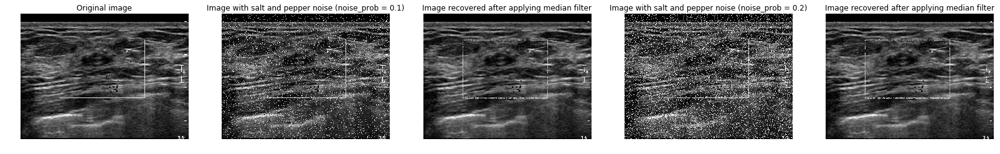

In [7]:
# Function to generate image with salt and pepper noise
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
#Part A 
def noisy_image_generator(img_in, probability = 0.1):
    result = np.copy(img_in)
    noise_pixel = np.ceil(probability * img_in.size * 0.5)
    pixel_to_change = [np.random.randint(0, i - 1, int(noise_pixel)) for i in img_in.shape]
    result[pixel_to_change] = 0
    noise_pixel = np.ceil(probability * img_in.size * 0.5)
    pixel_to_change = [np.random.randint(0, i - 1, int(noise_pixel)) for i in img_in.shape]
    result[pixel_to_change] = 255
    return result
  
# Function to apply median filter(window size kxk) on the input image  
        
#Part B 
def median_filter(img_in, window_size = 5):
    
    result = np.copy(img_in)
    rows, cols = img_in.shape
    #print(np.median(img_in[:2,:2]))
    radius = int((window_size - 1) / 2)
    for i in range(0, rows):
        for j in range(0, cols):
             result[i,j] = np.median(img_in[max(i - radius,0): min(i + radius,rows), max(j - radius,0) : min(cols,j+ radius)])
    return result

img = cv2.imread('C:/Users/kitojo/Desktop/filter/12.png', 0)
image_s_p1 = noisy_image_generator(img, probability = 0.1)  
result1 = median_filter(image_s_p1, window_size = 5)

image_s_p2 = noisy_image_generator(img, probability = 0.2)  
result2 = median_filter(image_s_p2, window_size = 5)

cv2.imwrite("Results/P1_05.jpg", result1)    
cv2.imwrite("Results/P1_06.jpg", result2)    

# Plot results
plt.figure(figsize = (28, 20))
plt.subplot(1, 5, 1)
plt.imshow(img, 'gray')
plt.title('Original image')
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(image_s_p1, 'gray')
plt.title('Image with salt and pepper noise (noise_prob = 0.1)')
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(result1, 'gray')
plt.title('Image recovered after applying median filter')
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(image_s_p2, 'gray')
plt.title('Image with salt and pepper noise (noise_prob = 0.2)')
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(result2, 'gray')
plt.title('Image recovered after applying median filter')
plt.axis("off")

plt.show()


In [0]:
# project_dir = "."

In [ ]:
def median_filter(data, filter_size):
    temp = []
    indexer = filter_size // 2
    window = [
        (i, j)
        for i in range(-indexer, filter_size-indexer)
        for j in range(-indexer, filter_size-indexer)
    ]
    index = len(window) // 2
    for i in range(len(data)):
        for j in range(len(data[0])):
            data[i][j] = sorted(
                0 if (
                    min(i+a, j+b) < 0
                    or len(data) <= i+a
                    or len(data[0]) <= j+b
                ) else data[i+a][j+b]
                for a, b in window
            )[index]
    return data

In [2]:
# data_dir = project_dir + "/data"

data_dir = "data"

In [3]:
image_source_dir = data_dir + "/originals"

### Number of samples of each type of tumor

Benign

In [4]:
len([name for name in os.listdir(image_source_dir + "/benign") if os.path.isfile(os.path.join(image_source_dir + "/benign/", name))])

593

Malign

In [5]:
len([name for name in os.listdir(image_source_dir + "/malignant/") if os.path.isfile(os.path.join(image_source_dir + "/malignant/", name))])

307

In [6]:
image_dest_dir = data_dir + "/keras"

In [7]:
split_folders.ratio(image_source_dir, output=image_dest_dir, seed=42, ratio=(.8, .1, .1))

Copying files: 900 files [00:48, 18.49 files/s]


In [8]:
image_width = 40
image_height = 30
if K.image_data_format() == 'channels_first':
    input_shape = (1,  image_height, image_width,)
else:
    input_shape = (image_height, image_width, 1)

In [28]:
# train_generator = ImageDataGenerator(rescale=1./255)
# validation_generator = ImageDataGenerator(rescale=1./255)
test_set = test_datagen.flow_from_directory('dataset/validation',
                                            target_size=(64, 64),
                                            batch_size=32,
                                            class_mode='binary')



In [9]:
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest')

In [10]:
train_generator = train_datagen.flow_from_directory(
    image_dest_dir + "/train",
#     'keras/train'
    target_size=(image_height, image_width),
    batch_size=32,
    color_mode="grayscale",
    class_mode='binary',)

Found 719 images belonging to 2 classes.


In [11]:
class_weights = class_weight.compute_class_weight(
               'balanced',
                np.unique(train_generator.classes), 
                train_generator.classes)

In [12]:
# validation_generator = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
# validation_generator = train_datagen.flow_from_directory(
validation_generator = test_datagen.flow_from_directory(
    image_dest_dir + "/val",
#         'keras/val'
    target_size=(image_height, image_width),
    batch_size=32,
    color_mode="grayscale",
    class_mode='binary',)

Found 89 images belonging to 2 classes.


# Create Model

In [13]:
def sensitivity(y_true, y_pred):
  true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
  possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
  return true_positives / (possible_positives + K.epsilon())

def specificity(y_true, y_pred):
  true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
  possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
  return true_negatives / (possible_negatives + K.epsilon())

def fmed(y_true, y_pred):
  spec = specificity(y_true, y_pred)
  sens = sensitivity(y_true, y_pred)
  fmed = 2 * (spec * sens)/(spec+sens+K.epsilon())
  return fmed

def f1(y_true, y_pred):
  true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
  possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
  predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
  precision = true_positives / (predicted_positives + K.epsilon())
  recall = true_positives / (possible_positives + K.epsilon())
  f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
  return f1_val

def generate_model(opt=keras.optimizers.Adam()):
    model = Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=input_shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    
    model.add(Conv2D(64, (3,3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))


    model.add(Conv2D(64, (3,3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))


    model.add(Flatten())
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(1))
    model.add(Activation('sigmoid'))    
    
    model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy', sensitivity, specificity, fmed, f1])
    return model

Adam Optimizer

In [ ]:
num_train_samples = 10000
num_validation_samples = 1000
batch_size = 32

# num_train_samples = 50
# num_validation_samples = 50
# batch_size = 10
model = generate_model(opt=keras.optimizers.Adam())

# model.load_weights(data_dir + '/nn_best_model_cv_val_fmed.h5')
history_val_fmed = model.fit_generator(
    train_generator,
    steps_per_epoch= num_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps= num_validation_samples // batch_size,
    epochs=500, 
    verbose=1,
        callbacks=[
          EarlyStopping(monitor='val_fmed', mode="max", verbose=1, patience=50),
          ModelCheckpoint(data_dir + '/nn_best_model_cv_val_fmed.h5', monitor='val_fmed', mode="max", verbose=1, save_best_only=True)
        ],
    class_weight=class_weights)

Epoch 1/500


 73/312 [======>.......................] - ETA: 14:45 - loss: 0.6996 - acc: 0.4375 - sensitivity: 0.4286 - specificity: 0.4400 - fmed: 0.4342 - f1: 0.25 - ETA: 8:06 - loss: 0.6889 - acc: 0.5469 - sensitivity: 0.2857 - specificity: 0.6200 - fmed: 0.3383 - f1: 0.2019 - ETA: 5:54 - loss: 0.6825 - acc: 0.5625 - sensitivity: 0.1905 - specificity: 0.7300 - fmed: 0.2255 - f1: 0.134 - ETA: 4:53 - loss: 0.6763 - acc: 0.5781 - sensitivity: 0.1429 - specificity: 0.7748 - fmed: 0.1692 - f1: 0.101 - ETA: 4:38 - loss: 0.6761 - acc: 0.5813 - sensitivity: 0.1143 - specificity: 0.8008 - fmed: 0.1353 - f1: 0.080 - ETA: 4:23 - loss: 0.6694 - acc: 0.5885 - sensitivity: 0.1104 - specificity: 0.8181 - fmed: 0.1403 - f1: 0.091 - ETA: 4:13 - loss: 0.6617 - acc: 0.5982 - sensitivity: 0.0946 - specificity: 0.8317 - fmed: 0.1203 - f1: 0.078 - ETA: 4:04 - loss: 0.6618 - acc: 0.5938 - sensitivity: 0.0828 - specificity: 0.8255 - fmed: 0.1052 - f1: 0.068 - ETA: 3:58 - loss: 0.6590 - acc: 0.6042 - sensitivity: 0.0736

295/312 [===========================>..] - ETA: 48s - loss: 0.6459 - acc: 0.6525 - sensitivity: 0.0040 - specificity: 0.9913 - fmed: 0.0057 - f1: 0.00 - ETA: 47s - loss: 0.6455 - acc: 0.6530 - sensitivity: 0.0040 - specificity: 0.9913 - fmed: 0.0057 - f1: 0.00 - ETA: 46s - loss: 0.6453 - acc: 0.6533 - sensitivity: 0.0040 - specificity: 0.9914 - fmed: 0.0057 - f1: 0.00 - ETA: 46s - loss: 0.6455 - acc: 0.6530 - sensitivity: 0.0040 - specificity: 0.9914 - fmed: 0.0057 - f1: 0.00 - ETA: 45s - loss: 0.6454 - acc: 0.6534 - sensitivity: 0.0040 - specificity: 0.9915 - fmed: 0.0056 - f1: 0.00 - ETA: 45s - loss: 0.6449 - acc: 0.6538 - sensitivity: 0.0039 - specificity: 0.9915 - fmed: 0.0056 - f1: 0.00 - ETA: 44s - loss: 0.6449 - acc: 0.6539 - sensitivity: 0.0039 - specificity: 0.9915 - fmed: 0.0056 - f1: 0.00 - ETA: 44s - loss: 0.6447 - acc: 0.6543 - sensitivity: 0.0039 - specificity: 0.9916 - fmed: 0.0056 - f1: 0.00 - ETA: 43s - loss: 0.6448 - acc: 0.6539 - sensitivity: 0.0039 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.6407 - acc: 0.6564 - sensitivity: 0.0030 - specificity: 0.9935 - fmed: 0.0043 - f1: 0.003 - ETA: 7s - loss: 0.6408 - acc: 0.6560 - sensitivity: 0.0030 - specificity: 0.9935 - fmed: 0.0043 - f1: 0.003 - ETA: 7s - loss: 0.6408 - acc: 0.6560 - sensitivity: 0.0030 - specificity: 0.9936 - fmed: 0.0043 - f1: 0.003 - ETA: 6s - loss: 0.6408 - acc: 0.6558 - sensitivity: 0.0030 - specificity: 0.9936 - fmed: 0.0042 - f1: 0.003 - ETA: 6s - loss: 0.6409 - acc: 0.6555 - sensitivity: 0.0030 - specificity: 0.9936 - fmed: 0.0042 - f1: 0.003 - ETA: 5s - loss: 0.6409 - acc: 0.6554 - sensitivity: 0.0030 - specificity: 0.9936 - fmed: 0.0042 - f1: 0.003 - ETA: 5s - loss: 0.6408 - acc: 0.6557 - sensitivity: 0.0030 - specificity: 0.9936 - fmed: 0.0042 - f1: 0.003 - ETA: 4s - loss: 0.6409 - acc: 0.6554 - sensitivity: 0.0029 - specificity: 0.9937 - fmed: 0.0042 - f1: 0.003 - ETA: 4s - loss: 0.6409 - acc: 0.6556 - sensitivity: 0.0029 - specificity: 0.9

 66/312 [=====>........................] - ETA: 1:15 - loss: 0.5345 - acc: 0.8438 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:26 - loss: 0.5406 - acc: 0.7812 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:42 - loss: 0.5869 - acc: 0.7604 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:56 - loss: 0.5985 - acc: 0.7266 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:58 - loss: 0.6026 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:58 - loss: 0.6013 - acc: 0.7135 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 2:00 - loss: 0.5954 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 2:00 - loss: 0.5916 - acc: 0.7148 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

278/312 [=========================>....] - ETA: 58s - loss: 0.6115 - acc: 0.6620 - sensitivity: 0.0095 - specificity: 0.9966 - fmed: 0.0163 - f1: 0.01 - ETA: 57s - loss: 0.6109 - acc: 0.6628 - sensitivity: 0.0094 - specificity: 0.9966 - fmed: 0.0162 - f1: 0.01 - ETA: 56s - loss: 0.6109 - acc: 0.6626 - sensitivity: 0.0094 - specificity: 0.9964 - fmed: 0.0161 - f1: 0.01 - ETA: 56s - loss: 0.6105 - acc: 0.6624 - sensitivity: 0.0093 - specificity: 0.9964 - fmed: 0.0161 - f1: 0.01 - ETA: 55s - loss: 0.6107 - acc: 0.6621 - sensitivity: 0.0096 - specificity: 0.9964 - fmed: 0.0166 - f1: 0.01 - ETA: 55s - loss: 0.6105 - acc: 0.6625 - sensitivity: 0.0096 - specificity: 0.9964 - fmed: 0.0165 - f1: 0.01 - ETA: 54s - loss: 0.6103 - acc: 0.6625 - sensitivity: 0.0099 - specificity: 0.9964 - fmed: 0.0172 - f1: 0.01 - ETA: 54s - loss: 0.6096 - acc: 0.6632 - sensitivity: 0.0099 - specificity: 0.9964 - fmed: 0.0171 - f1: 0.01 - ETA: 53s - loss: 0.6093 - acc: 0.6633 - sensitivity: 0.0103 - specificity: 0.

312/312 [==============================] - ETA: 17s - loss: 0.6060 - acc: 0.6664 - sensitivity: 0.0442 - specificity: 0.9851 - fmed: 0.0700 - f1: 0.06 - ETA: 16s - loss: 0.6062 - acc: 0.6665 - sensitivity: 0.0447 - specificity: 0.9850 - fmed: 0.0709 - f1: 0.06 - ETA: 16s - loss: 0.6062 - acc: 0.6666 - sensitivity: 0.0452 - specificity: 0.9849 - fmed: 0.0717 - f1: 0.06 - ETA: 15s - loss: 0.6060 - acc: 0.6669 - sensitivity: 0.0454 - specificity: 0.9849 - fmed: 0.0722 - f1: 0.06 - ETA: 15s - loss: 0.6058 - acc: 0.6672 - sensitivity: 0.0457 - specificity: 0.9847 - fmed: 0.0728 - f1: 0.06 - ETA: 14s - loss: 0.6054 - acc: 0.6676 - sensitivity: 0.0461 - specificity: 0.9846 - fmed: 0.0734 - f1: 0.06 - ETA: 14s - loss: 0.6058 - acc: 0.6675 - sensitivity: 0.0462 - specificity: 0.9847 - fmed: 0.0737 - f1: 0.06 - ETA: 13s - loss: 0.6062 - acc: 0.6678 - sensitivity: 0.0467 - specificity: 0.9847 - fmed: 0.0746 - f1: 0.07 - ETA: 13s - loss: 0.6058 - acc: 0.6679 - sensitivity: 0.0469 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4907 - acc: 0.8125 - sensitivity: 0.6250 - specificity: 0.8750 - fmed: 0.7292 - f1: 0.625 - ETA: 1:12 - loss: 0.5405 - acc: 0.7500 - sensitivity: 0.4125 - specificity: 0.8920 - fmed: 0.5285 - f1: 0.455 - ETA: 1:15 - loss: 0.5499 - acc: 0.7188 - sensitivity: 0.3263 - specificity: 0.9280 - fmed: 0.4412 - f1: 0.392 - ETA: 1:15 - loss: 0.5516 - acc: 0.7188 - sensitivity: 0.2725 - specificity: 0.9352 - fmed: 0.3807 - f1: 0.339 - ETA: 1:14 - loss: 0.5437 - acc: 0.7250 - sensitivity: 0.3069 - specificity: 0.9220 - fmed: 0.4222 - f1: 0.371 - ETA: 1:13 - loss: 0.5543 - acc: 0.7240 - sensitivity: 0.2743 - specificity: 0.9278 - fmed: 0.3850 - f1: 0.340 - ETA: 1:13 - loss: 0.5563 - acc: 0.7098 - sensitivity: 0.2555 - specificity: 0.9381 - fmed: 0.3657 - f1: 0.327 - ETA: 1:14 - loss: 0.5534 - acc: 0.7109 - sensitivity: 0.2235 - specificity: 0.9458 - fmed: 0.3200 - f1: 0.286 - ETA: 1:14 - loss: 0.5568 - acc: 0.6979 - sensitivity: 0.2073 

295/312 [===========================>..] - ETA: 51s - loss: 0.5783 - acc: 0.7051 - sensitivity: 0.3264 - specificity: 0.9017 - fmed: 0.4365 - f1: 0.39 - ETA: 50s - loss: 0.5786 - acc: 0.7048 - sensitivity: 0.3267 - specificity: 0.9010 - fmed: 0.4368 - f1: 0.39 - ETA: 50s - loss: 0.5786 - acc: 0.7047 - sensitivity: 0.3275 - specificity: 0.9002 - fmed: 0.4375 - f1: 0.39 - ETA: 49s - loss: 0.5790 - acc: 0.7043 - sensitivity: 0.3285 - specificity: 0.8992 - fmed: 0.4382 - f1: 0.39 - ETA: 48s - loss: 0.5787 - acc: 0.7043 - sensitivity: 0.3298 - specificity: 0.8983 - fmed: 0.4393 - f1: 0.39 - ETA: 48s - loss: 0.5790 - acc: 0.7040 - sensitivity: 0.3300 - specificity: 0.8983 - fmed: 0.4396 - f1: 0.39 - ETA: 47s - loss: 0.5796 - acc: 0.7036 - sensitivity: 0.3302 - specificity: 0.8981 - fmed: 0.4400 - f1: 0.39 - ETA: 47s - loss: 0.5792 - acc: 0.7041 - sensitivity: 0.3294 - specificity: 0.8984 - fmed: 0.4393 - f1: 0.39 - ETA: 46s - loss: 0.5790 - acc: 0.7043 - sensitivity: 0.3280 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5783 - acc: 0.7051 - sensitivity: 0.3301 - specificity: 0.8999 - fmed: 0.4409 - f1: 0.398 - ETA: 8s - loss: 0.5783 - acc: 0.7052 - sensitivity: 0.3307 - specificity: 0.8997 - fmed: 0.4416 - f1: 0.399 - ETA: 7s - loss: 0.5786 - acc: 0.7047 - sensitivity: 0.3323 - specificity: 0.8981 - fmed: 0.4419 - f1: 0.400 - ETA: 7s - loss: 0.5789 - acc: 0.7045 - sensitivity: 0.3333 - specificity: 0.8973 - fmed: 0.4426 - f1: 0.400 - ETA: 6s - loss: 0.5792 - acc: 0.7040 - sensitivity: 0.3343 - specificity: 0.8961 - fmed: 0.4430 - f1: 0.400 - ETA: 6s - loss: 0.5793 - acc: 0.7038 - sensitivity: 0.3351 - specificity: 0.8952 - fmed: 0.4436 - f1: 0.401 - ETA: 5s - loss: 0.5798 - acc: 0.7032 - sensitivity: 0.3358 - specificity: 0.8940 - fmed: 0.4439 - f1: 0.401 - ETA: 5s - loss: 0.5797 - acc: 0.7034 - sensitivity: 0.3368 - specificity: 0.8937 - fmed: 0.4448 - f1: 0.401 - ETA: 4s - loss: 0.5798 - acc: 0.7030 - sensitivity: 0.3368 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:22 - loss: 0.5827 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:17 - loss: 0.5866 - acc: 0.6562 - sensitivity: 0.0417 - specificity: 1.0000 - fmed: 0.0769 - f1: 0.0769            - ETA: 1:16 - loss: 0.5715 - acc: 0.6667 - sensitivity: 0.0833 - specificity: 1.0000 - fmed: 0.1465 - f1: 0.146 - ETA: 1:18 - loss: 0.5491 - acc: 0.6953 - sensitivity: 0.1181 - specificity: 1.0000 - fmed: 0.2008 - f1: 0.200 - ETA: 1:18 - loss: 0.5464 - acc: 0.7188 - sensitivity: 0.1611 - specificity: 1.0000 - fmed: 0.2606 - f1: 0.260 - ETA: 1:18 - loss: 0.5493 - acc: 0.7188 - sensitivity: 0.1343 - specificity: 1.0000 - fmed: 0.2172 - f1: 0.217 - ETA: 1:12 - loss: 0.5601 - acc: 0.7113 - sensitivity: 0.1559 - specificity: 1.0000 - fmed: 0.2497 - f1: 0.249 - ETA: 1:13 - loss: 0.5590 - acc: 0.7122 - sensitivity: 0.1811 - specificity: 1.0000 - fmed: 0.2842 - f1: 0.284 - ETA: 1:13 - loss: 0.5623 - acc: 0.709

295/312 [===========================>..] - ETA: 51s - loss: 0.5642 - acc: 0.7160 - sensitivity: 0.3626 - specificity: 0.8978 - fmed: 0.4855 - f1: 0.43 - ETA: 50s - loss: 0.5641 - acc: 0.7161 - sensitivity: 0.3634 - specificity: 0.8976 - fmed: 0.4864 - f1: 0.44 - ETA: 50s - loss: 0.5650 - acc: 0.7153 - sensitivity: 0.3640 - specificity: 0.8961 - fmed: 0.4866 - f1: 0.44 - ETA: 49s - loss: 0.5648 - acc: 0.7153 - sensitivity: 0.3651 - specificity: 0.8954 - fmed: 0.4873 - f1: 0.44 - ETA: 49s - loss: 0.5646 - acc: 0.7153 - sensitivity: 0.3659 - specificity: 0.8949 - fmed: 0.4881 - f1: 0.44 - ETA: 48s - loss: 0.5646 - acc: 0.7153 - sensitivity: 0.3676 - specificity: 0.8941 - fmed: 0.4891 - f1: 0.44 - ETA: 48s - loss: 0.5641 - acc: 0.7155 - sensitivity: 0.3660 - specificity: 0.8945 - fmed: 0.4870 - f1: 0.43 - ETA: 47s - loss: 0.5636 - acc: 0.7158 - sensitivity: 0.3660 - specificity: 0.8950 - fmed: 0.4872 - f1: 0.43 - ETA: 47s - loss: 0.5635 - acc: 0.7159 - sensitivity: 0.3649 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5651 - acc: 0.7178 - sensitivity: 0.3665 - specificity: 0.8981 - fmed: 0.4874 - f1: 0.441 - ETA: 8s - loss: 0.5649 - acc: 0.7180 - sensitivity: 0.3670 - specificity: 0.8979 - fmed: 0.4879 - f1: 0.441 - ETA: 8s - loss: 0.5649 - acc: 0.7182 - sensitivity: 0.3676 - specificity: 0.8978 - fmed: 0.4885 - f1: 0.441 - ETA: 7s - loss: 0.5649 - acc: 0.7181 - sensitivity: 0.3677 - specificity: 0.8979 - fmed: 0.4888 - f1: 0.442 - ETA: 6s - loss: 0.5648 - acc: 0.7181 - sensitivity: 0.3678 - specificity: 0.8981 - fmed: 0.4890 - f1: 0.442 - ETA: 6s - loss: 0.5648 - acc: 0.7181 - sensitivity: 0.3677 - specificity: 0.8983 - fmed: 0.4890 - f1: 0.442 - ETA: 5s - loss: 0.5645 - acc: 0.7184 - sensitivity: 0.3681 - specificity: 0.8983 - fmed: 0.4895 - f1: 0.442 - ETA: 5s - loss: 0.5650 - acc: 0.7179 - sensitivity: 0.3682 - specificity: 0.8977 - fmed: 0.4896 - f1: 0.442 - ETA: 4s - loss: 0.5650 - acc: 0.7180 - sensitivity: 0.3686 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.5632 - acc: 0.6875 - sensitivity: 0.6364 - specificity: 0.7143 - fmed: 0.6731 - f1: 0.583 - ETA: 1:07 - loss: 0.5055 - acc: 0.7812 - sensitivity: 0.6515 - specificity: 0.8354 - fmed: 0.7294 - f1: 0.666 - ETA: 1:07 - loss: 0.5630 - acc: 0.7500 - sensitivity: 0.6195 - specificity: 0.8033 - fmed: 0.6977 - f1: 0.611 - ETA: 1:13 - loss: 0.5919 - acc: 0.7109 - sensitivity: 0.5718 - specificity: 0.7830 - fmed: 0.6578 - f1: 0.578 - ETA: 1:12 - loss: 0.5691 - acc: 0.7312 - sensitivity: 0.5685 - specificity: 0.8090 - fmed: 0.6644 - f1: 0.587 - ETA: 1:11 - loss: 0.5704 - acc: 0.7292 - sensitivity: 0.5507 - specificity: 0.8233 - fmed: 0.6551 - f1: 0.585 - ETA: 1:11 - loss: 0.5600 - acc: 0.7232 - sensitivity: 0.5292 - specificity: 0.8226 - fmed: 0.6383 - f1: 0.564 - ETA: 1:11 - loss: 0.5598 - acc: 0.7188 - sensitivity: 0.4769 - specificity: 0.8339 - fmed: 0.5833 - f1: 0.515 - ETA: 1:13 - loss: 0.5500 - acc: 0.7257 - sensitivity: 0.4573 

294/312 [===========================>..] - ETA: 53s - loss: 0.5616 - acc: 0.7148 - sensitivity: 0.4073 - specificity: 0.8727 - fmed: 0.5143 - f1: 0.46 - ETA: 53s - loss: 0.5613 - acc: 0.7149 - sensitivity: 0.4061 - specificity: 0.8729 - fmed: 0.5131 - f1: 0.46 - ETA: 52s - loss: 0.5608 - acc: 0.7155 - sensitivity: 0.4068 - specificity: 0.8733 - fmed: 0.5140 - f1: 0.46 - ETA: 51s - loss: 0.5601 - acc: 0.7161 - sensitivity: 0.4062 - specificity: 0.8739 - fmed: 0.5137 - f1: 0.46 - ETA: 51s - loss: 0.5593 - acc: 0.7165 - sensitivity: 0.4062 - specificity: 0.8744 - fmed: 0.5139 - f1: 0.46 - ETA: 50s - loss: 0.5594 - acc: 0.7162 - sensitivity: 0.4054 - specificity: 0.8750 - fmed: 0.5132 - f1: 0.46 - ETA: 50s - loss: 0.5593 - acc: 0.7165 - sensitivity: 0.4056 - specificity: 0.8753 - fmed: 0.5137 - f1: 0.46 - ETA: 49s - loss: 0.5590 - acc: 0.7168 - sensitivity: 0.4058 - specificity: 0.8759 - fmed: 0.5142 - f1: 0.46 - ETA: 48s - loss: 0.5588 - acc: 0.7168 - sensitivity: 0.4054 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5559 - acc: 0.7197 - sensitivity: 0.4130 - specificity: 0.8767 - fmed: 0.5260 - f1: 0.4751 - ETA: 9s - loss: 0.5557 - acc: 0.7202 - sensitivity: 0.4146 - specificity: 0.8765 - fmed: 0.5271 - f1: 0.476 - ETA: 8s - loss: 0.5557 - acc: 0.7202 - sensitivity: 0.4144 - specificity: 0.8766 - fmed: 0.5270 - f1: 0.476 - ETA: 8s - loss: 0.5555 - acc: 0.7204 - sensitivity: 0.4151 - specificity: 0.8766 - fmed: 0.5276 - f1: 0.476 - ETA: 7s - loss: 0.5558 - acc: 0.7199 - sensitivity: 0.4145 - specificity: 0.8770 - fmed: 0.5272 - f1: 0.476 - ETA: 6s - loss: 0.5557 - acc: 0.7199 - sensitivity: 0.4143 - specificity: 0.8774 - fmed: 0.5272 - f1: 0.476 - ETA: 6s - loss: 0.5556 - acc: 0.7200 - sensitivity: 0.4146 - specificity: 0.8775 - fmed: 0.5275 - f1: 0.476 - ETA: 5s - loss: 0.5553 - acc: 0.7204 - sensitivity: 0.4150 - specificity: 0.8777 - fmed: 0.5281 - f1: 0.477 - ETA: 5s - loss: 0.5557 - acc: 0.7200 - sensitivity: 0.4140 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.5165 - acc: 0.7188 - sensitivity: 0.1667 - specificity: 0.8462 - fmed: 0.2785 - f1: 0.181 - ETA: 1:09 - loss: 0.5531 - acc: 0.7344 - sensitivity: 0.3141 - specificity: 0.8968 - fmed: 0.4496 - f1: 0.390 - ETA: 1:13 - loss: 0.5636 - acc: 0.7292 - sensitivity: 0.2927 - specificity: 0.9312 - fmed: 0.4331 - f1: 0.393 - ETA: 1:07 - loss: 0.4960 - acc: 0.7969 - sensitivity: 0.4696 - specificity: 0.9484 - fmed: 0.5748 - f1: 0.545 - ETA: 1:08 - loss: 0.4890 - acc: 0.7937 - sensitivity: 0.4556 - specificity: 0.9496 - fmed: 0.5726 - f1: 0.543 - ETA: 1:09 - loss: 0.5110 - acc: 0.7708 - sensitivity: 0.4555 - specificity: 0.9183 - fmed: 0.5721 - f1: 0.531 - ETA: 1:09 - loss: 0.5203 - acc: 0.7589 - sensitivity: 0.4618 - specificity: 0.9198 - fmed: 0.5832 - f1: 0.547 - ETA: 1:09 - loss: 0.5348 - acc: 0.7422 - sensitivity: 0.4666 - specificity: 0.8986 - fmed: 0.5853 - f1: 0.550 - ETA: 1:09 - loss: 0.5501 - acc: 0.7292 - sensitivity: 0.4518 

295/312 [===========================>..] - ETA: 50s - loss: 0.5370 - acc: 0.7353 - sensitivity: 0.4613 - specificity: 0.8790 - fmed: 0.5750 - f1: 0.52 - ETA: 50s - loss: 0.5369 - acc: 0.7348 - sensitivity: 0.4605 - specificity: 0.8787 - fmed: 0.5743 - f1: 0.52 - ETA: 49s - loss: 0.5376 - acc: 0.7342 - sensitivity: 0.4601 - specificity: 0.8780 - fmed: 0.5739 - f1: 0.51 - ETA: 49s - loss: 0.5375 - acc: 0.7343 - sensitivity: 0.4603 - specificity: 0.8777 - fmed: 0.5741 - f1: 0.51 - ETA: 48s - loss: 0.5381 - acc: 0.7339 - sensitivity: 0.4607 - specificity: 0.8770 - fmed: 0.5743 - f1: 0.51 - ETA: 48s - loss: 0.5387 - acc: 0.7337 - sensitivity: 0.4597 - specificity: 0.8775 - fmed: 0.5735 - f1: 0.51 - ETA: 47s - loss: 0.5383 - acc: 0.7339 - sensitivity: 0.4601 - specificity: 0.8775 - fmed: 0.5739 - f1: 0.51 - ETA: 47s - loss: 0.5381 - acc: 0.7341 - sensitivity: 0.4600 - specificity: 0.8776 - fmed: 0.5740 - f1: 0.51 - ETA: 46s - loss: 0.5381 - acc: 0.7339 - sensitivity: 0.4593 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5345 - acc: 0.7353 - sensitivity: 0.4674 - specificity: 0.8747 - fmed: 0.5821 - f1: 0.526 - ETA: 8s - loss: 0.5345 - acc: 0.7354 - sensitivity: 0.4681 - specificity: 0.8744 - fmed: 0.5825 - f1: 0.526 - ETA: 7s - loss: 0.5346 - acc: 0.7354 - sensitivity: 0.4687 - specificity: 0.8742 - fmed: 0.5830 - f1: 0.527 - ETA: 7s - loss: 0.5345 - acc: 0.7355 - sensitivity: 0.4684 - specificity: 0.8742 - fmed: 0.5828 - f1: 0.527 - ETA: 6s - loss: 0.5340 - acc: 0.7360 - sensitivity: 0.4695 - specificity: 0.8744 - fmed: 0.5837 - f1: 0.528 - ETA: 6s - loss: 0.5336 - acc: 0.7363 - sensitivity: 0.4701 - specificity: 0.8745 - fmed: 0.5843 - f1: 0.528 - ETA: 5s - loss: 0.5333 - acc: 0.7364 - sensitivity: 0.4704 - specificity: 0.8743 - fmed: 0.5846 - f1: 0.528 - ETA: 5s - loss: 0.5337 - acc: 0.7364 - sensitivity: 0.4695 - specificity: 0.8747 - fmed: 0.5838 - f1: 0.528 - ETA: 4s - loss: 0.5335 - acc: 0.7367 - sensitivity: 0.4701 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.4866 - acc: 0.8125 - sensitivity: 0.6000 - specificity: 0.9091 - fmed: 0.7229 - f1: 0.666 - ETA: 1:11 - loss: 0.4918 - acc: 0.7812 - sensitivity: 0.5500 - specificity: 0.9045 - fmed: 0.6829 - f1: 0.633 - ETA: 1:12 - loss: 0.5489 - acc: 0.7604 - sensitivity: 0.6020 - specificity: 0.8475 - fmed: 0.6950 - f1: 0.664 - ETA: 1:14 - loss: 0.5402 - acc: 0.7812 - sensitivity: 0.5878 - specificity: 0.8856 - fmed: 0.6977 - f1: 0.675 - ETA: 1:13 - loss: 0.5278 - acc: 0.7750 - sensitivity: 0.5274 - specificity: 0.8845 - fmed: 0.6445 - f1: 0.606 - ETA: 1:13 - loss: 0.5391 - acc: 0.7604 - sensitivity: 0.4951 - specificity: 0.8748 - fmed: 0.6162 - f1: 0.568 - ETA: 1:14 - loss: 0.5525 - acc: 0.7321 - sensitivity: 0.4243 - specificity: 0.8784 - fmed: 0.5282 - f1: 0.486 - ETA: 1:16 - loss: 0.5290 - acc: 0.7539 - sensitivity: 0.4650 - specificity: 0.8884 - fmed: 0.5674 - f1: 0.526 - ETA: 1:15 - loss: 0.5469 - acc: 0.7361 - sensitivity: 0.4451 

295/312 [===========================>..] - ETA: 51s - loss: 0.5301 - acc: 0.7374 - sensitivity: 0.4724 - specificity: 0.8750 - fmed: 0.5833 - f1: 0.52 - ETA: 50s - loss: 0.5302 - acc: 0.7374 - sensitivity: 0.4728 - specificity: 0.8747 - fmed: 0.5836 - f1: 0.52 - ETA: 50s - loss: 0.5297 - acc: 0.7378 - sensitivity: 0.4739 - specificity: 0.8748 - fmed: 0.5846 - f1: 0.52 - ETA: 49s - loss: 0.5299 - acc: 0.7375 - sensitivity: 0.4735 - specificity: 0.8744 - fmed: 0.5843 - f1: 0.52 - ETA: 49s - loss: 0.5294 - acc: 0.7380 - sensitivity: 0.4752 - specificity: 0.8742 - fmed: 0.5854 - f1: 0.52 - ETA: 48s - loss: 0.5289 - acc: 0.7383 - sensitivity: 0.4753 - specificity: 0.8744 - fmed: 0.5857 - f1: 0.52 - ETA: 48s - loss: 0.5292 - acc: 0.7380 - sensitivity: 0.4747 - specificity: 0.8743 - fmed: 0.5852 - f1: 0.52 - ETA: 47s - loss: 0.5289 - acc: 0.7384 - sensitivity: 0.4756 - specificity: 0.8746 - fmed: 0.5862 - f1: 0.53 - ETA: 47s - loss: 0.5297 - acc: 0.7378 - sensitivity: 0.4749 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5262 - acc: 0.7409 - sensitivity: 0.4783 - specificity: 0.8772 - fmed: 0.5902 - f1: 0.5352 - ETA: 9s - loss: 0.5261 - acc: 0.7410 - sensitivity: 0.4776 - specificity: 0.8775 - fmed: 0.5896 - f1: 0.534 - ETA: 8s - loss: 0.5262 - acc: 0.7408 - sensitivity: 0.4768 - specificity: 0.8774 - fmed: 0.5889 - f1: 0.533 - ETA: 7s - loss: 0.5265 - acc: 0.7407 - sensitivity: 0.4768 - specificity: 0.8776 - fmed: 0.5890 - f1: 0.534 - ETA: 7s - loss: 0.5265 - acc: 0.7407 - sensitivity: 0.4768 - specificity: 0.8776 - fmed: 0.5892 - f1: 0.534 - ETA: 6s - loss: 0.5268 - acc: 0.7406 - sensitivity: 0.4770 - specificity: 0.8775 - fmed: 0.5894 - f1: 0.534 - ETA: 6s - loss: 0.5270 - acc: 0.7405 - sensitivity: 0.4768 - specificity: 0.8775 - fmed: 0.5893 - f1: 0.534 - ETA: 5s - loss: 0.5269 - acc: 0.7408 - sensitivity: 0.4767 - specificity: 0.8779 - fmed: 0.5894 - f1: 0.534 - ETA: 4s - loss: 0.5270 - acc: 0.7407 - sensitivity: 0.4774 - specificity: 0.

 73/312 [======>.......................] - ETA: 42s - loss: 0.4402 - acc: 0.8000 - sensitivity: 0.4000 - specificity: 1.0000 - fmed: 0.5714 - f1: 0.57 - ETA: 57s - loss: 0.4283 - acc: 0.7906 - sensitivity: 0.3818 - specificity: 1.0000 - fmed: 0.5524 - f1: 0.55 - ETA: 1:03 - loss: 0.4468 - acc: 0.7979 - sensitivity: 0.4397 - specificity: 0.9710 - fmed: 0.5985 - f1: 0.576 - ETA: 1:06 - loss: 0.4582 - acc: 0.7859 - sensitivity: 0.4131 - specificity: 0.9783 - fmed: 0.5739 - f1: 0.557 - ETA: 1:08 - loss: 0.4590 - acc: 0.7850 - sensitivity: 0.3972 - specificity: 0.9739 - fmed: 0.5580 - f1: 0.538 - ETA: 1:08 - loss: 0.4513 - acc: 0.7948 - sensitivity: 0.4143 - specificity: 0.9713 - fmed: 0.5745 - f1: 0.551 - ETA: 1:08 - loss: 0.4450 - acc: 0.8018 - sensitivity: 0.4266 - specificity: 0.9754 - fmed: 0.5877 - f1: 0.567 - ETA: 1:09 - loss: 0.4648 - acc: 0.7836 - sensitivity: 0.4149 - specificity: 0.9711 - fmed: 0.5758 - f1: 0.556 - ETA: 1:10 - loss: 0.4840 - acc: 0.7660 - sensitivity: 0.3966 - sp

294/312 [===========================>..] - ETA: 52s - loss: 0.5241 - acc: 0.7408 - sensitivity: 0.4765 - specificity: 0.8806 - fmed: 0.5893 - f1: 0.53 - ETA: 52s - loss: 0.5251 - acc: 0.7401 - sensitivity: 0.4755 - specificity: 0.8806 - fmed: 0.5885 - f1: 0.53 - ETA: 51s - loss: 0.5249 - acc: 0.7400 - sensitivity: 0.4756 - specificity: 0.8806 - fmed: 0.5887 - f1: 0.53 - ETA: 51s - loss: 0.5250 - acc: 0.7396 - sensitivity: 0.4751 - specificity: 0.8803 - fmed: 0.5883 - f1: 0.53 - ETA: 50s - loss: 0.5252 - acc: 0.7394 - sensitivity: 0.4762 - specificity: 0.8793 - fmed: 0.5888 - f1: 0.53 - ETA: 50s - loss: 0.5256 - acc: 0.7393 - sensitivity: 0.4775 - specificity: 0.8785 - fmed: 0.5894 - f1: 0.53 - ETA: 49s - loss: 0.5258 - acc: 0.7398 - sensitivity: 0.4798 - specificity: 0.8780 - fmed: 0.5906 - f1: 0.53 - ETA: 48s - loss: 0.5257 - acc: 0.7395 - sensitivity: 0.4806 - specificity: 0.8772 - fmed: 0.5910 - f1: 0.53 - ETA: 48s - loss: 0.5256 - acc: 0.7396 - sensitivity: 0.4813 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5229 - acc: 0.7401 - sensitivity: 0.4689 - specificity: 0.8834 - fmed: 0.5822 - f1: 0.5298 - ETA: 9s - loss: 0.5228 - acc: 0.7402 - sensitivity: 0.4701 - specificity: 0.8830 - fmed: 0.5829 - f1: 0.530 - ETA: 8s - loss: 0.5230 - acc: 0.7400 - sensitivity: 0.4703 - specificity: 0.8827 - fmed: 0.5831 - f1: 0.530 - ETA: 8s - loss: 0.5229 - acc: 0.7403 - sensitivity: 0.4716 - specificity: 0.8824 - fmed: 0.5839 - f1: 0.531 - ETA: 7s - loss: 0.5230 - acc: 0.7401 - sensitivity: 0.4724 - specificity: 0.8817 - fmed: 0.5843 - f1: 0.531 - ETA: 7s - loss: 0.5226 - acc: 0.7405 - sensitivity: 0.4733 - specificity: 0.8818 - fmed: 0.5851 - f1: 0.532 - ETA: 6s - loss: 0.5222 - acc: 0.7410 - sensitivity: 0.4740 - specificity: 0.8822 - fmed: 0.5858 - f1: 0.533 - ETA: 5s - loss: 0.5225 - acc: 0.7411 - sensitivity: 0.4744 - specificity: 0.8821 - fmed: 0.5862 - f1: 0.533 - ETA: 5s - loss: 0.5221 - acc: 0.7415 - sensitivity: 0.4751 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.5191 - acc: 0.7188 - sensitivity: 0.4000 - specificity: 1.0000 - fmed: 0.5714 - f1: 0.571 - ETA: 1:09 - loss: 0.5179 - acc: 0.7500 - sensitivity: 0.5636 - specificity: 0.9048 - fmed: 0.6688 - f1: 0.633 - ETA: 1:12 - loss: 0.5798 - acc: 0.7188 - sensitivity: 0.5424 - specificity: 0.8339 - fmed: 0.6394 - f1: 0.540 - ETA: 1:14 - loss: 0.5442 - acc: 0.7500 - sensitivity: 0.6152 - specificity: 0.8370 - fmed: 0.6895 - f1: 0.571 - ETA: 1:14 - loss: 0.5367 - acc: 0.7438 - sensitivity: 0.5844 - specificity: 0.8485 - fmed: 0.6734 - f1: 0.571 - ETA: 1:15 - loss: 0.5358 - acc: 0.7448 - sensitivity: 0.5537 - specificity: 0.8429 - fmed: 0.6506 - f1: 0.531 - ETA: 1:16 - loss: 0.5264 - acc: 0.7545 - sensitivity: 0.5540 - specificity: 0.8529 - fmed: 0.6563 - f1: 0.545 - ETA: 1:15 - loss: 0.5148 - acc: 0.7656 - sensitivity: 0.5472 - specificity: 0.8661 - fmed: 0.6564 - f1: 0.554 - ETA: 1:16 - loss: 0.5074 - acc: 0.7639 - sensitivity: 0.5111 

294/312 [===========================>..] - ETA: 55s - loss: 0.5130 - acc: 0.7507 - sensitivity: 0.5049 - specificity: 0.8834 - fmed: 0.6166 - f1: 0.55 - ETA: 55s - loss: 0.5130 - acc: 0.7505 - sensitivity: 0.5048 - specificity: 0.8831 - fmed: 0.6167 - f1: 0.55 - ETA: 54s - loss: 0.5129 - acc: 0.7507 - sensitivity: 0.5051 - specificity: 0.8834 - fmed: 0.6171 - f1: 0.55 - ETA: 54s - loss: 0.5128 - acc: 0.7507 - sensitivity: 0.5056 - specificity: 0.8831 - fmed: 0.6174 - f1: 0.56 - ETA: 53s - loss: 0.5136 - acc: 0.7501 - sensitivity: 0.5045 - specificity: 0.8833 - fmed: 0.6165 - f1: 0.55 - ETA: 52s - loss: 0.5139 - acc: 0.7498 - sensitivity: 0.5039 - specificity: 0.8832 - fmed: 0.6161 - f1: 0.55 - ETA: 52s - loss: 0.5148 - acc: 0.7490 - sensitivity: 0.5027 - specificity: 0.8832 - fmed: 0.6150 - f1: 0.55 - ETA: 51s - loss: 0.5145 - acc: 0.7494 - sensitivity: 0.5043 - specificity: 0.8830 - fmed: 0.6161 - f1: 0.55 - ETA: 50s - loss: 0.5147 - acc: 0.7492 - sensitivity: 0.5049 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.5140 - acc: 0.7498 - sensitivity: 0.5034 - specificity: 0.8812 - fmed: 0.6145 - f1: 0.5579 - ETA: 9s - loss: 0.5136 - acc: 0.7499 - sensitivity: 0.5039 - specificity: 0.8812 - fmed: 0.6150 - f1: 0.558 - ETA: 8s - loss: 0.5139 - acc: 0.7497 - sensitivity: 0.5039 - specificity: 0.8809 - fmed: 0.6150 - f1: 0.558 - ETA: 8s - loss: 0.5138 - acc: 0.7497 - sensitivity: 0.5037 - specificity: 0.8810 - fmed: 0.6149 - f1: 0.558 - ETA: 7s - loss: 0.5136 - acc: 0.7497 - sensitivity: 0.5031 - specificity: 0.8813 - fmed: 0.6144 - f1: 0.558 - ETA: 7s - loss: 0.5138 - acc: 0.7496 - sensitivity: 0.5032 - specificity: 0.8809 - fmed: 0.6145 - f1: 0.557 - ETA: 6s - loss: 0.5139 - acc: 0.7495 - sensitivity: 0.5028 - specificity: 0.8810 - fmed: 0.6142 - f1: 0.557 - ETA: 5s - loss: 0.5136 - acc: 0.7497 - sensitivity: 0.5029 - specificity: 0.8811 - fmed: 0.6145 - f1: 0.557 - ETA: 5s - loss: 0.5137 - acc: 0.7496 - sensitivity: 0.5032 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.5234 - acc: 0.6562 - sensitivity: 0.4615 - specificity: 0.7895 - fmed: 0.5825 - f1: 0.521 - ETA: 1:04 - loss: 0.5004 - acc: 0.7188 - sensitivity: 0.5308 - specificity: 0.8266 - fmed: 0.6453 - f1: 0.576 - ETA: 1:09 - loss: 0.4973 - acc: 0.7083 - sensitivity: 0.4650 - specificity: 0.8074 - fmed: 0.5852 - f1: 0.479 - ETA: 1:10 - loss: 0.4990 - acc: 0.7344 - sensitivity: 0.5305 - specificity: 0.8199 - fmed: 0.6357 - f1: 0.541 - ETA: 1:10 - loss: 0.4830 - acc: 0.7312 - sensitivity: 0.5475 - specificity: 0.8138 - fmed: 0.6468 - f1: 0.561 - ETA: 1:09 - loss: 0.4778 - acc: 0.7500 - sensitivity: 0.5729 - specificity: 0.8297 - fmed: 0.6709 - f1: 0.590 - ETA: 1:11 - loss: 0.4844 - acc: 0.7411 - sensitivity: 0.5523 - specificity: 0.8381 - fmed: 0.6576 - f1: 0.584 - ETA: 1:11 - loss: 0.5010 - acc: 0.7227 - sensitivity: 0.5121 - specificity: 0.8386 - fmed: 0.6207 - f1: 0.550 - ETA: 1:11 - loss: 0.5051 - acc: 0.7222 - sensitivity: 0.5187 

295/312 [===========================>..] - ETA: 45s - loss: 0.5067 - acc: 0.7445 - sensitivity: 0.5213 - specificity: 0.8626 - fmed: 0.6283 - f1: 0.56 - ETA: 44s - loss: 0.5069 - acc: 0.7444 - sensitivity: 0.5210 - specificity: 0.8632 - fmed: 0.6282 - f1: 0.56 - ETA: 44s - loss: 0.5068 - acc: 0.7444 - sensitivity: 0.5202 - specificity: 0.8636 - fmed: 0.6278 - f1: 0.56 - ETA: 43s - loss: 0.5073 - acc: 0.7441 - sensitivity: 0.5187 - specificity: 0.8634 - fmed: 0.6262 - f1: 0.56 - ETA: 43s - loss: 0.5075 - acc: 0.7440 - sensitivity: 0.5189 - specificity: 0.8632 - fmed: 0.6264 - f1: 0.56 - ETA: 42s - loss: 0.5082 - acc: 0.7434 - sensitivity: 0.5179 - specificity: 0.8631 - fmed: 0.6255 - f1: 0.56 - ETA: 42s - loss: 0.5083 - acc: 0.7437 - sensitivity: 0.5184 - specificity: 0.8633 - fmed: 0.6261 - f1: 0.56 - ETA: 41s - loss: 0.5080 - acc: 0.7442 - sensitivity: 0.5196 - specificity: 0.8634 - fmed: 0.6270 - f1: 0.56 - ETA: 41s - loss: 0.5079 - acc: 0.7444 - sensitivity: 0.5200 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.5071 - acc: 0.7459 - sensitivity: 0.5204 - specificity: 0.8652 - fmed: 0.6295 - f1: 0.566 - ETA: 7s - loss: 0.5068 - acc: 0.7460 - sensitivity: 0.5203 - specificity: 0.8653 - fmed: 0.6296 - f1: 0.566 - ETA: 7s - loss: 0.5070 - acc: 0.7461 - sensitivity: 0.5208 - specificity: 0.8651 - fmed: 0.6299 - f1: 0.567 - ETA: 6s - loss: 0.5068 - acc: 0.7461 - sensitivity: 0.5207 - specificity: 0.8651 - fmed: 0.6299 - f1: 0.567 - ETA: 6s - loss: 0.5069 - acc: 0.7460 - sensitivity: 0.5208 - specificity: 0.8649 - fmed: 0.6300 - f1: 0.567 - ETA: 5s - loss: 0.5066 - acc: 0.7462 - sensitivity: 0.5212 - specificity: 0.8649 - fmed: 0.6303 - f1: 0.567 - ETA: 5s - loss: 0.5062 - acc: 0.7465 - sensitivity: 0.5217 - specificity: 0.8652 - fmed: 0.6309 - f1: 0.568 - ETA: 4s - loss: 0.5064 - acc: 0.7464 - sensitivity: 0.5217 - specificity: 0.8653 - fmed: 0.6309 - f1: 0.568 - ETA: 4s - loss: 0.5065 - acc: 0.7464 - sensitivity: 0.5216 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:13 - loss: 0.4139 - acc: 0.8438 - sensitivity: 0.7273 - specificity: 0.9048 - fmed: 0.8064 - f1: 0.761 - ETA: 1:22 - loss: 0.5445 - acc: 0.7500 - sensitivity: 0.5455 - specificity: 0.8571 - fmed: 0.6541 - f1: 0.591 - ETA: 1:20 - loss: 0.5142 - acc: 0.7708 - sensitivity: 0.5303 - specificity: 0.9048 - fmed: 0.6583 - f1: 0.616 - ETA: 1:20 - loss: 0.5045 - acc: 0.7656 - sensitivity: 0.4533 - specificity: 0.9177 - fmed: 0.5839 - f1: 0.545 - ETA: 1:18 - loss: 0.5207 - acc: 0.7500 - sensitivity: 0.4501 - specificity: 0.9217 - fmed: 0.5864 - f1: 0.553 - ETA: 1:19 - loss: 0.5245 - acc: 0.7396 - sensitivity: 0.4660 - specificity: 0.8950 - fmed: 0.5946 - f1: 0.552 - ETA: 1:21 - loss: 0.5246 - acc: 0.7366 - sensitivity: 0.4828 - specificity: 0.8815 - fmed: 0.6061 - f1: 0.560 - ETA: 1:16 - loss: 0.5096 - acc: 0.7445 - sensitivity: 0.5474 - specificity: 0.8546 - fmed: 0.6303 - f1: 0.590 - ETA: 1:16 - loss: 0.4974 - acc: 0.7625 - sensitivity: 0.5818 

295/312 [===========================>..] - ETA: 49s - loss: 0.5193 - acc: 0.7500 - sensitivity: 0.5163 - specificity: 0.8728 - fmed: 0.6184 - f1: 0.56 - ETA: 48s - loss: 0.5193 - acc: 0.7498 - sensitivity: 0.5178 - specificity: 0.8718 - fmed: 0.6189 - f1: 0.56 - ETA: 48s - loss: 0.5192 - acc: 0.7500 - sensitivity: 0.5179 - specificity: 0.8719 - fmed: 0.6191 - f1: 0.56 - ETA: 47s - loss: 0.5187 - acc: 0.7505 - sensitivity: 0.5190 - specificity: 0.8721 - fmed: 0.6201 - f1: 0.56 - ETA: 47s - loss: 0.5192 - acc: 0.7503 - sensitivity: 0.5182 - specificity: 0.8722 - fmed: 0.6195 - f1: 0.56 - ETA: 46s - loss: 0.5189 - acc: 0.7508 - sensitivity: 0.5192 - specificity: 0.8724 - fmed: 0.6204 - f1: 0.56 - ETA: 46s - loss: 0.5187 - acc: 0.7507 - sensitivity: 0.5190 - specificity: 0.8725 - fmed: 0.6204 - f1: 0.56 - ETA: 45s - loss: 0.5181 - acc: 0.7510 - sensitivity: 0.5185 - specificity: 0.8731 - fmed: 0.6202 - f1: 0.56 - ETA: 45s - loss: 0.5179 - acc: 0.7509 - sensitivity: 0.5174 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.5131 - acc: 0.7537 - sensitivity: 0.5163 - specificity: 0.8767 - fmed: 0.6209 - f1: 0.567 - ETA: 8s - loss: 0.5125 - acc: 0.7543 - sensitivity: 0.5179 - specificity: 0.8769 - fmed: 0.6221 - f1: 0.568 - ETA: 7s - loss: 0.5125 - acc: 0.7544 - sensitivity: 0.5180 - specificity: 0.8770 - fmed: 0.6223 - f1: 0.568 - ETA: 6s - loss: 0.5129 - acc: 0.7540 - sensitivity: 0.5179 - specificity: 0.8764 - fmed: 0.6222 - f1: 0.568 - ETA: 6s - loss: 0.5128 - acc: 0.7542 - sensitivity: 0.5185 - specificity: 0.8765 - fmed: 0.6227 - f1: 0.569 - ETA: 5s - loss: 0.5129 - acc: 0.7545 - sensitivity: 0.5188 - specificity: 0.8768 - fmed: 0.6231 - f1: 0.569 - ETA: 5s - loss: 0.5127 - acc: 0.7547 - sensitivity: 0.5187 - specificity: 0.8768 - fmed: 0.6231 - f1: 0.569 - ETA: 4s - loss: 0.5128 - acc: 0.7547 - sensitivity: 0.5187 - specificity: 0.8767 - fmed: 0.6232 - f1: 0.569 - ETA: 4s - loss: 0.5124 - acc: 0.7550 - sensitivity: 0.5187 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.3440 - acc: 0.9062 - sensitivity: 0.8333 - specificity: 0.9231 - fmed: 0.8759 - f1: 0.769 - ETA: 1:18 - loss: 0.4155 - acc: 0.7969 - sensitivity: 0.7167 - specificity: 0.8252 - fmed: 0.7667 - f1: 0.657 - ETA: 1:21 - loss: 0.4785 - acc: 0.7604 - sensitivity: 0.6444 - specificity: 0.8279 - fmed: 0.7195 - f1: 0.632 - ETA: 1:21 - loss: 0.4930 - acc: 0.7422 - sensitivity: 0.5927 - specificity: 0.8553 - fmed: 0.6888 - f1: 0.620 - ETA: 1:22 - loss: 0.4785 - acc: 0.7625 - sensitivity: 0.5972 - specificity: 0.8842 - fmed: 0.7034 - f1: 0.648 - ETA: 1:24 - loss: 0.4852 - acc: 0.7604 - sensitivity: 0.5394 - specificity: 0.8896 - fmed: 0.6516 - f1: 0.596 - ETA: 1:22 - loss: 0.4973 - acc: 0.7500 - sensitivity: 0.5218 - specificity: 0.8840 - fmed: 0.6384 - f1: 0.582 - ETA: 1:22 - loss: 0.4891 - acc: 0.7539 - sensitivity: 0.5441 - specificity: 0.8758 - fmed: 0.6529 - f1: 0.592 - ETA: 1:21 - loss: 0.5100 - acc: 0.7465 - sensitivity: 0.5551 

295/312 [===========================>..] - ETA: 45s - loss: 0.5010 - acc: 0.7583 - sensitivity: 0.5183 - specificity: 0.8813 - fmed: 0.6307 - f1: 0.57 - ETA: 44s - loss: 0.5007 - acc: 0.7587 - sensitivity: 0.5193 - specificity: 0.8814 - fmed: 0.6316 - f1: 0.57 - ETA: 44s - loss: 0.5003 - acc: 0.7590 - sensitivity: 0.5195 - specificity: 0.8816 - fmed: 0.6318 - f1: 0.57 - ETA: 43s - loss: 0.5003 - acc: 0.7588 - sensitivity: 0.5188 - specificity: 0.8813 - fmed: 0.6313 - f1: 0.57 - ETA: 43s - loss: 0.4998 - acc: 0.7590 - sensitivity: 0.5201 - specificity: 0.8810 - fmed: 0.6321 - f1: 0.57 - ETA: 42s - loss: 0.4995 - acc: 0.7592 - sensitivity: 0.5204 - specificity: 0.8811 - fmed: 0.6325 - f1: 0.57 - ETA: 42s - loss: 0.4993 - acc: 0.7594 - sensitivity: 0.5209 - specificity: 0.8812 - fmed: 0.6330 - f1: 0.57 - ETA: 41s - loss: 0.4996 - acc: 0.7593 - sensitivity: 0.5217 - specificity: 0.8806 - fmed: 0.6333 - f1: 0.57 - ETA: 41s - loss: 0.4994 - acc: 0.7594 - sensitivity: 0.5223 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4980 - acc: 0.7589 - sensitivity: 0.5250 - specificity: 0.8788 - fmed: 0.6362 - f1: 0.581 - ETA: 7s - loss: 0.4989 - acc: 0.7580 - sensitivity: 0.5256 - specificity: 0.8771 - fmed: 0.6357 - f1: 0.581 - ETA: 6s - loss: 0.4988 - acc: 0.7581 - sensitivity: 0.5269 - specificity: 0.8765 - fmed: 0.6363 - f1: 0.582 - ETA: 6s - loss: 0.4994 - acc: 0.7579 - sensitivity: 0.5274 - specificity: 0.8759 - fmed: 0.6364 - f1: 0.582 - ETA: 5s - loss: 0.4994 - acc: 0.7577 - sensitivity: 0.5281 - specificity: 0.8754 - fmed: 0.6367 - f1: 0.582 - ETA: 5s - loss: 0.4994 - acc: 0.7578 - sensitivity: 0.5290 - specificity: 0.8750 - fmed: 0.6372 - f1: 0.582 - ETA: 4s - loss: 0.4991 - acc: 0.7580 - sensitivity: 0.5291 - specificity: 0.8753 - fmed: 0.6374 - f1: 0.583 - ETA: 4s - loss: 0.4991 - acc: 0.7582 - sensitivity: 0.5288 - specificity: 0.8754 - fmed: 0.6372 - f1: 0.582 - ETA: 3s - loss: 0.4989 - acc: 0.7584 - sensitivity: 0.5287 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:16 - loss: 0.7091 - acc: 0.7500 - sensitivity: 0.3333 - specificity: 1.0000 - fmed: 0.5000 - f1: 0.500 - ETA: 1:17 - loss: 0.6181 - acc: 0.7344 - sensitivity: 0.4667 - specificity: 0.9118 - fmed: 0.5971 - f1: 0.583 - ETA: 1:14 - loss: 0.5311 - acc: 0.7917 - sensitivity: 0.4444 - specificity: 0.9412 - fmed: 0.5885 - f1: 0.579 - ETA: 1:15 - loss: 0.5310 - acc: 0.7734 - sensitivity: 0.4667 - specificity: 0.9265 - fmed: 0.6076 - f1: 0.594 - ETA: 1:08 - loss: 0.5553 - acc: 0.7654 - sensitivity: 0.4933 - specificity: 0.9012 - fmed: 0.6232 - f1: 0.595 - ETA: 1:09 - loss: 0.5345 - acc: 0.7681 - sensitivity: 0.5475 - specificity: 0.8780 - fmed: 0.6509 - f1: 0.616 - ETA: 1:09 - loss: 0.5311 - acc: 0.7610 - sensitivity: 0.5645 - specificity: 0.8597 - fmed: 0.6587 - f1: 0.619 - ETA: 1:09 - loss: 0.5308 - acc: 0.7596 - sensitivity: 0.5805 - specificity: 0.8509 - fmed: 0.6686 - f1: 0.628 - ETA: 1:09 - loss: 0.5161 - acc: 0.7690 - sensitivity: 0.6178 

295/312 [===========================>..] - ETA: 45s - loss: 0.5012 - acc: 0.7581 - sensitivity: 0.5305 - specificity: 0.8762 - fmed: 0.6353 - f1: 0.57 - ETA: 45s - loss: 0.5006 - acc: 0.7588 - sensitivity: 0.5318 - specificity: 0.8765 - fmed: 0.6363 - f1: 0.58 - ETA: 44s - loss: 0.5008 - acc: 0.7583 - sensitivity: 0.5307 - specificity: 0.8762 - fmed: 0.6354 - f1: 0.57 - ETA: 44s - loss: 0.5009 - acc: 0.7584 - sensitivity: 0.5317 - specificity: 0.8759 - fmed: 0.6360 - f1: 0.57 - ETA: 43s - loss: 0.5012 - acc: 0.7580 - sensitivity: 0.5323 - specificity: 0.8749 - fmed: 0.6361 - f1: 0.57 - ETA: 43s - loss: 0.5009 - acc: 0.7582 - sensitivity: 0.5329 - specificity: 0.8748 - fmed: 0.6367 - f1: 0.57 - ETA: 42s - loss: 0.5008 - acc: 0.7579 - sensitivity: 0.5330 - specificity: 0.8743 - fmed: 0.6367 - f1: 0.57 - ETA: 42s - loss: 0.5009 - acc: 0.7582 - sensitivity: 0.5339 - specificity: 0.8742 - fmed: 0.6374 - f1: 0.58 - ETA: 41s - loss: 0.5011 - acc: 0.7581 - sensitivity: 0.5345 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4970 - acc: 0.7617 - sensitivity: 0.5430 - specificity: 0.8758 - fmed: 0.6461 - f1: 0.589 - ETA: 7s - loss: 0.4969 - acc: 0.7617 - sensitivity: 0.5429 - specificity: 0.8759 - fmed: 0.6460 - f1: 0.589 - ETA: 7s - loss: 0.4974 - acc: 0.7614 - sensitivity: 0.5424 - specificity: 0.8763 - fmed: 0.6458 - f1: 0.589 - ETA: 6s - loss: 0.4973 - acc: 0.7614 - sensitivity: 0.5414 - specificity: 0.8766 - fmed: 0.6449 - f1: 0.588 - ETA: 6s - loss: 0.4974 - acc: 0.7614 - sensitivity: 0.5416 - specificity: 0.8764 - fmed: 0.6450 - f1: 0.588 - ETA: 5s - loss: 0.4977 - acc: 0.7612 - sensitivity: 0.5405 - specificity: 0.8765 - fmed: 0.6441 - f1: 0.587 - ETA: 5s - loss: 0.4977 - acc: 0.7614 - sensitivity: 0.5408 - specificity: 0.8765 - fmed: 0.6444 - f1: 0.587 - ETA: 4s - loss: 0.4975 - acc: 0.7617 - sensitivity: 0.5413 - specificity: 0.8766 - fmed: 0.6448 - f1: 0.588 - ETA: 4s - loss: 0.4980 - acc: 0.7616 - sensitivity: 0.5412 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.3626 - acc: 0.8438 - sensitivity: 0.8750 - specificity: 0.8333 - fmed: 0.8537 - f1: 0.736 - ETA: 1:10 - loss: 0.4212 - acc: 0.7969 - sensitivity: 0.7452 - specificity: 0.8377 - fmed: 0.7824 - f1: 0.701 - ETA: 1:11 - loss: 0.4838 - acc: 0.7500 - sensitivity: 0.6912 - specificity: 0.7918 - fmed: 0.7337 - f1: 0.654 - ETA: 1:13 - loss: 0.4758 - acc: 0.7734 - sensitivity: 0.6684 - specificity: 0.8325 - fmed: 0.7345 - f1: 0.667 - ETA: 1:14 - loss: 0.4623 - acc: 0.7875 - sensitivity: 0.6681 - specificity: 0.8560 - fmed: 0.7443 - f1: 0.686 - ETA: 1:15 - loss: 0.4675 - acc: 0.7812 - sensitivity: 0.6476 - specificity: 0.8562 - fmed: 0.7314 - f1: 0.671 - ETA: 1:15 - loss: 0.4565 - acc: 0.7723 - sensitivity: 0.5959 - specificity: 0.8539 - fmed: 0.6878 - f1: 0.619 - ETA: 1:16 - loss: 0.4650 - acc: 0.7734 - sensitivity: 0.5770 - specificity: 0.8613 - fmed: 0.6766 - f1: 0.609 - ETA: 1:16 - loss: 0.4696 - acc: 0.7743 - sensitivity: 0.5592 

295/312 [===========================>..] - ETA: 45s - loss: 0.4846 - acc: 0.7670 - sensitivity: 0.5423 - specificity: 0.8819 - fmed: 0.6543 - f1: 0.59 - ETA: 44s - loss: 0.4847 - acc: 0.7668 - sensitivity: 0.5421 - specificity: 0.8819 - fmed: 0.6542 - f1: 0.59 - ETA: 44s - loss: 0.4846 - acc: 0.7669 - sensitivity: 0.5419 - specificity: 0.8821 - fmed: 0.6542 - f1: 0.59 - ETA: 43s - loss: 0.4842 - acc: 0.7671 - sensitivity: 0.5421 - specificity: 0.8824 - fmed: 0.6545 - f1: 0.59 - ETA: 43s - loss: 0.4840 - acc: 0.7674 - sensitivity: 0.5426 - specificity: 0.8829 - fmed: 0.6550 - f1: 0.59 - ETA: 42s - loss: 0.4843 - acc: 0.7671 - sensitivity: 0.5419 - specificity: 0.8829 - fmed: 0.6545 - f1: 0.59 - ETA: 42s - loss: 0.4846 - acc: 0.7672 - sensitivity: 0.5419 - specificity: 0.8832 - fmed: 0.6547 - f1: 0.59 - ETA: 41s - loss: 0.4844 - acc: 0.7674 - sensitivity: 0.5426 - specificity: 0.8832 - fmed: 0.6553 - f1: 0.59 - ETA: 41s - loss: 0.4838 - acc: 0.7680 - sensitivity: 0.5441 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4892 - acc: 0.7671 - sensitivity: 0.5422 - specificity: 0.8829 - fmed: 0.6547 - f1: 0.598 - ETA: 7s - loss: 0.4889 - acc: 0.7672 - sensitivity: 0.5421 - specificity: 0.8832 - fmed: 0.6547 - f1: 0.598 - ETA: 6s - loss: 0.4886 - acc: 0.7675 - sensitivity: 0.5419 - specificity: 0.8836 - fmed: 0.6547 - f1: 0.598 - ETA: 6s - loss: 0.4896 - acc: 0.7668 - sensitivity: 0.5412 - specificity: 0.8833 - fmed: 0.6541 - f1: 0.597 - ETA: 5s - loss: 0.4895 - acc: 0.7669 - sensitivity: 0.5421 - specificity: 0.8831 - fmed: 0.6546 - f1: 0.598 - ETA: 5s - loss: 0.4900 - acc: 0.7666 - sensitivity: 0.5419 - specificity: 0.8829 - fmed: 0.6545 - f1: 0.598 - ETA: 4s - loss: 0.4895 - acc: 0.7668 - sensitivity: 0.5426 - specificity: 0.8828 - fmed: 0.6550 - f1: 0.598 - ETA: 4s - loss: 0.4894 - acc: 0.7667 - sensitivity: 0.5427 - specificity: 0.8827 - fmed: 0.6551 - f1: 0.598 - ETA: 3s - loss: 0.4892 - acc: 0.7669 - sensitivity: 0.5436 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.5744 - acc: 0.6875 - sensitivity: 0.3333 - specificity: 1.0000 - fmed: 0.5000 - f1: 0.500 - ETA: 55s - loss: 0.4839 - acc: 0.7438 - sensitivity: 0.4167 - specificity: 0.9545 - fmed: 0.5726 - f1: 0.535 - ETA: 1:00 - loss: 0.4616 - acc: 0.7667 - sensitivity: 0.4206 - specificity: 0.9430 - fmed: 0.5766 - f1: 0.523 - ETA: 1:03 - loss: 0.4571 - acc: 0.7781 - sensitivity: 0.4583 - specificity: 0.9573 - fmed: 0.6143 - f1: 0.574 - ETA: 1:08 - loss: 0.4677 - acc: 0.7663 - sensitivity: 0.4333 - specificity: 0.9397 - fmed: 0.5878 - f1: 0.539 - ETA: 1:09 - loss: 0.4716 - acc: 0.7635 - sensitivity: 0.4778 - specificity: 0.9119 - fmed: 0.6123 - f1: 0.555 - ETA: 1:10 - loss: 0.4675 - acc: 0.7661 - sensitivity: 0.4864 - specificity: 0.9170 - fmed: 0.6229 - f1: 0.571 - ETA: 1:10 - loss: 0.4652 - acc: 0.7680 - sensitivity: 0.5131 - specificity: 0.9046 - fmed: 0.6394 - f1: 0.583 - ETA: 1:11 - loss: 0.4572 - acc: 0.7729 - sensitivity: 0.5302 -

295/312 [===========================>..] - ETA: 44s - loss: 0.4867 - acc: 0.7701 - sensitivity: 0.5549 - specificity: 0.8826 - fmed: 0.6562 - f1: 0.60 - ETA: 43s - loss: 0.4869 - acc: 0.7701 - sensitivity: 0.5555 - specificity: 0.8823 - fmed: 0.6566 - f1: 0.60 - ETA: 43s - loss: 0.4866 - acc: 0.7702 - sensitivity: 0.5562 - specificity: 0.8820 - fmed: 0.6571 - f1: 0.60 - ETA: 42s - loss: 0.4869 - acc: 0.7700 - sensitivity: 0.5556 - specificity: 0.8821 - fmed: 0.6567 - f1: 0.60 - ETA: 42s - loss: 0.4869 - acc: 0.7700 - sensitivity: 0.5551 - specificity: 0.8824 - fmed: 0.6565 - f1: 0.60 - ETA: 41s - loss: 0.4870 - acc: 0.7698 - sensitivity: 0.5547 - specificity: 0.8827 - fmed: 0.6564 - f1: 0.60 - ETA: 41s - loss: 0.4872 - acc: 0.7697 - sensitivity: 0.5541 - specificity: 0.8830 - fmed: 0.6560 - f1: 0.60 - ETA: 41s - loss: 0.4870 - acc: 0.7699 - sensitivity: 0.5548 - specificity: 0.8829 - fmed: 0.6565 - f1: 0.60 - ETA: 40s - loss: 0.4868 - acc: 0.7698 - sensitivity: 0.5551 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4850 - acc: 0.7712 - sensitivity: 0.5581 - specificity: 0.8822 - fmed: 0.6595 - f1: 0.605 - ETA: 7s - loss: 0.4851 - acc: 0.7710 - sensitivity: 0.5579 - specificity: 0.8821 - fmed: 0.6594 - f1: 0.605 - ETA: 6s - loss: 0.4853 - acc: 0.7710 - sensitivity: 0.5580 - specificity: 0.8820 - fmed: 0.6595 - f1: 0.605 - ETA: 6s - loss: 0.4855 - acc: 0.7708 - sensitivity: 0.5581 - specificity: 0.8817 - fmed: 0.6596 - f1: 0.605 - ETA: 5s - loss: 0.4853 - acc: 0.7709 - sensitivity: 0.5591 - specificity: 0.8813 - fmed: 0.6601 - f1: 0.605 - ETA: 5s - loss: 0.4852 - acc: 0.7712 - sensitivity: 0.5601 - specificity: 0.8813 - fmed: 0.6607 - f1: 0.606 - ETA: 4s - loss: 0.4855 - acc: 0.7709 - sensitivity: 0.5599 - specificity: 0.8810 - fmed: 0.6606 - f1: 0.606 - ETA: 4s - loss: 0.4855 - acc: 0.7708 - sensitivity: 0.5598 - specificity: 0.8810 - fmed: 0.6606 - f1: 0.606 - ETA: 3s - loss: 0.4854 - acc: 0.7710 - sensitivity: 0.5602 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.4432 - acc: 0.7812 - sensitivity: 0.7778 - specificity: 0.7826 - fmed: 0.7802 - f1: 0.666 - ETA: 1:22 - loss: 0.4071 - acc: 0.7969 - sensitivity: 0.7222 - specificity: 0.8261 - fmed: 0.7675 - f1: 0.666 - ETA: 1:19 - loss: 0.4258 - acc: 0.7812 - sensitivity: 0.7037 - specificity: 0.8116 - fmed: 0.7516 - f1: 0.644 - ETA: 1:17 - loss: 0.4270 - acc: 0.8047 - sensitivity: 0.6944 - specificity: 0.8478 - fmed: 0.7602 - f1: 0.670 - ETA: 1:16 - loss: 0.4181 - acc: 0.8125 - sensitivity: 0.6356 - specificity: 0.8634 - fmed: 0.7199 - f1: 0.625 - ETA: 1:15 - loss: 0.4573 - acc: 0.8073 - sensitivity: 0.5921 - specificity: 0.8723 - fmed: 0.6886 - f1: 0.598 - ETA: 1:15 - loss: 0.4600 - acc: 0.8036 - sensitivity: 0.5595 - specificity: 0.8906 - fmed: 0.6664 - f1: 0.588 - ETA: 1:14 - loss: 0.4698 - acc: 0.8086 - sensitivity: 0.5451 - specificity: 0.9042 - fmed: 0.6600 - f1: 0.592 - ETA: 1:15 - loss: 0.5097 - acc: 0.7986 - sensitivity: 0.5332 

295/312 [===========================>..] - ETA: 43s - loss: 0.4767 - acc: 0.7743 - sensitivity: 0.5617 - specificity: 0.8839 - fmed: 0.6661 - f1: 0.61 - ETA: 42s - loss: 0.4776 - acc: 0.7739 - sensitivity: 0.5623 - specificity: 0.8830 - fmed: 0.6662 - f1: 0.61 - ETA: 42s - loss: 0.4786 - acc: 0.7736 - sensitivity: 0.5631 - specificity: 0.8821 - fmed: 0.6665 - f1: 0.61 - ETA: 41s - loss: 0.4781 - acc: 0.7738 - sensitivity: 0.5637 - specificity: 0.8822 - fmed: 0.6670 - f1: 0.61 - ETA: 41s - loss: 0.4779 - acc: 0.7738 - sensitivity: 0.5642 - specificity: 0.8819 - fmed: 0.6673 - f1: 0.61 - ETA: 40s - loss: 0.4778 - acc: 0.7740 - sensitivity: 0.5652 - specificity: 0.8817 - fmed: 0.6679 - f1: 0.61 - ETA: 40s - loss: 0.4781 - acc: 0.7739 - sensitivity: 0.5640 - specificity: 0.8817 - fmed: 0.6669 - f1: 0.61 - ETA: 39s - loss: 0.4786 - acc: 0.7735 - sensitivity: 0.5633 - specificity: 0.8815 - fmed: 0.6664 - f1: 0.61 - ETA: 39s - loss: 0.4788 - acc: 0.7737 - sensitivity: 0.5637 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4803 - acc: 0.7717 - sensitivity: 0.5611 - specificity: 0.8803 - fmed: 0.6652 - f1: 0.612 - ETA: 7s - loss: 0.4803 - acc: 0.7716 - sensitivity: 0.5609 - specificity: 0.8805 - fmed: 0.6651 - f1: 0.612 - ETA: 6s - loss: 0.4798 - acc: 0.7719 - sensitivity: 0.5600 - specificity: 0.8809 - fmed: 0.6644 - f1: 0.611 - ETA: 6s - loss: 0.4804 - acc: 0.7713 - sensitivity: 0.5590 - specificity: 0.8805 - fmed: 0.6635 - f1: 0.610 - ETA: 5s - loss: 0.4799 - acc: 0.7717 - sensitivity: 0.5597 - specificity: 0.8807 - fmed: 0.6642 - f1: 0.611 - ETA: 5s - loss: 0.4796 - acc: 0.7718 - sensitivity: 0.5591 - specificity: 0.8809 - fmed: 0.6637 - f1: 0.611 - ETA: 4s - loss: 0.4791 - acc: 0.7720 - sensitivity: 0.5592 - specificity: 0.8810 - fmed: 0.6639 - f1: 0.611 - ETA: 4s - loss: 0.4790 - acc: 0.7720 - sensitivity: 0.5592 - specificity: 0.8810 - fmed: 0.6640 - f1: 0.611 - ETA: 3s - loss: 0.4792 - acc: 0.7717 - sensitivity: 0.5587 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:20 - loss: 0.4816 - acc: 0.6875 - sensitivity: 0.7500 - specificity: 0.6500 - fmed: 0.6964 - f1: 0.642 - ETA: 1:20 - loss: 0.4136 - acc: 0.7969 - sensitivity: 0.7083 - specificity: 0.8250 - fmed: 0.7482 - f1: 0.721 - ETA: 1:25 - loss: 0.4228 - acc: 0.8125 - sensitivity: 0.6806 - specificity: 0.8556 - fmed: 0.7466 - f1: 0.703 - ETA: 1:26 - loss: 0.4260 - acc: 0.8125 - sensitivity: 0.6771 - specificity: 0.8591 - fmed: 0.7486 - f1: 0.694 - ETA: 1:24 - loss: 0.4394 - acc: 0.7812 - sensitivity: 0.6250 - specificity: 0.8472 - fmed: 0.7085 - f1: 0.650 - ETA: 1:23 - loss: 0.4467 - acc: 0.7812 - sensitivity: 0.6117 - specificity: 0.8568 - fmed: 0.7038 - f1: 0.647 - ETA: 1:25 - loss: 0.4693 - acc: 0.7679 - sensitivity: 0.5903 - specificity: 0.8547 - fmed: 0.6885 - f1: 0.632 - ETA: 1:24 - loss: 0.4691 - acc: 0.7656 - sensitivity: 0.5838 - specificity: 0.8597 - fmed: 0.6864 - f1: 0.633 - ETA: 1:24 - loss: 0.4679 - acc: 0.7604 - sensitivity: 0.5745 

295/312 [===========================>..] - ETA: 43s - loss: 0.4716 - acc: 0.7745 - sensitivity: 0.5974 - specificity: 0.8713 - fmed: 0.6882 - f1: 0.62 - ETA: 42s - loss: 0.4710 - acc: 0.7748 - sensitivity: 0.5969 - specificity: 0.8717 - fmed: 0.6880 - f1: 0.62 - ETA: 42s - loss: 0.4706 - acc: 0.7749 - sensitivity: 0.5961 - specificity: 0.8720 - fmed: 0.6875 - f1: 0.62 - ETA: 41s - loss: 0.4709 - acc: 0.7746 - sensitivity: 0.5956 - specificity: 0.8719 - fmed: 0.6872 - f1: 0.62 - ETA: 41s - loss: 0.4706 - acc: 0.7752 - sensitivity: 0.5952 - specificity: 0.8725 - fmed: 0.6871 - f1: 0.62 - ETA: 41s - loss: 0.4711 - acc: 0.7752 - sensitivity: 0.5939 - specificity: 0.8731 - fmed: 0.6861 - f1: 0.62 - ETA: 40s - loss: 0.4708 - acc: 0.7754 - sensitivity: 0.5941 - specificity: 0.8732 - fmed: 0.6864 - f1: 0.62 - ETA: 40s - loss: 0.4710 - acc: 0.7754 - sensitivity: 0.5949 - specificity: 0.8728 - fmed: 0.6868 - f1: 0.62 - ETA: 39s - loss: 0.4702 - acc: 0.7758 - sensitivity: 0.5957 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4752 - acc: 0.7729 - sensitivity: 0.5900 - specificity: 0.8721 - fmed: 0.6834 - f1: 0.624 - ETA: 7s - loss: 0.4749 - acc: 0.7735 - sensitivity: 0.5909 - specificity: 0.8725 - fmed: 0.6842 - f1: 0.625 - ETA: 6s - loss: 0.4754 - acc: 0.7733 - sensitivity: 0.5911 - specificity: 0.8722 - fmed: 0.6843 - f1: 0.625 - ETA: 6s - loss: 0.4752 - acc: 0.7736 - sensitivity: 0.5914 - specificity: 0.8723 - fmed: 0.6846 - f1: 0.626 - ETA: 5s - loss: 0.4751 - acc: 0.7735 - sensitivity: 0.5913 - specificity: 0.8723 - fmed: 0.6846 - f1: 0.626 - ETA: 5s - loss: 0.4750 - acc: 0.7735 - sensitivity: 0.5912 - specificity: 0.8724 - fmed: 0.6846 - f1: 0.626 - ETA: 4s - loss: 0.4750 - acc: 0.7736 - sensitivity: 0.5913 - specificity: 0.8723 - fmed: 0.6847 - f1: 0.626 - ETA: 4s - loss: 0.4745 - acc: 0.7741 - sensitivity: 0.5927 - specificity: 0.8725 - fmed: 0.6856 - f1: 0.627 - ETA: 3s - loss: 0.4750 - acc: 0.7738 - sensitivity: 0.5918 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4734 - acc: 0.7188 - sensitivity: 0.4167 - specificity: 0.9000 - fmed: 0.5696 - f1: 0.526 - ETA: 1:10 - loss: 0.6207 - acc: 0.7031 - sensitivity: 0.4583 - specificity: 0.8875 - fmed: 0.6030 - f1: 0.570 - ETA: 1:12 - loss: 0.6313 - acc: 0.6875 - sensitivity: 0.4167 - specificity: 0.8750 - fmed: 0.5616 - f1: 0.520 - ETA: 1:13 - loss: 0.6039 - acc: 0.7109 - sensitivity: 0.4375 - specificity: 0.9062 - fmed: 0.5879 - f1: 0.557 - ETA: 1:13 - loss: 0.5694 - acc: 0.7312 - sensitivity: 0.4773 - specificity: 0.9060 - fmed: 0.6197 - f1: 0.585 - ETA: 1:13 - loss: 0.5479 - acc: 0.7396 - sensitivity: 0.4903 - specificity: 0.8999 - fmed: 0.6294 - f1: 0.586 - ETA: 1:13 - loss: 0.5325 - acc: 0.7545 - sensitivity: 0.5346 - specificity: 0.8947 - fmed: 0.6582 - f1: 0.611 - ETA: 1:12 - loss: 0.5271 - acc: 0.7578 - sensitivity: 0.5570 - specificity: 0.8870 - fmed: 0.6721 - f1: 0.627 - ETA: 1:08 - loss: 0.5111 - acc: 0.7773 - sensitivity: 0.6062 

295/312 [===========================>..] - ETA: 45s - loss: 0.4798 - acc: 0.7710 - sensitivity: 0.5742 - specificity: 0.8754 - fmed: 0.6743 - f1: 0.61 - ETA: 44s - loss: 0.4791 - acc: 0.7716 - sensitivity: 0.5761 - specificity: 0.8754 - fmed: 0.6755 - f1: 0.61 - ETA: 44s - loss: 0.4789 - acc: 0.7715 - sensitivity: 0.5762 - specificity: 0.8752 - fmed: 0.6756 - f1: 0.61 - ETA: 44s - loss: 0.4787 - acc: 0.7717 - sensitivity: 0.5751 - specificity: 0.8755 - fmed: 0.6747 - f1: 0.61 - ETA: 43s - loss: 0.4785 - acc: 0.7717 - sensitivity: 0.5751 - specificity: 0.8756 - fmed: 0.6749 - f1: 0.61 - ETA: 43s - loss: 0.4782 - acc: 0.7720 - sensitivity: 0.5748 - specificity: 0.8759 - fmed: 0.6748 - f1: 0.61 - ETA: 42s - loss: 0.4782 - acc: 0.7718 - sensitivity: 0.5745 - specificity: 0.8758 - fmed: 0.6746 - f1: 0.61 - ETA: 42s - loss: 0.4784 - acc: 0.7717 - sensitivity: 0.5743 - specificity: 0.8757 - fmed: 0.6746 - f1: 0.61 - ETA: 41s - loss: 0.4783 - acc: 0.7716 - sensitivity: 0.5736 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4781 - acc: 0.7753 - sensitivity: 0.5832 - specificity: 0.8778 - fmed: 0.6818 - f1: 0.625 - ETA: 7s - loss: 0.4781 - acc: 0.7752 - sensitivity: 0.5832 - specificity: 0.8777 - fmed: 0.6819 - f1: 0.625 - ETA: 6s - loss: 0.4779 - acc: 0.7752 - sensitivity: 0.5835 - specificity: 0.8775 - fmed: 0.6820 - f1: 0.625 - ETA: 6s - loss: 0.4777 - acc: 0.7754 - sensitivity: 0.5838 - specificity: 0.8775 - fmed: 0.6823 - f1: 0.625 - ETA: 5s - loss: 0.4787 - acc: 0.7747 - sensitivity: 0.5832 - specificity: 0.8767 - fmed: 0.6817 - f1: 0.624 - ETA: 5s - loss: 0.4786 - acc: 0.7747 - sensitivity: 0.5834 - specificity: 0.8767 - fmed: 0.6819 - f1: 0.625 - ETA: 4s - loss: 0.4785 - acc: 0.7748 - sensitivity: 0.5833 - specificity: 0.8767 - fmed: 0.6819 - f1: 0.625 - ETA: 4s - loss: 0.4788 - acc: 0.7745 - sensitivity: 0.5828 - specificity: 0.8768 - fmed: 0.6815 - f1: 0.624 - ETA: 3s - loss: 0.4786 - acc: 0.7748 - sensitivity: 0.5828 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.3692 - acc: 0.8750 - sensitivity: 0.7500 - specificity: 1.0000 - fmed: 0.8571 - f1: 0.857 - ETA: 1:08 - loss: 0.3919 - acc: 0.8906 - sensitivity: 0.7386 - specificity: 1.0000 - fmed: 0.8496 - f1: 0.849 - ETA: 1:10 - loss: 0.4703 - acc: 0.8125 - sensitivity: 0.6591 - specificity: 0.9259 - fmed: 0.7693 - f1: 0.753 - ETA: 1:10 - loss: 0.4651 - acc: 0.7969 - sensitivity: 0.6110 - specificity: 0.9444 - fmed: 0.7361 - f1: 0.723 - ETA: 1:10 - loss: 0.4965 - acc: 0.7750 - sensitivity: 0.6288 - specificity: 0.8919 - fmed: 0.7270 - f1: 0.695 - ETA: 1:11 - loss: 0.4946 - acc: 0.7812 - sensitivity: 0.6452 - specificity: 0.8861 - fmed: 0.7370 - f1: 0.701 - ETA: 1:11 - loss: 0.4808 - acc: 0.7857 - sensitivity: 0.6602 - specificity: 0.8786 - fmed: 0.7445 - f1: 0.696 - ETA: 1:11 - loss: 0.4786 - acc: 0.7891 - sensitivity: 0.6610 - specificity: 0.8775 - fmed: 0.7458 - f1: 0.692 - ETA: 1:10 - loss: 0.4816 - acc: 0.7812 - sensitivity: 0.6542 

295/312 [===========================>..] - ETA: 44s - loss: 0.4655 - acc: 0.7819 - sensitivity: 0.5935 - specificity: 0.8804 - fmed: 0.6914 - f1: 0.63 - ETA: 43s - loss: 0.4657 - acc: 0.7821 - sensitivity: 0.5942 - specificity: 0.8803 - fmed: 0.6919 - f1: 0.63 - ETA: 43s - loss: 0.4658 - acc: 0.7822 - sensitivity: 0.5941 - specificity: 0.8806 - fmed: 0.6920 - f1: 0.63 - ETA: 42s - loss: 0.4659 - acc: 0.7820 - sensitivity: 0.5937 - specificity: 0.8807 - fmed: 0.6918 - f1: 0.63 - ETA: 42s - loss: 0.4655 - acc: 0.7825 - sensitivity: 0.5943 - specificity: 0.8810 - fmed: 0.6924 - f1: 0.63 - ETA: 41s - loss: 0.4650 - acc: 0.7820 - sensitivity: 0.5917 - specificity: 0.8808 - fmed: 0.6894 - f1: 0.63 - ETA: 41s - loss: 0.4647 - acc: 0.7821 - sensitivity: 0.5917 - specificity: 0.8809 - fmed: 0.6895 - f1: 0.63 - ETA: 40s - loss: 0.4646 - acc: 0.7818 - sensitivity: 0.5902 - specificity: 0.8809 - fmed: 0.6882 - f1: 0.63 - ETA: 40s - loss: 0.4645 - acc: 0.7818 - sensitivity: 0.5908 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4628 - acc: 0.7827 - sensitivity: 0.5987 - specificity: 0.8774 - fmed: 0.6938 - f1: 0.636 - ETA: 7s - loss: 0.4630 - acc: 0.7824 - sensitivity: 0.5986 - specificity: 0.8776 - fmed: 0.6938 - f1: 0.636 - ETA: 6s - loss: 0.4631 - acc: 0.7826 - sensitivity: 0.5979 - specificity: 0.8780 - fmed: 0.6934 - f1: 0.636 - ETA: 6s - loss: 0.4632 - acc: 0.7827 - sensitivity: 0.5968 - specificity: 0.8783 - fmed: 0.6925 - f1: 0.635 - ETA: 5s - loss: 0.4631 - acc: 0.7828 - sensitivity: 0.5971 - specificity: 0.8784 - fmed: 0.6928 - f1: 0.635 - ETA: 5s - loss: 0.4632 - acc: 0.7825 - sensitivity: 0.5959 - specificity: 0.8784 - fmed: 0.6918 - f1: 0.634 - ETA: 4s - loss: 0.4630 - acc: 0.7827 - sensitivity: 0.5964 - specificity: 0.8785 - fmed: 0.6921 - f1: 0.635 - ETA: 4s - loss: 0.4630 - acc: 0.7824 - sensitivity: 0.5948 - specificity: 0.8786 - fmed: 0.6905 - f1: 0.633 - ETA: 3s - loss: 0.4632 - acc: 0.7822 - sensitivity: 0.5942 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.4992 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 1:07 - loss: 0.4725 - acc: 0.7812 - sensitivity: 0.5308 - specificity: 0.9282 - fmed: 0.6718 - f1: 0.633 - ETA: 1:09 - loss: 0.4551 - acc: 0.8021 - sensitivity: 0.6038 - specificity: 0.9188 - fmed: 0.7206 - f1: 0.683 - ETA: 1:11 - loss: 0.4911 - acc: 0.7891 - sensitivity: 0.6091 - specificity: 0.8870 - fmed: 0.7151 - f1: 0.651 - ETA: 1:09 - loss: 0.4585 - acc: 0.7937 - sensitivity: 0.6473 - specificity: 0.8733 - fmed: 0.7339 - f1: 0.666 - ETA: 1:04 - loss: 0.4227 - acc: 0.8059 - sensitivity: 0.6394 - specificity: 0.8944 - fmed: 0.7365 - f1: 0.680 - ETA: 1:04 - loss: 0.4352 - acc: 0.7935 - sensitivity: 0.6116 - specificity: 0.8846 - fmed: 0.7139 - f1: 0.650 - ETA: 1:05 - loss: 0.4451 - acc: 0.7763 - sensitivity: 0.5935 - specificity: 0.8770 - fmed: 0.6991 - f1: 0.639 - ETA: 1:04 - loss: 0.4389 - acc: 0.7803 - sensitivity: 0.5910 

295/312 [===========================>..] - ETA: 43s - loss: 0.4620 - acc: 0.7782 - sensitivity: 0.6242 - specificity: 0.8588 - fmed: 0.7079 - f1: 0.64 - ETA: 42s - loss: 0.4618 - acc: 0.7783 - sensitivity: 0.6244 - specificity: 0.8590 - fmed: 0.7081 - f1: 0.64 - ETA: 42s - loss: 0.4617 - acc: 0.7782 - sensitivity: 0.6245 - specificity: 0.8586 - fmed: 0.7082 - f1: 0.64 - ETA: 41s - loss: 0.4614 - acc: 0.7785 - sensitivity: 0.6253 - specificity: 0.8588 - fmed: 0.7087 - f1: 0.64 - ETA: 41s - loss: 0.4617 - acc: 0.7784 - sensitivity: 0.6254 - specificity: 0.8586 - fmed: 0.7089 - f1: 0.64 - ETA: 40s - loss: 0.4614 - acc: 0.7789 - sensitivity: 0.6265 - specificity: 0.8589 - fmed: 0.7097 - f1: 0.64 - ETA: 40s - loss: 0.4613 - acc: 0.7791 - sensitivity: 0.6276 - specificity: 0.8586 - fmed: 0.7102 - f1: 0.64 - ETA: 39s - loss: 0.4620 - acc: 0.7792 - sensitivity: 0.6265 - specificity: 0.8591 - fmed: 0.7095 - f1: 0.64 - ETA: 39s - loss: 0.4623 - acc: 0.7791 - sensitivity: 0.6247 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4631 - acc: 0.7799 - sensitivity: 0.6263 - specificity: 0.8600 - fmed: 0.7087 - f1: 0.646 - ETA: 7s - loss: 0.4631 - acc: 0.7799 - sensitivity: 0.6263 - specificity: 0.8599 - fmed: 0.7087 - f1: 0.646 - ETA: 6s - loss: 0.4632 - acc: 0.7802 - sensitivity: 0.6270 - specificity: 0.8601 - fmed: 0.7093 - f1: 0.646 - ETA: 6s - loss: 0.4636 - acc: 0.7801 - sensitivity: 0.6276 - specificity: 0.8595 - fmed: 0.7094 - f1: 0.647 - ETA: 5s - loss: 0.4640 - acc: 0.7800 - sensitivity: 0.6276 - specificity: 0.8596 - fmed: 0.7095 - f1: 0.647 - ETA: 5s - loss: 0.4641 - acc: 0.7798 - sensitivity: 0.6270 - specificity: 0.8595 - fmed: 0.7091 - f1: 0.646 - ETA: 4s - loss: 0.4639 - acc: 0.7800 - sensitivity: 0.6278 - specificity: 0.8594 - fmed: 0.7095 - f1: 0.647 - ETA: 4s - loss: 0.4639 - acc: 0.7800 - sensitivity: 0.6282 - specificity: 0.8591 - fmed: 0.7097 - f1: 0.646 - ETA: 3s - loss: 0.4644 - acc: 0.7799 - sensitivity: 0.6281 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.4960 - acc: 0.7500 - sensitivity: 0.1667 - specificity: 0.8846 - fmed: 0.2805 - f1: 0.200 - ETA: 1:07 - loss: 0.4421 - acc: 0.7969 - sensitivity: 0.4833 - specificity: 0.8741 - fmed: 0.5555 - f1: 0.481 - ETA: 1:07 - loss: 0.5058 - acc: 0.7708 - sensitivity: 0.4737 - specificity: 0.8685 - fmed: 0.5684 - f1: 0.496 - ETA: 1:07 - loss: 0.4778 - acc: 0.7734 - sensitivity: 0.5116 - specificity: 0.8597 - fmed: 0.6049 - f1: 0.519 - ETA: 1:08 - loss: 0.4905 - acc: 0.7688 - sensitivity: 0.5235 - specificity: 0.8655 - fmed: 0.6230 - f1: 0.548 - ETA: 1:08 - loss: 0.4835 - acc: 0.7708 - sensitivity: 0.5196 - specificity: 0.8796 - fmed: 0.6284 - f1: 0.562 - ETA: 1:09 - loss: 0.4795 - acc: 0.7634 - sensitivity: 0.4930 - specificity: 0.8897 - fmed: 0.6091 - f1: 0.549 - ETA: 1:09 - loss: 0.4714 - acc: 0.7734 - sensitivity: 0.5109 - specificity: 0.8975 - fmed: 0.6283 - f1: 0.572 - ETA: 1:09 - loss: 0.4547 - acc: 0.7847 - sensitivity: 0.5335 

295/312 [===========================>..] - ETA: 45s - loss: 0.4587 - acc: 0.7861 - sensitivity: 0.6232 - specificity: 0.8716 - fmed: 0.7053 - f1: 0.64 - ETA: 45s - loss: 0.4586 - acc: 0.7860 - sensitivity: 0.6227 - specificity: 0.8715 - fmed: 0.7050 - f1: 0.64 - ETA: 44s - loss: 0.4581 - acc: 0.7857 - sensitivity: 0.6221 - specificity: 0.8710 - fmed: 0.7045 - f1: 0.64 - ETA: 43s - loss: 0.4583 - acc: 0.7856 - sensitivity: 0.6219 - specificity: 0.8711 - fmed: 0.7045 - f1: 0.64 - ETA: 43s - loss: 0.4576 - acc: 0.7864 - sensitivity: 0.6231 - specificity: 0.8717 - fmed: 0.7055 - f1: 0.64 - ETA: 42s - loss: 0.4572 - acc: 0.7871 - sensitivity: 0.6239 - specificity: 0.8722 - fmed: 0.7064 - f1: 0.64 - ETA: 42s - loss: 0.4569 - acc: 0.7872 - sensitivity: 0.6241 - specificity: 0.8724 - fmed: 0.7066 - f1: 0.64 - ETA: 41s - loss: 0.4567 - acc: 0.7876 - sensitivity: 0.6235 - specificity: 0.8729 - fmed: 0.7064 - f1: 0.64 - ETA: 41s - loss: 0.4563 - acc: 0.7879 - sensitivity: 0.6230 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4574 - acc: 0.7854 - sensitivity: 0.6193 - specificity: 0.8716 - fmed: 0.7023 - f1: 0.645 - ETA: 7s - loss: 0.4571 - acc: 0.7856 - sensitivity: 0.6198 - specificity: 0.8716 - fmed: 0.7027 - f1: 0.645 - ETA: 6s - loss: 0.4573 - acc: 0.7853 - sensitivity: 0.6190 - specificity: 0.8716 - fmed: 0.7020 - f1: 0.644 - ETA: 6s - loss: 0.4578 - acc: 0.7850 - sensitivity: 0.6193 - specificity: 0.8709 - fmed: 0.7020 - f1: 0.644 - ETA: 5s - loss: 0.4579 - acc: 0.7848 - sensitivity: 0.6195 - specificity: 0.8706 - fmed: 0.7021 - f1: 0.645 - ETA: 5s - loss: 0.4580 - acc: 0.7845 - sensitivity: 0.6196 - specificity: 0.8701 - fmed: 0.7020 - f1: 0.644 - ETA: 4s - loss: 0.4579 - acc: 0.7847 - sensitivity: 0.6203 - specificity: 0.8700 - fmed: 0.7025 - f1: 0.645 - ETA: 4s - loss: 0.4577 - acc: 0.7847 - sensitivity: 0.6193 - specificity: 0.8704 - fmed: 0.7017 - f1: 0.644 - ETA: 3s - loss: 0.4575 - acc: 0.7850 - sensitivity: 0.6202 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4951 - acc: 0.7500 - sensitivity: 0.6429 - specificity: 0.8333 - fmed: 0.7258 - f1: 0.692 - ETA: 1:06 - loss: 0.4953 - acc: 0.7812 - sensitivity: 0.6291 - specificity: 0.8904 - fmed: 0.7360 - f1: 0.709 - ETA: 58s - loss: 0.4319 - acc: 0.7875 - sensitivity: 0.5861 - specificity: 0.8966 - fmed: 0.7057 - f1: 0.663 - ETA: 1:05 - loss: 0.4680 - acc: 0.7859 - sensitivity: 0.6062 - specificity: 0.8849 - fmed: 0.7161 - f1: 0.671 - ETA: 1:07 - loss: 0.4744 - acc: 0.7913 - sensitivity: 0.5993 - specificity: 0.9080 - fmed: 0.7183 - f1: 0.682 - ETA: 1:08 - loss: 0.4616 - acc: 0.8000 - sensitivity: 0.5827 - specificity: 0.9054 - fmed: 0.7054 - f1: 0.643 - ETA: 1:08 - loss: 0.4659 - acc: 0.7929 - sensitivity: 0.5798 - specificity: 0.9100 - fmed: 0.7051 - f1: 0.650 - ETA: 1:08 - loss: 0.4517 - acc: 0.8031 - sensitivity: 0.6185 - specificity: 0.9050 - fmed: 0.7269 - f1: 0.668 - ETA: 1:08 - loss: 0.4514 - acc: 0.8042 - sensitivity: 0.6238 -

295/312 [===========================>..] - ETA: 44s - loss: 0.4657 - acc: 0.7885 - sensitivity: 0.6053 - specificity: 0.8824 - fmed: 0.6993 - f1: 0.64 - ETA: 43s - loss: 0.4652 - acc: 0.7891 - sensitivity: 0.6066 - specificity: 0.8825 - fmed: 0.7002 - f1: 0.64 - ETA: 43s - loss: 0.4648 - acc: 0.7895 - sensitivity: 0.6075 - specificity: 0.8826 - fmed: 0.7009 - f1: 0.64 - ETA: 42s - loss: 0.4648 - acc: 0.7894 - sensitivity: 0.6076 - specificity: 0.8825 - fmed: 0.7010 - f1: 0.64 - ETA: 42s - loss: 0.4649 - acc: 0.7891 - sensitivity: 0.6077 - specificity: 0.8819 - fmed: 0.7009 - f1: 0.64 - ETA: 41s - loss: 0.4649 - acc: 0.7887 - sensitivity: 0.6083 - specificity: 0.8809 - fmed: 0.7009 - f1: 0.64 - ETA: 41s - loss: 0.4642 - acc: 0.7892 - sensitivity: 0.6101 - specificity: 0.8810 - fmed: 0.7020 - f1: 0.64 - ETA: 40s - loss: 0.4644 - acc: 0.7893 - sensitivity: 0.6110 - specificity: 0.8806 - fmed: 0.7025 - f1: 0.64 - ETA: 40s - loss: 0.4641 - acc: 0.7895 - sensitivity: 0.6118 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4611 - acc: 0.7917 - sensitivity: 0.6080 - specificity: 0.8862 - fmed: 0.7013 - f1: 0.649 - ETA: 7s - loss: 0.4617 - acc: 0.7912 - sensitivity: 0.6068 - specificity: 0.8862 - fmed: 0.7003 - f1: 0.648 - ETA: 6s - loss: 0.4616 - acc: 0.7915 - sensitivity: 0.6075 - specificity: 0.8864 - fmed: 0.7008 - f1: 0.649 - ETA: 6s - loss: 0.4618 - acc: 0.7912 - sensitivity: 0.6070 - specificity: 0.8864 - fmed: 0.7005 - f1: 0.648 - ETA: 5s - loss: 0.4621 - acc: 0.7911 - sensitivity: 0.6073 - specificity: 0.8861 - fmed: 0.7007 - f1: 0.648 - ETA: 5s - loss: 0.4617 - acc: 0.7914 - sensitivity: 0.6072 - specificity: 0.8865 - fmed: 0.7008 - f1: 0.649 - ETA: 4s - loss: 0.4612 - acc: 0.7917 - sensitivity: 0.6085 - specificity: 0.8864 - fmed: 0.7015 - f1: 0.649 - ETA: 4s - loss: 0.4616 - acc: 0.7914 - sensitivity: 0.6085 - specificity: 0.8860 - fmed: 0.7015 - f1: 0.649 - ETA: 3s - loss: 0.4615 - acc: 0.7917 - sensitivity: 0.6091 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.3293 - acc: 0.8125 - sensitivity: 0.6364 - specificity: 0.9048 - fmed: 0.7472 - f1: 0.700 - ETA: 1:04 - loss: 0.3791 - acc: 0.7500 - sensitivity: 0.4610 - specificity: 0.8524 - fmed: 0.5841 - f1: 0.492 - ETA: 1:07 - loss: 0.4029 - acc: 0.7604 - sensitivity: 0.5195 - specificity: 0.8540 - fmed: 0.6329 - f1: 0.550 - ETA: 1:07 - loss: 0.4646 - acc: 0.7500 - sensitivity: 0.4896 - specificity: 0.8905 - fmed: 0.6175 - f1: 0.556 - ETA: 1:07 - loss: 0.4707 - acc: 0.7438 - sensitivity: 0.4584 - specificity: 0.8863 - fmed: 0.5904 - f1: 0.524 - ETA: 1:08 - loss: 0.4668 - acc: 0.7500 - sensitivity: 0.4486 - specificity: 0.8977 - fmed: 0.5860 - f1: 0.526 - ETA: 1:08 - loss: 0.4472 - acc: 0.7679 - sensitivity: 0.4738 - specificity: 0.9063 - fmed: 0.6103 - f1: 0.553 - ETA: 1:07 - loss: 0.4431 - acc: 0.7773 - sensitivity: 0.5108 - specificity: 0.9049 - fmed: 0.6375 - f1: 0.583 - ETA: 1:08 - loss: 0.4540 - acc: 0.7743 - sensitivity: 0.5188 

295/312 [===========================>..] - ETA: 44s - loss: 0.4588 - acc: 0.7856 - sensitivity: 0.6187 - specificity: 0.8732 - fmed: 0.7043 - f1: 0.64 - ETA: 43s - loss: 0.4597 - acc: 0.7854 - sensitivity: 0.6176 - specificity: 0.8738 - fmed: 0.7036 - f1: 0.64 - ETA: 43s - loss: 0.4600 - acc: 0.7852 - sensitivity: 0.6176 - specificity: 0.8736 - fmed: 0.7036 - f1: 0.64 - ETA: 42s - loss: 0.4597 - acc: 0.7855 - sensitivity: 0.6179 - specificity: 0.8739 - fmed: 0.7041 - f1: 0.64 - ETA: 42s - loss: 0.4595 - acc: 0.7856 - sensitivity: 0.6184 - specificity: 0.8739 - fmed: 0.7044 - f1: 0.64 - ETA: 41s - loss: 0.4592 - acc: 0.7856 - sensitivity: 0.6194 - specificity: 0.8733 - fmed: 0.7048 - f1: 0.64 - ETA: 41s - loss: 0.4597 - acc: 0.7855 - sensitivity: 0.6194 - specificity: 0.8733 - fmed: 0.7049 - f1: 0.64 - ETA: 41s - loss: 0.4591 - acc: 0.7861 - sensitivity: 0.6207 - specificity: 0.8736 - fmed: 0.7059 - f1: 0.64 - ETA: 40s - loss: 0.4594 - acc: 0.7860 - sensitivity: 0.6212 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4565 - acc: 0.7875 - sensitivity: 0.6223 - specificity: 0.8750 - fmed: 0.7090 - f1: 0.650 - ETA: 7s - loss: 0.4564 - acc: 0.7875 - sensitivity: 0.6226 - specificity: 0.8750 - fmed: 0.7093 - f1: 0.651 - ETA: 6s - loss: 0.4563 - acc: 0.7878 - sensitivity: 0.6228 - specificity: 0.8754 - fmed: 0.7096 - f1: 0.651 - ETA: 6s - loss: 0.4561 - acc: 0.7879 - sensitivity: 0.6226 - specificity: 0.8756 - fmed: 0.7096 - f1: 0.651 - ETA: 5s - loss: 0.4564 - acc: 0.7878 - sensitivity: 0.6222 - specificity: 0.8759 - fmed: 0.7094 - f1: 0.651 - ETA: 5s - loss: 0.4563 - acc: 0.7878 - sensitivity: 0.6225 - specificity: 0.8757 - fmed: 0.7096 - f1: 0.651 - ETA: 4s - loss: 0.4564 - acc: 0.7879 - sensitivity: 0.6221 - specificity: 0.8761 - fmed: 0.7094 - f1: 0.651 - ETA: 4s - loss: 0.4565 - acc: 0.7878 - sensitivity: 0.6210 - specificity: 0.8762 - fmed: 0.7085 - f1: 0.650 - ETA: 3s - loss: 0.4565 - acc: 0.7876 - sensitivity: 0.6204 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4091 - acc: 0.8438 - sensitivity: 0.6923 - specificity: 0.9474 - fmed: 0.8000 - f1: 0.782 - ETA: 1:07 - loss: 0.3674 - acc: 0.8438 - sensitivity: 0.6587 - specificity: 0.9320 - fmed: 0.7716 - f1: 0.724 - ETA: 1:11 - loss: 0.3918 - acc: 0.7917 - sensitivity: 0.5873 - specificity: 0.8822 - fmed: 0.7034 - f1: 0.631 - ETA: 1:12 - loss: 0.3806 - acc: 0.7969 - sensitivity: 0.5654 - specificity: 0.9003 - fmed: 0.6916 - f1: 0.629 - ETA: 1:12 - loss: 0.4174 - acc: 0.7937 - sensitivity: 0.5809 - specificity: 0.8980 - fmed: 0.7025 - f1: 0.647 - ETA: 1:10 - loss: 0.4260 - acc: 0.7969 - sensitivity: 0.5674 - specificity: 0.9150 - fmed: 0.6965 - f1: 0.650 - ETA: 1:10 - loss: 0.4167 - acc: 0.7902 - sensitivity: 0.5340 - specificity: 0.9147 - fmed: 0.6668 - f1: 0.619 - ETA: 1:11 - loss: 0.4455 - acc: 0.7812 - sensitivity: 0.5153 - specificity: 0.9188 - fmed: 0.6518 - f1: 0.607 - ETA: 1:10 - loss: 0.4268 - acc: 0.7917 - sensitivity: 0.5350 

295/312 [===========================>..] - ETA: 48s - loss: 0.4519 - acc: 0.7830 - sensitivity: 0.6150 - specificity: 0.8686 - fmed: 0.7023 - f1: 0.64 - ETA: 48s - loss: 0.4518 - acc: 0.7832 - sensitivity: 0.6158 - specificity: 0.8687 - fmed: 0.7029 - f1: 0.64 - ETA: 47s - loss: 0.4523 - acc: 0.7832 - sensitivity: 0.6165 - specificity: 0.8683 - fmed: 0.7033 - f1: 0.64 - ETA: 47s - loss: 0.4527 - acc: 0.7828 - sensitivity: 0.6149 - specificity: 0.8681 - fmed: 0.7018 - f1: 0.64 - ETA: 46s - loss: 0.4532 - acc: 0.7824 - sensitivity: 0.6150 - specificity: 0.8674 - fmed: 0.7017 - f1: 0.64 - ETA: 46s - loss: 0.4531 - acc: 0.7824 - sensitivity: 0.6150 - specificity: 0.8673 - fmed: 0.7018 - f1: 0.64 - ETA: 45s - loss: 0.4534 - acc: 0.7825 - sensitivity: 0.6153 - specificity: 0.8674 - fmed: 0.7020 - f1: 0.64 - ETA: 45s - loss: 0.4532 - acc: 0.7825 - sensitivity: 0.6150 - specificity: 0.8674 - fmed: 0.7019 - f1: 0.64 - ETA: 44s - loss: 0.4530 - acc: 0.7825 - sensitivity: 0.6157 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4541 - acc: 0.7809 - sensitivity: 0.6121 - specificity: 0.8676 - fmed: 0.7000 - f1: 0.641 - ETA: 8s - loss: 0.4539 - acc: 0.7811 - sensitivity: 0.6127 - specificity: 0.8676 - fmed: 0.7004 - f1: 0.642 - ETA: 7s - loss: 0.4537 - acc: 0.7814 - sensitivity: 0.6132 - specificity: 0.8679 - fmed: 0.7009 - f1: 0.642 - ETA: 7s - loss: 0.4534 - acc: 0.7815 - sensitivity: 0.6125 - specificity: 0.8683 - fmed: 0.7004 - f1: 0.642 - ETA: 6s - loss: 0.4531 - acc: 0.7816 - sensitivity: 0.6138 - specificity: 0.8680 - fmed: 0.7010 - f1: 0.642 - ETA: 5s - loss: 0.4532 - acc: 0.7814 - sensitivity: 0.6141 - specificity: 0.8676 - fmed: 0.7010 - f1: 0.642 - ETA: 5s - loss: 0.4535 - acc: 0.7810 - sensitivity: 0.6135 - specificity: 0.8673 - fmed: 0.7006 - f1: 0.641 - ETA: 4s - loss: 0.4539 - acc: 0.7808 - sensitivity: 0.6134 - specificity: 0.8671 - fmed: 0.7006 - f1: 0.642 - ETA: 4s - loss: 0.4539 - acc: 0.7811 - sensitivity: 0.6136 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.4539 - acc: 0.8125 - sensitivity: 0.5833 - specificity: 0.9500 - fmed: 0.7228 - f1: 0.700 - ETA: 1:02 - loss: 0.4452 - acc: 0.7969 - sensitivity: 0.5417 - specificity: 0.9750 - fmed: 0.6947 - f1: 0.683 - ETA: 1:04 - loss: 0.4044 - acc: 0.8125 - sensitivity: 0.6278 - specificity: 0.9379 - fmed: 0.7400 - f1: 0.709 - ETA: 1:08 - loss: 0.3951 - acc: 0.8281 - sensitivity: 0.5958 - specificity: 0.9534 - fmed: 0.7217 - f1: 0.698 - ETA: 1:12 - loss: 0.3930 - acc: 0.8438 - sensitivity: 0.6613 - specificity: 0.9417 - fmed: 0.7591 - f1: 0.736 - ETA: 1:13 - loss: 0.3981 - acc: 0.8333 - sensitivity: 0.6344 - specificity: 0.9362 - fmed: 0.7401 - f1: 0.712 - ETA: 1:16 - loss: 0.4015 - acc: 0.8348 - sensitivity: 0.6647 - specificity: 0.9228 - fmed: 0.7550 - f1: 0.726 - ETA: 1:15 - loss: 0.3959 - acc: 0.8320 - sensitivity: 0.6649 - specificity: 0.9161 - fmed: 0.7549 - f1: 0.719 - ETA: 1:14 - loss: 0.3868 - acc: 0.8472 - sensitivity: 0.7021 

295/312 [===========================>..] - ETA: 44s - loss: 0.4451 - acc: 0.7983 - sensitivity: 0.6528 - specificity: 0.8757 - fmed: 0.7322 - f1: 0.67 - ETA: 44s - loss: 0.4454 - acc: 0.7982 - sensitivity: 0.6526 - specificity: 0.8758 - fmed: 0.7322 - f1: 0.67 - ETA: 43s - loss: 0.4453 - acc: 0.7981 - sensitivity: 0.6525 - specificity: 0.8759 - fmed: 0.7322 - f1: 0.67 - ETA: 43s - loss: 0.4446 - acc: 0.7987 - sensitivity: 0.6534 - specificity: 0.8763 - fmed: 0.7329 - f1: 0.67 - ETA: 42s - loss: 0.4447 - acc: 0.7987 - sensitivity: 0.6537 - specificity: 0.8759 - fmed: 0.7330 - f1: 0.67 - ETA: 42s - loss: 0.4446 - acc: 0.7985 - sensitivity: 0.6546 - specificity: 0.8752 - fmed: 0.7332 - f1: 0.67 - ETA: 41s - loss: 0.4449 - acc: 0.7981 - sensitivity: 0.6544 - specificity: 0.8749 - fmed: 0.7331 - f1: 0.67 - ETA: 41s - loss: 0.4452 - acc: 0.7980 - sensitivity: 0.6543 - specificity: 0.8748 - fmed: 0.7331 - f1: 0.67 - ETA: 40s - loss: 0.4448 - acc: 0.7982 - sensitivity: 0.6546 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4454 - acc: 0.7963 - sensitivity: 0.6509 - specificity: 0.8738 - fmed: 0.7312 - f1: 0.673 - ETA: 7s - loss: 0.4449 - acc: 0.7966 - sensitivity: 0.6511 - specificity: 0.8741 - fmed: 0.7315 - f1: 0.674 - ETA: 6s - loss: 0.4458 - acc: 0.7959 - sensitivity: 0.6498 - specificity: 0.8737 - fmed: 0.7304 - f1: 0.673 - ETA: 6s - loss: 0.4462 - acc: 0.7956 - sensitivity: 0.6490 - specificity: 0.8737 - fmed: 0.7298 - f1: 0.672 - ETA: 5s - loss: 0.4461 - acc: 0.7957 - sensitivity: 0.6490 - specificity: 0.8739 - fmed: 0.7299 - f1: 0.672 - ETA: 5s - loss: 0.4464 - acc: 0.7955 - sensitivity: 0.6486 - specificity: 0.8740 - fmed: 0.7297 - f1: 0.672 - ETA: 4s - loss: 0.4467 - acc: 0.7952 - sensitivity: 0.6478 - specificity: 0.8739 - fmed: 0.7291 - f1: 0.672 - ETA: 4s - loss: 0.4470 - acc: 0.7949 - sensitivity: 0.6483 - specificity: 0.8733 - fmed: 0.7291 - f1: 0.671 - ETA: 3s - loss: 0.4467 - acc: 0.7952 - sensitivity: 0.6485 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.3205 - acc: 0.8750 - sensitivity: 0.7500 - specificity: 0.9167 - fmed: 0.8250 - f1: 0.750 - ETA: 1:10 - loss: 0.4660 - acc: 0.7812 - sensitivity: 0.5893 - specificity: 0.8383 - fmed: 0.6865 - f1: 0.562 - ETA: 1:12 - loss: 0.4533 - acc: 0.8021 - sensitivity: 0.6706 - specificity: 0.8422 - fmed: 0.7382 - f1: 0.641 - ETA: 1:14 - loss: 0.4571 - acc: 0.7969 - sensitivity: 0.6637 - specificity: 0.8539 - fmed: 0.7402 - f1: 0.661 - ETA: 1:14 - loss: 0.4700 - acc: 0.7750 - sensitivity: 0.6079 - specificity: 0.8621 - fmed: 0.6997 - f1: 0.629 - ETA: 1:15 - loss: 0.4387 - acc: 0.7917 - sensitivity: 0.6399 - specificity: 0.8699 - fmed: 0.7250 - f1: 0.657 - ETA: 1:16 - loss: 0.4173 - acc: 0.7991 - sensitivity: 0.6021 - specificity: 0.8885 - fmed: 0.6993 - f1: 0.641 - ETA: 1:17 - loss: 0.4216 - acc: 0.8008 - sensitivity: 0.6049 - specificity: 0.8868 - fmed: 0.7031 - f1: 0.639 - ETA: 1:16 - loss: 0.4181 - acc: 0.8125 - sensitivity: 0.6303 

295/312 [===========================>..] - ETA: 47s - loss: 0.4403 - acc: 0.7969 - sensitivity: 0.6444 - specificity: 0.8771 - fmed: 0.7278 - f1: 0.67 - ETA: 46s - loss: 0.4401 - acc: 0.7968 - sensitivity: 0.6442 - specificity: 0.8771 - fmed: 0.7277 - f1: 0.67 - ETA: 46s - loss: 0.4404 - acc: 0.7966 - sensitivity: 0.6442 - specificity: 0.8768 - fmed: 0.7276 - f1: 0.67 - ETA: 45s - loss: 0.4400 - acc: 0.7971 - sensitivity: 0.6458 - specificity: 0.8768 - fmed: 0.7286 - f1: 0.67 - ETA: 45s - loss: 0.4399 - acc: 0.7972 - sensitivity: 0.6448 - specificity: 0.8770 - fmed: 0.7279 - f1: 0.67 - ETA: 44s - loss: 0.4392 - acc: 0.7978 - sensitivity: 0.6456 - specificity: 0.8775 - fmed: 0.7287 - f1: 0.67 - ETA: 44s - loss: 0.4397 - acc: 0.7975 - sensitivity: 0.6459 - specificity: 0.8770 - fmed: 0.7287 - f1: 0.67 - ETA: 44s - loss: 0.4393 - acc: 0.7979 - sensitivity: 0.6460 - specificity: 0.8773 - fmed: 0.7290 - f1: 0.67 - ETA: 43s - loss: 0.4395 - acc: 0.7976 - sensitivity: 0.6459 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4449 - acc: 0.7934 - sensitivity: 0.6394 - specificity: 0.8753 - fmed: 0.7230 - f1: 0.667 - ETA: 8s - loss: 0.4453 - acc: 0.7935 - sensitivity: 0.6390 - specificity: 0.8757 - fmed: 0.7228 - f1: 0.667 - ETA: 7s - loss: 0.4451 - acc: 0.7935 - sensitivity: 0.6383 - specificity: 0.8758 - fmed: 0.7224 - f1: 0.666 - ETA: 7s - loss: 0.4450 - acc: 0.7934 - sensitivity: 0.6380 - specificity: 0.8756 - fmed: 0.7222 - f1: 0.666 - ETA: 6s - loss: 0.4451 - acc: 0.7932 - sensitivity: 0.6371 - specificity: 0.8758 - fmed: 0.7215 - f1: 0.665 - ETA: 6s - loss: 0.4448 - acc: 0.7933 - sensitivity: 0.6367 - specificity: 0.8761 - fmed: 0.7213 - f1: 0.665 - ETA: 5s - loss: 0.4446 - acc: 0.7932 - sensitivity: 0.6351 - specificity: 0.8761 - fmed: 0.7199 - f1: 0.663 - ETA: 4s - loss: 0.4445 - acc: 0.7932 - sensitivity: 0.6351 - specificity: 0.8761 - fmed: 0.7199 - f1: 0.663 - ETA: 4s - loss: 0.4450 - acc: 0.7930 - sensitivity: 0.6343 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.4308 - acc: 0.8750 - sensitivity: 0.7692 - specificity: 0.9474 - fmed: 0.8491 - f1: 0.833 - ETA: 1:21 - loss: 0.4408 - acc: 0.8281 - sensitivity: 0.5846 - specificity: 0.9510 - fmed: 0.7064 - f1: 0.683 - ETA: 1:17 - loss: 0.4251 - acc: 0.8438 - sensitivity: 0.6675 - specificity: 0.9340 - fmed: 0.7594 - f1: 0.733 - ETA: 1:17 - loss: 0.4352 - acc: 0.8047 - sensitivity: 0.6673 - specificity: 0.8769 - fmed: 0.7410 - f1: 0.716 - ETA: 1:18 - loss: 0.4275 - acc: 0.8250 - sensitivity: 0.7205 - specificity: 0.8780 - fmed: 0.7742 - f1: 0.754 - ETA: 1:18 - loss: 0.4223 - acc: 0.8177 - sensitivity: 0.7301 - specificity: 0.8621 - fmed: 0.7752 - f1: 0.739 - ETA: 1:13 - loss: 0.4329 - acc: 0.7961 - sensitivity: 0.7210 - specificity: 0.8342 - fmed: 0.7597 - f1: 0.697 - ETA: 1:13 - loss: 0.4311 - acc: 0.7904 - sensitivity: 0.7038 - specificity: 0.8362 - fmed: 0.7512 - f1: 0.689 - ETA: 1:12 - loss: 0.4318 - acc: 0.7928 - sensitivity: 0.6997 

295/312 [===========================>..] - ETA: 47s - loss: 0.4446 - acc: 0.7924 - sensitivity: 0.6396 - specificity: 0.8709 - fmed: 0.7195 - f1: 0.66 - ETA: 46s - loss: 0.4445 - acc: 0.7928 - sensitivity: 0.6406 - specificity: 0.8710 - fmed: 0.7202 - f1: 0.66 - ETA: 46s - loss: 0.4441 - acc: 0.7931 - sensitivity: 0.6407 - specificity: 0.8716 - fmed: 0.7206 - f1: 0.66 - ETA: 45s - loss: 0.4439 - acc: 0.7931 - sensitivity: 0.6412 - specificity: 0.8713 - fmed: 0.7208 - f1: 0.66 - ETA: 45s - loss: 0.4436 - acc: 0.7933 - sensitivity: 0.6413 - specificity: 0.8713 - fmed: 0.7210 - f1: 0.66 - ETA: 44s - loss: 0.4433 - acc: 0.7937 - sensitivity: 0.6416 - specificity: 0.8717 - fmed: 0.7214 - f1: 0.66 - ETA: 44s - loss: 0.4434 - acc: 0.7933 - sensitivity: 0.6407 - specificity: 0.8715 - fmed: 0.7207 - f1: 0.66 - ETA: 43s - loss: 0.4431 - acc: 0.7938 - sensitivity: 0.6420 - specificity: 0.8715 - fmed: 0.7215 - f1: 0.66 - ETA: 42s - loss: 0.4432 - acc: 0.7939 - sensitivity: 0.6423 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4456 - acc: 0.7943 - sensitivity: 0.6441 - specificity: 0.8715 - fmed: 0.7235 - f1: 0.666 - ETA: 7s - loss: 0.4453 - acc: 0.7946 - sensitivity: 0.6446 - specificity: 0.8717 - fmed: 0.7239 - f1: 0.667 - ETA: 7s - loss: 0.4454 - acc: 0.7945 - sensitivity: 0.6434 - specificity: 0.8717 - fmed: 0.7230 - f1: 0.666 - ETA: 6s - loss: 0.4454 - acc: 0.7944 - sensitivity: 0.6430 - specificity: 0.8720 - fmed: 0.7228 - f1: 0.666 - ETA: 6s - loss: 0.4455 - acc: 0.7944 - sensitivity: 0.6424 - specificity: 0.8723 - fmed: 0.7225 - f1: 0.665 - ETA: 5s - loss: 0.4457 - acc: 0.7944 - sensitivity: 0.6422 - specificity: 0.8727 - fmed: 0.7225 - f1: 0.666 - ETA: 5s - loss: 0.4453 - acc: 0.7944 - sensitivity: 0.6410 - specificity: 0.8728 - fmed: 0.7216 - f1: 0.665 - ETA: 4s - loss: 0.4458 - acc: 0.7945 - sensitivity: 0.6410 - specificity: 0.8733 - fmed: 0.7218 - f1: 0.665 - ETA: 4s - loss: 0.4457 - acc: 0.7946 - sensitivity: 0.6408 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.5017 - acc: 0.8125 - sensitivity: 0.9091 - specificity: 0.7619 - fmed: 0.8290 - f1: 0.769 - ETA: 1:04 - loss: 0.4467 - acc: 0.8125 - sensitivity: 0.7670 - specificity: 0.8185 - fmed: 0.7791 - f1: 0.697 - ETA: 1:05 - loss: 0.4436 - acc: 0.8021 - sensitivity: 0.7538 - specificity: 0.8155 - fmed: 0.7748 - f1: 0.696 - ETA: 1:05 - loss: 0.4343 - acc: 0.7891 - sensitivity: 0.7320 - specificity: 0.8073 - fmed: 0.7611 - f1: 0.672 - ETA: 1:08 - loss: 0.4280 - acc: 0.8000 - sensitivity: 0.7189 - specificity: 0.8358 - fmed: 0.7656 - f1: 0.690 - ETA: 1:08 - loss: 0.4415 - acc: 0.8021 - sensitivity: 0.7052 - specificity: 0.8473 - fmed: 0.7625 - f1: 0.692 - ETA: 1:07 - loss: 0.4201 - acc: 0.8214 - sensitivity: 0.7213 - specificity: 0.8691 - fmed: 0.7822 - f1: 0.721 - ETA: 1:07 - loss: 0.4473 - acc: 0.7969 - sensitivity: 0.6758 - specificity: 0.8646 - fmed: 0.7469 - f1: 0.688 - ETA: 1:08 - loss: 0.4447 - acc: 0.7951 - sensitivity: 0.6411 

295/312 [===========================>..] - ETA: 45s - loss: 0.4443 - acc: 0.7955 - sensitivity: 0.6394 - specificity: 0.8783 - fmed: 0.7249 - f1: 0.66 - ETA: 44s - loss: 0.4452 - acc: 0.7950 - sensitivity: 0.6391 - specificity: 0.8778 - fmed: 0.7246 - f1: 0.66 - ETA: 44s - loss: 0.4453 - acc: 0.7945 - sensitivity: 0.6394 - specificity: 0.8769 - fmed: 0.7245 - f1: 0.66 - ETA: 43s - loss: 0.4455 - acc: 0.7939 - sensitivity: 0.6395 - specificity: 0.8760 - fmed: 0.7242 - f1: 0.66 - ETA: 43s - loss: 0.4465 - acc: 0.7939 - sensitivity: 0.6391 - specificity: 0.8763 - fmed: 0.7241 - f1: 0.66 - ETA: 42s - loss: 0.4467 - acc: 0.7937 - sensitivity: 0.6395 - specificity: 0.8758 - fmed: 0.7242 - f1: 0.66 - ETA: 42s - loss: 0.4465 - acc: 0.7936 - sensitivity: 0.6395 - specificity: 0.8757 - fmed: 0.7242 - f1: 0.66 - ETA: 41s - loss: 0.4463 - acc: 0.7934 - sensitivity: 0.6389 - specificity: 0.8755 - fmed: 0.7238 - f1: 0.66 - ETA: 41s - loss: 0.4464 - acc: 0.7935 - sensitivity: 0.6385 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4428 - acc: 0.7927 - sensitivity: 0.6371 - specificity: 0.8754 - fmed: 0.7228 - f1: 0.663 - ETA: 7s - loss: 0.4428 - acc: 0.7926 - sensitivity: 0.6367 - specificity: 0.8755 - fmed: 0.7226 - f1: 0.663 - ETA: 6s - loss: 0.4425 - acc: 0.7928 - sensitivity: 0.6369 - specificity: 0.8756 - fmed: 0.7228 - f1: 0.663 - ETA: 6s - loss: 0.4423 - acc: 0.7929 - sensitivity: 0.6372 - specificity: 0.8755 - fmed: 0.7230 - f1: 0.664 - ETA: 5s - loss: 0.4428 - acc: 0.7927 - sensitivity: 0.6367 - specificity: 0.8758 - fmed: 0.7227 - f1: 0.663 - ETA: 5s - loss: 0.4425 - acc: 0.7929 - sensitivity: 0.6365 - specificity: 0.8760 - fmed: 0.7227 - f1: 0.664 - ETA: 4s - loss: 0.4426 - acc: 0.7929 - sensitivity: 0.6355 - specificity: 0.8765 - fmed: 0.7220 - f1: 0.663 - ETA: 4s - loss: 0.4424 - acc: 0.7930 - sensitivity: 0.6356 - specificity: 0.8764 - fmed: 0.7221 - f1: 0.663 - ETA: 3s - loss: 0.4423 - acc: 0.7931 - sensitivity: 0.6363 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.4046 - acc: 0.9062 - sensitivity: 0.8462 - specificity: 0.9474 - fmed: 0.8939 - f1: 0.880 - ETA: 1:04 - loss: 0.4473 - acc: 0.8594 - sensitivity: 0.7692 - specificity: 0.9211 - fmed: 0.8373 - f1: 0.815 - ETA: 1:06 - loss: 0.4170 - acc: 0.8542 - sensitivity: 0.7509 - specificity: 0.9288 - fmed: 0.8293 - f1: 0.810 - ETA: 58s - loss: 0.4169 - acc: 0.8573 - sensitivity: 0.6882 - specificity: 0.9274 - fmed: 0.7841 - f1: 0.732 - ETA: 1:00 - loss: 0.4253 - acc: 0.8421 - sensitivity: 0.6972 - specificity: 0.9066 - fmed: 0.7825 - f1: 0.737 - ETA: 1:02 - loss: 0.4393 - acc: 0.8267 - sensitivity: 0.6782 - specificity: 0.8972 - fmed: 0.7674 - f1: 0.720 - ETA: 1:04 - loss: 0.4269 - acc: 0.8292 - sensitivity: 0.6723 - specificity: 0.9051 - fmed: 0.7667 - f1: 0.723 - ETA: 1:04 - loss: 0.4074 - acc: 0.8388 - sensitivity: 0.6882 - specificity: 0.9113 - fmed: 0.7797 - f1: 0.738 - ETA: 1:04 - loss: 0.3977 - acc: 0.8394 - sensitivity: 0.6911 -

295/312 [===========================>..] - ETA: 44s - loss: 0.4478 - acc: 0.7937 - sensitivity: 0.6286 - specificity: 0.8780 - fmed: 0.7138 - f1: 0.65 - ETA: 43s - loss: 0.4473 - acc: 0.7939 - sensitivity: 0.6294 - specificity: 0.8779 - fmed: 0.7144 - f1: 0.65 - ETA: 43s - loss: 0.4472 - acc: 0.7940 - sensitivity: 0.6291 - specificity: 0.8784 - fmed: 0.7144 - f1: 0.65 - ETA: 42s - loss: 0.4471 - acc: 0.7938 - sensitivity: 0.6290 - specificity: 0.8782 - fmed: 0.7143 - f1: 0.65 - ETA: 42s - loss: 0.4469 - acc: 0.7938 - sensitivity: 0.6281 - specificity: 0.8787 - fmed: 0.7138 - f1: 0.65 - ETA: 41s - loss: 0.4467 - acc: 0.7937 - sensitivity: 0.6268 - specificity: 0.8791 - fmed: 0.7128 - f1: 0.65 - ETA: 41s - loss: 0.4461 - acc: 0.7939 - sensitivity: 0.6257 - specificity: 0.8796 - fmed: 0.7120 - f1: 0.65 - ETA: 40s - loss: 0.4458 - acc: 0.7939 - sensitivity: 0.6251 - specificity: 0.8796 - fmed: 0.7117 - f1: 0.65 - ETA: 40s - loss: 0.4453 - acc: 0.7941 - sensitivity: 0.6253 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4435 - acc: 0.7937 - sensitivity: 0.6276 - specificity: 0.8794 - fmed: 0.7135 - f1: 0.659 - ETA: 7s - loss: 0.4444 - acc: 0.7932 - sensitivity: 0.6266 - specificity: 0.8797 - fmed: 0.7128 - f1: 0.658 - ETA: 6s - loss: 0.4449 - acc: 0.7927 - sensitivity: 0.6258 - specificity: 0.8795 - fmed: 0.7122 - f1: 0.658 - ETA: 6s - loss: 0.4452 - acc: 0.7925 - sensitivity: 0.6254 - specificity: 0.8794 - fmed: 0.7119 - f1: 0.657 - ETA: 5s - loss: 0.4450 - acc: 0.7928 - sensitivity: 0.6260 - specificity: 0.8795 - fmed: 0.7124 - f1: 0.658 - ETA: 5s - loss: 0.4451 - acc: 0.7929 - sensitivity: 0.6270 - specificity: 0.8793 - fmed: 0.7129 - f1: 0.658 - ETA: 4s - loss: 0.4453 - acc: 0.7929 - sensitivity: 0.6272 - specificity: 0.8791 - fmed: 0.7130 - f1: 0.658 - ETA: 4s - loss: 0.4457 - acc: 0.7929 - sensitivity: 0.6278 - specificity: 0.8788 - fmed: 0.7133 - f1: 0.658 - ETA: 3s - loss: 0.4455 - acc: 0.7932 - sensitivity: 0.6290 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4584 - acc: 0.8125 - sensitivity: 0.6364 - specificity: 0.9048 - fmed: 0.7472 - f1: 0.700 - ETA: 1:10 - loss: 0.4704 - acc: 0.7812 - sensitivity: 0.6182 - specificity: 0.8615 - fmed: 0.7197 - f1: 0.650 - ETA: 1:11 - loss: 0.5062 - acc: 0.7292 - sensitivity: 0.5580 - specificity: 0.8451 - fmed: 0.6694 - f1: 0.612 - ETA: 1:09 - loss: 0.4481 - acc: 0.7891 - sensitivity: 0.6435 - specificity: 0.8839 - fmed: 0.7389 - f1: 0.696 - ETA: 1:11 - loss: 0.4502 - acc: 0.7937 - sensitivity: 0.6523 - specificity: 0.8946 - fmed: 0.7498 - f1: 0.714 - ETA: 1:14 - loss: 0.4375 - acc: 0.7969 - sensitivity: 0.6589 - specificity: 0.8946 - fmed: 0.7549 - f1: 0.720 - ETA: 1:15 - loss: 0.4424 - acc: 0.7946 - sensitivity: 0.6362 - specificity: 0.8918 - fmed: 0.7380 - f1: 0.693 - ETA: 1:15 - loss: 0.4370 - acc: 0.8047 - sensitivity: 0.6432 - specificity: 0.9053 - fmed: 0.7480 - f1: 0.709 - ETA: 1:14 - loss: 0.4390 - acc: 0.8056 - sensitivity: 0.6496 

295/312 [===========================>..] - ETA: 46s - loss: 0.4378 - acc: 0.7990 - sensitivity: 0.6767 - specificity: 0.8671 - fmed: 0.7406 - f1: 0.68 - ETA: 45s - loss: 0.4384 - acc: 0.7982 - sensitivity: 0.6753 - specificity: 0.8667 - fmed: 0.7396 - f1: 0.68 - ETA: 45s - loss: 0.4383 - acc: 0.7978 - sensitivity: 0.6744 - specificity: 0.8668 - fmed: 0.7391 - f1: 0.68 - ETA: 44s - loss: 0.4381 - acc: 0.7976 - sensitivity: 0.6748 - specificity: 0.8663 - fmed: 0.7391 - f1: 0.68 - ETA: 44s - loss: 0.4377 - acc: 0.7975 - sensitivity: 0.6758 - specificity: 0.8657 - fmed: 0.7394 - f1: 0.68 - ETA: 43s - loss: 0.4374 - acc: 0.7977 - sensitivity: 0.6766 - specificity: 0.8656 - fmed: 0.7399 - f1: 0.68 - ETA: 43s - loss: 0.4377 - acc: 0.7975 - sensitivity: 0.6766 - specificity: 0.8653 - fmed: 0.7399 - f1: 0.68 - ETA: 42s - loss: 0.4371 - acc: 0.7979 - sensitivity: 0.6773 - specificity: 0.8654 - fmed: 0.7404 - f1: 0.68 - ETA: 42s - loss: 0.4364 - acc: 0.7982 - sensitivity: 0.6779 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4384 - acc: 0.7980 - sensitivity: 0.6703 - specificity: 0.8678 - fmed: 0.7367 - f1: 0.679 - ETA: 7s - loss: 0.4383 - acc: 0.7978 - sensitivity: 0.6697 - specificity: 0.8683 - fmed: 0.7364 - f1: 0.679 - ETA: 7s - loss: 0.4378 - acc: 0.7980 - sensitivity: 0.6700 - specificity: 0.8683 - fmed: 0.7367 - f1: 0.679 - ETA: 6s - loss: 0.4378 - acc: 0.7979 - sensitivity: 0.6700 - specificity: 0.8682 - fmed: 0.7367 - f1: 0.679 - ETA: 6s - loss: 0.4378 - acc: 0.7980 - sensitivity: 0.6699 - specificity: 0.8683 - fmed: 0.7367 - f1: 0.679 - ETA: 5s - loss: 0.4376 - acc: 0.7980 - sensitivity: 0.6698 - specificity: 0.8684 - fmed: 0.7367 - f1: 0.679 - ETA: 5s - loss: 0.4373 - acc: 0.7982 - sensitivity: 0.6699 - specificity: 0.8685 - fmed: 0.7370 - f1: 0.679 - ETA: 4s - loss: 0.4369 - acc: 0.7984 - sensitivity: 0.6707 - specificity: 0.8685 - fmed: 0.7375 - f1: 0.680 - ETA: 4s - loss: 0.4368 - acc: 0.7982 - sensitivity: 0.6705 - specificity: 0.8

 73/312 [======>.......................] - ETA: 29s - loss: 0.8422 - acc: 0.8000 - sensitivity: 0.7143 - specificity: 0.8750 - fmed: 0.7865 - f1: 0.76 - ETA: 43s - loss: 0.6253 - acc: 0.8219 - sensitivity: 0.7321 - specificity: 0.9062 - fmed: 0.8099 - f1: 0.79 - ETA: 51s - loss: 0.6085 - acc: 0.7771 - sensitivity: 0.6699 - specificity: 0.8581 - fmed: 0.7519 - f1: 0.71 - ETA: 57s - loss: 0.5530 - acc: 0.7938 - sensitivity: 0.6899 - specificity: 0.8686 - fmed: 0.7684 - f1: 0.73 - ETA: 57s - loss: 0.5289 - acc: 0.7788 - sensitivity: 0.6644 - specificity: 0.8699 - fmed: 0.7517 - f1: 0.71 - ETA: 58s - loss: 0.5074 - acc: 0.7792 - sensitivity: 0.6787 - specificity: 0.8568 - fmed: 0.7548 - f1: 0.70 - ETA: 1:00 - loss: 0.4613 - acc: 0.8018 - sensitivity: 0.7067 - specificity: 0.8713 - fmed: 0.7777 - f1: 0.728 - ETA: 59s - loss: 0.4447 - acc: 0.8109 - sensitivity: 0.7077 - specificity: 0.8774 - fmed: 0.7810 - f1: 0.726 - ETA: 1:00 - loss: 0.4305 - acc: 0.8181 - sensitivity: 0.7124 - specificity

294/312 [===========================>..] - ETA: 1:00 - loss: 0.4377 - acc: 0.7931 - sensitivity: 0.6559 - specificity: 0.8669 - fmed: 0.7297 - f1: 0.669 - ETA: 59s - loss: 0.4386 - acc: 0.7927 - sensitivity: 0.6553 - specificity: 0.8670 - fmed: 0.7294 - f1: 0.669 - ETA: 58s - loss: 0.4388 - acc: 0.7930 - sensitivity: 0.6552 - specificity: 0.8674 - fmed: 0.7295 - f1: 0.66 - ETA: 58s - loss: 0.4389 - acc: 0.7930 - sensitivity: 0.6548 - specificity: 0.8675 - fmed: 0.7294 - f1: 0.66 - ETA: 57s - loss: 0.4381 - acc: 0.7937 - sensitivity: 0.6564 - specificity: 0.8677 - fmed: 0.7304 - f1: 0.67 - ETA: 57s - loss: 0.4378 - acc: 0.7935 - sensitivity: 0.6563 - specificity: 0.8674 - fmed: 0.7303 - f1: 0.67 - ETA: 56s - loss: 0.4383 - acc: 0.7930 - sensitivity: 0.6559 - specificity: 0.8670 - fmed: 0.7300 - f1: 0.67 - ETA: 55s - loss: 0.4387 - acc: 0.7930 - sensitivity: 0.6551 - specificity: 0.8676 - fmed: 0.7296 - f1: 0.66 - ETA: 55s - loss: 0.4386 - acc: 0.7932 - sensitivity: 0.6552 - specificity:

312/312 [==============================] - ETA: 11s - loss: 0.4356 - acc: 0.7943 - sensitivity: 0.6520 - specificity: 0.8695 - fmed: 0.7283 - f1: 0.67 - ETA: 10s - loss: 0.4358 - acc: 0.7941 - sensitivity: 0.6509 - specificity: 0.8698 - fmed: 0.7275 - f1: 0.66 - ETA: 10s - loss: 0.4359 - acc: 0.7938 - sensitivity: 0.6503 - specificity: 0.8699 - fmed: 0.7271 - f1: 0.66 - ETA: 9s - loss: 0.4355 - acc: 0.7942 - sensitivity: 0.6510 - specificity: 0.8701 - fmed: 0.7277 - f1: 0.6698 - ETA: 8s - loss: 0.4357 - acc: 0.7941 - sensitivity: 0.6512 - specificity: 0.8700 - fmed: 0.7278 - f1: 0.670 - ETA: 8s - loss: 0.4348 - acc: 0.7948 - sensitivity: 0.6523 - specificity: 0.8704 - fmed: 0.7287 - f1: 0.671 - ETA: 7s - loss: 0.4350 - acc: 0.7950 - sensitivity: 0.6531 - specificity: 0.8703 - fmed: 0.7292 - f1: 0.671 - ETA: 6s - loss: 0.4347 - acc: 0.7951 - sensitivity: 0.6531 - specificity: 0.8705 - fmed: 0.7293 - f1: 0.671 - ETA: 6s - loss: 0.4346 - acc: 0.7950 - sensitivity: 0.6526 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.6266 - acc: 0.6250 - sensitivity: 0.6000 - specificity: 0.6364 - fmed: 0.6176 - f1: 0.500 - ETA: 1:00 - loss: 0.5481 - acc: 0.7344 - sensitivity: 0.5917 - specificity: 0.8182 - fmed: 0.6772 - f1: 0.618 - ETA: 1:01 - loss: 0.4732 - acc: 0.8125 - sensitivity: 0.6802 - specificity: 0.8788 - fmed: 0.7592 - f1: 0.720 - ETA: 1:01 - loss: 0.4489 - acc: 0.8359 - sensitivity: 0.7374 - specificity: 0.8853 - fmed: 0.7961 - f1: 0.757 - ETA: 1:01 - loss: 0.4351 - acc: 0.8375 - sensitivity: 0.6756 - specificity: 0.9002 - fmed: 0.7554 - f1: 0.715 - ETA: 1:02 - loss: 0.4267 - acc: 0.8385 - sensitivity: 0.6784 - specificity: 0.9081 - fmed: 0.7628 - f1: 0.726 - ETA: 1:03 - loss: 0.4104 - acc: 0.8438 - sensitivity: 0.6724 - specificity: 0.9212 - fmed: 0.7650 - f1: 0.733 - ETA: 1:03 - loss: 0.4182 - acc: 0.8398 - sensitivity: 0.6653 - specificity: 0.9245 - fmed: 0.7626 - f1: 0.732 - ETA: 1:03 - loss: 0.4191 - acc: 0.8438 - sensitivity: 0.6683 

294/312 [===========================>..] - ETA: 59s - loss: 0.4198 - acc: 0.8062 - sensitivity: 0.6636 - specificity: 0.8827 - fmed: 0.7421 - f1: 0.68 - ETA: 58s - loss: 0.4192 - acc: 0.8065 - sensitivity: 0.6640 - specificity: 0.8830 - fmed: 0.7425 - f1: 0.68 - ETA: 58s - loss: 0.4194 - acc: 0.8064 - sensitivity: 0.6636 - specificity: 0.8831 - fmed: 0.7423 - f1: 0.68 - ETA: 57s - loss: 0.4203 - acc: 0.8060 - sensitivity: 0.6629 - specificity: 0.8831 - fmed: 0.7419 - f1: 0.68 - ETA: 56s - loss: 0.4205 - acc: 0.8059 - sensitivity: 0.6628 - specificity: 0.8830 - fmed: 0.7418 - f1: 0.68 - ETA: 56s - loss: 0.4206 - acc: 0.8058 - sensitivity: 0.6626 - specificity: 0.8831 - fmed: 0.7418 - f1: 0.68 - ETA: 55s - loss: 0.4209 - acc: 0.8056 - sensitivity: 0.6625 - specificity: 0.8831 - fmed: 0.7418 - f1: 0.68 - ETA: 54s - loss: 0.4212 - acc: 0.8053 - sensitivity: 0.6635 - specificity: 0.8821 - fmed: 0.7418 - f1: 0.68 - ETA: 54s - loss: 0.4217 - acc: 0.8050 - sensitivity: 0.6641 - specificity: 0.

312/312 [==============================] - ETA: 11s - loss: 0.4205 - acc: 0.8047 - sensitivity: 0.6639 - specificity: 0.8803 - fmed: 0.7420 - f1: 0.68 - ETA: 10s - loss: 0.4208 - acc: 0.8046 - sensitivity: 0.6650 - specificity: 0.8797 - fmed: 0.7423 - f1: 0.68 - ETA: 9s - loss: 0.4212 - acc: 0.8042 - sensitivity: 0.6652 - specificity: 0.8789 - fmed: 0.7421 - f1: 0.6866 - ETA: 9s - loss: 0.4213 - acc: 0.8041 - sensitivity: 0.6658 - specificity: 0.8785 - fmed: 0.7423 - f1: 0.686 - ETA: 8s - loss: 0.4217 - acc: 0.8041 - sensitivity: 0.6660 - specificity: 0.8786 - fmed: 0.7425 - f1: 0.687 - ETA: 7s - loss: 0.4221 - acc: 0.8041 - sensitivity: 0.6667 - specificity: 0.8780 - fmed: 0.7427 - f1: 0.687 - ETA: 7s - loss: 0.4218 - acc: 0.8042 - sensitivity: 0.6667 - specificity: 0.8781 - fmed: 0.7427 - f1: 0.687 - ETA: 6s - loss: 0.4223 - acc: 0.8038 - sensitivity: 0.6663 - specificity: 0.8779 - fmed: 0.7424 - f1: 0.686 - ETA: 5s - loss: 0.4225 - acc: 0.8038 - sensitivity: 0.6664 - specificity: 0.

117/312 [==========>...................] - ETA: 1:01 - loss: 0.3510 - acc: 0.7812 - sensitivity: 0.5714 - specificity: 0.8400 - fmed: 0.6802 - f1: 0.533 - ETA: 1:03 - loss: 0.3261 - acc: 0.8281 - sensitivity: 0.7357 - specificity: 0.8518 - fmed: 0.7808 - f1: 0.675 - ETA: 1:03 - loss: 0.3970 - acc: 0.7708 - sensitivity: 0.6683 - specificity: 0.8228 - fmed: 0.7300 - f1: 0.648 - ETA: 1:03 - loss: 0.3974 - acc: 0.7812 - sensitivity: 0.7155 - specificity: 0.8171 - fmed: 0.7544 - f1: 0.652 - ETA: 1:04 - loss: 0.4026 - acc: 0.7875 - sensitivity: 0.6924 - specificity: 0.8355 - fmed: 0.7481 - f1: 0.655 - ETA: 1:04 - loss: 0.4109 - acc: 0.7812 - sensitivity: 0.6652 - specificity: 0.8629 - fmed: 0.7388 - f1: 0.661 - ETA: 1:05 - loss: 0.3995 - acc: 0.7991 - sensitivity: 0.6722 - specificity: 0.8768 - fmed: 0.7503 - f1: 0.677 - ETA: 1:05 - loss: 0.4047 - acc: 0.8008 - sensitivity: 0.6940 - specificity: 0.8659 - fmed: 0.7586 - f1: 0.690 - ETA: 1:06 - loss: 0.4185 - acc: 0.7882 - sensitivity: 0.6775 

312/312 [==============================] - ETA: 27s - loss: 0.4328 - acc: 0.7909 - sensitivity: 0.6448 - specificity: 0.8664 - fmed: 0.7211 - f1: 0.66 - ETA: 27s - loss: 0.4322 - acc: 0.7914 - sensitivity: 0.6451 - specificity: 0.8667 - fmed: 0.7214 - f1: 0.66 - ETA: 26s - loss: 0.4329 - acc: 0.7909 - sensitivity: 0.6444 - specificity: 0.8662 - fmed: 0.7208 - f1: 0.66 - ETA: 26s - loss: 0.4330 - acc: 0.7907 - sensitivity: 0.6448 - specificity: 0.8658 - fmed: 0.7209 - f1: 0.66 - ETA: 25s - loss: 0.4333 - acc: 0.7909 - sensitivity: 0.6445 - specificity: 0.8663 - fmed: 0.7210 - f1: 0.66 - ETA: 25s - loss: 0.4329 - acc: 0.7912 - sensitivity: 0.6448 - specificity: 0.8665 - fmed: 0.7213 - f1: 0.66 - ETA: 24s - loss: 0.4328 - acc: 0.7913 - sensitivity: 0.6450 - specificity: 0.8667 - fmed: 0.7216 - f1: 0.66 - ETA: 23s - loss: 0.4332 - acc: 0.7911 - sensitivity: 0.6446 - specificity: 0.8668 - fmed: 0.7214 - f1: 0.66 - ETA: 23s - loss: 0.4329 - acc: 0.7913 - sensitivity: 0.6444 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.6454 - acc: 0.6875 - sensitivity: 0.3077 - specificity: 0.9474 - fmed: 0.4645 - f1: 0.444 - ETA: 1:08 - loss: 0.5961 - acc: 0.7188 - sensitivity: 0.3038 - specificity: 0.9510 - fmed: 0.4605 - f1: 0.436 - ETA: 1:15 - loss: 0.5622 - acc: 0.7396 - sensitivity: 0.3692 - specificity: 0.9673 - fmed: 0.5292 - f1: 0.513 - ETA: 1:17 - loss: 0.5112 - acc: 0.7734 - sensitivity: 0.4769 - specificity: 0.9528 - fmed: 0.6097 - f1: 0.584 - ETA: 1:16 - loss: 0.5017 - acc: 0.7625 - sensitivity: 0.4260 - specificity: 0.9448 - fmed: 0.5592 - f1: 0.529 - ETA: 1:15 - loss: 0.5162 - acc: 0.7604 - sensitivity: 0.4264 - specificity: 0.9540 - fmed: 0.5660 - f1: 0.541 - ETA: 1:15 - loss: 0.5093 - acc: 0.7723 - sensitivity: 0.4845 - specificity: 0.9391 - fmed: 0.6054 - f1: 0.578 - ETA: 1:09 - loss: 0.4942 - acc: 0.7841 - sensitivity: 0.5177 - specificity: 0.9354 - fmed: 0.6325 - f1: 0.599 - ETA: 1:09 - loss: 0.4844 - acc: 0.7907 - sensitivity: 0.5396 

294/312 [===========================>..] - ETA: 58s - loss: 0.4345 - acc: 0.7988 - sensitivity: 0.6461 - specificity: 0.8790 - fmed: 0.7298 - f1: 0.67 - ETA: 58s - loss: 0.4344 - acc: 0.7988 - sensitivity: 0.6465 - specificity: 0.8789 - fmed: 0.7300 - f1: 0.67 - ETA: 57s - loss: 0.4340 - acc: 0.7991 - sensitivity: 0.6471 - specificity: 0.8788 - fmed: 0.7304 - f1: 0.67 - ETA: 57s - loss: 0.4342 - acc: 0.7988 - sensitivity: 0.6466 - specificity: 0.8791 - fmed: 0.7302 - f1: 0.67 - ETA: 56s - loss: 0.4334 - acc: 0.7995 - sensitivity: 0.6471 - specificity: 0.8797 - fmed: 0.7308 - f1: 0.67 - ETA: 55s - loss: 0.4337 - acc: 0.7992 - sensitivity: 0.6468 - specificity: 0.8797 - fmed: 0.7307 - f1: 0.67 - ETA: 55s - loss: 0.4340 - acc: 0.7990 - sensitivity: 0.6474 - specificity: 0.8791 - fmed: 0.7308 - f1: 0.67 - ETA: 54s - loss: 0.4343 - acc: 0.7987 - sensitivity: 0.6466 - specificity: 0.8793 - fmed: 0.7304 - f1: 0.67 - ETA: 53s - loss: 0.4341 - acc: 0.7987 - sensitivity: 0.6474 - specificity: 0.

312/312 [==============================] - ETA: 10s - loss: 0.4290 - acc: 0.8008 - sensitivity: 0.6480 - specificity: 0.8816 - fmed: 0.7336 - f1: 0.67 - ETA: 10s - loss: 0.4290 - acc: 0.8007 - sensitivity: 0.6487 - specificity: 0.8812 - fmed: 0.7339 - f1: 0.67 - ETA: 9s - loss: 0.4286 - acc: 0.8011 - sensitivity: 0.6496 - specificity: 0.8812 - fmed: 0.7344 - f1: 0.6798 - ETA: 9s - loss: 0.4287 - acc: 0.8009 - sensitivity: 0.6492 - specificity: 0.8813 - fmed: 0.7342 - f1: 0.679 - ETA: 8s - loss: 0.4286 - acc: 0.8007 - sensitivity: 0.6487 - specificity: 0.8811 - fmed: 0.7339 - f1: 0.679 - ETA: 7s - loss: 0.4284 - acc: 0.8010 - sensitivity: 0.6491 - specificity: 0.8814 - fmed: 0.7342 - f1: 0.679 - ETA: 7s - loss: 0.4280 - acc: 0.8014 - sensitivity: 0.6499 - specificity: 0.8816 - fmed: 0.7349 - f1: 0.680 - ETA: 6s - loss: 0.4279 - acc: 0.8016 - sensitivity: 0.6498 - specificity: 0.8817 - fmed: 0.7349 - f1: 0.680 - ETA: 5s - loss: 0.4271 - acc: 0.8021 - sensitivity: 0.6507 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:27 - loss: 0.5580 - acc: 0.7812 - sensitivity: 0.8000 - specificity: 0.7727 - fmed: 0.7861 - f1: 0.695 - ETA: 1:35 - loss: 0.5169 - acc: 0.8125 - sensitivity: 0.7182 - specificity: 0.8626 - fmed: 0.7745 - f1: 0.716 - ETA: 1:39 - loss: 0.5156 - acc: 0.8125 - sensitivity: 0.7010 - specificity: 0.8750 - fmed: 0.7717 - f1: 0.719 - ETA: 1:34 - loss: 0.5013 - acc: 0.7969 - sensitivity: 0.6646 - specificity: 0.8628 - fmed: 0.7448 - f1: 0.678 - ETA: 1:31 - loss: 0.4936 - acc: 0.7812 - sensitivity: 0.6408 - specificity: 0.8521 - fmed: 0.7262 - f1: 0.657 - ETA: 1:29 - loss: 0.4925 - acc: 0.7812 - sensitivity: 0.6238 - specificity: 0.8680 - fmed: 0.7196 - f1: 0.658 - ETA: 1:29 - loss: 0.4832 - acc: 0.7812 - sensitivity: 0.6256 - specificity: 0.8665 - fmed: 0.7212 - f1: 0.660 - ETA: 1:30 - loss: 0.4907 - acc: 0.7695 - sensitivity: 0.6188 - specificity: 0.8482 - fmed: 0.7107 - f1: 0.633 - ETA: 1:30 - loss: 0.4726 - acc: 0.7812 - sensitivity: 0.6373 

294/312 [===========================>..] - ETA: 54s - loss: 0.4212 - acc: 0.8044 - sensitivity: 0.6479 - specificity: 0.8871 - fmed: 0.7343 - f1: 0.67 - ETA: 53s - loss: 0.4215 - acc: 0.8041 - sensitivity: 0.6486 - specificity: 0.8864 - fmed: 0.7344 - f1: 0.67 - ETA: 53s - loss: 0.4222 - acc: 0.8036 - sensitivity: 0.6474 - specificity: 0.8864 - fmed: 0.7335 - f1: 0.67 - ETA: 52s - loss: 0.4229 - acc: 0.8034 - sensitivity: 0.6472 - specificity: 0.8862 - fmed: 0.7334 - f1: 0.67 - ETA: 51s - loss: 0.4228 - acc: 0.8033 - sensitivity: 0.6475 - specificity: 0.8860 - fmed: 0.7336 - f1: 0.67 - ETA: 51s - loss: 0.4220 - acc: 0.8038 - sensitivity: 0.6491 - specificity: 0.8859 - fmed: 0.7345 - f1: 0.67 - ETA: 50s - loss: 0.4215 - acc: 0.8042 - sensitivity: 0.6489 - specificity: 0.8861 - fmed: 0.7345 - f1: 0.67 - ETA: 49s - loss: 0.4217 - acc: 0.8043 - sensitivity: 0.6489 - specificity: 0.8866 - fmed: 0.7347 - f1: 0.67 - ETA: 49s - loss: 0.4211 - acc: 0.8048 - sensitivity: 0.6492 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.4262 - acc: 0.8023 - sensitivity: 0.6464 - specificity: 0.8847 - fmed: 0.7316 - f1: 0.674 - ETA: 8s - loss: 0.4262 - acc: 0.8024 - sensitivity: 0.6468 - specificity: 0.8848 - fmed: 0.7318 - f1: 0.675 - ETA: 8s - loss: 0.4263 - acc: 0.8023 - sensitivity: 0.6463 - specificity: 0.8848 - fmed: 0.7315 - f1: 0.675 - ETA: 7s - loss: 0.4259 - acc: 0.8027 - sensitivity: 0.6471 - specificity: 0.8851 - fmed: 0.7322 - f1: 0.675 - ETA: 7s - loss: 0.4262 - acc: 0.8023 - sensitivity: 0.6470 - specificity: 0.8846 - fmed: 0.7320 - f1: 0.675 - ETA: 6s - loss: 0.4263 - acc: 0.8022 - sensitivity: 0.6472 - specificity: 0.8842 - fmed: 0.7320 - f1: 0.675 - ETA: 6s - loss: 0.4263 - acc: 0.8020 - sensitivity: 0.6475 - specificity: 0.8838 - fmed: 0.7320 - f1: 0.675 - ETA: 5s - loss: 0.4262 - acc: 0.8019 - sensitivity: 0.6474 - specificity: 0.8838 - fmed: 0.7320 - f1: 0.675 - ETA: 4s - loss: 0.4257 - acc: 0.8023 - sensitivity: 0.6482 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.7243 - acc: 0.6562 - sensitivity: 0.3846 - specificity: 0.8421 - fmed: 0.5281 - f1: 0.47 - ETA: 48s - loss: 0.5711 - acc: 0.7188 - sensitivity: 0.5923 - specificity: 0.8074 - fmed: 0.6571 - f1: 0.58 - ETA: 49s - loss: 0.4812 - acc: 0.7812 - sensitivity: 0.6032 - specificity: 0.8716 - fmed: 0.6945 - f1: 0.64 - ETA: 50s - loss: 0.4443 - acc: 0.7891 - sensitivity: 0.6310 - specificity: 0.8759 - fmed: 0.7189 - f1: 0.67 - ETA: 47s - loss: 0.4886 - acc: 0.7379 - sensitivity: 0.5334 - specificity: 0.8757 - fmed: 0.6242 - f1: 0.58 - ETA: 48s - loss: 0.4767 - acc: 0.7451 - sensitivity: 0.5556 - specificity: 0.8675 - fmed: 0.6432 - f1: 0.59 - ETA: 49s - loss: 0.4710 - acc: 0.7548 - sensitivity: 0.5810 - specificity: 0.8696 - fmed: 0.6657 - f1: 0.62 - ETA: 49s - loss: 0.4736 - acc: 0.7620 - sensitivity: 0.6083 - specificity: 0.8632 - fmed: 0.6836 - f1: 0.63 - ETA: 50s - loss: 0.4593 - acc: 0.7641 - sensitivity: 0.6241 - specificity: 0.

296/312 [===========================>..] - ETA: 39s - loss: 0.4148 - acc: 0.8101 - sensitivity: 0.6743 - specificity: 0.8792 - fmed: 0.7476 - f1: 0.69 - ETA: 39s - loss: 0.4150 - acc: 0.8100 - sensitivity: 0.6749 - specificity: 0.8786 - fmed: 0.7478 - f1: 0.69 - ETA: 38s - loss: 0.4156 - acc: 0.8097 - sensitivity: 0.6753 - specificity: 0.8781 - fmed: 0.7478 - f1: 0.69 - ETA: 38s - loss: 0.4155 - acc: 0.8100 - sensitivity: 0.6762 - specificity: 0.8780 - fmed: 0.7484 - f1: 0.69 - ETA: 37s - loss: 0.4152 - acc: 0.8105 - sensitivity: 0.6773 - specificity: 0.8781 - fmed: 0.7491 - f1: 0.69 - ETA: 37s - loss: 0.4151 - acc: 0.8103 - sensitivity: 0.6773 - specificity: 0.8779 - fmed: 0.7491 - f1: 0.69 - ETA: 37s - loss: 0.4146 - acc: 0.8109 - sensitivity: 0.6783 - specificity: 0.8782 - fmed: 0.7499 - f1: 0.69 - ETA: 36s - loss: 0.4147 - acc: 0.8109 - sensitivity: 0.6782 - specificity: 0.8787 - fmed: 0.7501 - f1: 0.69 - ETA: 36s - loss: 0.4146 - acc: 0.8106 - sensitivity: 0.6772 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4134 - acc: 0.8109 - sensitivity: 0.6761 - specificity: 0.8801 - fmed: 0.7484 - f1: 0.694 - ETA: 6s - loss: 0.4138 - acc: 0.8106 - sensitivity: 0.6757 - specificity: 0.8801 - fmed: 0.7482 - f1: 0.694 - ETA: 5s - loss: 0.4142 - acc: 0.8104 - sensitivity: 0.6752 - specificity: 0.8801 - fmed: 0.7479 - f1: 0.694 - ETA: 5s - loss: 0.4143 - acc: 0.8104 - sensitivity: 0.6749 - specificity: 0.8801 - fmed: 0.7477 - f1: 0.693 - ETA: 4s - loss: 0.4145 - acc: 0.8102 - sensitivity: 0.6743 - specificity: 0.8799 - fmed: 0.7473 - f1: 0.693 - ETA: 4s - loss: 0.4147 - acc: 0.8102 - sensitivity: 0.6744 - specificity: 0.8800 - fmed: 0.7474 - f1: 0.693 - ETA: 3s - loss: 0.4149 - acc: 0.8098 - sensitivity: 0.6738 - specificity: 0.8797 - fmed: 0.7470 - f1: 0.692 - ETA: 3s - loss: 0.4151 - acc: 0.8100 - sensitivity: 0.6740 - specificity: 0.8801 - fmed: 0.7473 - f1: 0.693 - ETA: 3s - loss: 0.4146 - acc: 0.8103 - sensitivity: 0.6743 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.4792 - acc: 0.8438 - sensitivity: 0.8333 - specificity: 0.8500 - fmed: 0.8416 - f1: 0.80 - ETA: 53s - loss: 0.3543 - acc: 0.8594 - sensitivity: 0.8611 - specificity: 0.8598 - fmed: 0.8604 - f1: 0.80 - ETA: 53s - loss: 0.4263 - acc: 0.8021 - sensitivity: 0.8165 - specificity: 0.7954 - fmed: 0.8055 - f1: 0.73 - ETA: 54s - loss: 0.4184 - acc: 0.7969 - sensitivity: 0.7909 - specificity: 0.8049 - fmed: 0.7964 - f1: 0.73 - ETA: 52s - loss: 0.4252 - acc: 0.7812 - sensitivity: 0.7661 - specificity: 0.7901 - fmed: 0.7766 - f1: 0.68 - ETA: 53s - loss: 0.4236 - acc: 0.7865 - sensitivity: 0.7596 - specificity: 0.8012 - fmed: 0.7783 - f1: 0.69 - ETA: 53s - loss: 0.4404 - acc: 0.7768 - sensitivity: 0.7463 - specificity: 0.7960 - fmed: 0.7689 - f1: 0.69 - ETA: 53s - loss: 0.4389 - acc: 0.7812 - sensitivity: 0.7300 - specificity: 0.8149 - fmed: 0.7660 - f1: 0.69 - ETA: 53s - loss: 0.4356 - acc: 0.7882 - sensitivity: 0.7229 - specificity: 0.

296/312 [===========================>..] - ETA: 39s - loss: 0.4132 - acc: 0.8076 - sensitivity: 0.6755 - specificity: 0.8780 - fmed: 0.7476 - f1: 0.69 - ETA: 38s - loss: 0.4131 - acc: 0.8076 - sensitivity: 0.6755 - specificity: 0.8780 - fmed: 0.7476 - f1: 0.69 - ETA: 38s - loss: 0.4131 - acc: 0.8075 - sensitivity: 0.6754 - specificity: 0.8779 - fmed: 0.7476 - f1: 0.69 - ETA: 37s - loss: 0.4136 - acc: 0.8073 - sensitivity: 0.6748 - specificity: 0.8780 - fmed: 0.7473 - f1: 0.69 - ETA: 37s - loss: 0.4132 - acc: 0.8073 - sensitivity: 0.6743 - specificity: 0.8781 - fmed: 0.7470 - f1: 0.69 - ETA: 36s - loss: 0.4126 - acc: 0.8079 - sensitivity: 0.6742 - specificity: 0.8786 - fmed: 0.7473 - f1: 0.69 - ETA: 36s - loss: 0.4123 - acc: 0.8079 - sensitivity: 0.6750 - specificity: 0.8783 - fmed: 0.7476 - f1: 0.69 - ETA: 36s - loss: 0.4118 - acc: 0.8082 - sensitivity: 0.6754 - specificity: 0.8786 - fmed: 0.7480 - f1: 0.69 - ETA: 35s - loss: 0.4117 - acc: 0.8083 - sensitivity: 0.6759 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4162 - acc: 0.8066 - sensitivity: 0.6720 - specificity: 0.8779 - fmed: 0.7460 - f1: 0.691 - ETA: 6s - loss: 0.4161 - acc: 0.8066 - sensitivity: 0.6722 - specificity: 0.8778 - fmed: 0.7461 - f1: 0.691 - ETA: 5s - loss: 0.4161 - acc: 0.8067 - sensitivity: 0.6723 - specificity: 0.8780 - fmed: 0.7463 - f1: 0.691 - ETA: 5s - loss: 0.4160 - acc: 0.8065 - sensitivity: 0.6719 - specificity: 0.8778 - fmed: 0.7460 - f1: 0.691 - ETA: 4s - loss: 0.4159 - acc: 0.8066 - sensitivity: 0.6718 - specificity: 0.8779 - fmed: 0.7460 - f1: 0.691 - ETA: 4s - loss: 0.4165 - acc: 0.8061 - sensitivity: 0.6709 - specificity: 0.8776 - fmed: 0.7452 - f1: 0.690 - ETA: 3s - loss: 0.4172 - acc: 0.8061 - sensitivity: 0.6711 - specificity: 0.8773 - fmed: 0.7453 - f1: 0.690 - ETA: 3s - loss: 0.4174 - acc: 0.8062 - sensitivity: 0.6713 - specificity: 0.8777 - fmed: 0.7457 - f1: 0.691 - ETA: 3s - loss: 0.4180 - acc: 0.8056 - sensitivity: 0.6714 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.2359 - acc: 0.9688 - sensitivity: 0.9000 - specificity: 1.0000 - fmed: 0.9474 - f1: 0.947 - ETA: 53s - loss: 0.5839 - acc: 0.8510 - sensitivity: 0.6643 - specificity: 1.0000 - fmed: 0.7737 - f1: 0.773 - ETA: 53s - loss: 0.4810 - acc: 0.8590 - sensitivity: 0.6853 - specificity: 0.9841 - fmed: 0.7907 - f1: 0.78 - ETA: 1:01 - loss: 0.4758 - acc: 0.8396 - sensitivity: 0.7015 - specificity: 0.9412 - fmed: 0.7880 - f1: 0.780 - ETA: 1:05 - loss: 0.4392 - acc: 0.8467 - sensitivity: 0.7183 - specificity: 0.9419 - fmed: 0.8020 - f1: 0.793 - ETA: 1:10 - loss: 0.4344 - acc: 0.8410 - sensitivity: 0.6895 - specificity: 0.9436 - fmed: 0.7839 - f1: 0.772 - ETA: 1:10 - loss: 0.4397 - acc: 0.8414 - sensitivity: 0.7009 - specificity: 0.9366 - fmed: 0.7901 - f1: 0.776 - ETA: 1:14 - loss: 0.4391 - acc: 0.8339 - sensitivity: 0.7190 - specificity: 0.9117 - fmed: 0.7898 - f1: 0.774 - ETA: 1:16 - loss: 0.4396 - acc: 0.8280 - sensitivity: 0.7301 - s

295/312 [===========================>..] - ETA: 42s - loss: 0.4158 - acc: 0.8108 - sensitivity: 0.6558 - specificity: 0.8901 - fmed: 0.7398 - f1: 0.68 - ETA: 42s - loss: 0.4155 - acc: 0.8112 - sensitivity: 0.6563 - specificity: 0.8906 - fmed: 0.7404 - f1: 0.69 - ETA: 41s - loss: 0.4155 - acc: 0.8112 - sensitivity: 0.6564 - specificity: 0.8908 - fmed: 0.7406 - f1: 0.69 - ETA: 41s - loss: 0.4151 - acc: 0.8112 - sensitivity: 0.6570 - specificity: 0.8905 - fmed: 0.7409 - f1: 0.69 - ETA: 40s - loss: 0.4144 - acc: 0.8115 - sensitivity: 0.6575 - specificity: 0.8906 - fmed: 0.7413 - f1: 0.69 - ETA: 40s - loss: 0.4152 - acc: 0.8114 - sensitivity: 0.6576 - specificity: 0.8904 - fmed: 0.7414 - f1: 0.69 - ETA: 39s - loss: 0.4156 - acc: 0.8112 - sensitivity: 0.6571 - specificity: 0.8905 - fmed: 0.7411 - f1: 0.69 - ETA: 39s - loss: 0.4149 - acc: 0.8116 - sensitivity: 0.6581 - specificity: 0.8906 - fmed: 0.7418 - f1: 0.69 - ETA: 38s - loss: 0.4147 - acc: 0.8116 - sensitivity: 0.6574 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4105 - acc: 0.8114 - sensitivity: 0.6588 - specificity: 0.8883 - fmed: 0.7411 - f1: 0.691 - ETA: 6s - loss: 0.4109 - acc: 0.8112 - sensitivity: 0.6594 - specificity: 0.8878 - fmed: 0.7412 - f1: 0.690 - ETA: 6s - loss: 0.4111 - acc: 0.8109 - sensitivity: 0.6591 - specificity: 0.8874 - fmed: 0.7409 - f1: 0.689 - ETA: 5s - loss: 0.4107 - acc: 0.8111 - sensitivity: 0.6595 - specificity: 0.8875 - fmed: 0.7413 - f1: 0.690 - ETA: 5s - loss: 0.4108 - acc: 0.8108 - sensitivity: 0.6590 - specificity: 0.8873 - fmed: 0.7409 - f1: 0.689 - ETA: 5s - loss: 0.4112 - acc: 0.8101 - sensitivity: 0.6580 - specificity: 0.8872 - fmed: 0.7402 - f1: 0.689 - ETA: 4s - loss: 0.4111 - acc: 0.8102 - sensitivity: 0.6565 - specificity: 0.8875 - fmed: 0.7388 - f1: 0.687 - ETA: 4s - loss: 0.4106 - acc: 0.8103 - sensitivity: 0.6566 - specificity: 0.8877 - fmed: 0.7390 - f1: 0.688 - ETA: 3s - loss: 0.4106 - acc: 0.8103 - sensitivity: 0.6550 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.3517 - acc: 0.8125 - sensitivity: 0.7500 - specificity: 0.8500 - fmed: 0.7969 - f1: 0.75 - ETA: 48s - loss: 0.3566 - acc: 0.8281 - sensitivity: 0.7500 - specificity: 0.8625 - fmed: 0.8023 - f1: 0.72 - ETA: 49s - loss: 0.4645 - acc: 0.7812 - sensitivity: 0.6852 - specificity: 0.8214 - fmed: 0.7463 - f1: 0.65 - ETA: 51s - loss: 0.5006 - acc: 0.7344 - sensitivity: 0.6100 - specificity: 0.8002 - fmed: 0.6861 - f1: 0.59 - ETA: 53s - loss: 0.4747 - acc: 0.7750 - sensitivity: 0.6714 - specificity: 0.8302 - fmed: 0.7355 - f1: 0.66 - ETA: 53s - loss: 0.4549 - acc: 0.7708 - sensitivity: 0.6521 - specificity: 0.8295 - fmed: 0.7236 - f1: 0.64 - ETA: 53s - loss: 0.4451 - acc: 0.7723 - sensitivity: 0.6700 - specificity: 0.8228 - fmed: 0.7317 - f1: 0.64 - ETA: 52s - loss: 0.4502 - acc: 0.7617 - sensitivity: 0.6343 - specificity: 0.8318 - fmed: 0.7075 - f1: 0.62 - ETA: 52s - loss: 0.4591 - acc: 0.7674 - sensitivity: 0.6408 - specificity: 0.

296/312 [===========================>..] - ETA: 37s - loss: 0.4191 - acc: 0.8049 - sensitivity: 0.6575 - specificity: 0.8817 - fmed: 0.7404 - f1: 0.68 - ETA: 37s - loss: 0.4189 - acc: 0.8049 - sensitivity: 0.6577 - specificity: 0.8815 - fmed: 0.7406 - f1: 0.68 - ETA: 36s - loss: 0.4180 - acc: 0.8054 - sensitivity: 0.6588 - specificity: 0.8816 - fmed: 0.7413 - f1: 0.68 - ETA: 36s - loss: 0.4192 - acc: 0.8049 - sensitivity: 0.6581 - specificity: 0.8813 - fmed: 0.7407 - f1: 0.68 - ETA: 35s - loss: 0.4203 - acc: 0.8048 - sensitivity: 0.6581 - specificity: 0.8811 - fmed: 0.7408 - f1: 0.68 - ETA: 35s - loss: 0.4210 - acc: 0.8049 - sensitivity: 0.6581 - specificity: 0.8814 - fmed: 0.7410 - f1: 0.68 - ETA: 35s - loss: 0.4204 - acc: 0.8056 - sensitivity: 0.6592 - specificity: 0.8819 - fmed: 0.7419 - f1: 0.68 - ETA: 34s - loss: 0.4204 - acc: 0.8058 - sensitivity: 0.6595 - specificity: 0.8820 - fmed: 0.7422 - f1: 0.68 - ETA: 34s - loss: 0.4205 - acc: 0.8060 - sensitivity: 0.6599 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4200 - acc: 0.8059 - sensitivity: 0.6582 - specificity: 0.8824 - fmed: 0.7406 - f1: 0.687 - ETA: 5s - loss: 0.4195 - acc: 0.8059 - sensitivity: 0.6579 - specificity: 0.8824 - fmed: 0.7405 - f1: 0.686 - ETA: 5s - loss: 0.4197 - acc: 0.8053 - sensitivity: 0.6565 - specificity: 0.8824 - fmed: 0.7392 - f1: 0.685 - ETA: 5s - loss: 0.4206 - acc: 0.8052 - sensitivity: 0.6558 - specificity: 0.8825 - fmed: 0.7388 - f1: 0.685 - ETA: 4s - loss: 0.4202 - acc: 0.8053 - sensitivity: 0.6557 - specificity: 0.8829 - fmed: 0.7389 - f1: 0.685 - ETA: 4s - loss: 0.4206 - acc: 0.8051 - sensitivity: 0.6554 - specificity: 0.8828 - fmed: 0.7387 - f1: 0.685 - ETA: 3s - loss: 0.4210 - acc: 0.8049 - sensitivity: 0.6553 - specificity: 0.8826 - fmed: 0.7386 - f1: 0.685 - ETA: 3s - loss: 0.4207 - acc: 0.8051 - sensitivity: 0.6561 - specificity: 0.8824 - fmed: 0.7390 - f1: 0.685 - ETA: 2s - loss: 0.4209 - acc: 0.8051 - sensitivity: 0.6568 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.3553 - acc: 0.8750 - sensitivity: 0.7000 - specificity: 0.9545 - fmed: 0.8077 - f1: 0.77 - ETA: 53s - loss: 0.4046 - acc: 0.8281 - sensitivity: 0.7500 - specificity: 0.8596 - fmed: 0.7948 - f1: 0.77 - ETA: 54s - loss: 0.3914 - acc: 0.8438 - sensitivity: 0.7667 - specificity: 0.8868 - fmed: 0.8182 - f1: 0.80 - ETA: 52s - loss: 0.3878 - acc: 0.8516 - sensitivity: 0.7938 - specificity: 0.8839 - fmed: 0.8324 - f1: 0.79 - ETA: 52s - loss: 0.3677 - acc: 0.8562 - sensitivity: 0.7950 - specificity: 0.8889 - fmed: 0.8361 - f1: 0.79 - ETA: 53s - loss: 0.3778 - acc: 0.8542 - sensitivity: 0.7907 - specificity: 0.8899 - fmed: 0.8346 - f1: 0.79 - ETA: 53s - loss: 0.3839 - acc: 0.8438 - sensitivity: 0.7730 - specificity: 0.8888 - fmed: 0.8239 - f1: 0.78 - ETA: 53s - loss: 0.3840 - acc: 0.8477 - sensitivity: 0.7701 - specificity: 0.8923 - fmed: 0.8240 - f1: 0.78 - ETA: 54s - loss: 0.3836 - acc: 0.8438 - sensitivity: 0.7560 - specificity: 0.

296/312 [===========================>..] - ETA: 38s - loss: 0.4090 - acc: 0.8149 - sensitivity: 0.6838 - specificity: 0.8825 - fmed: 0.7574 - f1: 0.70 - ETA: 38s - loss: 0.4091 - acc: 0.8149 - sensitivity: 0.6820 - specificity: 0.8828 - fmed: 0.7560 - f1: 0.70 - ETA: 37s - loss: 0.4097 - acc: 0.8148 - sensitivity: 0.6818 - specificity: 0.8827 - fmed: 0.7558 - f1: 0.70 - ETA: 37s - loss: 0.4100 - acc: 0.8147 - sensitivity: 0.6815 - specificity: 0.8830 - fmed: 0.7558 - f1: 0.70 - ETA: 36s - loss: 0.4100 - acc: 0.8143 - sensitivity: 0.6809 - specificity: 0.8827 - fmed: 0.7553 - f1: 0.70 - ETA: 36s - loss: 0.4093 - acc: 0.8147 - sensitivity: 0.6816 - specificity: 0.8829 - fmed: 0.7559 - f1: 0.70 - ETA: 35s - loss: 0.4095 - acc: 0.8146 - sensitivity: 0.6815 - specificity: 0.8831 - fmed: 0.7560 - f1: 0.70 - ETA: 35s - loss: 0.4107 - acc: 0.8136 - sensitivity: 0.6808 - specificity: 0.8821 - fmed: 0.7552 - f1: 0.70 - ETA: 35s - loss: 0.4108 - acc: 0.8135 - sensitivity: 0.6806 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4123 - acc: 0.8118 - sensitivity: 0.6793 - specificity: 0.8804 - fmed: 0.7530 - f1: 0.700 - ETA: 6s - loss: 0.4121 - acc: 0.8118 - sensitivity: 0.6793 - specificity: 0.8804 - fmed: 0.7531 - f1: 0.700 - ETA: 5s - loss: 0.4126 - acc: 0.8116 - sensitivity: 0.6791 - specificity: 0.8804 - fmed: 0.7530 - f1: 0.700 - ETA: 5s - loss: 0.4124 - acc: 0.8117 - sensitivity: 0.6787 - specificity: 0.8805 - fmed: 0.7528 - f1: 0.699 - ETA: 4s - loss: 0.4127 - acc: 0.8115 - sensitivity: 0.6781 - specificity: 0.8806 - fmed: 0.7525 - f1: 0.699 - ETA: 4s - loss: 0.4126 - acc: 0.8116 - sensitivity: 0.6779 - specificity: 0.8810 - fmed: 0.7525 - f1: 0.699 - ETA: 3s - loss: 0.4122 - acc: 0.8119 - sensitivity: 0.6785 - specificity: 0.8811 - fmed: 0.7529 - f1: 0.700 - ETA: 3s - loss: 0.4123 - acc: 0.8119 - sensitivity: 0.6779 - specificity: 0.8814 - fmed: 0.7526 - f1: 0.699 - ETA: 3s - loss: 0.4118 - acc: 0.8124 - sensitivity: 0.6785 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.3026 - acc: 0.8750 - sensitivity: 0.8182 - specificity: 0.9048 - fmed: 0.8593 - f1: 0.818 - ETA: 1:10 - loss: 0.3268 - acc: 0.8750 - sensitivity: 0.7662 - specificity: 0.9124 - fmed: 0.8317 - f1: 0.766 - ETA: 1:07 - loss: 0.3770 - acc: 0.8438 - sensitivity: 0.8164 - specificity: 0.8416 - fmed: 0.8191 - f1: 0.763 - ETA: 1:07 - loss: 0.3758 - acc: 0.8438 - sensitivity: 0.7941 - specificity: 0.8574 - fmed: 0.8159 - f1: 0.763 - ETA: 1:07 - loss: 0.3818 - acc: 0.8375 - sensitivity: 0.7989 - specificity: 0.8478 - fmed: 0.8155 - f1: 0.760 - ETA: 1:06 - loss: 0.3826 - acc: 0.8333 - sensitivity: 0.8047 - specificity: 0.8411 - fmed: 0.8163 - f1: 0.738 - ETA: 1:05 - loss: 0.3902 - acc: 0.8304 - sensitivity: 0.7806 - specificity: 0.8502 - fmed: 0.8064 - f1: 0.732 - ETA: 1:04 - loss: 0.3945 - acc: 0.8281 - sensitivity: 0.7739 - specificity: 0.8511 - fmed: 0.8040 - f1: 0.731 - ETA: 1:01 - loss: 0.3953 - acc: 0.8250 - sensitivity: 0.7546 

295/312 [===========================>..] - ETA: 48s - loss: 0.4046 - acc: 0.8176 - sensitivity: 0.6870 - specificity: 0.8864 - fmed: 0.7594 - f1: 0.70 - ETA: 47s - loss: 0.4043 - acc: 0.8177 - sensitivity: 0.6875 - specificity: 0.8863 - fmed: 0.7597 - f1: 0.70 - ETA: 46s - loss: 0.4046 - acc: 0.8176 - sensitivity: 0.6857 - specificity: 0.8865 - fmed: 0.7582 - f1: 0.70 - ETA: 46s - loss: 0.4040 - acc: 0.8180 - sensitivity: 0.6861 - specificity: 0.8868 - fmed: 0.7587 - f1: 0.70 - ETA: 45s - loss: 0.4039 - acc: 0.8179 - sensitivity: 0.6853 - specificity: 0.8869 - fmed: 0.7582 - f1: 0.70 - ETA: 45s - loss: 0.4042 - acc: 0.8178 - sensitivity: 0.6855 - specificity: 0.8866 - fmed: 0.7582 - f1: 0.70 - ETA: 44s - loss: 0.4036 - acc: 0.8183 - sensitivity: 0.6861 - specificity: 0.8871 - fmed: 0.7589 - f1: 0.70 - ETA: 44s - loss: 0.4038 - acc: 0.8180 - sensitivity: 0.6860 - specificity: 0.8866 - fmed: 0.7587 - f1: 0.70 - ETA: 43s - loss: 0.4044 - acc: 0.8176 - sensitivity: 0.6859 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.4087 - acc: 0.8154 - sensitivity: 0.6819 - specificity: 0.8845 - fmed: 0.7542 - f1: 0.702 - ETA: 7s - loss: 0.4091 - acc: 0.8153 - sensitivity: 0.6815 - specificity: 0.8845 - fmed: 0.7540 - f1: 0.702 - ETA: 7s - loss: 0.4091 - acc: 0.8149 - sensitivity: 0.6806 - specificity: 0.8846 - fmed: 0.7534 - f1: 0.702 - ETA: 6s - loss: 0.4094 - acc: 0.8145 - sensitivity: 0.6799 - specificity: 0.8843 - fmed: 0.7528 - f1: 0.701 - ETA: 6s - loss: 0.4094 - acc: 0.8146 - sensitivity: 0.6795 - specificity: 0.8846 - fmed: 0.7526 - f1: 0.701 - ETA: 5s - loss: 0.4092 - acc: 0.8146 - sensitivity: 0.6792 - specificity: 0.8848 - fmed: 0.7525 - f1: 0.701 - ETA: 5s - loss: 0.4087 - acc: 0.8149 - sensitivity: 0.6796 - specificity: 0.8850 - fmed: 0.7530 - f1: 0.701 - ETA: 4s - loss: 0.4084 - acc: 0.8151 - sensitivity: 0.6795 - specificity: 0.8854 - fmed: 0.7530 - f1: 0.702 - ETA: 4s - loss: 0.4087 - acc: 0.8149 - sensitivity: 0.6793 - specificity: 0.8

 73/312 [======>.......................] - ETA: 53s - loss: 0.4121 - acc: 0.7812 - sensitivity: 0.6364 - specificity: 0.8571 - fmed: 0.7304 - f1: 0.66 - ETA: 53s - loss: 0.4784 - acc: 0.7500 - sensitivity: 0.6932 - specificity: 0.7786 - fmed: 0.7273 - f1: 0.66 - ETA: 56s - loss: 0.4278 - acc: 0.7917 - sensitivity: 0.7288 - specificity: 0.8221 - fmed: 0.7685 - f1: 0.71 - ETA: 56s - loss: 0.3990 - acc: 0.8047 - sensitivity: 0.7133 - specificity: 0.8448 - fmed: 0.7691 - f1: 0.70 - ETA: 56s - loss: 0.3875 - acc: 0.8063 - sensitivity: 0.7245 - specificity: 0.8443 - fmed: 0.7761 - f1: 0.72 - ETA: 55s - loss: 0.3822 - acc: 0.8073 - sensitivity: 0.7098 - specificity: 0.8544 - fmed: 0.7712 - f1: 0.71 - ETA: 57s - loss: 0.3601 - acc: 0.8170 - sensitivity: 0.7227 - specificity: 0.8622 - fmed: 0.7827 - f1: 0.72 - ETA: 58s - loss: 0.3620 - acc: 0.8203 - sensitivity: 0.7189 - specificity: 0.8728 - fmed: 0.7848 - f1: 0.73 - ETA: 59s - loss: 0.3536 - acc: 0.8333 - sensitivity: 0.7390 - specificity: 0.

294/312 [===========================>..] - ETA: 54s - loss: 0.3927 - acc: 0.8205 - sensitivity: 0.6905 - specificity: 0.8897 - fmed: 0.7652 - f1: 0.71 - ETA: 53s - loss: 0.3933 - acc: 0.8200 - sensitivity: 0.6905 - specificity: 0.8890 - fmed: 0.7650 - f1: 0.71 - ETA: 52s - loss: 0.3938 - acc: 0.8198 - sensitivity: 0.6893 - specificity: 0.8890 - fmed: 0.7641 - f1: 0.71 - ETA: 52s - loss: 0.3930 - acc: 0.8203 - sensitivity: 0.6898 - specificity: 0.8893 - fmed: 0.7646 - f1: 0.71 - ETA: 51s - loss: 0.3935 - acc: 0.8202 - sensitivity: 0.6892 - specificity: 0.8896 - fmed: 0.7643 - f1: 0.71 - ETA: 51s - loss: 0.3936 - acc: 0.8200 - sensitivity: 0.6885 - specificity: 0.8899 - fmed: 0.7639 - f1: 0.71 - ETA: 50s - loss: 0.3939 - acc: 0.8199 - sensitivity: 0.6888 - specificity: 0.8897 - fmed: 0.7641 - f1: 0.71 - ETA: 49s - loss: 0.3952 - acc: 0.8195 - sensitivity: 0.6887 - specificity: 0.8892 - fmed: 0.7639 - f1: 0.71 - ETA: 49s - loss: 0.3949 - acc: 0.8197 - sensitivity: 0.6892 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.3970 - acc: 0.8187 - sensitivity: 0.6904 - specificity: 0.8874 - fmed: 0.7632 - f1: 0.7110 - ETA: 8s - loss: 0.3971 - acc: 0.8186 - sensitivity: 0.6898 - specificity: 0.8874 - fmed: 0.7628 - f1: 0.710 - ETA: 8s - loss: 0.3967 - acc: 0.8189 - sensitivity: 0.6899 - specificity: 0.8878 - fmed: 0.7631 - f1: 0.710 - ETA: 7s - loss: 0.3968 - acc: 0.8189 - sensitivity: 0.6894 - specificity: 0.8879 - fmed: 0.7628 - f1: 0.710 - ETA: 7s - loss: 0.3966 - acc: 0.8188 - sensitivity: 0.6888 - specificity: 0.8880 - fmed: 0.7625 - f1: 0.710 - ETA: 6s - loss: 0.3966 - acc: 0.8189 - sensitivity: 0.6890 - specificity: 0.8880 - fmed: 0.7626 - f1: 0.710 - ETA: 6s - loss: 0.3971 - acc: 0.8189 - sensitivity: 0.6896 - specificity: 0.8876 - fmed: 0.7628 - f1: 0.710 - ETA: 5s - loss: 0.3965 - acc: 0.8193 - sensitivity: 0.6900 - specificity: 0.8880 - fmed: 0.7633 - f1: 0.711 - ETA: 5s - loss: 0.3965 - acc: 0.8191 - sensitivity: 0.6895 - specificity: 0.

 74/312 [======>.......................] - ETA: 53s - loss: 0.4119 - acc: 0.8125 - sensitivity: 0.6000 - specificity: 0.9091 - fmed: 0.7229 - f1: 0.66 - ETA: 50s - loss: 0.4192 - acc: 0.8281 - sensitivity: 0.6500 - specificity: 0.9091 - fmed: 0.7569 - f1: 0.70 - ETA: 53s - loss: 0.3908 - acc: 0.8333 - sensitivity: 0.7389 - specificity: 0.8727 - fmed: 0.7894 - f1: 0.73 - ETA: 54s - loss: 0.3585 - acc: 0.8594 - sensitivity: 0.7657 - specificity: 0.9045 - fmed: 0.8212 - f1: 0.78 - ETA: 54s - loss: 0.3584 - acc: 0.8500 - sensitivity: 0.7526 - specificity: 0.8964 - fmed: 0.8116 - f1: 0.76 - ETA: 51s - loss: 0.3486 - acc: 0.8528 - sensitivity: 0.6827 - specificity: 0.9136 - fmed: 0.7597 - f1: 0.72 - ETA: 51s - loss: 0.3469 - acc: 0.8426 - sensitivity: 0.6501 - specificity: 0.9192 - fmed: 0.7391 - f1: 0.70 - ETA: 52s - loss: 0.3601 - acc: 0.8271 - sensitivity: 0.6105 - specificity: 0.9230 - fmed: 0.7084 - f1: 0.67 - ETA: 52s - loss: 0.3615 - acc: 0.8150 - sensitivity: 0.5890 - specificity: 0.

296/312 [===========================>..] - ETA: 41s - loss: 0.4056 - acc: 0.8134 - sensitivity: 0.6763 - specificity: 0.8838 - fmed: 0.7520 - f1: 0.69 - ETA: 41s - loss: 0.4049 - acc: 0.8138 - sensitivity: 0.6768 - specificity: 0.8841 - fmed: 0.7525 - f1: 0.70 - ETA: 40s - loss: 0.4048 - acc: 0.8141 - sensitivity: 0.6765 - specificity: 0.8846 - fmed: 0.7525 - f1: 0.70 - ETA: 40s - loss: 0.4045 - acc: 0.8142 - sensitivity: 0.6764 - specificity: 0.8849 - fmed: 0.7527 - f1: 0.70 - ETA: 39s - loss: 0.4046 - acc: 0.8142 - sensitivity: 0.6768 - specificity: 0.8847 - fmed: 0.7528 - f1: 0.70 - ETA: 39s - loss: 0.4046 - acc: 0.8143 - sensitivity: 0.6776 - specificity: 0.8845 - fmed: 0.7532 - f1: 0.70 - ETA: 38s - loss: 0.4041 - acc: 0.8147 - sensitivity: 0.6786 - specificity: 0.8846 - fmed: 0.7539 - f1: 0.70 - ETA: 38s - loss: 0.4044 - acc: 0.8146 - sensitivity: 0.6782 - specificity: 0.8845 - fmed: 0.7537 - f1: 0.70 - ETA: 37s - loss: 0.4042 - acc: 0.8146 - sensitivity: 0.6785 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4063 - acc: 0.8145 - sensitivity: 0.6834 - specificity: 0.8816 - fmed: 0.7554 - f1: 0.704 - ETA: 6s - loss: 0.4067 - acc: 0.8143 - sensitivity: 0.6827 - specificity: 0.8820 - fmed: 0.7550 - f1: 0.703 - ETA: 6s - loss: 0.4065 - acc: 0.8142 - sensitivity: 0.6825 - specificity: 0.8819 - fmed: 0.7549 - f1: 0.703 - ETA: 5s - loss: 0.4063 - acc: 0.8143 - sensitivity: 0.6826 - specificity: 0.8820 - fmed: 0.7550 - f1: 0.703 - ETA: 5s - loss: 0.4066 - acc: 0.8143 - sensitivity: 0.6827 - specificity: 0.8820 - fmed: 0.7552 - f1: 0.704 - ETA: 4s - loss: 0.4068 - acc: 0.8145 - sensitivity: 0.6828 - specificity: 0.8824 - fmed: 0.7554 - f1: 0.704 - ETA: 4s - loss: 0.4069 - acc: 0.8145 - sensitivity: 0.6830 - specificity: 0.8824 - fmed: 0.7556 - f1: 0.704 - ETA: 3s - loss: 0.4072 - acc: 0.8143 - sensitivity: 0.6827 - specificity: 0.8823 - fmed: 0.7554 - f1: 0.704 - ETA: 3s - loss: 0.4068 - acc: 0.8149 - sensitivity: 0.6838 - specificity: 0.8

 74/312 [======>.......................] - ETA: 53s - loss: 0.3220 - acc: 0.8750 - sensitivity: 0.6923 - specificity: 1.0000 - fmed: 0.8182 - f1: 0.81 - ETA: 58s - loss: 0.3582 - acc: 0.8125 - sensitivity: 0.5684 - specificity: 0.9348 - fmed: 0.7032 - f1: 0.65 - ETA: 57s - loss: 0.3359 - acc: 0.8333 - sensitivity: 0.6011 - specificity: 0.9565 - fmed: 0.7355 - f1: 0.70 - ETA: 57s - loss: 0.3666 - acc: 0.8125 - sensitivity: 0.5872 - specificity: 0.9317 - fmed: 0.7183 - f1: 0.67 - ETA: 57s - loss: 0.3765 - acc: 0.7937 - sensitivity: 0.5929 - specificity: 0.9032 - fmed: 0.7129 - f1: 0.67 - ETA: 56s - loss: 0.4098 - acc: 0.7865 - sensitivity: 0.5774 - specificity: 0.9101 - fmed: 0.7031 - f1: 0.66 - ETA: 57s - loss: 0.4092 - acc: 0.7902 - sensitivity: 0.5728 - specificity: 0.9161 - fmed: 0.7017 - f1: 0.66 - ETA: 57s - loss: 0.4079 - acc: 0.7930 - sensitivity: 0.5845 - specificity: 0.9103 - fmed: 0.7084 - f1: 0.66 - ETA: 57s - loss: 0.4194 - acc: 0.7882 - sensitivity: 0.6051 - specificity: 0.

296/312 [===========================>..] - ETA: 39s - loss: 0.4008 - acc: 0.8135 - sensitivity: 0.6811 - specificity: 0.8801 - fmed: 0.7527 - f1: 0.69 - ETA: 39s - loss: 0.4001 - acc: 0.8141 - sensitivity: 0.6826 - specificity: 0.8802 - fmed: 0.7536 - f1: 0.70 - ETA: 38s - loss: 0.4007 - acc: 0.8139 - sensitivity: 0.6820 - specificity: 0.8803 - fmed: 0.7532 - f1: 0.69 - ETA: 38s - loss: 0.4008 - acc: 0.8142 - sensitivity: 0.6824 - specificity: 0.8805 - fmed: 0.7536 - f1: 0.70 - ETA: 37s - loss: 0.4004 - acc: 0.8143 - sensitivity: 0.6827 - specificity: 0.8804 - fmed: 0.7539 - f1: 0.70 - ETA: 37s - loss: 0.4002 - acc: 0.8146 - sensitivity: 0.6826 - specificity: 0.8808 - fmed: 0.7540 - f1: 0.70 - ETA: 37s - loss: 0.4000 - acc: 0.8144 - sensitivity: 0.6816 - specificity: 0.8813 - fmed: 0.7535 - f1: 0.70 - ETA: 36s - loss: 0.4007 - acc: 0.8142 - sensitivity: 0.6816 - specificity: 0.8811 - fmed: 0.7534 - f1: 0.70 - ETA: 36s - loss: 0.4006 - acc: 0.8140 - sensitivity: 0.6814 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.3990 - acc: 0.8131 - sensitivity: 0.6820 - specificity: 0.8794 - fmed: 0.7529 - f1: 0.699 - ETA: 6s - loss: 0.3994 - acc: 0.8128 - sensitivity: 0.6812 - specificity: 0.8794 - fmed: 0.7524 - f1: 0.698 - ETA: 5s - loss: 0.3992 - acc: 0.8128 - sensitivity: 0.6816 - specificity: 0.8793 - fmed: 0.7526 - f1: 0.699 - ETA: 5s - loss: 0.3990 - acc: 0.8130 - sensitivity: 0.6817 - specificity: 0.8795 - fmed: 0.7528 - f1: 0.699 - ETA: 4s - loss: 0.3994 - acc: 0.8130 - sensitivity: 0.6818 - specificity: 0.8796 - fmed: 0.7529 - f1: 0.699 - ETA: 4s - loss: 0.3998 - acc: 0.8128 - sensitivity: 0.6819 - specificity: 0.8793 - fmed: 0.7529 - f1: 0.699 - ETA: 3s - loss: 0.3997 - acc: 0.8129 - sensitivity: 0.6823 - specificity: 0.8792 - fmed: 0.7532 - f1: 0.700 - ETA: 3s - loss: 0.3996 - acc: 0.8129 - sensitivity: 0.6820 - specificity: 0.8795 - fmed: 0.7531 - f1: 0.700 - ETA: 3s - loss: 0.3995 - acc: 0.8129 - sensitivity: 0.6819 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.3770 - acc: 0.8438 - sensitivity: 0.6923 - specificity: 0.9474 - fmed: 0.8000 - f1: 0.78 - ETA: 50s - loss: 0.3759 - acc: 0.8438 - sensitivity: 0.6643 - specificity: 0.9499 - fmed: 0.7815 - f1: 0.75 - ETA: 43s - loss: 0.3915 - acc: 0.8514 - sensitivity: 0.6096 - specificity: 0.9666 - fmed: 0.7432 - f1: 0.72 - ETA: 45s - loss: 0.3997 - acc: 0.8417 - sensitivity: 0.5572 - specificity: 0.9749 - fmed: 0.7003 - f1: 0.68 - ETA: 47s - loss: 0.3879 - acc: 0.8358 - sensitivity: 0.5346 - specificity: 0.9713 - fmed: 0.6816 - f1: 0.66 - ETA: 50s - loss: 0.3737 - acc: 0.8424 - sensitivity: 0.5751 - specificity: 0.9616 - fmed: 0.7080 - f1: 0.68 - ETA: 50s - loss: 0.3619 - acc: 0.8470 - sensitivity: 0.5839 - specificity: 0.9670 - fmed: 0.7180 - f1: 0.69 - ETA: 51s - loss: 0.3647 - acc: 0.8427 - sensitivity: 0.5905 - specificity: 0.9593 - fmed: 0.7216 - f1: 0.69 - ETA: 51s - loss: 0.3616 - acc: 0.8498 - sensitivity: 0.6121 - specificity: 0.

296/312 [===========================>..] - ETA: 37s - loss: 0.4020 - acc: 0.8205 - sensitivity: 0.6785 - specificity: 0.8938 - fmed: 0.7577 - f1: 0.70 - ETA: 37s - loss: 0.4019 - acc: 0.8205 - sensitivity: 0.6784 - specificity: 0.8938 - fmed: 0.7577 - f1: 0.70 - ETA: 36s - loss: 0.4024 - acc: 0.8203 - sensitivity: 0.6795 - specificity: 0.8929 - fmed: 0.7579 - f1: 0.70 - ETA: 36s - loss: 0.4025 - acc: 0.8201 - sensitivity: 0.6806 - specificity: 0.8921 - fmed: 0.7580 - f1: 0.70 - ETA: 36s - loss: 0.4034 - acc: 0.8197 - sensitivity: 0.6809 - specificity: 0.8913 - fmed: 0.7579 - f1: 0.70 - ETA: 35s - loss: 0.4033 - acc: 0.8198 - sensitivity: 0.6814 - specificity: 0.8911 - fmed: 0.7582 - f1: 0.70 - ETA: 35s - loss: 0.4030 - acc: 0.8202 - sensitivity: 0.6819 - specificity: 0.8914 - fmed: 0.7587 - f1: 0.70 - ETA: 34s - loss: 0.4029 - acc: 0.8205 - sensitivity: 0.6828 - specificity: 0.8916 - fmed: 0.7594 - f1: 0.71 - ETA: 34s - loss: 0.4035 - acc: 0.8200 - sensitivity: 0.6807 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.4016 - acc: 0.8211 - sensitivity: 0.6842 - specificity: 0.8912 - fmed: 0.7598 - f1: 0.709 - ETA: 5s - loss: 0.4017 - acc: 0.8208 - sensitivity: 0.6835 - specificity: 0.8912 - fmed: 0.7592 - f1: 0.709 - ETA: 5s - loss: 0.4012 - acc: 0.8209 - sensitivity: 0.6839 - specificity: 0.8913 - fmed: 0.7596 - f1: 0.709 - ETA: 5s - loss: 0.4011 - acc: 0.8208 - sensitivity: 0.6836 - specificity: 0.8911 - fmed: 0.7594 - f1: 0.709 - ETA: 4s - loss: 0.4012 - acc: 0.8206 - sensitivity: 0.6833 - specificity: 0.8914 - fmed: 0.7593 - f1: 0.709 - ETA: 4s - loss: 0.4006 - acc: 0.8209 - sensitivity: 0.6844 - specificity: 0.8916 - fmed: 0.7600 - f1: 0.709 - ETA: 3s - loss: 0.4009 - acc: 0.8207 - sensitivity: 0.6839 - specificity: 0.8915 - fmed: 0.7597 - f1: 0.708 - ETA: 3s - loss: 0.4012 - acc: 0.8205 - sensitivity: 0.6836 - specificity: 0.8912 - fmed: 0.7595 - f1: 0.708 - ETA: 2s - loss: 0.4008 - acc: 0.8207 - sensitivity: 0.6842 - specificity: 0.8

 74/312 [======>.......................] - ETA: 58s - loss: 0.4727 - acc: 0.8438 - sensitivity: 0.7059 - specificity: 1.0000 - fmed: 0.8276 - f1: 0.82 - ETA: 55s - loss: 0.4056 - acc: 0.8438 - sensitivity: 0.6711 - specificity: 0.9762 - fmed: 0.7953 - f1: 0.78 - ETA: 56s - loss: 0.3415 - acc: 0.8750 - sensitivity: 0.7391 - specificity: 0.9702 - fmed: 0.8351 - f1: 0.81 - ETA: 55s - loss: 0.3609 - acc: 0.8516 - sensitivity: 0.7001 - specificity: 0.9527 - fmed: 0.8033 - f1: 0.77 - ETA: 55s - loss: 0.3590 - acc: 0.8500 - sensitivity: 0.7001 - specificity: 0.9440 - fmed: 0.8008 - f1: 0.76 - ETA: 54s - loss: 0.3990 - acc: 0.8333 - sensitivity: 0.6529 - specificity: 0.9450 - fmed: 0.7639 - f1: 0.73 - ETA: 56s - loss: 0.3796 - acc: 0.8393 - sensitivity: 0.6805 - specificity: 0.9378 - fmed: 0.7790 - f1: 0.74 - ETA: 56s - loss: 0.3782 - acc: 0.8359 - sensitivity: 0.7100 - specificity: 0.9143 - fmed: 0.7848 - f1: 0.75 - ETA: 55s - loss: 0.4026 - acc: 0.8229 - sensitivity: 0.6928 - specificity: 0.

296/312 [===========================>..] - ETA: 44s - loss: 0.4050 - acc: 0.8113 - sensitivity: 0.6881 - specificity: 0.8772 - fmed: 0.7531 - f1: 0.69 - ETA: 43s - loss: 0.4068 - acc: 0.8109 - sensitivity: 0.6868 - specificity: 0.8778 - fmed: 0.7523 - f1: 0.69 - ETA: 43s - loss: 0.4072 - acc: 0.8109 - sensitivity: 0.6866 - specificity: 0.8781 - fmed: 0.7524 - f1: 0.69 - ETA: 42s - loss: 0.4071 - acc: 0.8109 - sensitivity: 0.6870 - specificity: 0.8779 - fmed: 0.7526 - f1: 0.69 - ETA: 42s - loss: 0.4065 - acc: 0.8114 - sensitivity: 0.6876 - specificity: 0.8785 - fmed: 0.7532 - f1: 0.69 - ETA: 41s - loss: 0.4066 - acc: 0.8115 - sensitivity: 0.6875 - specificity: 0.8787 - fmed: 0.7534 - f1: 0.69 - ETA: 41s - loss: 0.4064 - acc: 0.8113 - sensitivity: 0.6872 - specificity: 0.8788 - fmed: 0.7532 - f1: 0.69 - ETA: 40s - loss: 0.4063 - acc: 0.8113 - sensitivity: 0.6873 - specificity: 0.8787 - fmed: 0.7534 - f1: 0.69 - ETA: 40s - loss: 0.4067 - acc: 0.8112 - sensitivity: 0.6887 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.4040 - acc: 0.8151 - sensitivity: 0.6941 - specificity: 0.8799 - fmed: 0.7578 - f1: 0.703 - ETA: 6s - loss: 0.4040 - acc: 0.8151 - sensitivity: 0.6940 - specificity: 0.8802 - fmed: 0.7578 - f1: 0.703 - ETA: 6s - loss: 0.4039 - acc: 0.8150 - sensitivity: 0.6935 - specificity: 0.8803 - fmed: 0.7576 - f1: 0.703 - ETA: 5s - loss: 0.4040 - acc: 0.8147 - sensitivity: 0.6929 - specificity: 0.8801 - fmed: 0.7572 - f1: 0.702 - ETA: 5s - loss: 0.4039 - acc: 0.8147 - sensitivity: 0.6928 - specificity: 0.8801 - fmed: 0.7572 - f1: 0.702 - ETA: 4s - loss: 0.4038 - acc: 0.8147 - sensitivity: 0.6928 - specificity: 0.8803 - fmed: 0.7573 - f1: 0.703 - ETA: 4s - loss: 0.4041 - acc: 0.8147 - sensitivity: 0.6928 - specificity: 0.8805 - fmed: 0.7575 - f1: 0.703 - ETA: 3s - loss: 0.4041 - acc: 0.8146 - sensitivity: 0.6919 - specificity: 0.8809 - fmed: 0.7569 - f1: 0.703 - ETA: 3s - loss: 0.4037 - acc: 0.8148 - sensitivity: 0.6925 - specificity: 0.8

 74/312 [======>.......................] - ETA: 53s - loss: 0.4800 - acc: 0.7500 - sensitivity: 0.7143 - specificity: 0.7778 - fmed: 0.7447 - f1: 0.71 - ETA: 53s - loss: 0.6085 - acc: 0.6719 - sensitivity: 0.4481 - specificity: 0.7937 - fmed: 0.5208 - f1: 0.47 - ETA: 56s - loss: 0.5122 - acc: 0.7396 - sensitivity: 0.5654 - specificity: 0.8321 - fmed: 0.6309 - f1: 0.58 - ETA: 58s - loss: 0.4829 - acc: 0.7734 - sensitivity: 0.5740 - specificity: 0.8741 - fmed: 0.6607 - f1: 0.62 - ETA: 58s - loss: 0.4675 - acc: 0.7812 - sensitivity: 0.5669 - specificity: 0.8993 - fmed: 0.6685 - f1: 0.63 - ETA: 58s - loss: 0.4709 - acc: 0.7760 - sensitivity: 0.5677 - specificity: 0.8975 - fmed: 0.6731 - f1: 0.64 - ETA: 57s - loss: 0.4579 - acc: 0.7857 - sensitivity: 0.5723 - specificity: 0.9057 - fmed: 0.6822 - f1: 0.65 - ETA: 57s - loss: 0.4588 - acc: 0.7773 - sensitivity: 0.5632 - specificity: 0.8948 - fmed: 0.6745 - f1: 0.63 - ETA: 57s - loss: 0.4615 - acc: 0.7708 - sensitivity: 0.5624 - specificity: 0.

296/312 [===========================>..] - ETA: 41s - loss: 0.3896 - acc: 0.8212 - sensitivity: 0.7029 - specificity: 0.8819 - fmed: 0.7715 - f1: 0.72 - ETA: 41s - loss: 0.3900 - acc: 0.8209 - sensitivity: 0.7015 - specificity: 0.8821 - fmed: 0.7705 - f1: 0.72 - ETA: 40s - loss: 0.3904 - acc: 0.8205 - sensitivity: 0.7008 - specificity: 0.8818 - fmed: 0.7700 - f1: 0.71 - ETA: 40s - loss: 0.3904 - acc: 0.8205 - sensitivity: 0.7010 - specificity: 0.8817 - fmed: 0.7701 - f1: 0.71 - ETA: 40s - loss: 0.3907 - acc: 0.8209 - sensitivity: 0.7015 - specificity: 0.8820 - fmed: 0.7706 - f1: 0.72 - ETA: 39s - loss: 0.3916 - acc: 0.8207 - sensitivity: 0.7013 - specificity: 0.8819 - fmed: 0.7705 - f1: 0.71 - ETA: 39s - loss: 0.3914 - acc: 0.8207 - sensitivity: 0.7018 - specificity: 0.8816 - fmed: 0.7707 - f1: 0.72 - ETA: 38s - loss: 0.3914 - acc: 0.8206 - sensitivity: 0.7019 - specificity: 0.8815 - fmed: 0.7707 - f1: 0.72 - ETA: 38s - loss: 0.3909 - acc: 0.8211 - sensitivity: 0.7032 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.3917 - acc: 0.8202 - sensitivity: 0.7034 - specificity: 0.8803 - fmed: 0.7703 - f1: 0.718 - ETA: 6s - loss: 0.3924 - acc: 0.8198 - sensitivity: 0.7022 - specificity: 0.8803 - fmed: 0.7694 - f1: 0.717 - ETA: 6s - loss: 0.3940 - acc: 0.8195 - sensitivity: 0.7013 - specificity: 0.8807 - fmed: 0.7688 - f1: 0.716 - ETA: 5s - loss: 0.3945 - acc: 0.8191 - sensitivity: 0.7005 - specificity: 0.8806 - fmed: 0.7682 - f1: 0.716 - ETA: 5s - loss: 0.3943 - acc: 0.8190 - sensitivity: 0.7005 - specificity: 0.8804 - fmed: 0.7682 - f1: 0.715 - ETA: 4s - loss: 0.3942 - acc: 0.8192 - sensitivity: 0.7012 - specificity: 0.8802 - fmed: 0.7686 - f1: 0.716 - ETA: 4s - loss: 0.3945 - acc: 0.8193 - sensitivity: 0.7010 - specificity: 0.8806 - fmed: 0.7686 - f1: 0.716 - ETA: 3s - loss: 0.3945 - acc: 0.8193 - sensitivity: 0.7013 - specificity: 0.8805 - fmed: 0.7687 - f1: 0.716 - ETA: 3s - loss: 0.3946 - acc: 0.8192 - sensitivity: 0.7018 - specificity: 0.8

 73/312 [======>.......................] - ETA: 53s - loss: 0.4460 - acc: 0.7500 - sensitivity: 0.6667 - specificity: 0.8000 - fmed: 0.7273 - f1: 0.66 - ETA: 58s - loss: 0.4212 - acc: 0.7656 - sensitivity: 0.6970 - specificity: 0.8048 - fmed: 0.7467 - f1: 0.68 - ETA: 56s - loss: 0.3856 - acc: 0.8229 - sensitivity: 0.7313 - specificity: 0.8698 - fmed: 0.7941 - f1: 0.75 - ETA: 57s - loss: 0.4218 - acc: 0.8203 - sensitivity: 0.7047 - specificity: 0.8711 - fmed: 0.7779 - f1: 0.71 - ETA: 58s - loss: 0.4002 - acc: 0.8187 - sensitivity: 0.6305 - specificity: 0.8815 - fmed: 0.7203 - f1: 0.65 - ETA: 58s - loss: 0.4332 - acc: 0.8125 - sensitivity: 0.6163 - specificity: 0.8854 - fmed: 0.7137 - f1: 0.65 - ETA: 59s - loss: 0.4218 - acc: 0.8170 - sensitivity: 0.6321 - specificity: 0.8882 - fmed: 0.7269 - f1: 0.66 - ETA: 59s - loss: 0.4215 - acc: 0.8164 - sensitivity: 0.6469 - specificity: 0.8834 - fmed: 0.7356 - f1: 0.67 - ETA: 59s - loss: 0.4180 - acc: 0.8194 - sensitivity: 0.6457 - specificity: 0.

294/312 [===========================>..] - ETA: 59s - loss: 0.4026 - acc: 0.8127 - sensitivity: 0.6864 - specificity: 0.8764 - fmed: 0.7557 - f1: 0.70 - ETA: 58s - loss: 0.4023 - acc: 0.8130 - sensitivity: 0.6873 - specificity: 0.8764 - fmed: 0.7563 - f1: 0.70 - ETA: 57s - loss: 0.4025 - acc: 0.8126 - sensitivity: 0.6869 - specificity: 0.8760 - fmed: 0.7559 - f1: 0.70 - ETA: 57s - loss: 0.4035 - acc: 0.8127 - sensitivity: 0.6877 - specificity: 0.8757 - fmed: 0.7563 - f1: 0.70 - ETA: 56s - loss: 0.4036 - acc: 0.8127 - sensitivity: 0.6873 - specificity: 0.8759 - fmed: 0.7562 - f1: 0.70 - ETA: 56s - loss: 0.4036 - acc: 0.8126 - sensitivity: 0.6869 - specificity: 0.8758 - fmed: 0.7559 - f1: 0.70 - ETA: 55s - loss: 0.4045 - acc: 0.8119 - sensitivity: 0.6852 - specificity: 0.8756 - fmed: 0.7545 - f1: 0.70 - ETA: 54s - loss: 0.4048 - acc: 0.8115 - sensitivity: 0.6834 - specificity: 0.8759 - fmed: 0.7531 - f1: 0.70 - ETA: 54s - loss: 0.4053 - acc: 0.8112 - sensitivity: 0.6827 - specificity: 0.

312/312 [==============================] - ETA: 11s - loss: 0.4052 - acc: 0.8134 - sensitivity: 0.6843 - specificity: 0.8793 - fmed: 0.7559 - f1: 0.70 - ETA: 10s - loss: 0.4046 - acc: 0.8138 - sensitivity: 0.6853 - specificity: 0.8793 - fmed: 0.7566 - f1: 0.70 - ETA: 9s - loss: 0.4050 - acc: 0.8136 - sensitivity: 0.6846 - specificity: 0.8794 - fmed: 0.7561 - f1: 0.7029 - ETA: 9s - loss: 0.4050 - acc: 0.8135 - sensitivity: 0.6846 - specificity: 0.8793 - fmed: 0.7561 - f1: 0.703 - ETA: 8s - loss: 0.4048 - acc: 0.8137 - sensitivity: 0.6843 - specificity: 0.8797 - fmed: 0.7561 - f1: 0.703 - ETA: 7s - loss: 0.4046 - acc: 0.8138 - sensitivity: 0.6842 - specificity: 0.8798 - fmed: 0.7561 - f1: 0.703 - ETA: 7s - loss: 0.4045 - acc: 0.8138 - sensitivity: 0.6847 - specificity: 0.8795 - fmed: 0.7563 - f1: 0.703 - ETA: 6s - loss: 0.4042 - acc: 0.8139 - sensitivity: 0.6843 - specificity: 0.8799 - fmed: 0.7561 - f1: 0.703 - ETA: 5s - loss: 0.4039 - acc: 0.8141 - sensitivity: 0.6845 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.3212 - acc: 0.8125 - sensitivity: 0.4286 - specificity: 0.9200 - fmed: 0.5847 - f1: 0.500 - ETA: 1:05 - loss: 0.3651 - acc: 0.8125 - sensitivity: 0.5476 - specificity: 0.9100 - fmed: 0.6754 - f1: 0.613 - ETA: 1:05 - loss: 0.3879 - acc: 0.8021 - sensitivity: 0.5595 - specificity: 0.9067 - fmed: 0.6862 - f1: 0.631 - ETA: 1:08 - loss: 0.3639 - acc: 0.8281 - sensitivity: 0.6280 - specificity: 0.9175 - fmed: 0.7366 - f1: 0.690 - ETA: 1:09 - loss: 0.3576 - acc: 0.8375 - sensitivity: 0.6579 - specificity: 0.9166 - fmed: 0.7573 - f1: 0.708 - ETA: 1:09 - loss: 0.3660 - acc: 0.8333 - sensitivity: 0.6316 - specificity: 0.9166 - fmed: 0.7389 - f1: 0.685 - ETA: 1:08 - loss: 0.3727 - acc: 0.8214 - sensitivity: 0.6128 - specificity: 0.9047 - fmed: 0.7226 - f1: 0.659 - ETA: 1:08 - loss: 0.3577 - acc: 0.8242 - sensitivity: 0.6158 - specificity: 0.9107 - fmed: 0.7277 - f1: 0.668 - ETA: 1:07 - loss: 0.3909 - acc: 0.8125 - sensitivity: 0.6066 

294/312 [===========================>..] - ETA: 57s - loss: 0.3880 - acc: 0.8236 - sensitivity: 0.6990 - specificity: 0.8882 - fmed: 0.7700 - f1: 0.71 - ETA: 56s - loss: 0.3873 - acc: 0.8242 - sensitivity: 0.6997 - specificity: 0.8885 - fmed: 0.7707 - f1: 0.71 - ETA: 56s - loss: 0.3870 - acc: 0.8242 - sensitivity: 0.7000 - specificity: 0.8885 - fmed: 0.7709 - f1: 0.71 - ETA: 55s - loss: 0.3874 - acc: 0.8241 - sensitivity: 0.7000 - specificity: 0.8883 - fmed: 0.7709 - f1: 0.71 - ETA: 54s - loss: 0.3876 - acc: 0.8233 - sensitivity: 0.6989 - specificity: 0.8882 - fmed: 0.7701 - f1: 0.71 - ETA: 54s - loss: 0.3883 - acc: 0.8224 - sensitivity: 0.6975 - specificity: 0.8875 - fmed: 0.7689 - f1: 0.71 - ETA: 53s - loss: 0.3881 - acc: 0.8222 - sensitivity: 0.6969 - specificity: 0.8874 - fmed: 0.7685 - f1: 0.71 - ETA: 52s - loss: 0.3874 - acc: 0.8227 - sensitivity: 0.6982 - specificity: 0.8876 - fmed: 0.7694 - f1: 0.71 - ETA: 52s - loss: 0.3876 - acc: 0.8227 - sensitivity: 0.6981 - specificity: 0.

312/312 [==============================] - ETA: 10s - loss: 0.3901 - acc: 0.8229 - sensitivity: 0.7007 - specificity: 0.8864 - fmed: 0.7706 - f1: 0.71 - ETA: 9s - loss: 0.3903 - acc: 0.8224 - sensitivity: 0.7001 - specificity: 0.8858 - fmed: 0.7700 - f1: 0.7173 - ETA: 8s - loss: 0.3901 - acc: 0.8226 - sensitivity: 0.7002 - specificity: 0.8861 - fmed: 0.7702 - f1: 0.717 - ETA: 8s - loss: 0.3901 - acc: 0.8226 - sensitivity: 0.7002 - specificity: 0.8860 - fmed: 0.7702 - f1: 0.717 - ETA: 7s - loss: 0.3898 - acc: 0.8230 - sensitivity: 0.7009 - specificity: 0.8864 - fmed: 0.7708 - f1: 0.718 - ETA: 7s - loss: 0.3895 - acc: 0.8232 - sensitivity: 0.7012 - specificity: 0.8866 - fmed: 0.7711 - f1: 0.718 - ETA: 6s - loss: 0.3895 - acc: 0.8233 - sensitivity: 0.7010 - specificity: 0.8868 - fmed: 0.7711 - f1: 0.718 - ETA: 5s - loss: 0.3894 - acc: 0.8235 - sensitivity: 0.7010 - specificity: 0.8870 - fmed: 0.7713 - f1: 0.719 - ETA: 5s - loss: 0.3897 - acc: 0.8230 - sensitivity: 0.6999 - specificity: 0.

 73/312 [======>.......................] - ETA: 58s - loss: 0.4369 - acc: 0.8125 - sensitivity: 0.8182 - specificity: 0.8095 - fmed: 0.8138 - f1: 0.75 - ETA: 58s - loss: 0.3724 - acc: 0.8438 - sensitivity: 0.8636 - specificity: 0.8333 - fmed: 0.8481 - f1: 0.79 - ETA: 1:00 - loss: 0.3586 - acc: 0.8542 - sensitivity: 0.8322 - specificity: 0.8713 - fmed: 0.8484 - f1: 0.805 - ETA: 1:00 - loss: 0.3218 - acc: 0.8750 - sensitivity: 0.8384 - specificity: 0.8935 - fmed: 0.8627 - f1: 0.818 - ETA: 1:01 - loss: 0.3270 - acc: 0.8875 - sensitivity: 0.8441 - specificity: 0.9148 - fmed: 0.8759 - f1: 0.840 - ETA: 1:01 - loss: 0.3317 - acc: 0.8802 - sensitivity: 0.7867 - specificity: 0.9290 - fmed: 0.8410 - f1: 0.811 - ETA: 57s - loss: 0.3280 - acc: 0.8688 - sensitivity: 0.7219 - specificity: 0.9272 - fmed: 0.7907 - f1: 0.752 - ETA: 57s - loss: 0.3229 - acc: 0.8734 - sensitivity: 0.7340 - specificity: 0.9304 - fmed: 0.8019 - f1: 0.76 - ETA: 58s - loss: 0.3295 - acc: 0.8736 - sensitivity: 0.7439 - specif

294/312 [===========================>..] - ETA: 59s - loss: 0.3873 - acc: 0.8249 - sensitivity: 0.6812 - specificity: 0.8950 - fmed: 0.7586 - f1: 0.710 - ETA: 59s - loss: 0.3875 - acc: 0.8247 - sensitivity: 0.6809 - specificity: 0.8950 - fmed: 0.7585 - f1: 0.71 - ETA: 58s - loss: 0.3884 - acc: 0.8243 - sensitivity: 0.6804 - specificity: 0.8945 - fmed: 0.7581 - f1: 0.71 - ETA: 57s - loss: 0.3885 - acc: 0.8241 - sensitivity: 0.6806 - specificity: 0.8941 - fmed: 0.7581 - f1: 0.70 - ETA: 57s - loss: 0.3876 - acc: 0.8244 - sensitivity: 0.6807 - specificity: 0.8946 - fmed: 0.7584 - f1: 0.71 - ETA: 56s - loss: 0.3872 - acc: 0.8247 - sensitivity: 0.6817 - specificity: 0.8944 - fmed: 0.7589 - f1: 0.71 - ETA: 55s - loss: 0.3881 - acc: 0.8245 - sensitivity: 0.6817 - specificity: 0.8942 - fmed: 0.7589 - f1: 0.71 - ETA: 54s - loss: 0.3881 - acc: 0.8243 - sensitivity: 0.6822 - specificity: 0.8937 - fmed: 0.7590 - f1: 0.71 - ETA: 54s - loss: 0.3883 - acc: 0.8245 - sensitivity: 0.6817 - specificity: 0

312/312 [==============================] - ETA: 10s - loss: 0.3894 - acc: 0.8220 - sensitivity: 0.6869 - specificity: 0.8896 - fmed: 0.7606 - f1: 0.71 - ETA: 9s - loss: 0.3891 - acc: 0.8224 - sensitivity: 0.6876 - specificity: 0.8898 - fmed: 0.7612 - f1: 0.7118 - ETA: 9s - loss: 0.3891 - acc: 0.8224 - sensitivity: 0.6873 - specificity: 0.8899 - fmed: 0.7611 - f1: 0.711 - ETA: 8s - loss: 0.3889 - acc: 0.8225 - sensitivity: 0.6878 - specificity: 0.8899 - fmed: 0.7614 - f1: 0.712 - ETA: 7s - loss: 0.3889 - acc: 0.8226 - sensitivity: 0.6883 - specificity: 0.8898 - fmed: 0.7617 - f1: 0.712 - ETA: 7s - loss: 0.3887 - acc: 0.8228 - sensitivity: 0.6889 - specificity: 0.8897 - fmed: 0.7621 - f1: 0.712 - ETA: 6s - loss: 0.3886 - acc: 0.8230 - sensitivity: 0.6883 - specificity: 0.8899 - fmed: 0.7617 - f1: 0.712 - ETA: 6s - loss: 0.3886 - acc: 0.8230 - sensitivity: 0.6886 - specificity: 0.8899 - fmed: 0.7619 - f1: 0.712 - ETA: 5s - loss: 0.3888 - acc: 0.8230 - sensitivity: 0.6880 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.3041 - acc: 0.9062 - sensitivity: 0.7778 - specificity: 0.9565 - fmed: 0.8579 - f1: 0.823 - ETA: 1:01 - loss: 0.3369 - acc: 0.8750 - sensitivity: 0.8175 - specificity: 0.8949 - fmed: 0.8515 - f1: 0.825 - ETA: 1:03 - loss: 0.3399 - acc: 0.8646 - sensitivity: 0.7874 - specificity: 0.8982 - fmed: 0.8365 - f1: 0.804 - ETA: 1:03 - loss: 0.3741 - acc: 0.8516 - sensitivity: 0.7572 - specificity: 0.8910 - fmed: 0.8160 - f1: 0.769 - ETA: 1:04 - loss: 0.3701 - acc: 0.8625 - sensitivity: 0.8058 - specificity: 0.8856 - fmed: 0.8382 - f1: 0.789 - ETA: 1:03 - loss: 0.3668 - acc: 0.8594 - sensitivity: 0.7548 - specificity: 0.8977 - fmed: 0.8080 - f1: 0.760 - ETA: 1:02 - loss: 0.3908 - acc: 0.8393 - sensitivity: 0.7184 - specificity: 0.8964 - fmed: 0.7840 - f1: 0.739 - ETA: 1:02 - loss: 0.3867 - acc: 0.8359 - sensitivity: 0.6842 - specificity: 0.9039 - fmed: 0.7619 - f1: 0.718 - ETA: 1:02 - loss: 0.4034 - acc: 0.8264 - sensitivity: 0.6637 

295/312 [===========================>..] - ETA: 49s - loss: 0.3841 - acc: 0.8266 - sensitivity: 0.7152 - specificity: 0.8846 - fmed: 0.7789 - f1: 0.72 - ETA: 49s - loss: 0.3843 - acc: 0.8269 - sensitivity: 0.7149 - specificity: 0.8851 - fmed: 0.7790 - f1: 0.72 - ETA: 48s - loss: 0.3851 - acc: 0.8264 - sensitivity: 0.7135 - specificity: 0.8851 - fmed: 0.7780 - f1: 0.72 - ETA: 47s - loss: 0.3853 - acc: 0.8260 - sensitivity: 0.7137 - specificity: 0.8843 - fmed: 0.7778 - f1: 0.72 - ETA: 47s - loss: 0.3855 - acc: 0.8258 - sensitivity: 0.7127 - specificity: 0.8845 - fmed: 0.7772 - f1: 0.72 - ETA: 46s - loss: 0.3857 - acc: 0.8256 - sensitivity: 0.7126 - specificity: 0.8843 - fmed: 0.7771 - f1: 0.72 - ETA: 46s - loss: 0.3860 - acc: 0.8255 - sensitivity: 0.7128 - specificity: 0.8841 - fmed: 0.7772 - f1: 0.72 - ETA: 45s - loss: 0.3863 - acc: 0.8253 - sensitivity: 0.7127 - specificity: 0.8839 - fmed: 0.7771 - f1: 0.72 - ETA: 45s - loss: 0.3869 - acc: 0.8253 - sensitivity: 0.7136 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.3862 - acc: 0.8253 - sensitivity: 0.7142 - specificity: 0.8839 - fmed: 0.7781 - f1: 0.726 - ETA: 7s - loss: 0.3859 - acc: 0.8254 - sensitivity: 0.7150 - specificity: 0.8837 - fmed: 0.7784 - f1: 0.726 - ETA: 7s - loss: 0.3852 - acc: 0.8259 - sensitivity: 0.7159 - specificity: 0.8840 - fmed: 0.7791 - f1: 0.727 - ETA: 6s - loss: 0.3852 - acc: 0.8260 - sensitivity: 0.7164 - specificity: 0.8838 - fmed: 0.7793 - f1: 0.727 - ETA: 6s - loss: 0.3849 - acc: 0.8262 - sensitivity: 0.7170 - specificity: 0.8838 - fmed: 0.7797 - f1: 0.727 - ETA: 5s - loss: 0.3851 - acc: 0.8262 - sensitivity: 0.7167 - specificity: 0.8839 - fmed: 0.7795 - f1: 0.727 - ETA: 5s - loss: 0.3848 - acc: 0.8263 - sensitivity: 0.7161 - specificity: 0.8843 - fmed: 0.7793 - f1: 0.727 - ETA: 4s - loss: 0.3847 - acc: 0.8264 - sensitivity: 0.7156 - specificity: 0.8845 - fmed: 0.7791 - f1: 0.727 - ETA: 4s - loss: 0.3844 - acc: 0.8266 - sensitivity: 0.7160 - specificity: 0.8

 73/312 [======>.......................] - ETA: 58s - loss: 0.4131 - acc: 0.7500 - sensitivity: 0.6667 - specificity: 0.8000 - fmed: 0.7273 - f1: 0.66 - ETA: 58s - loss: 0.4139 - acc: 0.7656 - sensitivity: 0.6795 - specificity: 0.8211 - fmed: 0.7436 - f1: 0.69 - ETA: 1:01 - loss: 0.4347 - acc: 0.7604 - sensitivity: 0.6325 - specificity: 0.8456 - fmed: 0.7198 - f1: 0.674 - ETA: 54s - loss: 0.4135 - acc: 0.7870 - sensitivity: 0.7244 - specificity: 0.8287 - fmed: 0.7586 - f1: 0.720 - ETA: 54s - loss: 0.4331 - acc: 0.7921 - sensitivity: 0.7128 - specificity: 0.8429 - fmed: 0.7601 - f1: 0.72 - ETA: 55s - loss: 0.4559 - acc: 0.7590 - sensitivity: 0.6718 - specificity: 0.8201 - fmed: 0.7271 - f1: 0.68 - ETA: 56s - loss: 0.4302 - acc: 0.7801 - sensitivity: 0.7028 - specificity: 0.8334 - fmed: 0.7519 - f1: 0.70 - ETA: 56s - loss: 0.4221 - acc: 0.7802 - sensitivity: 0.7087 - specificity: 0.8282 - fmed: 0.7542 - f1: 0.70 - ETA: 57s - loss: 0.4079 - acc: 0.7907 - sensitivity: 0.7108 - specificity:

295/312 [===========================>..] - ETA: 43s - loss: 0.3918 - acc: 0.8167 - sensitivity: 0.6987 - specificity: 0.8786 - fmed: 0.7651 - f1: 0.71 - ETA: 43s - loss: 0.3916 - acc: 0.8169 - sensitivity: 0.6986 - specificity: 0.8790 - fmed: 0.7652 - f1: 0.71 - ETA: 42s - loss: 0.3925 - acc: 0.8169 - sensitivity: 0.6982 - specificity: 0.8795 - fmed: 0.7652 - f1: 0.71 - ETA: 42s - loss: 0.3926 - acc: 0.8169 - sensitivity: 0.6973 - specificity: 0.8796 - fmed: 0.7646 - f1: 0.71 - ETA: 41s - loss: 0.3930 - acc: 0.8169 - sensitivity: 0.6977 - specificity: 0.8793 - fmed: 0.7648 - f1: 0.71 - ETA: 41s - loss: 0.3932 - acc: 0.8169 - sensitivity: 0.6973 - specificity: 0.8794 - fmed: 0.7646 - f1: 0.71 - ETA: 41s - loss: 0.3928 - acc: 0.8173 - sensitivity: 0.6976 - specificity: 0.8800 - fmed: 0.7651 - f1: 0.71 - ETA: 40s - loss: 0.3927 - acc: 0.8174 - sensitivity: 0.6980 - specificity: 0.8799 - fmed: 0.7653 - f1: 0.71 - ETA: 40s - loss: 0.3929 - acc: 0.8172 - sensitivity: 0.6978 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.3923 - acc: 0.8187 - sensitivity: 0.6982 - specificity: 0.8820 - fmed: 0.7661 - f1: 0.715 - ETA: 7s - loss: 0.3920 - acc: 0.8189 - sensitivity: 0.6983 - specificity: 0.8823 - fmed: 0.7663 - f1: 0.715 - ETA: 6s - loss: 0.3920 - acc: 0.8190 - sensitivity: 0.6987 - specificity: 0.8822 - fmed: 0.7665 - f1: 0.716 - ETA: 6s - loss: 0.3923 - acc: 0.8187 - sensitivity: 0.6985 - specificity: 0.8820 - fmed: 0.7664 - f1: 0.715 - ETA: 5s - loss: 0.3919 - acc: 0.8189 - sensitivity: 0.6989 - specificity: 0.8820 - fmed: 0.7667 - f1: 0.716 - ETA: 5s - loss: 0.3916 - acc: 0.8193 - sensitivity: 0.6991 - specificity: 0.8824 - fmed: 0.7670 - f1: 0.716 - ETA: 4s - loss: 0.3913 - acc: 0.8196 - sensitivity: 0.6987 - specificity: 0.8828 - fmed: 0.7669 - f1: 0.716 - ETA: 4s - loss: 0.3908 - acc: 0.8202 - sensitivity: 0.6997 - specificity: 0.8832 - fmed: 0.7676 - f1: 0.717 - ETA: 3s - loss: 0.3912 - acc: 0.8201 - sensitivity: 0.6995 - specificity: 0.8

 74/312 [======>.......................] - ETA: 48s - loss: 0.2351 - acc: 0.9375 - sensitivity: 0.8000 - specificity: 1.0000 - fmed: 0.8889 - f1: 0.88 - ETA: 53s - loss: 0.3001 - acc: 0.8594 - sensitivity: 0.7000 - specificity: 0.9318 - fmed: 0.7985 - f1: 0.76 - ETA: 54s - loss: 0.3010 - acc: 0.8750 - sensitivity: 0.7286 - specificity: 0.9545 - fmed: 0.8257 - f1: 0.80 - ETA: 56s - loss: 0.3433 - acc: 0.8438 - sensitivity: 0.6923 - specificity: 0.9284 - fmed: 0.7922 - f1: 0.75 - ETA: 57s - loss: 0.3206 - acc: 0.8625 - sensitivity: 0.7538 - specificity: 0.9267 - fmed: 0.8254 - f1: 0.78 - ETA: 58s - loss: 0.3499 - acc: 0.8333 - sensitivity: 0.7282 - specificity: 0.8935 - fmed: 0.7974 - f1: 0.74 - ETA: 58s - loss: 0.3464 - acc: 0.8393 - sensitivity: 0.7241 - specificity: 0.9022 - fmed: 0.7989 - f1: 0.74 - ETA: 58s - loss: 0.3526 - acc: 0.8359 - sensitivity: 0.7359 - specificity: 0.8906 - fmed: 0.8008 - f1: 0.74 - ETA: 59s - loss: 0.3504 - acc: 0.8333 - sensitivity: 0.7319 - specificity: 0.

295/312 [===========================>..] - ETA: 55s - loss: 0.3775 - acc: 0.8267 - sensitivity: 0.7054 - specificity: 0.8906 - fmed: 0.7748 - f1: 0.72 - ETA: 54s - loss: 0.3776 - acc: 0.8268 - sensitivity: 0.7056 - specificity: 0.8906 - fmed: 0.7750 - f1: 0.72 - ETA: 54s - loss: 0.3785 - acc: 0.8266 - sensitivity: 0.7069 - specificity: 0.8899 - fmed: 0.7753 - f1: 0.72 - ETA: 53s - loss: 0.3784 - acc: 0.8265 - sensitivity: 0.7077 - specificity: 0.8894 - fmed: 0.7756 - f1: 0.72 - ETA: 52s - loss: 0.3781 - acc: 0.8269 - sensitivity: 0.7086 - specificity: 0.8895 - fmed: 0.7762 - f1: 0.72 - ETA: 52s - loss: 0.3777 - acc: 0.8271 - sensitivity: 0.7088 - specificity: 0.8897 - fmed: 0.7764 - f1: 0.72 - ETA: 51s - loss: 0.3770 - acc: 0.8277 - sensitivity: 0.7101 - specificity: 0.8900 - fmed: 0.7773 - f1: 0.72 - ETA: 51s - loss: 0.3776 - acc: 0.8275 - sensitivity: 0.7085 - specificity: 0.8905 - fmed: 0.7763 - f1: 0.72 - ETA: 50s - loss: 0.3783 - acc: 0.8272 - sensitivity: 0.7078 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.3791 - acc: 0.8280 - sensitivity: 0.7117 - specificity: 0.8907 - fmed: 0.7783 - f1: 0.7272 - ETA: 8s - loss: 0.3793 - acc: 0.8278 - sensitivity: 0.7121 - specificity: 0.8903 - fmed: 0.7783 - f1: 0.727 - ETA: 8s - loss: 0.3793 - acc: 0.8278 - sensitivity: 0.7127 - specificity: 0.8899 - fmed: 0.7785 - f1: 0.727 - ETA: 7s - loss: 0.3791 - acc: 0.8278 - sensitivity: 0.7137 - specificity: 0.8897 - fmed: 0.7789 - f1: 0.727 - ETA: 7s - loss: 0.3791 - acc: 0.8278 - sensitivity: 0.7136 - specificity: 0.8896 - fmed: 0.7788 - f1: 0.726 - ETA: 6s - loss: 0.3794 - acc: 0.8279 - sensitivity: 0.7133 - specificity: 0.8899 - fmed: 0.7788 - f1: 0.727 - ETA: 5s - loss: 0.3792 - acc: 0.8281 - sensitivity: 0.7138 - specificity: 0.8899 - fmed: 0.7791 - f1: 0.727 - ETA: 5s - loss: 0.3787 - acc: 0.8283 - sensitivity: 0.7140 - specificity: 0.8901 - fmed: 0.7794 - f1: 0.727 - ETA: 4s - loss: 0.3789 - acc: 0.8284 - sensitivity: 0.7141 - specificity: 0.

 74/312 [======>.......................] - ETA: 24s - loss: 0.5620 - acc: 0.6667 - sensitivity: 0.4286 - specificity: 0.8750 - fmed: 0.5753 - f1: 0.54 - ETA: 41s - loss: 0.4871 - acc: 0.7396 - sensitivity: 0.5779 - specificity: 0.8661 - fmed: 0.6811 - f1: 0.63 - ETA: 46s - loss: 0.4405 - acc: 0.7951 - sensitivity: 0.7186 - specificity: 0.8723 - fmed: 0.7670 - f1: 0.69 - ETA: 50s - loss: 0.4348 - acc: 0.7760 - sensitivity: 0.6928 - specificity: 0.8516 - fmed: 0.7482 - f1: 0.67 - ETA: 51s - loss: 0.4045 - acc: 0.8083 - sensitivity: 0.7542 - specificity: 0.8622 - fmed: 0.7885 - f1: 0.72 - ETA: 52s - loss: 0.3758 - acc: 0.8299 - sensitivity: 0.7952 - specificity: 0.8713 - fmed: 0.8165 - f1: 0.75 - ETA: 53s - loss: 0.3630 - acc: 0.8408 - sensitivity: 0.8086 - specificity: 0.8772 - fmed: 0.8286 - f1: 0.76 - ETA: 54s - loss: 0.3544 - acc: 0.8411 - sensitivity: 0.7844 - specificity: 0.8926 - fmed: 0.8202 - f1: 0.76 - ETA: 54s - loss: 0.3567 - acc: 0.8380 - sensitivity: 0.7846 - specificity: 0.

296/312 [===========================>..] - ETA: 43s - loss: 0.3825 - acc: 0.8274 - sensitivity: 0.7092 - specificity: 0.8882 - fmed: 0.7774 - f1: 0.72 - ETA: 42s - loss: 0.3831 - acc: 0.8270 - sensitivity: 0.7077 - specificity: 0.8881 - fmed: 0.7763 - f1: 0.72 - ETA: 42s - loss: 0.3833 - acc: 0.8268 - sensitivity: 0.7074 - specificity: 0.8880 - fmed: 0.7761 - f1: 0.72 - ETA: 42s - loss: 0.3825 - acc: 0.8273 - sensitivity: 0.7079 - specificity: 0.8885 - fmed: 0.7766 - f1: 0.72 - ETA: 41s - loss: 0.3819 - acc: 0.8276 - sensitivity: 0.7088 - specificity: 0.8885 - fmed: 0.7772 - f1: 0.72 - ETA: 41s - loss: 0.3828 - acc: 0.8270 - sensitivity: 0.7086 - specificity: 0.8876 - fmed: 0.7768 - f1: 0.72 - ETA: 40s - loss: 0.3820 - acc: 0.8275 - sensitivity: 0.7095 - specificity: 0.8879 - fmed: 0.7775 - f1: 0.72 - ETA: 40s - loss: 0.3821 - acc: 0.8276 - sensitivity: 0.7094 - specificity: 0.8880 - fmed: 0.7775 - f1: 0.72 - ETA: 39s - loss: 0.3821 - acc: 0.8274 - sensitivity: 0.7096 - specificity: 0.

312/312 [==============================] - ETA: 7s - loss: 0.3842 - acc: 0.8254 - sensitivity: 0.7016 - specificity: 0.8896 - fmed: 0.7715 - f1: 0.722 - ETA: 6s - loss: 0.3838 - acc: 0.8257 - sensitivity: 0.7021 - specificity: 0.8899 - fmed: 0.7720 - f1: 0.723 - ETA: 6s - loss: 0.3841 - acc: 0.8259 - sensitivity: 0.7023 - specificity: 0.8901 - fmed: 0.7722 - f1: 0.723 - ETA: 5s - loss: 0.3836 - acc: 0.8263 - sensitivity: 0.7033 - specificity: 0.8903 - fmed: 0.7728 - f1: 0.724 - ETA: 5s - loss: 0.3833 - acc: 0.8265 - sensitivity: 0.7034 - specificity: 0.8905 - fmed: 0.7731 - f1: 0.724 - ETA: 4s - loss: 0.3833 - acc: 0.8266 - sensitivity: 0.7035 - specificity: 0.8906 - fmed: 0.7732 - f1: 0.724 - ETA: 4s - loss: 0.3831 - acc: 0.8268 - sensitivity: 0.7035 - specificity: 0.8909 - fmed: 0.7733 - f1: 0.724 - ETA: 3s - loss: 0.3830 - acc: 0.8268 - sensitivity: 0.7040 - specificity: 0.8907 - fmed: 0.7736 - f1: 0.725 - ETA: 3s - loss: 0.3830 - acc: 0.8268 - sensitivity: 0.7041 - specificity: 0.8

 74/312 [======>.......................] - ETA: 53s - loss: 0.4484 - acc: 0.8750 - sensitivity: 0.7500 - specificity: 0.9500 - fmed: 0.8382 - f1: 0.81 - ETA: 55s - loss: 0.4285 - acc: 0.8594 - sensitivity: 0.5625 - specificity: 0.9750 - fmed: 0.6918 - f1: 0.68 - ETA: 56s - loss: 0.4498 - acc: 0.8333 - sensitivity: 0.5568 - specificity: 0.9516 - fmed: 0.6881 - f1: 0.66 - ETA: 57s - loss: 0.4942 - acc: 0.7969 - sensitivity: 0.5069 - specificity: 0.9498 - fmed: 0.6456 - f1: 0.62 - ETA: 58s - loss: 0.4666 - acc: 0.7875 - sensitivity: 0.4889 - specificity: 0.9498 - fmed: 0.6324 - f1: 0.61 - ETA: 57s - loss: 0.4379 - acc: 0.7969 - sensitivity: 0.5407 - specificity: 0.9335 - fmed: 0.6645 - f1: 0.61 - ETA: 57s - loss: 0.4124 - acc: 0.8080 - sensitivity: 0.5933 - specificity: 0.9226 - fmed: 0.6956 - f1: 0.64 - ETA: 58s - loss: 0.4124 - acc: 0.8047 - sensitivity: 0.6192 - specificity: 0.9039 - fmed: 0.7069 - f1: 0.64 - ETA: 57s - loss: 0.4053 - acc: 0.8160 - sensitivity: 0.6514 - specificity: 0.

 74/312 [======>.......................] - ETA: 1:06 - loss: 0.3768 - acc: 0.8301 - sensitivity: 0.7031 - specificity: 0.8962 - fmed: 0.7752 - f1: 0.728 - ETA: 1:05 - loss: 0.3766 - acc: 0.8301 - sensitivity: 0.7024 - specificity: 0.8967 - fmed: 0.7749 - f1: 0.728 - ETA: 1:05 - loss: 0.3767 - acc: 0.8303 - sensitivity: 0.7024 - specificity: 0.8969 - fmed: 0.7750 - f1: 0.728 - ETA: 1:04 - loss: 0.3766 - acc: 0.8305 - sensitivity: 0.7022 - specificity: 0.8974 - fmed: 0.7751 - f1: 0.729 - ETA: 1:03 - loss: 0.3768 - acc: 0.8303 - sensitivity: 0.7022 - specificity: 0.8971 - fmed: 0.7751 - f1: 0.729 - ETA: 1:26 - loss: 0.4764 - acc: 0.7768 - sensitivity: 0.6720 - specificity: 0.8369 - fmed: 0.7311 - f1: 0.689 - ETA: 1:26 - loss: 0.4713 - acc: 0.7773 - sensitivity: 0.6714 - specificity: 0.8355 - fmed: 0.7319 - f1: 0.682 - ETA: 1:24 - loss: 0.4659 - acc: 0.7778 - sensitivity: 0.6783 - specificity: 0.8342 - fmed: 0.7368 - f1: 0.691 - ETA: 1:22 - loss: 0.4607 - acc: 0.7844 - sensitivity: 0.6993 

147/312 [=============>................] - ETA: 3:12 - loss: 0.3821 - acc: 0.8263 - sensitivity: 0.6951 - specificity: 0.8921 - fmed: 0.7684 - f1: 0.722 - ETA: 3:12 - loss: 0.3832 - acc: 0.8257 - sensitivity: 0.6965 - specificity: 0.8905 - fmed: 0.7686 - f1: 0.721 - ETA: 3:11 - loss: 0.3839 - acc: 0.8247 - sensitivity: 0.6945 - specificity: 0.8901 - fmed: 0.7673 - f1: 0.720 - ETA: 3:10 - loss: 0.3845 - acc: 0.8245 - sensitivity: 0.6933 - specificity: 0.8903 - fmed: 0.7667 - f1: 0.719 - ETA: 3:08 - loss: 0.3831 - acc: 0.8252 - sensitivity: 0.6956 - specificity: 0.8901 - fmed: 0.7681 - f1: 0.720 - ETA: 3:06 - loss: 0.3818 - acc: 0.8262 - sensitivity: 0.6966 - specificity: 0.8910 - fmed: 0.7692 - f1: 0.721 - ETA: 3:04 - loss: 0.3825 - acc: 0.8260 - sensitivity: 0.6963 - specificity: 0.8911 - fmed: 0.7692 - f1: 0.721 - ETA: 3:03 - loss: 0.3872 - acc: 0.8247 - sensitivity: 0.6939 - specificity: 0.8902 - fmed: 0.7674 - f1: 0.719 - ETA: 3:01 - loss: 0.3872 - acc: 0.8246 - sensitivity: 0.6946 

220/312 [====================>.........] - ETA: 1:48 - loss: 0.3862 - acc: 0.8222 - sensitivity: 0.6952 - specificity: 0.8883 - fmed: 0.7681 - f1: 0.716 - ETA: 1:48 - loss: 0.3860 - acc: 0.8226 - sensitivity: 0.6957 - specificity: 0.8887 - fmed: 0.7687 - f1: 0.717 - ETA: 1:47 - loss: 0.3856 - acc: 0.8232 - sensitivity: 0.6977 - specificity: 0.8886 - fmed: 0.7698 - f1: 0.718 - ETA: 1:46 - loss: 0.3852 - acc: 0.8231 - sensitivity: 0.6967 - specificity: 0.8890 - fmed: 0.7693 - f1: 0.718 - ETA: 1:45 - loss: 0.3866 - acc: 0.8228 - sensitivity: 0.6951 - specificity: 0.8894 - fmed: 0.7683 - f1: 0.717 - ETA: 1:44 - loss: 0.3874 - acc: 0.8223 - sensitivity: 0.6943 - specificity: 0.8894 - fmed: 0.7678 - f1: 0.716 - ETA: 1:44 - loss: 0.3877 - acc: 0.8223 - sensitivity: 0.6945 - specificity: 0.8892 - fmed: 0.7679 - f1: 0.717 - ETA: 1:43 - loss: 0.3869 - acc: 0.8228 - sensitivity: 0.6960 - specificity: 0.8893 - fmed: 0.7688 - f1: 0.718 - ETA: 1:42 - loss: 0.3865 - acc: 0.8229 - sensitivity: 0.6963 

295/312 [===========================>..] - ETA: 55s - loss: 0.3809 - acc: 0.8260 - sensitivity: 0.7056 - specificity: 0.8880 - fmed: 0.7757 - f1: 0.72 - ETA: 54s - loss: 0.3805 - acc: 0.8262 - sensitivity: 0.7057 - specificity: 0.8883 - fmed: 0.7759 - f1: 0.72 - ETA: 53s - loss: 0.3804 - acc: 0.8261 - sensitivity: 0.7064 - specificity: 0.8879 - fmed: 0.7761 - f1: 0.72 - ETA: 53s - loss: 0.3803 - acc: 0.8261 - sensitivity: 0.7062 - specificity: 0.8879 - fmed: 0.7760 - f1: 0.72 - ETA: 52s - loss: 0.3813 - acc: 0.8252 - sensitivity: 0.7048 - specificity: 0.8875 - fmed: 0.7749 - f1: 0.72 - ETA: 51s - loss: 0.3810 - acc: 0.8255 - sensitivity: 0.7052 - specificity: 0.8878 - fmed: 0.7753 - f1: 0.72 - ETA: 51s - loss: 0.3806 - acc: 0.8259 - sensitivity: 0.7061 - specificity: 0.8878 - fmed: 0.7759 - f1: 0.72 - ETA: 50s - loss: 0.3802 - acc: 0.8258 - sensitivity: 0.7064 - specificity: 0.8876 - fmed: 0.7760 - f1: 0.72 - ETA: 49s - loss: 0.3798 - acc: 0.8258 - sensitivity: 0.7070 - specificity: 0.

312/312 [==============================] - ETA: 9s - loss: 0.3799 - acc: 0.8272 - sensitivity: 0.7093 - specificity: 0.8893 - fmed: 0.7784 - f1: 0.729 - ETA: 8s - loss: 0.3799 - acc: 0.8275 - sensitivity: 0.7097 - specificity: 0.8896 - fmed: 0.7788 - f1: 0.729 - ETA: 8s - loss: 0.3801 - acc: 0.8275 - sensitivity: 0.7101 - specificity: 0.8893 - fmed: 0.7789 - f1: 0.729 - ETA: 7s - loss: 0.3799 - acc: 0.8278 - sensitivity: 0.7108 - specificity: 0.8893 - fmed: 0.7794 - f1: 0.730 - ETA: 6s - loss: 0.3794 - acc: 0.8281 - sensitivity: 0.7110 - specificity: 0.8897 - fmed: 0.7796 - f1: 0.730 - ETA: 6s - loss: 0.3797 - acc: 0.8280 - sensitivity: 0.7116 - specificity: 0.8892 - fmed: 0.7797 - f1: 0.730 - ETA: 5s - loss: 0.3799 - acc: 0.8278 - sensitivity: 0.7110 - specificity: 0.8892 - fmed: 0.7794 - f1: 0.730 - ETA: 5s - loss: 0.3800 - acc: 0.8276 - sensitivity: 0.7116 - specificity: 0.8886 - fmed: 0.7794 - f1: 0.730 - ETA: 4s - loss: 0.3798 - acc: 0.8276 - sensitivity: 0.7119 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.2455 - acc: 0.8750 - sensitivity: 0.8182 - specificity: 0.9048 - fmed: 0.8593 - f1: 0.818 - ETA: 1:02 - loss: 0.3674 - acc: 0.8125 - sensitivity: 0.6948 - specificity: 0.8968 - fmed: 0.7775 - f1: 0.742 - ETA: 1:05 - loss: 0.3749 - acc: 0.8229 - sensitivity: 0.6299 - specificity: 0.9312 - fmed: 0.7405 - f1: 0.717 - ETA: 1:06 - loss: 0.3707 - acc: 0.8203 - sensitivity: 0.6997 - specificity: 0.8889 - fmed: 0.7627 - f1: 0.730 - ETA: 1:07 - loss: 0.3537 - acc: 0.8375 - sensitivity: 0.7197 - specificity: 0.8963 - fmed: 0.7818 - f1: 0.729 - ETA: 1:06 - loss: 0.3652 - acc: 0.8281 - sensitivity: 0.6895 - specificity: 0.9048 - fmed: 0.7659 - f1: 0.719 - ETA: 1:05 - loss: 0.3521 - acc: 0.8304 - sensitivity: 0.7180 - specificity: 0.8936 - fmed: 0.7789 - f1: 0.725 - ETA: 1:01 - loss: 0.3635 - acc: 0.8349 - sensitivity: 0.7220 - specificity: 0.9069 - fmed: 0.7886 - f1: 0.741 - ETA: 1:01 - loss: 0.3766 - acc: 0.8255 - sensitivity: 0.7053 

294/312 [===========================>..] - ETA: 53s - loss: 0.3681 - acc: 0.8326 - sensitivity: 0.7118 - specificity: 0.8950 - fmed: 0.7789 - f1: 0.73 - ETA: 52s - loss: 0.3675 - acc: 0.8332 - sensitivity: 0.7127 - specificity: 0.8955 - fmed: 0.7797 - f1: 0.73 - ETA: 52s - loss: 0.3684 - acc: 0.8330 - sensitivity: 0.7122 - specificity: 0.8957 - fmed: 0.7795 - f1: 0.73 - ETA: 51s - loss: 0.3687 - acc: 0.8331 - sensitivity: 0.7123 - specificity: 0.8959 - fmed: 0.7797 - f1: 0.73 - ETA: 51s - loss: 0.3685 - acc: 0.8332 - sensitivity: 0.7136 - specificity: 0.8956 - fmed: 0.7803 - f1: 0.73 - ETA: 50s - loss: 0.3693 - acc: 0.8326 - sensitivity: 0.7138 - specificity: 0.8947 - fmed: 0.7800 - f1: 0.73 - ETA: 50s - loss: 0.3688 - acc: 0.8329 - sensitivity: 0.7138 - specificity: 0.8951 - fmed: 0.7803 - f1: 0.73 - ETA: 49s - loss: 0.3684 - acc: 0.8331 - sensitivity: 0.7143 - specificity: 0.8952 - fmed: 0.7806 - f1: 0.73 - ETA: 48s - loss: 0.3681 - acc: 0.8332 - sensitivity: 0.7143 - specificity: 0.

312/312 [==============================] - ETA: 10s - loss: 0.3684 - acc: 0.8335 - sensitivity: 0.7143 - specificity: 0.8960 - fmed: 0.7822 - f1: 0.73 - ETA: 9s - loss: 0.3685 - acc: 0.8337 - sensitivity: 0.7145 - specificity: 0.8961 - fmed: 0.7825 - f1: 0.7337 - ETA: 9s - loss: 0.3683 - acc: 0.8338 - sensitivity: 0.7151 - specificity: 0.8960 - fmed: 0.7828 - f1: 0.733 - ETA: 8s - loss: 0.3682 - acc: 0.8335 - sensitivity: 0.7152 - specificity: 0.8955 - fmed: 0.7827 - f1: 0.733 - ETA: 8s - loss: 0.3679 - acc: 0.8337 - sensitivity: 0.7155 - specificity: 0.8955 - fmed: 0.7829 - f1: 0.733 - ETA: 7s - loss: 0.3683 - acc: 0.8335 - sensitivity: 0.7157 - specificity: 0.8951 - fmed: 0.7829 - f1: 0.733 - ETA: 6s - loss: 0.3680 - acc: 0.8337 - sensitivity: 0.7161 - specificity: 0.8953 - fmed: 0.7832 - f1: 0.733 - ETA: 6s - loss: 0.3675 - acc: 0.8340 - sensitivity: 0.7165 - specificity: 0.8955 - fmed: 0.7836 - f1: 0.734 - ETA: 5s - loss: 0.3679 - acc: 0.8337 - sensitivity: 0.7159 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.2925 - acc: 0.9062 - sensitivity: 0.8750 - specificity: 0.9167 - fmed: 0.8953 - f1: 0.823 - ETA: 1:10 - loss: 0.3880 - acc: 0.8125 - sensitivity: 0.7708 - specificity: 0.8237 - fmed: 0.7963 - f1: 0.647 - ETA: 1:07 - loss: 0.4199 - acc: 0.8021 - sensitivity: 0.6934 - specificity: 0.8649 - fmed: 0.7597 - f1: 0.653 - ETA: 1:07 - loss: 0.3777 - acc: 0.8125 - sensitivity: 0.7700 - specificity: 0.8466 - fmed: 0.7907 - f1: 0.680 - ETA: 1:06 - loss: 0.3795 - acc: 0.8187 - sensitivity: 0.7827 - specificity: 0.8473 - fmed: 0.8009 - f1: 0.704 - ETA: 1:06 - loss: 0.3834 - acc: 0.8281 - sensitivity: 0.7819 - specificity: 0.8583 - fmed: 0.8074 - f1: 0.716 - ETA: 1:05 - loss: 0.3666 - acc: 0.8438 - sensitivity: 0.7911 - specificity: 0.8785 - fmed: 0.8230 - f1: 0.745 - ETA: 1:05 - loss: 0.3669 - acc: 0.8438 - sensitivity: 0.7883 - specificity: 0.8805 - fmed: 0.8236 - f1: 0.752 - ETA: 1:05 - loss: 0.3651 - acc: 0.8438 - sensitivity: 0.7916 

294/312 [===========================>..] - ETA: 1:00 - loss: 0.3747 - acc: 0.8293 - sensitivity: 0.7208 - specificity: 0.8890 - fmed: 0.7862 - f1: 0.733 - ETA: 1:00 - loss: 0.3748 - acc: 0.8294 - sensitivity: 0.7208 - specificity: 0.8889 - fmed: 0.7862 - f1: 0.732 - ETA: 59s - loss: 0.3749 - acc: 0.8294 - sensitivity: 0.7213 - specificity: 0.8888 - fmed: 0.7865 - f1: 0.733 - ETA: 58s - loss: 0.3751 - acc: 0.8292 - sensitivity: 0.7219 - specificity: 0.8882 - fmed: 0.7866 - f1: 0.73 - ETA: 58s - loss: 0.3754 - acc: 0.8290 - sensitivity: 0.7215 - specificity: 0.8882 - fmed: 0.7864 - f1: 0.73 - ETA: 57s - loss: 0.3765 - acc: 0.8283 - sensitivity: 0.7210 - specificity: 0.8873 - fmed: 0.7858 - f1: 0.73 - ETA: 56s - loss: 0.3769 - acc: 0.8281 - sensitivity: 0.7203 - specificity: 0.8876 - fmed: 0.7854 - f1: 0.73 - ETA: 56s - loss: 0.3768 - acc: 0.8279 - sensitivity: 0.7189 - specificity: 0.8879 - fmed: 0.7845 - f1: 0.73 - ETA: 55s - loss: 0.3766 - acc: 0.8278 - sensitivity: 0.7191 - specificit

312/312 [==============================] - ETA: 11s - loss: 0.3751 - acc: 0.8296 - sensitivity: 0.7213 - specificity: 0.8897 - fmed: 0.7858 - f1: 0.73 - ETA: 10s - loss: 0.3752 - acc: 0.8297 - sensitivity: 0.7215 - specificity: 0.8897 - fmed: 0.7859 - f1: 0.73 - ETA: 9s - loss: 0.3755 - acc: 0.8297 - sensitivity: 0.7224 - specificity: 0.8891 - fmed: 0.7861 - f1: 0.7339 - ETA: 9s - loss: 0.3754 - acc: 0.8296 - sensitivity: 0.7226 - specificity: 0.8889 - fmed: 0.7861 - f1: 0.734 - ETA: 8s - loss: 0.3751 - acc: 0.8299 - sensitivity: 0.7231 - specificity: 0.8890 - fmed: 0.7865 - f1: 0.734 - ETA: 7s - loss: 0.3753 - acc: 0.8294 - sensitivity: 0.7224 - specificity: 0.8886 - fmed: 0.7859 - f1: 0.733 - ETA: 7s - loss: 0.3748 - acc: 0.8297 - sensitivity: 0.7213 - specificity: 0.8890 - fmed: 0.7852 - f1: 0.733 - ETA: 6s - loss: 0.3753 - acc: 0.8295 - sensitivity: 0.7208 - specificity: 0.8892 - fmed: 0.7849 - f1: 0.732 - ETA: 5s - loss: 0.3748 - acc: 0.8298 - sensitivity: 0.7213 - specificity: 0.

 74/312 [======>.......................] - ETA: 58s - loss: 0.4462 - acc: 0.8125 - sensitivity: 0.8000 - specificity: 0.8182 - fmed: 0.8090 - f1: 0.72 - ETA: 58s - loss: 0.3964 - acc: 0.8438 - sensitivity: 0.8545 - specificity: 0.8377 - fmed: 0.8457 - f1: 0.78 - ETA: 59s - loss: 0.4195 - acc: 0.8333 - sensitivity: 0.8475 - specificity: 0.8277 - fmed: 0.8372 - f1: 0.72 - ETA: 58s - loss: 0.4040 - acc: 0.8281 - sensitivity: 0.8231 - specificity: 0.8333 - fmed: 0.8271 - f1: 0.73 - ETA: 53s - loss: 0.3977 - acc: 0.8225 - sensitivity: 0.7585 - specificity: 0.8484 - fmed: 0.7907 - f1: 0.70 - ETA: 53s - loss: 0.4008 - acc: 0.8208 - sensitivity: 0.7321 - specificity: 0.8585 - fmed: 0.7794 - f1: 0.69 - ETA: 53s - loss: 0.3883 - acc: 0.8330 - sensitivity: 0.7168 - specificity: 0.8787 - fmed: 0.7780 - f1: 0.70 - ETA: 55s - loss: 0.3900 - acc: 0.8422 - sensitivity: 0.7233 - specificity: 0.8939 - fmed: 0.7894 - f1: 0.72 - ETA: 55s - loss: 0.3657 - acc: 0.8563 - sensitivity: 0.7356 - specificity: 0.

296/312 [===========================>..] - ETA: 46s - loss: 0.3731 - acc: 0.8322 - sensitivity: 0.7079 - specificity: 0.8947 - fmed: 0.7778 - f1: 0.72 - ETA: 46s - loss: 0.3730 - acc: 0.8323 - sensitivity: 0.7092 - specificity: 0.8943 - fmed: 0.7783 - f1: 0.72 - ETA: 45s - loss: 0.3734 - acc: 0.8321 - sensitivity: 0.7086 - specificity: 0.8946 - fmed: 0.7781 - f1: 0.72 - ETA: 45s - loss: 0.3726 - acc: 0.8325 - sensitivity: 0.7089 - specificity: 0.8950 - fmed: 0.7785 - f1: 0.72 - ETA: 44s - loss: 0.3719 - acc: 0.8329 - sensitivity: 0.7085 - specificity: 0.8955 - fmed: 0.7784 - f1: 0.72 - ETA: 44s - loss: 0.3726 - acc: 0.8325 - sensitivity: 0.7079 - specificity: 0.8957 - fmed: 0.7781 - f1: 0.72 - ETA: 43s - loss: 0.3726 - acc: 0.8323 - sensitivity: 0.7073 - specificity: 0.8957 - fmed: 0.7778 - f1: 0.72 - ETA: 43s - loss: 0.3721 - acc: 0.8323 - sensitivity: 0.7082 - specificity: 0.8953 - fmed: 0.7781 - f1: 0.72 - ETA: 42s - loss: 0.3724 - acc: 0.8324 - sensitivity: 0.7087 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.3694 - acc: 0.8318 - sensitivity: 0.7144 - specificity: 0.8920 - fmed: 0.7811 - f1: 0.731 - ETA: 7s - loss: 0.3699 - acc: 0.8313 - sensitivity: 0.7137 - specificity: 0.8917 - fmed: 0.7805 - f1: 0.730 - ETA: 7s - loss: 0.3702 - acc: 0.8315 - sensitivity: 0.7136 - specificity: 0.8921 - fmed: 0.7807 - f1: 0.730 - ETA: 6s - loss: 0.3703 - acc: 0.8316 - sensitivity: 0.7131 - specificity: 0.8924 - fmed: 0.7805 - f1: 0.730 - ETA: 6s - loss: 0.3702 - acc: 0.8317 - sensitivity: 0.7128 - specificity: 0.8925 - fmed: 0.7803 - f1: 0.730 - ETA: 5s - loss: 0.3709 - acc: 0.8316 - sensitivity: 0.7121 - specificity: 0.8929 - fmed: 0.7800 - f1: 0.730 - ETA: 5s - loss: 0.3707 - acc: 0.8318 - sensitivity: 0.7117 - specificity: 0.8932 - fmed: 0.7799 - f1: 0.730 - ETA: 4s - loss: 0.3709 - acc: 0.8314 - sensitivity: 0.7116 - specificity: 0.8928 - fmed: 0.7796 - f1: 0.730 - ETA: 3s - loss: 0.3707 - acc: 0.8316 - sensitivity: 0.7114 - specificity: 0.8

dict_keys(['val_loss', 'val_acc', 'val_sensitivity', 'val_specificity', 'val_fmed', 'val_f1', 'loss', 'acc', 'sensitivity', 'specificity', 'fmed', 'f1'])


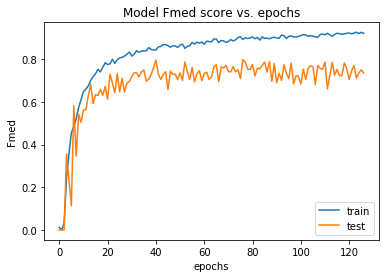

In [42]:
# list all data in history
history = history_val_fmed
print(history.history.keys())

# summarize history for fmed score
plt.plot(history.history['fmed'])
plt.plot(history.history['val_fmed'])
plt.title('Model Fmed score vs. epochs')
plt.ylabel('Fmed')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

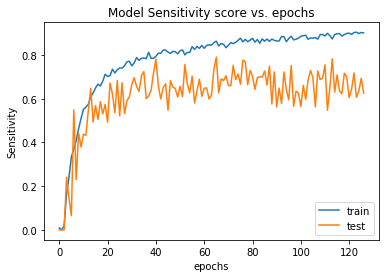

In [43]:
# summarize history for sensitivity score
plt.plot(history.history['sensitivity'])
plt.plot(history.history['val_sensitivity'])
plt.title('Model Sensitivity score vs. epochs')
plt.ylabel('Sensitivity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



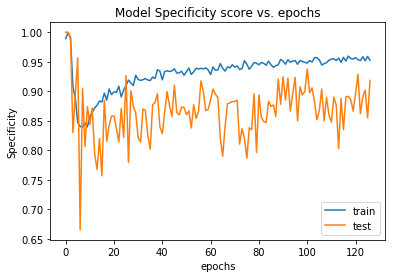

In [44]:
# summarize history for specificity score
plt.plot(history.history['specificity'])
plt.plot(history.history['val_specificity'])
plt.title('Model Specificity score vs. epochs')
plt.ylabel('Specificity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



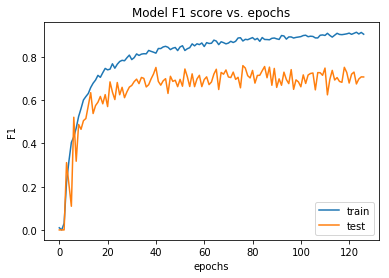

In [45]:
# summarize history for f1 score
plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('Model F1 score vs. epochs')
plt.ylabel('F1')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



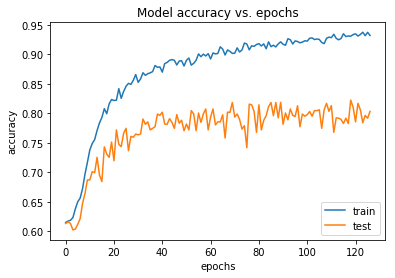

In [46]:
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy vs. epochs')
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



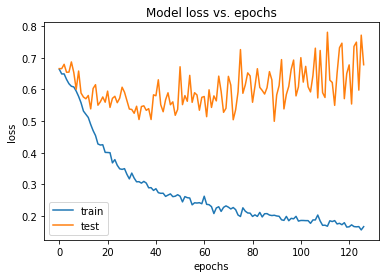

In [47]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss vs. epochs')
plt.ylabel('loss')
plt.xlabel('epochs')
# plt.legend(['train', 'test'], loc='lower right')
plt.legend(['train', 'test'], loc='lower left')
plt.show()

In [54]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
# test_generator = train_datagen.flow_from_directory(rescale=1. / 255
test_generator = test_datagen.flow_from_directory(
        image_dest_dir + "/test",
#         image_dest_dir + "/test",
        target_size=(image_height, image_width),
        batch_size=1,
        color_mode="grayscale",
        class_mode='binary',
        shuffle=False,
        seed=42
)
STEP_SIZE_TEST = test_generator.n // test_generator.batch_size

Found 72 images belonging to 2 classes.


In [55]:
model = generate_model()

In [56]:

model.load_weights(data_dir + '/nn_best_model_cv_val_fmed.h5')
    
# model.load_weights(data_dir + '\nn_best_model_cv_val_fmed_sgd.h5')

In [57]:
probabilities = model.predict_generator(test_generator, steps=STEP_SIZE_TEST)
# Pred = model.predict_generator(validation_generator, verbose=1)
y_true = test_generator.classes
y_pred = probabilities > 0.5

In [58]:
confusion_matrix(y_true, y_pred)

array([[40,  5],
       [10, 17]], dtype=int64)

In [59]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,name = "Cf.png",
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    fig = plt.gcf()
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    fig.savefig(name)
    plt.show()

In [ ]:
# cnf_matrix = confusion_matrix(y_test, predictions_results)

In [60]:
plot_confusion_matrix(cnf_matrix, classes=class_names,normalize= True,
                      name = "Confusion_matrix_with_normalisation.png",
                      title='Confusion matrix with Normalisation')


NameError: name 'cnf_matrix' is not defined

In [61]:
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

In [62]:
specificity = tn / (tn+fp)
specificity

0.8888888888888888

In [63]:
sensitivity = tp / (tp + fn)
sensitivity

0.6296296296296297

SGD Optimizer

In [79]:
num_train_samples = 10000
num_validation_samples = 1000
batch_size = 32
model = generate_model(opt=keras.optimizers.SGD(lr=0.01, nesterov=True))
# model.load_weights(data_dir + '/nn_best_model_cv_val_fmed.h5')
history_val_fmed_sgd = model.fit_generator(
    train_generator,
    steps_per_epoch= num_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps= num_validation_samples // batch_size,
    epochs=500,
    verbose=1,
        callbacks=[
          EarlyStopping(monitor='val_fmed', mode="max", verbose=1, patience=100),
          ModelCheckpoint(data_dir + '/nn_best_model_cv_val_fmed_sgd.h5', monitor='val_fmed', mode="max", verbose=1, save_best_only=True)
        ],
    class_weight=class_weights)

Epoch 1/500


 73/312 [======>.......................] - ETA: 15:07 - loss: 0.6999 - acc: 0.4375 - sensitivity: 0.0833 - specificity: 0.6500 - fmed: 0.1477 - f1: 0.10 - ETA: 8:29 - loss: 0.6975 - acc: 0.4531 - sensitivity: 0.1780 - specificity: 0.6107 - fmed: 0.2585 - f1: 0.1804 - ETA: 6:10 - loss: 0.6957 - acc: 0.5104 - sensitivity: 0.1557 - specificity: 0.6825 - fmed: 0.2376 - f1: 0.167 - ETA: 5:30 - loss: 0.6920 - acc: 0.5469 - sensitivity: 0.1668 - specificity: 0.6971 - fmed: 0.2569 - f1: 0.164 - ETA: 5:26 - loss: 0.6886 - acc: 0.5750 - sensitivity: 0.1334 - specificity: 0.7410 - fmed: 0.2056 - f1: 0.131 - ETA: 5:21 - loss: 0.6885 - acc: 0.5885 - sensitivity: 0.1497 - specificity: 0.7754 - fmed: 0.2332 - f1: 0.168 - ETA: 5:16 - loss: 0.6873 - acc: 0.5982 - sensitivity: 0.1543 - specificity: 0.7939 - fmed: 0.2431 - f1: 0.182 - ETA: 5:09 - loss: 0.6868 - acc: 0.5977 - sensitivity: 0.1475 - specificity: 0.7969 - fmed: 0.2350 - f1: 0.176 - ETA: 4:59 - loss: 0.6870 - acc: 0.5833 - sensitivity: 0.1482

312/312 [==============================] - ETA: 13s - loss: 0.6540 - acc: 0.6549 - sensitivity: 0.0091 - specificity: 0.9870 - fmed: 0.0155 - f1: 0.01 - ETA: 12s - loss: 0.6540 - acc: 0.6548 - sensitivity: 0.0091 - specificity: 0.9870 - fmed: 0.0154 - f1: 0.01 - ETA: 11s - loss: 0.6536 - acc: 0.6554 - sensitivity: 0.0091 - specificity: 0.9870 - fmed: 0.0154 - f1: 0.01 - ETA: 11s - loss: 0.6538 - acc: 0.6550 - sensitivity: 0.0090 - specificity: 0.9871 - fmed: 0.0153 - f1: 0.01 - ETA: 10s - loss: 0.6538 - acc: 0.6550 - sensitivity: 0.0090 - specificity: 0.9871 - fmed: 0.0153 - f1: 0.01 - ETA: 9s - loss: 0.6538 - acc: 0.6549 - sensitivity: 0.0090 - specificity: 0.9872 - fmed: 0.0152 - f1: 0.0127 - ETA: 8s - loss: 0.6540 - acc: 0.6546 - sensitivity: 0.0089 - specificity: 0.9872 - fmed: 0.0152 - f1: 0.012 - ETA: 8s - loss: 0.6539 - acc: 0.6546 - sensitivity: 0.0089 - specificity: 0.9873 - fmed: 0.0151 - f1: 0.012 - ETA: 7s - loss: 0.6539 - acc: 0.6544 - sensitivity: 0.0089 - specificity: 0.

 66/312 [=====>........................] - ETA: 1:23 - loss: 0.6620 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:28 - loss: 0.6907 - acc: 0.5781 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:30 - loss: 0.6734 - acc: 0.6146 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:29 - loss: 0.6663 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:30 - loss: 0.6578 - acc: 0.6375 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:30 - loss: 0.6470 - acc: 0.6615 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:31 - loss: 0.6498 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:28 - loss: 0.6516 - acc: 0.6516 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 29s - loss: 0.6414 - acc: 0.6590 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 28s - loss: 0.6414 - acc: 0.6591 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 27s - loss: 0.6410 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 27s - loss: 0.6410 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 26s - loss: 0.6409 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6410 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6410 - acc: 0.6596 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6407 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:42 - loss: 0.6052 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:35 - loss: 0.6536 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:36 - loss: 0.6636 - acc: 0.6458 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:37 - loss: 0.6324 - acc: 0.6797 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:42 - loss: 0.6340 - acc: 0.6813 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:46 - loss: 0.6269 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:46 - loss: 0.6292 - acc: 0.6786 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:52 - loss: 0.6422 - acc: 0.6602 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 28s - loss: 0.6403 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 27s - loss: 0.6404 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 27s - loss: 0.6406 - acc: 0.6599 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 26s - loss: 0.6404 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6404 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6405 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6407 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6411 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:20 - loss: 0.5424 - acc: 0.7812 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.5877 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:26 - loss: 0.6084 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.5990 - acc: 0.7061 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6145 - acc: 0.6836 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.6176 - acc: 0.6843 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.6182 - acc: 0.6847 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6242 - acc: 0.6773 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6383 - acc: 0.6608 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6378 - acc: 0.6614 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6385 - acc: 0.6605 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6386 - acc: 0.6604 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6383 - acc: 0.6607 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6385 - acc: 0.6604 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6387 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6384 - acc: 0.6607 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:20 - loss: 0.6810 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6779 - acc: 0.6094 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6307 - acc: 0.6771 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6274 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6227 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6247 - acc: 0.6771 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6217 - acc: 0.6830 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6178 - acc: 0.6836 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 27s - loss: 0.6381 - acc: 0.6593 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 26s - loss: 0.6380 - acc: 0.6593 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6381 - acc: 0.6593 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6379 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6377 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6381 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6383 - acc: 0.6592 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6381 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:18 - loss: 0.6799 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6622 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6544 - acc: 0.6354 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6486 - acc: 0.6406 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6363 - acc: 0.6625 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6297 - acc: 0.6719 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6256 - acc: 0.6786 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6351 - acc: 0.6680 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 26s - loss: 0.6354 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6353 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6353 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6353 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6350 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6347 - acc: 0.6607 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6345 - acc: 0.6610 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6344 - acc: 0.6611 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:16 - loss: 0.6193 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6048 - acc: 0.7031 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6515 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6447 - acc: 0.6406 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6514 - acc: 0.6312 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6525 - acc: 0.6302 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6596 - acc: 0.6161 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6489 - acc: 0.6343 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6353 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6353 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6355 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6356 - acc: 0.6593 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6355 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6353 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6350 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6351 - acc: 0.6601 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:24 - loss: 0.6557 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.7095 - acc: 0.5781 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.6859 - acc: 0.6042 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.6823 - acc: 0.6016 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6725 - acc: 0.6125 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6566 - acc: 0.6354 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6535 - acc: 0.6384 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6452 - acc: 0.6484 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 26s - loss: 0.6318 - acc: 0.6609 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 26s - loss: 0.6322 - acc: 0.6602 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6326 - acc: 0.6596 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6326 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6324 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6323 - acc: 0.6596 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6324 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6325 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:29 - loss: 0.6574 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.6087 - acc: 0.7031 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.6050 - acc: 0.7083 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.5845 - acc: 0.7336 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.5865 - acc: 0.7244 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.5958 - acc: 0.7130 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.5975 - acc: 0.7049 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6024 - acc: 0.6988 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 26s - loss: 0.6299 - acc: 0.6611 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6301 - acc: 0.6608 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6305 - acc: 0.6603 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6310 - acc: 0.6596 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6309 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6306 - acc: 0.6599 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6307 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6308 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:47 - loss: 0.6623 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:34 - loss: 0.6461 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:31 - loss: 0.6249 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:28 - loss: 0.6099 - acc: 0.6719 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:26 - loss: 0.6301 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.6376 - acc: 0.6406 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:27 - loss: 0.6345 - acc: 0.6473 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:26 - loss: 0.6313 - acc: 0.6523 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6286 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6285 - acc: 0.6597 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6287 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6286 - acc: 0.6595 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6283 - acc: 0.6600 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6283 - acc: 0.6599 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6283 - acc: 0.6599 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 21s - loss: 0.6283 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:23 - loss: 0.6102 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.5666 - acc: 0.7031 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.5655 - acc: 0.7292 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.5553 - acc: 0.7422 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.5772 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.5856 - acc: 0.7135 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.5781 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.5783 - acc: 0.7227 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6265 - acc: 0.6609 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6263 - acc: 0.6613 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6262 - acc: 0.6614 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6264 - acc: 0.6614 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6267 - acc: 0.6609 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6264 - acc: 0.6613 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6264 - acc: 0.6615 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 21s - loss: 0.6263 - acc: 0.6615 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 1:16 - loss: 0.6271 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:18 - loss: 0.6464 - acc: 0.6406 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6346 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6062 - acc: 0.6953 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:22 - loss: 0.6187 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6167 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6172 - acc: 0.6830 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:18 - loss: 0.6276 - acc: 0.6631 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6239 - acc: 0.6599 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 25s - loss: 0.6242 - acc: 0.6598 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6241 - acc: 0.6596 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 24s - loss: 0.6243 - acc: 0.6594 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6248 - acc: 0.6586 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 23s - loss: 0.6248 - acc: 0.6587 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 22s - loss: 0.6248 - acc: 0.6584 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+ - ETA: 21s - loss: 0.6250 - acc: 0.6581 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+0

 66/312 [=====>........................] - ETA: 2:23 - loss: 0.5989 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 2:30 - loss: 0.6041 - acc: 0.6719 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 2:16 - loss: 0.6114 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 2:02 - loss: 0.6187 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:57 - loss: 0.6493 - acc: 0.5875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:56 - loss: 0.6484 - acc: 0.5990 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:53 - loss: 0.6319 - acc: 0.6295 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:50 - loss: 0.6375 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 25s - loss: 0.6228 - acc: 0.6591 - sensitivity: 9.5394e-04 - specificity: 0.9998 - fmed: 0.0018 - f1: 0.00 - ETA: 24s - loss: 0.6225 - acc: 0.6595 - sensitivity: 9.5038e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 24s - loss: 0.6226 - acc: 0.6593 - sensitivity: 9.4684e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 23s - loss: 0.6228 - acc: 0.6591 - sensitivity: 9.4334e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 23s - loss: 0.6228 - acc: 0.6592 - sensitivity: 9.3986e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 22s - loss: 0.6229 - acc: 0.6592 - sensitivity: 9.3640e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 22s - loss: 0.6230 - acc: 0.6590 - sensitivity: 9.3297e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 21s - loss: 0.6228 - acc: 0.6592 - sensitivity: 9.2957e-04 - specificity: 0.9998 - fmed: 0.0017 - f1: 0.00 - ETA: 20s - loss: 0.6228 - acc: 0.6589 - sensi

 66/312 [=====>........................] - ETA: 1:26 - loss: 0.7239 - acc: 0.5312 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.6672 - acc: 0.6250 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:27 - loss: 0.6657 - acc: 0.6146 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6521 - acc: 0.6276 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6580 - acc: 0.6146 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6522 - acc: 0.6163 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6490 - acc: 0.6131 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6434 - acc: 0.6185 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 14s - loss: 0.6213 - acc: 0.6594 - sensitivity: 0.0015 - specificity: 0.9997 - fmed: 0.0027 - f1: 0.00 - ETA: 14s - loss: 0.6214 - acc: 0.6595 - sensitivity: 0.0015 - specificity: 0.9997 - fmed: 0.0027 - f1: 0.00 - ETA: 13s - loss: 0.6214 - acc: 0.6596 - sensitivity: 0.0015 - specificity: 0.9997 - fmed: 0.0027 - f1: 0.00 - ETA: 12s - loss: 0.6213 - acc: 0.6596 - sensitivity: 0.0014 - specificity: 0.9997 - fmed: 0.0027 - f1: 0.00 - ETA: 12s - loss: 0.6212 - acc: 0.6599 - sensitivity: 0.0014 - specificity: 0.9997 - fmed: 0.0027 - f1: 0.00 - ETA: 11s - loss: 0.6209 - acc: 0.6601 - sensitivity: 0.0014 - specificity: 0.9997 - fmed: 0.0026 - f1: 0.00 - ETA: 11s - loss: 0.6209 - acc: 0.6599 - sensitivity: 0.0014 - specificity: 0.9997 - fmed: 0.0026 - f1: 0.00 - ETA: 10s - loss: 0.6206 - acc: 0.6602 - sensitivity: 0.0014 - specificity: 0.9997 - fmed: 0.0026 - f1: 0.00 - ETA: 10s - loss: 0.6209 - acc: 0.6600 - sensitivity: 0.0014 - specificity: 0.

 66/312 [=====>........................] - ETA: 1:19 - loss: 0.6233 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6208 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6321 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6223 - acc: 0.6797 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6305 - acc: 0.6625 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6194 - acc: 0.6771 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6194 - acc: 0.6741 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:20 - loss: 0.6130 - acc: 0.6758 - sensitivity: 0.0000e+00 - specificity: 1.0000 - 

312/312 [==============================] - ETA: 15s - loss: 0.6156 - acc: 0.6613 - sensitivity: 0.0025 - specificity: 0.9994 - fmed: 0.0045 - f1: 0.00 - ETA: 14s - loss: 0.6157 - acc: 0.6612 - sensitivity: 0.0025 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 14s - loss: 0.6158 - acc: 0.6611 - sensitivity: 0.0024 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 13s - loss: 0.6155 - acc: 0.6616 - sensitivity: 0.0024 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 13s - loss: 0.6158 - acc: 0.6610 - sensitivity: 0.0024 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 12s - loss: 0.6159 - acc: 0.6609 - sensitivity: 0.0024 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 11s - loss: 0.6156 - acc: 0.6613 - sensitivity: 0.0024 - specificity: 0.9994 - fmed: 0.0044 - f1: 0.00 - ETA: 11s - loss: 0.6157 - acc: 0.6611 - sensitivity: 0.0028 - specificity: 0.9994 - fmed: 0.0050 - f1: 0.00 - ETA: 10s - loss: 0.6156 - acc: 0.6611 - sensitivity: 0.0028 - specificity: 0.

 72/312 [=====>........................] - ETA: 1:26 - loss: 0.5390 - acc: 0.7500 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.5857 - acc: 0.6719 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.5925 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:25 - loss: 0.5863 - acc: 0.6953 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.5827 - acc: 0.7000 - sensitivity: 0.0000e+00 - specificity: 0.9917 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.5912 - acc: 0.6927 - sensitivity: 0.0000e+00 - specificity: 0.9931 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.5938 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 0.9940 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.5997 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 0.9948 - 

312/312 [==============================] - ETA: 9s - loss: 0.6139 - acc: 0.6619 - sensitivity: 0.0096 - specificity: 0.9967 - fmed: 0.0172 - f1: 0.0171 - ETA: 8s - loss: 0.6142 - acc: 0.6615 - sensitivity: 0.0096 - specificity: 0.9967 - fmed: 0.0171 - f1: 0.017 - ETA: 8s - loss: 0.6142 - acc: 0.6615 - sensitivity: 0.0096 - specificity: 0.9965 - fmed: 0.0171 - f1: 0.017 - ETA: 7s - loss: 0.6145 - acc: 0.6610 - sensitivity: 0.0095 - specificity: 0.9966 - fmed: 0.0170 - f1: 0.016 - ETA: 7s - loss: 0.6146 - acc: 0.6608 - sensitivity: 0.0095 - specificity: 0.9966 - fmed: 0.0170 - f1: 0.016 - ETA: 6s - loss: 0.6145 - acc: 0.6611 - sensitivity: 0.0100 - specificity: 0.9966 - fmed: 0.0179 - f1: 0.017 - ETA: 6s - loss: 0.6143 - acc: 0.6615 - sensitivity: 0.0100 - specificity: 0.9966 - fmed: 0.0178 - f1: 0.017 - ETA: 5s - loss: 0.6145 - acc: 0.6615 - sensitivity: 0.0100 - specificity: 0.9966 - fmed: 0.0178 - f1: 0.017 - ETA: 5s - loss: 0.6146 - acc: 0.6616 - sensitivity: 0.0099 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.6254 - acc: 0.6875 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6077 - acc: 0.7031 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:29 - loss: 0.5981 - acc: 0.7083 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:26 - loss: 0.6363 - acc: 0.6406 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:24 - loss: 0.6262 - acc: 0.6375 - sensitivity: 0.0000e+00 - specificity: 0.9818 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6229 - acc: 0.6458 - sensitivity: 0.0152 - specificity: 0.9848 - fmed: 0.0278 - f1: 0.0278            - ETA: 1:24 - loss: 0.6269 - acc: 0.6429 - sensitivity: 0.0130 - specificity: 0.9870 - fmed: 0.0238 - f1: 0.023 - ETA: 1:20 - loss: 0.6204 - acc: 0.6577 - sensitivity: 0.0114 - specificity: 0.9886 - fmed: 0.0208 - f

312/312 [==============================] - ETA: 8s - loss: 0.6143 - acc: 0.6595 - sensitivity: 0.0143 - specificity: 0.9937 - fmed: 0.0257 - f1: 0.025 - ETA: 8s - loss: 0.6146 - acc: 0.6589 - sensitivity: 0.0142 - specificity: 0.9937 - fmed: 0.0256 - f1: 0.025 - ETA: 7s - loss: 0.6145 - acc: 0.6594 - sensitivity: 0.0142 - specificity: 0.9937 - fmed: 0.0255 - f1: 0.025 - ETA: 7s - loss: 0.6142 - acc: 0.6598 - sensitivity: 0.0141 - specificity: 0.9937 - fmed: 0.0255 - f1: 0.025 - ETA: 6s - loss: 0.6141 - acc: 0.6599 - sensitivity: 0.0144 - specificity: 0.9937 - fmed: 0.0259 - f1: 0.025 - ETA: 6s - loss: 0.6142 - acc: 0.6600 - sensitivity: 0.0144 - specificity: 0.9936 - fmed: 0.0258 - f1: 0.025 - ETA: 5s - loss: 0.6140 - acc: 0.6604 - sensitivity: 0.0143 - specificity: 0.9936 - fmed: 0.0258 - f1: 0.025 - ETA: 5s - loss: 0.6139 - acc: 0.6605 - sensitivity: 0.0143 - specificity: 0.9937 - fmed: 0.0257 - f1: 0.025 - ETA: 4s - loss: 0.6138 - acc: 0.6606 - sensitivity: 0.0148 - specificity: 0.9

 73/312 [======>.......................] - ETA: 2:00 - loss: 0.5673 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 0.9583 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:54 - loss: 0.5686 - acc: 0.7031 - sensitivity: 0.0455 - specificity: 0.9792 - fmed: 0.0833 - f1: 0.0833            - ETA: 2:12 - loss: 0.6135 - acc: 0.6354 - sensitivity: 0.0303 - specificity: 0.9861 - fmed: 0.0556 - f1: 0.055 - ETA: 2:16 - loss: 0.6085 - acc: 0.6484 - sensitivity: 0.0227 - specificity: 0.9896 - fmed: 0.0417 - f1: 0.041 - ETA: 2:15 - loss: 0.5985 - acc: 0.6562 - sensitivity: 0.0182 - specificity: 0.9917 - fmed: 0.0333 - f1: 0.033 - ETA: 2:13 - loss: 0.5968 - acc: 0.6562 - sensitivity: 0.0152 - specificity: 0.9931 - fmed: 0.0278 - f1: 0.027 - ETA: 2:14 - loss: 0.6115 - acc: 0.6429 - sensitivity: 0.0130 - specificity: 0.9940 - fmed: 0.0238 - f1: 0.023 - ETA: 2:17 - loss: 0.6115 - acc: 0.6445 - sensitivity: 0.0114 - specificity: 0.9891 - fmed: 0.0208 - f1: 0.020 - ETA: 2:17 - loss: 0.6025 - acc: 0.663

312/312 [==============================] - ETA: 10s - loss: 0.6111 - acc: 0.6659 - sensitivity: 0.0295 - specificity: 0.9929 - fmed: 0.0525 - f1: 0.05 - ETA: 9s - loss: 0.6115 - acc: 0.6657 - sensitivity: 0.0297 - specificity: 0.9929 - fmed: 0.0530 - f1: 0.0525 - ETA: 8s - loss: 0.6115 - acc: 0.6657 - sensitivity: 0.0299 - specificity: 0.9929 - fmed: 0.0534 - f1: 0.052 - ETA: 8s - loss: 0.6113 - acc: 0.6659 - sensitivity: 0.0298 - specificity: 0.9929 - fmed: 0.0532 - f1: 0.052 - ETA: 7s - loss: 0.6111 - acc: 0.6661 - sensitivity: 0.0297 - specificity: 0.9929 - fmed: 0.0530 - f1: 0.052 - ETA: 7s - loss: 0.6112 - acc: 0.6661 - sensitivity: 0.0296 - specificity: 0.9930 - fmed: 0.0528 - f1: 0.052 - ETA: 6s - loss: 0.6116 - acc: 0.6659 - sensitivity: 0.0295 - specificity: 0.9928 - fmed: 0.0527 - f1: 0.052 - ETA: 5s - loss: 0.6114 - acc: 0.6661 - sensitivity: 0.0298 - specificity: 0.9929 - fmed: 0.0531 - f1: 0.052 - ETA: 5s - loss: 0.6120 - acc: 0.6654 - sensitivity: 0.0297 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:21 - loss: 0.6330 - acc: 0.5938 - sensitivity: 0.0000e+00 - specificity: 0.9500 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.5797 - acc: 0.6562 - sensitivity: 0.0556 - specificity: 0.9533 - fmed: 0.0995 - f1: 0.0909            - ETA: 1:21 - loss: 0.5918 - acc: 0.6354 - sensitivity: 0.0370 - specificity: 0.9688 - fmed: 0.0664 - f1: 0.060 - ETA: 1:17 - loss: 0.6179 - acc: 0.6194 - sensitivity: 0.0278 - specificity: 0.9766 - fmed: 0.0498 - f1: 0.045 - ETA: 1:18 - loss: 0.6118 - acc: 0.6330 - sensitivity: 0.0222 - specificity: 0.9813 - fmed: 0.0398 - f1: 0.036 - ETA: 1:18 - loss: 0.6257 - acc: 0.6161 - sensitivity: 0.0185 - specificity: 0.9752 - fmed: 0.0332 - f1: 0.030 - ETA: 1:18 - loss: 0.6088 - acc: 0.6307 - sensitivity: 0.0159 - specificity: 0.9728 - fmed: 0.0284 - f1: 0.026 - ETA: 1:18 - loss: 0.6099 - acc: 0.6261 - sensitivity: 0.0139 - specificity: 0.9762 - fmed: 0.0249 - f1: 0.022 - ETA: 1:20 - loss: 0.5992 - acc: 0.653

312/312 [==============================] - ETA: 9s - loss: 0.6097 - acc: 0.6621 - sensitivity: 0.0386 - specificity: 0.9839 - fmed: 0.0683 - f1: 0.066 - ETA: 8s - loss: 0.6095 - acc: 0.6625 - sensitivity: 0.0389 - specificity: 0.9839 - fmed: 0.0688 - f1: 0.066 - ETA: 7s - loss: 0.6094 - acc: 0.6624 - sensitivity: 0.0391 - specificity: 0.9838 - fmed: 0.0691 - f1: 0.067 - ETA: 7s - loss: 0.6099 - acc: 0.6617 - sensitivity: 0.0390 - specificity: 0.9839 - fmed: 0.0689 - f1: 0.066 - ETA: 6s - loss: 0.6098 - acc: 0.6621 - sensitivity: 0.0392 - specificity: 0.9839 - fmed: 0.0694 - f1: 0.067 - ETA: 6s - loss: 0.6096 - acc: 0.6622 - sensitivity: 0.0391 - specificity: 0.9838 - fmed: 0.0692 - f1: 0.067 - ETA: 5s - loss: 0.6097 - acc: 0.6625 - sensitivity: 0.0397 - specificity: 0.9838 - fmed: 0.0701 - f1: 0.067 - ETA: 5s - loss: 0.6102 - acc: 0.6623 - sensitivity: 0.0396 - specificity: 0.9836 - fmed: 0.0699 - f1: 0.067 - ETA: 4s - loss: 0.6100 - acc: 0.6625 - sensitivity: 0.0395 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.6097 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 0.9200 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:12 - loss: 0.6393 - acc: 0.6562 - sensitivity: 0.0000e+00 - specificity: 0.9600 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6378 - acc: 0.6250 - sensitivity: 0.0238 - specificity: 0.9548 - fmed: 0.0443 - f1: 0.0417            - ETA: 1:23 - loss: 0.6401 - acc: 0.6250 - sensitivity: 0.0179 - specificity: 0.9542 - fmed: 0.0332 - f1: 0.031 - ETA: 1:27 - loss: 0.6281 - acc: 0.6375 - sensitivity: 0.0143 - specificity: 0.9634 - fmed: 0.0266 - f1: 0.025 - ETA: 1:27 - loss: 0.6149 - acc: 0.6458 - sensitivity: 0.0304 - specificity: 0.9550 - fmed: 0.0552 - f1: 0.048 - ETA: 1:26 - loss: 0.6046 - acc: 0.6518 - sensitivity: 0.0261 - specificity: 0.9614 - fmed: 0.0473 - f1: 0.041 - ETA: 1:25 - loss: 0.5918 - acc: 0.6680 - sensitivity: 0.0228 - specificity: 0.9662 - fmed: 0.0414 - f1: 0.036 - ETA: 1:24 - loss: 0.5873 

312/312 [==============================] - ETA: 9s - loss: 0.6065 - acc: 0.6698 - sensitivity: 0.0667 - specificity: 0.9794 - fmed: 0.1138 - f1: 0.109 - ETA: 8s - loss: 0.6066 - acc: 0.6697 - sensitivity: 0.0664 - specificity: 0.9795 - fmed: 0.1134 - f1: 0.109 - ETA: 7s - loss: 0.6067 - acc: 0.6698 - sensitivity: 0.0665 - specificity: 0.9794 - fmed: 0.1136 - f1: 0.109 - ETA: 7s - loss: 0.6066 - acc: 0.6698 - sensitivity: 0.0669 - specificity: 0.9795 - fmed: 0.1142 - f1: 0.110 - ETA: 6s - loss: 0.6069 - acc: 0.6697 - sensitivity: 0.0669 - specificity: 0.9796 - fmed: 0.1143 - f1: 0.110 - ETA: 6s - loss: 0.6070 - acc: 0.6694 - sensitivity: 0.0669 - specificity: 0.9796 - fmed: 0.1144 - f1: 0.110 - ETA: 5s - loss: 0.6066 - acc: 0.6701 - sensitivity: 0.0678 - specificity: 0.9797 - fmed: 0.1157 - f1: 0.111 - ETA: 5s - loss: 0.6068 - acc: 0.6701 - sensitivity: 0.0676 - specificity: 0.9798 - fmed: 0.1153 - f1: 0.111 - ETA: 4s - loss: 0.6066 - acc: 0.6704 - sensitivity: 0.0682 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.7974 - acc: 0.5312 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:19 - loss: 0.6720 - acc: 0.6562 - sensitivity: 0.1111 - specificity: 1.0000 - fmed: 0.1818 - f1: 0.1818            - ETA: 1:23 - loss: 0.6447 - acc: 0.6667 - sensitivity: 0.0741 - specificity: 1.0000 - fmed: 0.1212 - f1: 0.121 - ETA: 1:24 - loss: 0.6365 - acc: 0.6328 - sensitivity: 0.0556 - specificity: 1.0000 - fmed: 0.0909 - f1: 0.090 - ETA: 1:23 - loss: 0.6320 - acc: 0.6438 - sensitivity: 0.0644 - specificity: 0.9909 - fmed: 0.1089 - f1: 0.106 - ETA: 1:22 - loss: 0.6301 - acc: 0.6458 - sensitivity: 0.0537 - specificity: 0.9924 - fmed: 0.0908 - f1: 0.088 - ETA: 1:22 - loss: 0.6370 - acc: 0.6384 - sensitivity: 0.0570 - specificity: 0.9860 - fmed: 0.0981 - f1: 0.094 - ETA: 1:22 - loss: 0.6373 - acc: 0.6445 - sensitivity: 0.0707 - specificity: 0.9877 - fmed: 0.1216 - f1: 0.118 - ETA: 1:22 - loss: 0.6368 - acc: 0.649

312/312 [==============================] - ETA: 9s - loss: 0.6068 - acc: 0.6689 - sensitivity: 0.0685 - specificity: 0.9784 - fmed: 0.1158 - f1: 0.110 - ETA: 8s - loss: 0.6069 - acc: 0.6687 - sensitivity: 0.0685 - specificity: 0.9783 - fmed: 0.1159 - f1: 0.110 - ETA: 7s - loss: 0.6070 - acc: 0.6685 - sensitivity: 0.0689 - specificity: 0.9780 - fmed: 0.1164 - f1: 0.111 - ETA: 7s - loss: 0.6070 - acc: 0.6685 - sensitivity: 0.0686 - specificity: 0.9778 - fmed: 0.1160 - f1: 0.110 - ETA: 6s - loss: 0.6076 - acc: 0.6680 - sensitivity: 0.0687 - specificity: 0.9779 - fmed: 0.1162 - f1: 0.111 - ETA: 6s - loss: 0.6078 - acc: 0.6673 - sensitivity: 0.0687 - specificity: 0.9778 - fmed: 0.1162 - f1: 0.110 - ETA: 5s - loss: 0.6080 - acc: 0.6671 - sensitivity: 0.0685 - specificity: 0.9777 - fmed: 0.1158 - f1: 0.110 - ETA: 5s - loss: 0.6082 - acc: 0.6667 - sensitivity: 0.0686 - specificity: 0.9777 - fmed: 0.1161 - f1: 0.110 - ETA: 4s - loss: 0.6082 - acc: 0.6667 - sensitivity: 0.0687 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5762 - acc: 0.7188 - sensitivity: 0.1111 - specificity: 0.9565 - fmed: 0.1991 - f1: 0.181 - ETA: 1:16 - loss: 0.6289 - acc: 0.6875 - sensitivity: 0.0556 - specificity: 0.9783 - fmed: 0.0995 - f1: 0.090 - ETA: 1:19 - loss: 0.6296 - acc: 0.6771 - sensitivity: 0.0648 - specificity: 0.9855 - fmed: 0.1176 - f1: 0.111 - ETA: 1:20 - loss: 0.5962 - acc: 0.7266 - sensitivity: 0.1111 - specificity: 0.9802 - fmed: 0.1875 - f1: 0.167 - ETA: 1:21 - loss: 0.5748 - acc: 0.7312 - sensitivity: 0.1111 - specificity: 0.9842 - fmed: 0.1900 - f1: 0.173 - ETA: 1:21 - loss: 0.5877 - acc: 0.7083 - sensitivity: 0.0926 - specificity: 0.9868 - fmed: 0.1583 - f1: 0.144 - ETA: 1:20 - loss: 0.5811 - acc: 0.7098 - sensitivity: 0.0794 - specificity: 0.9827 - fmed: 0.1357 - f1: 0.124 - ETA: 1:18 - loss: 0.5743 - acc: 0.7104 - sensitivity: 0.0694 - specificity: 0.9849 - fmed: 0.1187 - f1: 0.108 - ETA: 1:19 - loss: 0.5724 - acc: 0.7113 - sensitivity: 0.0617 

312/312 [==============================] - ETA: 9s - loss: 0.6051 - acc: 0.6735 - sensitivity: 0.0892 - specificity: 0.9739 - fmed: 0.1501 - f1: 0.144 - ETA: 8s - loss: 0.6053 - acc: 0.6730 - sensitivity: 0.0894 - specificity: 0.9735 - fmed: 0.1504 - f1: 0.144 - ETA: 7s - loss: 0.6052 - acc: 0.6732 - sensitivity: 0.0891 - specificity: 0.9736 - fmed: 0.1499 - f1: 0.143 - ETA: 7s - loss: 0.6052 - acc: 0.6733 - sensitivity: 0.0888 - specificity: 0.9736 - fmed: 0.1494 - f1: 0.143 - ETA: 6s - loss: 0.6050 - acc: 0.6734 - sensitivity: 0.0891 - specificity: 0.9737 - fmed: 0.1499 - f1: 0.143 - ETA: 6s - loss: 0.6049 - acc: 0.6734 - sensitivity: 0.0888 - specificity: 0.9738 - fmed: 0.1494 - f1: 0.143 - ETA: 5s - loss: 0.6049 - acc: 0.6734 - sensitivity: 0.0885 - specificity: 0.9739 - fmed: 0.1489 - f1: 0.143 - ETA: 5s - loss: 0.6050 - acc: 0.6734 - sensitivity: 0.0885 - specificity: 0.9740 - fmed: 0.1490 - f1: 0.143 - ETA: 4s - loss: 0.6047 - acc: 0.6736 - sensitivity: 0.0882 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:20 - loss: 0.5879 - acc: 0.5938 - sensitivity: 0.0000e+00 - specificity: 0.9048 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:18 - loss: 0.6487 - acc: 0.5938 - sensitivity: 0.0000e+00 - specificity: 0.9274 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6292 - acc: 0.6146 - sensitivity: 0.0000e+00 - specificity: 0.9364 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.6211 - acc: 0.6250 - sensitivity: 0.0208 - specificity: 0.9523 - fmed: 0.0385 - f1: 0.0385            - ETA: 1:21 - loss: 0.6330 - acc: 0.6062 - sensitivity: 0.0167 - specificity: 0.9508 - fmed: 0.0308 - f1: 0.030 - ETA: 1:21 - loss: 0.6184 - acc: 0.6198 - sensitivity: 0.0417 - specificity: 0.9590 - fmed: 0.0733 - f1: 0.073 - ETA: 1:21 - loss: 0.6195 - acc: 0.6250 - sensitivity: 0.0577 - specificity: 0.9648 - fmed: 0.1009 - f1: 0.100 - ETA: 1:20 - loss: 0.6157 - acc: 0.6250 - sensitivity: 0.0609 - specificity: 0.9630 - fmed: 0.1074 - f1: 0.106 - ETA: 1:21 - l

312/312 [==============================] - ETA: 10s - loss: 0.6033 - acc: 0.6743 - sensitivity: 0.1037 - specificity: 0.9692 - fmed: 0.1719 - f1: 0.16 - ETA: 9s - loss: 0.6035 - acc: 0.6745 - sensitivity: 0.1034 - specificity: 0.9690 - fmed: 0.1713 - f1: 0.1627 - ETA: 9s - loss: 0.6035 - acc: 0.6745 - sensitivity: 0.1038 - specificity: 0.9692 - fmed: 0.1720 - f1: 0.163 - ETA: 8s - loss: 0.6037 - acc: 0.6744 - sensitivity: 0.1035 - specificity: 0.9691 - fmed: 0.1714 - f1: 0.162 - ETA: 8s - loss: 0.6037 - acc: 0.6746 - sensitivity: 0.1040 - specificity: 0.9692 - fmed: 0.1723 - f1: 0.163 - ETA: 7s - loss: 0.6040 - acc: 0.6740 - sensitivity: 0.1039 - specificity: 0.9691 - fmed: 0.1721 - f1: 0.163 - ETA: 6s - loss: 0.6039 - acc: 0.6744 - sensitivity: 0.1040 - specificity: 0.9692 - fmed: 0.1723 - f1: 0.163 - ETA: 6s - loss: 0.6039 - acc: 0.6743 - sensitivity: 0.1039 - specificity: 0.9693 - fmed: 0.1722 - f1: 0.163 - ETA: 5s - loss: 0.6040 - acc: 0.6744 - sensitivity: 0.1043 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.5638 - acc: 0.7500 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:21 - loss: 0.5449 - acc: 0.7656 - sensitivity: 0.0625 - specificity: 1.0000 - fmed: 0.1111 - f1: 0.1111            - ETA: 1:22 - loss: 0.5101 - acc: 0.7708 - sensitivity: 0.0417 - specificity: 1.0000 - fmed: 0.0741 - f1: 0.074 - ETA: 1:18 - loss: 0.5602 - acc: 0.7329 - sensitivity: 0.0590 - specificity: 1.0000 - fmed: 0.1056 - f1: 0.105 - ETA: 1:20 - loss: 0.5731 - acc: 0.7176 - sensitivity: 0.0654 - specificity: 0.9905 - fmed: 0.1176 - f1: 0.115 - ETA: 1:21 - loss: 0.5780 - acc: 0.7021 - sensitivity: 0.0545 - specificity: 0.9921 - fmed: 0.0980 - f1: 0.096 - ETA: 1:21 - loss: 0.5810 - acc: 0.6911 - sensitivity: 0.0467 - specificity: 0.9802 - fmed: 0.0840 - f1: 0.082 - ETA: 1:22 - loss: 0.5737 - acc: 0.6946 - sensitivity: 0.0409 - specificity: 0.9775 - fmed: 0.0735 - f1: 0.072 - ETA: 1:23 - loss: 0.5739 - acc: 0.686

312/312 [==============================] - ETA: 9s - loss: 0.5999 - acc: 0.6780 - sensitivity: 0.1161 - specificity: 0.9672 - fmed: 0.1888 - f1: 0.178 - ETA: 8s - loss: 0.6002 - acc: 0.6774 - sensitivity: 0.1162 - specificity: 0.9669 - fmed: 0.1889 - f1: 0.178 - ETA: 7s - loss: 0.5999 - acc: 0.6778 - sensitivity: 0.1162 - specificity: 0.9670 - fmed: 0.1891 - f1: 0.179 - ETA: 7s - loss: 0.6001 - acc: 0.6774 - sensitivity: 0.1159 - specificity: 0.9669 - fmed: 0.1885 - f1: 0.178 - ETA: 6s - loss: 0.6001 - acc: 0.6775 - sensitivity: 0.1158 - specificity: 0.9667 - fmed: 0.1885 - f1: 0.178 - ETA: 6s - loss: 0.6000 - acc: 0.6774 - sensitivity: 0.1155 - specificity: 0.9669 - fmed: 0.1879 - f1: 0.177 - ETA: 5s - loss: 0.5999 - acc: 0.6774 - sensitivity: 0.1151 - specificity: 0.9670 - fmed: 0.1873 - f1: 0.177 - ETA: 5s - loss: 0.5997 - acc: 0.6776 - sensitivity: 0.1153 - specificity: 0.9671 - fmed: 0.1877 - f1: 0.177 - ETA: 4s - loss: 0.5997 - acc: 0.6777 - sensitivity: 0.1149 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.5330 - acc: 0.7500 - sensitivity: 0.1111 - specificity: 1.0000 - fmed: 0.2000 - f1: 0.200 - ETA: 1:22 - loss: 0.5586 - acc: 0.7344 - sensitivity: 0.1111 - specificity: 0.9783 - fmed: 0.1995 - f1: 0.190 - ETA: 1:25 - loss: 0.5535 - acc: 0.7083 - sensitivity: 0.0741 - specificity: 0.9704 - fmed: 0.1330 - f1: 0.127 - ETA: 1:27 - loss: 0.5682 - acc: 0.7031 - sensitivity: 0.0783 - specificity: 0.9778 - fmed: 0.1414 - f1: 0.137 - ETA: 1:25 - loss: 0.6011 - acc: 0.6813 - sensitivity: 0.0769 - specificity: 0.9822 - fmed: 0.1398 - f1: 0.136 - ETA: 1:24 - loss: 0.5987 - acc: 0.6823 - sensitivity: 0.0826 - specificity: 0.9707 - fmed: 0.1495 - f1: 0.141 - ETA: 1:23 - loss: 0.6003 - acc: 0.6696 - sensitivity: 0.0818 - specificity: 0.9674 - fmed: 0.1485 - f1: 0.140 - ETA: 1:24 - loss: 0.6038 - acc: 0.6719 - sensitivity: 0.0966 - specificity: 0.9601 - fmed: 0.1709 - f1: 0.158 - ETA: 1:25 - loss: 0.6068 - acc: 0.6701 - sensitivity: 0.1097 

312/312 [==============================] - ETA: 9s - loss: 0.6014 - acc: 0.6786 - sensitivity: 0.1362 - specificity: 0.9593 - fmed: 0.2205 - f1: 0.207 - ETA: 8s - loss: 0.6012 - acc: 0.6790 - sensitivity: 0.1366 - specificity: 0.9593 - fmed: 0.2211 - f1: 0.207 - ETA: 7s - loss: 0.6016 - acc: 0.6786 - sensitivity: 0.1362 - specificity: 0.9594 - fmed: 0.2204 - f1: 0.207 - ETA: 7s - loss: 0.6015 - acc: 0.6786 - sensitivity: 0.1360 - specificity: 0.9594 - fmed: 0.2202 - f1: 0.206 - ETA: 6s - loss: 0.6016 - acc: 0.6788 - sensitivity: 0.1363 - specificity: 0.9592 - fmed: 0.2207 - f1: 0.207 - ETA: 6s - loss: 0.6014 - acc: 0.6787 - sensitivity: 0.1359 - specificity: 0.9591 - fmed: 0.2200 - f1: 0.206 - ETA: 5s - loss: 0.6014 - acc: 0.6781 - sensitivity: 0.1354 - specificity: 0.9589 - fmed: 0.2192 - f1: 0.205 - ETA: 5s - loss: 0.6012 - acc: 0.6783 - sensitivity: 0.1354 - specificity: 0.9590 - fmed: 0.2192 - f1: 0.205 - ETA: 4s - loss: 0.6012 - acc: 0.6783 - sensitivity: 0.1352 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.5739 - acc: 0.6875 - sensitivity: 0.1818 - specificity: 0.9524 - fmed: 0.3053 - f1: 0.285 - ETA: 1:19 - loss: 0.5968 - acc: 0.6562 - sensitivity: 0.1909 - specificity: 0.9762 - fmed: 0.3193 - f1: 0.309 - ETA: 1:23 - loss: 0.5816 - acc: 0.7083 - sensitivity: 0.2384 - specificity: 0.9841 - fmed: 0.3796 - f1: 0.373 - ETA: 1:24 - loss: 0.5713 - acc: 0.7188 - sensitivity: 0.2343 - specificity: 0.9772 - fmed: 0.3748 - f1: 0.363 - ETA: 1:23 - loss: 0.5844 - acc: 0.6937 - sensitivity: 0.2018 - specificity: 0.9818 - fmed: 0.3265 - f1: 0.317 - ETA: 1:22 - loss: 0.5822 - acc: 0.7031 - sensitivity: 0.1681 - specificity: 0.9848 - fmed: 0.2721 - f1: 0.264 - ETA: 1:22 - loss: 0.5786 - acc: 0.6964 - sensitivity: 0.1571 - specificity: 0.9802 - fmed: 0.2569 - f1: 0.248 - ETA: 1:22 - loss: 0.5703 - acc: 0.6992 - sensitivity: 0.1500 - specificity: 0.9827 - fmed: 0.2476 - f1: 0.240 - ETA: 1:22 - loss: 0.5692 - acc: 0.7049 - sensitivity: 0.1333 

312/312 [==============================] - ETA: 9s - loss: 0.5978 - acc: 0.6805 - sensitivity: 0.1653 - specificity: 0.9487 - fmed: 0.2597 - f1: 0.2391 - ETA: 9s - loss: 0.5983 - acc: 0.6799 - sensitivity: 0.1652 - specificity: 0.9483 - fmed: 0.2596 - f1: 0.239 - ETA: 8s - loss: 0.5985 - acc: 0.6794 - sensitivity: 0.1655 - specificity: 0.9474 - fmed: 0.2600 - f1: 0.239 - ETA: 8s - loss: 0.5986 - acc: 0.6792 - sensitivity: 0.1652 - specificity: 0.9474 - fmed: 0.2596 - f1: 0.238 - ETA: 7s - loss: 0.5985 - acc: 0.6791 - sensitivity: 0.1650 - specificity: 0.9472 - fmed: 0.2594 - f1: 0.238 - ETA: 7s - loss: 0.5983 - acc: 0.6794 - sensitivity: 0.1656 - specificity: 0.9471 - fmed: 0.2601 - f1: 0.239 - ETA: 6s - loss: 0.5983 - acc: 0.6793 - sensitivity: 0.1654 - specificity: 0.9471 - fmed: 0.2598 - f1: 0.238 - ETA: 5s - loss: 0.5981 - acc: 0.6795 - sensitivity: 0.1658 - specificity: 0.9469 - fmed: 0.2604 - f1: 0.239 - ETA: 5s - loss: 0.5979 - acc: 0.6796 - sensitivity: 0.1655 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:26 - loss: 0.7224 - acc: 0.5625 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:23 - loss: 0.6715 - acc: 0.5938 - sensitivity: 0.0556 - specificity: 0.9130 - fmed: 0.0979 - f1: 0.0714            - ETA: 1:30 - loss: 0.6318 - acc: 0.6458 - sensitivity: 0.0741 - specificity: 0.9420 - fmed: 0.1320 - f1: 0.114 - ETA: 1:27 - loss: 0.6037 - acc: 0.6875 - sensitivity: 0.1181 - specificity: 0.9565 - fmed: 0.1990 - f1: 0.185 - ETA: 1:26 - loss: 0.6081 - acc: 0.6750 - sensitivity: 0.0944 - specificity: 0.9652 - fmed: 0.1592 - f1: 0.148 - ETA: 1:27 - loss: 0.6308 - acc: 0.6719 - sensitivity: 0.1231 - specificity: 0.9710 - fmed: 0.2028 - f1: 0.194 - ETA: 1:26 - loss: 0.6313 - acc: 0.6473 - sensitivity: 0.1246 - specificity: 0.9499 - fmed: 0.2066 - f1: 0.194 - ETA: 1:23 - loss: 0.6458 - acc: 0.6259 - sensitivity: 0.1340 - specificity: 0.9221 - fmed: 0.2200 - f1: 0.203 - ETA: 1:23 - loss: 0.6299 - acc: 0.639

312/312 [==============================] - ETA: 9s - loss: 0.5950 - acc: 0.6849 - sensitivity: 0.1830 - specificity: 0.9465 - fmed: 0.2823 - f1: 0.262 - ETA: 8s - loss: 0.5951 - acc: 0.6848 - sensitivity: 0.1827 - specificity: 0.9467 - fmed: 0.2819 - f1: 0.261 - ETA: 7s - loss: 0.5950 - acc: 0.6850 - sensitivity: 0.1824 - specificity: 0.9467 - fmed: 0.2816 - f1: 0.261 - ETA: 7s - loss: 0.5948 - acc: 0.6853 - sensitivity: 0.1828 - specificity: 0.9466 - fmed: 0.2821 - f1: 0.261 - ETA: 6s - loss: 0.5952 - acc: 0.6853 - sensitivity: 0.1825 - specificity: 0.9468 - fmed: 0.2817 - f1: 0.261 - ETA: 6s - loss: 0.5950 - acc: 0.6853 - sensitivity: 0.1819 - specificity: 0.9470 - fmed: 0.2808 - f1: 0.260 - ETA: 5s - loss: 0.5951 - acc: 0.6852 - sensitivity: 0.1816 - specificity: 0.9470 - fmed: 0.2804 - f1: 0.260 - ETA: 5s - loss: 0.5948 - acc: 0.6851 - sensitivity: 0.1816 - specificity: 0.9469 - fmed: 0.2805 - f1: 0.260 - ETA: 4s - loss: 0.5947 - acc: 0.6851 - sensitivity: 0.1818 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5796 - acc: 0.7188 - sensitivity: 0.2000 - specificity: 0.9545 - fmed: 0.3307 - f1: 0.307 - ETA: 1:16 - loss: 0.6028 - acc: 0.6562 - sensitivity: 0.1385 - specificity: 0.9510 - fmed: 0.2365 - f1: 0.220 - ETA: 1:19 - loss: 0.6071 - acc: 0.6667 - sensitivity: 0.1756 - specificity: 0.9506 - fmed: 0.2896 - f1: 0.272 - ETA: 1:20 - loss: 0.6277 - acc: 0.6484 - sensitivity: 0.1984 - specificity: 0.9336 - fmed: 0.3196 - f1: 0.299 - ETA: 1:24 - loss: 0.6027 - acc: 0.6687 - sensitivity: 0.2159 - specificity: 0.9229 - fmed: 0.3420 - f1: 0.306 - ETA: 1:23 - loss: 0.5974 - acc: 0.6719 - sensitivity: 0.2077 - specificity: 0.9357 - fmed: 0.3326 - f1: 0.302 - ETA: 1:22 - loss: 0.5984 - acc: 0.6786 - sensitivity: 0.2066 - specificity: 0.9384 - fmed: 0.3323 - f1: 0.303 - ETA: 1:20 - loss: 0.5959 - acc: 0.6836 - sensitivity: 0.2182 - specificity: 0.9347 - fmed: 0.3472 - f1: 0.315 - ETA: 1:20 - loss: 0.5908 - acc: 0.6944 - sensitivity: 0.2187 

312/312 [==============================] - ETA: 9s - loss: 0.5963 - acc: 0.6870 - sensitivity: 0.1995 - specificity: 0.9412 - fmed: 0.3011 - f1: 0.277 - ETA: 8s - loss: 0.5966 - acc: 0.6867 - sensitivity: 0.1992 - specificity: 0.9414 - fmed: 0.3009 - f1: 0.277 - ETA: 7s - loss: 0.5966 - acc: 0.6868 - sensitivity: 0.1994 - specificity: 0.9416 - fmed: 0.3012 - f1: 0.277 - ETA: 7s - loss: 0.5965 - acc: 0.6871 - sensitivity: 0.1999 - specificity: 0.9416 - fmed: 0.3019 - f1: 0.278 - ETA: 6s - loss: 0.5963 - acc: 0.6871 - sensitivity: 0.1992 - specificity: 0.9418 - fmed: 0.3008 - f1: 0.277 - ETA: 6s - loss: 0.5965 - acc: 0.6872 - sensitivity: 0.2001 - specificity: 0.9417 - fmed: 0.3019 - f1: 0.278 - ETA: 5s - loss: 0.5966 - acc: 0.6870 - sensitivity: 0.2000 - specificity: 0.9414 - fmed: 0.3019 - f1: 0.278 - ETA: 5s - loss: 0.5971 - acc: 0.6867 - sensitivity: 0.1993 - specificity: 0.9416 - fmed: 0.3009 - f1: 0.277 - ETA: 4s - loss: 0.5971 - acc: 0.6869 - sensitivity: 0.1995 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:13 - loss: 0.6138 - acc: 0.6250 - sensitivity: 0.0909 - specificity: 0.9048 - fmed: 0.1652 - f1: 0.142 - ETA: 1:18 - loss: 0.6143 - acc: 0.6094 - sensitivity: 0.1455 - specificity: 0.9230 - fmed: 0.2476 - f1: 0.229 - ETA: 1:18 - loss: 0.5777 - acc: 0.6667 - sensitivity: 0.1710 - specificity: 0.9486 - fmed: 0.2863 - f1: 0.274 - ETA: 1:13 - loss: 0.5597 - acc: 0.6905 - sensitivity: 0.2116 - specificity: 0.9448 - fmed: 0.3375 - f1: 0.316 - ETA: 1:15 - loss: 0.5682 - acc: 0.6836 - sensitivity: 0.2001 - specificity: 0.9559 - fmed: 0.3233 - f1: 0.306 - ETA: 1:17 - loss: 0.5716 - acc: 0.6791 - sensitivity: 0.1924 - specificity: 0.9632 - fmed: 0.3139 - f1: 0.300 - ETA: 1:17 - loss: 0.5765 - acc: 0.6758 - sensitivity: 0.1768 - specificity: 0.9685 - fmed: 0.2910 - f1: 0.279 - ETA: 1:18 - loss: 0.5750 - acc: 0.6851 - sensitivity: 0.2047 - specificity: 0.9610 - fmed: 0.3241 - f1: 0.306 - ETA: 1:18 - loss: 0.5748 - acc: 0.6923 - sensitivity: 0.2190 

312/312 [==============================] - ETA: 25s - loss: 0.5911 - acc: 0.6871 - sensitivity: 0.1876 - specificity: 0.9433 - fmed: 0.2894 - f1: 0.26 - ETA: 24s - loss: 0.5916 - acc: 0.6868 - sensitivity: 0.1876 - specificity: 0.9435 - fmed: 0.2895 - f1: 0.26 - ETA: 22s - loss: 0.5916 - acc: 0.6871 - sensitivity: 0.1889 - specificity: 0.9432 - fmed: 0.2908 - f1: 0.27 - ETA: 21s - loss: 0.5916 - acc: 0.6871 - sensitivity: 0.1894 - specificity: 0.9431 - fmed: 0.2915 - f1: 0.27 - ETA: 19s - loss: 0.5915 - acc: 0.6871 - sensitivity: 0.1901 - specificity: 0.9426 - fmed: 0.2923 - f1: 0.27 - ETA: 18s - loss: 0.5915 - acc: 0.6874 - sensitivity: 0.1899 - specificity: 0.9428 - fmed: 0.2921 - f1: 0.27 - ETA: 17s - loss: 0.5914 - acc: 0.6873 - sensitivity: 0.1898 - specificity: 0.9429 - fmed: 0.2920 - f1: 0.27 - ETA: 15s - loss: 0.5915 - acc: 0.6873 - sensitivity: 0.1900 - specificity: 0.9429 - fmed: 0.2924 - f1: 0.27 - ETA: 14s - loss: 0.5914 - acc: 0.6874 - sensitivity: 0.1893 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.5874 - acc: 0.7188 - sensitivity: 0.0000e+00 - specificity: 0.8846 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:06 - loss: 0.5913 - acc: 0.7188 - sensitivity: 0.0500 - specificity: 0.9423 - fmed: 0.0909 - f1: 0.0909            - ETA: 1:06 - loss: 0.5822 - acc: 0.7083 - sensitivity: 0.0704 - specificity: 0.9326 - fmed: 0.1266 - f1: 0.116 - ETA: 1:09 - loss: 0.6047 - acc: 0.6719 - sensitivity: 0.0720 - specificity: 0.9231 - fmed: 0.1304 - f1: 0.118 - ETA: 1:07 - loss: 0.5938 - acc: 0.6813 - sensitivity: 0.0776 - specificity: 0.9385 - fmed: 0.1407 - f1: 0.131 - ETA: 1:07 - loss: 0.5949 - acc: 0.6875 - sensitivity: 0.0832 - specificity: 0.9415 - fmed: 0.1504 - f1: 0.139 - ETA: 1:07 - loss: 0.6088 - acc: 0.6741 - sensitivity: 0.0904 - specificity: 0.9498 - fmed: 0.1625 - f1: 0.153 - ETA: 1:06 - loss: 0.6019 - acc: 0.6797 - sensitivity: 0.1207 - specificity: 0.9499 - fmed: 0.2039 - f1: 0.192 - ETA: 1:06 - loss: 0.6100 - acc: 0.666

312/312 [==============================] - ETA: 7s - loss: 0.5991 - acc: 0.6813 - sensitivity: 0.1774 - specificity: 0.9449 - fmed: 0.2717 - f1: 0.250 - ETA: 6s - loss: 0.5990 - acc: 0.6814 - sensitivity: 0.1772 - specificity: 0.9451 - fmed: 0.2714 - f1: 0.249 - ETA: 6s - loss: 0.5989 - acc: 0.6815 - sensitivity: 0.1766 - specificity: 0.9450 - fmed: 0.2705 - f1: 0.249 - ETA: 5s - loss: 0.5986 - acc: 0.6815 - sensitivity: 0.1760 - specificity: 0.9452 - fmed: 0.2696 - f1: 0.248 - ETA: 5s - loss: 0.5985 - acc: 0.6813 - sensitivity: 0.1754 - specificity: 0.9452 - fmed: 0.2687 - f1: 0.247 - ETA: 4s - loss: 0.5984 - acc: 0.6813 - sensitivity: 0.1755 - specificity: 0.9451 - fmed: 0.2689 - f1: 0.247 - ETA: 4s - loss: 0.5985 - acc: 0.6810 - sensitivity: 0.1752 - specificity: 0.9449 - fmed: 0.2685 - f1: 0.247 - ETA: 3s - loss: 0.5983 - acc: 0.6813 - sensitivity: 0.1755 - specificity: 0.9451 - fmed: 0.2690 - f1: 0.247 - ETA: 3s - loss: 0.5984 - acc: 0.6810 - sensitivity: 0.1749 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.5117 - acc: 0.7500 - sensitivity: 0.0000e+00 - specificity: 1.0000 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:04 - loss: 0.5532 - acc: 0.7344 - sensitivity: 0.1667 - specificity: 0.9750 - fmed: 0.2468 - f1: 0.2353            - ETA: 1:05 - loss: 0.5687 - acc: 0.7083 - sensitivity: 0.1111 - specificity: 0.9682 - fmed: 0.1645 - f1: 0.156 - ETA: 1:04 - loss: 0.5925 - acc: 0.6953 - sensitivity: 0.1410 - specificity: 0.9630 - fmed: 0.2162 - f1: 0.205 - ETA: 1:03 - loss: 0.6056 - acc: 0.6875 - sensitivity: 0.1728 - specificity: 0.9340 - fmed: 0.2607 - f1: 0.235 - ETA: 1:03 - loss: 0.6172 - acc: 0.6615 - sensitivity: 0.1662 - specificity: 0.9254 - fmed: 0.2559 - f1: 0.231 - ETA: 1:03 - loss: 0.6163 - acc: 0.6607 - sensitivity: 0.1944 - specificity: 0.9089 - fmed: 0.2910 - f1: 0.258 - ETA: 1:03 - loss: 0.6025 - acc: 0.6758 - sensitivity: 0.2237 - specificity: 0.9052 - fmed: 0.3267 - f1: 0.283 - ETA: 1:03 - loss: 0.6019 - acc: 0.666

312/312 [==============================] - ETA: 7s - loss: 0.5906 - acc: 0.6926 - sensitivity: 0.2251 - specificity: 0.9349 - fmed: 0.3378 - f1: 0.310 - ETA: 6s - loss: 0.5907 - acc: 0.6924 - sensitivity: 0.2254 - specificity: 0.9348 - fmed: 0.3381 - f1: 0.310 - ETA: 6s - loss: 0.5909 - acc: 0.6923 - sensitivity: 0.2256 - specificity: 0.9344 - fmed: 0.3385 - f1: 0.310 - ETA: 5s - loss: 0.5909 - acc: 0.6920 - sensitivity: 0.2248 - specificity: 0.9342 - fmed: 0.3373 - f1: 0.309 - ETA: 5s - loss: 0.5909 - acc: 0.6917 - sensitivity: 0.2252 - specificity: 0.9338 - fmed: 0.3378 - f1: 0.309 - ETA: 4s - loss: 0.5908 - acc: 0.6915 - sensitivity: 0.2245 - specificity: 0.9340 - fmed: 0.3367 - f1: 0.308 - ETA: 4s - loss: 0.5905 - acc: 0.6919 - sensitivity: 0.2254 - specificity: 0.9340 - fmed: 0.3377 - f1: 0.309 - ETA: 3s - loss: 0.5904 - acc: 0.6918 - sensitivity: 0.2252 - specificity: 0.9340 - fmed: 0.3375 - f1: 0.309 - ETA: 3s - loss: 0.5905 - acc: 0.6917 - sensitivity: 0.2250 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.6032 - acc: 0.5938 - sensitivity: 0.0000e+00 - specificity: 0.9500 - fmed: 0.0000e+00 - f1: 0.0000e+0 - ETA: 1:06 - loss: 0.6006 - acc: 0.6719 - sensitivity: 0.1500 - specificity: 0.9523 - fmed: 0.2283 - f1: 0.2143            - ETA: 1:06 - loss: 0.5675 - acc: 0.6979 - sensitivity: 0.1667 - specificity: 0.9682 - fmed: 0.2633 - f1: 0.254 - ETA: 1:05 - loss: 0.5667 - acc: 0.6875 - sensitivity: 0.1250 - specificity: 0.9761 - fmed: 0.1975 - f1: 0.190 - ETA: 1:04 - loss: 0.5885 - acc: 0.6750 - sensitivity: 0.1545 - specificity: 0.9428 - fmed: 0.2396 - f1: 0.219 - ETA: 1:04 - loss: 0.6001 - acc: 0.6667 - sensitivity: 0.1764 - specificity: 0.9338 - fmed: 0.2717 - f1: 0.249 - ETA: 1:03 - loss: 0.6012 - acc: 0.6652 - sensitivity: 0.2171 - specificity: 0.9132 - fmed: 0.3161 - f1: 0.288 - ETA: 1:01 - loss: 0.5898 - acc: 0.6713 - sensitivity: 0.2108 - specificity: 0.9157 - fmed: 0.3120 - f1: 0.283 - ETA: 1:02 - loss: 0.5830 - acc: 0.676

312/312 [==============================] - ETA: 7s - loss: 0.5916 - acc: 0.6906 - sensitivity: 0.2378 - specificity: 0.9266 - fmed: 0.3526 - f1: 0.321 - ETA: 6s - loss: 0.5916 - acc: 0.6905 - sensitivity: 0.2374 - specificity: 0.9265 - fmed: 0.3520 - f1: 0.320 - ETA: 6s - loss: 0.5914 - acc: 0.6906 - sensitivity: 0.2370 - specificity: 0.9265 - fmed: 0.3516 - f1: 0.320 - ETA: 5s - loss: 0.5914 - acc: 0.6908 - sensitivity: 0.2372 - specificity: 0.9266 - fmed: 0.3519 - f1: 0.320 - ETA: 5s - loss: 0.5915 - acc: 0.6905 - sensitivity: 0.2367 - specificity: 0.9268 - fmed: 0.3512 - f1: 0.319 - ETA: 5s - loss: 0.5915 - acc: 0.6903 - sensitivity: 0.2366 - specificity: 0.9269 - fmed: 0.3512 - f1: 0.319 - ETA: 4s - loss: 0.5916 - acc: 0.6903 - sensitivity: 0.2373 - specificity: 0.9268 - fmed: 0.3521 - f1: 0.320 - ETA: 4s - loss: 0.5916 - acc: 0.6903 - sensitivity: 0.2375 - specificity: 0.9266 - fmed: 0.3524 - f1: 0.320 - ETA: 3s - loss: 0.5915 - acc: 0.6903 - sensitivity: 0.2373 - specificity: 0.9

 73/312 [======>.......................] - ETA: 55s - loss: 0.4131 - acc: 0.9375 - sensitivity: 0.6000 - specificity: 1.0000 - fmed: 0.7500 - f1: 0.75 - ETA: 54s - loss: 0.5284 - acc: 0.7500 - sensitivity: 0.4176 - specificity: 0.9667 - fmed: 0.5629 - f1: 0.55 - ETA: 55s - loss: 0.5526 - acc: 0.7188 - sensitivity: 0.3340 - specificity: 0.9611 - fmed: 0.4698 - f1: 0.46 - ETA: 55s - loss: 0.5586 - acc: 0.7109 - sensitivity: 0.3414 - specificity: 0.9351 - fmed: 0.4800 - f1: 0.45 - ETA: 55s - loss: 0.5779 - acc: 0.6937 - sensitivity: 0.3039 - specificity: 0.9376 - fmed: 0.4370 - f1: 0.41 - ETA: 55s - loss: 0.5870 - acc: 0.6875 - sensitivity: 0.2903 - specificity: 0.9190 - fmed: 0.4225 - f1: 0.39 - ETA: 54s - loss: 0.5990 - acc: 0.6830 - sensitivity: 0.2869 - specificity: 0.9306 - fmed: 0.4223 - f1: 0.39 - ETA: 54s - loss: 0.5926 - acc: 0.6797 - sensitivity: 0.3135 - specificity: 0.9028 - fmed: 0.4428 - f1: 0.39 - ETA: 54s - loss: 0.5878 - acc: 0.6771 - sensitivity: 0.2972 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.5869 - acc: 0.6924 - sensitivity: 0.2308 - specificity: 0.9291 - fmed: 0.3389 - f1: 0.309 - ETA: 6s - loss: 0.5869 - acc: 0.6925 - sensitivity: 0.2312 - specificity: 0.9292 - fmed: 0.3394 - f1: 0.310 - ETA: 5s - loss: 0.5868 - acc: 0.6926 - sensitivity: 0.2313 - specificity: 0.9293 - fmed: 0.3397 - f1: 0.310 - ETA: 5s - loss: 0.5867 - acc: 0.6927 - sensitivity: 0.2319 - specificity: 0.9291 - fmed: 0.3404 - f1: 0.311 - ETA: 5s - loss: 0.5865 - acc: 0.6930 - sensitivity: 0.2321 - specificity: 0.9293 - fmed: 0.3408 - f1: 0.311 - ETA: 4s - loss: 0.5866 - acc: 0.6929 - sensitivity: 0.2319 - specificity: 0.9295 - fmed: 0.3406 - f1: 0.311 - ETA: 4s - loss: 0.5863 - acc: 0.6932 - sensitivity: 0.2327 - specificity: 0.9294 - fmed: 0.3415 - f1: 0.312 - ETA: 3s - loss: 0.5859 - acc: 0.6936 - sensitivity: 0.2336 - specificity: 0.9293 - fmed: 0.3426 - f1: 0.313 - ETA: 3s - loss: 0.5853 - acc: 0.6942 - sensitivity: 0.2345 - specificity: 0.9

 74/312 [======>.......................] - ETA: 53s - loss: 0.6649 - acc: 0.5938 - sensitivity: 0.2727 - specificity: 0.7619 - fmed: 0.4017 - f1: 0.31 - ETA: 54s - loss: 0.6790 - acc: 0.5625 - sensitivity: 0.2902 - specificity: 0.7231 - fmed: 0.4131 - f1: 0.33 - ETA: 54s - loss: 0.6484 - acc: 0.5938 - sensitivity: 0.3046 - specificity: 0.7654 - fmed: 0.4350 - f1: 0.36 - ETA: 50s - loss: 0.6121 - acc: 0.6477 - sensitivity: 0.3284 - specificity: 0.8084 - fmed: 0.4664 - f1: 0.39 - ETA: 51s - loss: 0.6142 - acc: 0.6432 - sensitivity: 0.2628 - specificity: 0.8372 - fmed: 0.3732 - f1: 0.31 - ETA: 52s - loss: 0.6097 - acc: 0.6505 - sensitivity: 0.2884 - specificity: 0.8393 - fmed: 0.4042 - f1: 0.34 - ETA: 52s - loss: 0.6241 - acc: 0.6335 - sensitivity: 0.2676 - specificity: 0.8385 - fmed: 0.3813 - f1: 0.32 - ETA: 52s - loss: 0.6215 - acc: 0.6363 - sensitivity: 0.2758 - specificity: 0.8315 - fmed: 0.3921 - f1: 0.33 - ETA: 52s - loss: 0.6185 - acc: 0.6420 - sensitivity: 0.2730 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.5871 - acc: 0.6892 - sensitivity: 0.2472 - specificity: 0.9203 - fmed: 0.3567 - f1: 0.322 - ETA: 5s - loss: 0.5869 - acc: 0.6894 - sensitivity: 0.2475 - specificity: 0.9206 - fmed: 0.3572 - f1: 0.323 - ETA: 5s - loss: 0.5865 - acc: 0.6898 - sensitivity: 0.2484 - specificity: 0.9207 - fmed: 0.3582 - f1: 0.324 - ETA: 5s - loss: 0.5866 - acc: 0.6897 - sensitivity: 0.2481 - specificity: 0.9208 - fmed: 0.3579 - f1: 0.324 - ETA: 4s - loss: 0.5866 - acc: 0.6899 - sensitivity: 0.2488 - specificity: 0.9207 - fmed: 0.3588 - f1: 0.324 - ETA: 4s - loss: 0.5868 - acc: 0.6897 - sensitivity: 0.2490 - specificity: 0.9204 - fmed: 0.3590 - f1: 0.325 - ETA: 3s - loss: 0.5873 - acc: 0.6897 - sensitivity: 0.2487 - specificity: 0.9206 - fmed: 0.3588 - f1: 0.324 - ETA: 3s - loss: 0.5876 - acc: 0.6895 - sensitivity: 0.2479 - specificity: 0.9207 - fmed: 0.3576 - f1: 0.323 - ETA: 2s - loss: 0.5874 - acc: 0.6896 - sensitivity: 0.2470 - specificity: 0.9

 74/312 [======>.......................] - ETA: 50s - loss: 0.5029 - acc: 0.7812 - sensitivity: 0.2500 - specificity: 0.9583 - fmed: 0.3966 - f1: 0.36 - ETA: 51s - loss: 0.4907 - acc: 0.7969 - sensitivity: 0.2679 - specificity: 0.9592 - fmed: 0.4185 - f1: 0.38 - ETA: 53s - loss: 0.5226 - acc: 0.7708 - sensitivity: 0.2156 - specificity: 0.9583 - fmed: 0.3453 - f1: 0.31 - ETA: 54s - loss: 0.5060 - acc: 0.7891 - sensitivity: 0.2331 - specificity: 0.9687 - fmed: 0.3701 - f1: 0.34 - ETA: 54s - loss: 0.5503 - acc: 0.7625 - sensitivity: 0.2437 - specificity: 0.9639 - fmed: 0.3838 - f1: 0.36 - ETA: 54s - loss: 0.5583 - acc: 0.7500 - sensitivity: 0.2586 - specificity: 0.9532 - fmed: 0.4009 - f1: 0.37 - ETA: 54s - loss: 0.5592 - acc: 0.7366 - sensitivity: 0.2523 - specificity: 0.9599 - fmed: 0.3941 - f1: 0.37 - ETA: 55s - loss: 0.5607 - acc: 0.7266 - sensitivity: 0.2207 - specificity: 0.9592 - fmed: 0.3448 - f1: 0.32 - ETA: 55s - loss: 0.5662 - acc: 0.7188 - sensitivity: 0.2218 - specificity: 0.

312/312 [==============================] - ETA: 6s - loss: 0.5833 - acc: 0.6985 - sensitivity: 0.2492 - specificity: 0.9297 - fmed: 0.3699 - f1: 0.340 - ETA: 6s - loss: 0.5831 - acc: 0.6986 - sensitivity: 0.2497 - specificity: 0.9294 - fmed: 0.3705 - f1: 0.341 - ETA: 5s - loss: 0.5834 - acc: 0.6986 - sensitivity: 0.2497 - specificity: 0.9294 - fmed: 0.3707 - f1: 0.341 - ETA: 5s - loss: 0.5833 - acc: 0.6986 - sensitivity: 0.2496 - specificity: 0.9294 - fmed: 0.3706 - f1: 0.341 - ETA: 4s - loss: 0.5835 - acc: 0.6987 - sensitivity: 0.2496 - specificity: 0.9295 - fmed: 0.3707 - f1: 0.341 - ETA: 4s - loss: 0.5833 - acc: 0.6991 - sensitivity: 0.2503 - specificity: 0.9298 - fmed: 0.3716 - f1: 0.342 - ETA: 4s - loss: 0.5830 - acc: 0.6994 - sensitivity: 0.2509 - specificity: 0.9300 - fmed: 0.3723 - f1: 0.343 - ETA: 3s - loss: 0.5826 - acc: 0.6995 - sensitivity: 0.2505 - specificity: 0.9301 - fmed: 0.3718 - f1: 0.342 - ETA: 3s - loss: 0.5823 - acc: 0.6997 - sensitivity: 0.2502 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.5208 - acc: 0.9062 - sensitivity: 0.6250 - specificity: 1.0000 - fmed: 0.7692 - f1: 0.769 - ETA: 1:04 - loss: 0.5953 - acc: 0.7656 - sensitivity: 0.4458 - specificity: 0.9706 - fmed: 0.5924 - f1: 0.584 - ETA: 1:07 - loss: 0.5969 - acc: 0.7396 - sensitivity: 0.3806 - specificity: 0.9637 - fmed: 0.5269 - f1: 0.514 - ETA: 1:06 - loss: 0.6118 - acc: 0.7344 - sensitivity: 0.3854 - specificity: 0.9387 - fmed: 0.5319 - f1: 0.503 - ETA: 1:05 - loss: 0.6190 - acc: 0.7063 - sensitivity: 0.3265 - specificity: 0.9224 - fmed: 0.4584 - f1: 0.429 - ETA: 1:05 - loss: 0.6143 - acc: 0.6979 - sensitivity: 0.3721 - specificity: 0.8823 - fmed: 0.4883 - f1: 0.445 - ETA: 1:05 - loss: 0.6061 - acc: 0.6830 - sensitivity: 0.3308 - specificity: 0.8848 - fmed: 0.4404 - f1: 0.400 - ETA: 1:05 - loss: 0.6115 - acc: 0.6641 - sensitivity: 0.3087 - specificity: 0.8729 - fmed: 0.4175 - f1: 0.376 - ETA: 1:05 - loss: 0.6105 - acc: 0.6562 - sensitivity: 0.3078 

312/312 [==============================] - ETA: 7s - loss: 0.5837 - acc: 0.6957 - sensitivity: 0.2732 - specificity: 0.9153 - fmed: 0.3918 - f1: 0.354 - ETA: 6s - loss: 0.5836 - acc: 0.6959 - sensitivity: 0.2741 - specificity: 0.9151 - fmed: 0.3927 - f1: 0.355 - ETA: 6s - loss: 0.5836 - acc: 0.6960 - sensitivity: 0.2746 - specificity: 0.9151 - fmed: 0.3933 - f1: 0.356 - ETA: 5s - loss: 0.5838 - acc: 0.6958 - sensitivity: 0.2742 - specificity: 0.9152 - fmed: 0.3930 - f1: 0.355 - ETA: 5s - loss: 0.5834 - acc: 0.6965 - sensitivity: 0.2750 - specificity: 0.9155 - fmed: 0.3939 - f1: 0.357 - ETA: 5s - loss: 0.5835 - acc: 0.6963 - sensitivity: 0.2741 - specificity: 0.9155 - fmed: 0.3926 - f1: 0.355 - ETA: 4s - loss: 0.5835 - acc: 0.6961 - sensitivity: 0.2737 - specificity: 0.9154 - fmed: 0.3922 - f1: 0.355 - ETA: 4s - loss: 0.5839 - acc: 0.6957 - sensitivity: 0.2734 - specificity: 0.9151 - fmed: 0.3919 - f1: 0.355 - ETA: 3s - loss: 0.5835 - acc: 0.6960 - sensitivity: 0.2733 - specificity: 0.9

 74/312 [======>.......................] - ETA: 53s - loss: 0.5303 - acc: 0.7812 - sensitivity: 0.5833 - specificity: 0.9000 - fmed: 0.7079 - f1: 0.66 - ETA: 59s - loss: 0.5465 - acc: 0.7812 - sensitivity: 0.4735 - specificity: 0.9500 - fmed: 0.6206 - f1: 0.60 - ETA: 58s - loss: 0.5254 - acc: 0.7917 - sensitivity: 0.4585 - specificity: 0.9400 - fmed: 0.6086 - f1: 0.56 - ETA: 58s - loss: 0.5517 - acc: 0.7578 - sensitivity: 0.4208 - specificity: 0.9287 - fmed: 0.5710 - f1: 0.53 - ETA: 58s - loss: 0.5551 - acc: 0.7438 - sensitivity: 0.3548 - specificity: 0.9429 - fmed: 0.4901 - f1: 0.45 - ETA: 58s - loss: 0.5566 - acc: 0.7448 - sensitivity: 0.3512 - specificity: 0.9525 - fmed: 0.4918 - f1: 0.46 - ETA: 58s - loss: 0.5636 - acc: 0.7277 - sensitivity: 0.3230 - specificity: 0.9517 - fmed: 0.4593 - f1: 0.43 - ETA: 55s - loss: 0.5614 - acc: 0.7320 - sensitivity: 0.3243 - specificity: 0.9494 - fmed: 0.4633 - f1: 0.43 - ETA: 56s - loss: 0.5604 - acc: 0.7305 - sensitivity: 0.3186 - specificity: 0.

312/312 [==============================] - ETA: 8s - loss: 0.5737 - acc: 0.7049 - sensitivity: 0.3281 - specificity: 0.9029 - fmed: 0.4485 - f1: 0.404 - ETA: 8s - loss: 0.5739 - acc: 0.7047 - sensitivity: 0.3277 - specificity: 0.9030 - fmed: 0.4482 - f1: 0.404 - ETA: 7s - loss: 0.5738 - acc: 0.7050 - sensitivity: 0.3288 - specificity: 0.9030 - fmed: 0.4492 - f1: 0.405 - ETA: 7s - loss: 0.5738 - acc: 0.7050 - sensitivity: 0.3291 - specificity: 0.9026 - fmed: 0.4496 - f1: 0.405 - ETA: 6s - loss: 0.5736 - acc: 0.7051 - sensitivity: 0.3295 - specificity: 0.9025 - fmed: 0.4501 - f1: 0.406 - ETA: 5s - loss: 0.5734 - acc: 0.7052 - sensitivity: 0.3288 - specificity: 0.9028 - fmed: 0.4492 - f1: 0.405 - ETA: 5s - loss: 0.5736 - acc: 0.7050 - sensitivity: 0.3289 - specificity: 0.9028 - fmed: 0.4494 - f1: 0.405 - ETA: 4s - loss: 0.5737 - acc: 0.7051 - sensitivity: 0.3291 - specificity: 0.9028 - fmed: 0.4497 - f1: 0.405 - ETA: 4s - loss: 0.5737 - acc: 0.7050 - sensitivity: 0.3290 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.7193 - acc: 0.5938 - sensitivity: 0.1538 - specificity: 0.8947 - fmed: 0.2625 - f1: 0.235 - ETA: 1:16 - loss: 0.6297 - acc: 0.6094 - sensitivity: 0.2436 - specificity: 0.8474 - fmed: 0.3666 - f1: 0.317 - ETA: 1:20 - loss: 0.6256 - acc: 0.6042 - sensitivity: 0.3053 - specificity: 0.8057 - fmed: 0.4237 - f1: 0.371 - ETA: 1:26 - loss: 0.6049 - acc: 0.6562 - sensitivity: 0.3400 - specificity: 0.8434 - fmed: 0.4695 - f1: 0.421 - ETA: 1:27 - loss: 0.5952 - acc: 0.6813 - sensitivity: 0.3220 - specificity: 0.8664 - fmed: 0.4549 - f1: 0.410 - ETA: 1:29 - loss: 0.5959 - acc: 0.6823 - sensitivity: 0.3054 - specificity: 0.8669 - fmed: 0.4381 - f1: 0.389 - ETA: 1:31 - loss: 0.5765 - acc: 0.6875 - sensitivity: 0.2776 - specificity: 0.8797 - fmed: 0.4039 - f1: 0.359 - ETA: 1:32 - loss: 0.5703 - acc: 0.6914 - sensitivity: 0.2846 - specificity: 0.8885 - fmed: 0.4151 - f1: 0.373 - ETA: 1:33 - loss: 0.5607 - acc: 0.6944 - sensitivity: 0.2530 

312/312 [==============================] - ETA: 15s - loss: 0.5774 - acc: 0.6973 - sensitivity: 0.2886 - specificity: 0.9078 - fmed: 0.4080 - f1: 0.36 - ETA: 14s - loss: 0.5776 - acc: 0.6972 - sensitivity: 0.2885 - specificity: 0.9081 - fmed: 0.4081 - f1: 0.36 - ETA: 13s - loss: 0.5774 - acc: 0.6972 - sensitivity: 0.2890 - specificity: 0.9079 - fmed: 0.4086 - f1: 0.36 - ETA: 12s - loss: 0.5776 - acc: 0.6970 - sensitivity: 0.2892 - specificity: 0.9078 - fmed: 0.4089 - f1: 0.36 - ETA: 11s - loss: 0.5775 - acc: 0.6971 - sensitivity: 0.2893 - specificity: 0.9075 - fmed: 0.4091 - f1: 0.36 - ETA: 10s - loss: 0.5773 - acc: 0.6970 - sensitivity: 0.2883 - specificity: 0.9078 - fmed: 0.4077 - f1: 0.36 - ETA: 10s - loss: 0.5772 - acc: 0.6971 - sensitivity: 0.2880 - specificity: 0.9081 - fmed: 0.4074 - f1: 0.36 - ETA: 9s - loss: 0.5769 - acc: 0.6976 - sensitivity: 0.2889 - specificity: 0.9081 - fmed: 0.4084 - f1: 0.3679 - ETA: 8s - loss: 0.5766 - acc: 0.6978 - sensitivity: 0.2889 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.6396 - acc: 0.5312 - sensitivity: 0.3000 - specificity: 0.6364 - fmed: 0.4078 - f1: 0.285 - ETA: 1:20 - loss: 0.6205 - acc: 0.5938 - sensitivity: 0.3286 - specificity: 0.7626 - fmed: 0.4587 - f1: 0.381 - ETA: 1:20 - loss: 0.5670 - acc: 0.6562 - sensitivity: 0.3672 - specificity: 0.8128 - fmed: 0.5051 - f1: 0.431 - ETA: 1:15 - loss: 0.6011 - acc: 0.6708 - sensitivity: 0.3587 - specificity: 0.8596 - fmed: 0.5038 - f1: 0.448 - ETA: 1:19 - loss: 0.5930 - acc: 0.6866 - sensitivity: 0.3703 - specificity: 0.8777 - fmed: 0.5189 - f1: 0.470 - ETA: 1:25 - loss: 0.5896 - acc: 0.6920 - sensitivity: 0.3642 - specificity: 0.8897 - fmed: 0.5147 - f1: 0.470 - ETA: 1:25 - loss: 0.5847 - acc: 0.7092 - sensitivity: 0.3693 - specificity: 0.9055 - fmed: 0.5228 - f1: 0.484 - ETA: 1:37 - loss: 0.5874 - acc: 0.7026 - sensitivity: 0.3544 - specificity: 0.9048 - fmed: 0.5063 - f1: 0.468 - ETA: 1:40 - loss: 0.5832 - acc: 0.7044 - sensitivity: 0.3483 

312/312 [==============================] - ETA: 14s - loss: 0.5757 - acc: 0.7039 - sensitivity: 0.3244 - specificity: 0.9007 - fmed: 0.4524 - f1: 0.41 - ETA: 13s - loss: 0.5756 - acc: 0.7039 - sensitivity: 0.3236 - specificity: 0.9011 - fmed: 0.4515 - f1: 0.40 - ETA: 12s - loss: 0.5755 - acc: 0.7042 - sensitivity: 0.3230 - specificity: 0.9014 - fmed: 0.4507 - f1: 0.40 - ETA: 11s - loss: 0.5751 - acc: 0.7046 - sensitivity: 0.3240 - specificity: 0.9016 - fmed: 0.4517 - f1: 0.40 - ETA: 10s - loss: 0.5748 - acc: 0.7049 - sensitivity: 0.3244 - specificity: 0.9016 - fmed: 0.4522 - f1: 0.41 - ETA: 10s - loss: 0.5745 - acc: 0.7055 - sensitivity: 0.3253 - specificity: 0.9018 - fmed: 0.4531 - f1: 0.41 - ETA: 9s - loss: 0.5752 - acc: 0.7053 - sensitivity: 0.3249 - specificity: 0.9022 - fmed: 0.4528 - f1: 0.4110 - ETA: 8s - loss: 0.5752 - acc: 0.7055 - sensitivity: 0.3253 - specificity: 0.9023 - fmed: 0.4533 - f1: 0.411 - ETA: 7s - loss: 0.5750 - acc: 0.7057 - sensitivity: 0.3257 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:25 - loss: 0.5787 - acc: 0.7188 - sensitivity: 0.2000 - specificity: 0.9545 - fmed: 0.3307 - f1: 0.307 - ETA: 1:28 - loss: 0.5635 - acc: 0.7031 - sensitivity: 0.1909 - specificity: 0.9535 - fmed: 0.3180 - f1: 0.296 - ETA: 1:30 - loss: 0.5619 - acc: 0.7083 - sensitivity: 0.2939 - specificity: 0.8995 - fmed: 0.4163 - f1: 0.354 - ETA: 1:32 - loss: 0.5850 - acc: 0.6641 - sensitivity: 0.2830 - specificity: 0.8778 - fmed: 0.4078 - f1: 0.353 - ETA: 1:30 - loss: 0.6068 - acc: 0.6562 - sensitivity: 0.3264 - specificity: 0.8689 - fmed: 0.4513 - f1: 0.407 - ETA: 1:29 - loss: 0.6188 - acc: 0.6354 - sensitivity: 0.3477 - specificity: 0.8193 - fmed: 0.4604 - f1: 0.406 - ETA: 1:28 - loss: 0.6178 - acc: 0.6562 - sensitivity: 0.3695 - specificity: 0.8273 - fmed: 0.4856 - f1: 0.424 - ETA: 1:32 - loss: 0.6250 - acc: 0.6523 - sensitivity: 0.3441 - specificity: 0.8364 - fmed: 0.4600 - f1: 0.402 - ETA: 1:33 - loss: 0.6126 - acc: 0.6701 - sensitivity: 0.3553 

312/312 [==============================] - ETA: 10s - loss: 0.5779 - acc: 0.6961 - sensitivity: 0.2930 - specificity: 0.9078 - fmed: 0.4100 - f1: 0.37 - ETA: 9s - loss: 0.5779 - acc: 0.6959 - sensitivity: 0.2935 - specificity: 0.9076 - fmed: 0.4106 - f1: 0.3705 - ETA: 8s - loss: 0.5778 - acc: 0.6961 - sensitivity: 0.2930 - specificity: 0.9075 - fmed: 0.4101 - f1: 0.369 - ETA: 8s - loss: 0.5779 - acc: 0.6961 - sensitivity: 0.2931 - specificity: 0.9074 - fmed: 0.4102 - f1: 0.369 - ETA: 7s - loss: 0.5775 - acc: 0.6966 - sensitivity: 0.2935 - specificity: 0.9075 - fmed: 0.4108 - f1: 0.370 - ETA: 7s - loss: 0.5779 - acc: 0.6960 - sensitivity: 0.2928 - specificity: 0.9076 - fmed: 0.4099 - f1: 0.369 - ETA: 6s - loss: 0.5778 - acc: 0.6963 - sensitivity: 0.2936 - specificity: 0.9080 - fmed: 0.4108 - f1: 0.370 - ETA: 5s - loss: 0.5778 - acc: 0.6962 - sensitivity: 0.2945 - specificity: 0.9073 - fmed: 0.4116 - f1: 0.371 - ETA: 5s - loss: 0.5778 - acc: 0.6962 - sensitivity: 0.2945 - specificity: 0.

 73/312 [======>.......................] - ETA: 2:08 - loss: 0.3395 - acc: 0.8750 - sensitivity: 0.3333 - specificity: 1.0000 - fmed: 0.5000 - f1: 0.500 - ETA: 1:52 - loss: 0.4472 - acc: 0.7656 - sensitivity: 0.2436 - specificity: 1.0000 - fmed: 0.3833 - f1: 0.383 - ETA: 1:37 - loss: 0.5083 - acc: 0.7188 - sensitivity: 0.1624 - specificity: 1.0000 - fmed: 0.2556 - f1: 0.255 - ETA: 1:30 - loss: 0.5307 - acc: 0.7109 - sensitivity: 0.1987 - specificity: 0.9868 - fmed: 0.3078 - f1: 0.302 - ETA: 1:27 - loss: 0.5405 - acc: 0.7250 - sensitivity: 0.2701 - specificity: 0.9634 - fmed: 0.3818 - f1: 0.359 - ETA: 1:25 - loss: 0.5356 - acc: 0.7448 - sensitivity: 0.3463 - specificity: 0.9536 - fmed: 0.4526 - f1: 0.426 - ETA: 1:22 - loss: 0.5503 - acc: 0.7321 - sensitivity: 0.3188 - specificity: 0.9602 - fmed: 0.4260 - f1: 0.404 - ETA: 1:20 - loss: 0.5573 - acc: 0.7148 - sensitivity: 0.3102 - specificity: 0.9402 - fmed: 0.4204 - f1: 0.393 - ETA: 1:19 - loss: 0.5583 - acc: 0.7153 - sensitivity: 0.3161 

312/312 [==============================] - ETA: 10s - loss: 0.5717 - acc: 0.7046 - sensitivity: 0.3130 - specificity: 0.9074 - fmed: 0.4380 - f1: 0.39 - ETA: 9s - loss: 0.5718 - acc: 0.7046 - sensitivity: 0.3122 - specificity: 0.9077 - fmed: 0.4370 - f1: 0.3949 - ETA: 9s - loss: 0.5717 - acc: 0.7048 - sensitivity: 0.3129 - specificity: 0.9077 - fmed: 0.4377 - f1: 0.395 - ETA: 8s - loss: 0.5716 - acc: 0.7047 - sensitivity: 0.3124 - specificity: 0.9077 - fmed: 0.4373 - f1: 0.395 - ETA: 8s - loss: 0.5716 - acc: 0.7049 - sensitivity: 0.3129 - specificity: 0.9078 - fmed: 0.4379 - f1: 0.395 - ETA: 7s - loss: 0.5714 - acc: 0.7049 - sensitivity: 0.3119 - specificity: 0.9078 - fmed: 0.4364 - f1: 0.394 - ETA: 6s - loss: 0.5722 - acc: 0.7045 - sensitivity: 0.3116 - specificity: 0.9078 - fmed: 0.4362 - f1: 0.394 - ETA: 6s - loss: 0.5724 - acc: 0.7043 - sensitivity: 0.3130 - specificity: 0.9069 - fmed: 0.4370 - f1: 0.395 - ETA: 5s - loss: 0.5725 - acc: 0.7042 - sensitivity: 0.3136 - specificity: 0.

 73/312 [======>.......................] - ETA: 2:23 - loss: 0.7224 - acc: 0.5938 - sensitivity: 0.0769 - specificity: 0.9474 - fmed: 0.1423 - f1: 0.133 - ETA: 2:05 - loss: 0.6227 - acc: 0.6406 - sensitivity: 0.2260 - specificity: 0.8695 - fmed: 0.3256 - f1: 0.254 - ETA: 1:58 - loss: 0.6174 - acc: 0.6458 - sensitivity: 0.2173 - specificity: 0.8676 - fmed: 0.3253 - f1: 0.258 - ETA: 2:13 - loss: 0.5766 - acc: 0.7031 - sensitivity: 0.3221 - specificity: 0.9007 - fmed: 0.4384 - f1: 0.388 - ETA: 2:06 - loss: 0.5581 - acc: 0.7063 - sensitivity: 0.2827 - specificity: 0.9039 - fmed: 0.3948 - f1: 0.346 - ETA: 1:56 - loss: 0.5708 - acc: 0.6979 - sensitivity: 0.2740 - specificity: 0.9111 - fmed: 0.3908 - f1: 0.347 - ETA: 1:48 - loss: 0.5763 - acc: 0.6920 - sensitivity: 0.2898 - specificity: 0.9013 - fmed: 0.4104 - f1: 0.366 - ETA: 1:40 - loss: 0.5727 - acc: 0.7126 - sensitivity: 0.3445 - specificity: 0.9136 - fmed: 0.4644 - f1: 0.425 - ETA: 1:39 - loss: 0.5745 - acc: 0.7029 - sensitivity: 0.3247 

312/312 [==============================] - ETA: 10s - loss: 0.5721 - acc: 0.7055 - sensitivity: 0.3311 - specificity: 0.9004 - fmed: 0.4542 - f1: 0.40 - ETA: 9s - loss: 0.5724 - acc: 0.7053 - sensitivity: 0.3311 - specificity: 0.9004 - fmed: 0.4542 - f1: 0.4092 - ETA: 8s - loss: 0.5725 - acc: 0.7054 - sensitivity: 0.3314 - specificity: 0.9005 - fmed: 0.4547 - f1: 0.409 - ETA: 8s - loss: 0.5726 - acc: 0.7049 - sensitivity: 0.3309 - specificity: 0.9000 - fmed: 0.4541 - f1: 0.409 - ETA: 7s - loss: 0.5725 - acc: 0.7053 - sensitivity: 0.3311 - specificity: 0.9004 - fmed: 0.4545 - f1: 0.409 - ETA: 7s - loss: 0.5728 - acc: 0.7050 - sensitivity: 0.3303 - specificity: 0.9004 - fmed: 0.4535 - f1: 0.408 - ETA: 6s - loss: 0.5727 - acc: 0.7048 - sensitivity: 0.3301 - specificity: 0.9002 - fmed: 0.4534 - f1: 0.408 - ETA: 5s - loss: 0.5726 - acc: 0.7049 - sensitivity: 0.3304 - specificity: 0.9002 - fmed: 0.4538 - f1: 0.409 - ETA: 5s - loss: 0.5727 - acc: 0.7048 - sensitivity: 0.3305 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:47 - loss: 0.5851 - acc: 0.6875 - sensitivity: 0.3636 - specificity: 0.8571 - fmed: 0.5106 - f1: 0.444 - ETA: 1:39 - loss: 0.6354 - acc: 0.6719 - sensitivity: 0.2890 - specificity: 0.9286 - fmed: 0.4318 - f1: 0.398 - ETA: 1:40 - loss: 0.6501 - acc: 0.6458 - sensitivity: 0.3593 - specificity: 0.8312 - fmed: 0.4745 - f1: 0.410 - ETA: 1:47 - loss: 0.6511 - acc: 0.6562 - sensitivity: 0.3736 - specificity: 0.8359 - fmed: 0.4957 - f1: 0.433 - ETA: 1:43 - loss: 0.6073 - acc: 0.6875 - sensitivity: 0.2989 - specificity: 0.8687 - fmed: 0.3966 - f1: 0.346 - ETA: 1:37 - loss: 0.6064 - acc: 0.6823 - sensitivity: 0.2794 - specificity: 0.8747 - fmed: 0.3809 - f1: 0.333 - ETA: 1:32 - loss: 0.5876 - acc: 0.7054 - sensitivity: 0.2803 - specificity: 0.8926 - fmed: 0.3900 - f1: 0.349 - ETA: 1:30 - loss: 0.5996 - acc: 0.6836 - sensitivity: 0.2453 - specificity: 0.8991 - fmed: 0.3413 - f1: 0.305 - ETA: 1:28 - loss: 0.5930 - acc: 0.6875 - sensitivity: 0.2685 

312/312 [==============================] - ETA: 11s - loss: 0.5698 - acc: 0.7084 - sensitivity: 0.3308 - specificity: 0.9017 - fmed: 0.4537 - f1: 0.41 - ETA: 11s - loss: 0.5707 - acc: 0.7077 - sensitivity: 0.3303 - specificity: 0.9017 - fmed: 0.4532 - f1: 0.41 - ETA: 10s - loss: 0.5711 - acc: 0.7076 - sensitivity: 0.3309 - specificity: 0.9014 - fmed: 0.4538 - f1: 0.41 - ETA: 9s - loss: 0.5713 - acc: 0.7074 - sensitivity: 0.3317 - specificity: 0.9008 - fmed: 0.4545 - f1: 0.4115 - ETA: 8s - loss: 0.5712 - acc: 0.7073 - sensitivity: 0.3323 - specificity: 0.9005 - fmed: 0.4550 - f1: 0.412 - ETA: 8s - loss: 0.5710 - acc: 0.7076 - sensitivity: 0.3326 - specificity: 0.9005 - fmed: 0.4554 - f1: 0.412 - ETA: 7s - loss: 0.5712 - acc: 0.7074 - sensitivity: 0.3327 - specificity: 0.9004 - fmed: 0.4556 - f1: 0.412 - ETA: 6s - loss: 0.5706 - acc: 0.7081 - sensitivity: 0.3329 - specificity: 0.9008 - fmed: 0.4560 - f1: 0.412 - ETA: 6s - loss: 0.5707 - acc: 0.7079 - sensitivity: 0.3331 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:37 - loss: 0.4724 - acc: 0.7812 - sensitivity: 0.2222 - specificity: 1.0000 - fmed: 0.3636 - f1: 0.363 - ETA: 1:37 - loss: 0.4732 - acc: 0.7500 - sensitivity: 0.2778 - specificity: 0.9750 - fmed: 0.4286 - f1: 0.417 - ETA: 1:36 - loss: 0.4714 - acc: 0.7604 - sensitivity: 0.2685 - specificity: 0.9694 - fmed: 0.4179 - f1: 0.399 - ETA: 1:25 - loss: 0.5002 - acc: 0.7251 - sensitivity: 0.2292 - specificity: 0.9771 - fmed: 0.3634 - f1: 0.349 - ETA: 1:23 - loss: 0.5030 - acc: 0.7238 - sensitivity: 0.2233 - specificity: 0.9726 - fmed: 0.3569 - f1: 0.341 - ETA: 1:21 - loss: 0.4936 - acc: 0.7386 - sensitivity: 0.2486 - specificity: 0.9702 - fmed: 0.3872 - f1: 0.367 - ETA: 1:19 - loss: 0.4859 - acc: 0.7536 - sensitivity: 0.2667 - specificity: 0.9745 - fmed: 0.4098 - f1: 0.393 - ETA: 1:18 - loss: 0.5042 - acc: 0.7493 - sensitivity: 0.2583 - specificity: 0.9720 - fmed: 0.4000 - f1: 0.382 - ETA: 1:18 - loss: 0.5138 - acc: 0.7424 - sensitivity: 0.2498 

312/312 [==============================] - ETA: 10s - loss: 0.5673 - acc: 0.7053 - sensitivity: 0.3192 - specificity: 0.9062 - fmed: 0.4449 - f1: 0.40 - ETA: 9s - loss: 0.5673 - acc: 0.7052 - sensitivity: 0.3185 - specificity: 0.9062 - fmed: 0.4440 - f1: 0.4025 - ETA: 9s - loss: 0.5675 - acc: 0.7053 - sensitivity: 0.3187 - specificity: 0.9065 - fmed: 0.4444 - f1: 0.403 - ETA: 8s - loss: 0.5675 - acc: 0.7054 - sensitivity: 0.3187 - specificity: 0.9065 - fmed: 0.4444 - f1: 0.403 - ETA: 8s - loss: 0.5677 - acc: 0.7053 - sensitivity: 0.3185 - specificity: 0.9065 - fmed: 0.4444 - f1: 0.402 - ETA: 7s - loss: 0.5674 - acc: 0.7057 - sensitivity: 0.3187 - specificity: 0.9067 - fmed: 0.4447 - f1: 0.403 - ETA: 6s - loss: 0.5676 - acc: 0.7052 - sensitivity: 0.3181 - specificity: 0.9066 - fmed: 0.4440 - f1: 0.402 - ETA: 6s - loss: 0.5674 - acc: 0.7051 - sensitivity: 0.3178 - specificity: 0.9065 - fmed: 0.4437 - f1: 0.402 - ETA: 5s - loss: 0.5672 - acc: 0.7052 - sensitivity: 0.3176 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.4544 - acc: 0.8125 - sensitivity: 0.6667 - specificity: 0.9412 - fmed: 0.7805 - f1: 0.769 - ETA: 1:15 - loss: 0.5427 - acc: 0.7656 - sensitivity: 0.4333 - specificity: 0.9479 - fmed: 0.5556 - f1: 0.538 - ETA: 1:18 - loss: 0.5356 - acc: 0.7604 - sensitivity: 0.3798 - specificity: 0.9652 - fmed: 0.5133 - f1: 0.501 - ETA: 1:16 - loss: 0.5431 - acc: 0.7422 - sensitivity: 0.3598 - specificity: 0.9398 - fmed: 0.4963 - f1: 0.470 - ETA: 1:20 - loss: 0.5404 - acc: 0.7562 - sensitivity: 0.3879 - specificity: 0.9352 - fmed: 0.5264 - f1: 0.490 - ETA: 1:25 - loss: 0.5295 - acc: 0.7552 - sensitivity: 0.3788 - specificity: 0.9315 - fmed: 0.5201 - f1: 0.480 - ETA: 1:28 - loss: 0.5439 - acc: 0.7366 - sensitivity: 0.3693 - specificity: 0.9324 - fmed: 0.5128 - f1: 0.476 - ETA: 1:33 - loss: 0.5527 - acc: 0.7305 - sensitivity: 0.3935 - specificity: 0.9174 - fmed: 0.5318 - f1: 0.497 - ETA: 1:36 - loss: 0.5668 - acc: 0.7222 - sensitivity: 0.4016 

312/312 [==============================] - ETA: 13s - loss: 0.5700 - acc: 0.7090 - sensitivity: 0.3251 - specificity: 0.9080 - fmed: 0.4444 - f1: 0.40 - ETA: 12s - loss: 0.5702 - acc: 0.7086 - sensitivity: 0.3245 - specificity: 0.9080 - fmed: 0.4438 - f1: 0.40 - ETA: 12s - loss: 0.5704 - acc: 0.7084 - sensitivity: 0.3237 - specificity: 0.9080 - fmed: 0.4429 - f1: 0.40 - ETA: 11s - loss: 0.5701 - acc: 0.7089 - sensitivity: 0.3253 - specificity: 0.9080 - fmed: 0.4442 - f1: 0.40 - ETA: 10s - loss: 0.5699 - acc: 0.7090 - sensitivity: 0.3250 - specificity: 0.9083 - fmed: 0.4441 - f1: 0.40 - ETA: 9s - loss: 0.5698 - acc: 0.7090 - sensitivity: 0.3248 - specificity: 0.9085 - fmed: 0.4440 - f1: 0.4014 - ETA: 9s - loss: 0.5700 - acc: 0.7087 - sensitivity: 0.3245 - specificity: 0.9084 - fmed: 0.4438 - f1: 0.401 - ETA: 8s - loss: 0.5698 - acc: 0.7087 - sensitivity: 0.3246 - specificity: 0.9084 - fmed: 0.4439 - f1: 0.401 - ETA: 7s - loss: 0.5701 - acc: 0.7087 - sensitivity: 0.3245 - specificity: 0.

 73/312 [======>.......................] - ETA: 2:37 - loss: 0.5569 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 2:16 - loss: 0.6362 - acc: 0.6250 - sensitivity: 0.3190 - specificity: 0.9070 - fmed: 0.4570 - f1: 0.436 - ETA: 2:06 - loss: 0.5912 - acc: 0.6667 - sensitivity: 0.3793 - specificity: 0.8926 - fmed: 0.5158 - f1: 0.476 - ETA: 2:21 - loss: 0.5707 - acc: 0.6953 - sensitivity: 0.3401 - specificity: 0.9194 - fmed: 0.4777 - f1: 0.448 - ETA: 2:11 - loss: 0.5632 - acc: 0.7063 - sensitivity: 0.3006 - specificity: 0.9195 - fmed: 0.4316 - f1: 0.398 - ETA: 2:01 - loss: 0.5731 - acc: 0.6927 - sensitivity: 0.2690 - specificity: 0.9040 - fmed: 0.3923 - f1: 0.355 - ETA: 1:54 - loss: 0.5740 - acc: 0.7054 - sensitivity: 0.3085 - specificity: 0.9041 - fmed: 0.4335 - f1: 0.395 - ETA: 1:55 - loss: 0.5756 - acc: 0.7031 - sensitivity: 0.2977 - specificity: 0.8998 - fmed: 0.4236 - f1: 0.381 - ETA: 1:51 - loss: 0.5783 - acc: 0.6944 - sensitivity: 0.2964 

312/312 [==============================] - ETA: 8s - loss: 0.5652 - acc: 0.7076 - sensitivity: 0.3369 - specificity: 0.9012 - fmed: 0.4602 - f1: 0.415 - ETA: 8s - loss: 0.5654 - acc: 0.7072 - sensitivity: 0.3363 - specificity: 0.9010 - fmed: 0.4596 - f1: 0.414 - ETA: 7s - loss: 0.5654 - acc: 0.7073 - sensitivity: 0.3370 - specificity: 0.9009 - fmed: 0.4603 - f1: 0.415 - ETA: 7s - loss: 0.5656 - acc: 0.7069 - sensitivity: 0.3361 - specificity: 0.9010 - fmed: 0.4592 - f1: 0.414 - ETA: 6s - loss: 0.5656 - acc: 0.7070 - sensitivity: 0.3364 - specificity: 0.9009 - fmed: 0.4596 - f1: 0.414 - ETA: 6s - loss: 0.5659 - acc: 0.7068 - sensitivity: 0.3367 - specificity: 0.9005 - fmed: 0.4599 - f1: 0.414 - ETA: 5s - loss: 0.5661 - acc: 0.7068 - sensitivity: 0.3364 - specificity: 0.9009 - fmed: 0.4597 - f1: 0.414 - ETA: 5s - loss: 0.5658 - acc: 0.7071 - sensitivity: 0.3373 - specificity: 0.9007 - fmed: 0.4605 - f1: 0.415 - ETA: 4s - loss: 0.5654 - acc: 0.7073 - sensitivity: 0.3378 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.4786 - acc: 0.7500 - sensitivity: 0.2500 - specificity: 0.9167 - fmed: 0.3929 - f1: 0.333 - ETA: 1:28 - loss: 0.5227 - acc: 0.7500 - sensitivity: 0.2917 - specificity: 0.9583 - fmed: 0.4464 - f1: 0.416 - ETA: 1:21 - loss: 0.5942 - acc: 0.6979 - sensitivity: 0.2569 - specificity: 0.9722 - fmed: 0.4029 - f1: 0.383 - ETA: 1:17 - loss: 0.5890 - acc: 0.6797 - sensitivity: 0.3291 - specificity: 0.8958 - fmed: 0.4522 - f1: 0.412 - ETA: 1:15 - loss: 0.6182 - acc: 0.6687 - sensitivity: 0.3433 - specificity: 0.8621 - fmed: 0.4650 - f1: 0.409 - ETA: 1:12 - loss: 0.6126 - acc: 0.6719 - sensitivity: 0.3099 - specificity: 0.8584 - fmed: 0.4282 - f1: 0.369 - ETA: 1:11 - loss: 0.6052 - acc: 0.6830 - sensitivity: 0.3132 - specificity: 0.8787 - fmed: 0.4384 - f1: 0.388 - ETA: 1:09 - loss: 0.6052 - acc: 0.6929 - sensitivity: 0.3435 - specificity: 0.8834 - fmed: 0.4701 - f1: 0.422 - ETA: 1:09 - loss: 0.6011 - acc: 0.6923 - sensitivity: 0.3177 

312/312 [==============================] - ETA: 8s - loss: 0.5653 - acc: 0.7107 - sensitivity: 0.3526 - specificity: 0.8978 - fmed: 0.4747 - f1: 0.429 - ETA: 7s - loss: 0.5651 - acc: 0.7108 - sensitivity: 0.3537 - specificity: 0.8972 - fmed: 0.4755 - f1: 0.430 - ETA: 7s - loss: 0.5648 - acc: 0.7113 - sensitivity: 0.3546 - specificity: 0.8974 - fmed: 0.4764 - f1: 0.431 - ETA: 6s - loss: 0.5648 - acc: 0.7117 - sensitivity: 0.3546 - specificity: 0.8977 - fmed: 0.4765 - f1: 0.431 - ETA: 6s - loss: 0.5644 - acc: 0.7120 - sensitivity: 0.3549 - specificity: 0.8979 - fmed: 0.4769 - f1: 0.431 - ETA: 5s - loss: 0.5644 - acc: 0.7118 - sensitivity: 0.3540 - specificity: 0.8983 - fmed: 0.4759 - f1: 0.430 - ETA: 5s - loss: 0.5644 - acc: 0.7119 - sensitivity: 0.3541 - specificity: 0.8983 - fmed: 0.4761 - f1: 0.431 - ETA: 4s - loss: 0.5648 - acc: 0.7115 - sensitivity: 0.3541 - specificity: 0.8979 - fmed: 0.4762 - f1: 0.431 - ETA: 4s - loss: 0.5651 - acc: 0.7113 - sensitivity: 0.3540 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:20 - loss: 0.7977 - acc: 0.5312 - sensitivity: 0.1765 - specificity: 0.9333 - fmed: 0.2968 - f1: 0.285 - ETA: 1:38 - loss: 0.6266 - acc: 0.6719 - sensitivity: 0.5257 - specificity: 0.8625 - fmed: 0.5640 - f1: 0.492 - ETA: 1:37 - loss: 0.6327 - acc: 0.6458 - sensitivity: 0.4457 - specificity: 0.8528 - fmed: 0.5179 - f1: 0.455 - ETA: 1:31 - loss: 0.5983 - acc: 0.6875 - sensitivity: 0.5129 - specificity: 0.8618 - fmed: 0.5864 - f1: 0.534 - ETA: 1:26 - loss: 0.5791 - acc: 0.6875 - sensitivity: 0.4903 - specificity: 0.8777 - fmed: 0.5814 - f1: 0.536 - ETA: 1:22 - loss: 0.5993 - acc: 0.6615 - sensitivity: 0.4919 - specificity: 0.8240 - fmed: 0.5722 - f1: 0.527 - ETA: 1:20 - loss: 0.5949 - acc: 0.6518 - sensitivity: 0.4788 - specificity: 0.8037 - fmed: 0.5625 - f1: 0.506 - ETA: 1:18 - loss: 0.5946 - acc: 0.6523 - sensitivity: 0.4689 - specificity: 0.8135 - fmed: 0.5610 - f1: 0.508 - ETA: 1:16 - loss: 0.5995 - acc: 0.6458 - sensitivity: 0.4767 

312/312 [==============================] - ETA: 8s - loss: 0.5676 - acc: 0.7040 - sensitivity: 0.3383 - specificity: 0.8959 - fmed: 0.4560 - f1: 0.411 - ETA: 7s - loss: 0.5674 - acc: 0.7042 - sensitivity: 0.3398 - specificity: 0.8955 - fmed: 0.4571 - f1: 0.412 - ETA: 7s - loss: 0.5672 - acc: 0.7044 - sensitivity: 0.3405 - specificity: 0.8956 - fmed: 0.4578 - f1: 0.413 - ETA: 6s - loss: 0.5671 - acc: 0.7045 - sensitivity: 0.3413 - specificity: 0.8955 - fmed: 0.4586 - f1: 0.414 - ETA: 6s - loss: 0.5668 - acc: 0.7050 - sensitivity: 0.3424 - specificity: 0.8955 - fmed: 0.4596 - f1: 0.415 - ETA: 5s - loss: 0.5664 - acc: 0.7054 - sensitivity: 0.3434 - specificity: 0.8956 - fmed: 0.4607 - f1: 0.416 - ETA: 5s - loss: 0.5670 - acc: 0.7055 - sensitivity: 0.3426 - specificity: 0.8959 - fmed: 0.4597 - f1: 0.415 - ETA: 4s - loss: 0.5668 - acc: 0.7054 - sensitivity: 0.3431 - specificity: 0.8956 - fmed: 0.4603 - f1: 0.416 - ETA: 4s - loss: 0.5668 - acc: 0.7053 - sensitivity: 0.3432 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.6756 - acc: 0.6250 - sensitivity: 0.2000 - specificity: 1.0000 - fmed: 0.3333 - f1: 0.333 - ETA: 1:00 - loss: 0.6039 - acc: 0.7188 - sensitivity: 0.4077 - specificity: 0.9737 - fmed: 0.5397 - f1: 0.530 - ETA: 1:02 - loss: 0.5888 - acc: 0.7188 - sensitivity: 0.3324 - specificity: 0.9825 - fmed: 0.4624 - f1: 0.456 - ETA: 59s - loss: 0.5524 - acc: 0.7295 - sensitivity: 0.3493 - specificity: 0.9556 - fmed: 0.4840 - f1: 0.453 - ETA: 1:00 - loss: 0.5796 - acc: 0.7211 - sensitivity: 0.3394 - specificity: 0.9372 - fmed: 0.4763 - f1: 0.437 - ETA: 1:04 - loss: 0.5871 - acc: 0.7103 - sensitivity: 0.3424 - specificity: 0.9291 - fmed: 0.4818 - f1: 0.444 - ETA: 1:07 - loss: 0.5817 - acc: 0.7071 - sensitivity: 0.3292 - specificity: 0.9321 - fmed: 0.4696 - f1: 0.434 - ETA: 1:10 - loss: 0.5716 - acc: 0.7046 - sensitivity: 0.3158 - specificity: 0.9243 - fmed: 0.4551 - f1: 0.415 - ETA: 1:14 - loss: 0.5795 - acc: 0.6992 - sensitivity: 0.2908 -

312/312 [==============================] - ETA: 8s - loss: 0.5593 - acc: 0.7143 - sensitivity: 0.3578 - specificity: 0.8999 - fmed: 0.4865 - f1: 0.441 - ETA: 7s - loss: 0.5596 - acc: 0.7139 - sensitivity: 0.3571 - specificity: 0.9001 - fmed: 0.4857 - f1: 0.440 - ETA: 7s - loss: 0.5595 - acc: 0.7136 - sensitivity: 0.3565 - specificity: 0.8998 - fmed: 0.4852 - f1: 0.439 - ETA: 6s - loss: 0.5594 - acc: 0.7137 - sensitivity: 0.3570 - specificity: 0.8996 - fmed: 0.4856 - f1: 0.440 - ETA: 6s - loss: 0.5594 - acc: 0.7139 - sensitivity: 0.3572 - specificity: 0.8999 - fmed: 0.4860 - f1: 0.440 - ETA: 5s - loss: 0.5596 - acc: 0.7137 - sensitivity: 0.3576 - specificity: 0.8994 - fmed: 0.4863 - f1: 0.440 - ETA: 5s - loss: 0.5596 - acc: 0.7140 - sensitivity: 0.3582 - specificity: 0.8995 - fmed: 0.4870 - f1: 0.441 - ETA: 4s - loss: 0.5594 - acc: 0.7141 - sensitivity: 0.3575 - specificity: 0.8997 - fmed: 0.4861 - f1: 0.440 - ETA: 4s - loss: 0.5596 - acc: 0.7140 - sensitivity: 0.3568 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.6719 - acc: 0.6875 - sensitivity: 0.2857 - specificity: 1.0000 - fmed: 0.4444 - f1: 0.444 - ETA: 1:34 - loss: 0.6046 - acc: 0.7031 - sensitivity: 0.3247 - specificity: 0.9524 - fmed: 0.4816 - f1: 0.457 - ETA: 1:45 - loss: 0.5543 - acc: 0.7188 - sensitivity: 0.3074 - specificity: 0.9683 - fmed: 0.4639 - f1: 0.447 - ETA: 1:48 - loss: 0.5915 - acc: 0.6875 - sensitivity: 0.2555 - specificity: 0.9307 - fmed: 0.3925 - f1: 0.369 - ETA: 1:43 - loss: 0.5814 - acc: 0.6937 - sensitivity: 0.2901 - specificity: 0.9335 - fmed: 0.4319 - f1: 0.409 - ETA: 1:37 - loss: 0.5875 - acc: 0.6823 - sensitivity: 0.3187 - specificity: 0.9007 - fmed: 0.4545 - f1: 0.424 - ETA: 1:34 - loss: 0.6025 - acc: 0.6786 - sensitivity: 0.3367 - specificity: 0.8776 - fmed: 0.4689 - f1: 0.424 - ETA: 1:31 - loss: 0.5921 - acc: 0.6953 - sensitivity: 0.3571 - specificity: 0.8872 - fmed: 0.4923 - f1: 0.449 - ETA: 1:28 - loss: 0.5908 - acc: 0.6875 - sensitivity: 0.3174 

312/312 [==============================] - ETA: 8s - loss: 0.5608 - acc: 0.7118 - sensitivity: 0.3547 - specificity: 0.8946 - fmed: 0.4773 - f1: 0.433 - ETA: 7s - loss: 0.5611 - acc: 0.7114 - sensitivity: 0.3546 - specificity: 0.8944 - fmed: 0.4773 - f1: 0.433 - ETA: 7s - loss: 0.5607 - acc: 0.7118 - sensitivity: 0.3555 - specificity: 0.8944 - fmed: 0.4782 - f1: 0.433 - ETA: 6s - loss: 0.5603 - acc: 0.7119 - sensitivity: 0.3548 - specificity: 0.8945 - fmed: 0.4774 - f1: 0.433 - ETA: 6s - loss: 0.5605 - acc: 0.7122 - sensitivity: 0.3553 - specificity: 0.8949 - fmed: 0.4781 - f1: 0.433 - ETA: 5s - loss: 0.5605 - acc: 0.7123 - sensitivity: 0.3561 - specificity: 0.8946 - fmed: 0.4788 - f1: 0.434 - ETA: 5s - loss: 0.5608 - acc: 0.7120 - sensitivity: 0.3560 - specificity: 0.8946 - fmed: 0.4788 - f1: 0.434 - ETA: 4s - loss: 0.5606 - acc: 0.7122 - sensitivity: 0.3562 - specificity: 0.8945 - fmed: 0.4790 - f1: 0.434 - ETA: 4s - loss: 0.5599 - acc: 0.7129 - sensitivity: 0.3570 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:29 - loss: 0.5080 - acc: 0.7500 - sensitivity: 0.5833 - specificity: 0.8500 - fmed: 0.6919 - f1: 0.636 - ETA: 1:46 - loss: 0.5287 - acc: 0.7344 - sensitivity: 0.4792 - specificity: 0.8417 - fmed: 0.6046 - f1: 0.518 - ETA: 1:42 - loss: 0.5212 - acc: 0.7292 - sensitivity: 0.3528 - specificity: 0.8944 - fmed: 0.4636 - f1: 0.406 - ETA: 1:33 - loss: 0.5319 - acc: 0.7344 - sensitivity: 0.3607 - specificity: 0.9208 - fmed: 0.4866 - f1: 0.443 - ETA: 1:27 - loss: 0.5246 - acc: 0.7688 - sensitivity: 0.4522 - specificity: 0.9271 - fmed: 0.5653 - f1: 0.526 - ETA: 1:24 - loss: 0.5072 - acc: 0.7708 - sensitivity: 0.4526 - specificity: 0.9313 - fmed: 0.5737 - f1: 0.536 - ETA: 1:21 - loss: 0.5036 - acc: 0.7857 - sensitivity: 0.4789 - specificity: 0.9412 - fmed: 0.6028 - f1: 0.571 - ETA: 1:19 - loss: 0.5160 - acc: 0.7773 - sensitivity: 0.4503 - specificity: 0.9329 - fmed: 0.5761 - f1: 0.538 - ETA: 1:18 - loss: 0.5245 - acc: 0.7604 - sensitivity: 0.4002 

312/312 [==============================] - ETA: 8s - loss: 0.5603 - acc: 0.7154 - sensitivity: 0.3676 - specificity: 0.8968 - fmed: 0.4918 - f1: 0.445 - ETA: 7s - loss: 0.5601 - acc: 0.7150 - sensitivity: 0.3673 - specificity: 0.8964 - fmed: 0.4915 - f1: 0.445 - ETA: 7s - loss: 0.5600 - acc: 0.7149 - sensitivity: 0.3664 - specificity: 0.8966 - fmed: 0.4905 - f1: 0.444 - ETA: 6s - loss: 0.5600 - acc: 0.7148 - sensitivity: 0.3659 - specificity: 0.8965 - fmed: 0.4900 - f1: 0.443 - ETA: 6s - loss: 0.5601 - acc: 0.7143 - sensitivity: 0.3647 - specificity: 0.8968 - fmed: 0.4884 - f1: 0.442 - ETA: 5s - loss: 0.5602 - acc: 0.7140 - sensitivity: 0.3646 - specificity: 0.8966 - fmed: 0.4884 - f1: 0.442 - ETA: 5s - loss: 0.5607 - acc: 0.7141 - sensitivity: 0.3648 - specificity: 0.8967 - fmed: 0.4887 - f1: 0.442 - ETA: 4s - loss: 0.5609 - acc: 0.7141 - sensitivity: 0.3644 - specificity: 0.8968 - fmed: 0.4884 - f1: 0.442 - ETA: 4s - loss: 0.5608 - acc: 0.7143 - sensitivity: 0.3640 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:17 - loss: 0.4929 - acc: 0.6875 - sensitivity: 0.2000 - specificity: 0.9091 - fmed: 0.3279 - f1: 0.285 - ETA: 1:20 - loss: 0.4656 - acc: 0.7500 - sensitivity: 0.2667 - specificity: 0.9545 - fmed: 0.4139 - f1: 0.392 - ETA: 1:40 - loss: 0.4997 - acc: 0.7396 - sensitivity: 0.2803 - specificity: 0.9697 - fmed: 0.4328 - f1: 0.418 - ETA: 1:41 - loss: 0.5070 - acc: 0.7188 - sensitivity: 0.3012 - specificity: 0.9297 - fmed: 0.4501 - f1: 0.419 - ETA: 1:34 - loss: 0.5056 - acc: 0.7312 - sensitivity: 0.3159 - specificity: 0.9271 - fmed: 0.4665 - f1: 0.427 - ETA: 1:29 - loss: 0.5044 - acc: 0.7344 - sensitivity: 0.3299 - specificity: 0.9241 - fmed: 0.4814 - f1: 0.439 - ETA: 1:25 - loss: 0.4999 - acc: 0.7411 - sensitivity: 0.3348 - specificity: 0.9349 - fmed: 0.4888 - f1: 0.453 - ETA: 1:20 - loss: 0.5484 - acc: 0.7199 - sensitivity: 0.3054 - specificity: 0.9430 - fmed: 0.4504 - f1: 0.419 - ETA: 1:18 - loss: 0.5508 - acc: 0.7197 - sensitivity: 0.3456 

312/312 [==============================] - ETA: 8s - loss: 0.5571 - acc: 0.7102 - sensitivity: 0.3570 - specificity: 0.8950 - fmed: 0.4802 - f1: 0.432 - ETA: 7s - loss: 0.5568 - acc: 0.7106 - sensitivity: 0.3575 - specificity: 0.8952 - fmed: 0.4808 - f1: 0.432 - ETA: 7s - loss: 0.5567 - acc: 0.7106 - sensitivity: 0.3577 - specificity: 0.8952 - fmed: 0.4811 - f1: 0.433 - ETA: 6s - loss: 0.5568 - acc: 0.7109 - sensitivity: 0.3577 - specificity: 0.8956 - fmed: 0.4813 - f1: 0.433 - ETA: 6s - loss: 0.5568 - acc: 0.7110 - sensitivity: 0.3575 - specificity: 0.8958 - fmed: 0.4812 - f1: 0.433 - ETA: 5s - loss: 0.5570 - acc: 0.7107 - sensitivity: 0.3572 - specificity: 0.8956 - fmed: 0.4809 - f1: 0.433 - ETA: 5s - loss: 0.5571 - acc: 0.7104 - sensitivity: 0.3574 - specificity: 0.8951 - fmed: 0.4811 - f1: 0.433 - ETA: 4s - loss: 0.5569 - acc: 0.7104 - sensitivity: 0.3579 - specificity: 0.8947 - fmed: 0.4815 - f1: 0.433 - ETA: 4s - loss: 0.5569 - acc: 0.7104 - sensitivity: 0.3576 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:00 - loss: 0.4766 - acc: 0.8750 - sensitivity: 0.5714 - specificity: 0.9600 - fmed: 0.7164 - f1: 0.666 - ETA: 1:02 - loss: 0.4760 - acc: 0.8125 - sensitivity: 0.4107 - specificity: 0.9383 - fmed: 0.5546 - f1: 0.500 - ETA: 1:04 - loss: 0.4605 - acc: 0.8021 - sensitivity: 0.3849 - specificity: 0.9204 - fmed: 0.5312 - f1: 0.454 - ETA: 1:06 - loss: 0.5079 - acc: 0.7734 - sensitivity: 0.2887 - specificity: 0.9403 - fmed: 0.3984 - f1: 0.340 - ETA: 1:18 - loss: 0.5029 - acc: 0.7875 - sensitivity: 0.3400 - specificity: 0.9523 - fmed: 0.4599 - f1: 0.413 - ETA: 1:22 - loss: 0.5215 - acc: 0.7552 - sensitivity: 0.2985 - specificity: 0.9364 - fmed: 0.4106 - f1: 0.367 - ETA: 1:23 - loss: 0.5136 - acc: 0.7366 - sensitivity: 0.2737 - specificity: 0.9157 - fmed: 0.3828 - f1: 0.335 - ETA: 1:24 - loss: 0.5206 - acc: 0.7305 - sensitivity: 0.2509 - specificity: 0.9263 - fmed: 0.3558 - f1: 0.314 - ETA: 1:24 - loss: 0.5231 - acc: 0.7361 - sensitivity: 0.2914 

312/312 [==============================] - ETA: 8s - loss: 0.5615 - acc: 0.7134 - sensitivity: 0.3682 - specificity: 0.8930 - fmed: 0.4890 - f1: 0.441 - ETA: 7s - loss: 0.5612 - acc: 0.7136 - sensitivity: 0.3692 - specificity: 0.8928 - fmed: 0.4898 - f1: 0.442 - ETA: 7s - loss: 0.5613 - acc: 0.7136 - sensitivity: 0.3693 - specificity: 0.8927 - fmed: 0.4900 - f1: 0.442 - ETA: 6s - loss: 0.5610 - acc: 0.7137 - sensitivity: 0.3694 - specificity: 0.8926 - fmed: 0.4902 - f1: 0.442 - ETA: 6s - loss: 0.5611 - acc: 0.7136 - sensitivity: 0.3691 - specificity: 0.8926 - fmed: 0.4899 - f1: 0.442 - ETA: 5s - loss: 0.5610 - acc: 0.7134 - sensitivity: 0.3688 - specificity: 0.8928 - fmed: 0.4898 - f1: 0.441 - ETA: 5s - loss: 0.5609 - acc: 0.7134 - sensitivity: 0.3696 - specificity: 0.8923 - fmed: 0.4904 - f1: 0.442 - ETA: 4s - loss: 0.5605 - acc: 0.7140 - sensitivity: 0.3707 - specificity: 0.8927 - fmed: 0.4915 - f1: 0.443 - ETA: 4s - loss: 0.5605 - acc: 0.7141 - sensitivity: 0.3703 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.6297 - acc: 0.6250 - sensitivity: 0.2000 - specificity: 1.0000 - fmed: 0.3333 - f1: 0.333 - ETA: 1:05 - loss: 0.6314 - acc: 0.6094 - sensitivity: 0.3500 - specificity: 0.8333 - fmed: 0.4524 - f1: 0.425 - ETA: 1:05 - loss: 0.5997 - acc: 0.6562 - sensitivity: 0.3444 - specificity: 0.8889 - fmed: 0.4683 - f1: 0.450 - ETA: 1:02 - loss: 0.5970 - acc: 0.6708 - sensitivity: 0.2940 - specificity: 0.9167 - fmed: 0.4137 - f1: 0.400 - ETA: 1:02 - loss: 0.5813 - acc: 0.6804 - sensitivity: 0.3241 - specificity: 0.8986 - fmed: 0.4465 - f1: 0.414 - ETA: 1:03 - loss: 0.5723 - acc: 0.7024 - sensitivity: 0.3368 - specificity: 0.8969 - fmed: 0.4641 - f1: 0.412 - ETA: 1:05 - loss: 0.5857 - acc: 0.6824 - sensitivity: 0.2989 - specificity: 0.9037 - fmed: 0.4167 - f1: 0.371 - ETA: 1:08 - loss: 0.6092 - acc: 0.6791 - sensitivity: 0.3096 - specificity: 0.8960 - fmed: 0.4307 - f1: 0.384 - ETA: 1:11 - loss: 0.5986 - acc: 0.6870 - sensitivity: 0.3307 

312/312 [==============================] - ETA: 8s - loss: 0.5584 - acc: 0.7101 - sensitivity: 0.3553 - specificity: 0.8965 - fmed: 0.4815 - f1: 0.433 - ETA: 8s - loss: 0.5584 - acc: 0.7100 - sensitivity: 0.3565 - specificity: 0.8958 - fmed: 0.4822 - f1: 0.434 - ETA: 7s - loss: 0.5587 - acc: 0.7098 - sensitivity: 0.3561 - specificity: 0.8960 - fmed: 0.4818 - f1: 0.434 - ETA: 7s - loss: 0.5582 - acc: 0.7101 - sensitivity: 0.3561 - specificity: 0.8960 - fmed: 0.4820 - f1: 0.434 - ETA: 6s - loss: 0.5580 - acc: 0.7102 - sensitivity: 0.3563 - specificity: 0.8961 - fmed: 0.4823 - f1: 0.434 - ETA: 5s - loss: 0.5580 - acc: 0.7102 - sensitivity: 0.3564 - specificity: 0.8962 - fmed: 0.4825 - f1: 0.434 - ETA: 5s - loss: 0.5578 - acc: 0.7105 - sensitivity: 0.3563 - specificity: 0.8964 - fmed: 0.4825 - f1: 0.434 - ETA: 4s - loss: 0.5583 - acc: 0.7099 - sensitivity: 0.3559 - specificity: 0.8962 - fmed: 0.4822 - f1: 0.434 - ETA: 4s - loss: 0.5580 - acc: 0.7105 - sensitivity: 0.3570 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:27 - loss: 0.4718 - acc: 0.8125 - sensitivity: 0.5556 - specificity: 0.9130 - fmed: 0.6908 - f1: 0.625 - ETA: 1:20 - loss: 0.5032 - acc: 0.8125 - sensitivity: 0.3611 - specificity: 0.9373 - fmed: 0.4874 - f1: 0.437 - ETA: 1:16 - loss: 0.4811 - acc: 0.8021 - sensitivity: 0.3360 - specificity: 0.9315 - fmed: 0.4703 - f1: 0.412 - ETA: 1:15 - loss: 0.4630 - acc: 0.7812 - sensitivity: 0.2520 - specificity: 0.9486 - fmed: 0.3527 - f1: 0.309 - ETA: 1:13 - loss: 0.4959 - acc: 0.7562 - sensitivity: 0.3016 - specificity: 0.9214 - fmed: 0.4060 - f1: 0.366 - ETA: 1:11 - loss: 0.5285 - acc: 0.7240 - sensitivity: 0.3154 - specificity: 0.8819 - fmed: 0.4204 - f1: 0.374 - ETA: 1:10 - loss: 0.5341 - acc: 0.7277 - sensitivity: 0.3275 - specificity: 0.8858 - fmed: 0.4397 - f1: 0.392 - ETA: 1:09 - loss: 0.5355 - acc: 0.7344 - sensitivity: 0.3366 - specificity: 0.8944 - fmed: 0.4552 - f1: 0.410 - ETA: 1:09 - loss: 0.5307 - acc: 0.7326 - sensitivity: 0.3362 

312/312 [==============================] - ETA: 8s - loss: 0.5449 - acc: 0.7204 - sensitivity: 0.3844 - specificity: 0.8945 - fmed: 0.5077 - f1: 0.459 - ETA: 7s - loss: 0.5450 - acc: 0.7201 - sensitivity: 0.3842 - specificity: 0.8945 - fmed: 0.5076 - f1: 0.459 - ETA: 7s - loss: 0.5452 - acc: 0.7201 - sensitivity: 0.3849 - specificity: 0.8942 - fmed: 0.5082 - f1: 0.459 - ETA: 6s - loss: 0.5455 - acc: 0.7199 - sensitivity: 0.3845 - specificity: 0.8942 - fmed: 0.5078 - f1: 0.459 - ETA: 6s - loss: 0.5459 - acc: 0.7199 - sensitivity: 0.3844 - specificity: 0.8942 - fmed: 0.5078 - f1: 0.459 - ETA: 5s - loss: 0.5460 - acc: 0.7198 - sensitivity: 0.3842 - specificity: 0.8942 - fmed: 0.5077 - f1: 0.459 - ETA: 5s - loss: 0.5460 - acc: 0.7198 - sensitivity: 0.3845 - specificity: 0.8942 - fmed: 0.5081 - f1: 0.459 - ETA: 4s - loss: 0.5457 - acc: 0.7199 - sensitivity: 0.3851 - specificity: 0.8941 - fmed: 0.5087 - f1: 0.460 - ETA: 4s - loss: 0.5454 - acc: 0.7203 - sensitivity: 0.3857 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.5017 - acc: 0.7188 - sensitivity: 0.3636 - specificity: 0.9048 - fmed: 0.5188 - f1: 0.470 - ETA: 1:04 - loss: 0.6447 - acc: 0.6562 - sensitivity: 0.3068 - specificity: 0.8524 - fmed: 0.4499 - f1: 0.393 - ETA: 1:04 - loss: 0.6224 - acc: 0.6667 - sensitivity: 0.3712 - specificity: 0.8258 - fmed: 0.5023 - f1: 0.428 - ETA: 1:04 - loss: 0.5745 - acc: 0.7109 - sensitivity: 0.4375 - specificity: 0.8575 - fmed: 0.5675 - f1: 0.505 - ETA: 1:03 - loss: 0.5645 - acc: 0.7063 - sensitivity: 0.4423 - specificity: 0.8544 - fmed: 0.5732 - f1: 0.513 - ETA: 1:04 - loss: 0.5626 - acc: 0.7135 - sensitivity: 0.4019 - specificity: 0.8787 - fmed: 0.5332 - f1: 0.483 - ETA: 1:10 - loss: 0.5625 - acc: 0.7009 - sensitivity: 0.4040 - specificity: 0.8603 - fmed: 0.5336 - f1: 0.479 - ETA: 1:15 - loss: 0.5495 - acc: 0.7148 - sensitivity: 0.4369 - specificity: 0.8585 - fmed: 0.5601 - f1: 0.491 - ETA: 1:17 - loss: 0.5420 - acc: 0.7292 - sensitivity: 0.4359 

312/312 [==============================] - ETA: 8s - loss: 0.5519 - acc: 0.7161 - sensitivity: 0.3808 - specificity: 0.8932 - fmed: 0.5043 - f1: 0.454 - ETA: 7s - loss: 0.5520 - acc: 0.7159 - sensitivity: 0.3803 - specificity: 0.8933 - fmed: 0.5039 - f1: 0.454 - ETA: 7s - loss: 0.5522 - acc: 0.7156 - sensitivity: 0.3810 - specificity: 0.8925 - fmed: 0.5043 - f1: 0.454 - ETA: 6s - loss: 0.5524 - acc: 0.7153 - sensitivity: 0.3804 - specificity: 0.8923 - fmed: 0.5037 - f1: 0.454 - ETA: 6s - loss: 0.5525 - acc: 0.7154 - sensitivity: 0.3814 - specificity: 0.8920 - fmed: 0.5044 - f1: 0.454 - ETA: 5s - loss: 0.5526 - acc: 0.7155 - sensitivity: 0.3810 - specificity: 0.8922 - fmed: 0.5041 - f1: 0.454 - ETA: 5s - loss: 0.5528 - acc: 0.7152 - sensitivity: 0.3808 - specificity: 0.8923 - fmed: 0.5040 - f1: 0.454 - ETA: 4s - loss: 0.5528 - acc: 0.7154 - sensitivity: 0.3816 - specificity: 0.8922 - fmed: 0.5048 - f1: 0.455 - ETA: 4s - loss: 0.5526 - acc: 0.7156 - sensitivity: 0.3825 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.5854 - acc: 0.5938 - sensitivity: 0.1667 - specificity: 0.8500 - fmed: 0.2787 - f1: 0.235 - ETA: 1:07 - loss: 0.5331 - acc: 0.6562 - sensitivity: 0.2500 - specificity: 0.9000 - fmed: 0.3861 - f1: 0.352 - ETA: 1:05 - loss: 0.5168 - acc: 0.6875 - sensitivity: 0.2500 - specificity: 0.9056 - fmed: 0.3884 - f1: 0.346 - ETA: 1:07 - loss: 0.5031 - acc: 0.7109 - sensitivity: 0.2946 - specificity: 0.8992 - fmed: 0.4354 - f1: 0.375 - ETA: 1:13 - loss: 0.4979 - acc: 0.7188 - sensitivity: 0.2857 - specificity: 0.9027 - fmed: 0.4269 - f1: 0.366 - ETA: 1:16 - loss: 0.5058 - acc: 0.7135 - sensitivity: 0.2532 - specificity: 0.9189 - fmed: 0.3835 - f1: 0.333 - ETA: 1:20 - loss: 0.5207 - acc: 0.7277 - sensitivity: 0.2885 - specificity: 0.9140 - fmed: 0.4200 - f1: 0.357 - ETA: 1:19 - loss: 0.5166 - acc: 0.7201 - sensitivity: 0.3060 - specificity: 0.8980 - fmed: 0.4368 - f1: 0.370 - ETA: 1:24 - loss: 0.5166 - acc: 0.7199 - sensitivity: 0.2844 

312/312 [==============================] - ETA: 8s - loss: 0.5507 - acc: 0.7186 - sensitivity: 0.3806 - specificity: 0.8936 - fmed: 0.5065 - f1: 0.458 - ETA: 8s - loss: 0.5506 - acc: 0.7184 - sensitivity: 0.3802 - specificity: 0.8936 - fmed: 0.5061 - f1: 0.458 - ETA: 7s - loss: 0.5506 - acc: 0.7183 - sensitivity: 0.3802 - specificity: 0.8932 - fmed: 0.5061 - f1: 0.457 - ETA: 6s - loss: 0.5504 - acc: 0.7186 - sensitivity: 0.3806 - specificity: 0.8936 - fmed: 0.5067 - f1: 0.458 - ETA: 6s - loss: 0.5506 - acc: 0.7186 - sensitivity: 0.3807 - specificity: 0.8933 - fmed: 0.5068 - f1: 0.458 - ETA: 5s - loss: 0.5512 - acc: 0.7184 - sensitivity: 0.3801 - specificity: 0.8933 - fmed: 0.5062 - f1: 0.457 - ETA: 5s - loss: 0.5513 - acc: 0.7184 - sensitivity: 0.3799 - specificity: 0.8935 - fmed: 0.5061 - f1: 0.457 - ETA: 4s - loss: 0.5509 - acc: 0.7191 - sensitivity: 0.3813 - specificity: 0.8939 - fmed: 0.5074 - f1: 0.459 - ETA: 4s - loss: 0.5508 - acc: 0.7194 - sensitivity: 0.3817 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.5121 - acc: 0.8125 - sensitivity: 0.5455 - specificity: 0.9524 - fmed: 0.6936 - f1: 0.666 - ETA: 1:04 - loss: 0.5039 - acc: 0.7969 - sensitivity: 0.5505 - specificity: 0.9110 - fmed: 0.6858 - f1: 0.627 - ETA: 1:06 - loss: 0.4994 - acc: 0.7708 - sensitivity: 0.3670 - specificity: 0.9406 - fmed: 0.4572 - f1: 0.418 - ETA: 1:07 - loss: 0.4980 - acc: 0.7578 - sensitivity: 0.3308 - specificity: 0.9337 - fmed: 0.4323 - f1: 0.390 - ETA: 1:17 - loss: 0.4987 - acc: 0.7500 - sensitivity: 0.3046 - specificity: 0.9379 - fmed: 0.4120 - f1: 0.374 - ETA: 1:21 - loss: 0.4976 - acc: 0.7656 - sensitivity: 0.3650 - specificity: 0.9483 - fmed: 0.4766 - f1: 0.445 - ETA: 1:22 - loss: 0.4946 - acc: 0.7589 - sensitivity: 0.3908 - specificity: 0.9284 - fmed: 0.5016 - f1: 0.463 - ETA: 1:22 - loss: 0.4886 - acc: 0.7617 - sensitivity: 0.3598 - specificity: 0.9324 - fmed: 0.4700 - f1: 0.433 - ETA: 1:28 - loss: 0.4919 - acc: 0.7500 - sensitivity: 0.3436 

312/312 [==============================] - ETA: 8s - loss: 0.5487 - acc: 0.7265 - sensitivity: 0.3937 - specificity: 0.8995 - fmed: 0.5186 - f1: 0.471 - ETA: 7s - loss: 0.5486 - acc: 0.7266 - sensitivity: 0.3942 - specificity: 0.8995 - fmed: 0.5191 - f1: 0.472 - ETA: 7s - loss: 0.5486 - acc: 0.7266 - sensitivity: 0.3939 - specificity: 0.8995 - fmed: 0.5189 - f1: 0.472 - ETA: 6s - loss: 0.5484 - acc: 0.7266 - sensitivity: 0.3933 - specificity: 0.8996 - fmed: 0.5183 - f1: 0.471 - ETA: 6s - loss: 0.5488 - acc: 0.7262 - sensitivity: 0.3932 - specificity: 0.8994 - fmed: 0.5183 - f1: 0.471 - ETA: 5s - loss: 0.5492 - acc: 0.7261 - sensitivity: 0.3931 - specificity: 0.8993 - fmed: 0.5183 - f1: 0.471 - ETA: 5s - loss: 0.5485 - acc: 0.7268 - sensitivity: 0.3952 - specificity: 0.8994 - fmed: 0.5198 - f1: 0.472 - ETA: 4s - loss: 0.5487 - acc: 0.7267 - sensitivity: 0.3949 - specificity: 0.8994 - fmed: 0.5197 - f1: 0.472 - ETA: 4s - loss: 0.5488 - acc: 0.7269 - sensitivity: 0.3954 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:37 - loss: 0.6346 - acc: 0.7188 - sensitivity: 0.4545 - specificity: 0.8571 - fmed: 0.5941 - f1: 0.526 - ETA: 1:24 - loss: 0.5364 - acc: 0.7812 - sensitivity: 0.5606 - specificity: 0.8851 - fmed: 0.6824 - f1: 0.616 - ETA: 1:19 - loss: 0.5062 - acc: 0.7812 - sensitivity: 0.4949 - specificity: 0.9234 - fmed: 0.6327 - f1: 0.588 - ETA: 1:12 - loss: 0.4702 - acc: 0.8121 - sensitivity: 0.5379 - specificity: 0.9425 - fmed: 0.6745 - f1: 0.641 - ETA: 1:12 - loss: 0.4933 - acc: 0.7935 - sensitivity: 0.4918 - specificity: 0.9540 - fmed: 0.6337 - f1: 0.607 - ETA: 1:11 - loss: 0.5083 - acc: 0.7758 - sensitivity: 0.4932 - specificity: 0.9409 - fmed: 0.6342 - f1: 0.608 - ETA: 1:10 - loss: 0.5030 - acc: 0.7766 - sensitivity: 0.5339 - specificity: 0.9183 - fmed: 0.6550 - f1: 0.616 - ETA: 1:09 - loss: 0.5157 - acc: 0.7576 - sensitivity: 0.5012 - specificity: 0.9047 - fmed: 0.6241 - f1: 0.581 - ETA: 1:09 - loss: 0.5157 - acc: 0.7533 - sensitivity: 0.4968 

312/312 [==============================] - ETA: 9s - loss: 0.5514 - acc: 0.7231 - sensitivity: 0.3917 - specificity: 0.8961 - fmed: 0.5170 - f1: 0.4681 - ETA: 8s - loss: 0.5513 - acc: 0.7228 - sensitivity: 0.3916 - specificity: 0.8957 - fmed: 0.5170 - f1: 0.468 - ETA: 8s - loss: 0.5512 - acc: 0.7231 - sensitivity: 0.3920 - specificity: 0.8961 - fmed: 0.5175 - f1: 0.468 - ETA: 7s - loss: 0.5516 - acc: 0.7227 - sensitivity: 0.3916 - specificity: 0.8960 - fmed: 0.5172 - f1: 0.468 - ETA: 7s - loss: 0.5518 - acc: 0.7221 - sensitivity: 0.3911 - specificity: 0.8956 - fmed: 0.5167 - f1: 0.467 - ETA: 6s - loss: 0.5514 - acc: 0.7223 - sensitivity: 0.3909 - specificity: 0.8958 - fmed: 0.5166 - f1: 0.467 - ETA: 6s - loss: 0.5516 - acc: 0.7223 - sensitivity: 0.3910 - specificity: 0.8958 - fmed: 0.5168 - f1: 0.468 - ETA: 5s - loss: 0.5516 - acc: 0.7225 - sensitivity: 0.3911 - specificity: 0.8957 - fmed: 0.5170 - f1: 0.468 - ETA: 5s - loss: 0.5516 - acc: 0.7225 - sensitivity: 0.3910 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:00 - loss: 0.5406 - acc: 0.7188 - sensitivity: 0.2500 - specificity: 1.0000 - fmed: 0.4000 - f1: 0.400 - ETA: 1:04 - loss: 0.5557 - acc: 0.7031 - sensitivity: 0.3393 - specificity: 0.9444 - fmed: 0.4892 - f1: 0.472 - ETA: 1:04 - loss: 0.5205 - acc: 0.7396 - sensitivity: 0.4114 - specificity: 0.9340 - fmed: 0.5564 - f1: 0.523 - ETA: 1:04 - loss: 0.5152 - acc: 0.7500 - sensitivity: 0.4431 - specificity: 0.9373 - fmed: 0.5889 - f1: 0.559 - ETA: 1:05 - loss: 0.5154 - acc: 0.7312 - sensitivity: 0.4818 - specificity: 0.8832 - fmed: 0.6014 - f1: 0.559 - ETA: 1:09 - loss: 0.5130 - acc: 0.7396 - sensitivity: 0.4924 - specificity: 0.8868 - fmed: 0.6146 - f1: 0.571 - ETA: 1:12 - loss: 0.5615 - acc: 0.7054 - sensitivity: 0.4557 - specificity: 0.8744 - fmed: 0.5787 - f1: 0.537 - ETA: 1:15 - loss: 0.5536 - acc: 0.7109 - sensitivity: 0.4612 - specificity: 0.8730 - fmed: 0.5856 - f1: 0.539 - ETA: 1:18 - loss: 0.5688 - acc: 0.6875 - sensitivity: 0.4271 

312/312 [==============================] - ETA: 8s - loss: 0.5442 - acc: 0.7241 - sensitivity: 0.3959 - specificity: 0.8949 - fmed: 0.5209 - f1: 0.475 - ETA: 7s - loss: 0.5437 - acc: 0.7241 - sensitivity: 0.3946 - specificity: 0.8948 - fmed: 0.5192 - f1: 0.473 - ETA: 7s - loss: 0.5439 - acc: 0.7240 - sensitivity: 0.3945 - specificity: 0.8950 - fmed: 0.5192 - f1: 0.473 - ETA: 6s - loss: 0.5440 - acc: 0.7239 - sensitivity: 0.3956 - specificity: 0.8942 - fmed: 0.5197 - f1: 0.474 - ETA: 6s - loss: 0.5441 - acc: 0.7236 - sensitivity: 0.3952 - specificity: 0.8941 - fmed: 0.5194 - f1: 0.473 - ETA: 5s - loss: 0.5436 - acc: 0.7241 - sensitivity: 0.3958 - specificity: 0.8943 - fmed: 0.5200 - f1: 0.474 - ETA: 5s - loss: 0.5437 - acc: 0.7240 - sensitivity: 0.3950 - specificity: 0.8945 - fmed: 0.5193 - f1: 0.473 - ETA: 4s - loss: 0.5434 - acc: 0.7242 - sensitivity: 0.3951 - specificity: 0.8947 - fmed: 0.5195 - f1: 0.473 - ETA: 4s - loss: 0.5439 - acc: 0.7237 - sensitivity: 0.3946 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.6034 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 1:08 - loss: 0.5809 - acc: 0.7500 - sensitivity: 0.5522 - specificity: 0.8904 - fmed: 0.6732 - f1: 0.646 - ETA: 1:17 - loss: 0.5600 - acc: 0.7188 - sensitivity: 0.4681 - specificity: 0.8663 - fmed: 0.5952 - f1: 0.548 - ETA: 1:24 - loss: 0.5338 - acc: 0.7344 - sensitivity: 0.5178 - specificity: 0.8622 - fmed: 0.6332 - f1: 0.585 - ETA: 1:27 - loss: 0.5334 - acc: 0.7438 - sensitivity: 0.4892 - specificity: 0.8731 - fmed: 0.6130 - f1: 0.560 - ETA: 1:32 - loss: 0.5392 - acc: 0.7396 - sensitivity: 0.4577 - specificity: 0.8791 - fmed: 0.5860 - f1: 0.533 - ETA: 1:31 - loss: 0.5176 - acc: 0.7589 - sensitivity: 0.4739 - specificity: 0.8907 - fmed: 0.6047 - f1: 0.552 - ETA: 1:29 - loss: 0.5207 - acc: 0.7578 - sensitivity: 0.4668 - specificity: 0.8981 - fmed: 0.6015 - f1: 0.553 - ETA: 1:27 - loss: 0.5075 - acc: 0.7743 - sensitivity: 0.5038 

312/312 [==============================] - ETA: 8s - loss: 0.5450 - acc: 0.7262 - sensitivity: 0.3916 - specificity: 0.8995 - fmed: 0.5147 - f1: 0.468 - ETA: 7s - loss: 0.5450 - acc: 0.7263 - sensitivity: 0.3920 - specificity: 0.8996 - fmed: 0.5151 - f1: 0.468 - ETA: 7s - loss: 0.5450 - acc: 0.7266 - sensitivity: 0.3926 - specificity: 0.8997 - fmed: 0.5157 - f1: 0.469 - ETA: 6s - loss: 0.5452 - acc: 0.7265 - sensitivity: 0.3929 - specificity: 0.8994 - fmed: 0.5161 - f1: 0.469 - ETA: 6s - loss: 0.5450 - acc: 0.7268 - sensitivity: 0.3933 - specificity: 0.8996 - fmed: 0.5165 - f1: 0.470 - ETA: 5s - loss: 0.5445 - acc: 0.7273 - sensitivity: 0.3936 - specificity: 0.8998 - fmed: 0.5170 - f1: 0.470 - ETA: 5s - loss: 0.5444 - acc: 0.7275 - sensitivity: 0.3943 - specificity: 0.8998 - fmed: 0.5177 - f1: 0.471 - ETA: 4s - loss: 0.5445 - acc: 0.7275 - sensitivity: 0.3933 - specificity: 0.9001 - fmed: 0.5166 - f1: 0.470 - ETA: 4s - loss: 0.5442 - acc: 0.7279 - sensitivity: 0.3942 - specificity: 0.9

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.6081 - acc: 0.6250 - sensitivity: 0.4286 - specificity: 0.7778 - fmed: 0.5526 - f1: 0.500 - ETA: 1:10 - loss: 0.5551 - acc: 0.7188 - sensitivity: 0.6429 - specificity: 0.7889 - fmed: 0.6901 - f1: 0.583 - ETA: 1:07 - loss: 0.5218 - acc: 0.7604 - sensitivity: 0.5536 - specificity: 0.8593 - fmed: 0.6419 - f1: 0.570 - ETA: 1:07 - loss: 0.4975 - acc: 0.7812 - sensitivity: 0.5515 - specificity: 0.8944 - fmed: 0.6579 - f1: 0.604 - ETA: 1:07 - loss: 0.5087 - acc: 0.7750 - sensitivity: 0.5412 - specificity: 0.9044 - fmed: 0.6571 - f1: 0.610 - ETA: 1:07 - loss: 0.5098 - acc: 0.7656 - sensitivity: 0.5205 - specificity: 0.9037 - fmed: 0.6425 - f1: 0.596 - ETA: 1:08 - loss: 0.5178 - acc: 0.7589 - sensitivity: 0.5318 - specificity: 0.8923 - fmed: 0.6499 - f1: 0.606 - ETA: 1:05 - loss: 0.5327 - acc: 0.7355 - sensitivity: 0.5154 - specificity: 0.8716 - fmed: 0.6332 - f1: 0.589 - ETA: 1:05 - loss: 0.5334 - acc: 0.7440 - sensitivity: 0.5414 

312/312 [==============================] - ETA: 8s - loss: 0.5430 - acc: 0.7284 - sensitivity: 0.4219 - specificity: 0.8897 - fmed: 0.5456 - f1: 0.495 - ETA: 7s - loss: 0.5427 - acc: 0.7284 - sensitivity: 0.4214 - specificity: 0.8901 - fmed: 0.5452 - f1: 0.495 - ETA: 7s - loss: 0.5426 - acc: 0.7285 - sensitivity: 0.4213 - specificity: 0.8903 - fmed: 0.5453 - f1: 0.495 - ETA: 6s - loss: 0.5426 - acc: 0.7285 - sensitivity: 0.4216 - specificity: 0.8900 - fmed: 0.5455 - f1: 0.495 - ETA: 6s - loss: 0.5425 - acc: 0.7286 - sensitivity: 0.4219 - specificity: 0.8901 - fmed: 0.5459 - f1: 0.496 - ETA: 5s - loss: 0.5425 - acc: 0.7287 - sensitivity: 0.4225 - specificity: 0.8901 - fmed: 0.5464 - f1: 0.496 - ETA: 5s - loss: 0.5422 - acc: 0.7289 - sensitivity: 0.4224 - specificity: 0.8903 - fmed: 0.5465 - f1: 0.496 - ETA: 4s - loss: 0.5423 - acc: 0.7288 - sensitivity: 0.4222 - specificity: 0.8899 - fmed: 0.5464 - f1: 0.496 - ETA: 4s - loss: 0.5423 - acc: 0.7289 - sensitivity: 0.4220 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.5003 - acc: 0.7500 - sensitivity: 0.5455 - specificity: 0.8571 - fmed: 0.6667 - f1: 0.600 - ETA: 1:27 - loss: 0.5480 - acc: 0.7188 - sensitivity: 0.5227 - specificity: 0.8286 - fmed: 0.6410 - f1: 0.572 - ETA: 1:36 - loss: 0.5608 - acc: 0.7396 - sensitivity: 0.5390 - specificity: 0.8672 - fmed: 0.6647 - f1: 0.613 - ETA: 1:34 - loss: 0.5462 - acc: 0.7344 - sensitivity: 0.5292 - specificity: 0.8549 - fmed: 0.6537 - f1: 0.591 - ETA: 1:41 - loss: 0.5332 - acc: 0.7438 - sensitivity: 0.5123 - specificity: 0.8666 - fmed: 0.6425 - f1: 0.580 - ETA: 1:39 - loss: 0.5508 - acc: 0.7135 - sensitivity: 0.4269 - specificity: 0.8526 - fmed: 0.5354 - f1: 0.483 - ETA: 1:36 - loss: 0.5292 - acc: 0.7277 - sensitivity: 0.4067 - specificity: 0.8679 - fmed: 0.5219 - f1: 0.471 - ETA: 1:33 - loss: 0.5223 - acc: 0.7305 - sensitivity: 0.4080 - specificity: 0.8782 - fmed: 0.5290 - f1: 0.482 - ETA: 1:29 - loss: 0.5104 - acc: 0.7396 - sensitivity: 0.4244 

312/312 [==============================] - ETA: 8s - loss: 0.5320 - acc: 0.7317 - sensitivity: 0.4248 - specificity: 0.8887 - fmed: 0.5466 - f1: 0.496 - ETA: 8s - loss: 0.5324 - acc: 0.7315 - sensitivity: 0.4246 - specificity: 0.8882 - fmed: 0.5464 - f1: 0.495 - ETA: 7s - loss: 0.5320 - acc: 0.7320 - sensitivity: 0.4246 - specificity: 0.8886 - fmed: 0.5466 - f1: 0.495 - ETA: 7s - loss: 0.5323 - acc: 0.7318 - sensitivity: 0.4238 - specificity: 0.8890 - fmed: 0.5457 - f1: 0.495 - ETA: 6s - loss: 0.5325 - acc: 0.7318 - sensitivity: 0.4227 - specificity: 0.8893 - fmed: 0.5445 - f1: 0.494 - ETA: 5s - loss: 0.5322 - acc: 0.7321 - sensitivity: 0.4233 - specificity: 0.8897 - fmed: 0.5453 - f1: 0.495 - ETA: 5s - loss: 0.5327 - acc: 0.7317 - sensitivity: 0.4230 - specificity: 0.8892 - fmed: 0.5450 - f1: 0.494 - ETA: 4s - loss: 0.5327 - acc: 0.7315 - sensitivity: 0.4232 - specificity: 0.8892 - fmed: 0.5452 - f1: 0.495 - ETA: 4s - loss: 0.5328 - acc: 0.7315 - sensitivity: 0.4234 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.4998 - acc: 0.7500 - sensitivity: 0.3333 - specificity: 0.9130 - fmed: 0.4884 - f1: 0.428 - ETA: 1:36 - loss: 0.5066 - acc: 0.7500 - sensitivity: 0.4167 - specificity: 0.9287 - fmed: 0.5711 - f1: 0.532 - ETA: 1:38 - loss: 0.5144 - acc: 0.7292 - sensitivity: 0.3889 - specificity: 0.9192 - fmed: 0.5429 - f1: 0.503 - ETA: 1:32 - loss: 0.5004 - acc: 0.7374 - sensitivity: 0.4306 - specificity: 0.9185 - fmed: 0.5801 - f1: 0.544 - ETA: 1:41 - loss: 0.4996 - acc: 0.7461 - sensitivity: 0.4694 - specificity: 0.9015 - fmed: 0.6070 - f1: 0.552 - ETA: 1:40 - loss: 0.4939 - acc: 0.7520 - sensitivity: 0.4245 - specificity: 0.8994 - fmed: 0.5602 - f1: 0.497 - ETA: 1:37 - loss: 0.4889 - acc: 0.7517 - sensitivity: 0.3925 - specificity: 0.9138 - fmed: 0.5278 - f1: 0.474 - ETA: 1:33 - loss: 0.4921 - acc: 0.7554 - sensitivity: 0.4101 - specificity: 0.9245 - fmed: 0.5488 - f1: 0.501 - ETA: 1:30 - loss: 0.5100 - acc: 0.7340 - sensitivity: 0.4072 

312/312 [==============================] - ETA: 8s - loss: 0.5374 - acc: 0.7336 - sensitivity: 0.4319 - specificity: 0.8896 - fmed: 0.5536 - f1: 0.502 - ETA: 8s - loss: 0.5375 - acc: 0.7336 - sensitivity: 0.4325 - specificity: 0.8894 - fmed: 0.5541 - f1: 0.502 - ETA: 7s - loss: 0.5375 - acc: 0.7336 - sensitivity: 0.4325 - specificity: 0.8892 - fmed: 0.5542 - f1: 0.502 - ETA: 7s - loss: 0.5372 - acc: 0.7339 - sensitivity: 0.4320 - specificity: 0.8894 - fmed: 0.5538 - f1: 0.501 - ETA: 6s - loss: 0.5372 - acc: 0.7339 - sensitivity: 0.4318 - specificity: 0.8896 - fmed: 0.5537 - f1: 0.501 - ETA: 6s - loss: 0.5370 - acc: 0.7342 - sensitivity: 0.4320 - specificity: 0.8898 - fmed: 0.5541 - f1: 0.502 - ETA: 5s - loss: 0.5370 - acc: 0.7341 - sensitivity: 0.4319 - specificity: 0.8898 - fmed: 0.5540 - f1: 0.502 - ETA: 5s - loss: 0.5372 - acc: 0.7340 - sensitivity: 0.4321 - specificity: 0.8897 - fmed: 0.5543 - f1: 0.502 - ETA: 4s - loss: 0.5372 - acc: 0.7344 - sensitivity: 0.4329 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:41 - loss: 0.7441 - acc: 0.6875 - sensitivity: 0.0909 - specificity: 1.0000 - fmed: 0.1667 - f1: 0.166 - ETA: 2:09 - loss: 0.6484 - acc: 0.7031 - sensitivity: 0.3182 - specificity: 0.9048 - fmed: 0.4092 - f1: 0.369 - ETA: 2:03 - loss: 0.6259 - acc: 0.6979 - sensitivity: 0.3403 - specificity: 0.9014 - fmed: 0.4521 - f1: 0.412 - ETA: 1:52 - loss: 0.5950 - acc: 0.7031 - sensitivity: 0.3594 - specificity: 0.9011 - fmed: 0.4815 - f1: 0.441 - ETA: 1:44 - loss: 0.5953 - acc: 0.7000 - sensitivity: 0.3809 - specificity: 0.8973 - fmed: 0.5073 - f1: 0.469 - ETA: 1:39 - loss: 0.6005 - acc: 0.6875 - sensitivity: 0.3815 - specificity: 0.8793 - fmed: 0.5090 - f1: 0.467 - ETA: 1:37 - loss: 0.5880 - acc: 0.6920 - sensitivity: 0.3789 - specificity: 0.8830 - fmed: 0.5104 - f1: 0.467 - ETA: 1:36 - loss: 0.5681 - acc: 0.7070 - sensitivity: 0.3941 - specificity: 0.8872 - fmed: 0.5274 - f1: 0.480 - ETA: 1:34 - loss: 0.5579 - acc: 0.7153 - sensitivity: 0.3750 

312/312 [==============================] - ETA: 9s - loss: 0.5379 - acc: 0.7309 - sensitivity: 0.4294 - specificity: 0.8912 - fmed: 0.5518 - f1: 0.5011 - ETA: 9s - loss: 0.5377 - acc: 0.7312 - sensitivity: 0.4304 - specificity: 0.8911 - fmed: 0.5526 - f1: 0.501 - ETA: 8s - loss: 0.5375 - acc: 0.7312 - sensitivity: 0.4306 - specificity: 0.8910 - fmed: 0.5528 - f1: 0.502 - ETA: 7s - loss: 0.5380 - acc: 0.7309 - sensitivity: 0.4305 - specificity: 0.8910 - fmed: 0.5528 - f1: 0.502 - ETA: 7s - loss: 0.5381 - acc: 0.7311 - sensitivity: 0.4321 - specificity: 0.8904 - fmed: 0.5536 - f1: 0.502 - ETA: 6s - loss: 0.5386 - acc: 0.7305 - sensitivity: 0.4314 - specificity: 0.8901 - fmed: 0.5530 - f1: 0.502 - ETA: 6s - loss: 0.5383 - acc: 0.7308 - sensitivity: 0.4318 - specificity: 0.8901 - fmed: 0.5534 - f1: 0.502 - ETA: 5s - loss: 0.5383 - acc: 0.7310 - sensitivity: 0.4317 - specificity: 0.8904 - fmed: 0.5535 - f1: 0.502 - ETA: 5s - loss: 0.5387 - acc: 0.7308 - sensitivity: 0.4310 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.4996 - acc: 0.7812 - sensitivity: 0.4167 - specificity: 1.0000 - fmed: 0.5882 - f1: 0.588 - ETA: 1:08 - loss: 0.4813 - acc: 0.7812 - sensitivity: 0.4083 - specificity: 0.9773 - fmed: 0.5760 - f1: 0.560 - ETA: 1:08 - loss: 0.5865 - acc: 0.6979 - sensitivity: 0.3722 - specificity: 0.8636 - fmed: 0.5199 - f1: 0.469 - ETA: 1:08 - loss: 0.5800 - acc: 0.6953 - sensitivity: 0.4155 - specificity: 0.8382 - fmed: 0.5489 - f1: 0.488 - ETA: 1:13 - loss: 0.5830 - acc: 0.6813 - sensitivity: 0.3896 - specificity: 0.8483 - fmed: 0.5256 - f1: 0.470 - ETA: 1:16 - loss: 0.5674 - acc: 0.6875 - sensitivity: 0.3455 - specificity: 0.8597 - fmed: 0.4747 - f1: 0.422 - ETA: 1:19 - loss: 0.5586 - acc: 0.7009 - sensitivity: 0.3533 - specificity: 0.8733 - fmed: 0.4874 - f1: 0.438 - ETA: 1:27 - loss: 0.5514 - acc: 0.7109 - sensitivity: 0.3612 - specificity: 0.8891 - fmed: 0.5000 - f1: 0.457 - ETA: 1:27 - loss: 0.5573 - acc: 0.7118 - sensitivity: 0.3457 

312/312 [==============================] - ETA: 8s - loss: 0.5386 - acc: 0.7301 - sensitivity: 0.4288 - specificity: 0.8873 - fmed: 0.5496 - f1: 0.498 - ETA: 7s - loss: 0.5386 - acc: 0.7303 - sensitivity: 0.4288 - specificity: 0.8873 - fmed: 0.5497 - f1: 0.498 - ETA: 7s - loss: 0.5384 - acc: 0.7305 - sensitivity: 0.4292 - specificity: 0.8874 - fmed: 0.5502 - f1: 0.498 - ETA: 6s - loss: 0.5380 - acc: 0.7307 - sensitivity: 0.4301 - specificity: 0.8873 - fmed: 0.5509 - f1: 0.499 - ETA: 6s - loss: 0.5379 - acc: 0.7308 - sensitivity: 0.4293 - specificity: 0.8877 - fmed: 0.5500 - f1: 0.498 - ETA: 5s - loss: 0.5382 - acc: 0.7305 - sensitivity: 0.4290 - specificity: 0.8875 - fmed: 0.5499 - f1: 0.498 - ETA: 5s - loss: 0.5382 - acc: 0.7304 - sensitivity: 0.4293 - specificity: 0.8875 - fmed: 0.5502 - f1: 0.499 - ETA: 4s - loss: 0.5380 - acc: 0.7305 - sensitivity: 0.4293 - specificity: 0.8876 - fmed: 0.5504 - f1: 0.499 - ETA: 4s - loss: 0.5381 - acc: 0.7304 - sensitivity: 0.4282 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:28 - loss: 0.5284 - acc: 0.7188 - sensitivity: 0.4545 - specificity: 0.8571 - fmed: 0.5941 - f1: 0.526 - ETA: 1:31 - loss: 0.6294 - acc: 0.6719 - sensitivity: 0.3811 - specificity: 0.8496 - fmed: 0.5224 - f1: 0.463 - ETA: 1:48 - loss: 0.5874 - acc: 0.7083 - sensitivity: 0.3791 - specificity: 0.8720 - fmed: 0.5257 - f1: 0.462 - ETA: 1:52 - loss: 0.5626 - acc: 0.7344 - sensitivity: 0.4343 - specificity: 0.8669 - fmed: 0.5703 - f1: 0.472 - ETA: 1:44 - loss: 0.5652 - acc: 0.7250 - sensitivity: 0.4408 - specificity: 0.8700 - fmed: 0.5783 - f1: 0.494 - ETA: 1:40 - loss: 0.5439 - acc: 0.7396 - sensitivity: 0.4885 - specificity: 0.8679 - fmed: 0.6131 - f1: 0.533 - ETA: 1:35 - loss: 0.5271 - acc: 0.7500 - sensitivity: 0.4425 - specificity: 0.8813 - fmed: 0.5661 - f1: 0.492 - ETA: 1:29 - loss: 0.5100 - acc: 0.7574 - sensitivity: 0.4185 - specificity: 0.8887 - fmed: 0.5447 - f1: 0.472 - ETA: 1:26 - loss: 0.5450 - acc: 0.7323 - sensitivity: 0.3928 

312/312 [==============================] - ETA: 8s - loss: 0.5380 - acc: 0.7265 - sensitivity: 0.4185 - specificity: 0.8808 - fmed: 0.5361 - f1: 0.485 - ETA: 7s - loss: 0.5382 - acc: 0.7262 - sensitivity: 0.4182 - specificity: 0.8805 - fmed: 0.5359 - f1: 0.484 - ETA: 7s - loss: 0.5382 - acc: 0.7263 - sensitivity: 0.4180 - specificity: 0.8807 - fmed: 0.5359 - f1: 0.484 - ETA: 6s - loss: 0.5381 - acc: 0.7265 - sensitivity: 0.4191 - specificity: 0.8805 - fmed: 0.5367 - f1: 0.485 - ETA: 6s - loss: 0.5380 - acc: 0.7266 - sensitivity: 0.4192 - specificity: 0.8806 - fmed: 0.5369 - f1: 0.485 - ETA: 5s - loss: 0.5374 - acc: 0.7272 - sensitivity: 0.4202 - specificity: 0.8808 - fmed: 0.5378 - f1: 0.486 - ETA: 5s - loss: 0.5371 - acc: 0.7274 - sensitivity: 0.4199 - specificity: 0.8811 - fmed: 0.5377 - f1: 0.486 - ETA: 4s - loss: 0.5370 - acc: 0.7274 - sensitivity: 0.4199 - specificity: 0.8812 - fmed: 0.5378 - f1: 0.486 - ETA: 4s - loss: 0.5374 - acc: 0.7271 - sensitivity: 0.4191 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:27 - loss: 0.5167 - acc: 0.7812 - sensitivity: 0.6364 - specificity: 0.8571 - fmed: 0.7304 - f1: 0.666 - ETA: 1:46 - loss: 0.5081 - acc: 0.7500 - sensitivity: 0.6098 - specificity: 0.8286 - fmed: 0.7026 - f1: 0.637 - ETA: 1:44 - loss: 0.5135 - acc: 0.7188 - sensitivity: 0.5732 - specificity: 0.7885 - fmed: 0.6638 - f1: 0.565 - ETA: 1:36 - loss: 0.4991 - acc: 0.7344 - sensitivity: 0.5208 - specificity: 0.8414 - fmed: 0.6312 - f1: 0.557 - ETA: 1:30 - loss: 0.5209 - acc: 0.7375 - sensitivity: 0.5076 - specificity: 0.8540 - fmed: 0.6260 - f1: 0.557 - ETA: 1:26 - loss: 0.5295 - acc: 0.7448 - sensitivity: 0.5230 - specificity: 0.8686 - fmed: 0.6438 - f1: 0.584 - ETA: 1:25 - loss: 0.5128 - acc: 0.7589 - sensitivity: 0.5340 - specificity: 0.8809 - fmed: 0.6571 - f1: 0.601 - ETA: 1:23 - loss: 0.5161 - acc: 0.7539 - sensitivity: 0.5089 - specificity: 0.8895 - fmed: 0.6366 - f1: 0.585 - ETA: 1:21 - loss: 0.5128 - acc: 0.7569 - sensitivity: 0.5079 

312/312 [==============================] - ETA: 8s - loss: 0.5351 - acc: 0.7283 - sensitivity: 0.4240 - specificity: 0.8863 - fmed: 0.5420 - f1: 0.491 - ETA: 7s - loss: 0.5354 - acc: 0.7280 - sensitivity: 0.4231 - specificity: 0.8867 - fmed: 0.5410 - f1: 0.490 - ETA: 7s - loss: 0.5356 - acc: 0.7275 - sensitivity: 0.4228 - specificity: 0.8863 - fmed: 0.5408 - f1: 0.490 - ETA: 6s - loss: 0.5353 - acc: 0.7279 - sensitivity: 0.4237 - specificity: 0.8862 - fmed: 0.5416 - f1: 0.490 - ETA: 6s - loss: 0.5354 - acc: 0.7277 - sensitivity: 0.4236 - specificity: 0.8860 - fmed: 0.5416 - f1: 0.490 - ETA: 5s - loss: 0.5354 - acc: 0.7278 - sensitivity: 0.4246 - specificity: 0.8857 - fmed: 0.5423 - f1: 0.491 - ETA: 5s - loss: 0.5350 - acc: 0.7281 - sensitivity: 0.4244 - specificity: 0.8860 - fmed: 0.5423 - f1: 0.491 - ETA: 4s - loss: 0.5355 - acc: 0.7277 - sensitivity: 0.4235 - specificity: 0.8862 - fmed: 0.5413 - f1: 0.490 - ETA: 4s - loss: 0.5355 - acc: 0.7275 - sensitivity: 0.4247 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.4174 - acc: 0.7188 - sensitivity: 0.3333 - specificity: 0.8696 - fmed: 0.4819 - f1: 0.400 - ETA: 1:08 - loss: 0.4467 - acc: 0.7812 - sensitivity: 0.3333 - specificity: 0.9156 - fmed: 0.4885 - f1: 0.422 - ETA: 1:08 - loss: 0.5085 - acc: 0.7500 - sensitivity: 0.3651 - specificity: 0.9067 - fmed: 0.5184 - f1: 0.463 - ETA: 1:06 - loss: 0.5080 - acc: 0.7292 - sensitivity: 0.3095 - specificity: 0.9121 - fmed: 0.4507 - f1: 0.403 - ETA: 1:08 - loss: 0.4881 - acc: 0.7521 - sensitivity: 0.3619 - specificity: 0.9137 - fmed: 0.5016 - f1: 0.445 - ETA: 1:08 - loss: 0.5294 - acc: 0.7257 - sensitivity: 0.3272 - specificity: 0.9106 - fmed: 0.4617 - f1: 0.410 - ETA: 1:16 - loss: 0.5306 - acc: 0.7292 - sensitivity: 0.3194 - specificity: 0.9233 - fmed: 0.4570 - f1: 0.413 - ETA: 1:19 - loss: 0.5290 - acc: 0.7357 - sensitivity: 0.3545 - specificity: 0.9159 - fmed: 0.4884 - f1: 0.440 - ETA: 1:21 - loss: 0.5236 - acc: 0.7442 - sensitivity: 0.3656 

312/312 [==============================] - ETA: 8s - loss: 0.5328 - acc: 0.7327 - sensitivity: 0.4258 - specificity: 0.8900 - fmed: 0.5490 - f1: 0.498 - ETA: 7s - loss: 0.5331 - acc: 0.7324 - sensitivity: 0.4268 - specificity: 0.8890 - fmed: 0.5494 - f1: 0.499 - ETA: 7s - loss: 0.5332 - acc: 0.7326 - sensitivity: 0.4276 - specificity: 0.8888 - fmed: 0.5500 - f1: 0.499 - ETA: 6s - loss: 0.5332 - acc: 0.7323 - sensitivity: 0.4279 - specificity: 0.8884 - fmed: 0.5502 - f1: 0.499 - ETA: 6s - loss: 0.5328 - acc: 0.7324 - sensitivity: 0.4291 - specificity: 0.8879 - fmed: 0.5509 - f1: 0.499 - ETA: 5s - loss: 0.5332 - acc: 0.7323 - sensitivity: 0.4291 - specificity: 0.8880 - fmed: 0.5510 - f1: 0.500 - ETA: 5s - loss: 0.5331 - acc: 0.7325 - sensitivity: 0.4291 - specificity: 0.8880 - fmed: 0.5512 - f1: 0.500 - ETA: 4s - loss: 0.5334 - acc: 0.7321 - sensitivity: 0.4280 - specificity: 0.8883 - fmed: 0.5498 - f1: 0.498 - ETA: 4s - loss: 0.5336 - acc: 0.7321 - sensitivity: 0.4282 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4745 - acc: 0.7812 - sensitivity: 0.3750 - specificity: 0.9167 - fmed: 0.5323 - f1: 0.461 - ETA: 1:09 - loss: 0.5442 - acc: 0.7344 - sensitivity: 0.3413 - specificity: 0.9320 - fmed: 0.4984 - f1: 0.453 - ETA: 1:19 - loss: 0.5507 - acc: 0.7188 - sensitivity: 0.3942 - specificity: 0.8789 - fmed: 0.5346 - f1: 0.468 - ETA: 1:24 - loss: 0.5679 - acc: 0.6953 - sensitivity: 0.3207 - specificity: 0.8751 - fmed: 0.4458 - f1: 0.387 - ETA: 1:26 - loss: 0.5881 - acc: 0.6875 - sensitivity: 0.2965 - specificity: 0.8728 - fmed: 0.4216 - f1: 0.363 - ETA: 1:31 - loss: 0.5593 - acc: 0.6979 - sensitivity: 0.3096 - specificity: 0.8732 - fmed: 0.4388 - f1: 0.374 - ETA: 1:30 - loss: 0.5526 - acc: 0.7054 - sensitivity: 0.3266 - specificity: 0.8913 - fmed: 0.4618 - f1: 0.406 - ETA: 1:27 - loss: 0.5645 - acc: 0.6953 - sensitivity: 0.3524 - specificity: 0.8681 - fmed: 0.4801 - f1: 0.426 - ETA: 1:25 - loss: 0.5519 - acc: 0.7049 - sensitivity: 0.3874 

312/312 [==============================] - ETA: 8s - loss: 0.5337 - acc: 0.7383 - sensitivity: 0.4389 - specificity: 0.8932 - fmed: 0.5580 - f1: 0.510 - ETA: 7s - loss: 0.5338 - acc: 0.7383 - sensitivity: 0.4382 - specificity: 0.8934 - fmed: 0.5573 - f1: 0.510 - ETA: 7s - loss: 0.5336 - acc: 0.7383 - sensitivity: 0.4382 - specificity: 0.8933 - fmed: 0.5574 - f1: 0.510 - ETA: 6s - loss: 0.5340 - acc: 0.7379 - sensitivity: 0.4375 - specificity: 0.8934 - fmed: 0.5567 - f1: 0.509 - ETA: 6s - loss: 0.5340 - acc: 0.7380 - sensitivity: 0.4371 - specificity: 0.8936 - fmed: 0.5565 - f1: 0.509 - ETA: 5s - loss: 0.5339 - acc: 0.7379 - sensitivity: 0.4362 - specificity: 0.8940 - fmed: 0.5556 - f1: 0.508 - ETA: 5s - loss: 0.5338 - acc: 0.7378 - sensitivity: 0.4368 - specificity: 0.8936 - fmed: 0.5561 - f1: 0.509 - ETA: 4s - loss: 0.5336 - acc: 0.7380 - sensitivity: 0.4382 - specificity: 0.8933 - fmed: 0.5569 - f1: 0.509 - ETA: 4s - loss: 0.5334 - acc: 0.7379 - sensitivity: 0.4379 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.6703 - acc: 0.6562 - sensitivity: 0.5000 - specificity: 0.7500 - fmed: 0.6000 - f1: 0.521 - ETA: 1:09 - loss: 0.5934 - acc: 0.6719 - sensitivity: 0.4500 - specificity: 0.8456 - fmed: 0.5807 - f1: 0.533 - ETA: 1:15 - loss: 0.5664 - acc: 0.7396 - sensitivity: 0.5121 - specificity: 0.8971 - fmed: 0.6464 - f1: 0.615 - ETA: 1:20 - loss: 0.5814 - acc: 0.7031 - sensitivity: 0.4295 - specificity: 0.8752 - fmed: 0.5590 - f1: 0.520 - ETA: 1:24 - loss: 0.5690 - acc: 0.6937 - sensitivity: 0.4294 - specificity: 0.8668 - fmed: 0.5604 - f1: 0.520 - ETA: 1:30 - loss: 0.5574 - acc: 0.7188 - sensitivity: 0.4828 - specificity: 0.8682 - fmed: 0.6016 - f1: 0.551 - ETA: 1:31 - loss: 0.5414 - acc: 0.7277 - sensitivity: 0.4917 - specificity: 0.8734 - fmed: 0.6129 - f1: 0.562 - ETA: 1:30 - loss: 0.5316 - acc: 0.7422 - sensitivity: 0.4858 - specificity: 0.8892 - fmed: 0.6132 - f1: 0.569 - ETA: 1:28 - loss: 0.5265 - acc: 0.7431 - sensitivity: 0.4723 

312/312 [==============================] - ETA: 8s - loss: 0.5248 - acc: 0.7409 - sensitivity: 0.4517 - specificity: 0.8917 - fmed: 0.5704 - f1: 0.518 - ETA: 7s - loss: 0.5245 - acc: 0.7411 - sensitivity: 0.4508 - specificity: 0.8919 - fmed: 0.5695 - f1: 0.517 - ETA: 7s - loss: 0.5248 - acc: 0.7409 - sensitivity: 0.4500 - specificity: 0.8921 - fmed: 0.5688 - f1: 0.517 - ETA: 6s - loss: 0.5246 - acc: 0.7409 - sensitivity: 0.4505 - specificity: 0.8922 - fmed: 0.5693 - f1: 0.518 - ETA: 6s - loss: 0.5249 - acc: 0.7406 - sensitivity: 0.4504 - specificity: 0.8919 - fmed: 0.5693 - f1: 0.517 - ETA: 5s - loss: 0.5246 - acc: 0.7410 - sensitivity: 0.4512 - specificity: 0.8919 - fmed: 0.5700 - f1: 0.518 - ETA: 5s - loss: 0.5249 - acc: 0.7406 - sensitivity: 0.4503 - specificity: 0.8918 - fmed: 0.5691 - f1: 0.517 - ETA: 4s - loss: 0.5251 - acc: 0.7404 - sensitivity: 0.4497 - specificity: 0.8920 - fmed: 0.5685 - f1: 0.517 - ETA: 4s - loss: 0.5254 - acc: 0.7402 - sensitivity: 0.4491 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:35 - loss: 0.6144 - acc: 0.7188 - sensitivity: 0.2500 - specificity: 1.0000 - fmed: 0.4000 - f1: 0.400 - ETA: 1:30 - loss: 0.5054 - acc: 0.7812 - sensitivity: 0.3472 - specificity: 1.0000 - fmed: 0.5077 - f1: 0.507 - ETA: 1:24 - loss: 0.5266 - acc: 0.7917 - sensitivity: 0.4259 - specificity: 0.9833 - fmed: 0.5794 - f1: 0.571 - ETA: 1:21 - loss: 0.5298 - acc: 0.7656 - sensitivity: 0.4444 - specificity: 0.9562 - fmed: 0.5936 - f1: 0.582 - ETA: 1:18 - loss: 0.5630 - acc: 0.7500 - sensitivity: 0.4556 - specificity: 0.9112 - fmed: 0.5937 - f1: 0.541 - ETA: 1:16 - loss: 0.5554 - acc: 0.7500 - sensitivity: 0.4705 - specificity: 0.9022 - fmed: 0.6058 - f1: 0.551 - ETA: 1:15 - loss: 0.5362 - acc: 0.7634 - sensitivity: 0.4986 - specificity: 0.9037 - fmed: 0.6294 - f1: 0.573 - ETA: 1:12 - loss: 0.5537 - acc: 0.7453 - sensitivity: 0.4883 - specificity: 0.9019 - fmed: 0.6216 - f1: 0.570 - ETA: 1:11 - loss: 0.5624 - acc: 0.7285 - sensitivity: 0.4785 

312/312 [==============================] - ETA: 8s - loss: 0.5283 - acc: 0.7383 - sensitivity: 0.4428 - specificity: 0.8920 - fmed: 0.5671 - f1: 0.515 - ETA: 7s - loss: 0.5284 - acc: 0.7383 - sensitivity: 0.4425 - specificity: 0.8917 - fmed: 0.5668 - f1: 0.514 - ETA: 7s - loss: 0.5283 - acc: 0.7383 - sensitivity: 0.4417 - specificity: 0.8921 - fmed: 0.5660 - f1: 0.514 - ETA: 6s - loss: 0.5283 - acc: 0.7383 - sensitivity: 0.4417 - specificity: 0.8921 - fmed: 0.5661 - f1: 0.514 - ETA: 6s - loss: 0.5283 - acc: 0.7382 - sensitivity: 0.4407 - specificity: 0.8921 - fmed: 0.5651 - f1: 0.513 - ETA: 5s - loss: 0.5283 - acc: 0.7383 - sensitivity: 0.4400 - specificity: 0.8924 - fmed: 0.5644 - f1: 0.512 - ETA: 5s - loss: 0.5283 - acc: 0.7385 - sensitivity: 0.4404 - specificity: 0.8925 - fmed: 0.5648 - f1: 0.513 - ETA: 4s - loss: 0.5282 - acc: 0.7385 - sensitivity: 0.4402 - specificity: 0.8925 - fmed: 0.5647 - f1: 0.513 - ETA: 4s - loss: 0.5282 - acc: 0.7380 - sensitivity: 0.4394 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.6033 - acc: 0.5938 - sensitivity: 0.0833 - specificity: 0.9000 - fmed: 0.1525 - f1: 0.133 - ETA: 1:04 - loss: 0.5434 - acc: 0.7031 - sensitivity: 0.2560 - specificity: 0.9100 - fmed: 0.3686 - f1: 0.316 - ETA: 1:18 - loss: 0.5287 - acc: 0.6979 - sensitivity: 0.2615 - specificity: 0.9083 - fmed: 0.3855 - f1: 0.336 - ETA: 1:23 - loss: 0.5407 - acc: 0.7031 - sensitivity: 0.2923 - specificity: 0.9180 - fmed: 0.4259 - f1: 0.383 - ETA: 1:28 - loss: 0.5381 - acc: 0.7188 - sensitivity: 0.3088 - specificity: 0.9178 - fmed: 0.4472 - f1: 0.399 - ETA: 1:34 - loss: 0.5271 - acc: 0.7240 - sensitivity: 0.3331 - specificity: 0.9156 - fmed: 0.4735 - f1: 0.425 - ETA: 1:35 - loss: 0.5175 - acc: 0.7188 - sensitivity: 0.3375 - specificity: 0.9072 - fmed: 0.4788 - f1: 0.428 - ETA: 1:33 - loss: 0.5087 - acc: 0.7266 - sensitivity: 0.3370 - specificity: 0.9044 - fmed: 0.4795 - f1: 0.420 - ETA: 1:29 - loss: 0.5023 - acc: 0.7361 - sensitivity: 0.3551 

312/312 [==============================] - ETA: 8s - loss: 0.5267 - acc: 0.7394 - sensitivity: 0.4423 - specificity: 0.8917 - fmed: 0.5646 - f1: 0.513 - ETA: 7s - loss: 0.5266 - acc: 0.7392 - sensitivity: 0.4423 - specificity: 0.8917 - fmed: 0.5646 - f1: 0.513 - ETA: 7s - loss: 0.5265 - acc: 0.7394 - sensitivity: 0.4427 - specificity: 0.8915 - fmed: 0.5650 - f1: 0.513 - ETA: 6s - loss: 0.5260 - acc: 0.7399 - sensitivity: 0.4437 - specificity: 0.8918 - fmed: 0.5660 - f1: 0.514 - ETA: 6s - loss: 0.5262 - acc: 0.7397 - sensitivity: 0.4433 - specificity: 0.8919 - fmed: 0.5656 - f1: 0.514 - ETA: 5s - loss: 0.5262 - acc: 0.7398 - sensitivity: 0.4431 - specificity: 0.8919 - fmed: 0.5655 - f1: 0.514 - ETA: 5s - loss: 0.5262 - acc: 0.7398 - sensitivity: 0.4431 - specificity: 0.8919 - fmed: 0.5656 - f1: 0.514 - ETA: 4s - loss: 0.5264 - acc: 0.7395 - sensitivity: 0.4432 - specificity: 0.8914 - fmed: 0.5657 - f1: 0.514 - ETA: 4s - loss: 0.5262 - acc: 0.7399 - sensitivity: 0.4441 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.4870 - acc: 0.8438 - sensitivity: 0.4444 - specificity: 1.0000 - fmed: 0.6154 - f1: 0.615 - ETA: 1:04 - loss: 0.5283 - acc: 0.7500 - sensitivity: 0.3586 - specificity: 0.9286 - fmed: 0.5146 - f1: 0.484 - ETA: 1:10 - loss: 0.5372 - acc: 0.7396 - sensitivity: 0.4185 - specificity: 0.8997 - fmed: 0.5620 - f1: 0.525 - ETA: 1:05 - loss: 0.5630 - acc: 0.7452 - sensitivity: 0.4389 - specificity: 0.9248 - fmed: 0.5882 - f1: 0.560 - ETA: 1:06 - loss: 0.5690 - acc: 0.7336 - sensitivity: 0.4784 - specificity: 0.8827 - fmed: 0.6052 - f1: 0.565 - ETA: 1:06 - loss: 0.5538 - acc: 0.7364 - sensitivity: 0.4987 - specificity: 0.8720 - fmed: 0.6197 - f1: 0.571 - ETA: 1:06 - loss: 0.5290 - acc: 0.7472 - sensitivity: 0.5108 - specificity: 0.8831 - fmed: 0.6344 - f1: 0.589 - ETA: 1:06 - loss: 0.5222 - acc: 0.7437 - sensitivity: 0.4886 - specificity: 0.8814 - fmed: 0.6154 - f1: 0.565 - ETA: 1:10 - loss: 0.5068 - acc: 0.7583 - sensitivity: 0.4899 

312/312 [==============================] - ETA: 8s - loss: 0.5249 - acc: 0.7405 - sensitivity: 0.4662 - specificity: 0.8825 - fmed: 0.5849 - f1: 0.533 - ETA: 7s - loss: 0.5248 - acc: 0.7402 - sensitivity: 0.4653 - specificity: 0.8824 - fmed: 0.5841 - f1: 0.532 - ETA: 7s - loss: 0.5242 - acc: 0.7406 - sensitivity: 0.4650 - specificity: 0.8828 - fmed: 0.5839 - f1: 0.532 - ETA: 6s - loss: 0.5238 - acc: 0.7409 - sensitivity: 0.4635 - specificity: 0.8832 - fmed: 0.5820 - f1: 0.530 - ETA: 6s - loss: 0.5237 - acc: 0.7410 - sensitivity: 0.4634 - specificity: 0.8836 - fmed: 0.5820 - f1: 0.531 - ETA: 5s - loss: 0.5233 - acc: 0.7412 - sensitivity: 0.4632 - specificity: 0.8837 - fmed: 0.5820 - f1: 0.530 - ETA: 5s - loss: 0.5237 - acc: 0.7408 - sensitivity: 0.4624 - specificity: 0.8839 - fmed: 0.5813 - f1: 0.530 - ETA: 4s - loss: 0.5237 - acc: 0.7410 - sensitivity: 0.4617 - specificity: 0.8841 - fmed: 0.5807 - f1: 0.529 - ETA: 4s - loss: 0.5233 - acc: 0.7415 - sensitivity: 0.4624 - specificity: 0.8

 73/312 [======>.......................] - ETA: 2:24 - loss: 0.5491 - acc: 0.6875 - sensitivity: 0.4444 - specificity: 0.7826 - fmed: 0.5669 - f1: 0.444 - ETA: 2:14 - loss: 0.5066 - acc: 0.7344 - sensitivity: 0.3333 - specificity: 0.8913 - fmed: 0.4653 - f1: 0.404 - ETA: 1:55 - loss: 0.5228 - acc: 0.7500 - sensitivity: 0.4167 - specificity: 0.8942 - fmed: 0.5461 - f1: 0.491 - ETA: 1:47 - loss: 0.5058 - acc: 0.7656 - sensitivity: 0.4375 - specificity: 0.9207 - fmed: 0.5763 - f1: 0.535 - ETA: 1:41 - loss: 0.5017 - acc: 0.7750 - sensitivity: 0.4885 - specificity: 0.9155 - fmed: 0.6171 - f1: 0.578 - ETA: 1:36 - loss: 0.5319 - acc: 0.7604 - sensitivity: 0.5131 - specificity: 0.8819 - fmed: 0.6265 - f1: 0.579 - ETA: 1:35 - loss: 0.5297 - acc: 0.7634 - sensitivity: 0.5214 - specificity: 0.8909 - fmed: 0.6387 - f1: 0.595 - ETA: 1:33 - loss: 0.5359 - acc: 0.7539 - sensitivity: 0.5063 - specificity: 0.8818 - fmed: 0.6260 - f1: 0.576 - ETA: 1:38 - loss: 0.5367 - acc: 0.7569 - sensitivity: 0.4778 

312/312 [==============================] - ETA: 8s - loss: 0.5239 - acc: 0.7370 - sensitivity: 0.4577 - specificity: 0.8809 - fmed: 0.5753 - f1: 0.521 - ETA: 7s - loss: 0.5237 - acc: 0.7371 - sensitivity: 0.4573 - specificity: 0.8811 - fmed: 0.5750 - f1: 0.521 - ETA: 7s - loss: 0.5239 - acc: 0.7369 - sensitivity: 0.4569 - specificity: 0.8813 - fmed: 0.5748 - f1: 0.521 - ETA: 6s - loss: 0.5240 - acc: 0.7368 - sensitivity: 0.4561 - specificity: 0.8813 - fmed: 0.5741 - f1: 0.520 - ETA: 6s - loss: 0.5240 - acc: 0.7370 - sensitivity: 0.4561 - specificity: 0.8817 - fmed: 0.5742 - f1: 0.521 - ETA: 5s - loss: 0.5238 - acc: 0.7372 - sensitivity: 0.4557 - specificity: 0.8819 - fmed: 0.5740 - f1: 0.520 - ETA: 5s - loss: 0.5240 - acc: 0.7371 - sensitivity: 0.4557 - specificity: 0.8820 - fmed: 0.5741 - f1: 0.521 - ETA: 4s - loss: 0.5237 - acc: 0.7375 - sensitivity: 0.4568 - specificity: 0.8820 - fmed: 0.5749 - f1: 0.521 - ETA: 4s - loss: 0.5236 - acc: 0.7375 - sensitivity: 0.4569 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.4377 - acc: 0.7500 - sensitivity: 0.6667 - specificity: 0.8000 - fmed: 0.7273 - f1: 0.666 - ETA: 1:06 - loss: 0.4559 - acc: 0.7500 - sensitivity: 0.5556 - specificity: 0.8348 - fmed: 0.6578 - f1: 0.583 - ETA: 1:09 - loss: 0.4556 - acc: 0.7708 - sensitivity: 0.4954 - specificity: 0.8760 - fmed: 0.6182 - f1: 0.555 - ETA: 1:09 - loss: 0.5153 - acc: 0.7188 - sensitivity: 0.4304 - specificity: 0.8903 - fmed: 0.5576 - f1: 0.507 - ETA: 1:08 - loss: 0.5237 - acc: 0.7250 - sensitivity: 0.4609 - specificity: 0.8822 - fmed: 0.5845 - f1: 0.533 - ETA: 1:08 - loss: 0.5313 - acc: 0.7292 - sensitivity: 0.4675 - specificity: 0.8698 - fmed: 0.5900 - f1: 0.515 - ETA: 1:08 - loss: 0.5263 - acc: 0.7321 - sensitivity: 0.4602 - specificity: 0.8813 - fmed: 0.5885 - f1: 0.521 - ETA: 1:10 - loss: 0.5219 - acc: 0.7383 - sensitivity: 0.4756 - specificity: 0.8836 - fmed: 0.6034 - f1: 0.539 - ETA: 1:14 - loss: 0.5217 - acc: 0.7361 - sensitivity: 0.4690 

312/312 [==============================] - ETA: 8s - loss: 0.5202 - acc: 0.7446 - sensitivity: 0.4737 - specificity: 0.8844 - fmed: 0.5900 - f1: 0.535 - ETA: 7s - loss: 0.5206 - acc: 0.7443 - sensitivity: 0.4735 - specificity: 0.8846 - fmed: 0.5900 - f1: 0.536 - ETA: 7s - loss: 0.5206 - acc: 0.7443 - sensitivity: 0.4738 - specificity: 0.8844 - fmed: 0.5902 - f1: 0.536 - ETA: 6s - loss: 0.5205 - acc: 0.7441 - sensitivity: 0.4735 - specificity: 0.8842 - fmed: 0.5900 - f1: 0.535 - ETA: 6s - loss: 0.5204 - acc: 0.7437 - sensitivity: 0.4736 - specificity: 0.8834 - fmed: 0.5900 - f1: 0.535 - ETA: 5s - loss: 0.5203 - acc: 0.7437 - sensitivity: 0.4734 - specificity: 0.8835 - fmed: 0.5899 - f1: 0.535 - ETA: 5s - loss: 0.5205 - acc: 0.7434 - sensitivity: 0.4729 - specificity: 0.8837 - fmed: 0.5895 - f1: 0.535 - ETA: 4s - loss: 0.5203 - acc: 0.7436 - sensitivity: 0.4734 - specificity: 0.8837 - fmed: 0.5900 - f1: 0.535 - ETA: 4s - loss: 0.5204 - acc: 0.7435 - sensitivity: 0.4728 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.7736 - acc: 0.6875 - sensitivity: 0.5000 - specificity: 0.8333 - fmed: 0.6250 - f1: 0.583 - ETA: 1:04 - loss: 0.6011 - acc: 0.7500 - sensitivity: 0.6250 - specificity: 0.8333 - fmed: 0.7072 - f1: 0.625 - ETA: 1:05 - loss: 0.5472 - acc: 0.7396 - sensitivity: 0.5000 - specificity: 0.8472 - fmed: 0.6011 - f1: 0.519 - ETA: 1:08 - loss: 0.5192 - acc: 0.7734 - sensitivity: 0.5250 - specificity: 0.8854 - fmed: 0.6383 - f1: 0.576 - ETA: 1:12 - loss: 0.5430 - acc: 0.7500 - sensitivity: 0.4400 - specificity: 0.8902 - fmed: 0.5467 - f1: 0.492 - ETA: 1:17 - loss: 0.5458 - acc: 0.7552 - sensitivity: 0.4667 - specificity: 0.8987 - fmed: 0.5777 - f1: 0.530 - ETA: 1:19 - loss: 0.5282 - acc: 0.7679 - sensitivity: 0.4952 - specificity: 0.8966 - fmed: 0.6038 - f1: 0.542 - ETA: 1:19 - loss: 0.5518 - acc: 0.7433 - sensitivity: 0.4674 - specificity: 0.8971 - fmed: 0.5807 - f1: 0.524 - ETA: 1:20 - loss: 0.5382 - acc: 0.7579 - sensitivity: 0.5044 

312/312 [==============================] - ETA: 8s - loss: 0.5214 - acc: 0.7397 - sensitivity: 0.4634 - specificity: 0.8829 - fmed: 0.5833 - f1: 0.529 - ETA: 7s - loss: 0.5210 - acc: 0.7396 - sensitivity: 0.4635 - specificity: 0.8826 - fmed: 0.5834 - f1: 0.529 - ETA: 7s - loss: 0.5218 - acc: 0.7389 - sensitivity: 0.4622 - specificity: 0.8828 - fmed: 0.5819 - f1: 0.528 - ETA: 6s - loss: 0.5216 - acc: 0.7391 - sensitivity: 0.4630 - specificity: 0.8826 - fmed: 0.5825 - f1: 0.528 - ETA: 6s - loss: 0.5214 - acc: 0.7393 - sensitivity: 0.4634 - specificity: 0.8828 - fmed: 0.5829 - f1: 0.528 - ETA: 5s - loss: 0.5216 - acc: 0.7392 - sensitivity: 0.4637 - specificity: 0.8825 - fmed: 0.5832 - f1: 0.528 - ETA: 5s - loss: 0.5216 - acc: 0.7391 - sensitivity: 0.4635 - specificity: 0.8826 - fmed: 0.5831 - f1: 0.528 - ETA: 4s - loss: 0.5211 - acc: 0.7394 - sensitivity: 0.4634 - specificity: 0.8827 - fmed: 0.5831 - f1: 0.528 - ETA: 4s - loss: 0.5218 - acc: 0.7389 - sensitivity: 0.4628 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.5864 - acc: 0.6562 - sensitivity: 0.1429 - specificity: 0.8000 - fmed: 0.2424 - f1: 0.153 - ETA: 1:06 - loss: 0.5189 - acc: 0.7188 - sensitivity: 0.2381 - specificity: 0.8783 - fmed: 0.3684 - f1: 0.307 - ETA: 1:08 - loss: 0.4950 - acc: 0.7500 - sensitivity: 0.3405 - specificity: 0.9030 - fmed: 0.4768 - f1: 0.427 - ETA: 1:08 - loss: 0.4954 - acc: 0.7344 - sensitivity: 0.3268 - specificity: 0.9272 - fmed: 0.4687 - f1: 0.431 - ETA: 1:13 - loss: 0.5035 - acc: 0.7312 - sensitivity: 0.3384 - specificity: 0.9313 - fmed: 0.4844 - f1: 0.450 - ETA: 1:16 - loss: 0.5026 - acc: 0.7188 - sensitivity: 0.3205 - specificity: 0.9339 - fmed: 0.4655 - f1: 0.434 - ETA: 1:18 - loss: 0.4929 - acc: 0.7321 - sensitivity: 0.3665 - specificity: 0.9354 - fmed: 0.5083 - f1: 0.479 - ETA: 1:24 - loss: 0.4933 - acc: 0.7383 - sensitivity: 0.3520 - specificity: 0.9383 - fmed: 0.4943 - f1: 0.464 - ETA: 1:27 - loss: 0.4953 - acc: 0.7326 - sensitivity: 0.3330 

312/312 [==============================] - ETA: 8s - loss: 0.5256 - acc: 0.7411 - sensitivity: 0.4599 - specificity: 0.8883 - fmed: 0.5779 - f1: 0.526 - ETA: 7s - loss: 0.5260 - acc: 0.7409 - sensitivity: 0.4590 - specificity: 0.8885 - fmed: 0.5770 - f1: 0.525 - ETA: 7s - loss: 0.5265 - acc: 0.7406 - sensitivity: 0.4587 - specificity: 0.8882 - fmed: 0.5767 - f1: 0.525 - ETA: 6s - loss: 0.5264 - acc: 0.7407 - sensitivity: 0.4586 - specificity: 0.8886 - fmed: 0.5768 - f1: 0.525 - ETA: 6s - loss: 0.5262 - acc: 0.7407 - sensitivity: 0.4589 - specificity: 0.8884 - fmed: 0.5771 - f1: 0.525 - ETA: 5s - loss: 0.5260 - acc: 0.7408 - sensitivity: 0.4590 - specificity: 0.8885 - fmed: 0.5773 - f1: 0.526 - ETA: 5s - loss: 0.5257 - acc: 0.7410 - sensitivity: 0.4585 - specificity: 0.8888 - fmed: 0.5770 - f1: 0.525 - ETA: 4s - loss: 0.5256 - acc: 0.7412 - sensitivity: 0.4590 - specificity: 0.8889 - fmed: 0.5774 - f1: 0.526 - ETA: 4s - loss: 0.5251 - acc: 0.7416 - sensitivity: 0.4591 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:00 - loss: 0.5821 - acc: 0.6562 - sensitivity: 0.5455 - specificity: 0.7143 - fmed: 0.6186 - f1: 0.521 - ETA: 1:04 - loss: 0.5613 - acc: 0.6875 - sensitivity: 0.5227 - specificity: 0.7662 - fmed: 0.6196 - f1: 0.524 - ETA: 1:04 - loss: 0.5874 - acc: 0.6667 - sensitivity: 0.4374 - specificity: 0.8245 - fmed: 0.5516 - f1: 0.482 - ETA: 1:14 - loss: 0.5878 - acc: 0.6548 - sensitivity: 0.3780 - specificity: 0.8059 - fmed: 0.4927 - f1: 0.412 - ETA: 1:17 - loss: 0.5403 - acc: 0.7113 - sensitivity: 0.4580 - specificity: 0.8447 - fmed: 0.5691 - f1: 0.504 - ETA: 1:21 - loss: 0.5466 - acc: 0.7125 - sensitivity: 0.4726 - specificity: 0.8389 - fmed: 0.5829 - f1: 0.515 - ETA: 1:27 - loss: 0.5399 - acc: 0.7090 - sensitivity: 0.4765 - specificity: 0.8381 - fmed: 0.5889 - f1: 0.525 - ETA: 1:27 - loss: 0.5395 - acc: 0.7180 - sensitivity: 0.5107 - specificity: 0.8323 - fmed: 0.6116 - f1: 0.538 - ETA: 1:26 - loss: 0.5283 - acc: 0.7250 - sensitivity: 0.4943 

312/312 [==============================] - ETA: 8s - loss: 0.5226 - acc: 0.7441 - sensitivity: 0.4722 - specificity: 0.8859 - fmed: 0.5927 - f1: 0.538 - ETA: 7s - loss: 0.5232 - acc: 0.7438 - sensitivity: 0.4711 - specificity: 0.8863 - fmed: 0.5916 - f1: 0.538 - ETA: 7s - loss: 0.5230 - acc: 0.7442 - sensitivity: 0.4722 - specificity: 0.8863 - fmed: 0.5924 - f1: 0.538 - ETA: 6s - loss: 0.5227 - acc: 0.7443 - sensitivity: 0.4715 - specificity: 0.8865 - fmed: 0.5918 - f1: 0.538 - ETA: 6s - loss: 0.5230 - acc: 0.7442 - sensitivity: 0.4722 - specificity: 0.8860 - fmed: 0.5922 - f1: 0.538 - ETA: 5s - loss: 0.5227 - acc: 0.7443 - sensitivity: 0.4721 - specificity: 0.8860 - fmed: 0.5921 - f1: 0.538 - ETA: 5s - loss: 0.5226 - acc: 0.7443 - sensitivity: 0.4715 - specificity: 0.8858 - fmed: 0.5916 - f1: 0.537 - ETA: 4s - loss: 0.5228 - acc: 0.7441 - sensitivity: 0.4710 - specificity: 0.8862 - fmed: 0.5913 - f1: 0.537 - ETA: 4s - loss: 0.5233 - acc: 0.7441 - sensitivity: 0.4716 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.5327 - acc: 0.7500 - sensitivity: 0.6000 - specificity: 0.8824 - fmed: 0.7143 - f1: 0.692 - ETA: 1:06 - loss: 0.5569 - acc: 0.7500 - sensitivity: 0.6333 - specificity: 0.8325 - fmed: 0.7171 - f1: 0.646 - ETA: 1:09 - loss: 0.5328 - acc: 0.7292 - sensitivity: 0.5175 - specificity: 0.8217 - fmed: 0.6184 - f1: 0.526 - ETA: 1:09 - loss: 0.5201 - acc: 0.7188 - sensitivity: 0.4335 - specificity: 0.8543 - fmed: 0.5402 - f1: 0.465 - ETA: 1:21 - loss: 0.5299 - acc: 0.7063 - sensitivity: 0.3832 - specificity: 0.8644 - fmed: 0.4927 - f1: 0.426 - ETA: 1:24 - loss: 0.5387 - acc: 0.6979 - sensitivity: 0.3578 - specificity: 0.8782 - fmed: 0.4724 - f1: 0.413 - ETA: 1:34 - loss: 0.5398 - acc: 0.7098 - sensitivity: 0.3543 - specificity: 0.8894 - fmed: 0.4756 - f1: 0.420 - ETA: 1:36 - loss: 0.5167 - acc: 0.7266 - sensitivity: 0.3933 - specificity: 0.8924 - fmed: 0.5125 - f1: 0.456 - ETA: 1:33 - loss: 0.5021 - acc: 0.7361 - sensitivity: 0.3990 

312/312 [==============================] - ETA: 8s - loss: 0.5211 - acc: 0.7414 - sensitivity: 0.4725 - specificity: 0.8827 - fmed: 0.5898 - f1: 0.534 - ETA: 7s - loss: 0.5213 - acc: 0.7414 - sensitivity: 0.4728 - specificity: 0.8827 - fmed: 0.5902 - f1: 0.534 - ETA: 7s - loss: 0.5215 - acc: 0.7413 - sensitivity: 0.4731 - specificity: 0.8827 - fmed: 0.5905 - f1: 0.535 - ETA: 6s - loss: 0.5217 - acc: 0.7413 - sensitivity: 0.4739 - specificity: 0.8822 - fmed: 0.5909 - f1: 0.535 - ETA: 6s - loss: 0.5218 - acc: 0.7414 - sensitivity: 0.4748 - specificity: 0.8819 - fmed: 0.5915 - f1: 0.536 - ETA: 5s - loss: 0.5220 - acc: 0.7415 - sensitivity: 0.4747 - specificity: 0.8821 - fmed: 0.5916 - f1: 0.536 - ETA: 5s - loss: 0.5225 - acc: 0.7411 - sensitivity: 0.4742 - specificity: 0.8820 - fmed: 0.5911 - f1: 0.536 - ETA: 4s - loss: 0.5227 - acc: 0.7411 - sensitivity: 0.4748 - specificity: 0.8816 - fmed: 0.5915 - f1: 0.536 - ETA: 4s - loss: 0.5227 - acc: 0.7411 - sensitivity: 0.4751 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:34 - loss: 0.4438 - acc: 0.7812 - sensitivity: 0.1250 - specificity: 1.0000 - fmed: 0.2222 - f1: 0.222 - ETA: 1:34 - loss: 0.5604 - acc: 0.7188 - sensitivity: 0.2188 - specificity: 1.0000 - fmed: 0.3492 - f1: 0.349 - ETA: 1:54 - loss: 0.5438 - acc: 0.6979 - sensitivity: 0.2940 - specificity: 0.9130 - fmed: 0.4178 - f1: 0.373 - ETA: 1:53 - loss: 0.5576 - acc: 0.6953 - sensitivity: 0.3114 - specificity: 0.8991 - fmed: 0.4410 - f1: 0.391 - ETA: 1:46 - loss: 0.5490 - acc: 0.7125 - sensitivity: 0.3568 - specificity: 0.9087 - fmed: 0.4902 - f1: 0.446 - ETA: 1:39 - loss: 0.5586 - acc: 0.7031 - sensitivity: 0.3579 - specificity: 0.8922 - fmed: 0.4921 - f1: 0.441 - ETA: 1:35 - loss: 0.5532 - acc: 0.7098 - sensitivity: 0.3544 - specificity: 0.8952 - fmed: 0.4916 - f1: 0.440 - ETA: 1:31 - loss: 0.5393 - acc: 0.7227 - sensitivity: 0.3601 - specificity: 0.9083 - fmed: 0.5016 - f1: 0.456 - ETA: 1:28 - loss: 0.5284 - acc: 0.7326 - sensitivity: 0.3818 

312/312 [==============================] - ETA: 8s - loss: 0.5189 - acc: 0.7411 - sensitivity: 0.4538 - specificity: 0.8890 - fmed: 0.5758 - f1: 0.524 - ETA: 7s - loss: 0.5186 - acc: 0.7412 - sensitivity: 0.4548 - specificity: 0.8887 - fmed: 0.5765 - f1: 0.525 - ETA: 7s - loss: 0.5189 - acc: 0.7413 - sensitivity: 0.4550 - specificity: 0.8891 - fmed: 0.5769 - f1: 0.525 - ETA: 6s - loss: 0.5188 - acc: 0.7415 - sensitivity: 0.4559 - specificity: 0.8889 - fmed: 0.5774 - f1: 0.526 - ETA: 6s - loss: 0.5190 - acc: 0.7412 - sensitivity: 0.4566 - specificity: 0.8881 - fmed: 0.5777 - f1: 0.525 - ETA: 5s - loss: 0.5195 - acc: 0.7409 - sensitivity: 0.4561 - specificity: 0.8881 - fmed: 0.5773 - f1: 0.525 - ETA: 5s - loss: 0.5188 - acc: 0.7416 - sensitivity: 0.4570 - specificity: 0.8885 - fmed: 0.5783 - f1: 0.526 - ETA: 4s - loss: 0.5191 - acc: 0.7416 - sensitivity: 0.4567 - specificity: 0.8887 - fmed: 0.5781 - f1: 0.526 - ETA: 4s - loss: 0.5188 - acc: 0.7418 - sensitivity: 0.4572 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.4329 - acc: 0.8438 - sensitivity: 0.7333 - specificity: 0.9412 - fmed: 0.8244 - f1: 0.814 - ETA: 1:06 - loss: 0.4151 - acc: 0.8594 - sensitivity: 0.7833 - specificity: 0.9206 - fmed: 0.8449 - f1: 0.824 - ETA: 1:07 - loss: 0.4618 - acc: 0.8021 - sensitivity: 0.7074 - specificity: 0.8601 - fmed: 0.7747 - f1: 0.716 - ETA: 1:06 - loss: 0.4947 - acc: 0.7812 - sensitivity: 0.6198 - specificity: 0.8951 - fmed: 0.7126 - f1: 0.668 - ETA: 1:07 - loss: 0.4715 - acc: 0.7937 - sensitivity: 0.5759 - specificity: 0.9012 - fmed: 0.6818 - f1: 0.623 - ETA: 1:06 - loss: 0.4732 - acc: 0.7760 - sensitivity: 0.5354 - specificity: 0.9010 - fmed: 0.6493 - f1: 0.593 - ETA: 1:06 - loss: 0.4845 - acc: 0.7634 - sensitivity: 0.4590 - specificity: 0.9090 - fmed: 0.5565 - f1: 0.509 - ETA: 1:05 - loss: 0.4737 - acc: 0.7573 - sensitivity: 0.4266 - specificity: 0.9047 - fmed: 0.5276 - f1: 0.476 - ETA: 1:05 - loss: 0.4764 - acc: 0.7564 - sensitivity: 0.4014 

312/312 [==============================] - ETA: 8s - loss: 0.5179 - acc: 0.7454 - sensitivity: 0.4738 - specificity: 0.8851 - fmed: 0.5905 - f1: 0.538 - ETA: 7s - loss: 0.5181 - acc: 0.7450 - sensitivity: 0.4727 - specificity: 0.8853 - fmed: 0.5894 - f1: 0.537 - ETA: 7s - loss: 0.5180 - acc: 0.7452 - sensitivity: 0.4732 - specificity: 0.8854 - fmed: 0.5899 - f1: 0.538 - ETA: 6s - loss: 0.5181 - acc: 0.7454 - sensitivity: 0.4733 - specificity: 0.8857 - fmed: 0.5902 - f1: 0.538 - ETA: 6s - loss: 0.5183 - acc: 0.7452 - sensitivity: 0.4733 - specificity: 0.8856 - fmed: 0.5902 - f1: 0.538 - ETA: 5s - loss: 0.5183 - acc: 0.7451 - sensitivity: 0.4736 - specificity: 0.8854 - fmed: 0.5905 - f1: 0.538 - ETA: 5s - loss: 0.5176 - acc: 0.7456 - sensitivity: 0.4744 - specificity: 0.8858 - fmed: 0.5912 - f1: 0.539 - ETA: 4s - loss: 0.5185 - acc: 0.7454 - sensitivity: 0.4742 - specificity: 0.8862 - fmed: 0.5912 - f1: 0.540 - ETA: 4s - loss: 0.5192 - acc: 0.7447 - sensitivity: 0.4744 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.5454 - acc: 0.6562 - sensitivity: 0.6000 - specificity: 0.6818 - fmed: 0.6383 - f1: 0.521 - ETA: 1:45 - loss: 0.5588 - acc: 0.7031 - sensitivity: 0.4000 - specificity: 0.8409 - fmed: 0.4858 - f1: 0.427 - ETA: 1:38 - loss: 0.5064 - acc: 0.7396 - sensitivity: 0.4333 - specificity: 0.8939 - fmed: 0.5461 - f1: 0.507 - ETA: 1:31 - loss: 0.5032 - acc: 0.7266 - sensitivity: 0.4000 - specificity: 0.8864 - fmed: 0.5209 - f1: 0.474 - ETA: 1:27 - loss: 0.5059 - acc: 0.7375 - sensitivity: 0.4325 - specificity: 0.9091 - fmed: 0.5607 - f1: 0.523 - ETA: 1:24 - loss: 0.4821 - acc: 0.7552 - sensitivity: 0.4816 - specificity: 0.9084 - fmed: 0.6017 - f1: 0.563 - ETA: 1:22 - loss: 0.5061 - acc: 0.7321 - sensitivity: 0.4557 - specificity: 0.8825 - fmed: 0.5764 - f1: 0.527 - ETA: 1:20 - loss: 0.4946 - acc: 0.7539 - sensitivity: 0.4959 - specificity: 0.8918 - fmed: 0.6116 - f1: 0.564 - ETA: 1:18 - loss: 0.4900 - acc: 0.7674 - sensitivity: 0.4964 

312/312 [==============================] - ETA: 8s - loss: 0.5195 - acc: 0.7417 - sensitivity: 0.4733 - specificity: 0.8821 - fmed: 0.5887 - f1: 0.533 - ETA: 7s - loss: 0.5196 - acc: 0.7416 - sensitivity: 0.4736 - specificity: 0.8818 - fmed: 0.5889 - f1: 0.533 - ETA: 7s - loss: 0.5203 - acc: 0.7413 - sensitivity: 0.4736 - specificity: 0.8816 - fmed: 0.5889 - f1: 0.533 - ETA: 6s - loss: 0.5206 - acc: 0.7411 - sensitivity: 0.4737 - specificity: 0.8814 - fmed: 0.5890 - f1: 0.533 - ETA: 6s - loss: 0.5203 - acc: 0.7417 - sensitivity: 0.4750 - specificity: 0.8816 - fmed: 0.5900 - f1: 0.534 - ETA: 5s - loss: 0.5204 - acc: 0.7415 - sensitivity: 0.4746 - specificity: 0.8818 - fmed: 0.5898 - f1: 0.534 - ETA: 5s - loss: 0.5204 - acc: 0.7414 - sensitivity: 0.4745 - specificity: 0.8816 - fmed: 0.5898 - f1: 0.533 - ETA: 4s - loss: 0.5201 - acc: 0.7419 - sensitivity: 0.4748 - specificity: 0.8818 - fmed: 0.5902 - f1: 0.534 - ETA: 4s - loss: 0.5197 - acc: 0.7422 - sensitivity: 0.4749 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.5319 - acc: 0.6875 - sensitivity: 0.5000 - specificity: 0.8000 - fmed: 0.6154 - f1: 0.545 - ETA: 1:27 - loss: 0.5049 - acc: 0.7500 - sensitivity: 0.6000 - specificity: 0.8318 - fmed: 0.6943 - f1: 0.622 - ETA: 1:28 - loss: 0.4647 - acc: 0.7604 - sensitivity: 0.5481 - specificity: 0.8589 - fmed: 0.6622 - f1: 0.592 - ETA: 1:25 - loss: 0.4501 - acc: 0.7727 - sensitivity: 0.5183 - specificity: 0.8942 - fmed: 0.6466 - f1: 0.594 - ETA: 1:31 - loss: 0.4480 - acc: 0.7744 - sensitivity: 0.4717 - specificity: 0.8993 - fmed: 0.6045 - f1: 0.548 - ETA: 1:35 - loss: 0.4694 - acc: 0.7651 - sensitivity: 0.4302 - specificity: 0.9016 - fmed: 0.5633 - f1: 0.508 - ETA: 1:30 - loss: 0.4704 - acc: 0.7719 - sensitivity: 0.4544 - specificity: 0.9027 - fmed: 0.5861 - f1: 0.531 - ETA: 1:27 - loss: 0.4964 - acc: 0.7496 - sensitivity: 0.4168 - specificity: 0.9017 - fmed: 0.5457 - f1: 0.494 - ETA: 1:24 - loss: 0.5035 - acc: 0.7497 - sensitivity: 0.4076 

312/312 [==============================] - ETA: 8s - loss: 0.5150 - acc: 0.7425 - sensitivity: 0.4644 - specificity: 0.8852 - fmed: 0.5836 - f1: 0.529 - ETA: 8s - loss: 0.5153 - acc: 0.7425 - sensitivity: 0.4645 - specificity: 0.8854 - fmed: 0.5838 - f1: 0.530 - ETA: 7s - loss: 0.5151 - acc: 0.7425 - sensitivity: 0.4648 - specificity: 0.8854 - fmed: 0.5841 - f1: 0.530 - ETA: 7s - loss: 0.5151 - acc: 0.7425 - sensitivity: 0.4650 - specificity: 0.8854 - fmed: 0.5844 - f1: 0.530 - ETA: 6s - loss: 0.5150 - acc: 0.7427 - sensitivity: 0.4653 - specificity: 0.8854 - fmed: 0.5847 - f1: 0.531 - ETA: 5s - loss: 0.5149 - acc: 0.7426 - sensitivity: 0.4662 - specificity: 0.8848 - fmed: 0.5852 - f1: 0.531 - ETA: 5s - loss: 0.5149 - acc: 0.7426 - sensitivity: 0.4650 - specificity: 0.8852 - fmed: 0.5839 - f1: 0.530 - ETA: 4s - loss: 0.5156 - acc: 0.7423 - sensitivity: 0.4638 - specificity: 0.8853 - fmed: 0.5826 - f1: 0.529 - ETA: 4s - loss: 0.5151 - acc: 0.7427 - sensitivity: 0.4639 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:36 - loss: 0.5430 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 1:32 - loss: 0.5189 - acc: 0.7188 - sensitivity: 0.4530 - specificity: 0.8650 - fmed: 0.5938 - f1: 0.522 - ETA: 1:44 - loss: 0.5152 - acc: 0.7188 - sensitivity: 0.4687 - specificity: 0.8494 - fmed: 0.6028 - f1: 0.523 - ETA: 1:42 - loss: 0.5045 - acc: 0.7266 - sensitivity: 0.4140 - specificity: 0.8662 - fmed: 0.5503 - f1: 0.476 - ETA: 1:34 - loss: 0.5158 - acc: 0.7125 - sensitivity: 0.3857 - specificity: 0.8644 - fmed: 0.5230 - f1: 0.451 - ETA: 1:31 - loss: 0.5086 - acc: 0.7188 - sensitivity: 0.3972 - specificity: 0.8711 - fmed: 0.5367 - f1: 0.468 - ETA: 1:28 - loss: 0.5114 - acc: 0.7277 - sensitivity: 0.4425 - specificity: 0.8610 - fmed: 0.5678 - f1: 0.485 - ETA: 1:25 - loss: 0.4987 - acc: 0.7422 - sensitivity: 0.4497 - specificity: 0.8783 - fmed: 0.5802 - f1: 0.508 - ETA: 1:23 - loss: 0.5035 - acc: 0.7326 - sensitivity: 0.4442 

312/312 [==============================] - ETA: 8s - loss: 0.5163 - acc: 0.7411 - sensitivity: 0.4726 - specificity: 0.8831 - fmed: 0.5886 - f1: 0.534 - ETA: 7s - loss: 0.5160 - acc: 0.7415 - sensitivity: 0.4733 - specificity: 0.8833 - fmed: 0.5892 - f1: 0.535 - ETA: 7s - loss: 0.5159 - acc: 0.7413 - sensitivity: 0.4728 - specificity: 0.8831 - fmed: 0.5888 - f1: 0.535 - ETA: 6s - loss: 0.5166 - acc: 0.7408 - sensitivity: 0.4720 - specificity: 0.8831 - fmed: 0.5880 - f1: 0.534 - ETA: 6s - loss: 0.5168 - acc: 0.7404 - sensitivity: 0.4722 - specificity: 0.8824 - fmed: 0.5881 - f1: 0.534 - ETA: 5s - loss: 0.5166 - acc: 0.7407 - sensitivity: 0.4740 - specificity: 0.8820 - fmed: 0.5890 - f1: 0.534 - ETA: 5s - loss: 0.5167 - acc: 0.7402 - sensitivity: 0.4728 - specificity: 0.8817 - fmed: 0.5877 - f1: 0.533 - ETA: 4s - loss: 0.5169 - acc: 0.7398 - sensitivity: 0.4720 - specificity: 0.8817 - fmed: 0.5870 - f1: 0.532 - ETA: 4s - loss: 0.5165 - acc: 0.7401 - sensitivity: 0.4720 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.4191 - acc: 0.8750 - sensitivity: 1.0000 - specificity: 0.8462 - fmed: 0.9167 - f1: 0.750 - ETA: 1:10 - loss: 0.4969 - acc: 0.8281 - sensitivity: 0.6667 - specificity: 0.9013 - fmed: 0.7055 - f1: 0.605 - ETA: 1:09 - loss: 0.5180 - acc: 0.7708 - sensitivity: 0.5833 - specificity: 0.8676 - fmed: 0.6530 - f1: 0.562 - ETA: 1:08 - loss: 0.5426 - acc: 0.7422 - sensitivity: 0.4952 - specificity: 0.8875 - fmed: 0.5825 - f1: 0.510 - ETA: 1:07 - loss: 0.5472 - acc: 0.7250 - sensitivity: 0.4731 - specificity: 0.8784 - fmed: 0.5716 - f1: 0.503 - ETA: 1:17 - loss: 0.5399 - acc: 0.7344 - sensitivity: 0.5276 - specificity: 0.8608 - fmed: 0.6074 - f1: 0.535 - ETA: 1:24 - loss: 0.5575 - acc: 0.7188 - sensitivity: 0.4742 - specificity: 0.8732 - fmed: 0.5584 - f1: 0.494 - ETA: 1:25 - loss: 0.5395 - acc: 0.7344 - sensitivity: 0.5087 - specificity: 0.8734 - fmed: 0.5896 - f1: 0.521 - ETA: 1:31 - loss: 0.5257 - acc: 0.7431 - sensitivity: 0.4966 

312/312 [==============================] - ETA: 8s - loss: 0.5181 - acc: 0.7462 - sensitivity: 0.4757 - specificity: 0.8879 - fmed: 0.5926 - f1: 0.540 - ETA: 7s - loss: 0.5177 - acc: 0.7466 - sensitivity: 0.4759 - specificity: 0.8883 - fmed: 0.5930 - f1: 0.540 - ETA: 7s - loss: 0.5174 - acc: 0.7467 - sensitivity: 0.4757 - specificity: 0.8887 - fmed: 0.5930 - f1: 0.540 - ETA: 6s - loss: 0.5174 - acc: 0.7467 - sensitivity: 0.4766 - specificity: 0.8882 - fmed: 0.5935 - f1: 0.541 - ETA: 6s - loss: 0.5166 - acc: 0.7474 - sensitivity: 0.4779 - specificity: 0.8886 - fmed: 0.5946 - f1: 0.542 - ETA: 5s - loss: 0.5163 - acc: 0.7477 - sensitivity: 0.4790 - specificity: 0.8885 - fmed: 0.5954 - f1: 0.543 - ETA: 5s - loss: 0.5162 - acc: 0.7479 - sensitivity: 0.4789 - specificity: 0.8887 - fmed: 0.5955 - f1: 0.543 - ETA: 4s - loss: 0.5158 - acc: 0.7479 - sensitivity: 0.4790 - specificity: 0.8887 - fmed: 0.5956 - f1: 0.543 - ETA: 4s - loss: 0.5167 - acc: 0.7475 - sensitivity: 0.4783 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:26 - loss: 0.3792 - acc: 0.7812 - sensitivity: 0.4444 - specificity: 0.9130 - fmed: 0.5979 - f1: 0.533 - ETA: 1:55 - loss: 0.4852 - acc: 0.7344 - sensitivity: 0.3586 - specificity: 0.9089 - fmed: 0.5085 - f1: 0.454 - ETA: 1:47 - loss: 0.4641 - acc: 0.7292 - sensitivity: 0.2807 - specificity: 0.9115 - fmed: 0.4123 - f1: 0.363 - ETA: 1:38 - loss: 0.4856 - acc: 0.7188 - sensitivity: 0.3177 - specificity: 0.9058 - fmed: 0.4538 - f1: 0.408 - ETA: 1:33 - loss: 0.5032 - acc: 0.7063 - sensitivity: 0.3041 - specificity: 0.9047 - fmed: 0.4413 - f1: 0.397 - ETA: 1:28 - loss: 0.5153 - acc: 0.7135 - sensitivity: 0.3560 - specificity: 0.8942 - fmed: 0.4863 - f1: 0.442 - ETA: 1:25 - loss: 0.5080 - acc: 0.7143 - sensitivity: 0.3766 - specificity: 0.8879 - fmed: 0.5068 - f1: 0.460 - ETA: 1:20 - loss: 0.5164 - acc: 0.7143 - sensitivity: 0.4128 - specificity: 0.8707 - fmed: 0.5317 - f1: 0.486 - ETA: 1:19 - loss: 0.5059 - acc: 0.7217 - sensitivity: 0.4225 

312/312 [==============================] - ETA: 8s - loss: 0.5106 - acc: 0.7454 - sensitivity: 0.4896 - specificity: 0.8764 - fmed: 0.6026 - f1: 0.545 - ETA: 7s - loss: 0.5104 - acc: 0.7455 - sensitivity: 0.4902 - specificity: 0.8763 - fmed: 0.6031 - f1: 0.546 - ETA: 7s - loss: 0.5101 - acc: 0.7458 - sensitivity: 0.4908 - specificity: 0.8762 - fmed: 0.6036 - f1: 0.546 - ETA: 6s - loss: 0.5100 - acc: 0.7459 - sensitivity: 0.4904 - specificity: 0.8766 - fmed: 0.6034 - f1: 0.546 - ETA: 6s - loss: 0.5102 - acc: 0.7459 - sensitivity: 0.4904 - specificity: 0.8768 - fmed: 0.6035 - f1: 0.546 - ETA: 5s - loss: 0.5105 - acc: 0.7457 - sensitivity: 0.4913 - specificity: 0.8761 - fmed: 0.6039 - f1: 0.546 - ETA: 5s - loss: 0.5106 - acc: 0.7458 - sensitivity: 0.4917 - specificity: 0.8765 - fmed: 0.6044 - f1: 0.547 - ETA: 4s - loss: 0.5106 - acc: 0.7456 - sensitivity: 0.4917 - specificity: 0.8762 - fmed: 0.6044 - f1: 0.547 - ETA: 4s - loss: 0.5112 - acc: 0.7450 - sensitivity: 0.4913 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:43 - loss: 0.4737 - acc: 0.7500 - sensitivity: 0.1111 - specificity: 1.0000 - fmed: 0.2000 - f1: 0.200 - ETA: 1:34 - loss: 0.4668 - acc: 0.7188 - sensitivity: 0.1389 - specificity: 0.9038 - fmed: 0.2382 - f1: 0.183 - ETA: 1:39 - loss: 0.4540 - acc: 0.7604 - sensitivity: 0.2176 - specificity: 0.9359 - fmed: 0.3406 - f1: 0.304 - ETA: 1:39 - loss: 0.5034 - acc: 0.7031 - sensitivity: 0.1944 - specificity: 0.9363 - fmed: 0.3106 - f1: 0.280 - ETA: 1:43 - loss: 0.5166 - acc: 0.6937 - sensitivity: 0.2489 - specificity: 0.9137 - fmed: 0.3676 - f1: 0.336 - ETA: 1:42 - loss: 0.5135 - acc: 0.6979 - sensitivity: 0.2769 - specificity: 0.9115 - fmed: 0.4013 - f1: 0.368 - ETA: 1:41 - loss: 0.5125 - acc: 0.7143 - sensitivity: 0.3266 - specificity: 0.9062 - fmed: 0.4481 - f1: 0.404 - ETA: 1:41 - loss: 0.5001 - acc: 0.7383 - sensitivity: 0.3899 - specificity: 0.9083 - fmed: 0.5016 - f1: 0.450 - ETA: 1:39 - loss: 0.5164 - acc: 0.7326 - sensitivity: 0.3863 

312/312 [==============================] - ETA: 8s - loss: 0.5114 - acc: 0.7488 - sensitivity: 0.4923 - specificity: 0.8836 - fmed: 0.6091 - f1: 0.554 - ETA: 7s - loss: 0.5112 - acc: 0.7486 - sensitivity: 0.4915 - specificity: 0.8839 - fmed: 0.6083 - f1: 0.553 - ETA: 7s - loss: 0.5111 - acc: 0.7487 - sensitivity: 0.4909 - specificity: 0.8843 - fmed: 0.6078 - f1: 0.553 - ETA: 6s - loss: 0.5108 - acc: 0.7488 - sensitivity: 0.4904 - specificity: 0.8846 - fmed: 0.6076 - f1: 0.553 - ETA: 6s - loss: 0.5110 - acc: 0.7485 - sensitivity: 0.4909 - specificity: 0.8839 - fmed: 0.6077 - f1: 0.553 - ETA: 5s - loss: 0.5107 - acc: 0.7489 - sensitivity: 0.4926 - specificity: 0.8838 - fmed: 0.6088 - f1: 0.553 - ETA: 5s - loss: 0.5106 - acc: 0.7489 - sensitivity: 0.4931 - specificity: 0.8836 - fmed: 0.6091 - f1: 0.554 - ETA: 4s - loss: 0.5105 - acc: 0.7489 - sensitivity: 0.4935 - specificity: 0.8836 - fmed: 0.6095 - f1: 0.554 - ETA: 4s - loss: 0.5110 - acc: 0.7486 - sensitivity: 0.4941 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.5384 - acc: 0.6875 - sensitivity: 0.4615 - specificity: 0.8421 - fmed: 0.5963 - f1: 0.545 - ETA: 1:07 - loss: 0.4596 - acc: 0.7812 - sensitivity: 0.5165 - specificity: 0.9011 - fmed: 0.6563 - f1: 0.606 - ETA: 1:08 - loss: 0.4761 - acc: 0.7604 - sensitivity: 0.5110 - specificity: 0.8840 - fmed: 0.6474 - f1: 0.594 - ETA: 1:05 - loss: 0.4567 - acc: 0.7608 - sensitivity: 0.5499 - specificity: 0.8630 - fmed: 0.6674 - f1: 0.599 - ETA: 1:13 - loss: 0.4640 - acc: 0.7711 - sensitivity: 0.5476 - specificity: 0.8904 - fmed: 0.6739 - f1: 0.619 - ETA: 1:17 - loss: 0.4781 - acc: 0.7624 - sensitivity: 0.5278 - specificity: 0.8754 - fmed: 0.6546 - f1: 0.583 - ETA: 1:21 - loss: 0.4750 - acc: 0.7785 - sensitivity: 0.5381 - specificity: 0.8932 - fmed: 0.6682 - f1: 0.607 - ETA: 1:26 - loss: 0.4701 - acc: 0.7710 - sensitivity: 0.5381 - specificity: 0.8868 - fmed: 0.6668 - f1: 0.607 - ETA: 1:24 - loss: 0.4804 - acc: 0.7583 - sensitivity: 0.5200 

312/312 [==============================] - ETA: 8s - loss: 0.5132 - acc: 0.7473 - sensitivity: 0.4887 - specificity: 0.8801 - fmed: 0.6035 - f1: 0.547 - ETA: 7s - loss: 0.5138 - acc: 0.7469 - sensitivity: 0.4883 - specificity: 0.8803 - fmed: 0.6033 - f1: 0.547 - ETA: 7s - loss: 0.5137 - acc: 0.7469 - sensitivity: 0.4891 - specificity: 0.8799 - fmed: 0.6038 - f1: 0.548 - ETA: 6s - loss: 0.5134 - acc: 0.7473 - sensitivity: 0.4896 - specificity: 0.8803 - fmed: 0.6043 - f1: 0.548 - ETA: 6s - loss: 0.5133 - acc: 0.7472 - sensitivity: 0.4887 - specificity: 0.8801 - fmed: 0.6034 - f1: 0.547 - ETA: 5s - loss: 0.5128 - acc: 0.7474 - sensitivity: 0.4875 - specificity: 0.8805 - fmed: 0.6022 - f1: 0.546 - ETA: 5s - loss: 0.5130 - acc: 0.7472 - sensitivity: 0.4868 - specificity: 0.8806 - fmed: 0.6016 - f1: 0.546 - ETA: 4s - loss: 0.5130 - acc: 0.7471 - sensitivity: 0.4865 - specificity: 0.8808 - fmed: 0.6014 - f1: 0.545 - ETA: 4s - loss: 0.5133 - acc: 0.7466 - sensitivity: 0.4860 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4866 - acc: 0.6562 - sensitivity: 0.2000 - specificity: 0.8636 - fmed: 0.3248 - f1: 0.266 - ETA: 1:12 - loss: 0.4785 - acc: 0.7188 - sensitivity: 0.4636 - specificity: 0.8366 - fmed: 0.5455 - f1: 0.481 - ETA: 1:11 - loss: 0.4924 - acc: 0.7396 - sensitivity: 0.4341 - specificity: 0.8633 - fmed: 0.5411 - f1: 0.474 - ETA: 1:10 - loss: 0.5136 - acc: 0.7109 - sensitivity: 0.3756 - specificity: 0.8520 - fmed: 0.4862 - f1: 0.418 - ETA: 1:16 - loss: 0.5079 - acc: 0.7250 - sensitivity: 0.4471 - specificity: 0.8463 - fmed: 0.5441 - f1: 0.486 - ETA: 1:19 - loss: 0.4965 - acc: 0.7396 - sensitivity: 0.4976 - specificity: 0.8441 - fmed: 0.5850 - f1: 0.516 - ETA: 1:22 - loss: 0.5068 - acc: 0.7500 - sensitivity: 0.4979 - specificity: 0.8664 - fmed: 0.5967 - f1: 0.538 - ETA: 1:29 - loss: 0.4988 - acc: 0.7656 - sensitivity: 0.5232 - specificity: 0.8774 - fmed: 0.6230 - f1: 0.567 - ETA: 1:28 - loss: 0.5043 - acc: 0.7674 - sensitivity: 0.5055 

312/312 [==============================] - ETA: 8s - loss: 0.5112 - acc: 0.7455 - sensitivity: 0.4723 - specificity: 0.8862 - fmed: 0.5919 - f1: 0.538 - ETA: 7s - loss: 0.5108 - acc: 0.7460 - sensitivity: 0.4731 - specificity: 0.8866 - fmed: 0.5927 - f1: 0.539 - ETA: 7s - loss: 0.5109 - acc: 0.7458 - sensitivity: 0.4730 - specificity: 0.8862 - fmed: 0.5926 - f1: 0.539 - ETA: 6s - loss: 0.5109 - acc: 0.7457 - sensitivity: 0.4727 - specificity: 0.8863 - fmed: 0.5924 - f1: 0.539 - ETA: 6s - loss: 0.5106 - acc: 0.7459 - sensitivity: 0.4725 - specificity: 0.8864 - fmed: 0.5924 - f1: 0.539 - ETA: 5s - loss: 0.5110 - acc: 0.7456 - sensitivity: 0.4721 - specificity: 0.8863 - fmed: 0.5920 - f1: 0.538 - ETA: 5s - loss: 0.5114 - acc: 0.7455 - sensitivity: 0.4723 - specificity: 0.8864 - fmed: 0.5923 - f1: 0.539 - ETA: 4s - loss: 0.5114 - acc: 0.7457 - sensitivity: 0.4737 - specificity: 0.8861 - fmed: 0.5931 - f1: 0.539 - ETA: 4s - loss: 0.5112 - acc: 0.7459 - sensitivity: 0.4743 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:54 - loss: 0.3875 - acc: 0.7812 - sensitivity: 0.2500 - specificity: 0.9583 - fmed: 0.3966 - f1: 0.363 - ETA: 1:45 - loss: 0.5121 - acc: 0.7188 - sensitivity: 0.3015 - specificity: 0.9792 - fmed: 0.4591 - f1: 0.442 - ETA: 1:33 - loss: 0.4931 - acc: 0.7604 - sensitivity: 0.4317 - specificity: 0.9686 - fmed: 0.5728 - f1: 0.556 - ETA: 1:27 - loss: 0.5265 - acc: 0.7578 - sensitivity: 0.5056 - specificity: 0.9169 - fmed: 0.6156 - f1: 0.583 - ETA: 1:23 - loss: 0.5396 - acc: 0.7562 - sensitivity: 0.5863 - specificity: 0.8669 - fmed: 0.6463 - f1: 0.609 - ETA: 1:20 - loss: 0.5304 - acc: 0.7656 - sensitivity: 0.5947 - specificity: 0.8732 - fmed: 0.6631 - f1: 0.624 - ETA: 1:19 - loss: 0.5466 - acc: 0.7545 - sensitivity: 0.5487 - specificity: 0.8777 - fmed: 0.6283 - f1: 0.589 - ETA: 1:17 - loss: 0.5437 - acc: 0.7461 - sensitivity: 0.5474 - specificity: 0.8667 - fmed: 0.6298 - f1: 0.588 - ETA: 1:17 - loss: 0.5326 - acc: 0.7431 - sensitivity: 0.5088 

312/312 [==============================] - ETA: 8s - loss: 0.5182 - acc: 0.7467 - sensitivity: 0.4814 - specificity: 0.8839 - fmed: 0.5978 - f1: 0.545 - ETA: 7s - loss: 0.5182 - acc: 0.7467 - sensitivity: 0.4810 - specificity: 0.8841 - fmed: 0.5976 - f1: 0.545 - ETA: 7s - loss: 0.5181 - acc: 0.7467 - sensitivity: 0.4808 - specificity: 0.8842 - fmed: 0.5974 - f1: 0.545 - ETA: 6s - loss: 0.5184 - acc: 0.7467 - sensitivity: 0.4804 - specificity: 0.8846 - fmed: 0.5973 - f1: 0.545 - ETA: 6s - loss: 0.5183 - acc: 0.7467 - sensitivity: 0.4799 - specificity: 0.8847 - fmed: 0.5969 - f1: 0.544 - ETA: 5s - loss: 0.5186 - acc: 0.7462 - sensitivity: 0.4796 - specificity: 0.8842 - fmed: 0.5966 - f1: 0.544 - ETA: 5s - loss: 0.5179 - acc: 0.7466 - sensitivity: 0.4797 - specificity: 0.8845 - fmed: 0.5968 - f1: 0.544 - ETA: 4s - loss: 0.5180 - acc: 0.7464 - sensitivity: 0.4792 - specificity: 0.8849 - fmed: 0.5965 - f1: 0.544 - ETA: 4s - loss: 0.5185 - acc: 0.7460 - sensitivity: 0.4783 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.6003 - acc: 0.6875 - sensitivity: 0.6154 - specificity: 0.7368 - fmed: 0.6707 - f1: 0.615 - ETA: 1:12 - loss: 0.5395 - acc: 0.7344 - sensitivity: 0.5299 - specificity: 0.8249 - fmed: 0.6343 - f1: 0.574 - ETA: 1:12 - loss: 0.5288 - acc: 0.7500 - sensitivity: 0.3533 - specificity: 0.8586 - fmed: 0.4228 - f1: 0.382 - ETA: 1:23 - loss: 0.5646 - acc: 0.7344 - sensitivity: 0.3483 - specificity: 0.8940 - fmed: 0.4421 - f1: 0.412 - ETA: 1:25 - loss: 0.5453 - acc: 0.7438 - sensitivity: 0.4120 - specificity: 0.8804 - fmed: 0.5013 - f1: 0.456 - ETA: 1:27 - loss: 0.5310 - acc: 0.7656 - sensitivity: 0.4544 - specificity: 0.8931 - fmed: 0.5487 - f1: 0.505 - ETA: 1:33 - loss: 0.5156 - acc: 0.7679 - sensitivity: 0.4371 - specificity: 0.9021 - fmed: 0.5409 - f1: 0.498 - ETA: 1:31 - loss: 0.5004 - acc: 0.7731 - sensitivity: 0.4718 - specificity: 0.8965 - fmed: 0.5707 - f1: 0.525 - ETA: 1:30 - loss: 0.5018 - acc: 0.7705 - sensitivity: 0.4496 

312/312 [==============================] - ETA: 8s - loss: 0.5154 - acc: 0.7453 - sensitivity: 0.4849 - specificity: 0.8814 - fmed: 0.6016 - f1: 0.546 - ETA: 7s - loss: 0.5154 - acc: 0.7451 - sensitivity: 0.4847 - specificity: 0.8813 - fmed: 0.6015 - f1: 0.546 - ETA: 7s - loss: 0.5151 - acc: 0.7455 - sensitivity: 0.4845 - specificity: 0.8815 - fmed: 0.6015 - f1: 0.546 - ETA: 6s - loss: 0.5149 - acc: 0.7456 - sensitivity: 0.4847 - specificity: 0.8816 - fmed: 0.6017 - f1: 0.546 - ETA: 6s - loss: 0.5159 - acc: 0.7455 - sensitivity: 0.4839 - specificity: 0.8820 - fmed: 0.6011 - f1: 0.546 - ETA: 5s - loss: 0.5158 - acc: 0.7455 - sensitivity: 0.4840 - specificity: 0.8821 - fmed: 0.6012 - f1: 0.546 - ETA: 5s - loss: 0.5156 - acc: 0.7459 - sensitivity: 0.4847 - specificity: 0.8823 - fmed: 0.6019 - f1: 0.547 - ETA: 4s - loss: 0.5152 - acc: 0.7464 - sensitivity: 0.4849 - specificity: 0.8827 - fmed: 0.6023 - f1: 0.547 - ETA: 4s - loss: 0.5148 - acc: 0.7464 - sensitivity: 0.4843 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.4032 - acc: 0.8125 - sensitivity: 0.4444 - specificity: 0.9565 - fmed: 0.6069 - f1: 0.571 - ETA: 1:08 - loss: 0.4527 - acc: 0.7969 - sensitivity: 0.3889 - specificity: 0.9565 - fmed: 0.5506 - f1: 0.516 - ETA: 1:06 - loss: 0.4588 - acc: 0.7812 - sensitivity: 0.3333 - specificity: 0.9565 - fmed: 0.4873 - f1: 0.455 - ETA: 1:06 - loss: 0.4982 - acc: 0.7578 - sensitivity: 0.3333 - specificity: 0.9674 - fmed: 0.4905 - f1: 0.466 - ETA: 1:17 - loss: 0.4914 - acc: 0.7625 - sensitivity: 0.3810 - specificity: 0.9628 - fmed: 0.5348 - f1: 0.512 - ETA: 1:21 - loss: 0.4906 - acc: 0.7604 - sensitivity: 0.4457 - specificity: 0.9251 - fmed: 0.5711 - f1: 0.546 - ETA: 1:23 - loss: 0.5048 - acc: 0.7545 - sensitivity: 0.4677 - specificity: 0.9034 - fmed: 0.5860 - f1: 0.549 - ETA: 1:29 - loss: 0.5223 - acc: 0.7422 - sensitivity: 0.4381 - specificity: 0.9089 - fmed: 0.5592 - f1: 0.525 - ETA: 1:29 - loss: 0.5169 - acc: 0.7500 - sensitivity: 0.4542 

312/312 [==============================] - ETA: 8s - loss: 0.5156 - acc: 0.7438 - sensitivity: 0.4810 - specificity: 0.8815 - fmed: 0.5968 - f1: 0.542 - ETA: 7s - loss: 0.5159 - acc: 0.7435 - sensitivity: 0.4814 - specificity: 0.8808 - fmed: 0.5969 - f1: 0.542 - ETA: 7s - loss: 0.5161 - acc: 0.7435 - sensitivity: 0.4811 - specificity: 0.8809 - fmed: 0.5968 - f1: 0.542 - ETA: 6s - loss: 0.5159 - acc: 0.7435 - sensitivity: 0.4813 - specificity: 0.8810 - fmed: 0.5971 - f1: 0.542 - ETA: 6s - loss: 0.5161 - acc: 0.7433 - sensitivity: 0.4797 - specificity: 0.8811 - fmed: 0.5951 - f1: 0.540 - ETA: 5s - loss: 0.5158 - acc: 0.7436 - sensitivity: 0.4794 - specificity: 0.8814 - fmed: 0.5949 - f1: 0.540 - ETA: 5s - loss: 0.5154 - acc: 0.7439 - sensitivity: 0.4794 - specificity: 0.8816 - fmed: 0.5951 - f1: 0.540 - ETA: 4s - loss: 0.5150 - acc: 0.7439 - sensitivity: 0.4785 - specificity: 0.8820 - fmed: 0.5942 - f1: 0.540 - ETA: 4s - loss: 0.5150 - acc: 0.7440 - sensitivity: 0.4790 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.8042 - acc: 0.5312 - sensitivity: 0.0714 - specificity: 0.8889 - fmed: 0.1322 - f1: 0.117 - ETA: 1:09 - loss: 0.6975 - acc: 0.6562 - sensitivity: 0.3795 - specificity: 0.8819 - fmed: 0.4511 - f1: 0.438 - ETA: 1:09 - loss: 0.6204 - acc: 0.6979 - sensitivity: 0.4613 - specificity: 0.8657 - fmed: 0.5388 - f1: 0.488 - ETA: 1:03 - loss: 0.5914 - acc: 0.7020 - sensitivity: 0.4710 - specificity: 0.8493 - fmed: 0.5580 - f1: 0.491 - ETA: 1:04 - loss: 0.6070 - acc: 0.6741 - sensitivity: 0.4018 - specificity: 0.8794 - fmed: 0.4908 - f1: 0.437 - ETA: 1:15 - loss: 0.6041 - acc: 0.6815 - sensitivity: 0.4459 - specificity: 0.8561 - fmed: 0.5259 - f1: 0.459 - ETA: 1:21 - loss: 0.5875 - acc: 0.6958 - sensitivity: 0.4601 - specificity: 0.8630 - fmed: 0.5480 - f1: 0.484 - ETA: 1:23 - loss: 0.5686 - acc: 0.7143 - sensitivity: 0.4741 - specificity: 0.8701 - fmed: 0.5676 - f1: 0.500 - ETA: 1:28 - loss: 0.5575 - acc: 0.7252 - sensitivity: 0.4708 

312/312 [==============================] - ETA: 8s - loss: 0.5109 - acc: 0.7515 - sensitivity: 0.4906 - specificity: 0.8893 - fmed: 0.6090 - f1: 0.555 - ETA: 7s - loss: 0.5107 - acc: 0.7518 - sensitivity: 0.4916 - specificity: 0.8893 - fmed: 0.6097 - f1: 0.556 - ETA: 7s - loss: 0.5106 - acc: 0.7519 - sensitivity: 0.4915 - specificity: 0.8896 - fmed: 0.6098 - f1: 0.556 - ETA: 6s - loss: 0.5105 - acc: 0.7520 - sensitivity: 0.4914 - specificity: 0.8897 - fmed: 0.6098 - f1: 0.556 - ETA: 6s - loss: 0.5105 - acc: 0.7517 - sensitivity: 0.4903 - specificity: 0.8898 - fmed: 0.6087 - f1: 0.555 - ETA: 5s - loss: 0.5105 - acc: 0.7519 - sensitivity: 0.4913 - specificity: 0.8896 - fmed: 0.6094 - f1: 0.556 - ETA: 5s - loss: 0.5104 - acc: 0.7518 - sensitivity: 0.4909 - specificity: 0.8896 - fmed: 0.6091 - f1: 0.555 - ETA: 4s - loss: 0.5109 - acc: 0.7512 - sensitivity: 0.4904 - specificity: 0.8891 - fmed: 0.6086 - f1: 0.555 - ETA: 4s - loss: 0.5109 - acc: 0.7507 - sensitivity: 0.4897 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.5491 - acc: 0.7188 - sensitivity: 0.5455 - specificity: 0.8095 - fmed: 0.6518 - f1: 0.571 - ETA: 1:08 - loss: 0.6210 - acc: 0.6875 - sensitivity: 0.3497 - specificity: 0.9048 - fmed: 0.4592 - f1: 0.419 - ETA: 1:09 - loss: 0.5587 - acc: 0.7396 - sensitivity: 0.4712 - specificity: 0.8965 - fmed: 0.5690 - f1: 0.501 - ETA: 1:11 - loss: 0.5181 - acc: 0.7500 - sensitivity: 0.4159 - specificity: 0.9120 - fmed: 0.5259 - f1: 0.467 - ETA: 1:16 - loss: 0.4932 - acc: 0.7688 - sensitivity: 0.4712 - specificity: 0.9190 - fmed: 0.5807 - f1: 0.530 - ETA: 1:19 - loss: 0.5131 - acc: 0.7500 - sensitivity: 0.4439 - specificity: 0.9150 - fmed: 0.5602 - f1: 0.512 - ETA: 1:25 - loss: 0.5134 - acc: 0.7545 - sensitivity: 0.4662 - specificity: 0.9077 - fmed: 0.5814 - f1: 0.529 - ETA: 1:26 - loss: 0.5119 - acc: 0.7539 - sensitivity: 0.4849 - specificity: 0.8995 - fmed: 0.5976 - f1: 0.546 - ETA: 1:24 - loss: 0.5027 - acc: 0.7569 - sensitivity: 0.4866 

312/312 [==============================] - ETA: 8s - loss: 0.5022 - acc: 0.7565 - sensitivity: 0.5096 - specificity: 0.8842 - fmed: 0.6239 - f1: 0.570 - ETA: 7s - loss: 0.5021 - acc: 0.7567 - sensitivity: 0.5103 - specificity: 0.8843 - fmed: 0.6245 - f1: 0.570 - ETA: 7s - loss: 0.5021 - acc: 0.7568 - sensitivity: 0.5107 - specificity: 0.8842 - fmed: 0.6249 - f1: 0.571 - ETA: 6s - loss: 0.5019 - acc: 0.7566 - sensitivity: 0.5104 - specificity: 0.8841 - fmed: 0.6246 - f1: 0.571 - ETA: 6s - loss: 0.5016 - acc: 0.7569 - sensitivity: 0.5110 - specificity: 0.8841 - fmed: 0.6252 - f1: 0.571 - ETA: 5s - loss: 0.5015 - acc: 0.7572 - sensitivity: 0.5113 - specificity: 0.8844 - fmed: 0.6256 - f1: 0.572 - ETA: 5s - loss: 0.5015 - acc: 0.7572 - sensitivity: 0.5103 - specificity: 0.8848 - fmed: 0.6247 - f1: 0.571 - ETA: 4s - loss: 0.5012 - acc: 0.7574 - sensitivity: 0.5103 - specificity: 0.8851 - fmed: 0.6248 - f1: 0.571 - ETA: 4s - loss: 0.5011 - acc: 0.7575 - sensitivity: 0.5107 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:16 - loss: 0.6297 - acc: 0.6875 - sensitivity: 0.5714 - specificity: 0.7778 - fmed: 0.6588 - f1: 0.615 - ETA: 1:18 - loss: 0.5984 - acc: 0.6875 - sensitivity: 0.6357 - specificity: 0.7298 - fmed: 0.6748 - f1: 0.599 - ETA: 1:18 - loss: 0.5267 - acc: 0.7500 - sensitivity: 0.6090 - specificity: 0.8199 - fmed: 0.6880 - f1: 0.637 - ETA: 1:21 - loss: 0.5238 - acc: 0.7578 - sensitivity: 0.5817 - specificity: 0.8524 - fmed: 0.6798 - f1: 0.636 - ETA: 1:26 - loss: 0.4828 - acc: 0.7937 - sensitivity: 0.6404 - specificity: 0.8736 - fmed: 0.7268 - f1: 0.683 - ETA: 1:28 - loss: 0.5010 - acc: 0.7760 - sensitivity: 0.5849 - specificity: 0.8859 - fmed: 0.6831 - f1: 0.644 - ETA: 1:34 - loss: 0.4863 - acc: 0.7857 - sensitivity: 0.6125 - specificity: 0.8836 - fmed: 0.7028 - f1: 0.657 - ETA: 1:35 - loss: 0.4756 - acc: 0.7891 - sensitivity: 0.5828 - specificity: 0.8929 - fmed: 0.6823 - f1: 0.637 - ETA: 1:32 - loss: 0.4879 - acc: 0.7743 - sensitivity: 0.5608 

312/312 [==============================] - ETA: 8s - loss: 0.5162 - acc: 0.7475 - sensitivity: 0.4891 - specificity: 0.8818 - fmed: 0.6040 - f1: 0.551 - ETA: 7s - loss: 0.5163 - acc: 0.7478 - sensitivity: 0.4896 - specificity: 0.8819 - fmed: 0.6045 - f1: 0.552 - ETA: 7s - loss: 0.5159 - acc: 0.7481 - sensitivity: 0.4900 - specificity: 0.8823 - fmed: 0.6050 - f1: 0.552 - ETA: 6s - loss: 0.5156 - acc: 0.7482 - sensitivity: 0.4902 - specificity: 0.8822 - fmed: 0.6053 - f1: 0.552 - ETA: 6s - loss: 0.5156 - acc: 0.7481 - sensitivity: 0.4899 - specificity: 0.8820 - fmed: 0.6050 - f1: 0.552 - ETA: 5s - loss: 0.5154 - acc: 0.7481 - sensitivity: 0.4893 - specificity: 0.8820 - fmed: 0.6045 - f1: 0.551 - ETA: 5s - loss: 0.5154 - acc: 0.7482 - sensitivity: 0.4886 - specificity: 0.8824 - fmed: 0.6040 - f1: 0.551 - ETA: 4s - loss: 0.5162 - acc: 0.7479 - sensitivity: 0.4874 - specificity: 0.8825 - fmed: 0.6026 - f1: 0.549 - ETA: 4s - loss: 0.5169 - acc: 0.7473 - sensitivity: 0.4873 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4625 - acc: 0.8125 - sensitivity: 0.6250 - specificity: 0.8750 - fmed: 0.7292 - f1: 0.625 - ETA: 1:08 - loss: 0.5182 - acc: 0.7344 - sensitivity: 0.3958 - specificity: 0.9125 - fmed: 0.5064 - f1: 0.445 - ETA: 1:12 - loss: 0.5459 - acc: 0.7500 - sensitivity: 0.4028 - specificity: 0.9417 - fmed: 0.5337 - f1: 0.493 - ETA: 1:17 - loss: 0.5539 - acc: 0.7344 - sensitivity: 0.4688 - specificity: 0.8827 - fmed: 0.5717 - f1: 0.536 - ETA: 1:21 - loss: 0.5512 - acc: 0.7312 - sensitivity: 0.4607 - specificity: 0.8662 - fmed: 0.5690 - f1: 0.509 - ETA: 1:23 - loss: 0.5381 - acc: 0.7448 - sensitivity: 0.4580 - specificity: 0.8812 - fmed: 0.5753 - f1: 0.519 - ETA: 1:28 - loss: 0.5379 - acc: 0.7366 - sensitivity: 0.4585 - specificity: 0.8756 - fmed: 0.5783 - f1: 0.523 - ETA: 1:29 - loss: 0.5236 - acc: 0.7457 - sensitivity: 0.4726 - specificity: 0.8823 - fmed: 0.5944 - f1: 0.541 - ETA: 1:28 - loss: 0.5179 - acc: 0.7531 - sensitivity: 0.4757 

312/312 [==============================] - ETA: 8s - loss: 0.5090 - acc: 0.7533 - sensitivity: 0.5027 - specificity: 0.8865 - fmed: 0.6180 - f1: 0.563 - ETA: 7s - loss: 0.5093 - acc: 0.7533 - sensitivity: 0.5034 - specificity: 0.8861 - fmed: 0.6184 - f1: 0.564 - ETA: 7s - loss: 0.5090 - acc: 0.7536 - sensitivity: 0.5040 - specificity: 0.8863 - fmed: 0.6189 - f1: 0.564 - ETA: 6s - loss: 0.5088 - acc: 0.7535 - sensitivity: 0.5037 - specificity: 0.8865 - fmed: 0.6188 - f1: 0.564 - ETA: 6s - loss: 0.5087 - acc: 0.7537 - sensitivity: 0.5042 - specificity: 0.8864 - fmed: 0.6192 - f1: 0.565 - ETA: 5s - loss: 0.5087 - acc: 0.7536 - sensitivity: 0.5037 - specificity: 0.8865 - fmed: 0.6189 - f1: 0.564 - ETA: 5s - loss: 0.5084 - acc: 0.7538 - sensitivity: 0.5045 - specificity: 0.8864 - fmed: 0.6194 - f1: 0.565 - ETA: 4s - loss: 0.5082 - acc: 0.7537 - sensitivity: 0.5039 - specificity: 0.8864 - fmed: 0.6190 - f1: 0.564 - ETA: 4s - loss: 0.5079 - acc: 0.7539 - sensitivity: 0.5039 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:30 - loss: 0.4466 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 1.0000 - fmed: 0.6667 - f1: 0.666 - ETA: 1:22 - loss: 0.4699 - acc: 0.7812 - sensitivity: 0.6071 - specificity: 0.9167 - fmed: 0.7179 - f1: 0.703 - ETA: 1:18 - loss: 0.4555 - acc: 0.7812 - sensitivity: 0.6825 - specificity: 0.8675 - fmed: 0.7453 - f1: 0.665 - ETA: 1:16 - loss: 0.4666 - acc: 0.7578 - sensitivity: 0.5536 - specificity: 0.9006 - fmed: 0.6304 - f1: 0.570 - ETA: 1:14 - loss: 0.4615 - acc: 0.7688 - sensitivity: 0.5629 - specificity: 0.8909 - fmed: 0.6451 - f1: 0.556 - ETA: 1:13 - loss: 0.4644 - acc: 0.7604 - sensitivity: 0.5024 - specificity: 0.9015 - fmed: 0.5927 - f1: 0.514 - ETA: 1:12 - loss: 0.4662 - acc: 0.7679 - sensitivity: 0.5215 - specificity: 0.9020 - fmed: 0.6148 - f1: 0.541 - ETA: 1:11 - loss: 0.4767 - acc: 0.7617 - sensitivity: 0.5140 - specificity: 0.9011 - fmed: 0.6141 - f1: 0.545 - ETA: 1:12 - loss: 0.4742 - acc: 0.7743 - sensitivity: 0.5310 

312/312 [==============================] - ETA: 8s - loss: 0.5050 - acc: 0.7534 - sensitivity: 0.4927 - specificity: 0.8868 - fmed: 0.6105 - f1: 0.557 - ETA: 7s - loss: 0.5056 - acc: 0.7530 - sensitivity: 0.4923 - specificity: 0.8867 - fmed: 0.6102 - f1: 0.556 - ETA: 7s - loss: 0.5063 - acc: 0.7524 - sensitivity: 0.4930 - specificity: 0.8855 - fmed: 0.6102 - f1: 0.556 - ETA: 6s - loss: 0.5065 - acc: 0.7525 - sensitivity: 0.4937 - specificity: 0.8853 - fmed: 0.6107 - f1: 0.556 - ETA: 6s - loss: 0.5068 - acc: 0.7524 - sensitivity: 0.4927 - specificity: 0.8856 - fmed: 0.6097 - f1: 0.556 - ETA: 5s - loss: 0.5064 - acc: 0.7525 - sensitivity: 0.4929 - specificity: 0.8856 - fmed: 0.6099 - f1: 0.556 - ETA: 5s - loss: 0.5065 - acc: 0.7522 - sensitivity: 0.4924 - specificity: 0.8854 - fmed: 0.6094 - f1: 0.555 - ETA: 4s - loss: 0.5064 - acc: 0.7519 - sensitivity: 0.4915 - specificity: 0.8852 - fmed: 0.6086 - f1: 0.554 - ETA: 4s - loss: 0.5064 - acc: 0.7520 - sensitivity: 0.4911 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:48 - loss: 0.4685 - acc: 0.7812 - sensitivity: 0.5333 - specificity: 1.0000 - fmed: 0.6957 - f1: 0.695 - ETA: 1:38 - loss: 0.5588 - acc: 0.7031 - sensitivity: 0.3667 - specificity: 0.9091 - fmed: 0.5085 - f1: 0.472 - ETA: 1:34 - loss: 0.4888 - acc: 0.7708 - sensitivity: 0.4869 - specificity: 0.9394 - fmed: 0.6197 - f1: 0.595 - ETA: 1:27 - loss: 0.4804 - acc: 0.7805 - sensitivity: 0.5080 - specificity: 0.9367 - fmed: 0.6417 - f1: 0.613 - ETA: 1:41 - loss: 0.4822 - acc: 0.7557 - sensitivity: 0.5064 - specificity: 0.8994 - fmed: 0.6333 - f1: 0.595 - ETA: 1:39 - loss: 0.4746 - acc: 0.7651 - sensitivity: 0.4961 - specificity: 0.9089 - fmed: 0.6289 - f1: 0.591 - ETA: 1:34 - loss: 0.4717 - acc: 0.7719 - sensitivity: 0.4966 - specificity: 0.9154 - fmed: 0.6328 - f1: 0.596 - ETA: 1:32 - loss: 0.4747 - acc: 0.7770 - sensitivity: 0.5075 - specificity: 0.9197 - fmed: 0.6441 - f1: 0.609 - ETA: 1:29 - loss: 0.4993 - acc: 0.7670 - sensitivity: 0.4881 

312/312 [==============================] - ETA: 8s - loss: 0.5074 - acc: 0.7535 - sensitivity: 0.4880 - specificity: 0.8907 - fmed: 0.6053 - f1: 0.553 - ETA: 7s - loss: 0.5075 - acc: 0.7532 - sensitivity: 0.4868 - specificity: 0.8910 - fmed: 0.6041 - f1: 0.552 - ETA: 7s - loss: 0.5076 - acc: 0.7533 - sensitivity: 0.4872 - specificity: 0.8911 - fmed: 0.6045 - f1: 0.552 - ETA: 6s - loss: 0.5078 - acc: 0.7532 - sensitivity: 0.4872 - specificity: 0.8908 - fmed: 0.6045 - f1: 0.552 - ETA: 6s - loss: 0.5080 - acc: 0.7531 - sensitivity: 0.4869 - specificity: 0.8907 - fmed: 0.6043 - f1: 0.552 - ETA: 5s - loss: 0.5075 - acc: 0.7535 - sensitivity: 0.4879 - specificity: 0.8908 - fmed: 0.6051 - f1: 0.553 - ETA: 5s - loss: 0.5071 - acc: 0.7538 - sensitivity: 0.4886 - specificity: 0.8909 - fmed: 0.6057 - f1: 0.553 - ETA: 4s - loss: 0.5073 - acc: 0.7538 - sensitivity: 0.4882 - specificity: 0.8911 - fmed: 0.6055 - f1: 0.553 - ETA: 4s - loss: 0.5070 - acc: 0.7540 - sensitivity: 0.4884 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:00 - loss: 0.4537 - acc: 0.7812 - sensitivity: 0.3750 - specificity: 0.9167 - fmed: 0.5323 - f1: 0.461 - ETA: 1:04 - loss: 0.4990 - acc: 0.7188 - sensitivity: 0.3693 - specificity: 0.8631 - fmed: 0.5171 - f1: 0.441 - ETA: 1:06 - loss: 0.5479 - acc: 0.7083 - sensitivity: 0.4240 - specificity: 0.8499 - fmed: 0.5605 - f1: 0.499 - ETA: 1:06 - loss: 0.5242 - acc: 0.7422 - sensitivity: 0.4569 - specificity: 0.8766 - fmed: 0.5961 - f1: 0.541 - ETA: 1:06 - loss: 0.4876 - acc: 0.7688 - sensitivity: 0.4455 - specificity: 0.8938 - fmed: 0.5899 - f1: 0.532 - ETA: 1:05 - loss: 0.5374 - acc: 0.7552 - sensitivity: 0.4354 - specificity: 0.8940 - fmed: 0.5813 - f1: 0.527 - ETA: 1:13 - loss: 0.5197 - acc: 0.7589 - sensitivity: 0.4752 - specificity: 0.8853 - fmed: 0.6081 - f1: 0.557 - ETA: 1:17 - loss: 0.5143 - acc: 0.7656 - sensitivity: 0.4783 - specificity: 0.8892 - fmed: 0.6130 - f1: 0.559 - ETA: 1:19 - loss: 0.5011 - acc: 0.7743 - sensitivity: 0.4745 

312/312 [==============================] - ETA: 8s - loss: 0.5106 - acc: 0.7540 - sensitivity: 0.4990 - specificity: 0.8881 - fmed: 0.6188 - f1: 0.566 - ETA: 7s - loss: 0.5102 - acc: 0.7538 - sensitivity: 0.4983 - specificity: 0.8881 - fmed: 0.6182 - f1: 0.565 - ETA: 7s - loss: 0.5098 - acc: 0.7543 - sensitivity: 0.4981 - specificity: 0.8885 - fmed: 0.6182 - f1: 0.565 - ETA: 6s - loss: 0.5098 - acc: 0.7540 - sensitivity: 0.4979 - specificity: 0.8883 - fmed: 0.6181 - f1: 0.565 - ETA: 6s - loss: 0.5094 - acc: 0.7542 - sensitivity: 0.4984 - specificity: 0.8884 - fmed: 0.6186 - f1: 0.566 - ETA: 5s - loss: 0.5095 - acc: 0.7542 - sensitivity: 0.4987 - specificity: 0.8883 - fmed: 0.6188 - f1: 0.566 - ETA: 5s - loss: 0.5092 - acc: 0.7542 - sensitivity: 0.4979 - specificity: 0.8884 - fmed: 0.6181 - f1: 0.565 - ETA: 4s - loss: 0.5087 - acc: 0.7545 - sensitivity: 0.4979 - specificity: 0.8885 - fmed: 0.6182 - f1: 0.565 - ETA: 4s - loss: 0.5094 - acc: 0.7539 - sensitivity: 0.4969 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.4849 - acc: 0.8438 - sensitivity: 0.7143 - specificity: 0.9444 - fmed: 0.8134 - f1: 0.800 - ETA: 1:06 - loss: 0.5166 - acc: 0.7500 - sensitivity: 0.6429 - specificity: 0.8333 - fmed: 0.7257 - f1: 0.696 - ETA: 1:07 - loss: 0.4786 - acc: 0.7812 - sensitivity: 0.6786 - specificity: 0.8556 - fmed: 0.7565 - f1: 0.725 - ETA: 1:06 - loss: 0.5138 - acc: 0.7500 - sensitivity: 0.6051 - specificity: 0.8522 - fmed: 0.6994 - f1: 0.662 - ETA: 1:06 - loss: 0.5163 - acc: 0.7312 - sensitivity: 0.6174 - specificity: 0.8118 - fmed: 0.6912 - f1: 0.648 - ETA: 1:06 - loss: 0.5372 - acc: 0.7135 - sensitivity: 0.5401 - specificity: 0.8344 - fmed: 0.6201 - f1: 0.582 - ETA: 1:06 - loss: 0.5284 - acc: 0.7188 - sensitivity: 0.5630 - specificity: 0.8256 - fmed: 0.6365 - f1: 0.590 - ETA: 1:09 - loss: 0.5322 - acc: 0.7148 - sensitivity: 0.5551 - specificity: 0.8224 - fmed: 0.6338 - f1: 0.584 - ETA: 1:12 - loss: 0.5305 - acc: 0.7188 - sensitivity: 0.5533 

312/312 [==============================] - ETA: 8s - loss: 0.5030 - acc: 0.7585 - sensitivity: 0.5259 - specificity: 0.8790 - fmed: 0.6353 - f1: 0.579 - ETA: 7s - loss: 0.5028 - acc: 0.7586 - sensitivity: 0.5258 - specificity: 0.8791 - fmed: 0.6354 - f1: 0.579 - ETA: 7s - loss: 0.5028 - acc: 0.7588 - sensitivity: 0.5255 - specificity: 0.8795 - fmed: 0.6353 - f1: 0.579 - ETA: 6s - loss: 0.5029 - acc: 0.7588 - sensitivity: 0.5249 - specificity: 0.8796 - fmed: 0.6348 - f1: 0.578 - ETA: 6s - loss: 0.5029 - acc: 0.7587 - sensitivity: 0.5248 - specificity: 0.8793 - fmed: 0.6348 - f1: 0.578 - ETA: 5s - loss: 0.5028 - acc: 0.7586 - sensitivity: 0.5245 - specificity: 0.8794 - fmed: 0.6347 - f1: 0.578 - ETA: 5s - loss: 0.5028 - acc: 0.7584 - sensitivity: 0.5238 - specificity: 0.8796 - fmed: 0.6341 - f1: 0.578 - ETA: 4s - loss: 0.5029 - acc: 0.7584 - sensitivity: 0.5235 - specificity: 0.8799 - fmed: 0.6339 - f1: 0.578 - ETA: 4s - loss: 0.5030 - acc: 0.7583 - sensitivity: 0.5239 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.5749 - acc: 0.7500 - sensitivity: 0.4167 - specificity: 0.9500 - fmed: 0.5793 - f1: 0.555 - ETA: 1:31 - loss: 0.5212 - acc: 0.7656 - sensitivity: 0.5583 - specificity: 0.8841 - fmed: 0.6669 - f1: 0.611 - ETA: 1:30 - loss: 0.5064 - acc: 0.7604 - sensitivity: 0.5774 - specificity: 0.8701 - fmed: 0.6816 - f1: 0.629 - ETA: 1:24 - loss: 0.5198 - acc: 0.7578 - sensitivity: 0.5893 - specificity: 0.8505 - fmed: 0.6858 - f1: 0.611 - ETA: 1:20 - loss: 0.5118 - acc: 0.7750 - sensitivity: 0.5603 - specificity: 0.8804 - fmed: 0.6718 - f1: 0.612 - ETA: 1:19 - loss: 0.5152 - acc: 0.7500 - sensitivity: 0.4669 - specificity: 0.8924 - fmed: 0.5598 - f1: 0.510 - ETA: 1:17 - loss: 0.5108 - acc: 0.7500 - sensitivity: 0.4651 - specificity: 0.8942 - fmed: 0.5663 - f1: 0.516 - ETA: 1:13 - loss: 0.5197 - acc: 0.7336 - sensitivity: 0.4606 - specificity: 0.8717 - fmed: 0.5624 - f1: 0.505 - ETA: 1:13 - loss: 0.5061 - acc: 0.7459 - sensitivity: 0.4888 

312/312 [==============================] - ETA: 8s - loss: 0.4969 - acc: 0.7582 - sensitivity: 0.5146 - specificity: 0.8827 - fmed: 0.6246 - f1: 0.569 - ETA: 7s - loss: 0.4973 - acc: 0.7578 - sensitivity: 0.5136 - specificity: 0.8831 - fmed: 0.6236 - f1: 0.569 - ETA: 7s - loss: 0.4970 - acc: 0.7582 - sensitivity: 0.5145 - specificity: 0.8832 - fmed: 0.6243 - f1: 0.569 - ETA: 6s - loss: 0.4970 - acc: 0.7582 - sensitivity: 0.5148 - specificity: 0.8832 - fmed: 0.6246 - f1: 0.570 - ETA: 6s - loss: 0.4981 - acc: 0.7575 - sensitivity: 0.5137 - specificity: 0.8833 - fmed: 0.6235 - f1: 0.569 - ETA: 5s - loss: 0.4982 - acc: 0.7576 - sensitivity: 0.5151 - specificity: 0.8826 - fmed: 0.6240 - f1: 0.569 - ETA: 5s - loss: 0.4980 - acc: 0.7577 - sensitivity: 0.5150 - specificity: 0.8829 - fmed: 0.6241 - f1: 0.569 - ETA: 4s - loss: 0.4981 - acc: 0.7576 - sensitivity: 0.5149 - specificity: 0.8830 - fmed: 0.6241 - f1: 0.570 - ETA: 4s - loss: 0.4983 - acc: 0.7578 - sensitivity: 0.5159 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:30 - loss: 0.4645 - acc: 0.8125 - sensitivity: 0.5455 - specificity: 0.9524 - fmed: 0.6936 - f1: 0.666 - ETA: 1:35 - loss: 0.5281 - acc: 0.7969 - sensitivity: 0.5000 - specificity: 0.9524 - fmed: 0.6545 - f1: 0.627 - ETA: 1:48 - loss: 0.5474 - acc: 0.7604 - sensitivity: 0.4872 - specificity: 0.9156 - fmed: 0.6351 - f1: 0.600 - ETA: 1:48 - loss: 0.5168 - acc: 0.7656 - sensitivity: 0.5841 - specificity: 0.8742 - fmed: 0.6782 - f1: 0.616 - ETA: 1:41 - loss: 0.5285 - acc: 0.7562 - sensitivity: 0.5673 - specificity: 0.8869 - fmed: 0.6730 - f1: 0.621 - ETA: 1:35 - loss: 0.5258 - acc: 0.7552 - sensitivity: 0.5422 - specificity: 0.8974 - fmed: 0.6574 - f1: 0.610 - ETA: 1:31 - loss: 0.5118 - acc: 0.7500 - sensitivity: 0.5297 - specificity: 0.8916 - fmed: 0.6484 - f1: 0.598 - ETA: 1:28 - loss: 0.5038 - acc: 0.7422 - sensitivity: 0.5190 - specificity: 0.8780 - fmed: 0.6382 - f1: 0.579 - ETA: 1:26 - loss: 0.4884 - acc: 0.7569 - sensitivity: 0.5280 

312/312 [==============================] - ETA: 8s - loss: 0.5062 - acc: 0.7538 - sensitivity: 0.4969 - specificity: 0.8878 - fmed: 0.6141 - f1: 0.561 - ETA: 8s - loss: 0.5064 - acc: 0.7537 - sensitivity: 0.4967 - specificity: 0.8880 - fmed: 0.6140 - f1: 0.561 - ETA: 7s - loss: 0.5061 - acc: 0.7539 - sensitivity: 0.4974 - specificity: 0.8879 - fmed: 0.6145 - f1: 0.562 - ETA: 7s - loss: 0.5058 - acc: 0.7541 - sensitivity: 0.4979 - specificity: 0.8879 - fmed: 0.6150 - f1: 0.562 - ETA: 6s - loss: 0.5052 - acc: 0.7547 - sensitivity: 0.4996 - specificity: 0.8880 - fmed: 0.6162 - f1: 0.563 - ETA: 5s - loss: 0.5065 - acc: 0.7543 - sensitivity: 0.4987 - specificity: 0.8882 - fmed: 0.6153 - f1: 0.562 - ETA: 5s - loss: 0.5064 - acc: 0.7543 - sensitivity: 0.4992 - specificity: 0.8878 - fmed: 0.6156 - f1: 0.563 - ETA: 4s - loss: 0.5064 - acc: 0.7542 - sensitivity: 0.4994 - specificity: 0.8877 - fmed: 0.6158 - f1: 0.563 - ETA: 4s - loss: 0.5060 - acc: 0.7546 - sensitivity: 0.5001 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:00 - loss: 0.4275 - acc: 0.8125 - sensitivity: 1.0000 - specificity: 0.7778 - fmed: 0.8750 - f1: 0.625 - ETA: 1:03 - loss: 0.4255 - acc: 0.8281 - sensitivity: 0.9231 - specificity: 0.8099 - fmed: 0.8596 - f1: 0.719 - ETA: 1:20 - loss: 0.4404 - acc: 0.7917 - sensitivity: 0.7063 - specificity: 0.8574 - fmed: 0.7144 - f1: 0.613 - ETA: 1:19 - loss: 0.4177 - acc: 0.8080 - sensitivity: 0.7297 - specificity: 0.8618 - fmed: 0.7447 - f1: 0.641 - ETA: 1:22 - loss: 0.4192 - acc: 0.8089 - sensitivity: 0.7110 - specificity: 0.8704 - fmed: 0.7452 - f1: 0.653 - ETA: 1:30 - loss: 0.4234 - acc: 0.7991 - sensitivity: 0.6759 - specificity: 0.8827 - fmed: 0.7300 - f1: 0.650 - ETA: 1:30 - loss: 0.4328 - acc: 0.8010 - sensitivity: 0.6587 - specificity: 0.8871 - fmed: 0.7244 - f1: 0.646 - ETA: 1:27 - loss: 0.4332 - acc: 0.7946 - sensitivity: 0.6458 - specificity: 0.8795 - fmed: 0.7169 - f1: 0.635 - ETA: 1:26 - loss: 0.4423 - acc: 0.7827 - sensitivity: 0.5852 

312/312 [==============================] - ETA: 9s - loss: 0.5011 - acc: 0.7578 - sensitivity: 0.5148 - specificity: 0.8838 - fmed: 0.6247 - f1: 0.5700 - ETA: 9s - loss: 0.5015 - acc: 0.7576 - sensitivity: 0.5153 - specificity: 0.8835 - fmed: 0.6251 - f1: 0.570 - ETA: 8s - loss: 0.5018 - acc: 0.7575 - sensitivity: 0.5157 - specificity: 0.8831 - fmed: 0.6253 - f1: 0.570 - ETA: 7s - loss: 0.5019 - acc: 0.7576 - sensitivity: 0.5155 - specificity: 0.8834 - fmed: 0.6253 - f1: 0.570 - ETA: 7s - loss: 0.5018 - acc: 0.7579 - sensitivity: 0.5159 - specificity: 0.8836 - fmed: 0.6257 - f1: 0.570 - ETA: 6s - loss: 0.5019 - acc: 0.7578 - sensitivity: 0.5151 - specificity: 0.8835 - fmed: 0.6250 - f1: 0.570 - ETA: 6s - loss: 0.5017 - acc: 0.7580 - sensitivity: 0.5149 - specificity: 0.8839 - fmed: 0.6250 - f1: 0.570 - ETA: 5s - loss: 0.5021 - acc: 0.7578 - sensitivity: 0.5138 - specificity: 0.8842 - fmed: 0.6240 - f1: 0.569 - ETA: 5s - loss: 0.5019 - acc: 0.7579 - sensitivity: 0.5134 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.6326 - acc: 0.6562 - sensitivity: 0.3333 - specificity: 0.9412 - fmed: 0.4923 - f1: 0.476 - ETA: 1:08 - loss: 0.5810 - acc: 0.7031 - sensitivity: 0.4167 - specificity: 0.8873 - fmed: 0.5587 - f1: 0.488 - ETA: 1:08 - loss: 0.5338 - acc: 0.7396 - sensitivity: 0.5278 - specificity: 0.8693 - fmed: 0.6356 - f1: 0.547 - ETA: 1:07 - loss: 0.5666 - acc: 0.7266 - sensitivity: 0.4728 - specificity: 0.8888 - fmed: 0.5928 - f1: 0.521 - ETA: 1:07 - loss: 0.5581 - acc: 0.7312 - sensitivity: 0.4949 - specificity: 0.8810 - fmed: 0.6126 - f1: 0.544 - ETA: 1:08 - loss: 0.5445 - acc: 0.7448 - sensitivity: 0.5639 - specificity: 0.8612 - fmed: 0.6487 - f1: 0.582 - ETA: 1:08 - loss: 0.5334 - acc: 0.7500 - sensitivity: 0.5483 - specificity: 0.8742 - fmed: 0.6439 - f1: 0.583 - ETA: 1:14 - loss: 0.5310 - acc: 0.7578 - sensitivity: 0.5547 - specificity: 0.8786 - fmed: 0.6538 - f1: 0.593 - ETA: 1:16 - loss: 0.5311 - acc: 0.7604 - sensitivity: 0.5487 

312/312 [==============================] - ETA: 8s - loss: 0.5050 - acc: 0.7529 - sensitivity: 0.5151 - specificity: 0.8759 - fmed: 0.6265 - f1: 0.570 - ETA: 7s - loss: 0.5044 - acc: 0.7532 - sensitivity: 0.5156 - specificity: 0.8760 - fmed: 0.6270 - f1: 0.570 - ETA: 7s - loss: 0.5050 - acc: 0.7529 - sensitivity: 0.5147 - specificity: 0.8761 - fmed: 0.6262 - f1: 0.569 - ETA: 6s - loss: 0.5052 - acc: 0.7528 - sensitivity: 0.5151 - specificity: 0.8758 - fmed: 0.6264 - f1: 0.569 - ETA: 6s - loss: 0.5051 - acc: 0.7532 - sensitivity: 0.5167 - specificity: 0.8757 - fmed: 0.6274 - f1: 0.570 - ETA: 5s - loss: 0.5051 - acc: 0.7530 - sensitivity: 0.5161 - specificity: 0.8759 - fmed: 0.6270 - f1: 0.570 - ETA: 5s - loss: 0.5048 - acc: 0.7534 - sensitivity: 0.5155 - specificity: 0.8763 - fmed: 0.6265 - f1: 0.570 - ETA: 4s - loss: 0.5044 - acc: 0.7537 - sensitivity: 0.5154 - specificity: 0.8765 - fmed: 0.6266 - f1: 0.569 - ETA: 4s - loss: 0.5046 - acc: 0.7535 - sensitivity: 0.5150 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:17 - loss: 0.5453 - acc: 0.6875 - sensitivity: 0.6667 - specificity: 0.6957 - fmed: 0.6809 - f1: 0.545 - ETA: 1:19 - loss: 0.4922 - acc: 0.7500 - sensitivity: 0.6061 - specificity: 0.8240 - fmed: 0.6872 - f1: 0.606 - ETA: 1:36 - loss: 0.4980 - acc: 0.7396 - sensitivity: 0.5859 - specificity: 0.8192 - fmed: 0.6754 - f1: 0.594 - ETA: 1:36 - loss: 0.4791 - acc: 0.7500 - sensitivity: 0.6212 - specificity: 0.8168 - fmed: 0.6981 - f1: 0.619 - ETA: 1:41 - loss: 0.4936 - acc: 0.7438 - sensitivity: 0.5970 - specificity: 0.8312 - fmed: 0.6865 - f1: 0.617 - ETA: 1:51 - loss: 0.5089 - acc: 0.7448 - sensitivity: 0.5715 - specificity: 0.8376 - fmed: 0.6701 - f1: 0.598 - ETA: 1:51 - loss: 0.5210 - acc: 0.7366 - sensitivity: 0.5470 - specificity: 0.8524 - fmed: 0.6546 - f1: 0.590 - ETA: 1:47 - loss: 0.5184 - acc: 0.7461 - sensitivity: 0.5537 - specificity: 0.8595 - fmed: 0.6631 - f1: 0.600 - ETA: 1:44 - loss: 0.5262 - acc: 0.7396 - sensitivity: 0.5384 

312/312 [==============================] - ETA: 8s - loss: 0.5022 - acc: 0.7559 - sensitivity: 0.5064 - specificity: 0.8830 - fmed: 0.6211 - f1: 0.566 - ETA: 8s - loss: 0.5024 - acc: 0.7560 - sensitivity: 0.5059 - specificity: 0.8832 - fmed: 0.6207 - f1: 0.565 - ETA: 7s - loss: 0.5019 - acc: 0.7564 - sensitivity: 0.5069 - specificity: 0.8833 - fmed: 0.6215 - f1: 0.566 - ETA: 7s - loss: 0.5026 - acc: 0.7561 - sensitivity: 0.5063 - specificity: 0.8835 - fmed: 0.6211 - f1: 0.566 - ETA: 6s - loss: 0.5027 - acc: 0.7560 - sensitivity: 0.5073 - specificity: 0.8826 - fmed: 0.6214 - f1: 0.567 - ETA: 6s - loss: 0.5025 - acc: 0.7559 - sensitivity: 0.5080 - specificity: 0.8822 - fmed: 0.6218 - f1: 0.567 - ETA: 5s - loss: 0.5023 - acc: 0.7562 - sensitivity: 0.5088 - specificity: 0.8823 - fmed: 0.6224 - f1: 0.567 - ETA: 4s - loss: 0.5021 - acc: 0.7561 - sensitivity: 0.5085 - specificity: 0.8820 - fmed: 0.6222 - f1: 0.567 - ETA: 4s - loss: 0.5026 - acc: 0.7556 - sensitivity: 0.5086 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.5477 - acc: 0.6875 - sensitivity: 0.3333 - specificity: 0.8261 - fmed: 0.4750 - f1: 0.375 - ETA: 1:05 - loss: 0.5313 - acc: 0.7188 - sensitivity: 0.4167 - specificity: 0.8630 - fmed: 0.5589 - f1: 0.487 - ETA: 1:07 - loss: 0.4767 - acc: 0.7708 - sensitivity: 0.5202 - specificity: 0.8928 - fmed: 0.6475 - f1: 0.591 - ETA: 1:09 - loss: 0.4414 - acc: 0.8047 - sensitivity: 0.5902 - specificity: 0.9083 - fmed: 0.7033 - f1: 0.654 - ETA: 1:14 - loss: 0.4620 - acc: 0.7937 - sensitivity: 0.5644 - specificity: 0.9161 - fmed: 0.6868 - f1: 0.643 - ETA: 1:18 - loss: 0.4973 - acc: 0.7760 - sensitivity: 0.5310 - specificity: 0.9063 - fmed: 0.6574 - f1: 0.610 - ETA: 1:22 - loss: 0.5134 - acc: 0.7634 - sensitivity: 0.5146 - specificity: 0.8982 - fmed: 0.6434 - f1: 0.594 - ETA: 1:23 - loss: 0.4973 - acc: 0.7751 - sensitivity: 0.5336 - specificity: 0.9026 - fmed: 0.6602 - f1: 0.611 - ETA: 1:24 - loss: 0.5079 - acc: 0.7688 - sensitivity: 0.5114 

312/312 [==============================] - ETA: 8s - loss: 0.4990 - acc: 0.7561 - sensitivity: 0.5140 - specificity: 0.8818 - fmed: 0.6267 - f1: 0.570 - ETA: 7s - loss: 0.4988 - acc: 0.7560 - sensitivity: 0.5141 - specificity: 0.8818 - fmed: 0.6268 - f1: 0.570 - ETA: 7s - loss: 0.4984 - acc: 0.7564 - sensitivity: 0.5153 - specificity: 0.8818 - fmed: 0.6276 - f1: 0.571 - ETA: 6s - loss: 0.4984 - acc: 0.7563 - sensitivity: 0.5150 - specificity: 0.8815 - fmed: 0.6274 - f1: 0.571 - ETA: 6s - loss: 0.4985 - acc: 0.7560 - sensitivity: 0.5144 - specificity: 0.8817 - fmed: 0.6270 - f1: 0.570 - ETA: 5s - loss: 0.4987 - acc: 0.7559 - sensitivity: 0.5143 - specificity: 0.8819 - fmed: 0.6270 - f1: 0.570 - ETA: 5s - loss: 0.4991 - acc: 0.7558 - sensitivity: 0.5147 - specificity: 0.8815 - fmed: 0.6273 - f1: 0.571 - ETA: 4s - loss: 0.4992 - acc: 0.7559 - sensitivity: 0.5153 - specificity: 0.8813 - fmed: 0.6277 - f1: 0.571 - ETA: 4s - loss: 0.4993 - acc: 0.7560 - sensitivity: 0.5154 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4569 - acc: 0.7812 - sensitivity: 0.6250 - specificity: 0.8333 - fmed: 0.7143 - f1: 0.588 - ETA: 1:08 - loss: 0.4692 - acc: 0.7344 - sensitivity: 0.3625 - specificity: 0.8939 - fmed: 0.4477 - f1: 0.377 - ETA: 1:08 - loss: 0.4632 - acc: 0.7292 - sensitivity: 0.3845 - specificity: 0.9108 - fmed: 0.4950 - f1: 0.442 - ETA: 1:07 - loss: 0.4743 - acc: 0.7422 - sensitivity: 0.4313 - specificity: 0.9192 - fmed: 0.5492 - f1: 0.505 - ETA: 1:07 - loss: 0.4926 - acc: 0.7375 - sensitivity: 0.5117 - specificity: 0.8654 - fmed: 0.5855 - f1: 0.542 - ETA: 1:06 - loss: 0.5017 - acc: 0.7448 - sensitivity: 0.5021 - specificity: 0.8799 - fmed: 0.5904 - f1: 0.550 - ETA: 1:08 - loss: 0.5206 - acc: 0.7321 - sensitivity: 0.4780 - specificity: 0.8756 - fmed: 0.5745 - f1: 0.531 - ETA: 1:07 - loss: 0.5204 - acc: 0.7344 - sensitivity: 0.5224 - specificity: 0.8575 - fmed: 0.6000 - f1: 0.534 - ETA: 1:10 - loss: 0.5177 - acc: 0.7292 - sensitivity: 0.4961 

312/312 [==============================] - ETA: 8s - loss: 0.5034 - acc: 0.7572 - sensitivity: 0.5131 - specificity: 0.8843 - fmed: 0.6263 - f1: 0.573 - ETA: 7s - loss: 0.5032 - acc: 0.7574 - sensitivity: 0.5142 - specificity: 0.8840 - fmed: 0.6270 - f1: 0.573 - ETA: 7s - loss: 0.5032 - acc: 0.7576 - sensitivity: 0.5145 - specificity: 0.8841 - fmed: 0.6273 - f1: 0.574 - ETA: 6s - loss: 0.5032 - acc: 0.7577 - sensitivity: 0.5138 - specificity: 0.8845 - fmed: 0.6268 - f1: 0.573 - ETA: 6s - loss: 0.5032 - acc: 0.7580 - sensitivity: 0.5141 - specificity: 0.8846 - fmed: 0.6271 - f1: 0.574 - ETA: 5s - loss: 0.5036 - acc: 0.7573 - sensitivity: 0.5132 - specificity: 0.8848 - fmed: 0.6263 - f1: 0.573 - ETA: 5s - loss: 0.5031 - acc: 0.7575 - sensitivity: 0.5137 - specificity: 0.8847 - fmed: 0.6267 - f1: 0.573 - ETA: 4s - loss: 0.5027 - acc: 0.7580 - sensitivity: 0.5153 - specificity: 0.8847 - fmed: 0.6277 - f1: 0.574 - ETA: 4s - loss: 0.5024 - acc: 0.7582 - sensitivity: 0.5156 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.5950 - acc: 0.6875 - sensitivity: 0.4615 - specificity: 0.8421 - fmed: 0.5963 - f1: 0.545 - ETA: 1:09 - loss: 0.6137 - acc: 0.6719 - sensitivity: 0.4615 - specificity: 0.8158 - fmed: 0.5894 - f1: 0.533 - ETA: 1:09 - loss: 0.6376 - acc: 0.6250 - sensitivity: 0.3910 - specificity: 0.7772 - fmed: 0.5157 - f1: 0.451 - ETA: 1:03 - loss: 0.5983 - acc: 0.6592 - sensitivity: 0.4495 - specificity: 0.7944 - fmed: 0.5665 - f1: 0.504 - ETA: 1:04 - loss: 0.5908 - acc: 0.6774 - sensitivity: 0.5596 - specificity: 0.7804 - fmed: 0.6212 - f1: 0.489 - ETA: 1:04 - loss: 0.5669 - acc: 0.6791 - sensitivity: 0.4830 - specificity: 0.8094 - fmed: 0.5479 - f1: 0.435 - ETA: 1:04 - loss: 0.5583 - acc: 0.6758 - sensitivity: 0.4712 - specificity: 0.8198 - fmed: 0.5482 - f1: 0.448 - ETA: 1:04 - loss: 0.5543 - acc: 0.6851 - sensitivity: 0.4498 - specificity: 0.8367 - fmed: 0.5368 - f1: 0.445 - ETA: 1:09 - loss: 0.5370 - acc: 0.7097 - sensitivity: 0.4776 

312/312 [==============================] - ETA: 8s - loss: 0.5023 - acc: 0.7539 - sensitivity: 0.5224 - specificity: 0.8772 - fmed: 0.6308 - f1: 0.576 - ETA: 7s - loss: 0.5024 - acc: 0.7541 - sensitivity: 0.5223 - specificity: 0.8774 - fmed: 0.6309 - f1: 0.576 - ETA: 7s - loss: 0.5023 - acc: 0.7541 - sensitivity: 0.5212 - specificity: 0.8778 - fmed: 0.6299 - f1: 0.575 - ETA: 6s - loss: 0.5024 - acc: 0.7541 - sensitivity: 0.5213 - specificity: 0.8777 - fmed: 0.6300 - f1: 0.575 - ETA: 6s - loss: 0.5020 - acc: 0.7544 - sensitivity: 0.5212 - specificity: 0.8778 - fmed: 0.6301 - f1: 0.575 - ETA: 5s - loss: 0.5019 - acc: 0.7542 - sensitivity: 0.5205 - specificity: 0.8780 - fmed: 0.6295 - f1: 0.574 - ETA: 5s - loss: 0.5021 - acc: 0.7540 - sensitivity: 0.5196 - specificity: 0.8782 - fmed: 0.6287 - f1: 0.574 - ETA: 4s - loss: 0.5026 - acc: 0.7538 - sensitivity: 0.5191 - specificity: 0.8784 - fmed: 0.6283 - f1: 0.573 - ETA: 4s - loss: 0.5026 - acc: 0.7543 - sensitivity: 0.5203 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:27 - loss: 0.4734 - acc: 0.7500 - sensitivity: 0.6000 - specificity: 0.8182 - fmed: 0.6923 - f1: 0.600 - ETA: 1:27 - loss: 0.5134 - acc: 0.7344 - sensitivity: 0.4429 - specificity: 0.8291 - fmed: 0.5594 - f1: 0.453 - ETA: 1:20 - loss: 0.4942 - acc: 0.7500 - sensitivity: 0.4434 - specificity: 0.8571 - fmed: 0.5722 - f1: 0.480 - ETA: 1:16 - loss: 0.4734 - acc: 0.7578 - sensitivity: 0.4714 - specificity: 0.8602 - fmed: 0.5986 - f1: 0.507 - ETA: 1:14 - loss: 0.5023 - acc: 0.7375 - sensitivity: 0.4705 - specificity: 0.8529 - fmed: 0.5981 - f1: 0.517 - ETA: 1:12 - loss: 0.5062 - acc: 0.7344 - sensitivity: 0.4893 - specificity: 0.8441 - fmed: 0.6108 - f1: 0.533 - ETA: 1:12 - loss: 0.5260 - acc: 0.7143 - sensitivity: 0.4730 - specificity: 0.8395 - fmed: 0.5969 - f1: 0.525 - ETA: 1:12 - loss: 0.5361 - acc: 0.7031 - sensitivity: 0.4888 - specificity: 0.8141 - fmed: 0.5995 - f1: 0.522 - ETA: 1:12 - loss: 0.5293 - acc: 0.7014 - sensitivity: 0.5086 

312/312 [==============================] - ETA: 8s - loss: 0.4996 - acc: 0.7555 - sensitivity: 0.5074 - specificity: 0.8834 - fmed: 0.6233 - f1: 0.569 - ETA: 7s - loss: 0.4992 - acc: 0.7556 - sensitivity: 0.5076 - specificity: 0.8834 - fmed: 0.6235 - f1: 0.569 - ETA: 7s - loss: 0.4995 - acc: 0.7551 - sensitivity: 0.5075 - specificity: 0.8828 - fmed: 0.6234 - f1: 0.569 - ETA: 6s - loss: 0.4993 - acc: 0.7554 - sensitivity: 0.5084 - specificity: 0.8829 - fmed: 0.6241 - f1: 0.570 - ETA: 6s - loss: 0.4990 - acc: 0.7558 - sensitivity: 0.5096 - specificity: 0.8828 - fmed: 0.6249 - f1: 0.571 - ETA: 5s - loss: 0.4988 - acc: 0.7560 - sensitivity: 0.5094 - specificity: 0.8831 - fmed: 0.6248 - f1: 0.571 - ETA: 5s - loss: 0.4989 - acc: 0.7559 - sensitivity: 0.5095 - specificity: 0.8828 - fmed: 0.6249 - f1: 0.571 - ETA: 4s - loss: 0.4991 - acc: 0.7556 - sensitivity: 0.5095 - specificity: 0.8825 - fmed: 0.6249 - f1: 0.570 - ETA: 4s - loss: 0.4991 - acc: 0.7556 - sensitivity: 0.5093 - specificity: 0.8

 73/312 [======>.......................] - ETA: 2:14 - loss: 0.4791 - acc: 0.7812 - sensitivity: 0.7273 - specificity: 0.8095 - fmed: 0.7662 - f1: 0.695 - ETA: 1:52 - loss: 0.4056 - acc: 0.8125 - sensitivity: 0.6761 - specificity: 0.8631 - fmed: 0.7547 - f1: 0.681 - ETA: 1:37 - loss: 0.4343 - acc: 0.8021 - sensitivity: 0.6629 - specificity: 0.8611 - fmed: 0.7466 - f1: 0.676 - ETA: 1:29 - loss: 0.4398 - acc: 0.7969 - sensitivity: 0.6083 - specificity: 0.8741 - fmed: 0.7094 - f1: 0.640 - ETA: 1:24 - loss: 0.4455 - acc: 0.8000 - sensitivity: 0.5616 - specificity: 0.8909 - fmed: 0.6754 - f1: 0.612 - ETA: 1:21 - loss: 0.4402 - acc: 0.8021 - sensitivity: 0.5892 - specificity: 0.8853 - fmed: 0.6939 - f1: 0.631 - ETA: 1:19 - loss: 0.4348 - acc: 0.8080 - sensitivity: 0.6089 - specificity: 0.8881 - fmed: 0.7100 - f1: 0.650 - ETA: 1:19 - loss: 0.4756 - acc: 0.7773 - sensitivity: 0.5797 - specificity: 0.8708 - fmed: 0.6838 - f1: 0.626 - ETA: 1:17 - loss: 0.4707 - acc: 0.7847 - sensitivity: 0.6017 

312/312 [==============================] - ETA: 8s - loss: 0.4960 - acc: 0.7550 - sensitivity: 0.5209 - specificity: 0.8782 - fmed: 0.6328 - f1: 0.575 - ETA: 7s - loss: 0.4958 - acc: 0.7552 - sensitivity: 0.5216 - specificity: 0.8781 - fmed: 0.6333 - f1: 0.575 - ETA: 7s - loss: 0.4958 - acc: 0.7551 - sensitivity: 0.5221 - specificity: 0.8779 - fmed: 0.6336 - f1: 0.575 - ETA: 6s - loss: 0.4957 - acc: 0.7552 - sensitivity: 0.5224 - specificity: 0.8779 - fmed: 0.6339 - f1: 0.576 - ETA: 6s - loss: 0.4957 - acc: 0.7554 - sensitivity: 0.5229 - specificity: 0.8781 - fmed: 0.6344 - f1: 0.576 - ETA: 5s - loss: 0.4953 - acc: 0.7559 - sensitivity: 0.5234 - specificity: 0.8785 - fmed: 0.6349 - f1: 0.577 - ETA: 5s - loss: 0.4952 - acc: 0.7560 - sensitivity: 0.5237 - specificity: 0.8785 - fmed: 0.6352 - f1: 0.577 - ETA: 4s - loss: 0.4953 - acc: 0.7557 - sensitivity: 0.5240 - specificity: 0.8778 - fmed: 0.6353 - f1: 0.577 - ETA: 4s - loss: 0.4952 - acc: 0.7558 - sensitivity: 0.5244 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:16 - loss: 0.5098 - acc: 0.7812 - sensitivity: 0.7500 - specificity: 0.7917 - fmed: 0.7703 - f1: 0.631 - ETA: 1:23 - loss: 0.5407 - acc: 0.7656 - sensitivity: 0.6442 - specificity: 0.8432 - fmed: 0.7213 - f1: 0.634 - ETA: 1:43 - loss: 0.5373 - acc: 0.7604 - sensitivity: 0.5684 - specificity: 0.8788 - fmed: 0.6740 - f1: 0.607 - ETA: 1:38 - loss: 0.5262 - acc: 0.7578 - sensitivity: 0.5513 - specificity: 0.8750 - fmed: 0.6638 - f1: 0.594 - ETA: 1:31 - loss: 0.4895 - acc: 0.7750 - sensitivity: 0.5744 - specificity: 0.8769 - fmed: 0.6831 - f1: 0.598 - ETA: 1:26 - loss: 0.4903 - acc: 0.7708 - sensitivity: 0.5157 - specificity: 0.8902 - fmed: 0.6294 - f1: 0.554 - ETA: 1:23 - loss: 0.4884 - acc: 0.7679 - sensitivity: 0.5079 - specificity: 0.8984 - fmed: 0.6281 - f1: 0.561 - ETA: 1:18 - loss: 0.4844 - acc: 0.7790 - sensitivity: 0.5226 - specificity: 0.9111 - fmed: 0.6458 - f1: 0.587 - ETA: 1:16 - loss: 0.4800 - acc: 0.7827 - sensitivity: 0.5478 

312/312 [==============================] - ETA: 8s - loss: 0.5014 - acc: 0.7569 - sensitivity: 0.5260 - specificity: 0.8761 - fmed: 0.6333 - f1: 0.577 - ETA: 8s - loss: 0.5014 - acc: 0.7565 - sensitivity: 0.5264 - specificity: 0.8754 - fmed: 0.6334 - f1: 0.577 - ETA: 7s - loss: 0.5016 - acc: 0.7566 - sensitivity: 0.5266 - specificity: 0.8754 - fmed: 0.6337 - f1: 0.577 - ETA: 6s - loss: 0.5015 - acc: 0.7567 - sensitivity: 0.5271 - specificity: 0.8753 - fmed: 0.6341 - f1: 0.578 - ETA: 6s - loss: 0.5013 - acc: 0.7567 - sensitivity: 0.5268 - specificity: 0.8757 - fmed: 0.6340 - f1: 0.578 - ETA: 5s - loss: 0.5011 - acc: 0.7568 - sensitivity: 0.5280 - specificity: 0.8753 - fmed: 0.6345 - f1: 0.578 - ETA: 5s - loss: 0.5013 - acc: 0.7568 - sensitivity: 0.5282 - specificity: 0.8754 - fmed: 0.6348 - f1: 0.579 - ETA: 4s - loss: 0.5014 - acc: 0.7568 - sensitivity: 0.5272 - specificity: 0.8756 - fmed: 0.6339 - f1: 0.578 - ETA: 4s - loss: 0.5010 - acc: 0.7569 - sensitivity: 0.5268 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.2479 - acc: 0.9688 - sensitivity: 1.0000 - specificity: 0.9630 - fmed: 0.9811 - f1: 0.909 - ETA: 1:08 - loss: 0.3687 - acc: 0.8750 - sensitivity: 0.7692 - specificity: 0.9552 - fmed: 0.8339 - f1: 0.787 - ETA: 1:08 - loss: 0.4469 - acc: 0.8021 - sensitivity: 0.6462 - specificity: 0.9309 - fmed: 0.7394 - f1: 0.699 - ETA: 1:08 - loss: 0.4447 - acc: 0.8047 - sensitivity: 0.6275 - specificity: 0.9182 - fmed: 0.7278 - f1: 0.667 - ETA: 1:11 - loss: 0.4477 - acc: 0.8063 - sensitivity: 0.5770 - specificity: 0.9262 - fmed: 0.6900 - f1: 0.633 - ETA: 1:15 - loss: 0.4611 - acc: 0.8021 - sensitivity: 0.5808 - specificity: 0.9287 - fmed: 0.6972 - f1: 0.648 - ETA: 1:21 - loss: 0.4772 - acc: 0.7946 - sensitivity: 0.5748 - specificity: 0.9238 - fmed: 0.6936 - f1: 0.646 - ETA: 1:23 - loss: 0.4711 - acc: 0.7852 - sensitivity: 0.5711 - specificity: 0.9096 - fmed: 0.6884 - f1: 0.637 - ETA: 1:25 - loss: 0.4665 - acc: 0.7882 - sensitivity: 0.6002 

312/312 [==============================] - ETA: 8s - loss: 0.5026 - acc: 0.7608 - sensitivity: 0.5296 - specificity: 0.8794 - fmed: 0.6373 - f1: 0.582 - ETA: 7s - loss: 0.5021 - acc: 0.7608 - sensitivity: 0.5295 - specificity: 0.8794 - fmed: 0.6373 - f1: 0.582 - ETA: 7s - loss: 0.5021 - acc: 0.7606 - sensitivity: 0.5289 - specificity: 0.8792 - fmed: 0.6368 - f1: 0.581 - ETA: 6s - loss: 0.5018 - acc: 0.7607 - sensitivity: 0.5290 - specificity: 0.8794 - fmed: 0.6370 - f1: 0.581 - ETA: 6s - loss: 0.5017 - acc: 0.7606 - sensitivity: 0.5287 - specificity: 0.8794 - fmed: 0.6369 - f1: 0.581 - ETA: 5s - loss: 0.5014 - acc: 0.7609 - sensitivity: 0.5292 - specificity: 0.8796 - fmed: 0.6374 - f1: 0.582 - ETA: 5s - loss: 0.5011 - acc: 0.7610 - sensitivity: 0.5295 - specificity: 0.8796 - fmed: 0.6377 - f1: 0.582 - ETA: 4s - loss: 0.5015 - acc: 0.7611 - sensitivity: 0.5300 - specificity: 0.8796 - fmed: 0.6381 - f1: 0.582 - ETA: 4s - loss: 0.5020 - acc: 0.7610 - sensitivity: 0.5296 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.4002 - acc: 0.7500 - sensitivity: 0.5000 - specificity: 0.9000 - fmed: 0.6429 - f1: 0.600 - ETA: 1:08 - loss: 0.4057 - acc: 0.7969 - sensitivity: 0.6000 - specificity: 0.9045 - fmed: 0.7169 - f1: 0.668 - ETA: 1:07 - loss: 0.4696 - acc: 0.7604 - sensitivity: 0.5250 - specificity: 0.9364 - fmed: 0.6598 - f1: 0.627 - ETA: 1:03 - loss: 0.4667 - acc: 0.7370 - sensitivity: 0.5438 - specificity: 0.8741 - fmed: 0.6550 - f1: 0.586 - ETA: 1:08 - loss: 0.4623 - acc: 0.7396 - sensitivity: 0.5683 - specificity: 0.8532 - fmed: 0.6669 - f1: 0.568 - ETA: 1:12 - loss: 0.4968 - acc: 0.7413 - sensitivity: 0.5069 - specificity: 0.8776 - fmed: 0.6113 - f1: 0.529 - ETA: 1:17 - loss: 0.4887 - acc: 0.7604 - sensitivity: 0.5488 - specificity: 0.8821 - fmed: 0.6455 - f1: 0.568 - ETA: 1:21 - loss: 0.4714 - acc: 0.7708 - sensitivity: 0.5497 - specificity: 0.8914 - fmed: 0.6527 - f1: 0.580 - ETA: 1:22 - loss: 0.4689 - acc: 0.7720 - sensitivity: 0.5441 

312/312 [==============================] - ETA: 8s - loss: 0.4925 - acc: 0.7606 - sensitivity: 0.5257 - specificity: 0.8817 - fmed: 0.6345 - f1: 0.580 - ETA: 7s - loss: 0.4928 - acc: 0.7606 - sensitivity: 0.5256 - specificity: 0.8819 - fmed: 0.6345 - f1: 0.580 - ETA: 7s - loss: 0.4927 - acc: 0.7609 - sensitivity: 0.5263 - specificity: 0.8820 - fmed: 0.6351 - f1: 0.580 - ETA: 6s - loss: 0.4930 - acc: 0.7607 - sensitivity: 0.5253 - specificity: 0.8818 - fmed: 0.6343 - f1: 0.579 - ETA: 6s - loss: 0.4931 - acc: 0.7603 - sensitivity: 0.5249 - specificity: 0.8817 - fmed: 0.6339 - f1: 0.579 - ETA: 5s - loss: 0.4935 - acc: 0.7599 - sensitivity: 0.5245 - specificity: 0.8815 - fmed: 0.6336 - f1: 0.579 - ETA: 5s - loss: 0.4935 - acc: 0.7599 - sensitivity: 0.5245 - specificity: 0.8819 - fmed: 0.6338 - f1: 0.579 - ETA: 4s - loss: 0.4935 - acc: 0.7599 - sensitivity: 0.5242 - specificity: 0.8820 - fmed: 0.6337 - f1: 0.579 - ETA: 4s - loss: 0.4941 - acc: 0.7591 - sensitivity: 0.5241 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.4266 - acc: 0.8125 - sensitivity: 0.4444 - specificity: 0.9565 - fmed: 0.6069 - f1: 0.571 - ETA: 1:09 - loss: 0.5102 - acc: 0.7500 - sensitivity: 0.4097 - specificity: 0.8741 - fmed: 0.5579 - f1: 0.473 - ETA: 1:08 - loss: 0.4791 - acc: 0.7917 - sensitivity: 0.4583 - specificity: 0.9161 - fmed: 0.6100 - f1: 0.553 - ETA: 1:08 - loss: 0.4611 - acc: 0.7891 - sensitivity: 0.3795 - specificity: 0.9270 - fmed: 0.5197 - f1: 0.470 - ETA: 1:08 - loss: 0.4578 - acc: 0.8000 - sensitivity: 0.4436 - specificity: 0.9235 - fmed: 0.5740 - f1: 0.524 - ETA: 1:08 - loss: 0.4758 - acc: 0.7865 - sensitivity: 0.4252 - specificity: 0.9279 - fmed: 0.5605 - f1: 0.515 - ETA: 1:13 - loss: 0.4458 - acc: 0.7991 - sensitivity: 0.4554 - specificity: 0.9382 - fmed: 0.5916 - f1: 0.552 - ETA: 1:15 - loss: 0.4517 - acc: 0.7969 - sensitivity: 0.4754 - specificity: 0.9328 - fmed: 0.6088 - f1: 0.570 - ETA: 1:16 - loss: 0.4531 - acc: 0.7951 - sensitivity: 0.4824 

312/312 [==============================] - ETA: 8s - loss: 0.4947 - acc: 0.7543 - sensitivity: 0.5123 - specificity: 0.8776 - fmed: 0.6264 - f1: 0.569 - ETA: 7s - loss: 0.4944 - acc: 0.7546 - sensitivity: 0.5126 - specificity: 0.8779 - fmed: 0.6268 - f1: 0.570 - ETA: 7s - loss: 0.4944 - acc: 0.7546 - sensitivity: 0.5128 - specificity: 0.8779 - fmed: 0.6270 - f1: 0.570 - ETA: 6s - loss: 0.4944 - acc: 0.7546 - sensitivity: 0.5130 - specificity: 0.8778 - fmed: 0.6272 - f1: 0.570 - ETA: 6s - loss: 0.4944 - acc: 0.7544 - sensitivity: 0.5131 - specificity: 0.8775 - fmed: 0.6273 - f1: 0.570 - ETA: 5s - loss: 0.4940 - acc: 0.7548 - sensitivity: 0.5141 - specificity: 0.8776 - fmed: 0.6281 - f1: 0.571 - ETA: 5s - loss: 0.4936 - acc: 0.7550 - sensitivity: 0.5138 - specificity: 0.8777 - fmed: 0.6279 - f1: 0.571 - ETA: 4s - loss: 0.4936 - acc: 0.7552 - sensitivity: 0.5136 - specificity: 0.8781 - fmed: 0.6279 - f1: 0.571 - ETA: 4s - loss: 0.4939 - acc: 0.7548 - sensitivity: 0.5125 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:18 - loss: 0.4957 - acc: 0.8438 - sensitivity: 0.6154 - specificity: 1.0000 - fmed: 0.7619 - f1: 0.761 - ETA: 1:11 - loss: 0.4965 - acc: 0.7969 - sensitivity: 0.5350 - specificity: 0.9524 - fmed: 0.6835 - f1: 0.658 - ETA: 1:11 - loss: 0.4952 - acc: 0.7396 - sensitivity: 0.4678 - specificity: 0.9016 - fmed: 0.6125 - f1: 0.572 - ETA: 1:11 - loss: 0.4690 - acc: 0.7500 - sensitivity: 0.5047 - specificity: 0.8999 - fmed: 0.6417 - f1: 0.603 - ETA: 1:10 - loss: 0.4641 - acc: 0.7438 - sensitivity: 0.4946 - specificity: 0.8913 - fmed: 0.6322 - f1: 0.587 - ETA: 1:10 - loss: 0.4500 - acc: 0.7500 - sensitivity: 0.4955 - specificity: 0.8943 - fmed: 0.6343 - f1: 0.587 - ETA: 1:09 - loss: 0.4716 - acc: 0.7411 - sensitivity: 0.4962 - specificity: 0.8737 - fmed: 0.6294 - f1: 0.567 - ETA: 1:14 - loss: 0.4571 - acc: 0.7539 - sensitivity: 0.5123 - specificity: 0.8790 - fmed: 0.6437 - f1: 0.579 - ETA: 1:19 - loss: 0.4586 - acc: 0.7500 - sensitivity: 0.5017 

312/312 [==============================] - ETA: 8s - loss: 0.4947 - acc: 0.7581 - sensitivity: 0.5353 - specificity: 0.8756 - fmed: 0.6436 - f1: 0.584 - ETA: 7s - loss: 0.4946 - acc: 0.7579 - sensitivity: 0.5348 - specificity: 0.8759 - fmed: 0.6433 - f1: 0.583 - ETA: 7s - loss: 0.4947 - acc: 0.7579 - sensitivity: 0.5349 - specificity: 0.8756 - fmed: 0.6433 - f1: 0.583 - ETA: 6s - loss: 0.4945 - acc: 0.7580 - sensitivity: 0.5348 - specificity: 0.8757 - fmed: 0.6433 - f1: 0.583 - ETA: 6s - loss: 0.4945 - acc: 0.7578 - sensitivity: 0.5343 - specificity: 0.8759 - fmed: 0.6430 - f1: 0.583 - ETA: 5s - loss: 0.4949 - acc: 0.7575 - sensitivity: 0.5343 - specificity: 0.8754 - fmed: 0.6429 - f1: 0.583 - ETA: 5s - loss: 0.4949 - acc: 0.7577 - sensitivity: 0.5345 - specificity: 0.8757 - fmed: 0.6432 - f1: 0.583 - ETA: 4s - loss: 0.4950 - acc: 0.7574 - sensitivity: 0.5339 - specificity: 0.8754 - fmed: 0.6427 - f1: 0.583 - ETA: 4s - loss: 0.4947 - acc: 0.7574 - sensitivity: 0.5345 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.6303 - acc: 0.7188 - sensitivity: 0.4286 - specificity: 0.9444 - fmed: 0.5896 - f1: 0.571 - ETA: 1:12 - loss: 0.6391 - acc: 0.6719 - sensitivity: 0.4643 - specificity: 0.8222 - fmed: 0.5865 - f1: 0.535 - ETA: 1:10 - loss: 0.5999 - acc: 0.6771 - sensitivity: 0.4762 - specificity: 0.8148 - fmed: 0.5961 - f1: 0.539 - ETA: 1:09 - loss: 0.5826 - acc: 0.7031 - sensitivity: 0.4821 - specificity: 0.8611 - fmed: 0.6137 - f1: 0.570 - ETA: 1:08 - loss: 0.5250 - acc: 0.7375 - sensitivity: 0.5190 - specificity: 0.8802 - fmed: 0.6481 - f1: 0.606 - ETA: 1:07 - loss: 0.5032 - acc: 0.7604 - sensitivity: 0.5754 - specificity: 0.8802 - fmed: 0.6849 - f1: 0.630 - ETA: 1:14 - loss: 0.5194 - acc: 0.7500 - sensitivity: 0.5609 - specificity: 0.8973 - fmed: 0.6789 - f1: 0.632 - ETA: 1:16 - loss: 0.5180 - acc: 0.7634 - sensitivity: 0.5949 - specificity: 0.8935 - fmed: 0.7002 - f1: 0.649 - ETA: 1:18 - loss: 0.5161 - acc: 0.7619 - sensitivity: 0.5733 

312/312 [==============================] - ETA: 8s - loss: 0.4917 - acc: 0.7626 - sensitivity: 0.5448 - specificity: 0.8766 - fmed: 0.6528 - f1: 0.595 - ETA: 8s - loss: 0.4918 - acc: 0.7625 - sensitivity: 0.5446 - specificity: 0.8766 - fmed: 0.6528 - f1: 0.595 - ETA: 7s - loss: 0.4916 - acc: 0.7622 - sensitivity: 0.5441 - specificity: 0.8762 - fmed: 0.6523 - f1: 0.594 - ETA: 7s - loss: 0.4917 - acc: 0.7621 - sensitivity: 0.5439 - specificity: 0.8764 - fmed: 0.6522 - f1: 0.594 - ETA: 6s - loss: 0.4917 - acc: 0.7620 - sensitivity: 0.5433 - specificity: 0.8766 - fmed: 0.6518 - f1: 0.593 - ETA: 5s - loss: 0.4917 - acc: 0.7621 - sensitivity: 0.5431 - specificity: 0.8766 - fmed: 0.6518 - f1: 0.593 - ETA: 5s - loss: 0.4916 - acc: 0.7625 - sensitivity: 0.5437 - specificity: 0.8770 - fmed: 0.6524 - f1: 0.594 - ETA: 4s - loss: 0.4917 - acc: 0.7623 - sensitivity: 0.5445 - specificity: 0.8764 - fmed: 0.6526 - f1: 0.594 - ETA: 4s - loss: 0.4918 - acc: 0.7621 - sensitivity: 0.5437 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.4188 - acc: 0.8125 - sensitivity: 0.6667 - specificity: 0.8696 - fmed: 0.7547 - f1: 0.666 - ETA: 1:07 - loss: 0.4946 - acc: 0.7500 - sensitivity: 0.5476 - specificity: 0.8792 - fmed: 0.6665 - f1: 0.606 - ETA: 1:10 - loss: 0.5077 - acc: 0.7708 - sensitivity: 0.6215 - specificity: 0.8669 - fmed: 0.7124 - f1: 0.660 - ETA: 1:11 - loss: 0.5120 - acc: 0.7656 - sensitivity: 0.5703 - specificity: 0.8876 - fmed: 0.6791 - f1: 0.634 - ETA: 1:11 - loss: 0.4825 - acc: 0.7750 - sensitivity: 0.4962 - specificity: 0.8953 - fmed: 0.6091 - f1: 0.557 - ETA: 1:16 - loss: 0.4731 - acc: 0.7708 - sensitivity: 0.4741 - specificity: 0.9048 - fmed: 0.5953 - f1: 0.547 - ETA: 1:19 - loss: 0.4696 - acc: 0.7768 - sensitivity: 0.4699 - specificity: 0.9122 - fmed: 0.5969 - f1: 0.551 - ETA: 1:21 - loss: 0.4843 - acc: 0.7617 - sensitivity: 0.4815 - specificity: 0.8919 - fmed: 0.6027 - f1: 0.559 - ETA: 1:24 - loss: 0.4755 - acc: 0.7674 - sensitivity: 0.4756 

312/312 [==============================] - ETA: 9s - loss: 0.4927 - acc: 0.7637 - sensitivity: 0.5397 - specificity: 0.8797 - fmed: 0.6458 - f1: 0.5905 - ETA: 9s - loss: 0.4924 - acc: 0.7638 - sensitivity: 0.5396 - specificity: 0.8797 - fmed: 0.6458 - f1: 0.590 - ETA: 8s - loss: 0.4922 - acc: 0.7641 - sensitivity: 0.5397 - specificity: 0.8801 - fmed: 0.6461 - f1: 0.590 - ETA: 8s - loss: 0.4921 - acc: 0.7638 - sensitivity: 0.5394 - specificity: 0.8798 - fmed: 0.6458 - f1: 0.590 - ETA: 7s - loss: 0.4919 - acc: 0.7641 - sensitivity: 0.5399 - specificity: 0.8801 - fmed: 0.6463 - f1: 0.591 - ETA: 7s - loss: 0.4919 - acc: 0.7641 - sensitivity: 0.5409 - specificity: 0.8797 - fmed: 0.6468 - f1: 0.591 - ETA: 6s - loss: 0.4917 - acc: 0.7641 - sensitivity: 0.5405 - specificity: 0.8798 - fmed: 0.6465 - f1: 0.590 - ETA: 5s - loss: 0.4915 - acc: 0.7638 - sensitivity: 0.5393 - specificity: 0.8799 - fmed: 0.6455 - f1: 0.589 - ETA: 5s - loss: 0.4914 - acc: 0.7639 - sensitivity: 0.5394 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.6084 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 1.0000 - fmed: 0.6667 - f1: 0.666 - ETA: 1:10 - loss: 0.5175 - acc: 0.7812 - sensitivity: 0.4722 - specificity: 0.9565 - fmed: 0.6323 - f1: 0.600 - ETA: 1:11 - loss: 0.4953 - acc: 0.7812 - sensitivity: 0.4966 - specificity: 0.9393 - fmed: 0.6484 - f1: 0.610 - ETA: 1:07 - loss: 0.5065 - acc: 0.7526 - sensitivity: 0.5287 - specificity: 0.8775 - fmed: 0.6505 - f1: 0.605 - ETA: 1:07 - loss: 0.5227 - acc: 0.7396 - sensitivity: 0.5063 - specificity: 0.8720 - fmed: 0.6323 - f1: 0.584 - ETA: 1:09 - loss: 0.4905 - acc: 0.7674 - sensitivity: 0.5886 - specificity: 0.8734 - fmed: 0.6829 - f1: 0.623 - ETA: 1:09 - loss: 0.4810 - acc: 0.7693 - sensitivity: 0.5954 - specificity: 0.8710 - fmed: 0.6897 - f1: 0.630 - ETA: 1:12 - loss: 0.4900 - acc: 0.7591 - sensitivity: 0.5585 - specificity: 0.8701 - fmed: 0.6591 - f1: 0.598 - ETA: 1:14 - loss: 0.4985 - acc: 0.7512 - sensitivity: 0.5335 

312/312 [==============================] - ETA: 9s - loss: 0.4962 - acc: 0.7626 - sensitivity: 0.5310 - specificity: 0.8851 - fmed: 0.6431 - f1: 0.5878 - ETA: 8s - loss: 0.4967 - acc: 0.7624 - sensitivity: 0.5304 - specificity: 0.8853 - fmed: 0.6426 - f1: 0.587 - ETA: 8s - loss: 0.4962 - acc: 0.7630 - sensitivity: 0.5313 - specificity: 0.8857 - fmed: 0.6434 - f1: 0.588 - ETA: 7s - loss: 0.4958 - acc: 0.7637 - sensitivity: 0.5325 - specificity: 0.8861 - fmed: 0.6444 - f1: 0.589 - ETA: 7s - loss: 0.4960 - acc: 0.7636 - sensitivity: 0.5322 - specificity: 0.8865 - fmed: 0.6443 - f1: 0.589 - ETA: 6s - loss: 0.4966 - acc: 0.7624 - sensitivity: 0.5316 - specificity: 0.8849 - fmed: 0.6435 - f1: 0.588 - ETA: 6s - loss: 0.4963 - acc: 0.7627 - sensitivity: 0.5325 - specificity: 0.8849 - fmed: 0.6441 - f1: 0.589 - ETA: 5s - loss: 0.4964 - acc: 0.7623 - sensitivity: 0.5318 - specificity: 0.8848 - fmed: 0.6435 - f1: 0.588 - ETA: 5s - loss: 0.4958 - acc: 0.7625 - sensitivity: 0.5319 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:29 - loss: 0.4433 - acc: 0.7500 - sensitivity: 0.3333 - specificity: 0.9130 - fmed: 0.4884 - f1: 0.428 - ETA: 1:18 - loss: 0.5840 - acc: 0.7500 - sensitivity: 0.3333 - specificity: 0.9565 - fmed: 0.4942 - f1: 0.464 - ETA: 1:16 - loss: 0.5411 - acc: 0.7604 - sensitivity: 0.4444 - specificity: 0.9210 - fmed: 0.5785 - f1: 0.541 - ETA: 1:14 - loss: 0.5198 - acc: 0.7422 - sensitivity: 0.4487 - specificity: 0.9013 - fmed: 0.5830 - f1: 0.542 - ETA: 1:14 - loss: 0.5447 - acc: 0.7188 - sensitivity: 0.4359 - specificity: 0.8789 - fmed: 0.5698 - f1: 0.524 - ETA: 1:15 - loss: 0.5438 - acc: 0.7292 - sensitivity: 0.4882 - specificity: 0.8658 - fmed: 0.6039 - f1: 0.557 - ETA: 1:14 - loss: 0.5424 - acc: 0.7366 - sensitivity: 0.4899 - specificity: 0.8849 - fmed: 0.6129 - f1: 0.573 - ETA: 1:13 - loss: 0.5570 - acc: 0.7305 - sensitivity: 0.5180 - specificity: 0.8593 - fmed: 0.6233 - f1: 0.563 - ETA: 1:13 - loss: 0.5436 - acc: 0.7396 - sensitivity: 0.5493 

312/312 [==============================] - ETA: 8s - loss: 0.4932 - acc: 0.7581 - sensitivity: 0.5359 - specificity: 0.8764 - fmed: 0.6427 - f1: 0.586 - ETA: 7s - loss: 0.4932 - acc: 0.7581 - sensitivity: 0.5359 - specificity: 0.8766 - fmed: 0.6428 - f1: 0.586 - ETA: 7s - loss: 0.4929 - acc: 0.7582 - sensitivity: 0.5370 - specificity: 0.8763 - fmed: 0.6434 - f1: 0.587 - ETA: 6s - loss: 0.4933 - acc: 0.7583 - sensitivity: 0.5374 - specificity: 0.8761 - fmed: 0.6437 - f1: 0.587 - ETA: 6s - loss: 0.4937 - acc: 0.7583 - sensitivity: 0.5369 - specificity: 0.8764 - fmed: 0.6433 - f1: 0.587 - ETA: 5s - loss: 0.4940 - acc: 0.7580 - sensitivity: 0.5367 - specificity: 0.8761 - fmed: 0.6432 - f1: 0.587 - ETA: 5s - loss: 0.4937 - acc: 0.7581 - sensitivity: 0.5376 - specificity: 0.8757 - fmed: 0.6436 - f1: 0.587 - ETA: 4s - loss: 0.4933 - acc: 0.7583 - sensitivity: 0.5367 - specificity: 0.8761 - fmed: 0.6428 - f1: 0.586 - ETA: 4s - loss: 0.4927 - acc: 0.7586 - sensitivity: 0.5360 - specificity: 0.8

 73/312 [======>.......................] - ETA: 59s - loss: 0.3973 - acc: 0.7812 - sensitivity: 0.6667 - specificity: 0.8261 - fmed: 0.7379 - f1: 0.63 - ETA: 1:02 - loss: 0.4257 - acc: 0.7500 - sensitivity: 0.5152 - specificity: 0.8654 - fmed: 0.6283 - f1: 0.551 - ETA: 1:05 - loss: 0.4133 - acc: 0.7604 - sensitivity: 0.5101 - specificity: 0.8508 - fmed: 0.6261 - f1: 0.488 - ETA: 1:08 - loss: 0.3803 - acc: 0.7969 - sensitivity: 0.5909 - specificity: 0.8688 - fmed: 0.6885 - f1: 0.558 - ETA: 1:17 - loss: 0.4466 - acc: 0.7750 - sensitivity: 0.4927 - specificity: 0.8860 - fmed: 0.5870 - f1: 0.480 - ETA: 1:21 - loss: 0.4683 - acc: 0.7604 - sensitivity: 0.4409 - specificity: 0.8970 - fmed: 0.5401 - f1: 0.447 - ETA: 1:22 - loss: 0.4645 - acc: 0.7634 - sensitivity: 0.4732 - specificity: 0.8949 - fmed: 0.5714 - f1: 0.489 - ETA: 1:29 - loss: 0.4729 - acc: 0.7656 - sensitivity: 0.4944 - specificity: 0.8942 - fmed: 0.5933 - f1: 0.518 - ETA: 1:30 - loss: 0.4797 - acc: 0.7639 - sensitivity: 0.4822 - 

312/312 [==============================] - ETA: 8s - loss: 0.4858 - acc: 0.7668 - sensitivity: 0.5476 - specificity: 0.8800 - fmed: 0.6537 - f1: 0.596 - ETA: 7s - loss: 0.4860 - acc: 0.7668 - sensitivity: 0.5482 - specificity: 0.8798 - fmed: 0.6541 - f1: 0.596 - ETA: 7s - loss: 0.4861 - acc: 0.7665 - sensitivity: 0.5473 - specificity: 0.8798 - fmed: 0.6534 - f1: 0.596 - ETA: 6s - loss: 0.4862 - acc: 0.7665 - sensitivity: 0.5477 - specificity: 0.8797 - fmed: 0.6537 - f1: 0.596 - ETA: 6s - loss: 0.4863 - acc: 0.7663 - sensitivity: 0.5479 - specificity: 0.8795 - fmed: 0.6538 - f1: 0.596 - ETA: 5s - loss: 0.4867 - acc: 0.7660 - sensitivity: 0.5478 - specificity: 0.8788 - fmed: 0.6536 - f1: 0.595 - ETA: 5s - loss: 0.4867 - acc: 0.7660 - sensitivity: 0.5478 - specificity: 0.8789 - fmed: 0.6537 - f1: 0.595 - ETA: 4s - loss: 0.4868 - acc: 0.7660 - sensitivity: 0.5473 - specificity: 0.8792 - fmed: 0.6534 - f1: 0.595 - ETA: 4s - loss: 0.4868 - acc: 0.7659 - sensitivity: 0.5473 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.4244 - acc: 0.7812 - sensitivity: 0.8333 - specificity: 0.7692 - fmed: 0.8000 - f1: 0.588 - ETA: 1:14 - loss: 0.4812 - acc: 0.7344 - sensitivity: 0.7083 - specificity: 0.7596 - fmed: 0.7281 - f1: 0.585 - ETA: 1:14 - loss: 0.5045 - acc: 0.7292 - sensitivity: 0.6774 - specificity: 0.7696 - fmed: 0.7160 - f1: 0.603 - ETA: 1:12 - loss: 0.4859 - acc: 0.7578 - sensitivity: 0.7080 - specificity: 0.7931 - fmed: 0.7446 - f1: 0.643 - ETA: 1:11 - loss: 0.4728 - acc: 0.7625 - sensitivity: 0.6914 - specificity: 0.8011 - fmed: 0.7386 - f1: 0.632 - ETA: 1:11 - loss: 0.4667 - acc: 0.7656 - sensitivity: 0.6428 - specificity: 0.8096 - fmed: 0.7062 - f1: 0.587 - ETA: 1:20 - loss: 0.4697 - acc: 0.7545 - sensitivity: 0.5867 - specificity: 0.8296 - fmed: 0.6619 - f1: 0.557 - ETA: 1:20 - loss: 0.4828 - acc: 0.7673 - sensitivity: 0.6106 - specificity: 0.8405 - fmed: 0.6843 - f1: 0.590 - ETA: 1:21 - loss: 0.4887 - acc: 0.7584 - sensitivity: 0.5983 

312/312 [==============================] - ETA: 8s - loss: 0.4923 - acc: 0.7609 - sensitivity: 0.5407 - specificity: 0.8742 - fmed: 0.6449 - f1: 0.587 - ETA: 7s - loss: 0.4919 - acc: 0.7612 - sensitivity: 0.5419 - specificity: 0.8740 - fmed: 0.6456 - f1: 0.588 - ETA: 7s - loss: 0.4920 - acc: 0.7611 - sensitivity: 0.5417 - specificity: 0.8740 - fmed: 0.6456 - f1: 0.588 - ETA: 6s - loss: 0.4916 - acc: 0.7615 - sensitivity: 0.5427 - specificity: 0.8740 - fmed: 0.6463 - f1: 0.588 - ETA: 6s - loss: 0.4913 - acc: 0.7617 - sensitivity: 0.5414 - specificity: 0.8743 - fmed: 0.6451 - f1: 0.587 - ETA: 5s - loss: 0.4914 - acc: 0.7617 - sensitivity: 0.5410 - specificity: 0.8746 - fmed: 0.6448 - f1: 0.587 - ETA: 5s - loss: 0.4914 - acc: 0.7619 - sensitivity: 0.5414 - specificity: 0.8748 - fmed: 0.6453 - f1: 0.587 - ETA: 4s - loss: 0.4913 - acc: 0.7618 - sensitivity: 0.5419 - specificity: 0.8744 - fmed: 0.6455 - f1: 0.588 - ETA: 4s - loss: 0.4912 - acc: 0.7616 - sensitivity: 0.5426 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:23 - loss: 0.4815 - acc: 0.7500 - sensitivity: 0.4545 - specificity: 0.9048 - fmed: 0.6051 - f1: 0.555 - ETA: 1:16 - loss: 0.5001 - acc: 0.7344 - sensitivity: 0.5273 - specificity: 0.8641 - fmed: 0.6497 - f1: 0.611 - ETA: 1:14 - loss: 0.5147 - acc: 0.7188 - sensitivity: 0.4848 - specificity: 0.8488 - fmed: 0.6122 - f1: 0.555 - ETA: 1:13 - loss: 0.5302 - acc: 0.7344 - sensitivity: 0.5025 - specificity: 0.8540 - fmed: 0.6286 - f1: 0.563 - ETA: 1:18 - loss: 0.5309 - acc: 0.7375 - sensitivity: 0.4687 - specificity: 0.8832 - fmed: 0.6029 - f1: 0.551 - ETA: 1:19 - loss: 0.5374 - acc: 0.7344 - sensitivity: 0.4600 - specificity: 0.8860 - fmed: 0.5974 - f1: 0.546 - ETA: 1:22 - loss: 0.5407 - acc: 0.7411 - sensitivity: 0.4925 - specificity: 0.8844 - fmed: 0.6220 - f1: 0.577 - ETA: 1:25 - loss: 0.5278 - acc: 0.7500 - sensitivity: 0.5185 - specificity: 0.8818 - fmed: 0.6409 - f1: 0.592 - ETA: 1:26 - loss: 0.5231 - acc: 0.7500 - sensitivity: 0.5164 

312/312 [==============================] - ETA: 8s - loss: 0.4922 - acc: 0.7636 - sensitivity: 0.5517 - specificity: 0.8756 - fmed: 0.6580 - f1: 0.598 - ETA: 8s - loss: 0.4923 - acc: 0.7635 - sensitivity: 0.5511 - specificity: 0.8758 - fmed: 0.6576 - f1: 0.598 - ETA: 7s - loss: 0.4922 - acc: 0.7634 - sensitivity: 0.5499 - specificity: 0.8758 - fmed: 0.6565 - f1: 0.597 - ETA: 6s - loss: 0.4922 - acc: 0.7637 - sensitivity: 0.5499 - specificity: 0.8762 - fmed: 0.6566 - f1: 0.597 - ETA: 6s - loss: 0.4919 - acc: 0.7637 - sensitivity: 0.5504 - specificity: 0.8760 - fmed: 0.6570 - f1: 0.597 - ETA: 5s - loss: 0.4930 - acc: 0.7634 - sensitivity: 0.5495 - specificity: 0.8764 - fmed: 0.6562 - f1: 0.597 - ETA: 5s - loss: 0.4926 - acc: 0.7634 - sensitivity: 0.5500 - specificity: 0.8761 - fmed: 0.6565 - f1: 0.597 - ETA: 4s - loss: 0.4927 - acc: 0.7633 - sensitivity: 0.5494 - specificity: 0.8762 - fmed: 0.6560 - f1: 0.596 - ETA: 4s - loss: 0.4927 - acc: 0.7634 - sensitivity: 0.5497 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:16 - loss: 0.6053 - acc: 0.6250 - sensitivity: 0.4615 - specificity: 0.7368 - fmed: 0.5676 - f1: 0.500 - ETA: 1:23 - loss: 0.5719 - acc: 0.6875 - sensitivity: 0.5000 - specificity: 0.8158 - fmed: 0.6199 - f1: 0.568 - ETA: 1:30 - loss: 0.5424 - acc: 0.7083 - sensitivity: 0.5000 - specificity: 0.8317 - fmed: 0.6244 - f1: 0.564 - ETA: 1:28 - loss: 0.5551 - acc: 0.7098 - sensitivity: 0.5250 - specificity: 0.8283 - fmed: 0.6414 - f1: 0.589 - ETA: 1:33 - loss: 0.5399 - acc: 0.7304 - sensitivity: 0.5738 - specificity: 0.8311 - fmed: 0.6739 - f1: 0.625 - ETA: 1:37 - loss: 0.5242 - acc: 0.7493 - sensitivity: 0.5893 - specificity: 0.8593 - fmed: 0.6949 - f1: 0.654 - ETA: 1:34 - loss: 0.5121 - acc: 0.7538 - sensitivity: 0.6004 - specificity: 0.8519 - fmed: 0.7000 - f1: 0.637 - ETA: 1:30 - loss: 0.5137 - acc: 0.7416 - sensitivity: 0.5878 - specificity: 0.8363 - fmed: 0.6866 - f1: 0.617 - ETA: 1:27 - loss: 0.5031 - acc: 0.7530 - sensitivity: 0.5860 

312/312 [==============================] - ETA: 8s - loss: 0.4874 - acc: 0.7670 - sensitivity: 0.5517 - specificity: 0.8778 - fmed: 0.6552 - f1: 0.599 - ETA: 7s - loss: 0.4872 - acc: 0.7671 - sensitivity: 0.5524 - specificity: 0.8777 - fmed: 0.6557 - f1: 0.600 - ETA: 7s - loss: 0.4874 - acc: 0.7669 - sensitivity: 0.5524 - specificity: 0.8774 - fmed: 0.6557 - f1: 0.600 - ETA: 6s - loss: 0.4876 - acc: 0.7666 - sensitivity: 0.5514 - specificity: 0.8771 - fmed: 0.6548 - f1: 0.598 - ETA: 6s - loss: 0.4874 - acc: 0.7668 - sensitivity: 0.5521 - specificity: 0.8772 - fmed: 0.6553 - f1: 0.599 - ETA: 5s - loss: 0.4872 - acc: 0.7670 - sensitivity: 0.5524 - specificity: 0.8774 - fmed: 0.6557 - f1: 0.600 - ETA: 5s - loss: 0.4871 - acc: 0.7670 - sensitivity: 0.5528 - specificity: 0.8772 - fmed: 0.6560 - f1: 0.600 - ETA: 4s - loss: 0.4870 - acc: 0.7674 - sensitivity: 0.5529 - specificity: 0.8775 - fmed: 0.6562 - f1: 0.600 - ETA: 4s - loss: 0.4873 - acc: 0.7669 - sensitivity: 0.5527 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.5730 - acc: 0.6250 - sensitivity: 0.5000 - specificity: 0.7000 - fmed: 0.5833 - f1: 0.500 - ETA: 1:06 - loss: 0.5252 - acc: 0.7344 - sensitivity: 0.6136 - specificity: 0.8024 - fmed: 0.6948 - f1: 0.631 - ETA: 1:10 - loss: 0.5119 - acc: 0.7396 - sensitivity: 0.5480 - specificity: 0.8516 - fmed: 0.6563 - f1: 0.605 - ETA: 1:09 - loss: 0.5309 - acc: 0.7188 - sensitivity: 0.5360 - specificity: 0.8331 - fmed: 0.6444 - f1: 0.594 - ETA: 1:09 - loss: 0.5203 - acc: 0.7188 - sensitivity: 0.5379 - specificity: 0.8284 - fmed: 0.6459 - f1: 0.589 - ETA: 1:09 - loss: 0.5230 - acc: 0.7083 - sensitivity: 0.4853 - specificity: 0.8280 - fmed: 0.5966 - f1: 0.535 - ETA: 1:08 - loss: 0.5118 - acc: 0.7232 - sensitivity: 0.5017 - specificity: 0.8396 - fmed: 0.6146 - f1: 0.554 - ETA: 1:12 - loss: 0.5241 - acc: 0.7344 - sensitivity: 0.5265 - specificity: 0.8426 - fmed: 0.6345 - f1: 0.572 - ETA: 1:16 - loss: 0.5159 - acc: 0.7361 - sensitivity: 0.5394 

312/312 [==============================] - ETA: 8s - loss: 0.4858 - acc: 0.7694 - sensitivity: 0.5531 - specificity: 0.8795 - fmed: 0.6610 - f1: 0.605 - ETA: 7s - loss: 0.4855 - acc: 0.7694 - sensitivity: 0.5536 - specificity: 0.8793 - fmed: 0.6613 - f1: 0.605 - ETA: 7s - loss: 0.4858 - acc: 0.7691 - sensitivity: 0.5521 - specificity: 0.8795 - fmed: 0.6597 - f1: 0.603 - ETA: 6s - loss: 0.4854 - acc: 0.7694 - sensitivity: 0.5519 - specificity: 0.8797 - fmed: 0.6596 - f1: 0.603 - ETA: 6s - loss: 0.4851 - acc: 0.7693 - sensitivity: 0.5514 - specificity: 0.8798 - fmed: 0.6593 - f1: 0.603 - ETA: 5s - loss: 0.4852 - acc: 0.7692 - sensitivity: 0.5507 - specificity: 0.8800 - fmed: 0.6587 - f1: 0.602 - ETA: 5s - loss: 0.4849 - acc: 0.7694 - sensitivity: 0.5507 - specificity: 0.8801 - fmed: 0.6589 - f1: 0.602 - ETA: 4s - loss: 0.4854 - acc: 0.7692 - sensitivity: 0.5507 - specificity: 0.8800 - fmed: 0.6589 - f1: 0.603 - ETA: 4s - loss: 0.4857 - acc: 0.7691 - sensitivity: 0.5511 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.3669 - acc: 0.8125 - sensitivity: 0.3750 - specificity: 0.9583 - fmed: 0.5391 - f1: 0.500 - ETA: 1:09 - loss: 0.3652 - acc: 0.8125 - sensitivity: 0.5208 - specificity: 0.9139 - fmed: 0.6469 - f1: 0.583 - ETA: 1:09 - loss: 0.4375 - acc: 0.8021 - sensitivity: 0.5377 - specificity: 0.9241 - fmed: 0.6686 - f1: 0.620 - ETA: 1:08 - loss: 0.4588 - acc: 0.7891 - sensitivity: 0.5283 - specificity: 0.9181 - fmed: 0.6622 - f1: 0.615 - ETA: 1:08 - loss: 0.4530 - acc: 0.7812 - sensitivity: 0.5499 - specificity: 0.8964 - fmed: 0.6723 - f1: 0.619 - ETA: 1:08 - loss: 0.4406 - acc: 0.8073 - sensitivity: 0.6041 - specificity: 0.9067 - fmed: 0.7127 - f1: 0.662 - ETA: 1:08 - loss: 0.4418 - acc: 0.8036 - sensitivity: 0.6035 - specificity: 0.9005 - fmed: 0.7120 - f1: 0.657 - ETA: 1:13 - loss: 0.4388 - acc: 0.8047 - sensitivity: 0.6062 - specificity: 0.8974 - fmed: 0.7142 - f1: 0.653 - ETA: 1:16 - loss: 0.4543 - acc: 0.7882 - sensitivity: 0.5893 

312/312 [==============================] - ETA: 8s - loss: 0.4871 - acc: 0.7616 - sensitivity: 0.5393 - specificity: 0.8762 - fmed: 0.6449 - f1: 0.589 - ETA: 7s - loss: 0.4868 - acc: 0.7617 - sensitivity: 0.5405 - specificity: 0.8759 - fmed: 0.6455 - f1: 0.589 - ETA: 7s - loss: 0.4868 - acc: 0.7617 - sensitivity: 0.5405 - specificity: 0.8758 - fmed: 0.6456 - f1: 0.589 - ETA: 6s - loss: 0.4863 - acc: 0.7620 - sensitivity: 0.5412 - specificity: 0.8758 - fmed: 0.6461 - f1: 0.590 - ETA: 6s - loss: 0.4869 - acc: 0.7621 - sensitivity: 0.5408 - specificity: 0.8762 - fmed: 0.6459 - f1: 0.590 - ETA: 5s - loss: 0.4867 - acc: 0.7621 - sensitivity: 0.5405 - specificity: 0.8763 - fmed: 0.6458 - f1: 0.590 - ETA: 5s - loss: 0.4870 - acc: 0.7622 - sensitivity: 0.5401 - specificity: 0.8766 - fmed: 0.6455 - f1: 0.589 - ETA: 4s - loss: 0.4871 - acc: 0.7620 - sensitivity: 0.5401 - specificity: 0.8764 - fmed: 0.6456 - f1: 0.589 - ETA: 4s - loss: 0.4869 - acc: 0.7623 - sensitivity: 0.5406 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.7380 - acc: 0.5625 - sensitivity: 0.3125 - specificity: 0.8125 - fmed: 0.4514 - f1: 0.416 - ETA: 1:09 - loss: 0.6230 - acc: 0.6250 - sensitivity: 0.4504 - specificity: 0.8063 - fmed: 0.5647 - f1: 0.541 - ETA: 1:08 - loss: 0.6067 - acc: 0.6354 - sensitivity: 0.5383 - specificity: 0.7412 - fmed: 0.5960 - f1: 0.576 - ETA: 1:07 - loss: 0.5621 - acc: 0.6797 - sensitivity: 0.6083 - specificity: 0.7583 - fmed: 0.6505 - f1: 0.619 - ETA: 1:07 - loss: 0.5560 - acc: 0.6937 - sensitivity: 0.6251 - specificity: 0.7645 - fmed: 0.6679 - f1: 0.634 - ETA: 1:09 - loss: 0.5334 - acc: 0.7188 - sensitivity: 0.6118 - specificity: 0.8038 - fmed: 0.6742 - f1: 0.646 - ETA: 1:09 - loss: 0.5445 - acc: 0.7232 - sensitivity: 0.5720 - specificity: 0.8194 - fmed: 0.6477 - f1: 0.615 - ETA: 1:07 - loss: 0.5234 - acc: 0.7281 - sensitivity: 0.5214 - specificity: 0.8420 - fmed: 0.6024 - f1: 0.573 - ETA: 1:13 - loss: 0.5266 - acc: 0.7235 - sensitivity: 0.5031 

312/312 [==============================] - ETA: 8s - loss: 0.4853 - acc: 0.7657 - sensitivity: 0.5563 - specificity: 0.8753 - fmed: 0.6613 - f1: 0.603 - ETA: 8s - loss: 0.4851 - acc: 0.7658 - sensitivity: 0.5560 - specificity: 0.8757 - fmed: 0.6612 - f1: 0.603 - ETA: 7s - loss: 0.4851 - acc: 0.7659 - sensitivity: 0.5570 - specificity: 0.8752 - fmed: 0.6616 - f1: 0.604 - ETA: 7s - loss: 0.4849 - acc: 0.7661 - sensitivity: 0.5568 - specificity: 0.8754 - fmed: 0.6616 - f1: 0.604 - ETA: 6s - loss: 0.4848 - acc: 0.7662 - sensitivity: 0.5562 - specificity: 0.8756 - fmed: 0.6611 - f1: 0.603 - ETA: 6s - loss: 0.4857 - acc: 0.7654 - sensitivity: 0.5553 - specificity: 0.8751 - fmed: 0.6603 - f1: 0.602 - ETA: 5s - loss: 0.4855 - acc: 0.7653 - sensitivity: 0.5545 - specificity: 0.8753 - fmed: 0.6596 - f1: 0.602 - ETA: 4s - loss: 0.4853 - acc: 0.7654 - sensitivity: 0.5546 - specificity: 0.8753 - fmed: 0.6598 - f1: 0.602 - ETA: 4s - loss: 0.4853 - acc: 0.7656 - sensitivity: 0.5548 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.5590 - acc: 0.7188 - sensitivity: 0.5556 - specificity: 0.9286 - fmed: 0.6952 - f1: 0.689 - ETA: 1:41 - loss: 0.5478 - acc: 0.7188 - sensitivity: 0.7278 - specificity: 0.7825 - fmed: 0.7204 - f1: 0.678 - ETA: 1:40 - loss: 0.5498 - acc: 0.7396 - sensitivity: 0.6995 - specificity: 0.8179 - fmed: 0.7290 - f1: 0.692 - ETA: 1:41 - loss: 0.5516 - acc: 0.7500 - sensitivity: 0.6675 - specificity: 0.8496 - fmed: 0.7247 - f1: 0.693 - ETA: 1:50 - loss: 0.5305 - acc: 0.7500 - sensitivity: 0.7090 - specificity: 0.8213 - fmed: 0.7364 - f1: 0.681 - ETA: 1:50 - loss: 0.5376 - acc: 0.7448 - sensitivity: 0.6421 - specificity: 0.8511 - fmed: 0.6921 - f1: 0.646 - ETA: 1:44 - loss: 0.5245 - acc: 0.7455 - sensitivity: 0.6218 - specificity: 0.8529 - fmed: 0.6837 - f1: 0.633 - ETA: 1:41 - loss: 0.5088 - acc: 0.7500 - sensitivity: 0.6222 - specificity: 0.8504 - fmed: 0.6875 - f1: 0.627 - ETA: 1:40 - loss: 0.4921 - acc: 0.7569 - sensitivity: 0.6036 

312/312 [==============================] - ETA: 8s - loss: 0.4818 - acc: 0.7711 - sensitivity: 0.5594 - specificity: 0.8811 - fmed: 0.6590 - f1: 0.603 - ETA: 7s - loss: 0.4825 - acc: 0.7708 - sensitivity: 0.5587 - specificity: 0.8815 - fmed: 0.6585 - f1: 0.603 - ETA: 7s - loss: 0.4827 - acc: 0.7706 - sensitivity: 0.5595 - specificity: 0.8808 - fmed: 0.6587 - f1: 0.603 - ETA: 6s - loss: 0.4828 - acc: 0.7707 - sensitivity: 0.5598 - specificity: 0.8810 - fmed: 0.6591 - f1: 0.603 - ETA: 6s - loss: 0.4832 - acc: 0.7707 - sensitivity: 0.5603 - specificity: 0.8807 - fmed: 0.6594 - f1: 0.603 - ETA: 5s - loss: 0.4833 - acc: 0.7705 - sensitivity: 0.5598 - specificity: 0.8807 - fmed: 0.6591 - f1: 0.603 - ETA: 5s - loss: 0.4831 - acc: 0.7706 - sensitivity: 0.5599 - specificity: 0.8807 - fmed: 0.6592 - f1: 0.603 - ETA: 4s - loss: 0.4830 - acc: 0.7705 - sensitivity: 0.5592 - specificity: 0.8804 - fmed: 0.6586 - f1: 0.602 - ETA: 4s - loss: 0.4831 - acc: 0.7702 - sensitivity: 0.5586 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:14 - loss: 0.4720 - acc: 0.7188 - sensitivity: 0.2727 - specificity: 0.9524 - fmed: 0.4240 - f1: 0.400 - ETA: 1:23 - loss: 0.4961 - acc: 0.7500 - sensitivity: 0.4030 - specificity: 0.9762 - fmed: 0.5598 - f1: 0.547 - ETA: 1:28 - loss: 0.4993 - acc: 0.7708 - sensitivity: 0.4909 - specificity: 0.9645 - fmed: 0.6334 - f1: 0.621 - ETA: 1:27 - loss: 0.5001 - acc: 0.8043 - sensitivity: 0.5825 - specificity: 0.9555 - fmed: 0.6979 - f1: 0.680 - ETA: 1:28 - loss: 0.5026 - acc: 0.7997 - sensitivity: 0.5737 - specificity: 0.9539 - fmed: 0.6956 - f1: 0.677 - ETA: 1:31 - loss: 0.4854 - acc: 0.8070 - sensitivity: 0.5781 - specificity: 0.9540 - fmed: 0.7025 - f1: 0.682 - ETA: 1:27 - loss: 0.4823 - acc: 0.8034 - sensitivity: 0.5748 - specificity: 0.9419 - fmed: 0.6990 - f1: 0.669 - ETA: 1:25 - loss: 0.4742 - acc: 0.8045 - sensitivity: 0.5342 - specificity: 0.9492 - fmed: 0.6616 - f1: 0.635 - ETA: 1:22 - loss: 0.4772 - acc: 0.7984 - sensitivity: 0.5397 

312/312 [==============================] - ETA: 8s - loss: 0.4850 - acc: 0.7683 - sensitivity: 0.5442 - specificity: 0.8840 - fmed: 0.6526 - f1: 0.597 - ETA: 7s - loss: 0.4852 - acc: 0.7680 - sensitivity: 0.5442 - specificity: 0.8835 - fmed: 0.6525 - f1: 0.596 - ETA: 7s - loss: 0.4854 - acc: 0.7682 - sensitivity: 0.5443 - specificity: 0.8836 - fmed: 0.6528 - f1: 0.597 - ETA: 6s - loss: 0.4855 - acc: 0.7681 - sensitivity: 0.5443 - specificity: 0.8840 - fmed: 0.6529 - f1: 0.597 - ETA: 6s - loss: 0.4852 - acc: 0.7683 - sensitivity: 0.5443 - specificity: 0.8842 - fmed: 0.6530 - f1: 0.597 - ETA: 5s - loss: 0.4849 - acc: 0.7684 - sensitivity: 0.5437 - specificity: 0.8845 - fmed: 0.6527 - f1: 0.597 - ETA: 5s - loss: 0.4852 - acc: 0.7683 - sensitivity: 0.5433 - specificity: 0.8849 - fmed: 0.6524 - f1: 0.597 - ETA: 4s - loss: 0.4849 - acc: 0.7686 - sensitivity: 0.5443 - specificity: 0.8849 - fmed: 0.6531 - f1: 0.597 - ETA: 4s - loss: 0.4854 - acc: 0.7681 - sensitivity: 0.5436 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:50 - loss: 0.4333 - acc: 0.7500 - sensitivity: 0.5714 - specificity: 0.8000 - fmed: 0.6667 - f1: 0.500 - ETA: 1:48 - loss: 0.4166 - acc: 0.7812 - sensitivity: 0.4286 - specificity: 0.8800 - fmed: 0.5535 - f1: 0.450 - ETA: 1:35 - loss: 0.3908 - acc: 0.8125 - sensitivity: 0.4978 - specificity: 0.9200 - fmed: 0.6283 - f1: 0.559 - ETA: 1:28 - loss: 0.4172 - acc: 0.7891 - sensitivity: 0.4012 - specificity: 0.9291 - fmed: 0.5210 - f1: 0.464 - ETA: 1:24 - loss: 0.4680 - acc: 0.7688 - sensitivity: 0.4043 - specificity: 0.9133 - fmed: 0.5286 - f1: 0.471 - ETA: 1:22 - loss: 0.4708 - acc: 0.7656 - sensitivity: 0.4394 - specificity: 0.9014 - fmed: 0.5590 - f1: 0.504 - ETA: 1:20 - loss: 0.4826 - acc: 0.7634 - sensitivity: 0.4583 - specificity: 0.8996 - fmed: 0.5786 - f1: 0.527 - ETA: 1:18 - loss: 0.4830 - acc: 0.7578 - sensitivity: 0.4806 - specificity: 0.8824 - fmed: 0.5929 - f1: 0.537 - ETA: 1:18 - loss: 0.4861 - acc: 0.7639 - sensitivity: 0.4938 

312/312 [==============================] - ETA: 8s - loss: 0.4902 - acc: 0.7602 - sensitivity: 0.5322 - specificity: 0.8777 - fmed: 0.6422 - f1: 0.587 - ETA: 7s - loss: 0.4900 - acc: 0.7604 - sensitivity: 0.5328 - specificity: 0.8778 - fmed: 0.6427 - f1: 0.588 - ETA: 7s - loss: 0.4901 - acc: 0.7606 - sensitivity: 0.5331 - specificity: 0.8778 - fmed: 0.6430 - f1: 0.588 - ETA: 6s - loss: 0.4898 - acc: 0.7607 - sensitivity: 0.5330 - specificity: 0.8780 - fmed: 0.6431 - f1: 0.588 - ETA: 6s - loss: 0.4898 - acc: 0.7608 - sensitivity: 0.5334 - specificity: 0.8781 - fmed: 0.6434 - f1: 0.588 - ETA: 5s - loss: 0.4900 - acc: 0.7604 - sensitivity: 0.5336 - specificity: 0.8774 - fmed: 0.6434 - f1: 0.588 - ETA: 5s - loss: 0.4896 - acc: 0.7606 - sensitivity: 0.5337 - specificity: 0.8776 - fmed: 0.6436 - f1: 0.588 - ETA: 4s - loss: 0.4890 - acc: 0.7609 - sensitivity: 0.5336 - specificity: 0.8778 - fmed: 0.6436 - f1: 0.588 - ETA: 4s - loss: 0.4888 - acc: 0.7609 - sensitivity: 0.5341 - specificity: 0.8

 73/312 [======>.......................] - ETA: 2:06 - loss: 0.5862 - acc: 0.6250 - sensitivity: 0.3636 - specificity: 0.7619 - fmed: 0.4923 - f1: 0.400 - ETA: 1:49 - loss: 0.4700 - acc: 0.7656 - sensitivity: 0.6049 - specificity: 0.8546 - fmed: 0.6931 - f1: 0.640 - ETA: 1:44 - loss: 0.4861 - acc: 0.7604 - sensitivity: 0.5366 - specificity: 0.8728 - fmed: 0.6473 - f1: 0.593 - ETA: 1:35 - loss: 0.4928 - acc: 0.7422 - sensitivity: 0.5096 - specificity: 0.8768 - fmed: 0.6300 - f1: 0.581 - ETA: 1:30 - loss: 0.4785 - acc: 0.7625 - sensitivity: 0.5327 - specificity: 0.8848 - fmed: 0.6527 - f1: 0.598 - ETA: 1:28 - loss: 0.4739 - acc: 0.7708 - sensitivity: 0.5348 - specificity: 0.8961 - fmed: 0.6595 - f1: 0.609 - ETA: 1:25 - loss: 0.4887 - acc: 0.7679 - sensitivity: 0.5243 - specificity: 0.9034 - fmed: 0.6540 - f1: 0.608 - ETA: 1:23 - loss: 0.4800 - acc: 0.7578 - sensitivity: 0.5421 - specificity: 0.8774 - fmed: 0.6573 - f1: 0.600 - ETA: 1:21 - loss: 0.4709 - acc: 0.7708 - sensitivity: 0.5652 

312/312 [==============================] - ETA: 8s - loss: 0.4812 - acc: 0.7696 - sensitivity: 0.5473 - specificity: 0.8831 - fmed: 0.6555 - f1: 0.601 - ETA: 7s - loss: 0.4811 - acc: 0.7699 - sensitivity: 0.5477 - specificity: 0.8834 - fmed: 0.6559 - f1: 0.601 - ETA: 7s - loss: 0.4815 - acc: 0.7698 - sensitivity: 0.5474 - specificity: 0.8833 - fmed: 0.6557 - f1: 0.601 - ETA: 6s - loss: 0.4821 - acc: 0.7695 - sensitivity: 0.5475 - specificity: 0.8830 - fmed: 0.6558 - f1: 0.601 - ETA: 6s - loss: 0.4821 - acc: 0.7697 - sensitivity: 0.5463 - specificity: 0.8834 - fmed: 0.6547 - f1: 0.600 - ETA: 5s - loss: 0.4824 - acc: 0.7694 - sensitivity: 0.5459 - specificity: 0.8833 - fmed: 0.6544 - f1: 0.600 - ETA: 5s - loss: 0.4820 - acc: 0.7697 - sensitivity: 0.5467 - specificity: 0.8834 - fmed: 0.6550 - f1: 0.601 - ETA: 4s - loss: 0.4822 - acc: 0.7696 - sensitivity: 0.5463 - specificity: 0.8836 - fmed: 0.6548 - f1: 0.600 - ETA: 4s - loss: 0.4821 - acc: 0.7697 - sensitivity: 0.5462 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.6538 - acc: 0.6562 - sensitivity: 0.3529 - specificity: 1.0000 - fmed: 0.5217 - f1: 0.521 - ETA: 1:09 - loss: 0.5585 - acc: 0.6875 - sensitivity: 0.5098 - specificity: 0.8654 - fmed: 0.6095 - f1: 0.496 - ETA: 1:09 - loss: 0.5344 - acc: 0.6771 - sensitivity: 0.4351 - specificity: 0.8917 - fmed: 0.5526 - f1: 0.471 - ETA: 1:10 - loss: 0.5248 - acc: 0.7109 - sensitivity: 0.4722 - specificity: 0.9063 - fmed: 0.5951 - f1: 0.528 - ETA: 1:09 - loss: 0.5117 - acc: 0.7375 - sensitivity: 0.5232 - specificity: 0.9060 - fmed: 0.6374 - f1: 0.575 - ETA: 1:09 - loss: 0.4840 - acc: 0.7656 - sensitivity: 0.5360 - specificity: 0.9155 - fmed: 0.6544 - f1: 0.590 - ETA: 1:10 - loss: 0.4818 - acc: 0.7723 - sensitivity: 0.5206 - specificity: 0.9161 - fmed: 0.6444 - f1: 0.577 - ETA: 1:07 - loss: 0.4955 - acc: 0.7651 - sensitivity: 0.5124 - specificity: 0.9266 - fmed: 0.6420 - f1: 0.583 - ETA: 1:12 - loss: 0.5000 - acc: 0.7530 - sensitivity: 0.4951 

312/312 [==============================] - ETA: 8s - loss: 0.4845 - acc: 0.7690 - sensitivity: 0.5400 - specificity: 0.8876 - fmed: 0.6509 - f1: 0.597 - ETA: 7s - loss: 0.4846 - acc: 0.7691 - sensitivity: 0.5396 - specificity: 0.8876 - fmed: 0.6506 - f1: 0.597 - ETA: 7s - loss: 0.4846 - acc: 0.7691 - sensitivity: 0.5396 - specificity: 0.8880 - fmed: 0.6508 - f1: 0.597 - ETA: 6s - loss: 0.4850 - acc: 0.7687 - sensitivity: 0.5389 - specificity: 0.8879 - fmed: 0.6502 - f1: 0.596 - ETA: 6s - loss: 0.4851 - acc: 0.7686 - sensitivity: 0.5394 - specificity: 0.8873 - fmed: 0.6504 - f1: 0.597 - ETA: 5s - loss: 0.4853 - acc: 0.7685 - sensitivity: 0.5403 - specificity: 0.8868 - fmed: 0.6508 - f1: 0.597 - ETA: 5s - loss: 0.4851 - acc: 0.7685 - sensitivity: 0.5398 - specificity: 0.8867 - fmed: 0.6504 - f1: 0.596 - ETA: 4s - loss: 0.4854 - acc: 0.7682 - sensitivity: 0.5388 - specificity: 0.8869 - fmed: 0.6495 - f1: 0.595 - ETA: 4s - loss: 0.4852 - acc: 0.7681 - sensitivity: 0.5393 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:14 - loss: 0.3815 - acc: 0.7812 - sensitivity: 0.2500 - specificity: 0.9583 - fmed: 0.3966 - f1: 0.363 - ETA: 1:09 - loss: 0.4472 - acc: 0.7656 - sensitivity: 0.3393 - specificity: 0.9792 - fmed: 0.4983 - f1: 0.481 - ETA: 1:09 - loss: 0.4634 - acc: 0.7604 - sensitivity: 0.4762 - specificity: 0.9028 - fmed: 0.5822 - f1: 0.552 - ETA: 1:09 - loss: 0.4841 - acc: 0.7500 - sensitivity: 0.4821 - specificity: 0.8896 - fmed: 0.5940 - f1: 0.556 - ETA: 1:11 - loss: 0.4725 - acc: 0.7688 - sensitivity: 0.5257 - specificity: 0.8935 - fmed: 0.6334 - f1: 0.592 - ETA: 1:11 - loss: 0.4480 - acc: 0.8021 - sensitivity: 0.5919 - specificity: 0.9112 - fmed: 0.6879 - f1: 0.654 - ETA: 1:19 - loss: 0.4417 - acc: 0.8080 - sensitivity: 0.5953 - specificity: 0.9239 - fmed: 0.6984 - f1: 0.669 - ETA: 1:22 - loss: 0.4623 - acc: 0.7930 - sensitivity: 0.5786 - specificity: 0.9137 - fmed: 0.6857 - f1: 0.653 - ETA: 1:24 - loss: 0.4728 - acc: 0.7951 - sensitivity: 0.6032 

312/312 [==============================] - ETA: 8s - loss: 0.4766 - acc: 0.7722 - sensitivity: 0.5565 - specificity: 0.8862 - fmed: 0.6647 - f1: 0.608 - ETA: 8s - loss: 0.4765 - acc: 0.7721 - sensitivity: 0.5563 - specificity: 0.8863 - fmed: 0.6647 - f1: 0.608 - ETA: 7s - loss: 0.4764 - acc: 0.7724 - sensitivity: 0.5568 - specificity: 0.8865 - fmed: 0.6651 - f1: 0.609 - ETA: 6s - loss: 0.4765 - acc: 0.7721 - sensitivity: 0.5556 - specificity: 0.8866 - fmed: 0.6640 - f1: 0.607 - ETA: 6s - loss: 0.4760 - acc: 0.7724 - sensitivity: 0.5552 - specificity: 0.8868 - fmed: 0.6638 - f1: 0.607 - ETA: 5s - loss: 0.4767 - acc: 0.7719 - sensitivity: 0.5539 - specificity: 0.8869 - fmed: 0.6625 - f1: 0.606 - ETA: 5s - loss: 0.4768 - acc: 0.7719 - sensitivity: 0.5540 - specificity: 0.8870 - fmed: 0.6627 - f1: 0.606 - ETA: 4s - loss: 0.4765 - acc: 0.7723 - sensitivity: 0.5550 - specificity: 0.8870 - fmed: 0.6634 - f1: 0.607 - ETA: 4s - loss: 0.4759 - acc: 0.7726 - sensitivity: 0.5557 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.4219 - acc: 0.7812 - sensitivity: 0.3000 - specificity: 1.0000 - fmed: 0.4615 - f1: 0.461 - ETA: 1:02 - loss: 0.4566 - acc: 0.7656 - sensitivity: 0.4577 - specificity: 0.9211 - fmed: 0.5863 - f1: 0.564 - ETA: 1:07 - loss: 0.4224 - acc: 0.8021 - sensitivity: 0.5779 - specificity: 0.9156 - fmed: 0.6773 - f1: 0.648 - ETA: 1:18 - loss: 0.4889 - acc: 0.7444 - sensitivity: 0.4889 - specificity: 0.8951 - fmed: 0.5957 - f1: 0.563 - ETA: 1:22 - loss: 0.4641 - acc: 0.7643 - sensitivity: 0.5378 - specificity: 0.9043 - fmed: 0.6414 - f1: 0.613 - ETA: 1:25 - loss: 0.4871 - acc: 0.7515 - sensitivity: 0.5315 - specificity: 0.8869 - fmed: 0.6371 - f1: 0.602 - ETA: 1:35 - loss: 0.4728 - acc: 0.7602 - sensitivity: 0.5627 - specificity: 0.8792 - fmed: 0.6589 - f1: 0.611 - ETA: 1:36 - loss: 0.4802 - acc: 0.7511 - sensitivity: 0.5549 - specificity: 0.8735 - fmed: 0.6546 - f1: 0.608 - ETA: 1:33 - loss: 0.4654 - acc: 0.7684 - sensitivity: 0.5797 

312/312 [==============================] - ETA: 8s - loss: 0.4752 - acc: 0.7756 - sensitivity: 0.5582 - specificity: 0.8870 - fmed: 0.6636 - f1: 0.611 - ETA: 7s - loss: 0.4755 - acc: 0.7752 - sensitivity: 0.5576 - specificity: 0.8868 - fmed: 0.6631 - f1: 0.611 - ETA: 7s - loss: 0.4753 - acc: 0.7754 - sensitivity: 0.5578 - specificity: 0.8871 - fmed: 0.6634 - f1: 0.611 - ETA: 6s - loss: 0.4758 - acc: 0.7750 - sensitivity: 0.5570 - specificity: 0.8872 - fmed: 0.6628 - f1: 0.611 - ETA: 6s - loss: 0.4760 - acc: 0.7750 - sensitivity: 0.5579 - specificity: 0.8868 - fmed: 0.6632 - f1: 0.611 - ETA: 5s - loss: 0.4763 - acc: 0.7748 - sensitivity: 0.5581 - specificity: 0.8866 - fmed: 0.6633 - f1: 0.611 - ETA: 5s - loss: 0.4761 - acc: 0.7750 - sensitivity: 0.5592 - specificity: 0.8862 - fmed: 0.6639 - f1: 0.612 - ETA: 4s - loss: 0.4760 - acc: 0.7751 - sensitivity: 0.5596 - specificity: 0.8862 - fmed: 0.6642 - f1: 0.612 - ETA: 4s - loss: 0.4756 - acc: 0.7755 - sensitivity: 0.5603 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.5376 - acc: 0.7188 - sensitivity: 0.8000 - specificity: 0.6818 - fmed: 0.7362 - f1: 0.640 - ETA: 1:10 - loss: 0.4887 - acc: 0.7344 - sensitivity: 0.6000 - specificity: 0.7955 - fmed: 0.6459 - f1: 0.570 - ETA: 1:09 - loss: 0.5298 - acc: 0.6979 - sensitivity: 0.5026 - specificity: 0.8110 - fmed: 0.5808 - f1: 0.513 - ETA: 1:12 - loss: 0.5021 - acc: 0.7344 - sensitivity: 0.5269 - specificity: 0.8469 - fmed: 0.6198 - f1: 0.561 - ETA: 1:16 - loss: 0.4958 - acc: 0.7312 - sensitivity: 0.5488 - specificity: 0.8299 - fmed: 0.6346 - f1: 0.570 - ETA: 1:18 - loss: 0.5069 - acc: 0.7240 - sensitivity: 0.5407 - specificity: 0.8374 - fmed: 0.6349 - f1: 0.578 - ETA: 1:22 - loss: 0.5039 - acc: 0.7188 - sensitivity: 0.5349 - specificity: 0.8321 - fmed: 0.6321 - f1: 0.573 - ETA: 1:23 - loss: 0.5145 - acc: 0.7266 - sensitivity: 0.5774 - specificity: 0.8218 - fmed: 0.6540 - f1: 0.585 - ETA: 1:22 - loss: 0.4939 - acc: 0.7465 - sensitivity: 0.5966 

312/312 [==============================] - ETA: 8s - loss: 0.4848 - acc: 0.7652 - sensitivity: 0.5477 - specificity: 0.8795 - fmed: 0.6539 - f1: 0.596 - ETA: 7s - loss: 0.4845 - acc: 0.7653 - sensitivity: 0.5473 - specificity: 0.8796 - fmed: 0.6537 - f1: 0.596 - ETA: 7s - loss: 0.4843 - acc: 0.7655 - sensitivity: 0.5477 - specificity: 0.8797 - fmed: 0.6541 - f1: 0.596 - ETA: 6s - loss: 0.4838 - acc: 0.7659 - sensitivity: 0.5483 - specificity: 0.8800 - fmed: 0.6547 - f1: 0.597 - ETA: 6s - loss: 0.4844 - acc: 0.7657 - sensitivity: 0.5480 - specificity: 0.8799 - fmed: 0.6545 - f1: 0.597 - ETA: 5s - loss: 0.4843 - acc: 0.7656 - sensitivity: 0.5480 - specificity: 0.8797 - fmed: 0.6545 - f1: 0.597 - ETA: 5s - loss: 0.4841 - acc: 0.7658 - sensitivity: 0.5483 - specificity: 0.8797 - fmed: 0.6547 - f1: 0.597 - ETA: 4s - loss: 0.4837 - acc: 0.7660 - sensitivity: 0.5492 - specificity: 0.8796 - fmed: 0.6554 - f1: 0.597 - ETA: 4s - loss: 0.4835 - acc: 0.7663 - sensitivity: 0.5494 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:30 - loss: 0.4548 - acc: 0.7812 - sensitivity: 0.7143 - specificity: 0.8333 - fmed: 0.7692 - f1: 0.740 - ETA: 1:33 - loss: 0.4652 - acc: 0.7812 - sensitivity: 0.6429 - specificity: 0.8367 - fmed: 0.7247 - f1: 0.637 - ETA: 1:35 - loss: 0.4444 - acc: 0.8021 - sensitivity: 0.6286 - specificity: 0.8760 - fmed: 0.7287 - f1: 0.660 - ETA: 1:40 - loss: 0.4682 - acc: 0.7891 - sensitivity: 0.6060 - specificity: 0.8807 - fmed: 0.7146 - f1: 0.654 - ETA: 1:41 - loss: 0.4705 - acc: 0.7875 - sensitivity: 0.6121 - specificity: 0.8760 - fmed: 0.7178 - f1: 0.656 - ETA: 1:37 - loss: 0.4656 - acc: 0.7812 - sensitivity: 0.6162 - specificity: 0.8649 - fmed: 0.7169 - f1: 0.653 - ETA: 1:33 - loss: 0.4648 - acc: 0.7768 - sensitivity: 0.5710 - specificity: 0.8777 - fmed: 0.6797 - f1: 0.621 - ETA: 1:31 - loss: 0.4567 - acc: 0.7891 - sensitivity: 0.5978 - specificity: 0.8860 - fmed: 0.7020 - f1: 0.649 - ETA: 1:28 - loss: 0.4457 - acc: 0.7986 - sensitivity: 0.5870 

312/312 [==============================] - ETA: 8s - loss: 0.4841 - acc: 0.7704 - sensitivity: 0.5619 - specificity: 0.8804 - fmed: 0.6609 - f1: 0.604 - ETA: 7s - loss: 0.4840 - acc: 0.7702 - sensitivity: 0.5600 - specificity: 0.8805 - fmed: 0.6586 - f1: 0.602 - ETA: 7s - loss: 0.4835 - acc: 0.7707 - sensitivity: 0.5607 - specificity: 0.8807 - fmed: 0.6593 - f1: 0.603 - ETA: 6s - loss: 0.4842 - acc: 0.7703 - sensitivity: 0.5591 - specificity: 0.8810 - fmed: 0.6576 - f1: 0.601 - ETA: 6s - loss: 0.4842 - acc: 0.7701 - sensitivity: 0.5587 - specificity: 0.8809 - fmed: 0.6573 - f1: 0.601 - ETA: 5s - loss: 0.4840 - acc: 0.7703 - sensitivity: 0.5583 - specificity: 0.8813 - fmed: 0.6572 - f1: 0.601 - ETA: 5s - loss: 0.4840 - acc: 0.7706 - sensitivity: 0.5583 - specificity: 0.8816 - fmed: 0.6573 - f1: 0.601 - ETA: 4s - loss: 0.4839 - acc: 0.7708 - sensitivity: 0.5581 - specificity: 0.8818 - fmed: 0.6573 - f1: 0.601 - ETA: 4s - loss: 0.4840 - acc: 0.7709 - sensitivity: 0.5579 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:46 - loss: 0.4349 - acc: 0.8125 - sensitivity: 0.6429 - specificity: 0.9444 - fmed: 0.7650 - f1: 0.750 - ETA: 1:44 - loss: 0.3933 - acc: 0.8438 - sensitivity: 0.7500 - specificity: 0.9122 - fmed: 0.8167 - f1: 0.750 - ETA: 1:39 - loss: 0.3971 - acc: 0.8333 - sensitivity: 0.7051 - specificity: 0.9239 - fmed: 0.7932 - f1: 0.742 - ETA: 1:32 - loss: 0.3797 - acc: 0.8438 - sensitivity: 0.7334 - specificity: 0.9191 - fmed: 0.8097 - f1: 0.761 - ETA: 1:27 - loss: 0.3959 - acc: 0.8438 - sensitivity: 0.7296 - specificity: 0.9242 - fmed: 0.8104 - f1: 0.769 - ETA: 1:24 - loss: 0.4370 - acc: 0.8177 - sensitivity: 0.7191 - specificity: 0.8868 - fmed: 0.7892 - f1: 0.743 - ETA: 1:21 - loss: 0.4557 - acc: 0.8125 - sensitivity: 0.6823 - specificity: 0.9030 - fmed: 0.7667 - f1: 0.727 - ETA: 1:18 - loss: 0.4656 - acc: 0.8062 - sensitivity: 0.7220 - specificity: 0.8735 - fmed: 0.7708 - f1: 0.724 - ETA: 1:17 - loss: 0.4708 - acc: 0.8034 - sensitivity: 0.6973 

312/312 [==============================] - ETA: 8s - loss: 0.4773 - acc: 0.7737 - sensitivity: 0.5676 - specificity: 0.8799 - fmed: 0.6675 - f1: 0.614 - ETA: 7s - loss: 0.4772 - acc: 0.7740 - sensitivity: 0.5676 - specificity: 0.8801 - fmed: 0.6676 - f1: 0.614 - ETA: 7s - loss: 0.4772 - acc: 0.7739 - sensitivity: 0.5683 - specificity: 0.8796 - fmed: 0.6679 - f1: 0.614 - ETA: 6s - loss: 0.4765 - acc: 0.7742 - sensitivity: 0.5681 - specificity: 0.8799 - fmed: 0.6679 - f1: 0.614 - ETA: 6s - loss: 0.4762 - acc: 0.7743 - sensitivity: 0.5678 - specificity: 0.8800 - fmed: 0.6678 - f1: 0.614 - ETA: 5s - loss: 0.4762 - acc: 0.7744 - sensitivity: 0.5676 - specificity: 0.8802 - fmed: 0.6677 - f1: 0.614 - ETA: 5s - loss: 0.4763 - acc: 0.7741 - sensitivity: 0.5674 - specificity: 0.8800 - fmed: 0.6676 - f1: 0.614 - ETA: 4s - loss: 0.4765 - acc: 0.7739 - sensitivity: 0.5670 - specificity: 0.8798 - fmed: 0.6673 - f1: 0.613 - ETA: 4s - loss: 0.4767 - acc: 0.7737 - sensitivity: 0.5664 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5735 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 1:12 - loss: 0.4983 - acc: 0.8125 - sensitivity: 0.6474 - specificity: 0.9237 - fmed: 0.7430 - f1: 0.716 - ETA: 1:12 - loss: 0.5056 - acc: 0.7917 - sensitivity: 0.6368 - specificity: 0.8965 - fmed: 0.7324 - f1: 0.700 - ETA: 1:12 - loss: 0.4901 - acc: 0.7812 - sensitivity: 0.6165 - specificity: 0.8789 - fmed: 0.7154 - f1: 0.663 - ETA: 1:11 - loss: 0.4777 - acc: 0.7812 - sensitivity: 0.5598 - specificity: 0.8944 - fmed: 0.6712 - f1: 0.623 - ETA: 1:11 - loss: 0.5022 - acc: 0.7760 - sensitivity: 0.5618 - specificity: 0.8935 - fmed: 0.6753 - f1: 0.630 - ETA: 1:12 - loss: 0.4858 - acc: 0.7723 - sensitivity: 0.5474 - specificity: 0.9012 - fmed: 0.6675 - f1: 0.626 - ETA: 1:16 - loss: 0.4955 - acc: 0.7656 - sensitivity: 0.5683 - specificity: 0.8785 - fmed: 0.6737 - f1: 0.613 - ETA: 1:18 - loss: 0.4824 - acc: 0.7674 - sensitivity: 0.5700 

312/312 [==============================] - ETA: 8s - loss: 0.4772 - acc: 0.7678 - sensitivity: 0.5606 - specificity: 0.8785 - fmed: 0.6616 - f1: 0.602 - ETA: 7s - loss: 0.4771 - acc: 0.7679 - sensitivity: 0.5607 - specificity: 0.8788 - fmed: 0.6618 - f1: 0.603 - ETA: 7s - loss: 0.4771 - acc: 0.7682 - sensitivity: 0.5611 - specificity: 0.8790 - fmed: 0.6622 - f1: 0.603 - ETA: 6s - loss: 0.4769 - acc: 0.7683 - sensitivity: 0.5614 - specificity: 0.8791 - fmed: 0.6625 - f1: 0.603 - ETA: 6s - loss: 0.4768 - acc: 0.7686 - sensitivity: 0.5613 - specificity: 0.8795 - fmed: 0.6627 - f1: 0.604 - ETA: 5s - loss: 0.4771 - acc: 0.7682 - sensitivity: 0.5604 - specificity: 0.8797 - fmed: 0.6619 - f1: 0.603 - ETA: 5s - loss: 0.4772 - acc: 0.7681 - sensitivity: 0.5605 - specificity: 0.8797 - fmed: 0.6621 - f1: 0.603 - ETA: 4s - loss: 0.4769 - acc: 0.7684 - sensitivity: 0.5612 - specificity: 0.8797 - fmed: 0.6626 - f1: 0.604 - ETA: 4s - loss: 0.4765 - acc: 0.7687 - sensitivity: 0.5623 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4169 - acc: 0.8438 - sensitivity: 0.8000 - specificity: 0.8636 - fmed: 0.8306 - f1: 0.761 - ETA: 1:10 - loss: 0.4414 - acc: 0.7969 - sensitivity: 0.6500 - specificity: 0.8636 - fmed: 0.7320 - f1: 0.658 - ETA: 1:10 - loss: 0.4717 - acc: 0.7708 - sensitivity: 0.6714 - specificity: 0.8165 - fmed: 0.7274 - f1: 0.669 - ETA: 1:04 - loss: 0.4408 - acc: 0.8043 - sensitivity: 0.7223 - specificity: 0.8431 - fmed: 0.7701 - f1: 0.720 - ETA: 1:05 - loss: 0.4463 - acc: 0.7997 - sensitivity: 0.6667 - specificity: 0.8571 - fmed: 0.7357 - f1: 0.683 - ETA: 1:05 - loss: 0.4373 - acc: 0.8070 - sensitivity: 0.6945 - specificity: 0.8559 - fmed: 0.7533 - f1: 0.702 - ETA: 1:07 - loss: 0.4235 - acc: 0.8257 - sensitivity: 0.7024 - specificity: 0.8765 - fmed: 0.7682 - f1: 0.724 - ETA: 1:07 - loss: 0.4283 - acc: 0.8240 - sensitivity: 0.6916 - specificity: 0.8854 - fmed: 0.7654 - f1: 0.725 - ETA: 1:12 - loss: 0.4207 - acc: 0.8262 - sensitivity: 0.6703 

312/312 [==============================] - ETA: 8s - loss: 0.4738 - acc: 0.7723 - sensitivity: 0.5586 - specificity: 0.8800 - fmed: 0.6635 - f1: 0.608 - ETA: 7s - loss: 0.4735 - acc: 0.7722 - sensitivity: 0.5584 - specificity: 0.8800 - fmed: 0.6634 - f1: 0.608 - ETA: 7s - loss: 0.4740 - acc: 0.7719 - sensitivity: 0.5584 - specificity: 0.8796 - fmed: 0.6634 - f1: 0.608 - ETA: 6s - loss: 0.4743 - acc: 0.7715 - sensitivity: 0.5587 - specificity: 0.8789 - fmed: 0.6634 - f1: 0.608 - ETA: 6s - loss: 0.4746 - acc: 0.7711 - sensitivity: 0.5579 - specificity: 0.8790 - fmed: 0.6627 - f1: 0.607 - ETA: 5s - loss: 0.4744 - acc: 0.7715 - sensitivity: 0.5582 - specificity: 0.8794 - fmed: 0.6631 - f1: 0.608 - ETA: 5s - loss: 0.4741 - acc: 0.7717 - sensitivity: 0.5591 - specificity: 0.8793 - fmed: 0.6637 - f1: 0.608 - ETA: 4s - loss: 0.4738 - acc: 0.7721 - sensitivity: 0.5599 - specificity: 0.8794 - fmed: 0.6643 - f1: 0.609 - ETA: 4s - loss: 0.4736 - acc: 0.7720 - sensitivity: 0.5602 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.5632 - acc: 0.7188 - sensitivity: 0.3000 - specificity: 0.9091 - fmed: 0.4511 - f1: 0.400 - ETA: 1:07 - loss: 0.4673 - acc: 0.7500 - sensitivity: 0.4278 - specificity: 0.8893 - fmed: 0.5645 - f1: 0.494 - ETA: 1:10 - loss: 0.5327 - acc: 0.6667 - sensitivity: 0.2852 - specificity: 0.8353 - fmed: 0.3764 - f1: 0.329 - ETA: 1:10 - loss: 0.5133 - acc: 0.6953 - sensitivity: 0.3677 - specificity: 0.8502 - fmed: 0.4646 - f1: 0.421 - ETA: 1:19 - loss: 0.4896 - acc: 0.7438 - sensitivity: 0.4609 - specificity: 0.8801 - fmed: 0.5535 - f1: 0.518 - ETA: 1:22 - loss: 0.4878 - acc: 0.7344 - sensitivity: 0.4723 - specificity: 0.8779 - fmed: 0.5708 - f1: 0.539 - ETA: 1:24 - loss: 0.5060 - acc: 0.7366 - sensitivity: 0.4888 - specificity: 0.8858 - fmed: 0.5923 - f1: 0.564 - ETA: 1:33 - loss: 0.4971 - acc: 0.7539 - sensitivity: 0.5319 - specificity: 0.8876 - fmed: 0.6265 - f1: 0.597 - ETA: 1:34 - loss: 0.5052 - acc: 0.7431 - sensitivity: 0.5412 

312/312 [==============================] - ETA: 8s - loss: 0.4757 - acc: 0.7747 - sensitivity: 0.5606 - specificity: 0.8835 - fmed: 0.6651 - f1: 0.612 - ETA: 7s - loss: 0.4757 - acc: 0.7748 - sensitivity: 0.5609 - specificity: 0.8834 - fmed: 0.6654 - f1: 0.612 - ETA: 7s - loss: 0.4753 - acc: 0.7750 - sensitivity: 0.5612 - specificity: 0.8838 - fmed: 0.6658 - f1: 0.613 - ETA: 6s - loss: 0.4754 - acc: 0.7749 - sensitivity: 0.5618 - specificity: 0.8833 - fmed: 0.6661 - f1: 0.613 - ETA: 6s - loss: 0.4755 - acc: 0.7749 - sensitivity: 0.5617 - specificity: 0.8835 - fmed: 0.6662 - f1: 0.613 - ETA: 5s - loss: 0.4757 - acc: 0.7748 - sensitivity: 0.5617 - specificity: 0.8834 - fmed: 0.6661 - f1: 0.613 - ETA: 5s - loss: 0.4762 - acc: 0.7746 - sensitivity: 0.5622 - specificity: 0.8828 - fmed: 0.6663 - f1: 0.613 - ETA: 4s - loss: 0.4762 - acc: 0.7747 - sensitivity: 0.5625 - specificity: 0.8829 - fmed: 0.6666 - f1: 0.614 - ETA: 4s - loss: 0.4761 - acc: 0.7746 - sensitivity: 0.5621 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.4345 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 0.8750 - fmed: 0.6364 - f1: 0.533 - ETA: 1:21 - loss: 0.4444 - acc: 0.8281 - sensitivity: 0.6667 - specificity: 0.8875 - fmed: 0.7509 - f1: 0.683 - ETA: 1:25 - loss: 0.4372 - acc: 0.8229 - sensitivity: 0.6496 - specificity: 0.9075 - fmed: 0.7493 - f1: 0.698 - ETA: 1:32 - loss: 0.4208 - acc: 0.8281 - sensitivity: 0.7372 - specificity: 0.8825 - fmed: 0.7854 - f1: 0.700 - ETA: 1:33 - loss: 0.4548 - acc: 0.7937 - sensitivity: 0.6513 - specificity: 0.8850 - fmed: 0.7199 - f1: 0.644 - ETA: 1:34 - loss: 0.4721 - acc: 0.7760 - sensitivity: 0.6094 - specificity: 0.8943 - fmed: 0.6935 - f1: 0.627 - ETA: 1:31 - loss: 0.4705 - acc: 0.7768 - sensitivity: 0.5652 - specificity: 0.9094 - fmed: 0.6603 - f1: 0.604 - ETA: 1:28 - loss: 0.4772 - acc: 0.7773 - sensitivity: 0.5660 - specificity: 0.9007 - fmed: 0.6628 - f1: 0.595 - ETA: 1:26 - loss: 0.4805 - acc: 0.7708 - sensitivity: 0.5586 

312/312 [==============================] - ETA: 8s - loss: 0.4769 - acc: 0.7743 - sensitivity: 0.5691 - specificity: 0.8807 - fmed: 0.6726 - f1: 0.616 - ETA: 7s - loss: 0.4765 - acc: 0.7745 - sensitivity: 0.5694 - specificity: 0.8807 - fmed: 0.6729 - f1: 0.616 - ETA: 7s - loss: 0.4766 - acc: 0.7741 - sensitivity: 0.5688 - specificity: 0.8804 - fmed: 0.6724 - f1: 0.615 - ETA: 6s - loss: 0.4767 - acc: 0.7742 - sensitivity: 0.5680 - specificity: 0.8806 - fmed: 0.6718 - f1: 0.615 - ETA: 6s - loss: 0.4771 - acc: 0.7738 - sensitivity: 0.5671 - specificity: 0.8805 - fmed: 0.6710 - f1: 0.614 - ETA: 5s - loss: 0.4775 - acc: 0.7736 - sensitivity: 0.5671 - specificity: 0.8805 - fmed: 0.6710 - f1: 0.614 - ETA: 5s - loss: 0.4774 - acc: 0.7738 - sensitivity: 0.5669 - specificity: 0.8808 - fmed: 0.6710 - f1: 0.614 - ETA: 4s - loss: 0.4775 - acc: 0.7733 - sensitivity: 0.5665 - specificity: 0.8805 - fmed: 0.6707 - f1: 0.614 - ETA: 4s - loss: 0.4776 - acc: 0.7732 - sensitivity: 0.5670 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.2866 - acc: 0.8750 - sensitivity: 0.4286 - specificity: 1.0000 - fmed: 0.6000 - f1: 0.600 - ETA: 1:02 - loss: 0.3641 - acc: 0.8438 - sensitivity: 0.4835 - specificity: 1.0000 - fmed: 0.6500 - f1: 0.650 - ETA: 1:03 - loss: 0.3788 - acc: 0.8229 - sensitivity: 0.4652 - specificity: 0.9600 - fmed: 0.6255 - f1: 0.587 - ETA: 1:02 - loss: 0.3937 - acc: 0.8203 - sensitivity: 0.5096 - specificity: 0.9561 - fmed: 0.6604 - f1: 0.627 - ETA: 1:03 - loss: 0.3990 - acc: 0.8250 - sensitivity: 0.5477 - specificity: 0.9467 - fmed: 0.6865 - f1: 0.649 - ETA: 1:02 - loss: 0.4379 - acc: 0.7969 - sensitivity: 0.5453 - specificity: 0.9164 - fmed: 0.6768 - f1: 0.640 - ETA: 1:04 - loss: 0.4583 - acc: 0.7902 - sensitivity: 0.5773 - specificity: 0.8907 - fmed: 0.6876 - f1: 0.650 - ETA: 1:02 - loss: 0.4587 - acc: 0.7866 - sensitivity: 0.5801 - specificity: 0.8809 - fmed: 0.6880 - f1: 0.637 - ETA: 1:01 - loss: 0.4657 - acc: 0.7791 - sensitivity: 0.5633 

312/312 [==============================] - ETA: 8s - loss: 0.4713 - acc: 0.7760 - sensitivity: 0.5685 - specificity: 0.8820 - fmed: 0.6717 - f1: 0.617 - ETA: 7s - loss: 0.4710 - acc: 0.7761 - sensitivity: 0.5692 - specificity: 0.8818 - fmed: 0.6722 - f1: 0.617 - ETA: 7s - loss: 0.4716 - acc: 0.7759 - sensitivity: 0.5688 - specificity: 0.8819 - fmed: 0.6720 - f1: 0.617 - ETA: 6s - loss: 0.4716 - acc: 0.7757 - sensitivity: 0.5689 - specificity: 0.8815 - fmed: 0.6720 - f1: 0.617 - ETA: 6s - loss: 0.4718 - acc: 0.7753 - sensitivity: 0.5681 - specificity: 0.8814 - fmed: 0.6713 - f1: 0.616 - ETA: 5s - loss: 0.4724 - acc: 0.7753 - sensitivity: 0.5691 - specificity: 0.8807 - fmed: 0.6716 - f1: 0.617 - ETA: 5s - loss: 0.4722 - acc: 0.7754 - sensitivity: 0.5692 - specificity: 0.8809 - fmed: 0.6718 - f1: 0.617 - ETA: 4s - loss: 0.4722 - acc: 0.7753 - sensitivity: 0.5696 - specificity: 0.8806 - fmed: 0.6720 - f1: 0.617 - ETA: 4s - loss: 0.4715 - acc: 0.7759 - sensitivity: 0.5705 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5566 - acc: 0.6562 - sensitivity: 0.7000 - specificity: 0.6364 - fmed: 0.6667 - f1: 0.560 - ETA: 1:08 - loss: 0.4958 - acc: 0.7500 - sensitivity: 0.6500 - specificity: 0.7626 - fmed: 0.6915 - f1: 0.552 - ETA: 1:09 - loss: 0.4746 - acc: 0.7604 - sensitivity: 0.5872 - specificity: 0.8418 - fmed: 0.6716 - f1: 0.579 - ETA: 1:08 - loss: 0.5042 - acc: 0.7578 - sensitivity: 0.5750 - specificity: 0.8550 - fmed: 0.6717 - f1: 0.593 - ETA: 1:08 - loss: 0.5096 - acc: 0.7375 - sensitivity: 0.5267 - specificity: 0.8405 - fmed: 0.6309 - f1: 0.545 - ETA: 1:07 - loss: 0.5247 - acc: 0.7448 - sensitivity: 0.5222 - specificity: 0.8588 - fmed: 0.6349 - f1: 0.559 - ETA: 1:07 - loss: 0.5092 - acc: 0.7500 - sensitivity: 0.5429 - specificity: 0.8541 - fmed: 0.6496 - f1: 0.569 - ETA: 1:12 - loss: 0.5032 - acc: 0.7578 - sensitivity: 0.5432 - specificity: 0.8664 - fmed: 0.6551 - f1: 0.582 - ETA: 1:15 - loss: 0.4895 - acc: 0.7708 - sensitivity: 0.5717 

312/312 [==============================] - ETA: 8s - loss: 0.4775 - acc: 0.7674 - sensitivity: 0.5784 - specificity: 0.8645 - fmed: 0.6727 - f1: 0.612 - ETA: 7s - loss: 0.4777 - acc: 0.7670 - sensitivity: 0.5771 - specificity: 0.8646 - fmed: 0.6714 - f1: 0.610 - ETA: 7s - loss: 0.4776 - acc: 0.7670 - sensitivity: 0.5774 - specificity: 0.8645 - fmed: 0.6716 - f1: 0.610 - ETA: 6s - loss: 0.4778 - acc: 0.7669 - sensitivity: 0.5771 - specificity: 0.8646 - fmed: 0.6715 - f1: 0.610 - ETA: 6s - loss: 0.4777 - acc: 0.7670 - sensitivity: 0.5774 - specificity: 0.8646 - fmed: 0.6718 - f1: 0.611 - ETA: 5s - loss: 0.4774 - acc: 0.7673 - sensitivity: 0.5777 - specificity: 0.8649 - fmed: 0.6722 - f1: 0.611 - ETA: 5s - loss: 0.4775 - acc: 0.7670 - sensitivity: 0.5775 - specificity: 0.8645 - fmed: 0.6719 - f1: 0.611 - ETA: 4s - loss: 0.4771 - acc: 0.7672 - sensitivity: 0.5774 - specificity: 0.8646 - fmed: 0.6720 - f1: 0.611 - ETA: 4s - loss: 0.4769 - acc: 0.7674 - sensitivity: 0.5775 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.4242 - acc: 0.8438 - sensitivity: 0.7857 - specificity: 0.8889 - fmed: 0.8341 - f1: 0.814 - ETA: 1:23 - loss: 0.5101 - acc: 0.7812 - sensitivity: 0.6786 - specificity: 0.8611 - fmed: 0.7560 - f1: 0.727 - ETA: 1:19 - loss: 0.4974 - acc: 0.8021 - sensitivity: 0.6746 - specificity: 0.8784 - fmed: 0.7609 - f1: 0.720 - ETA: 1:13 - loss: 0.4654 - acc: 0.8039 - sensitivity: 0.7560 - specificity: 0.8500 - fmed: 0.7873 - f1: 0.706 - ETA: 1:12 - loss: 0.4998 - acc: 0.7807 - sensitivity: 0.6593 - specificity: 0.8609 - fmed: 0.7137 - f1: 0.640 - ETA: 1:11 - loss: 0.4922 - acc: 0.7703 - sensitivity: 0.5865 - specificity: 0.8696 - fmed: 0.6543 - f1: 0.585 - ETA: 1:11 - loss: 0.4761 - acc: 0.7853 - sensitivity: 0.6170 - specificity: 0.8799 - fmed: 0.6844 - f1: 0.623 - ETA: 1:11 - loss: 0.4987 - acc: 0.7731 - sensitivity: 0.6113 - specificity: 0.8671 - fmed: 0.6812 - f1: 0.622 - ETA: 1:11 - loss: 0.4922 - acc: 0.7809 - sensitivity: 0.6421 

312/312 [==============================] - ETA: 8s - loss: 0.4718 - acc: 0.7757 - sensitivity: 0.5744 - specificity: 0.8789 - fmed: 0.6728 - f1: 0.618 - ETA: 7s - loss: 0.4712 - acc: 0.7761 - sensitivity: 0.5755 - specificity: 0.8789 - fmed: 0.6735 - f1: 0.618 - ETA: 7s - loss: 0.4710 - acc: 0.7761 - sensitivity: 0.5748 - specificity: 0.8793 - fmed: 0.6731 - f1: 0.618 - ETA: 6s - loss: 0.4711 - acc: 0.7760 - sensitivity: 0.5746 - specificity: 0.8795 - fmed: 0.6731 - f1: 0.618 - ETA: 6s - loss: 0.4715 - acc: 0.7759 - sensitivity: 0.5745 - specificity: 0.8794 - fmed: 0.6731 - f1: 0.618 - ETA: 5s - loss: 0.4714 - acc: 0.7761 - sensitivity: 0.5750 - specificity: 0.8797 - fmed: 0.6735 - f1: 0.619 - ETA: 5s - loss: 0.4716 - acc: 0.7761 - sensitivity: 0.5759 - specificity: 0.8790 - fmed: 0.6738 - f1: 0.619 - ETA: 4s - loss: 0.4713 - acc: 0.7764 - sensitivity: 0.5767 - specificity: 0.8790 - fmed: 0.6744 - f1: 0.620 - ETA: 4s - loss: 0.4715 - acc: 0.7765 - sensitivity: 0.5770 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.5810 - acc: 0.7188 - sensitivity: 0.3846 - specificity: 0.9474 - fmed: 0.5471 - f1: 0.526 - ETA: 1:11 - loss: 0.4578 - acc: 0.8125 - sensitivity: 0.6923 - specificity: 0.9055 - fmed: 0.7370 - f1: 0.697 - ETA: 1:12 - loss: 0.4456 - acc: 0.8021 - sensitivity: 0.5865 - specificity: 0.9092 - fmed: 0.6687 - f1: 0.619 - ETA: 1:11 - loss: 0.4334 - acc: 0.8125 - sensitivity: 0.5938 - specificity: 0.9319 - fmed: 0.6920 - f1: 0.654 - ETA: 1:11 - loss: 0.4126 - acc: 0.8313 - sensitivity: 0.6350 - specificity: 0.9364 - fmed: 0.7277 - f1: 0.692 - ETA: 1:10 - loss: 0.4164 - acc: 0.8229 - sensitivity: 0.6125 - specificity: 0.9387 - fmed: 0.7156 - f1: 0.682 - ETA: 1:10 - loss: 0.4504 - acc: 0.7946 - sensitivity: 0.5607 - specificity: 0.9260 - fmed: 0.6686 - f1: 0.632 - ETA: 1:16 - loss: 0.4544 - acc: 0.7852 - sensitivity: 0.5531 - specificity: 0.9165 - fmed: 0.6637 - f1: 0.624 - ETA: 1:17 - loss: 0.4603 - acc: 0.7778 - sensitivity: 0.5344 

312/312 [==============================] - ETA: 8s - loss: 0.4730 - acc: 0.7752 - sensitivity: 0.5924 - specificity: 0.8712 - fmed: 0.6876 - f1: 0.628 - ETA: 7s - loss: 0.4734 - acc: 0.7748 - sensitivity: 0.5907 - specificity: 0.8714 - fmed: 0.6858 - f1: 0.626 - ETA: 7s - loss: 0.4738 - acc: 0.7744 - sensitivity: 0.5896 - specificity: 0.8715 - fmed: 0.6848 - f1: 0.625 - ETA: 6s - loss: 0.4740 - acc: 0.7742 - sensitivity: 0.5901 - specificity: 0.8709 - fmed: 0.6850 - f1: 0.625 - ETA: 6s - loss: 0.4738 - acc: 0.7746 - sensitivity: 0.5907 - specificity: 0.8711 - fmed: 0.6855 - f1: 0.626 - ETA: 5s - loss: 0.4743 - acc: 0.7745 - sensitivity: 0.5912 - specificity: 0.8707 - fmed: 0.6857 - f1: 0.626 - ETA: 5s - loss: 0.4743 - acc: 0.7747 - sensitivity: 0.5911 - specificity: 0.8710 - fmed: 0.6857 - f1: 0.626 - ETA: 4s - loss: 0.4739 - acc: 0.7749 - sensitivity: 0.5915 - specificity: 0.8710 - fmed: 0.6861 - f1: 0.626 - ETA: 4s - loss: 0.4743 - acc: 0.7745 - sensitivity: 0.5904 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:28 - loss: 0.4252 - acc: 0.7812 - sensitivity: 0.7143 - specificity: 0.8333 - fmed: 0.7692 - f1: 0.740 - ETA: 1:22 - loss: 0.4618 - acc: 0.7812 - sensitivity: 0.6696 - specificity: 0.8333 - fmed: 0.7418 - f1: 0.664 - ETA: 1:19 - loss: 0.4725 - acc: 0.7812 - sensitivity: 0.6687 - specificity: 0.8389 - fmed: 0.7436 - f1: 0.674 - ETA: 1:16 - loss: 0.4580 - acc: 0.7812 - sensitivity: 0.6265 - specificity: 0.8407 - fmed: 0.7148 - f1: 0.621 - ETA: 1:14 - loss: 0.4639 - acc: 0.7875 - sensitivity: 0.6345 - specificity: 0.8608 - fmed: 0.7280 - f1: 0.651 - ETA: 1:13 - loss: 0.4495 - acc: 0.7917 - sensitivity: 0.6121 - specificity: 0.8701 - fmed: 0.7145 - f1: 0.637 - ETA: 1:12 - loss: 0.4506 - acc: 0.7812 - sensitivity: 0.5604 - specificity: 0.8708 - fmed: 0.6680 - f1: 0.590 - ETA: 1:11 - loss: 0.4493 - acc: 0.7773 - sensitivity: 0.5737 - specificity: 0.8649 - fmed: 0.6766 - f1: 0.606 - ETA: 1:12 - loss: 0.4669 - acc: 0.7743 - sensitivity: 0.5988 

312/312 [==============================] - ETA: 8s - loss: 0.4803 - acc: 0.7702 - sensitivity: 0.5571 - specificity: 0.8794 - fmed: 0.6611 - f1: 0.606 - ETA: 8s - loss: 0.4802 - acc: 0.7703 - sensitivity: 0.5574 - specificity: 0.8794 - fmed: 0.6614 - f1: 0.606 - ETA: 7s - loss: 0.4801 - acc: 0.7701 - sensitivity: 0.5577 - specificity: 0.8790 - fmed: 0.6615 - f1: 0.606 - ETA: 7s - loss: 0.4800 - acc: 0.7701 - sensitivity: 0.5582 - specificity: 0.8786 - fmed: 0.6618 - f1: 0.606 - ETA: 6s - loss: 0.4802 - acc: 0.7699 - sensitivity: 0.5580 - specificity: 0.8784 - fmed: 0.6616 - f1: 0.606 - ETA: 6s - loss: 0.4803 - acc: 0.7698 - sensitivity: 0.5583 - specificity: 0.8781 - fmed: 0.6618 - f1: 0.606 - ETA: 5s - loss: 0.4798 - acc: 0.7702 - sensitivity: 0.5589 - specificity: 0.8782 - fmed: 0.6623 - f1: 0.606 - ETA: 4s - loss: 0.4805 - acc: 0.7696 - sensitivity: 0.5579 - specificity: 0.8783 - fmed: 0.6615 - f1: 0.606 - ETA: 4s - loss: 0.4799 - acc: 0.7699 - sensitivity: 0.5584 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.5766 - acc: 0.6562 - sensitivity: 0.4444 - specificity: 0.7391 - fmed: 0.5551 - f1: 0.421 - ETA: 1:06 - loss: 0.5500 - acc: 0.7344 - sensitivity: 0.4722 - specificity: 0.8696 - fmed: 0.6109 - f1: 0.543 - ETA: 1:11 - loss: 0.5106 - acc: 0.7708 - sensitivity: 0.5481 - specificity: 0.8827 - fmed: 0.6709 - f1: 0.608 - ETA: 1:10 - loss: 0.4891 - acc: 0.7734 - sensitivity: 0.5361 - specificity: 0.8893 - fmed: 0.6645 - f1: 0.603 - ETA: 1:10 - loss: 0.4514 - acc: 0.8063 - sensitivity: 0.6107 - specificity: 0.9019 - fmed: 0.7176 - f1: 0.664 - ETA: 1:09 - loss: 0.4624 - acc: 0.8021 - sensitivity: 0.5923 - specificity: 0.9183 - fmed: 0.7091 - f1: 0.664 - ETA: 1:10 - loss: 0.4774 - acc: 0.7857 - sensitivity: 0.5749 - specificity: 0.9204 - fmed: 0.6972 - f1: 0.657 - ETA: 1:11 - loss: 0.4931 - acc: 0.7827 - sensitivity: 0.5968 - specificity: 0.9015 - fmed: 0.7050 - f1: 0.663 - ETA: 1:13 - loss: 0.4976 - acc: 0.7722 - sensitivity: 0.6098 

312/312 [==============================] - ETA: 8s - loss: 0.4712 - acc: 0.7799 - sensitivity: 0.5824 - specificity: 0.8795 - fmed: 0.6813 - f1: 0.630 - ETA: 7s - loss: 0.4715 - acc: 0.7796 - sensitivity: 0.5823 - specificity: 0.8790 - fmed: 0.6812 - f1: 0.630 - ETA: 7s - loss: 0.4713 - acc: 0.7797 - sensitivity: 0.5826 - specificity: 0.8790 - fmed: 0.6814 - f1: 0.630 - ETA: 6s - loss: 0.4711 - acc: 0.7794 - sensitivity: 0.5824 - specificity: 0.8786 - fmed: 0.6811 - f1: 0.629 - ETA: 6s - loss: 0.4714 - acc: 0.7792 - sensitivity: 0.5815 - specificity: 0.8785 - fmed: 0.6805 - f1: 0.628 - ETA: 5s - loss: 0.4716 - acc: 0.7792 - sensitivity: 0.5814 - specificity: 0.8786 - fmed: 0.6805 - f1: 0.628 - ETA: 5s - loss: 0.4713 - acc: 0.7793 - sensitivity: 0.5815 - specificity: 0.8786 - fmed: 0.6806 - f1: 0.628 - ETA: 4s - loss: 0.4716 - acc: 0.7790 - sensitivity: 0.5809 - specificity: 0.8788 - fmed: 0.6802 - f1: 0.628 - ETA: 4s - loss: 0.4718 - acc: 0.7788 - sensitivity: 0.5807 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.3774 - acc: 0.8438 - sensitivity: 0.7778 - specificity: 0.8696 - fmed: 0.8211 - f1: 0.736 - ETA: 1:30 - loss: 0.5492 - acc: 0.7188 - sensitivity: 0.5139 - specificity: 0.9035 - fmed: 0.6079 - f1: 0.558 - ETA: 1:35 - loss: 0.5547 - acc: 0.7188 - sensitivity: 0.3981 - specificity: 0.8844 - fmed: 0.4981 - f1: 0.433 - ETA: 1:38 - loss: 0.5390 - acc: 0.7422 - sensitivity: 0.4819 - specificity: 0.8839 - fmed: 0.5738 - f1: 0.521 - ETA: 1:40 - loss: 0.5275 - acc: 0.7438 - sensitivity: 0.4300 - specificity: 0.8984 - fmed: 0.5312 - f1: 0.483 - ETA: 1:36 - loss: 0.5137 - acc: 0.7500 - sensitivity: 0.4060 - specificity: 0.9020 - fmed: 0.5153 - f1: 0.463 - ETA: 1:32 - loss: 0.5096 - acc: 0.7411 - sensitivity: 0.3956 - specificity: 0.8830 - fmed: 0.5082 - f1: 0.438 - ETA: 1:28 - loss: 0.5122 - acc: 0.7461 - sensitivity: 0.4134 - specificity: 0.8911 - fmed: 0.5305 - f1: 0.466 - ETA: 1:27 - loss: 0.5030 - acc: 0.7500 - sensitivity: 0.4508 

312/312 [==============================] - ETA: 8s - loss: 0.4767 - acc: 0.7721 - sensitivity: 0.5650 - specificity: 0.8788 - fmed: 0.6687 - f1: 0.611 - ETA: 7s - loss: 0.4765 - acc: 0.7723 - sensitivity: 0.5648 - specificity: 0.8790 - fmed: 0.6687 - f1: 0.611 - ETA: 7s - loss: 0.4768 - acc: 0.7722 - sensitivity: 0.5644 - specificity: 0.8794 - fmed: 0.6686 - f1: 0.611 - ETA: 6s - loss: 0.4766 - acc: 0.7720 - sensitivity: 0.5646 - specificity: 0.8791 - fmed: 0.6686 - f1: 0.611 - ETA: 6s - loss: 0.4766 - acc: 0.7716 - sensitivity: 0.5643 - specificity: 0.8786 - fmed: 0.6683 - f1: 0.610 - ETA: 5s - loss: 0.4768 - acc: 0.7714 - sensitivity: 0.5645 - specificity: 0.8783 - fmed: 0.6685 - f1: 0.611 - ETA: 5s - loss: 0.4766 - acc: 0.7718 - sensitivity: 0.5650 - specificity: 0.8786 - fmed: 0.6689 - f1: 0.611 - ETA: 4s - loss: 0.4762 - acc: 0.7720 - sensitivity: 0.5661 - specificity: 0.8784 - fmed: 0.6695 - f1: 0.612 - ETA: 4s - loss: 0.4758 - acc: 0.7724 - sensitivity: 0.5668 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:46 - loss: 0.7806 - acc: 0.6562 - sensitivity: 0.4000 - specificity: 0.8824 - fmed: 0.5505 - f1: 0.521 - ETA: 1:32 - loss: 0.6056 - acc: 0.6875 - sensitivity: 0.5077 - specificity: 0.8359 - fmed: 0.6211 - f1: 0.580 - ETA: 1:28 - loss: 0.5610 - acc: 0.6979 - sensitivity: 0.5051 - specificity: 0.8300 - fmed: 0.6209 - f1: 0.562 - ETA: 1:18 - loss: 0.5760 - acc: 0.6782 - sensitivity: 0.4788 - specificity: 0.8270 - fmed: 0.6000 - f1: 0.547 - ETA: 1:16 - loss: 0.5498 - acc: 0.6926 - sensitivity: 0.4831 - specificity: 0.8344 - fmed: 0.6067 - f1: 0.548 - ETA: 1:14 - loss: 0.5325 - acc: 0.6917 - sensitivity: 0.5026 - specificity: 0.8228 - fmed: 0.6176 - f1: 0.564 - ETA: 1:14 - loss: 0.5186 - acc: 0.6956 - sensitivity: 0.5124 - specificity: 0.8138 - fmed: 0.6226 - f1: 0.551 - ETA: 1:13 - loss: 0.5005 - acc: 0.7141 - sensitivity: 0.5109 - specificity: 0.8371 - fmed: 0.6281 - f1: 0.565 - ETA: 1:13 - loss: 0.4829 - acc: 0.7320 - sensitivity: 0.5335 

312/312 [==============================] - ETA: 8s - loss: 0.4706 - acc: 0.7692 - sensitivity: 0.5758 - specificity: 0.8681 - fmed: 0.6738 - f1: 0.615 - ETA: 7s - loss: 0.4708 - acc: 0.7692 - sensitivity: 0.5759 - specificity: 0.8681 - fmed: 0.6739 - f1: 0.615 - ETA: 7s - loss: 0.4711 - acc: 0.7687 - sensitivity: 0.5753 - specificity: 0.8677 - fmed: 0.6734 - f1: 0.614 - ETA: 6s - loss: 0.4709 - acc: 0.7689 - sensitivity: 0.5755 - specificity: 0.8678 - fmed: 0.6737 - f1: 0.615 - ETA: 6s - loss: 0.4709 - acc: 0.7688 - sensitivity: 0.5756 - specificity: 0.8676 - fmed: 0.6737 - f1: 0.615 - ETA: 5s - loss: 0.4707 - acc: 0.7690 - sensitivity: 0.5759 - specificity: 0.8679 - fmed: 0.6741 - f1: 0.615 - ETA: 5s - loss: 0.4707 - acc: 0.7692 - sensitivity: 0.5762 - specificity: 0.8679 - fmed: 0.6744 - f1: 0.615 - ETA: 4s - loss: 0.4708 - acc: 0.7689 - sensitivity: 0.5756 - specificity: 0.8678 - fmed: 0.6740 - f1: 0.615 - ETA: 4s - loss: 0.4706 - acc: 0.7691 - sensitivity: 0.5761 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:28 - loss: 0.3706 - acc: 0.8438 - sensitivity: 0.5000 - specificity: 0.9231 - fmed: 0.6486 - f1: 0.545 - ETA: 1:28 - loss: 0.4036 - acc: 0.7969 - sensitivity: 0.5577 - specificity: 0.8826 - fmed: 0.6799 - f1: 0.606 - ETA: 1:46 - loss: 0.3740 - acc: 0.8333 - sensitivity: 0.6142 - specificity: 0.9217 - fmed: 0.7340 - f1: 0.684 - ETA: 1:41 - loss: 0.3710 - acc: 0.8281 - sensitivity: 0.6198 - specificity: 0.9175 - fmed: 0.7373 - f1: 0.688 - ETA: 1:37 - loss: 0.3956 - acc: 0.8063 - sensitivity: 0.6231 - specificity: 0.8864 - fmed: 0.7285 - f1: 0.672 - ETA: 1:32 - loss: 0.3882 - acc: 0.8229 - sensitivity: 0.6651 - specificity: 0.8914 - fmed: 0.7563 - f1: 0.697 - ETA: 1:28 - loss: 0.4341 - acc: 0.7991 - sensitivity: 0.6236 - specificity: 0.8712 - fmed: 0.7197 - f1: 0.648 - ETA: 1:25 - loss: 0.4439 - acc: 0.7930 - sensitivity: 0.6082 - specificity: 0.8703 - fmed: 0.7089 - f1: 0.636 - ETA: 1:24 - loss: 0.4441 - acc: 0.7882 - sensitivity: 0.5823 

312/312 [==============================] - ETA: 8s - loss: 0.4716 - acc: 0.7774 - sensitivity: 0.5698 - specificity: 0.8824 - fmed: 0.6716 - f1: 0.616 - ETA: 8s - loss: 0.4716 - acc: 0.7774 - sensitivity: 0.5700 - specificity: 0.8826 - fmed: 0.6718 - f1: 0.617 - ETA: 7s - loss: 0.4715 - acc: 0.7773 - sensitivity: 0.5705 - specificity: 0.8822 - fmed: 0.6720 - f1: 0.617 - ETA: 6s - loss: 0.4716 - acc: 0.7770 - sensitivity: 0.5706 - specificity: 0.8817 - fmed: 0.6720 - f1: 0.617 - ETA: 6s - loss: 0.4716 - acc: 0.7772 - sensitivity: 0.5714 - specificity: 0.8817 - fmed: 0.6726 - f1: 0.617 - ETA: 5s - loss: 0.4716 - acc: 0.7771 - sensitivity: 0.5705 - specificity: 0.8819 - fmed: 0.6718 - f1: 0.616 - ETA: 5s - loss: 0.4716 - acc: 0.7774 - sensitivity: 0.5709 - specificity: 0.8820 - fmed: 0.6722 - f1: 0.617 - ETA: 4s - loss: 0.4719 - acc: 0.7771 - sensitivity: 0.5712 - specificity: 0.8814 - fmed: 0.6723 - f1: 0.617 - ETA: 4s - loss: 0.4719 - acc: 0.7773 - sensitivity: 0.5710 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4516 - acc: 0.7500 - sensitivity: 0.3333 - specificity: 0.9130 - fmed: 0.4884 - f1: 0.428 - ETA: 1:06 - loss: 0.4866 - acc: 0.7344 - sensitivity: 0.3333 - specificity: 0.8913 - fmed: 0.4851 - f1: 0.414 - ETA: 1:08 - loss: 0.4662 - acc: 0.7500 - sensitivity: 0.4222 - specificity: 0.8821 - fmed: 0.5595 - f1: 0.486 - ETA: 1:08 - loss: 0.4843 - acc: 0.7422 - sensitivity: 0.4595 - specificity: 0.8699 - fmed: 0.5891 - f1: 0.525 - ETA: 1:08 - loss: 0.4574 - acc: 0.7750 - sensitivity: 0.5010 - specificity: 0.8959 - fmed: 0.6313 - f1: 0.580 - ETA: 1:07 - loss: 0.4710 - acc: 0.7760 - sensitivity: 0.4730 - specificity: 0.9060 - fmed: 0.6085 - f1: 0.560 - ETA: 1:14 - loss: 0.4921 - acc: 0.7589 - sensitivity: 0.4858 - specificity: 0.8837 - fmed: 0.6134 - f1: 0.568 - ETA: 1:17 - loss: 0.5016 - acc: 0.7539 - sensitivity: 0.4529 - specificity: 0.8874 - fmed: 0.5814 - f1: 0.536 - ETA: 1:20 - loss: 0.5026 - acc: 0.7604 - sensitivity: 0.4732 

312/312 [==============================] - ETA: 8s - loss: 0.4685 - acc: 0.7769 - sensitivity: 0.5834 - specificity: 0.8769 - fmed: 0.6804 - f1: 0.625 - ETA: 7s - loss: 0.4687 - acc: 0.7769 - sensitivity: 0.5834 - specificity: 0.8770 - fmed: 0.6805 - f1: 0.625 - ETA: 7s - loss: 0.4686 - acc: 0.7767 - sensitivity: 0.5827 - specificity: 0.8768 - fmed: 0.6799 - f1: 0.625 - ETA: 6s - loss: 0.4683 - acc: 0.7774 - sensitivity: 0.5838 - specificity: 0.8772 - fmed: 0.6809 - f1: 0.626 - ETA: 6s - loss: 0.4683 - acc: 0.7775 - sensitivity: 0.5838 - specificity: 0.8774 - fmed: 0.6810 - f1: 0.626 - ETA: 5s - loss: 0.4681 - acc: 0.7778 - sensitivity: 0.5849 - specificity: 0.8773 - fmed: 0.6816 - f1: 0.627 - ETA: 5s - loss: 0.4681 - acc: 0.7777 - sensitivity: 0.5853 - specificity: 0.8770 - fmed: 0.6818 - f1: 0.627 - ETA: 4s - loss: 0.4677 - acc: 0.7780 - sensitivity: 0.5853 - specificity: 0.8771 - fmed: 0.6819 - f1: 0.627 - ETA: 4s - loss: 0.4680 - acc: 0.7777 - sensitivity: 0.5843 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5712 - acc: 0.7188 - sensitivity: 0.6429 - specificity: 0.7778 - fmed: 0.7039 - f1: 0.666 - ETA: 1:09 - loss: 0.5042 - acc: 0.7188 - sensitivity: 0.6548 - specificity: 0.7585 - fmed: 0.7025 - f1: 0.619 - ETA: 1:08 - loss: 0.4719 - acc: 0.7500 - sensitivity: 0.6958 - specificity: 0.7810 - fmed: 0.7354 - f1: 0.646 - ETA: 1:08 - loss: 0.4376 - acc: 0.7891 - sensitivity: 0.7718 - specificity: 0.8031 - fmed: 0.7841 - f1: 0.698 - ETA: 1:08 - loss: 0.4585 - acc: 0.7812 - sensitivity: 0.7008 - specificity: 0.8325 - fmed: 0.7431 - f1: 0.670 - ETA: 1:18 - loss: 0.4301 - acc: 0.8073 - sensitivity: 0.7173 - specificity: 0.8543 - fmed: 0.7649 - f1: 0.691 - ETA: 1:22 - loss: 0.4474 - acc: 0.7902 - sensitivity: 0.6698 - specificity: 0.8600 - fmed: 0.7325 - f1: 0.664 - ETA: 1:21 - loss: 0.4440 - acc: 0.7926 - sensitivity: 0.6611 - specificity: 0.8775 - fmed: 0.7347 - f1: 0.675 - ETA: 1:29 - loss: 0.4635 - acc: 0.7809 - sensitivity: 0.6352 

312/312 [==============================] - ETA: 8s - loss: 0.4748 - acc: 0.7765 - sensitivity: 0.5757 - specificity: 0.8789 - fmed: 0.6759 - f1: 0.621 - ETA: 7s - loss: 0.4747 - acc: 0.7766 - sensitivity: 0.5751 - specificity: 0.8793 - fmed: 0.6755 - f1: 0.621 - ETA: 7s - loss: 0.4748 - acc: 0.7764 - sensitivity: 0.5751 - specificity: 0.8793 - fmed: 0.6756 - f1: 0.621 - ETA: 6s - loss: 0.4742 - acc: 0.7771 - sensitivity: 0.5765 - specificity: 0.8795 - fmed: 0.6766 - f1: 0.622 - ETA: 6s - loss: 0.4740 - acc: 0.7770 - sensitivity: 0.5760 - specificity: 0.8797 - fmed: 0.6763 - f1: 0.622 - ETA: 5s - loss: 0.4737 - acc: 0.7773 - sensitivity: 0.5769 - specificity: 0.8797 - fmed: 0.6769 - f1: 0.622 - ETA: 5s - loss: 0.4734 - acc: 0.7774 - sensitivity: 0.5771 - specificity: 0.8798 - fmed: 0.6771 - f1: 0.622 - ETA: 4s - loss: 0.4737 - acc: 0.7770 - sensitivity: 0.5769 - specificity: 0.8793 - fmed: 0.6768 - f1: 0.622 - ETA: 4s - loss: 0.4736 - acc: 0.7772 - sensitivity: 0.5779 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:02 - loss: 0.3611 - acc: 0.7812 - sensitivity: 0.5556 - specificity: 0.8696 - fmed: 0.6780 - f1: 0.588 - ETA: 1:06 - loss: 0.4289 - acc: 0.7969 - sensitivity: 0.6624 - specificity: 0.8558 - fmed: 0.7410 - f1: 0.678 - ETA: 1:11 - loss: 0.4061 - acc: 0.8125 - sensitivity: 0.7009 - specificity: 0.8604 - fmed: 0.7677 - f1: 0.698 - ETA: 1:20 - loss: 0.4639 - acc: 0.7812 - sensitivity: 0.6149 - specificity: 0.8814 - fmed: 0.7053 - f1: 0.648 - ETA: 1:24 - loss: 0.4687 - acc: 0.7688 - sensitivity: 0.6719 - specificity: 0.8324 - fmed: 0.7134 - f1: 0.652 - ETA: 1:28 - loss: 0.4734 - acc: 0.7708 - sensitivity: 0.6660 - specificity: 0.8365 - fmed: 0.7162 - f1: 0.654 - ETA: 1:31 - loss: 0.4672 - acc: 0.7723 - sensitivity: 0.6344 - specificity: 0.8475 - fmed: 0.6993 - f1: 0.637 - ETA: 1:30 - loss: 0.4713 - acc: 0.7734 - sensitivity: 0.6071 - specificity: 0.8665 - fmed: 0.6854 - f1: 0.631 - ETA: 1:28 - loss: 0.4494 - acc: 0.7917 - sensitivity: 0.6261 

312/312 [==============================] - ETA: 8s - loss: 0.4646 - acc: 0.7802 - sensitivity: 0.5895 - specificity: 0.8786 - fmed: 0.6872 - f1: 0.629 - ETA: 7s - loss: 0.4639 - acc: 0.7807 - sensitivity: 0.5903 - specificity: 0.8788 - fmed: 0.6879 - f1: 0.630 - ETA: 7s - loss: 0.4640 - acc: 0.7806 - sensitivity: 0.5900 - specificity: 0.8787 - fmed: 0.6877 - f1: 0.629 - ETA: 6s - loss: 0.4641 - acc: 0.7806 - sensitivity: 0.5897 - specificity: 0.8790 - fmed: 0.6876 - f1: 0.629 - ETA: 6s - loss: 0.4647 - acc: 0.7804 - sensitivity: 0.5901 - specificity: 0.8785 - fmed: 0.6877 - f1: 0.630 - ETA: 5s - loss: 0.4651 - acc: 0.7804 - sensitivity: 0.5892 - specificity: 0.8785 - fmed: 0.6870 - f1: 0.629 - ETA: 5s - loss: 0.4650 - acc: 0.7804 - sensitivity: 0.5889 - specificity: 0.8788 - fmed: 0.6869 - f1: 0.629 - ETA: 4s - loss: 0.4647 - acc: 0.7804 - sensitivity: 0.5888 - specificity: 0.8787 - fmed: 0.6868 - f1: 0.629 - ETA: 4s - loss: 0.4648 - acc: 0.7801 - sensitivity: 0.5880 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:20 - loss: 0.4708 - acc: 0.8438 - sensitivity: 0.5556 - specificity: 0.9565 - fmed: 0.7029 - f1: 0.666 - ETA: 1:14 - loss: 0.5275 - acc: 0.7656 - sensitivity: 0.5635 - specificity: 0.8671 - fmed: 0.6808 - f1: 0.641 - ETA: 1:12 - loss: 0.5149 - acc: 0.7708 - sensitivity: 0.5979 - specificity: 0.8614 - fmed: 0.7030 - f1: 0.659 - ETA: 1:07 - loss: 0.4930 - acc: 0.7567 - sensitivity: 0.5734 - specificity: 0.8461 - fmed: 0.6811 - f1: 0.619 - ETA: 1:07 - loss: 0.4936 - acc: 0.7554 - sensitivity: 0.5664 - specificity: 0.8558 - fmed: 0.6793 - f1: 0.622 - ETA: 1:08 - loss: 0.4856 - acc: 0.7597 - sensitivity: 0.5554 - specificity: 0.8715 - fmed: 0.6753 - f1: 0.624 - ETA: 1:10 - loss: 0.4930 - acc: 0.7449 - sensitivity: 0.5372 - specificity: 0.8661 - fmed: 0.6597 - f1: 0.609 - ETA: 1:09 - loss: 0.5057 - acc: 0.7299 - sensitivity: 0.5673 - specificity: 0.8284 - fmed: 0.6591 - f1: 0.600 - ETA: 1:09 - loss: 0.4901 - acc: 0.7426 - sensitivity: 0.5726 

312/312 [==============================] - ETA: 8s - loss: 0.4653 - acc: 0.7827 - sensitivity: 0.5946 - specificity: 0.8833 - fmed: 0.6908 - f1: 0.635 - ETA: 7s - loss: 0.4652 - acc: 0.7828 - sensitivity: 0.5946 - specificity: 0.8833 - fmed: 0.6909 - f1: 0.636 - ETA: 7s - loss: 0.4648 - acc: 0.7829 - sensitivity: 0.5948 - specificity: 0.8834 - fmed: 0.6911 - f1: 0.636 - ETA: 6s - loss: 0.4646 - acc: 0.7831 - sensitivity: 0.5947 - specificity: 0.8836 - fmed: 0.6912 - f1: 0.636 - ETA: 6s - loss: 0.4649 - acc: 0.7830 - sensitivity: 0.5942 - specificity: 0.8836 - fmed: 0.6908 - f1: 0.635 - ETA: 5s - loss: 0.4646 - acc: 0.7832 - sensitivity: 0.5943 - specificity: 0.8838 - fmed: 0.6911 - f1: 0.636 - ETA: 5s - loss: 0.4646 - acc: 0.7832 - sensitivity: 0.5940 - specificity: 0.8838 - fmed: 0.6909 - f1: 0.635 - ETA: 4s - loss: 0.4648 - acc: 0.7831 - sensitivity: 0.5945 - specificity: 0.8834 - fmed: 0.6911 - f1: 0.636 - ETA: 4s - loss: 0.4653 - acc: 0.7827 - sensitivity: 0.5952 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.4800 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 0.9500 - fmed: 0.6552 - f1: 0.631 - ETA: 1:16 - loss: 0.4355 - acc: 0.8125 - sensitivity: 0.5833 - specificity: 0.9315 - fmed: 0.7129 - f1: 0.668 - ETA: 1:14 - loss: 0.4233 - acc: 0.8125 - sensitivity: 0.5972 - specificity: 0.9127 - fmed: 0.7183 - f1: 0.654 - ETA: 1:22 - loss: 0.4285 - acc: 0.8281 - sensitivity: 0.5979 - specificity: 0.9345 - fmed: 0.7262 - f1: 0.678 - ETA: 1:26 - loss: 0.4500 - acc: 0.8125 - sensitivity: 0.6212 - specificity: 0.9032 - fmed: 0.7299 - f1: 0.685 - ETA: 1:31 - loss: 0.4387 - acc: 0.8073 - sensitivity: 0.6237 - specificity: 0.8955 - fmed: 0.7300 - f1: 0.682 - ETA: 1:34 - loss: 0.4297 - acc: 0.8036 - sensitivity: 0.5996 - specificity: 0.9036 - fmed: 0.7136 - f1: 0.668 - ETA: 1:34 - loss: 0.4465 - acc: 0.7969 - sensitivity: 0.5829 - specificity: 0.9157 - fmed: 0.7040 - f1: 0.664 - ETA: 1:31 - loss: 0.4499 - acc: 0.8021 - sensitivity: 0.6046 

312/312 [==============================] - ETA: 8s - loss: 0.4644 - acc: 0.7811 - sensitivity: 0.5988 - specificity: 0.8773 - fmed: 0.6963 - f1: 0.637 - ETA: 7s - loss: 0.4641 - acc: 0.7814 - sensitivity: 0.5992 - specificity: 0.8775 - fmed: 0.6967 - f1: 0.637 - ETA: 7s - loss: 0.4642 - acc: 0.7813 - sensitivity: 0.5987 - specificity: 0.8776 - fmed: 0.6964 - f1: 0.637 - ETA: 6s - loss: 0.4641 - acc: 0.7813 - sensitivity: 0.5986 - specificity: 0.8774 - fmed: 0.6963 - f1: 0.637 - ETA: 6s - loss: 0.4646 - acc: 0.7813 - sensitivity: 0.5980 - specificity: 0.8778 - fmed: 0.6960 - f1: 0.637 - ETA: 5s - loss: 0.4656 - acc: 0.7808 - sensitivity: 0.5973 - specificity: 0.8778 - fmed: 0.6954 - f1: 0.636 - ETA: 5s - loss: 0.4657 - acc: 0.7808 - sensitivity: 0.5984 - specificity: 0.8772 - fmed: 0.6957 - f1: 0.637 - ETA: 4s - loss: 0.4659 - acc: 0.7803 - sensitivity: 0.5987 - specificity: 0.8763 - fmed: 0.6956 - f1: 0.636 - ETA: 4s - loss: 0.4654 - acc: 0.7806 - sensitivity: 0.5990 - specificity: 0.8

 73/312 [======>.......................] - ETA: 2:10 - loss: 0.4036 - acc: 0.8125 - sensitivity: 0.4000 - specificity: 1.0000 - fmed: 0.5714 - f1: 0.571 - ETA: 1:50 - loss: 0.4416 - acc: 0.7656 - sensitivity: 0.4500 - specificity: 1.0000 - fmed: 0.6190 - f1: 0.619 - ETA: 1:37 - loss: 0.4376 - acc: 0.7500 - sensitivity: 0.5593 - specificity: 0.8986 - fmed: 0.6575 - f1: 0.615 - ETA: 1:31 - loss: 0.4239 - acc: 0.7734 - sensitivity: 0.6139 - specificity: 0.8913 - fmed: 0.6984 - f1: 0.645 - ETA: 1:27 - loss: 0.4367 - acc: 0.7625 - sensitivity: 0.5711 - specificity: 0.8858 - fmed: 0.6681 - f1: 0.610 - ETA: 1:25 - loss: 0.4216 - acc: 0.7865 - sensitivity: 0.5950 - specificity: 0.8981 - fmed: 0.6933 - f1: 0.637 - ETA: 1:23 - loss: 0.4328 - acc: 0.7812 - sensitivity: 0.6089 - specificity: 0.8826 - fmed: 0.6996 - f1: 0.645 - ETA: 1:21 - loss: 0.4260 - acc: 0.7930 - sensitivity: 0.6300 - specificity: 0.8864 - fmed: 0.7172 - f1: 0.661 - ETA: 1:19 - loss: 0.4265 - acc: 0.7917 - sensitivity: 0.6341 

312/312 [==============================] - ETA: 8s - loss: 0.4739 - acc: 0.7741 - sensitivity: 0.5992 - specificity: 0.8684 - fmed: 0.6894 - f1: 0.629 - ETA: 8s - loss: 0.4734 - acc: 0.7741 - sensitivity: 0.5997 - specificity: 0.8681 - fmed: 0.6897 - f1: 0.629 - ETA: 7s - loss: 0.4731 - acc: 0.7743 - sensitivity: 0.5998 - specificity: 0.8684 - fmed: 0.6899 - f1: 0.629 - ETA: 6s - loss: 0.4731 - acc: 0.7742 - sensitivity: 0.5993 - specificity: 0.8685 - fmed: 0.6896 - f1: 0.629 - ETA: 6s - loss: 0.4735 - acc: 0.7737 - sensitivity: 0.5983 - specificity: 0.8683 - fmed: 0.6887 - f1: 0.628 - ETA: 5s - loss: 0.4731 - acc: 0.7738 - sensitivity: 0.5984 - specificity: 0.8684 - fmed: 0.6889 - f1: 0.628 - ETA: 5s - loss: 0.4727 - acc: 0.7742 - sensitivity: 0.5988 - specificity: 0.8686 - fmed: 0.6893 - f1: 0.629 - ETA: 4s - loss: 0.4728 - acc: 0.7741 - sensitivity: 0.5987 - specificity: 0.8688 - fmed: 0.6894 - f1: 0.629 - ETA: 4s - loss: 0.4729 - acc: 0.7741 - sensitivity: 0.5992 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.5073 - acc: 0.7812 - sensitivity: 0.6667 - specificity: 0.8261 - fmed: 0.7379 - f1: 0.631 - ETA: 1:10 - loss: 0.5281 - acc: 0.7969 - sensitivity: 0.6905 - specificity: 0.8575 - fmed: 0.7650 - f1: 0.700 - ETA: 1:09 - loss: 0.5407 - acc: 0.7396 - sensitivity: 0.5344 - specificity: 0.8325 - fmed: 0.6254 - f1: 0.550 - ETA: 1:09 - loss: 0.4942 - acc: 0.7578 - sensitivity: 0.5758 - specificity: 0.8403 - fmed: 0.6623 - f1: 0.587 - ETA: 1:10 - loss: 0.4542 - acc: 0.7875 - sensitivity: 0.6425 - specificity: 0.8532 - fmed: 0.7113 - f1: 0.644 - ETA: 1:18 - loss: 0.4648 - acc: 0.7917 - sensitivity: 0.6465 - specificity: 0.8610 - fmed: 0.7204 - f1: 0.657 - ETA: 1:23 - loss: 0.4703 - acc: 0.7857 - sensitivity: 0.6176 - specificity: 0.8622 - fmed: 0.7015 - f1: 0.635 - ETA: 1:23 - loss: 0.4535 - acc: 0.7946 - sensitivity: 0.6154 - specificity: 0.8716 - fmed: 0.7053 - f1: 0.639 - ETA: 1:30 - loss: 0.4460 - acc: 0.7932 - sensitivity: 0.6026 

312/312 [==============================] - ETA: 8s - loss: 0.4588 - acc: 0.7862 - sensitivity: 0.6104 - specificity: 0.8787 - fmed: 0.7041 - f1: 0.647 - ETA: 8s - loss: 0.4595 - acc: 0.7858 - sensitivity: 0.6100 - specificity: 0.8787 - fmed: 0.7038 - f1: 0.647 - ETA: 7s - loss: 0.4594 - acc: 0.7858 - sensitivity: 0.6108 - specificity: 0.8782 - fmed: 0.7040 - f1: 0.647 - ETA: 6s - loss: 0.4596 - acc: 0.7855 - sensitivity: 0.6099 - specificity: 0.8780 - fmed: 0.7033 - f1: 0.646 - ETA: 6s - loss: 0.4600 - acc: 0.7852 - sensitivity: 0.6103 - specificity: 0.8774 - fmed: 0.7033 - f1: 0.646 - ETA: 5s - loss: 0.4599 - acc: 0.7854 - sensitivity: 0.6100 - specificity: 0.8778 - fmed: 0.7032 - f1: 0.646 - ETA: 5s - loss: 0.4595 - acc: 0.7860 - sensitivity: 0.6112 - specificity: 0.8781 - fmed: 0.7041 - f1: 0.647 - ETA: 4s - loss: 0.4596 - acc: 0.7860 - sensitivity: 0.6118 - specificity: 0.8778 - fmed: 0.7044 - f1: 0.648 - ETA: 4s - loss: 0.4594 - acc: 0.7862 - sensitivity: 0.6121 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:26 - loss: 0.3586 - acc: 0.9062 - sensitivity: 0.8462 - specificity: 0.9474 - fmed: 0.8939 - f1: 0.880 - ETA: 1:32 - loss: 0.4211 - acc: 0.8281 - sensitivity: 0.6958 - specificity: 0.9023 - fmed: 0.7803 - f1: 0.740 - ETA: 1:48 - loss: 0.4038 - acc: 0.8229 - sensitivity: 0.6491 - specificity: 0.9059 - fmed: 0.7505 - f1: 0.701 - ETA: 1:46 - loss: 0.4157 - acc: 0.8047 - sensitivity: 0.5829 - specificity: 0.9294 - fmed: 0.7017 - f1: 0.665 - ETA: 1:39 - loss: 0.4323 - acc: 0.8000 - sensitivity: 0.6497 - specificity: 0.8835 - fmed: 0.7201 - f1: 0.683 - ETA: 1:35 - loss: 0.4555 - acc: 0.7812 - sensitivity: 0.6109 - specificity: 0.8779 - fmed: 0.6933 - f1: 0.653 - ETA: 1:31 - loss: 0.4532 - acc: 0.7902 - sensitivity: 0.6030 - specificity: 0.8892 - fmed: 0.6947 - f1: 0.655 - ETA: 1:28 - loss: 0.4494 - acc: 0.7930 - sensitivity: 0.6151 - specificity: 0.8860 - fmed: 0.7045 - f1: 0.660 - ETA: 1:26 - loss: 0.4429 - acc: 0.7951 - sensitivity: 0.6073 

312/312 [==============================] - ETA: 8s - loss: 0.4639 - acc: 0.7831 - sensitivity: 0.5973 - specificity: 0.8778 - fmed: 0.6925 - f1: 0.637 - ETA: 8s - loss: 0.4637 - acc: 0.7832 - sensitivity: 0.5974 - specificity: 0.8779 - fmed: 0.6927 - f1: 0.637 - ETA: 7s - loss: 0.4635 - acc: 0.7834 - sensitivity: 0.5975 - specificity: 0.8780 - fmed: 0.6929 - f1: 0.637 - ETA: 7s - loss: 0.4636 - acc: 0.7832 - sensitivity: 0.5974 - specificity: 0.8778 - fmed: 0.6928 - f1: 0.637 - ETA: 6s - loss: 0.4634 - acc: 0.7834 - sensitivity: 0.5977 - specificity: 0.8779 - fmed: 0.6931 - f1: 0.637 - ETA: 5s - loss: 0.4632 - acc: 0.7836 - sensitivity: 0.5981 - specificity: 0.8780 - fmed: 0.6935 - f1: 0.637 - ETA: 5s - loss: 0.4632 - acc: 0.7835 - sensitivity: 0.5976 - specificity: 0.8784 - fmed: 0.6932 - f1: 0.637 - ETA: 4s - loss: 0.4631 - acc: 0.7836 - sensitivity: 0.5982 - specificity: 0.8782 - fmed: 0.6935 - f1: 0.637 - ETA: 4s - loss: 0.4626 - acc: 0.7839 - sensitivity: 0.5991 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:08 - loss: 0.4752 - acc: 0.8125 - sensitivity: 0.5455 - specificity: 0.9524 - fmed: 0.6936 - f1: 0.666 - ETA: 1:09 - loss: 0.5472 - acc: 0.7188 - sensitivity: 0.4545 - specificity: 0.8571 - fmed: 0.5930 - f1: 0.533 - ETA: 1:09 - loss: 0.4876 - acc: 0.7917 - sensitivity: 0.5697 - specificity: 0.9048 - fmed: 0.6916 - f1: 0.651 - ETA: 1:06 - loss: 0.4840 - acc: 0.7842 - sensitivity: 0.5662 - specificity: 0.9077 - fmed: 0.6917 - f1: 0.655 - ETA: 1:07 - loss: 0.4838 - acc: 0.7836 - sensitivity: 0.5529 - specificity: 0.9012 - fmed: 0.6806 - f1: 0.631 - ETA: 1:07 - loss: 0.4944 - acc: 0.7676 - sensitivity: 0.5024 - specificity: 0.9093 - fmed: 0.6331 - f1: 0.588 - ETA: 1:07 - loss: 0.4799 - acc: 0.7696 - sensitivity: 0.4878 - specificity: 0.9158 - fmed: 0.6232 - f1: 0.580 - ETA: 1:09 - loss: 0.4772 - acc: 0.7710 - sensitivity: 0.4983 - specificity: 0.9194 - fmed: 0.6343 - f1: 0.594 - ETA: 1:11 - loss: 0.4739 - acc: 0.7791 - sensitivity: 0.5369 

312/312 [==============================] - ETA: 8s - loss: 0.4678 - acc: 0.7770 - sensitivity: 0.5815 - specificity: 0.8758 - fmed: 0.6793 - f1: 0.625 - ETA: 7s - loss: 0.4675 - acc: 0.7770 - sensitivity: 0.5810 - specificity: 0.8758 - fmed: 0.6789 - f1: 0.624 - ETA: 7s - loss: 0.4684 - acc: 0.7769 - sensitivity: 0.5802 - specificity: 0.8760 - fmed: 0.6784 - f1: 0.624 - ETA: 6s - loss: 0.4685 - acc: 0.7769 - sensitivity: 0.5802 - specificity: 0.8761 - fmed: 0.6785 - f1: 0.624 - ETA: 6s - loss: 0.4685 - acc: 0.7768 - sensitivity: 0.5810 - specificity: 0.8756 - fmed: 0.6788 - f1: 0.624 - ETA: 5s - loss: 0.4685 - acc: 0.7771 - sensitivity: 0.5809 - specificity: 0.8759 - fmed: 0.6789 - f1: 0.624 - ETA: 5s - loss: 0.4685 - acc: 0.7771 - sensitivity: 0.5810 - specificity: 0.8760 - fmed: 0.6790 - f1: 0.625 - ETA: 4s - loss: 0.4686 - acc: 0.7772 - sensitivity: 0.5807 - specificity: 0.8762 - fmed: 0.6789 - f1: 0.625 - ETA: 4s - loss: 0.4684 - acc: 0.7773 - sensitivity: 0.5807 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:01 - loss: 0.5226 - acc: 0.7500 - sensitivity: 0.7000 - specificity: 0.7727 - fmed: 0.7346 - f1: 0.636 - ETA: 1:10 - loss: 0.4517 - acc: 0.7812 - sensitivity: 0.7500 - specificity: 0.7955 - fmed: 0.7718 - f1: 0.681 - ETA: 1:09 - loss: 0.4028 - acc: 0.8125 - sensitivity: 0.7667 - specificity: 0.8266 - fmed: 0.7952 - f1: 0.676 - ETA: 1:09 - loss: 0.4550 - acc: 0.7734 - sensitivity: 0.6205 - specificity: 0.8461 - fmed: 0.6721 - f1: 0.574 - ETA: 1:09 - loss: 0.4205 - acc: 0.8000 - sensitivity: 0.6678 - specificity: 0.8609 - fmed: 0.7152 - f1: 0.619 - ETA: 1:09 - loss: 0.4169 - acc: 0.7969 - sensitivity: 0.6398 - specificity: 0.8689 - fmed: 0.7035 - f1: 0.614 - ETA: 1:09 - loss: 0.4047 - acc: 0.8080 - sensitivity: 0.6341 - specificity: 0.8877 - fmed: 0.7102 - f1: 0.633 - ETA: 1:13 - loss: 0.4006 - acc: 0.8125 - sensitivity: 0.6531 - specificity: 0.8878 - fmed: 0.7256 - f1: 0.656 - ETA: 1:17 - loss: 0.4167 - acc: 0.8125 - sensitivity: 0.6546 

312/312 [==============================] - ETA: 8s - loss: 0.4645 - acc: 0.7777 - sensitivity: 0.5827 - specificity: 0.8793 - fmed: 0.6816 - f1: 0.625 - ETA: 7s - loss: 0.4644 - acc: 0.7777 - sensitivity: 0.5830 - specificity: 0.8792 - fmed: 0.6818 - f1: 0.625 - ETA: 7s - loss: 0.4645 - acc: 0.7780 - sensitivity: 0.5831 - specificity: 0.8796 - fmed: 0.6821 - f1: 0.626 - ETA: 6s - loss: 0.4640 - acc: 0.7783 - sensitivity: 0.5838 - specificity: 0.8797 - fmed: 0.6827 - f1: 0.626 - ETA: 6s - loss: 0.4639 - acc: 0.7782 - sensitivity: 0.5831 - specificity: 0.8800 - fmed: 0.6822 - f1: 0.626 - ETA: 5s - loss: 0.4643 - acc: 0.7778 - sensitivity: 0.5837 - specificity: 0.8789 - fmed: 0.6821 - f1: 0.626 - ETA: 5s - loss: 0.4645 - acc: 0.7776 - sensitivity: 0.5838 - specificity: 0.8785 - fmed: 0.6820 - f1: 0.626 - ETA: 4s - loss: 0.4641 - acc: 0.7777 - sensitivity: 0.5837 - specificity: 0.8788 - fmed: 0.6821 - f1: 0.626 - ETA: 4s - loss: 0.4642 - acc: 0.7776 - sensitivity: 0.5838 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:14 - loss: 0.5175 - acc: 0.6250 - sensitivity: 0.4545 - specificity: 0.7143 - fmed: 0.5556 - f1: 0.454 - ETA: 1:10 - loss: 0.5529 - acc: 0.6875 - sensitivity: 0.6023 - specificity: 0.7321 - fmed: 0.6528 - f1: 0.573 - ETA: 1:09 - loss: 0.4787 - acc: 0.7396 - sensitivity: 0.6015 - specificity: 0.8063 - fmed: 0.6808 - f1: 0.617 - ETA: 1:09 - loss: 0.4789 - acc: 0.7344 - sensitivity: 0.5511 - specificity: 0.8547 - fmed: 0.6535 - f1: 0.606 - ETA: 1:09 - loss: 0.4809 - acc: 0.7250 - sensitivity: 0.5024 - specificity: 0.8732 - fmed: 0.6157 - f1: 0.573 - ETA: 1:09 - loss: 0.4657 - acc: 0.7396 - sensitivity: 0.5258 - specificity: 0.8851 - fmed: 0.6406 - f1: 0.603 - ETA: 1:08 - loss: 0.4613 - acc: 0.7500 - sensitivity: 0.5386 - specificity: 0.8940 - fmed: 0.6556 - f1: 0.620 - ETA: 1:09 - loss: 0.4642 - acc: 0.7617 - sensitivity: 0.5442 - specificity: 0.9073 - fmed: 0.6658 - f1: 0.635 - ETA: 1:12 - loss: 0.4868 - acc: 0.7431 - sensitivity: 0.5393 

312/312 [==============================] - ETA: 8s - loss: 0.4551 - acc: 0.7858 - sensitivity: 0.5973 - specificity: 0.8805 - fmed: 0.6958 - f1: 0.641 - ETA: 7s - loss: 0.4552 - acc: 0.7860 - sensitivity: 0.5975 - specificity: 0.8807 - fmed: 0.6961 - f1: 0.642 - ETA: 7s - loss: 0.4549 - acc: 0.7861 - sensitivity: 0.5981 - specificity: 0.8806 - fmed: 0.6964 - f1: 0.642 - ETA: 6s - loss: 0.4548 - acc: 0.7862 - sensitivity: 0.5987 - specificity: 0.8804 - fmed: 0.6967 - f1: 0.642 - ETA: 6s - loss: 0.4545 - acc: 0.7864 - sensitivity: 0.5989 - specificity: 0.8806 - fmed: 0.6970 - f1: 0.642 - ETA: 5s - loss: 0.4548 - acc: 0.7863 - sensitivity: 0.5980 - specificity: 0.8807 - fmed: 0.6963 - f1: 0.642 - ETA: 5s - loss: 0.4549 - acc: 0.7865 - sensitivity: 0.5981 - specificity: 0.8811 - fmed: 0.6966 - f1: 0.642 - ETA: 4s - loss: 0.4550 - acc: 0.7865 - sensitivity: 0.5982 - specificity: 0.8809 - fmed: 0.6967 - f1: 0.642 - ETA: 4s - loss: 0.4555 - acc: 0.7861 - sensitivity: 0.5986 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:24 - loss: 0.5347 - acc: 0.7500 - sensitivity: 0.4615 - specificity: 0.9474 - fmed: 0.6207 - f1: 0.600 - ETA: 1:30 - loss: 0.4551 - acc: 0.8125 - sensitivity: 0.6683 - specificity: 0.9112 - fmed: 0.7478 - f1: 0.688 - ETA: 1:25 - loss: 0.4733 - acc: 0.7917 - sensitivity: 0.6122 - specificity: 0.8953 - fmed: 0.7097 - f1: 0.644 - ETA: 1:22 - loss: 0.4760 - acc: 0.7734 - sensitivity: 0.5273 - specificity: 0.9096 - fmed: 0.6383 - f1: 0.583 - ETA: 1:20 - loss: 0.4537 - acc: 0.7937 - sensitivity: 0.5719 - specificity: 0.9110 - fmed: 0.6756 - f1: 0.616 - ETA: 1:18 - loss: 0.4450 - acc: 0.7969 - sensitivity: 0.6099 - specificity: 0.8955 - fmed: 0.6978 - f1: 0.635 - ETA: 1:17 - loss: 0.4589 - acc: 0.7812 - sensitivity: 0.5823 - specificity: 0.8890 - fmed: 0.6780 - f1: 0.615 - ETA: 1:14 - loss: 0.4612 - acc: 0.7729 - sensitivity: 0.5928 - specificity: 0.8696 - fmed: 0.6806 - f1: 0.610 - ETA: 1:13 - loss: 0.4585 - acc: 0.7703 - sensitivity: 0.5904 

312/312 [==============================] - ETA: 8s - loss: 0.4641 - acc: 0.7768 - sensitivity: 0.5939 - specificity: 0.8746 - fmed: 0.6882 - f1: 0.628 - ETA: 7s - loss: 0.4645 - acc: 0.7767 - sensitivity: 0.5939 - specificity: 0.8745 - fmed: 0.6882 - f1: 0.628 - ETA: 7s - loss: 0.4645 - acc: 0.7764 - sensitivity: 0.5936 - specificity: 0.8743 - fmed: 0.6880 - f1: 0.628 - ETA: 6s - loss: 0.4649 - acc: 0.7761 - sensitivity: 0.5935 - specificity: 0.8739 - fmed: 0.6878 - f1: 0.628 - ETA: 6s - loss: 0.4648 - acc: 0.7763 - sensitivity: 0.5941 - specificity: 0.8739 - fmed: 0.6882 - f1: 0.628 - ETA: 5s - loss: 0.4649 - acc: 0.7762 - sensitivity: 0.5944 - specificity: 0.8736 - fmed: 0.6884 - f1: 0.628 - ETA: 5s - loss: 0.4650 - acc: 0.7762 - sensitivity: 0.5942 - specificity: 0.8737 - fmed: 0.6884 - f1: 0.628 - ETA: 4s - loss: 0.4644 - acc: 0.7766 - sensitivity: 0.5953 - specificity: 0.8738 - fmed: 0.6891 - f1: 0.629 - ETA: 4s - loss: 0.4644 - acc: 0.7768 - sensitivity: 0.5951 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:30 - loss: 0.4187 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 0.9091 - fmed: 0.6452 - f1: 0.588 - ETA: 1:22 - loss: 0.4848 - acc: 0.7969 - sensitivity: 0.5577 - specificity: 0.9282 - fmed: 0.6956 - f1: 0.657 - ETA: 1:20 - loss: 0.4992 - acc: 0.7604 - sensitivity: 0.5385 - specificity: 0.8855 - fmed: 0.6689 - f1: 0.620 - ETA: 1:18 - loss: 0.4485 - acc: 0.7969 - sensitivity: 0.6538 - specificity: 0.8829 - fmed: 0.7350 - f1: 0.675 - ETA: 1:17 - loss: 0.4525 - acc: 0.7812 - sensitivity: 0.6516 - specificity: 0.8618 - fmed: 0.7288 - f1: 0.673 - ETA: 1:15 - loss: 0.4336 - acc: 0.7917 - sensitivity: 0.6542 - specificity: 0.8704 - fmed: 0.7358 - f1: 0.679 - ETA: 1:15 - loss: 0.4292 - acc: 0.7946 - sensitivity: 0.6516 - specificity: 0.8753 - fmed: 0.7374 - f1: 0.682 - ETA: 1:14 - loss: 0.4152 - acc: 0.8086 - sensitivity: 0.6535 - specificity: 0.8909 - fmed: 0.7452 - f1: 0.697 - ETA: 1:14 - loss: 0.4400 - acc: 0.7882 - sensitivity: 0.6065 

312/312 [==============================] - ETA: 8s - loss: 0.4605 - acc: 0.7821 - sensitivity: 0.6095 - specificity: 0.8713 - fmed: 0.7006 - f1: 0.641 - ETA: 7s - loss: 0.4604 - acc: 0.7821 - sensitivity: 0.6096 - specificity: 0.8711 - fmed: 0.7007 - f1: 0.641 - ETA: 7s - loss: 0.4603 - acc: 0.7820 - sensitivity: 0.6090 - specificity: 0.8711 - fmed: 0.7003 - f1: 0.640 - ETA: 6s - loss: 0.4600 - acc: 0.7819 - sensitivity: 0.6084 - specificity: 0.8714 - fmed: 0.6999 - f1: 0.640 - ETA: 6s - loss: 0.4608 - acc: 0.7818 - sensitivity: 0.6079 - specificity: 0.8717 - fmed: 0.6996 - f1: 0.640 - ETA: 5s - loss: 0.4609 - acc: 0.7817 - sensitivity: 0.6074 - specificity: 0.8717 - fmed: 0.6993 - f1: 0.639 - ETA: 5s - loss: 0.4607 - acc: 0.7816 - sensitivity: 0.6070 - specificity: 0.8715 - fmed: 0.6990 - f1: 0.639 - ETA: 4s - loss: 0.4604 - acc: 0.7817 - sensitivity: 0.6073 - specificity: 0.8716 - fmed: 0.6993 - f1: 0.639 - ETA: 4s - loss: 0.4607 - acc: 0.7817 - sensitivity: 0.6073 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.4187 - acc: 0.7812 - sensitivity: 0.6667 - specificity: 0.8261 - fmed: 0.7379 - f1: 0.631 - ETA: 1:09 - loss: 0.4663 - acc: 0.7656 - sensitivity: 0.6667 - specificity: 0.8130 - fmed: 0.7326 - f1: 0.649 - ETA: 1:10 - loss: 0.4171 - acc: 0.7917 - sensitivity: 0.7172 - specificity: 0.8277 - fmed: 0.7674 - f1: 0.693 - ETA: 1:05 - loss: 0.4629 - acc: 0.7485 - sensitivity: 0.6917 - specificity: 0.7771 - fmed: 0.7306 - f1: 0.686 - ETA: 1:06 - loss: 0.4451 - acc: 0.7676 - sensitivity: 0.6962 - specificity: 0.8105 - fmed: 0.7472 - f1: 0.709 - ETA: 1:08 - loss: 0.4514 - acc: 0.7490 - sensitivity: 0.6728 - specificity: 0.7914 - fmed: 0.7256 - f1: 0.670 - ETA: 1:08 - loss: 0.4448 - acc: 0.7491 - sensitivity: 0.6379 - specificity: 0.7983 - fmed: 0.7030 - f1: 0.636 - ETA: 1:12 - loss: 0.4452 - acc: 0.7532 - sensitivity: 0.5939 - specificity: 0.8135 - fmed: 0.6697 - f1: 0.602 - ETA: 1:15 - loss: 0.4416 - acc: 0.7667 - sensitivity: 0.6020 

312/312 [==============================] - ETA: 8s - loss: 0.4579 - acc: 0.7775 - sensitivity: 0.5844 - specificity: 0.8765 - fmed: 0.6805 - f1: 0.623 - ETA: 7s - loss: 0.4577 - acc: 0.7778 - sensitivity: 0.5848 - specificity: 0.8767 - fmed: 0.6809 - f1: 0.624 - ETA: 7s - loss: 0.4578 - acc: 0.7777 - sensitivity: 0.5849 - specificity: 0.8765 - fmed: 0.6810 - f1: 0.624 - ETA: 6s - loss: 0.4579 - acc: 0.7775 - sensitivity: 0.5845 - specificity: 0.8764 - fmed: 0.6807 - f1: 0.623 - ETA: 6s - loss: 0.4578 - acc: 0.7775 - sensitivity: 0.5845 - specificity: 0.8766 - fmed: 0.6808 - f1: 0.624 - ETA: 5s - loss: 0.4577 - acc: 0.7774 - sensitivity: 0.5843 - specificity: 0.8766 - fmed: 0.6807 - f1: 0.623 - ETA: 5s - loss: 0.4576 - acc: 0.7775 - sensitivity: 0.5847 - specificity: 0.8765 - fmed: 0.6810 - f1: 0.624 - ETA: 4s - loss: 0.4576 - acc: 0.7774 - sensitivity: 0.5844 - specificity: 0.8763 - fmed: 0.6808 - f1: 0.623 - ETA: 4s - loss: 0.4577 - acc: 0.7771 - sensitivity: 0.5842 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5459 - acc: 0.7188 - sensitivity: 0.6154 - specificity: 0.7895 - fmed: 0.6916 - f1: 0.640 - ETA: 1:10 - loss: 0.5013 - acc: 0.7188 - sensitivity: 0.6827 - specificity: 0.7447 - fmed: 0.7079 - f1: 0.653 - ETA: 1:16 - loss: 0.4869 - acc: 0.7604 - sensitivity: 0.6672 - specificity: 0.8140 - fmed: 0.7262 - f1: 0.681 - ETA: 1:23 - loss: 0.5268 - acc: 0.7188 - sensitivity: 0.6254 - specificity: 0.7696 - fmed: 0.6847 - f1: 0.619 - ETA: 1:26 - loss: 0.5230 - acc: 0.7250 - sensitivity: 0.6062 - specificity: 0.8156 - fmed: 0.6862 - f1: 0.634 - ETA: 1:31 - loss: 0.5119 - acc: 0.7344 - sensitivity: 0.6385 - specificity: 0.8093 - fmed: 0.7033 - f1: 0.617 - ETA: 1:32 - loss: 0.4969 - acc: 0.7366 - sensitivity: 0.6187 - specificity: 0.8223 - fmed: 0.6947 - f1: 0.614 - ETA: 1:30 - loss: 0.4902 - acc: 0.7461 - sensitivity: 0.5950 - specificity: 0.8345 - fmed: 0.6809 - f1: 0.600 - ETA: 1:28 - loss: 0.4800 - acc: 0.7465 - sensitivity: 0.5592 

312/312 [==============================] - ETA: 8s - loss: 0.4639 - acc: 0.7788 - sensitivity: 0.5973 - specificity: 0.8730 - fmed: 0.6905 - f1: 0.631 - ETA: 7s - loss: 0.4639 - acc: 0.7787 - sensitivity: 0.5978 - specificity: 0.8726 - fmed: 0.6907 - f1: 0.631 - ETA: 7s - loss: 0.4638 - acc: 0.7784 - sensitivity: 0.5974 - specificity: 0.8723 - fmed: 0.6904 - f1: 0.631 - ETA: 6s - loss: 0.4637 - acc: 0.7785 - sensitivity: 0.5983 - specificity: 0.8720 - fmed: 0.6909 - f1: 0.631 - ETA: 6s - loss: 0.4635 - acc: 0.7784 - sensitivity: 0.5985 - specificity: 0.8718 - fmed: 0.6910 - f1: 0.631 - ETA: 5s - loss: 0.4634 - acc: 0.7784 - sensitivity: 0.5984 - specificity: 0.8718 - fmed: 0.6909 - f1: 0.631 - ETA: 5s - loss: 0.4630 - acc: 0.7786 - sensitivity: 0.5983 - specificity: 0.8722 - fmed: 0.6911 - f1: 0.631 - ETA: 4s - loss: 0.4629 - acc: 0.7789 - sensitivity: 0.5987 - specificity: 0.8724 - fmed: 0.6915 - f1: 0.632 - ETA: 4s - loss: 0.4628 - acc: 0.7791 - sensitivity: 0.5988 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:43 - loss: 0.6059 - acc: 0.7812 - sensitivity: 0.5455 - specificity: 0.9048 - fmed: 0.6806 - f1: 0.631 - ETA: 1:29 - loss: 0.4959 - acc: 0.8438 - sensitivity: 0.6958 - specificity: 0.9261 - fmed: 0.7873 - f1: 0.755 - ETA: 1:23 - loss: 0.4780 - acc: 0.8021 - sensitivity: 0.7083 - specificity: 0.8527 - fmed: 0.7646 - f1: 0.740 - ETA: 1:20 - loss: 0.5418 - acc: 0.7734 - sensitivity: 0.6636 - specificity: 0.8562 - fmed: 0.7378 - f1: 0.716 - ETA: 1:16 - loss: 0.5154 - acc: 0.7875 - sensitivity: 0.7309 - specificity: 0.8415 - fmed: 0.7658 - f1: 0.729 - ETA: 1:15 - loss: 0.5174 - acc: 0.7917 - sensitivity: 0.7479 - specificity: 0.8345 - fmed: 0.7743 - f1: 0.736 - ETA: 1:15 - loss: 0.4950 - acc: 0.7991 - sensitivity: 0.7227 - specificity: 0.8468 - fmed: 0.7644 - f1: 0.718 - ETA: 1:14 - loss: 0.4743 - acc: 0.8047 - sensitivity: 0.7157 - specificity: 0.8515 - fmed: 0.7639 - f1: 0.705 - ETA: 1:14 - loss: 0.4786 - acc: 0.7847 - sensitivity: 0.6838 

312/312 [==============================] - ETA: 8s - loss: 0.4575 - acc: 0.7860 - sensitivity: 0.6157 - specificity: 0.8750 - fmed: 0.7027 - f1: 0.647 - ETA: 8s - loss: 0.4576 - acc: 0.7859 - sensitivity: 0.6155 - specificity: 0.8747 - fmed: 0.7025 - f1: 0.646 - ETA: 7s - loss: 0.4571 - acc: 0.7861 - sensitivity: 0.6148 - specificity: 0.8749 - fmed: 0.7021 - f1: 0.646 - ETA: 7s - loss: 0.4574 - acc: 0.7857 - sensitivity: 0.6141 - specificity: 0.8747 - fmed: 0.7015 - f1: 0.645 - ETA: 6s - loss: 0.4574 - acc: 0.7857 - sensitivity: 0.6137 - specificity: 0.8749 - fmed: 0.7013 - f1: 0.645 - ETA: 6s - loss: 0.4578 - acc: 0.7852 - sensitivity: 0.6129 - specificity: 0.8751 - fmed: 0.7008 - f1: 0.645 - ETA: 5s - loss: 0.4581 - acc: 0.7852 - sensitivity: 0.6127 - specificity: 0.8751 - fmed: 0.7007 - f1: 0.644 - ETA: 4s - loss: 0.4581 - acc: 0.7855 - sensitivity: 0.6125 - specificity: 0.8755 - fmed: 0.7007 - f1: 0.645 - ETA: 4s - loss: 0.4577 - acc: 0.7856 - sensitivity: 0.6119 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:35 - loss: 0.3659 - acc: 0.8438 - sensitivity: 0.7273 - specificity: 0.9048 - fmed: 0.8064 - f1: 0.761 - ETA: 1:35 - loss: 0.4175 - acc: 0.8438 - sensitivity: 0.6494 - specificity: 0.9124 - fmed: 0.7557 - f1: 0.688 - ETA: 1:35 - loss: 0.4576 - acc: 0.8229 - sensitivity: 0.5844 - specificity: 0.9257 - fmed: 0.7089 - f1: 0.655 - ETA: 1:43 - loss: 0.4357 - acc: 0.8203 - sensitivity: 0.5812 - specificity: 0.9143 - fmed: 0.7049 - f1: 0.634 - ETA: 1:41 - loss: 0.4157 - acc: 0.8250 - sensitivity: 0.6078 - specificity: 0.9074 - fmed: 0.7216 - f1: 0.640 - ETA: 1:36 - loss: 0.4679 - acc: 0.8021 - sensitivity: 0.5794 - specificity: 0.9124 - fmed: 0.7008 - f1: 0.631 - ETA: 1:31 - loss: 0.4778 - acc: 0.7902 - sensitivity: 0.6077 - specificity: 0.8815 - fmed: 0.7056 - f1: 0.627 - ETA: 1:27 - loss: 0.4752 - acc: 0.7866 - sensitivity: 0.5873 - specificity: 0.8963 - fmed: 0.6943 - f1: 0.626 - ETA: 1:24 - loss: 0.4562 - acc: 0.7999 - sensitivity: 0.6193 

312/312 [==============================] - ETA: 8s - loss: 0.4544 - acc: 0.7819 - sensitivity: 0.6069 - specificity: 0.8740 - fmed: 0.6984 - f1: 0.640 - ETA: 7s - loss: 0.4543 - acc: 0.7820 - sensitivity: 0.6071 - specificity: 0.8739 - fmed: 0.6985 - f1: 0.640 - ETA: 7s - loss: 0.4547 - acc: 0.7819 - sensitivity: 0.6070 - specificity: 0.8740 - fmed: 0.6985 - f1: 0.640 - ETA: 6s - loss: 0.4547 - acc: 0.7820 - sensitivity: 0.6069 - specificity: 0.8741 - fmed: 0.6986 - f1: 0.640 - ETA: 6s - loss: 0.4548 - acc: 0.7821 - sensitivity: 0.6069 - specificity: 0.8744 - fmed: 0.6987 - f1: 0.641 - ETA: 5s - loss: 0.4544 - acc: 0.7827 - sensitivity: 0.6079 - specificity: 0.8746 - fmed: 0.6995 - f1: 0.641 - ETA: 5s - loss: 0.4542 - acc: 0.7827 - sensitivity: 0.6072 - specificity: 0.8750 - fmed: 0.6991 - f1: 0.641 - ETA: 4s - loss: 0.4538 - acc: 0.7828 - sensitivity: 0.6079 - specificity: 0.8748 - fmed: 0.6995 - f1: 0.641 - ETA: 4s - loss: 0.4531 - acc: 0.7834 - sensitivity: 0.6088 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:32 - loss: 0.5081 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 0.9091 - fmed: 0.6452 - f1: 0.588 - ETA: 1:57 - loss: 0.4393 - acc: 0.8438 - sensitivity: 0.6875 - specificity: 0.9129 - fmed: 0.7703 - f1: 0.705 - ETA: 1:53 - loss: 0.4586 - acc: 0.8021 - sensitivity: 0.6250 - specificity: 0.9049 - fmed: 0.7268 - f1: 0.673 - ETA: 1:43 - loss: 0.4412 - acc: 0.8047 - sensitivity: 0.6278 - specificity: 0.9049 - fmed: 0.7319 - f1: 0.680 - ETA: 1:36 - loss: 0.4408 - acc: 0.8000 - sensitivity: 0.6773 - specificity: 0.8739 - fmed: 0.7471 - f1: 0.677 - ETA: 1:32 - loss: 0.4181 - acc: 0.8125 - sensitivity: 0.6977 - specificity: 0.8797 - fmed: 0.7644 - f1: 0.697 - ETA: 1:29 - loss: 0.3992 - acc: 0.8125 - sensitivity: 0.7052 - specificity: 0.8731 - fmed: 0.7680 - f1: 0.693 - ETA: 1:26 - loss: 0.4233 - acc: 0.8008 - sensitivity: 0.6651 - specificity: 0.8824 - fmed: 0.7404 - f1: 0.672 - ETA: 1:24 - loss: 0.4373 - acc: 0.7917 - sensitivity: 0.6529 

312/312 [==============================] - ETA: 8s - loss: 0.4571 - acc: 0.7867 - sensitivity: 0.6220 - specificity: 0.8744 - fmed: 0.7104 - f1: 0.650 - ETA: 7s - loss: 0.4575 - acc: 0.7865 - sensitivity: 0.6217 - specificity: 0.8745 - fmed: 0.7102 - f1: 0.650 - ETA: 7s - loss: 0.4573 - acc: 0.7865 - sensitivity: 0.6218 - specificity: 0.8743 - fmed: 0.7103 - f1: 0.650 - ETA: 6s - loss: 0.4579 - acc: 0.7859 - sensitivity: 0.6211 - specificity: 0.8741 - fmed: 0.7097 - f1: 0.650 - ETA: 6s - loss: 0.4579 - acc: 0.7860 - sensitivity: 0.6210 - specificity: 0.8744 - fmed: 0.7098 - f1: 0.650 - ETA: 5s - loss: 0.4576 - acc: 0.7863 - sensitivity: 0.6216 - specificity: 0.8745 - fmed: 0.7103 - f1: 0.650 - ETA: 5s - loss: 0.4580 - acc: 0.7862 - sensitivity: 0.6219 - specificity: 0.8742 - fmed: 0.7104 - f1: 0.650 - ETA: 4s - loss: 0.4577 - acc: 0.7866 - sensitivity: 0.6220 - specificity: 0.8744 - fmed: 0.7106 - f1: 0.651 - ETA: 4s - loss: 0.4579 - acc: 0.7861 - sensitivity: 0.6209 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:25 - loss: 0.4061 - acc: 0.8125 - sensitivity: 0.5455 - specificity: 0.9524 - fmed: 0.6936 - f1: 0.666 - ETA: 1:20 - loss: 0.4718 - acc: 0.7656 - sensitivity: 0.5420 - specificity: 0.8972 - fmed: 0.6753 - f1: 0.637 - ETA: 1:17 - loss: 0.4917 - acc: 0.7604 - sensitivity: 0.5152 - specificity: 0.9140 - fmed: 0.6571 - f1: 0.625 - ETA: 1:11 - loss: 0.4713 - acc: 0.7727 - sensitivity: 0.5649 - specificity: 0.8997 - fmed: 0.6876 - f1: 0.647 - ETA: 1:10 - loss: 0.4486 - acc: 0.7744 - sensitivity: 0.5269 - specificity: 0.9031 - fmed: 0.6565 - f1: 0.610 - ETA: 1:09 - loss: 0.4409 - acc: 0.7860 - sensitivity: 0.6058 - specificity: 0.8814 - fmed: 0.6924 - f1: 0.641 - ETA: 1:09 - loss: 0.4782 - acc: 0.7764 - sensitivity: 0.5907 - specificity: 0.8894 - fmed: 0.6867 - f1: 0.641 - ETA: 1:10 - loss: 0.4749 - acc: 0.7731 - sensitivity: 0.6168 - specificity: 0.8691 - fmed: 0.6961 - f1: 0.644 - ETA: 1:09 - loss: 0.4685 - acc: 0.7809 - sensitivity: 0.6316 

312/312 [==============================] - ETA: 8s - loss: 0.4602 - acc: 0.7813 - sensitivity: 0.6043 - specificity: 0.8734 - fmed: 0.6963 - f1: 0.639 - ETA: 7s - loss: 0.4599 - acc: 0.7817 - sensitivity: 0.6051 - specificity: 0.8736 - fmed: 0.6969 - f1: 0.639 - ETA: 7s - loss: 0.4598 - acc: 0.7815 - sensitivity: 0.6049 - specificity: 0.8733 - fmed: 0.6967 - f1: 0.639 - ETA: 6s - loss: 0.4599 - acc: 0.7815 - sensitivity: 0.6047 - specificity: 0.8736 - fmed: 0.6967 - f1: 0.639 - ETA: 6s - loss: 0.4598 - acc: 0.7817 - sensitivity: 0.6048 - specificity: 0.8737 - fmed: 0.6968 - f1: 0.639 - ETA: 5s - loss: 0.4598 - acc: 0.7815 - sensitivity: 0.6044 - specificity: 0.8736 - fmed: 0.6966 - f1: 0.639 - ETA: 5s - loss: 0.4592 - acc: 0.7820 - sensitivity: 0.6055 - specificity: 0.8739 - fmed: 0.6974 - f1: 0.640 - ETA: 4s - loss: 0.4595 - acc: 0.7815 - sensitivity: 0.6053 - specificity: 0.8731 - fmed: 0.6971 - f1: 0.639 - ETA: 4s - loss: 0.4595 - acc: 0.7816 - sensitivity: 0.6050 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4380 - acc: 0.8125 - sensitivity: 0.8000 - specificity: 0.8182 - fmed: 0.8090 - f1: 0.727 - ETA: 1:14 - loss: 0.4039 - acc: 0.8438 - sensitivity: 0.6500 - specificity: 0.9091 - fmed: 0.7378 - f1: 0.697 - ETA: 1:14 - loss: 0.4192 - acc: 0.8125 - sensitivity: 0.6417 - specificity: 0.8977 - fmed: 0.7349 - f1: 0.702 - ETA: 1:13 - loss: 0.4594 - acc: 0.7891 - sensitivity: 0.6598 - specificity: 0.8539 - fmed: 0.7308 - f1: 0.699 - ETA: 1:12 - loss: 0.4774 - acc: 0.7688 - sensitivity: 0.7279 - specificity: 0.7997 - fmed: 0.7320 - f1: 0.682 - ETA: 1:12 - loss: 0.4716 - acc: 0.7708 - sensitivity: 0.7126 - specificity: 0.8093 - fmed: 0.7317 - f1: 0.680 - ETA: 1:13 - loss: 0.4857 - acc: 0.7589 - sensitivity: 0.6965 - specificity: 0.7976 - fmed: 0.7211 - f1: 0.660 - ETA: 1:15 - loss: 0.4669 - acc: 0.7734 - sensitivity: 0.6876 - specificity: 0.8177 - fmed: 0.7256 - f1: 0.667 - ETA: 1:16 - loss: 0.4726 - acc: 0.7743 - sensitivity: 0.6575 

312/312 [==============================] - ETA: 8s - loss: 0.4557 - acc: 0.7841 - sensitivity: 0.6045 - specificity: 0.8763 - fmed: 0.6963 - f1: 0.641 - ETA: 7s - loss: 0.4559 - acc: 0.7842 - sensitivity: 0.6046 - specificity: 0.8764 - fmed: 0.6965 - f1: 0.641 - ETA: 7s - loss: 0.4562 - acc: 0.7841 - sensitivity: 0.6041 - specificity: 0.8765 - fmed: 0.6962 - f1: 0.641 - ETA: 6s - loss: 0.4563 - acc: 0.7841 - sensitivity: 0.6044 - specificity: 0.8764 - fmed: 0.6964 - f1: 0.641 - ETA: 6s - loss: 0.4565 - acc: 0.7840 - sensitivity: 0.6045 - specificity: 0.8761 - fmed: 0.6964 - f1: 0.641 - ETA: 5s - loss: 0.4567 - acc: 0.7842 - sensitivity: 0.6049 - specificity: 0.8762 - fmed: 0.6967 - f1: 0.641 - ETA: 5s - loss: 0.4571 - acc: 0.7840 - sensitivity: 0.6035 - specificity: 0.8766 - fmed: 0.6955 - f1: 0.640 - ETA: 4s - loss: 0.4569 - acc: 0.7843 - sensitivity: 0.6041 - specificity: 0.8767 - fmed: 0.6960 - f1: 0.641 - ETA: 4s - loss: 0.4565 - acc: 0.7843 - sensitivity: 0.6035 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.5313 - acc: 0.8438 - sensitivity: 0.9167 - specificity: 0.8000 - fmed: 0.8544 - f1: 0.814 - ETA: 1:09 - loss: 0.4787 - acc: 0.8438 - sensitivity: 0.8083 - specificity: 0.8545 - fmed: 0.8227 - f1: 0.775 - ETA: 1:09 - loss: 0.4630 - acc: 0.8646 - sensitivity: 0.7953 - specificity: 0.9030 - fmed: 0.8383 - f1: 0.807 - ETA: 1:10 - loss: 0.4521 - acc: 0.8359 - sensitivity: 0.7423 - specificity: 0.8898 - fmed: 0.8017 - f1: 0.764 - ETA: 1:11 - loss: 0.4426 - acc: 0.8313 - sensitivity: 0.7575 - specificity: 0.8737 - fmed: 0.8041 - f1: 0.761 - ETA: 1:10 - loss: 0.4606 - acc: 0.8281 - sensitivity: 0.7609 - specificity: 0.8658 - fmed: 0.8036 - f1: 0.751 - ETA: 1:14 - loss: 0.4598 - acc: 0.8304 - sensitivity: 0.7522 - specificity: 0.8720 - fmed: 0.8018 - f1: 0.749 - ETA: 1:17 - loss: 0.4541 - acc: 0.8320 - sensitivity: 0.6790 - specificity: 0.8880 - fmed: 0.7373 - f1: 0.691 - ETA: 1:19 - loss: 0.4745 - acc: 0.8229 - sensitivity: 0.6480 

312/312 [==============================] - ETA: 8s - loss: 0.4502 - acc: 0.7917 - sensitivity: 0.6167 - specificity: 0.8827 - fmed: 0.7062 - f1: 0.653 - ETA: 7s - loss: 0.4500 - acc: 0.7915 - sensitivity: 0.6167 - specificity: 0.8824 - fmed: 0.7062 - f1: 0.653 - ETA: 7s - loss: 0.4497 - acc: 0.7918 - sensitivity: 0.6169 - specificity: 0.8828 - fmed: 0.7065 - f1: 0.653 - ETA: 6s - loss: 0.4496 - acc: 0.7919 - sensitivity: 0.6174 - specificity: 0.8827 - fmed: 0.7068 - f1: 0.653 - ETA: 6s - loss: 0.4494 - acc: 0.7919 - sensitivity: 0.6172 - specificity: 0.8828 - fmed: 0.7068 - f1: 0.653 - ETA: 5s - loss: 0.4498 - acc: 0.7917 - sensitivity: 0.6171 - specificity: 0.8827 - fmed: 0.7067 - f1: 0.653 - ETA: 5s - loss: 0.4498 - acc: 0.7920 - sensitivity: 0.6170 - specificity: 0.8831 - fmed: 0.7068 - f1: 0.654 - ETA: 4s - loss: 0.4498 - acc: 0.7919 - sensitivity: 0.6174 - specificity: 0.8828 - fmed: 0.7071 - f1: 0.654 - ETA: 4s - loss: 0.4499 - acc: 0.7920 - sensitivity: 0.6173 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.4297 - acc: 0.7500 - sensitivity: 0.6000 - specificity: 0.8182 - fmed: 0.6923 - f1: 0.600 - ETA: 1:08 - loss: 0.3626 - acc: 0.8125 - sensitivity: 0.7500 - specificity: 0.8409 - fmed: 0.7869 - f1: 0.709 - ETA: 1:11 - loss: 0.4416 - acc: 0.7917 - sensitivity: 0.6333 - specificity: 0.8636 - fmed: 0.7098 - f1: 0.639 - ETA: 1:19 - loss: 0.4401 - acc: 0.7734 - sensitivity: 0.6536 - specificity: 0.8283 - fmed: 0.7119 - f1: 0.652 - ETA: 1:22 - loss: 0.4184 - acc: 0.8063 - sensitivity: 0.7075 - specificity: 0.8521 - fmed: 0.7565 - f1: 0.706 - ETA: 1:24 - loss: 0.4407 - acc: 0.7917 - sensitivity: 0.7007 - specificity: 0.8351 - fmed: 0.7481 - f1: 0.695 - ETA: 1:32 - loss: 0.4367 - acc: 0.7991 - sensitivity: 0.7149 - specificity: 0.8392 - fmed: 0.7599 - f1: 0.704 - ETA: 1:31 - loss: 0.4462 - acc: 0.7826 - sensitivity: 0.6791 - specificity: 0.8325 - fmed: 0.7342 - f1: 0.674 - ETA: 1:30 - loss: 0.4655 - acc: 0.7755 - sensitivity: 0.6661 

312/312 [==============================] - ETA: 8s - loss: 0.4539 - acc: 0.7827 - sensitivity: 0.6102 - specificity: 0.8710 - fmed: 0.6993 - f1: 0.642 - ETA: 7s - loss: 0.4539 - acc: 0.7824 - sensitivity: 0.6109 - specificity: 0.8703 - fmed: 0.6993 - f1: 0.642 - ETA: 7s - loss: 0.4540 - acc: 0.7822 - sensitivity: 0.6112 - specificity: 0.8698 - fmed: 0.6994 - f1: 0.641 - ETA: 6s - loss: 0.4541 - acc: 0.7823 - sensitivity: 0.6110 - specificity: 0.8699 - fmed: 0.6994 - f1: 0.641 - ETA: 6s - loss: 0.4541 - acc: 0.7823 - sensitivity: 0.6107 - specificity: 0.8702 - fmed: 0.6992 - f1: 0.641 - ETA: 5s - loss: 0.4551 - acc: 0.7819 - sensitivity: 0.6102 - specificity: 0.8698 - fmed: 0.6988 - f1: 0.641 - ETA: 5s - loss: 0.4552 - acc: 0.7815 - sensitivity: 0.6101 - specificity: 0.8693 - fmed: 0.6986 - f1: 0.641 - ETA: 4s - loss: 0.4550 - acc: 0.7817 - sensitivity: 0.6101 - specificity: 0.8697 - fmed: 0.6988 - f1: 0.641 - ETA: 4s - loss: 0.4550 - acc: 0.7815 - sensitivity: 0.6103 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:03 - loss: 0.3991 - acc: 0.8438 - sensitivity: 0.6250 - specificity: 0.9167 - fmed: 0.7432 - f1: 0.666 - ETA: 1:13 - loss: 0.4145 - acc: 0.8281 - sensitivity: 0.6042 - specificity: 0.9333 - fmed: 0.7330 - f1: 0.683 - ETA: 1:30 - loss: 0.4508 - acc: 0.8021 - sensitivity: 0.5972 - specificity: 0.9056 - fmed: 0.7193 - f1: 0.667 - ETA: 1:36 - loss: 0.4499 - acc: 0.8125 - sensitivity: 0.6042 - specificity: 0.9083 - fmed: 0.7253 - f1: 0.667 - ETA: 1:36 - loss: 0.4621 - acc: 0.8000 - sensitivity: 0.6333 - specificity: 0.8767 - fmed: 0.7302 - f1: 0.672 - ETA: 1:47 - loss: 0.4627 - acc: 0.7969 - sensitivity: 0.6111 - specificity: 0.8889 - fmed: 0.7177 - f1: 0.665 - ETA: 1:45 - loss: 0.4538 - acc: 0.7946 - sensitivity: 0.6095 - specificity: 0.8853 - fmed: 0.7163 - f1: 0.660 - ETA: 1:40 - loss: 0.4581 - acc: 0.7852 - sensitivity: 0.5718 - specificity: 0.8996 - fmed: 0.6856 - f1: 0.637 - ETA: 1:36 - loss: 0.4483 - acc: 0.7847 - sensitivity: 0.5708 

312/312 [==============================] - ETA: 8s - loss: 0.4540 - acc: 0.7858 - sensitivity: 0.6141 - specificity: 0.8761 - fmed: 0.7049 - f1: 0.647 - ETA: 7s - loss: 0.4542 - acc: 0.7853 - sensitivity: 0.6142 - specificity: 0.8752 - fmed: 0.7047 - f1: 0.647 - ETA: 7s - loss: 0.4541 - acc: 0.7855 - sensitivity: 0.6145 - specificity: 0.8754 - fmed: 0.7050 - f1: 0.647 - ETA: 6s - loss: 0.4536 - acc: 0.7860 - sensitivity: 0.6152 - specificity: 0.8759 - fmed: 0.7057 - f1: 0.648 - ETA: 6s - loss: 0.4535 - acc: 0.7864 - sensitivity: 0.6158 - specificity: 0.8763 - fmed: 0.7062 - f1: 0.649 - ETA: 5s - loss: 0.4534 - acc: 0.7866 - sensitivity: 0.6163 - specificity: 0.8763 - fmed: 0.7067 - f1: 0.649 - ETA: 5s - loss: 0.4535 - acc: 0.7867 - sensitivity: 0.6167 - specificity: 0.8764 - fmed: 0.7070 - f1: 0.650 - ETA: 4s - loss: 0.4534 - acc: 0.7866 - sensitivity: 0.6171 - specificity: 0.8761 - fmed: 0.7072 - f1: 0.650 - ETA: 4s - loss: 0.4533 - acc: 0.7863 - sensitivity: 0.6162 - specificity: 0.8

 73/312 [======>.......................] - ETA: 2:11 - loss: 0.4991 - acc: 0.6562 - sensitivity: 0.4375 - specificity: 0.8750 - fmed: 0.5833 - f1: 0.560 - ETA: 1:58 - loss: 0.4719 - acc: 0.7344 - sensitivity: 0.6473 - specificity: 0.8375 - fmed: 0.7055 - f1: 0.613 - ETA: 1:44 - loss: 0.4521 - acc: 0.7708 - sensitivity: 0.6399 - specificity: 0.8639 - fmed: 0.7181 - f1: 0.631 - ETA: 1:32 - loss: 0.4527 - acc: 0.7805 - sensitivity: 0.5424 - specificity: 0.8832 - fmed: 0.6373 - f1: 0.556 - ETA: 1:28 - loss: 0.4454 - acc: 0.7807 - sensitivity: 0.5339 - specificity: 0.8966 - fmed: 0.6409 - f1: 0.571 - ETA: 1:26 - loss: 0.4455 - acc: 0.7860 - sensitivity: 0.5561 - specificity: 0.8971 - fmed: 0.6617 - f1: 0.597 - ETA: 1:23 - loss: 0.4413 - acc: 0.7898 - sensitivity: 0.5909 - specificity: 0.8859 - fmed: 0.6828 - f1: 0.616 - ETA: 1:22 - loss: 0.4504 - acc: 0.7809 - sensitivity: 0.5587 - specificity: 0.8838 - fmed: 0.6577 - f1: 0.589 - ETA: 1:20 - loss: 0.4387 - acc: 0.7809 - sensitivity: 0.5892 

312/312 [==============================] - ETA: 8s - loss: 0.4563 - acc: 0.7818 - sensitivity: 0.5946 - specificity: 0.8775 - fmed: 0.6872 - f1: 0.631 - ETA: 8s - loss: 0.4563 - acc: 0.7821 - sensitivity: 0.5953 - specificity: 0.8774 - fmed: 0.6877 - f1: 0.631 - ETA: 7s - loss: 0.4559 - acc: 0.7825 - sensitivity: 0.5960 - specificity: 0.8777 - fmed: 0.6884 - f1: 0.632 - ETA: 6s - loss: 0.4560 - acc: 0.7825 - sensitivity: 0.5963 - specificity: 0.8776 - fmed: 0.6886 - f1: 0.632 - ETA: 6s - loss: 0.4561 - acc: 0.7821 - sensitivity: 0.5955 - specificity: 0.8775 - fmed: 0.6880 - f1: 0.631 - ETA: 5s - loss: 0.4559 - acc: 0.7822 - sensitivity: 0.5958 - specificity: 0.8775 - fmed: 0.6882 - f1: 0.632 - ETA: 5s - loss: 0.4557 - acc: 0.7826 - sensitivity: 0.5963 - specificity: 0.8777 - fmed: 0.6887 - f1: 0.632 - ETA: 4s - loss: 0.4559 - acc: 0.7826 - sensitivity: 0.5965 - specificity: 0.8778 - fmed: 0.6889 - f1: 0.633 - ETA: 4s - loss: 0.4551 - acc: 0.7833 - sensitivity: 0.5978 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:04 - loss: 0.5078 - acc: 0.7500 - sensitivity: 0.2857 - specificity: 0.8800 - fmed: 0.4314 - f1: 0.333 - ETA: 1:06 - loss: 0.5451 - acc: 0.7031 - sensitivity: 0.1929 - specificity: 0.8945 - fmed: 0.3058 - f1: 0.243 - ETA: 1:11 - loss: 0.4549 - acc: 0.7604 - sensitivity: 0.4341 - specificity: 0.8797 - fmed: 0.4979 - f1: 0.444 - ETA: 1:10 - loss: 0.4379 - acc: 0.7734 - sensitivity: 0.4818 - specificity: 0.8785 - fmed: 0.5557 - f1: 0.489 - ETA: 1:24 - loss: 0.4552 - acc: 0.7562 - sensitivity: 0.4946 - specificity: 0.8552 - fmed: 0.5717 - f1: 0.500 - ETA: 1:28 - loss: 0.4480 - acc: 0.7656 - sensitivity: 0.5094 - specificity: 0.8710 - fmed: 0.5969 - f1: 0.534 - ETA: 1:29 - loss: 0.4771 - acc: 0.7545 - sensitivity: 0.4961 - specificity: 0.8680 - fmed: 0.5915 - f1: 0.529 - ETA: 1:38 - loss: 0.4768 - acc: 0.7578 - sensitivity: 0.5216 - specificity: 0.8618 - fmed: 0.6119 - f1: 0.546 - ETA: 1:37 - loss: 0.4649 - acc: 0.7674 - sensitivity: 0.5647 

312/312 [==============================] - ETA: 8s - loss: 0.4547 - acc: 0.7873 - sensitivity: 0.6236 - specificity: 0.8707 - fmed: 0.7076 - f1: 0.649 - ETA: 7s - loss: 0.4549 - acc: 0.7872 - sensitivity: 0.6227 - specificity: 0.8712 - fmed: 0.7070 - f1: 0.648 - ETA: 7s - loss: 0.4552 - acc: 0.7871 - sensitivity: 0.6223 - specificity: 0.8710 - fmed: 0.7067 - f1: 0.648 - ETA: 6s - loss: 0.4553 - acc: 0.7869 - sensitivity: 0.6206 - specificity: 0.8711 - fmed: 0.7051 - f1: 0.646 - ETA: 6s - loss: 0.4554 - acc: 0.7868 - sensitivity: 0.6202 - specificity: 0.8711 - fmed: 0.7048 - f1: 0.646 - ETA: 5s - loss: 0.4556 - acc: 0.7865 - sensitivity: 0.6200 - specificity: 0.8710 - fmed: 0.7047 - f1: 0.646 - ETA: 5s - loss: 0.4553 - acc: 0.7865 - sensitivity: 0.6204 - specificity: 0.8708 - fmed: 0.7049 - f1: 0.646 - ETA: 4s - loss: 0.4553 - acc: 0.7866 - sensitivity: 0.6200 - specificity: 0.8712 - fmed: 0.7048 - f1: 0.646 - ETA: 4s - loss: 0.4557 - acc: 0.7859 - sensitivity: 0.6195 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4881 - acc: 0.8438 - sensitivity: 0.7000 - specificity: 0.9091 - fmed: 0.7910 - f1: 0.736 - ETA: 1:10 - loss: 0.4740 - acc: 0.8281 - sensitivity: 0.6577 - specificity: 0.9282 - fmed: 0.7685 - f1: 0.732 - ETA: 1:09 - loss: 0.4953 - acc: 0.7812 - sensitivity: 0.6051 - specificity: 0.8855 - fmed: 0.7175 - f1: 0.669 - ETA: 1:12 - loss: 0.4705 - acc: 0.7969 - sensitivity: 0.6761 - specificity: 0.8706 - fmed: 0.7522 - f1: 0.692 - ETA: 1:11 - loss: 0.4856 - acc: 0.7812 - sensitivity: 0.7186 - specificity: 0.8269 - fmed: 0.7522 - f1: 0.682 - ETA: 1:10 - loss: 0.4664 - acc: 0.7865 - sensitivity: 0.6655 - specificity: 0.8558 - fmed: 0.7221 - f1: 0.663 - ETA: 1:13 - loss: 0.4714 - acc: 0.7768 - sensitivity: 0.6254 - specificity: 0.8689 - fmed: 0.6971 - f1: 0.644 - ETA: 1:17 - loss: 0.4549 - acc: 0.7812 - sensitivity: 0.6028 - specificity: 0.8798 - fmed: 0.6858 - f1: 0.635 - ETA: 1:18 - loss: 0.4554 - acc: 0.7778 - sensitivity: 0.5852 

312/312 [==============================] - ETA: 8s - loss: 0.4504 - acc: 0.7896 - sensitivity: 0.6181 - specificity: 0.8805 - fmed: 0.7100 - f1: 0.655 - ETA: 7s - loss: 0.4500 - acc: 0.7899 - sensitivity: 0.6177 - specificity: 0.8809 - fmed: 0.7098 - f1: 0.655 - ETA: 7s - loss: 0.4503 - acc: 0.7902 - sensitivity: 0.6175 - specificity: 0.8811 - fmed: 0.7098 - f1: 0.655 - ETA: 6s - loss: 0.4509 - acc: 0.7899 - sensitivity: 0.6168 - specificity: 0.8813 - fmed: 0.7093 - f1: 0.654 - ETA: 6s - loss: 0.4507 - acc: 0.7898 - sensitivity: 0.6171 - specificity: 0.8810 - fmed: 0.7095 - f1: 0.654 - ETA: 5s - loss: 0.4506 - acc: 0.7898 - sensitivity: 0.6171 - specificity: 0.8811 - fmed: 0.7095 - f1: 0.654 - ETA: 5s - loss: 0.4507 - acc: 0.7896 - sensitivity: 0.6161 - specificity: 0.8811 - fmed: 0.7088 - f1: 0.654 - ETA: 4s - loss: 0.4508 - acc: 0.7894 - sensitivity: 0.6154 - specificity: 0.8810 - fmed: 0.7082 - f1: 0.653 - ETA: 4s - loss: 0.4506 - acc: 0.7895 - sensitivity: 0.6156 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.3949 - acc: 0.8438 - sensitivity: 0.8462 - specificity: 0.8421 - fmed: 0.8441 - f1: 0.814 - ETA: 1:09 - loss: 0.3816 - acc: 0.7812 - sensitivity: 0.6374 - specificity: 0.8211 - fmed: 0.7011 - f1: 0.607 - ETA: 1:09 - loss: 0.4376 - acc: 0.7604 - sensitivity: 0.5764 - specificity: 0.8331 - fmed: 0.6654 - f1: 0.580 - ETA: 1:10 - loss: 0.4292 - acc: 0.7891 - sensitivity: 0.6246 - specificity: 0.8617 - fmed: 0.7113 - f1: 0.643 - ETA: 1:10 - loss: 0.4404 - acc: 0.7688 - sensitivity: 0.5830 - specificity: 0.8593 - fmed: 0.6809 - f1: 0.614 - ETA: 1:10 - loss: 0.4293 - acc: 0.7760 - sensitivity: 0.5616 - specificity: 0.8828 - fmed: 0.6716 - f1: 0.616 - ETA: 1:10 - loss: 0.4258 - acc: 0.7723 - sensitivity: 0.5671 - specificity: 0.8735 - fmed: 0.6746 - f1: 0.614 - ETA: 1:08 - loss: 0.4188 - acc: 0.7710 - sensitivity: 0.5462 - specificity: 0.8737 - fmed: 0.6589 - f1: 0.593 - ETA: 1:11 - loss: 0.4146 - acc: 0.7791 - sensitivity: 0.5827 

312/312 [==============================] - ETA: 8s - loss: 0.4505 - acc: 0.7904 - sensitivity: 0.6172 - specificity: 0.8789 - fmed: 0.7093 - f1: 0.652 - ETA: 7s - loss: 0.4503 - acc: 0.7906 - sensitivity: 0.6179 - specificity: 0.8788 - fmed: 0.7097 - f1: 0.653 - ETA: 7s - loss: 0.4501 - acc: 0.7905 - sensitivity: 0.6178 - specificity: 0.8788 - fmed: 0.7098 - f1: 0.653 - ETA: 6s - loss: 0.4501 - acc: 0.7902 - sensitivity: 0.6174 - specificity: 0.8787 - fmed: 0.7095 - f1: 0.652 - ETA: 6s - loss: 0.4498 - acc: 0.7903 - sensitivity: 0.6174 - specificity: 0.8788 - fmed: 0.7095 - f1: 0.652 - ETA: 5s - loss: 0.4500 - acc: 0.7903 - sensitivity: 0.6174 - specificity: 0.8789 - fmed: 0.7096 - f1: 0.653 - ETA: 5s - loss: 0.4500 - acc: 0.7903 - sensitivity: 0.6180 - specificity: 0.8787 - fmed: 0.7099 - f1: 0.653 - ETA: 4s - loss: 0.4501 - acc: 0.7903 - sensitivity: 0.6176 - specificity: 0.8788 - fmed: 0.7097 - f1: 0.653 - ETA: 4s - loss: 0.4502 - acc: 0.7904 - sensitivity: 0.6177 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:13 - loss: 0.4153 - acc: 0.8750 - sensitivity: 0.5556 - specificity: 1.0000 - fmed: 0.7143 - f1: 0.714 - ETA: 1:10 - loss: 0.4414 - acc: 0.8438 - sensitivity: 0.6349 - specificity: 0.9200 - fmed: 0.7432 - f1: 0.669 - ETA: 1:24 - loss: 0.4265 - acc: 0.8229 - sensitivity: 0.5566 - specificity: 0.9315 - fmed: 0.6834 - f1: 0.624 - ETA: 1:27 - loss: 0.4462 - acc: 0.7969 - sensitivity: 0.4944 - specificity: 0.9486 - fmed: 0.6302 - f1: 0.585 - ETA: 1:33 - loss: 0.4532 - acc: 0.7937 - sensitivity: 0.5455 - specificity: 0.9214 - fmed: 0.6601 - f1: 0.623 - ETA: 1:38 - loss: 0.4651 - acc: 0.7969 - sensitivity: 0.5796 - specificity: 0.9067 - fmed: 0.6817 - f1: 0.630 - ETA: 1:38 - loss: 0.4394 - acc: 0.8080 - sensitivity: 0.5988 - specificity: 0.9201 - fmed: 0.7034 - f1: 0.659 - ETA: 1:34 - loss: 0.4176 - acc: 0.8281 - sensitivity: 0.6351 - specificity: 0.9300 - fmed: 0.7331 - f1: 0.694 - ETA: 1:31 - loss: 0.4186 - acc: 0.8299 - sensitivity: 0.6479 

312/312 [==============================] - ETA: 8s - loss: 0.4438 - acc: 0.7912 - sensitivity: 0.6147 - specificity: 0.8814 - fmed: 0.7073 - f1: 0.652 - ETA: 8s - loss: 0.4435 - acc: 0.7914 - sensitivity: 0.6141 - specificity: 0.8818 - fmed: 0.7070 - f1: 0.652 - ETA: 7s - loss: 0.4434 - acc: 0.7911 - sensitivity: 0.6136 - specificity: 0.8816 - fmed: 0.7065 - f1: 0.652 - ETA: 6s - loss: 0.4433 - acc: 0.7912 - sensitivity: 0.6139 - specificity: 0.8815 - fmed: 0.7068 - f1: 0.652 - ETA: 6s - loss: 0.4433 - acc: 0.7913 - sensitivity: 0.6138 - specificity: 0.8817 - fmed: 0.7069 - f1: 0.652 - ETA: 5s - loss: 0.4430 - acc: 0.7914 - sensitivity: 0.6145 - specificity: 0.8817 - fmed: 0.7073 - f1: 0.652 - ETA: 5s - loss: 0.4430 - acc: 0.7913 - sensitivity: 0.6151 - specificity: 0.8811 - fmed: 0.7074 - f1: 0.653 - ETA: 4s - loss: 0.4430 - acc: 0.7914 - sensitivity: 0.6153 - specificity: 0.8811 - fmed: 0.7076 - f1: 0.653 - ETA: 4s - loss: 0.4439 - acc: 0.7907 - sensitivity: 0.6146 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.3446 - acc: 0.8750 - sensitivity: 0.7857 - specificity: 0.9444 - fmed: 0.8578 - f1: 0.846 - ETA: 1:11 - loss: 0.3318 - acc: 0.9062 - sensitivity: 0.8095 - specificity: 0.9530 - fmed: 0.8753 - f1: 0.839 - ETA: 1:10 - loss: 0.3670 - acc: 0.8750 - sensitivity: 0.7841 - specificity: 0.9294 - fmed: 0.8505 - f1: 0.821 - ETA: 1:08 - loss: 0.3627 - acc: 0.8705 - sensitivity: 0.7310 - specificity: 0.9471 - fmed: 0.8197 - f1: 0.798 - ETA: 1:08 - loss: 0.4043 - acc: 0.8402 - sensitivity: 0.6939 - specificity: 0.9196 - fmed: 0.7861 - f1: 0.752 - ETA: 1:08 - loss: 0.3988 - acc: 0.8356 - sensitivity: 0.6691 - specificity: 0.9250 - fmed: 0.7707 - f1: 0.738 - ETA: 1:15 - loss: 0.3953 - acc: 0.8323 - sensitivity: 0.6614 - specificity: 0.9282 - fmed: 0.7672 - f1: 0.736 - ETA: 1:18 - loss: 0.4114 - acc: 0.8220 - sensitivity: 0.6343 - specificity: 0.9209 - fmed: 0.7448 - f1: 0.707 - ETA: 1:21 - loss: 0.4177 - acc: 0.8209 - sensitivity: 0.6194 

312/312 [==============================] - ETA: 8s - loss: 0.4527 - acc: 0.7852 - sensitivity: 0.6187 - specificity: 0.8724 - fmed: 0.7051 - f1: 0.647 - ETA: 7s - loss: 0.4533 - acc: 0.7848 - sensitivity: 0.6178 - specificity: 0.8728 - fmed: 0.7045 - f1: 0.647 - ETA: 7s - loss: 0.4533 - acc: 0.7847 - sensitivity: 0.6177 - specificity: 0.8728 - fmed: 0.7044 - f1: 0.647 - ETA: 6s - loss: 0.4529 - acc: 0.7849 - sensitivity: 0.6182 - specificity: 0.8728 - fmed: 0.7048 - f1: 0.647 - ETA: 6s - loss: 0.4531 - acc: 0.7850 - sensitivity: 0.6188 - specificity: 0.8726 - fmed: 0.7051 - f1: 0.648 - ETA: 5s - loss: 0.4541 - acc: 0.7843 - sensitivity: 0.6189 - specificity: 0.8716 - fmed: 0.7048 - f1: 0.647 - ETA: 5s - loss: 0.4539 - acc: 0.7844 - sensitivity: 0.6192 - specificity: 0.8716 - fmed: 0.7051 - f1: 0.648 - ETA: 4s - loss: 0.4538 - acc: 0.7843 - sensitivity: 0.6185 - specificity: 0.8717 - fmed: 0.7046 - f1: 0.647 - ETA: 4s - loss: 0.4538 - acc: 0.7841 - sensitivity: 0.6189 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:31 - loss: 0.4367 - acc: 0.8125 - sensitivity: 0.7273 - specificity: 0.8571 - fmed: 0.7869 - f1: 0.727 - ETA: 1:21 - loss: 0.4949 - acc: 0.7812 - sensitivity: 0.5636 - specificity: 0.8360 - fmed: 0.6617 - f1: 0.530 - ETA: 1:18 - loss: 0.4390 - acc: 0.7917 - sensitivity: 0.5758 - specificity: 0.8603 - fmed: 0.6821 - f1: 0.575 - ETA: 1:16 - loss: 0.4264 - acc: 0.7969 - sensitivity: 0.5985 - specificity: 0.8627 - fmed: 0.7003 - f1: 0.598 - ETA: 1:14 - loss: 0.4306 - acc: 0.8000 - sensitivity: 0.6082 - specificity: 0.8901 - fmed: 0.7174 - f1: 0.635 - ETA: 1:13 - loss: 0.4296 - acc: 0.7969 - sensitivity: 0.5902 - specificity: 0.8933 - fmed: 0.7053 - f1: 0.628 - ETA: 1:13 - loss: 0.4365 - acc: 0.7991 - sensitivity: 0.6011 - specificity: 0.8899 - fmed: 0.7124 - f1: 0.633 - ETA: 1:13 - loss: 0.4331 - acc: 0.8047 - sensitivity: 0.6125 - specificity: 0.8971 - fmed: 0.7233 - f1: 0.652 - ETA: 1:12 - loss: 0.4296 - acc: 0.8125 - sensitivity: 0.6185 

312/312 [==============================] - ETA: 8s - loss: 0.4451 - acc: 0.7908 - sensitivity: 0.6280 - specificity: 0.8755 - fmed: 0.7147 - f1: 0.656 - ETA: 8s - loss: 0.4448 - acc: 0.7909 - sensitivity: 0.6285 - specificity: 0.8753 - fmed: 0.7150 - f1: 0.656 - ETA: 7s - loss: 0.4451 - acc: 0.7905 - sensitivity: 0.6276 - specificity: 0.8751 - fmed: 0.7143 - f1: 0.655 - ETA: 6s - loss: 0.4452 - acc: 0.7904 - sensitivity: 0.6274 - specificity: 0.8750 - fmed: 0.7142 - f1: 0.655 - ETA: 6s - loss: 0.4448 - acc: 0.7908 - sensitivity: 0.6283 - specificity: 0.8751 - fmed: 0.7148 - f1: 0.656 - ETA: 5s - loss: 0.4446 - acc: 0.7911 - sensitivity: 0.6290 - specificity: 0.8752 - fmed: 0.7153 - f1: 0.657 - ETA: 5s - loss: 0.4444 - acc: 0.7912 - sensitivity: 0.6290 - specificity: 0.8753 - fmed: 0.7154 - f1: 0.657 - ETA: 4s - loss: 0.4444 - acc: 0.7911 - sensitivity: 0.6293 - specificity: 0.8751 - fmed: 0.7156 - f1: 0.657 - ETA: 4s - loss: 0.4443 - acc: 0.7912 - sensitivity: 0.6295 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.4732 - acc: 0.7500 - sensitivity: 0.5000 - specificity: 0.8636 - fmed: 0.6333 - f1: 0.555 - ETA: 1:10 - loss: 0.4370 - acc: 0.7969 - sensitivity: 0.5682 - specificity: 0.9080 - fmed: 0.6981 - f1: 0.646 - ETA: 1:31 - loss: 0.4320 - acc: 0.8021 - sensitivity: 0.5303 - specificity: 0.9387 - fmed: 0.6738 - f1: 0.639 - ETA: 1:33 - loss: 0.4548 - acc: 0.7656 - sensitivity: 0.5341 - specificity: 0.8826 - fmed: 0.6600 - f1: 0.609 - ETA: 1:34 - loss: 0.4422 - acc: 0.7750 - sensitivity: 0.4844 - specificity: 0.8981 - fmed: 0.6160 - f1: 0.567 - ETA: 1:45 - loss: 0.4531 - acc: 0.7552 - sensitivity: 0.4491 - specificity: 0.8912 - fmed: 0.5823 - f1: 0.532 - ETA: 1:43 - loss: 0.4270 - acc: 0.7812 - sensitivity: 0.5074 - specificity: 0.9068 - fmed: 0.6310 - f1: 0.587 - ETA: 1:39 - loss: 0.4289 - acc: 0.7930 - sensitivity: 0.5482 - specificity: 0.9059 - fmed: 0.6603 - f1: 0.618 - ETA: 1:35 - loss: 0.4177 - acc: 0.8056 - sensitivity: 0.5737 

312/312 [==============================] - ETA: 8s - loss: 0.4493 - acc: 0.7910 - sensitivity: 0.6202 - specificity: 0.8793 - fmed: 0.7093 - f1: 0.652 - ETA: 8s - loss: 0.4492 - acc: 0.7913 - sensitivity: 0.6208 - specificity: 0.8795 - fmed: 0.7098 - f1: 0.653 - ETA: 7s - loss: 0.4492 - acc: 0.7912 - sensitivity: 0.6209 - specificity: 0.8793 - fmed: 0.7098 - f1: 0.653 - ETA: 6s - loss: 0.4490 - acc: 0.7913 - sensitivity: 0.6214 - specificity: 0.8794 - fmed: 0.7102 - f1: 0.653 - ETA: 6s - loss: 0.4496 - acc: 0.7917 - sensitivity: 0.6223 - specificity: 0.8795 - fmed: 0.7109 - f1: 0.654 - ETA: 5s - loss: 0.4497 - acc: 0.7917 - sensitivity: 0.6226 - specificity: 0.8793 - fmed: 0.7111 - f1: 0.654 - ETA: 5s - loss: 0.4499 - acc: 0.7914 - sensitivity: 0.6229 - specificity: 0.8788 - fmed: 0.7111 - f1: 0.654 - ETA: 4s - loss: 0.4495 - acc: 0.7916 - sensitivity: 0.6233 - specificity: 0.8788 - fmed: 0.7114 - f1: 0.654 - ETA: 4s - loss: 0.4493 - acc: 0.7918 - sensitivity: 0.6235 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:12 - loss: 0.5824 - acc: 0.6875 - sensitivity: 0.3333 - specificity: 0.9000 - fmed: 0.4865 - f1: 0.444 - ETA: 1:30 - loss: 0.4722 - acc: 0.7188 - sensitivity: 0.3889 - specificity: 0.8848 - fmed: 0.5374 - f1: 0.472 - ETA: 1:31 - loss: 0.4622 - acc: 0.7396 - sensitivity: 0.5556 - specificity: 0.8362 - fmed: 0.6273 - f1: 0.546 - ETA: 1:32 - loss: 0.4644 - acc: 0.7578 - sensitivity: 0.5667 - specificity: 0.8772 - fmed: 0.6580 - f1: 0.597 - ETA: 1:35 - loss: 0.4726 - acc: 0.7438 - sensitivity: 0.5867 - specificity: 0.8417 - fmed: 0.6630 - f1: 0.601 - ETA: 1:32 - loss: 0.4520 - acc: 0.7604 - sensitivity: 0.6171 - specificity: 0.8506 - fmed: 0.6903 - f1: 0.634 - ETA: 1:31 - loss: 0.4610 - acc: 0.7634 - sensitivity: 0.6361 - specificity: 0.8422 - fmed: 0.7018 - f1: 0.633 - ETA: 1:26 - loss: 0.4338 - acc: 0.7870 - sensitivity: 0.6566 - specificity: 0.8619 - fmed: 0.7251 - f1: 0.665 - ETA: 1:24 - loss: 0.4532 - acc: 0.7898 - sensitivity: 0.6484 

312/312 [==============================] - ETA: 8s - loss: 0.4517 - acc: 0.7838 - sensitivity: 0.6182 - specificity: 0.8706 - fmed: 0.7028 - f1: 0.645 - ETA: 7s - loss: 0.4518 - acc: 0.7836 - sensitivity: 0.6181 - specificity: 0.8705 - fmed: 0.7027 - f1: 0.645 - ETA: 7s - loss: 0.4520 - acc: 0.7835 - sensitivity: 0.6190 - specificity: 0.8699 - fmed: 0.7030 - f1: 0.645 - ETA: 6s - loss: 0.4518 - acc: 0.7837 - sensitivity: 0.6194 - specificity: 0.8702 - fmed: 0.7034 - f1: 0.646 - ETA: 6s - loss: 0.4520 - acc: 0.7833 - sensitivity: 0.6184 - specificity: 0.8701 - fmed: 0.7027 - f1: 0.645 - ETA: 5s - loss: 0.4523 - acc: 0.7832 - sensitivity: 0.6188 - specificity: 0.8697 - fmed: 0.7028 - f1: 0.645 - ETA: 5s - loss: 0.4523 - acc: 0.7828 - sensitivity: 0.6183 - specificity: 0.8695 - fmed: 0.7024 - f1: 0.644 - ETA: 4s - loss: 0.4518 - acc: 0.7834 - sensitivity: 0.6196 - specificity: 0.8697 - fmed: 0.7033 - f1: 0.645 - ETA: 4s - loss: 0.4515 - acc: 0.7836 - sensitivity: 0.6189 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:44 - loss: 0.3888 - acc: 0.8750 - sensitivity: 0.7692 - specificity: 0.9474 - fmed: 0.8491 - f1: 0.833 - ETA: 1:44 - loss: 0.3948 - acc: 0.8750 - sensitivity: 0.7596 - specificity: 0.9487 - fmed: 0.8436 - f1: 0.825 - ETA: 1:44 - loss: 0.4353 - acc: 0.8333 - sensitivity: 0.6731 - specificity: 0.9203 - fmed: 0.7735 - f1: 0.735 - ETA: 1:33 - loss: 0.4423 - acc: 0.8281 - sensitivity: 0.6120 - specificity: 0.9203 - fmed: 0.7263 - f1: 0.676 - ETA: 1:27 - loss: 0.4706 - acc: 0.8125 - sensitivity: 0.5805 - specificity: 0.9172 - fmed: 0.7021 - f1: 0.652 - ETA: 1:22 - loss: 0.4564 - acc: 0.8229 - sensitivity: 0.5879 - specificity: 0.9240 - fmed: 0.7112 - f1: 0.662 - ETA: 1:18 - loss: 0.4414 - acc: 0.8259 - sensitivity: 0.6039 - specificity: 0.9219 - fmed: 0.7226 - f1: 0.673 - ETA: 1:15 - loss: 0.4437 - acc: 0.8164 - sensitivity: 0.5909 - specificity: 0.9108 - fmed: 0.7104 - f1: 0.651 - ETA: 1:14 - loss: 0.4303 - acc: 0.8229 - sensitivity: 0.6086 

312/312 [==============================] - ETA: 8s - loss: 0.4407 - acc: 0.7952 - sensitivity: 0.6341 - specificity: 0.8762 - fmed: 0.7195 - f1: 0.665 - ETA: 7s - loss: 0.4414 - acc: 0.7951 - sensitivity: 0.6337 - specificity: 0.8763 - fmed: 0.7193 - f1: 0.665 - ETA: 7s - loss: 0.4412 - acc: 0.7952 - sensitivity: 0.6330 - specificity: 0.8766 - fmed: 0.7189 - f1: 0.665 - ETA: 6s - loss: 0.4412 - acc: 0.7950 - sensitivity: 0.6322 - specificity: 0.8766 - fmed: 0.7182 - f1: 0.664 - ETA: 6s - loss: 0.4411 - acc: 0.7949 - sensitivity: 0.6316 - specificity: 0.8767 - fmed: 0.7179 - f1: 0.664 - ETA: 5s - loss: 0.4421 - acc: 0.7945 - sensitivity: 0.6310 - specificity: 0.8771 - fmed: 0.7176 - f1: 0.664 - ETA: 5s - loss: 0.4420 - acc: 0.7945 - sensitivity: 0.6312 - specificity: 0.8769 - fmed: 0.7177 - f1: 0.663 - ETA: 4s - loss: 0.4420 - acc: 0.7945 - sensitivity: 0.6318 - specificity: 0.8765 - fmed: 0.7179 - f1: 0.664 - ETA: 4s - loss: 0.4418 - acc: 0.7946 - sensitivity: 0.6323 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:25 - loss: 0.5295 - acc: 0.7812 - sensitivity: 0.4000 - specificity: 0.9545 - fmed: 0.5638 - f1: 0.533 - ETA: 1:24 - loss: 0.4244 - acc: 0.8281 - sensitivity: 0.5182 - specificity: 0.9773 - fmed: 0.6708 - f1: 0.655 - ETA: 1:22 - loss: 0.4889 - acc: 0.7708 - sensitivity: 0.5219 - specificity: 0.9182 - fmed: 0.6596 - f1: 0.643 - ETA: 1:15 - loss: 0.4282 - acc: 0.8162 - sensitivity: 0.6414 - specificity: 0.9194 - fmed: 0.7347 - f1: 0.718 - ETA: 1:14 - loss: 0.4287 - acc: 0.8030 - sensitivity: 0.6732 - specificity: 0.8810 - fmed: 0.7401 - f1: 0.707 - ETA: 1:13 - loss: 0.4334 - acc: 0.7941 - sensitivity: 0.6443 - specificity: 0.8781 - fmed: 0.7223 - f1: 0.682 - ETA: 1:12 - loss: 0.4287 - acc: 0.7878 - sensitivity: 0.6475 - specificity: 0.8669 - fmed: 0.7230 - f1: 0.680 - ETA: 1:11 - loss: 0.4238 - acc: 0.7948 - sensitivity: 0.6627 - specificity: 0.8704 - fmed: 0.7361 - f1: 0.695 - ETA: 1:12 - loss: 0.4202 - acc: 0.7898 - sensitivity: 0.6631 

312/312 [==============================] - ETA: 8s - loss: 0.4495 - acc: 0.7868 - sensitivity: 0.6194 - specificity: 0.8738 - fmed: 0.7050 - f1: 0.650 - ETA: 7s - loss: 0.4493 - acc: 0.7868 - sensitivity: 0.6187 - specificity: 0.8738 - fmed: 0.7046 - f1: 0.649 - ETA: 7s - loss: 0.4497 - acc: 0.7866 - sensitivity: 0.6188 - specificity: 0.8737 - fmed: 0.7046 - f1: 0.649 - ETA: 6s - loss: 0.4496 - acc: 0.7867 - sensitivity: 0.6191 - specificity: 0.8739 - fmed: 0.7049 - f1: 0.650 - ETA: 6s - loss: 0.4498 - acc: 0.7863 - sensitivity: 0.6181 - specificity: 0.8736 - fmed: 0.7041 - f1: 0.649 - ETA: 5s - loss: 0.4496 - acc: 0.7861 - sensitivity: 0.6184 - specificity: 0.8731 - fmed: 0.7042 - f1: 0.648 - ETA: 5s - loss: 0.4492 - acc: 0.7862 - sensitivity: 0.6189 - specificity: 0.8731 - fmed: 0.7046 - f1: 0.649 - ETA: 4s - loss: 0.4492 - acc: 0.7859 - sensitivity: 0.6174 - specificity: 0.8730 - fmed: 0.7030 - f1: 0.647 - ETA: 4s - loss: 0.4488 - acc: 0.7860 - sensitivity: 0.6177 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:06 - loss: 0.5096 - acc: 0.7500 - sensitivity: 0.5455 - specificity: 0.8571 - fmed: 0.6667 - f1: 0.600 - ETA: 1:12 - loss: 0.5629 - acc: 0.7344 - sensitivity: 0.4870 - specificity: 0.9008 - fmed: 0.6281 - f1: 0.585 - ETA: 1:12 - loss: 0.5303 - acc: 0.7604 - sensitivity: 0.6580 - specificity: 0.8430 - fmed: 0.6995 - f1: 0.646 - ETA: 1:11 - loss: 0.4947 - acc: 0.7812 - sensitivity: 0.7123 - specificity: 0.8405 - fmed: 0.7380 - f1: 0.669 - ETA: 1:11 - loss: 0.4575 - acc: 0.8063 - sensitivity: 0.7334 - specificity: 0.8629 - fmed: 0.7664 - f1: 0.706 - ETA: 1:10 - loss: 0.4462 - acc: 0.8125 - sensitivity: 0.7138 - specificity: 0.8858 - fmed: 0.7657 - f1: 0.716 - ETA: 1:15 - loss: 0.4342 - acc: 0.8080 - sensitivity: 0.6832 - specificity: 0.8949 - fmed: 0.7499 - f1: 0.704 - ETA: 1:20 - loss: 0.4407 - acc: 0.8047 - sensitivity: 0.6693 - specificity: 0.9011 - fmed: 0.7452 - f1: 0.703 - ETA: 1:23 - loss: 0.4466 - acc: 0.7951 - sensitivity: 0.6838 

312/312 [==============================] - ETA: 8s - loss: 0.4493 - acc: 0.7849 - sensitivity: 0.6263 - specificity: 0.8687 - fmed: 0.7102 - f1: 0.652 - ETA: 7s - loss: 0.4497 - acc: 0.7848 - sensitivity: 0.6257 - specificity: 0.8687 - fmed: 0.7098 - f1: 0.652 - ETA: 7s - loss: 0.4501 - acc: 0.7845 - sensitivity: 0.6257 - specificity: 0.8681 - fmed: 0.7097 - f1: 0.651 - ETA: 6s - loss: 0.4501 - acc: 0.7842 - sensitivity: 0.6251 - specificity: 0.8682 - fmed: 0.7093 - f1: 0.651 - ETA: 6s - loss: 0.4498 - acc: 0.7844 - sensitivity: 0.6249 - specificity: 0.8686 - fmed: 0.7093 - f1: 0.651 - ETA: 5s - loss: 0.4498 - acc: 0.7843 - sensitivity: 0.6249 - specificity: 0.8686 - fmed: 0.7094 - f1: 0.651 - ETA: 5s - loss: 0.4499 - acc: 0.7843 - sensitivity: 0.6254 - specificity: 0.8683 - fmed: 0.7096 - f1: 0.651 - ETA: 4s - loss: 0.4497 - acc: 0.7846 - sensitivity: 0.6257 - specificity: 0.8687 - fmed: 0.7100 - f1: 0.652 - ETA: 4s - loss: 0.4498 - acc: 0.7844 - sensitivity: 0.6259 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.3112 - acc: 0.8750 - sensitivity: 0.9000 - specificity: 0.8636 - fmed: 0.8814 - f1: 0.818 - ETA: 1:11 - loss: 0.4358 - acc: 0.8125 - sensitivity: 0.6583 - specificity: 0.9068 - fmed: 0.7304 - f1: 0.686 - ETA: 1:10 - loss: 0.4615 - acc: 0.7917 - sensitivity: 0.6056 - specificity: 0.9045 - fmed: 0.7012 - f1: 0.657 - ETA: 1:10 - loss: 0.4825 - acc: 0.7812 - sensitivity: 0.6208 - specificity: 0.8784 - fmed: 0.7077 - f1: 0.660 - ETA: 1:10 - loss: 0.4973 - acc: 0.7812 - sensitivity: 0.6300 - specificity: 0.8727 - fmed: 0.7156 - f1: 0.667 - ETA: 1:15 - loss: 0.4799 - acc: 0.7865 - sensitivity: 0.6361 - specificity: 0.8722 - fmed: 0.7221 - f1: 0.667 - ETA: 1:21 - loss: 0.4684 - acc: 0.8036 - sensitivity: 0.6771 - specificity: 0.8754 - fmed: 0.7488 - f1: 0.698 - ETA: 1:23 - loss: 0.4664 - acc: 0.8047 - sensitivity: 0.6728 - specificity: 0.8840 - fmed: 0.7508 - f1: 0.705 - ETA: 1:28 - loss: 0.4520 - acc: 0.8194 - sensitivity: 0.6907 

312/312 [==============================] - ETA: 8s - loss: 0.4443 - acc: 0.7945 - sensitivity: 0.6377 - specificity: 0.8775 - fmed: 0.7216 - f1: 0.666 - ETA: 7s - loss: 0.4443 - acc: 0.7943 - sensitivity: 0.6374 - specificity: 0.8773 - fmed: 0.7215 - f1: 0.665 - ETA: 7s - loss: 0.4450 - acc: 0.7939 - sensitivity: 0.6370 - specificity: 0.8771 - fmed: 0.7211 - f1: 0.665 - ETA: 6s - loss: 0.4449 - acc: 0.7940 - sensitivity: 0.6362 - specificity: 0.8775 - fmed: 0.7206 - f1: 0.665 - ETA: 6s - loss: 0.4447 - acc: 0.7942 - sensitivity: 0.6366 - specificity: 0.8776 - fmed: 0.7210 - f1: 0.665 - ETA: 5s - loss: 0.4447 - acc: 0.7944 - sensitivity: 0.6370 - specificity: 0.8777 - fmed: 0.7213 - f1: 0.666 - ETA: 5s - loss: 0.4447 - acc: 0.7942 - sensitivity: 0.6370 - specificity: 0.8774 - fmed: 0.7212 - f1: 0.665 - ETA: 4s - loss: 0.4443 - acc: 0.7941 - sensitivity: 0.6363 - specificity: 0.8774 - fmed: 0.7208 - f1: 0.665 - ETA: 4s - loss: 0.4443 - acc: 0.7939 - sensitivity: 0.6361 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.4996 - acc: 0.8125 - sensitivity: 0.5000 - specificity: 0.9545 - fmed: 0.6562 - f1: 0.625 - ETA: 1:11 - loss: 0.4776 - acc: 0.8125 - sensitivity: 0.5833 - specificity: 0.9121 - fmed: 0.7055 - f1: 0.645 - ETA: 1:11 - loss: 0.4594 - acc: 0.8021 - sensitivity: 0.5556 - specificity: 0.9247 - fmed: 0.6887 - f1: 0.641 - ETA: 1:11 - loss: 0.4841 - acc: 0.7734 - sensitivity: 0.5833 - specificity: 0.8674 - fmed: 0.6867 - f1: 0.617 - ETA: 1:10 - loss: 0.4536 - acc: 0.7937 - sensitivity: 0.6303 - specificity: 0.8749 - fmed: 0.7213 - f1: 0.657 - ETA: 1:10 - loss: 0.4335 - acc: 0.8073 - sensitivity: 0.6178 - specificity: 0.8958 - fmed: 0.7201 - f1: 0.666 - ETA: 1:18 - loss: 0.4437 - acc: 0.7991 - sensitivity: 0.6316 - specificity: 0.8764 - fmed: 0.7224 - f1: 0.651 - ETA: 1:20 - loss: 0.4644 - acc: 0.7885 - sensitivity: 0.5884 - specificity: 0.8829 - fmed: 0.6867 - f1: 0.619 - ETA: 1:23 - loss: 0.4455 - acc: 0.8051 - sensitivity: 0.6202 

312/312 [==============================] - ETA: 8s - loss: 0.4522 - acc: 0.7904 - sensitivity: 0.6162 - specificity: 0.8775 - fmed: 0.7054 - f1: 0.651 - ETA: 7s - loss: 0.4519 - acc: 0.7905 - sensitivity: 0.6162 - specificity: 0.8777 - fmed: 0.7056 - f1: 0.651 - ETA: 7s - loss: 0.4515 - acc: 0.7908 - sensitivity: 0.6162 - specificity: 0.8781 - fmed: 0.7057 - f1: 0.651 - ETA: 6s - loss: 0.4513 - acc: 0.7910 - sensitivity: 0.6168 - specificity: 0.8781 - fmed: 0.7062 - f1: 0.652 - ETA: 6s - loss: 0.4513 - acc: 0.7912 - sensitivity: 0.6176 - specificity: 0.8779 - fmed: 0.7067 - f1: 0.652 - ETA: 5s - loss: 0.4510 - acc: 0.7912 - sensitivity: 0.6168 - specificity: 0.8782 - fmed: 0.7061 - f1: 0.651 - ETA: 5s - loss: 0.4508 - acc: 0.7914 - sensitivity: 0.6171 - specificity: 0.8783 - fmed: 0.7064 - f1: 0.652 - ETA: 4s - loss: 0.4504 - acc: 0.7914 - sensitivity: 0.6165 - specificity: 0.8784 - fmed: 0.7060 - f1: 0.651 - ETA: 4s - loss: 0.4511 - acc: 0.7909 - sensitivity: 0.6156 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:27 - loss: 0.3820 - acc: 0.8750 - sensitivity: 0.7273 - specificity: 0.9524 - fmed: 0.8247 - f1: 0.800 - ETA: 1:17 - loss: 0.4031 - acc: 0.8281 - sensitivity: 0.6970 - specificity: 0.9012 - fmed: 0.7860 - f1: 0.747 - ETA: 1:17 - loss: 0.3835 - acc: 0.8229 - sensitivity: 0.7146 - specificity: 0.8786 - fmed: 0.7872 - f1: 0.720 - ETA: 1:15 - loss: 0.4019 - acc: 0.8125 - sensitivity: 0.6402 - specificity: 0.9089 - fmed: 0.7374 - f1: 0.687 - ETA: 1:14 - loss: 0.3899 - acc: 0.8313 - sensitivity: 0.6788 - specificity: 0.9171 - fmed: 0.7675 - f1: 0.724 - ETA: 1:14 - loss: 0.3859 - acc: 0.8438 - sensitivity: 0.7045 - specificity: 0.9226 - fmed: 0.7876 - f1: 0.748 - ETA: 1:14 - loss: 0.4012 - acc: 0.8259 - sensitivity: 0.6833 - specificity: 0.9026 - fmed: 0.7679 - f1: 0.716 - ETA: 1:13 - loss: 0.4231 - acc: 0.8125 - sensitivity: 0.6729 - specificity: 0.8927 - fmed: 0.7587 - f1: 0.710 - ETA: 1:13 - loss: 0.4293 - acc: 0.8056 - sensitivity: 0.6648 

312/312 [==============================] - ETA: 8s - loss: 0.4476 - acc: 0.7920 - sensitivity: 0.6317 - specificity: 0.8770 - fmed: 0.7180 - f1: 0.660 - ETA: 7s - loss: 0.4470 - acc: 0.7923 - sensitivity: 0.6312 - specificity: 0.8773 - fmed: 0.7178 - f1: 0.659 - ETA: 7s - loss: 0.4468 - acc: 0.7922 - sensitivity: 0.6313 - specificity: 0.8772 - fmed: 0.7179 - f1: 0.660 - ETA: 6s - loss: 0.4472 - acc: 0.7920 - sensitivity: 0.6308 - specificity: 0.8773 - fmed: 0.7175 - f1: 0.659 - ETA: 6s - loss: 0.4471 - acc: 0.7920 - sensitivity: 0.6305 - specificity: 0.8773 - fmed: 0.7174 - f1: 0.659 - ETA: 5s - loss: 0.4467 - acc: 0.7921 - sensitivity: 0.6311 - specificity: 0.8773 - fmed: 0.7178 - f1: 0.660 - ETA: 5s - loss: 0.4466 - acc: 0.7922 - sensitivity: 0.6319 - specificity: 0.8770 - fmed: 0.7181 - f1: 0.660 - ETA: 4s - loss: 0.4467 - acc: 0.7921 - sensitivity: 0.6319 - specificity: 0.8768 - fmed: 0.7181 - f1: 0.659 - ETA: 4s - loss: 0.4468 - acc: 0.7919 - sensitivity: 0.6305 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:05 - loss: 0.4527 - acc: 0.7812 - sensitivity: 0.5000 - specificity: 0.9091 - fmed: 0.6452 - f1: 0.588 - ETA: 1:15 - loss: 0.4024 - acc: 0.8438 - sensitivity: 0.6667 - specificity: 0.9295 - fmed: 0.7665 - f1: 0.728 - ETA: 1:14 - loss: 0.4519 - acc: 0.8229 - sensitivity: 0.6566 - specificity: 0.9054 - fmed: 0.7545 - f1: 0.708 - ETA: 1:09 - loss: 0.4595 - acc: 0.7719 - sensitivity: 0.5281 - specificity: 0.8933 - fmed: 0.6271 - f1: 0.581 - ETA: 1:09 - loss: 0.4628 - acc: 0.7738 - sensitivity: 0.5610 - specificity: 0.8831 - fmed: 0.6536 - f1: 0.608 - ETA: 1:08 - loss: 0.4390 - acc: 0.7907 - sensitivity: 0.6038 - specificity: 0.8867 - fmed: 0.6879 - f1: 0.643 - ETA: 1:08 - loss: 0.4463 - acc: 0.7849 - sensitivity: 0.6165 - specificity: 0.8728 - fmed: 0.6950 - f1: 0.650 - ETA: 1:08 - loss: 0.4378 - acc: 0.7844 - sensitivity: 0.5950 - specificity: 0.8778 - fmed: 0.6829 - f1: 0.636 - ETA: 1:11 - loss: 0.4182 - acc: 0.7979 - sensitivity: 0.6215 

312/312 [==============================] - ETA: 8s - loss: 0.4451 - acc: 0.7945 - sensitivity: 0.6365 - specificity: 0.8770 - fmed: 0.7178 - f1: 0.660 - ETA: 8s - loss: 0.4449 - acc: 0.7946 - sensitivity: 0.6368 - specificity: 0.8770 - fmed: 0.7181 - f1: 0.660 - ETA: 7s - loss: 0.4444 - acc: 0.7947 - sensitivity: 0.6361 - specificity: 0.8772 - fmed: 0.7176 - f1: 0.660 - ETA: 7s - loss: 0.4449 - acc: 0.7943 - sensitivity: 0.6351 - specificity: 0.8772 - fmed: 0.7169 - f1: 0.659 - ETA: 6s - loss: 0.4452 - acc: 0.7943 - sensitivity: 0.6346 - specificity: 0.8776 - fmed: 0.7167 - f1: 0.659 - ETA: 6s - loss: 0.4456 - acc: 0.7938 - sensitivity: 0.6337 - specificity: 0.8774 - fmed: 0.7160 - f1: 0.658 - ETA: 5s - loss: 0.4452 - acc: 0.7944 - sensitivity: 0.6345 - specificity: 0.8778 - fmed: 0.7167 - f1: 0.659 - ETA: 4s - loss: 0.4453 - acc: 0.7945 - sensitivity: 0.6345 - specificity: 0.8780 - fmed: 0.7169 - f1: 0.659 - ETA: 4s - loss: 0.4450 - acc: 0.7948 - sensitivity: 0.6349 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.3887 - acc: 0.8438 - sensitivity: 0.6923 - specificity: 0.9474 - fmed: 0.8000 - f1: 0.782 - ETA: 1:10 - loss: 0.5316 - acc: 0.7656 - sensitivity: 0.5545 - specificity: 0.8987 - fmed: 0.6796 - f1: 0.641 - ETA: 1:11 - loss: 0.4787 - acc: 0.7812 - sensitivity: 0.6474 - specificity: 0.8684 - fmed: 0.7265 - f1: 0.635 - ETA: 1:11 - loss: 0.4953 - acc: 0.7578 - sensitivity: 0.5606 - specificity: 0.8672 - fmed: 0.6562 - f1: 0.570 - ETA: 1:11 - loss: 0.4891 - acc: 0.7750 - sensitivity: 0.5885 - specificity: 0.8756 - fmed: 0.6832 - f1: 0.603 - ETA: 1:10 - loss: 0.4661 - acc: 0.7865 - sensitivity: 0.5904 - specificity: 0.8887 - fmed: 0.6921 - f1: 0.620 - ETA: 1:14 - loss: 0.4597 - acc: 0.7857 - sensitivity: 0.5632 - specificity: 0.8981 - fmed: 0.6738 - f1: 0.608 - ETA: 1:20 - loss: 0.4627 - acc: 0.7773 - sensitivity: 0.5483 - specificity: 0.8891 - fmed: 0.6618 - f1: 0.591 - ETA: 1:22 - loss: 0.4623 - acc: 0.7743 - sensitivity: 0.5379 

312/312 [==============================] - ETA: 8s - loss: 0.4489 - acc: 0.7891 - sensitivity: 0.6251 - specificity: 0.8742 - fmed: 0.7110 - f1: 0.654 - ETA: 7s - loss: 0.4492 - acc: 0.7890 - sensitivity: 0.6253 - specificity: 0.8738 - fmed: 0.7111 - f1: 0.654 - ETA: 7s - loss: 0.4492 - acc: 0.7889 - sensitivity: 0.6262 - specificity: 0.8732 - fmed: 0.7113 - f1: 0.654 - ETA: 6s - loss: 0.4491 - acc: 0.7887 - sensitivity: 0.6256 - specificity: 0.8731 - fmed: 0.7108 - f1: 0.653 - ETA: 6s - loss: 0.4490 - acc: 0.7888 - sensitivity: 0.6254 - specificity: 0.8734 - fmed: 0.7109 - f1: 0.654 - ETA: 5s - loss: 0.4488 - acc: 0.7889 - sensitivity: 0.6252 - specificity: 0.8735 - fmed: 0.7108 - f1: 0.654 - ETA: 5s - loss: 0.4483 - acc: 0.7891 - sensitivity: 0.6251 - specificity: 0.8738 - fmed: 0.7109 - f1: 0.654 - ETA: 4s - loss: 0.4481 - acc: 0.7892 - sensitivity: 0.6237 - specificity: 0.8739 - fmed: 0.7096 - f1: 0.652 - ETA: 4s - loss: 0.4480 - acc: 0.7894 - sensitivity: 0.6237 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:07 - loss: 0.4639 - acc: 0.7188 - sensitivity: 0.7143 - specificity: 0.7222 - fmed: 0.7182 - f1: 0.689 - ETA: 1:10 - loss: 0.4339 - acc: 0.7500 - sensitivity: 0.5844 - specificity: 0.8373 - fmed: 0.6668 - f1: 0.638 - ETA: 1:11 - loss: 0.4207 - acc: 0.7604 - sensitivity: 0.6563 - specificity: 0.8158 - fmed: 0.7066 - f1: 0.657 - ETA: 1:10 - loss: 0.4422 - acc: 0.7812 - sensitivity: 0.6513 - specificity: 0.8499 - fmed: 0.7207 - f1: 0.677 - ETA: 1:18 - loss: 0.4263 - acc: 0.7875 - sensitivity: 0.6639 - specificity: 0.8577 - fmed: 0.7350 - f1: 0.695 - ETA: 1:25 - loss: 0.4440 - acc: 0.7760 - sensitivity: 0.6943 - specificity: 0.8200 - fmed: 0.7330 - f1: 0.698 - ETA: 1:26 - loss: 0.4517 - acc: 0.7679 - sensitivity: 0.6600 - specificity: 0.8253 - fmed: 0.7132 - f1: 0.673 - ETA: 1:33 - loss: 0.4697 - acc: 0.7578 - sensitivity: 0.6757 - specificity: 0.7986 - fmed: 0.7100 - f1: 0.675 - ETA: 1:33 - loss: 0.4575 - acc: 0.7743 - sensitivity: 0.6840 

312/312 [==============================] - ETA: 9s - loss: 0.4352 - acc: 0.7903 - sensitivity: 0.6325 - specificity: 0.8708 - fmed: 0.7139 - f1: 0.6579 - ETA: 9s - loss: 0.4350 - acc: 0.7905 - sensitivity: 0.6332 - specificity: 0.8707 - fmed: 0.7144 - f1: 0.658 - ETA: 8s - loss: 0.4349 - acc: 0.7906 - sensitivity: 0.6335 - specificity: 0.8708 - fmed: 0.7146 - f1: 0.658 - ETA: 7s - loss: 0.4356 - acc: 0.7900 - sensitivity: 0.6325 - specificity: 0.8706 - fmed: 0.7138 - f1: 0.657 - ETA: 7s - loss: 0.4357 - acc: 0.7899 - sensitivity: 0.6333 - specificity: 0.8700 - fmed: 0.7140 - f1: 0.657 - ETA: 6s - loss: 0.4351 - acc: 0.7906 - sensitivity: 0.6346 - specificity: 0.8704 - fmed: 0.7150 - f1: 0.659 - ETA: 6s - loss: 0.4347 - acc: 0.7909 - sensitivity: 0.6350 - specificity: 0.8705 - fmed: 0.7154 - f1: 0.659 - ETA: 5s - loss: 0.4346 - acc: 0.7908 - sensitivity: 0.6346 - specificity: 0.8707 - fmed: 0.7152 - f1: 0.659 - ETA: 5s - loss: 0.4344 - acc: 0.7909 - sensitivity: 0.6346 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:46 - loss: 0.4700 - acc: 0.7812 - sensitivity: 0.5714 - specificity: 0.8400 - fmed: 0.6802 - f1: 0.533 - ETA: 1:34 - loss: 0.4805 - acc: 0.7812 - sensitivity: 0.6039 - specificity: 0.8486 - fmed: 0.7053 - f1: 0.600 - ETA: 1:27 - loss: 0.4934 - acc: 0.7500 - sensitivity: 0.6248 - specificity: 0.7976 - fmed: 0.6971 - f1: 0.581 - ETA: 1:23 - loss: 0.4639 - acc: 0.7891 - sensitivity: 0.6769 - specificity: 0.8357 - fmed: 0.7448 - f1: 0.653 - ETA: 1:20 - loss: 0.4640 - acc: 0.7688 - sensitivity: 0.6616 - specificity: 0.8140 - fmed: 0.7274 - f1: 0.632 - ETA: 1:18 - loss: 0.4392 - acc: 0.7865 - sensitivity: 0.6877 - specificity: 0.8291 - fmed: 0.7494 - f1: 0.663 - ETA: 1:18 - loss: 0.4498 - acc: 0.7857 - sensitivity: 0.6554 - specificity: 0.8535 - fmed: 0.7325 - f1: 0.658 - ETA: 1:14 - loss: 0.4452 - acc: 0.7768 - sensitivity: 0.6151 - specificity: 0.8552 - fmed: 0.7011 - f1: 0.626 - ETA: 1:13 - loss: 0.4799 - acc: 0.7599 - sensitivity: 0.5815 

312/312 [==============================] - ETA: 8s - loss: 0.4431 - acc: 0.7924 - sensitivity: 0.6435 - specificity: 0.8705 - fmed: 0.7227 - f1: 0.665 - ETA: 8s - loss: 0.4428 - acc: 0.7924 - sensitivity: 0.6434 - specificity: 0.8705 - fmed: 0.7227 - f1: 0.665 - ETA: 7s - loss: 0.4428 - acc: 0.7922 - sensitivity: 0.6427 - specificity: 0.8705 - fmed: 0.7223 - f1: 0.664 - ETA: 6s - loss: 0.4425 - acc: 0.7925 - sensitivity: 0.6429 - specificity: 0.8708 - fmed: 0.7225 - f1: 0.665 - ETA: 6s - loss: 0.4422 - acc: 0.7927 - sensitivity: 0.6435 - specificity: 0.8708 - fmed: 0.7229 - f1: 0.665 - ETA: 5s - loss: 0.4422 - acc: 0.7925 - sensitivity: 0.6433 - specificity: 0.8706 - fmed: 0.7228 - f1: 0.665 - ETA: 5s - loss: 0.4420 - acc: 0.7926 - sensitivity: 0.6430 - specificity: 0.8708 - fmed: 0.7227 - f1: 0.665 - ETA: 4s - loss: 0.4419 - acc: 0.7928 - sensitivity: 0.6428 - specificity: 0.8712 - fmed: 0.7227 - f1: 0.665 - ETA: 4s - loss: 0.4417 - acc: 0.7930 - sensitivity: 0.6437 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:25 - loss: 0.5395 - acc: 0.6875 - sensitivity: 0.4286 - specificity: 0.7600 - fmed: 0.5481 - f1: 0.375 - ETA: 1:27 - loss: 0.5664 - acc: 0.6719 - sensitivity: 0.3297 - specificity: 0.8537 - fmed: 0.4596 - f1: 0.364 - ETA: 1:24 - loss: 0.4994 - acc: 0.7083 - sensitivity: 0.3864 - specificity: 0.8722 - fmed: 0.5215 - f1: 0.438 - ETA: 1:20 - loss: 0.4904 - acc: 0.7266 - sensitivity: 0.4148 - specificity: 0.8814 - fmed: 0.5524 - f1: 0.476 - ETA: 1:19 - loss: 0.4639 - acc: 0.7500 - sensitivity: 0.4652 - specificity: 0.8877 - fmed: 0.5960 - f1: 0.522 - ETA: 1:17 - loss: 0.4960 - acc: 0.7240 - sensitivity: 0.4591 - specificity: 0.8601 - fmed: 0.5864 - f1: 0.515 - ETA: 1:16 - loss: 0.4840 - acc: 0.7366 - sensitivity: 0.5034 - specificity: 0.8576 - fmed: 0.6174 - f1: 0.551 - ETA: 1:15 - loss: 0.4848 - acc: 0.7383 - sensitivity: 0.5314 - specificity: 0.8456 - fmed: 0.6333 - f1: 0.565 - ETA: 1:16 - loss: 0.4828 - acc: 0.7396 - sensitivity: 0.5279 

312/312 [==============================] - ETA: 8s - loss: 0.4392 - acc: 0.7886 - sensitivity: 0.6389 - specificity: 0.8675 - fmed: 0.7194 - f1: 0.662 - ETA: 8s - loss: 0.4390 - acc: 0.7887 - sensitivity: 0.6383 - specificity: 0.8679 - fmed: 0.7191 - f1: 0.662 - ETA: 7s - loss: 0.4392 - acc: 0.7885 - sensitivity: 0.6389 - specificity: 0.8673 - fmed: 0.7192 - f1: 0.662 - ETA: 6s - loss: 0.4394 - acc: 0.7881 - sensitivity: 0.6379 - specificity: 0.8677 - fmed: 0.7184 - f1: 0.661 - ETA: 6s - loss: 0.4394 - acc: 0.7881 - sensitivity: 0.6377 - specificity: 0.8677 - fmed: 0.7184 - f1: 0.661 - ETA: 5s - loss: 0.4394 - acc: 0.7882 - sensitivity: 0.6378 - specificity: 0.8680 - fmed: 0.7186 - f1: 0.661 - ETA: 5s - loss: 0.4394 - acc: 0.7882 - sensitivity: 0.6373 - specificity: 0.8682 - fmed: 0.7184 - f1: 0.661 - ETA: 4s - loss: 0.4392 - acc: 0.7883 - sensitivity: 0.6382 - specificity: 0.8680 - fmed: 0.7188 - f1: 0.662 - ETA: 4s - loss: 0.4391 - acc: 0.7885 - sensitivity: 0.6386 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:10 - loss: 0.3205 - acc: 0.9062 - sensitivity: 0.8182 - specificity: 0.9524 - fmed: 0.8802 - f1: 0.857 - ETA: 1:10 - loss: 0.4106 - acc: 0.8125 - sensitivity: 0.5341 - specificity: 0.9137 - fmed: 0.6345 - f1: 0.582 - ETA: 1:13 - loss: 0.4499 - acc: 0.7708 - sensitivity: 0.5561 - specificity: 0.8516 - fmed: 0.6422 - f1: 0.570 - ETA: 1:09 - loss: 0.4458 - acc: 0.7805 - sensitivity: 0.5599 - specificity: 0.8708 - fmed: 0.6585 - f1: 0.594 - ETA: 1:09 - loss: 0.4507 - acc: 0.7619 - sensitivity: 0.5479 - specificity: 0.8512 - fmed: 0.6482 - f1: 0.575 - ETA: 1:08 - loss: 0.4309 - acc: 0.7912 - sensitivity: 0.5816 - specificity: 0.8760 - fmed: 0.6831 - f1: 0.622 - ETA: 1:09 - loss: 0.4161 - acc: 0.7942 - sensitivity: 0.5557 - specificity: 0.8778 - fmed: 0.6643 - f1: 0.590 - ETA: 1:13 - loss: 0.4173 - acc: 0.7887 - sensitivity: 0.5666 - specificity: 0.8723 - fmed: 0.6720 - f1: 0.603 - ETA: 1:15 - loss: 0.4087 - acc: 0.7948 - sensitivity: 0.5844 

312/312 [==============================] - ETA: 8s - loss: 0.4405 - acc: 0.7929 - sensitivity: 0.6371 - specificity: 0.8738 - fmed: 0.7198 - f1: 0.664 - ETA: 7s - loss: 0.4407 - acc: 0.7926 - sensitivity: 0.6369 - specificity: 0.8735 - fmed: 0.7195 - f1: 0.663 - ETA: 7s - loss: 0.4409 - acc: 0.7927 - sensitivity: 0.6362 - specificity: 0.8737 - fmed: 0.7191 - f1: 0.663 - ETA: 6s - loss: 0.4404 - acc: 0.7931 - sensitivity: 0.6371 - specificity: 0.8739 - fmed: 0.7198 - f1: 0.664 - ETA: 6s - loss: 0.4399 - acc: 0.7937 - sensitivity: 0.6379 - specificity: 0.8743 - fmed: 0.7205 - f1: 0.665 - ETA: 5s - loss: 0.4398 - acc: 0.7934 - sensitivity: 0.6375 - specificity: 0.8739 - fmed: 0.7201 - f1: 0.664 - ETA: 5s - loss: 0.4409 - acc: 0.7932 - sensitivity: 0.6369 - specificity: 0.8739 - fmed: 0.7197 - f1: 0.663 - ETA: 4s - loss: 0.4412 - acc: 0.7931 - sensitivity: 0.6370 - specificity: 0.8741 - fmed: 0.7199 - f1: 0.664 - ETA: 4s - loss: 0.4408 - acc: 0.7935 - sensitivity: 0.6376 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:09 - loss: 0.5386 - acc: 0.7188 - sensitivity: 0.4545 - specificity: 0.8571 - fmed: 0.5941 - f1: 0.526 - ETA: 1:08 - loss: 0.4539 - acc: 0.7812 - sensitivity: 0.6162 - specificity: 0.8634 - fmed: 0.7076 - f1: 0.631 - ETA: 1:11 - loss: 0.4212 - acc: 0.7917 - sensitivity: 0.6229 - specificity: 0.8772 - fmed: 0.7208 - f1: 0.654 - ETA: 1:16 - loss: 0.4191 - acc: 0.7812 - sensitivity: 0.5672 - specificity: 0.8616 - fmed: 0.6747 - f1: 0.574 - ETA: 1:22 - loss: 0.4250 - acc: 0.7812 - sensitivity: 0.5537 - specificity: 0.8793 - fmed: 0.6708 - f1: 0.585 - ETA: 1:24 - loss: 0.4563 - acc: 0.7656 - sensitivity: 0.5221 - specificity: 0.8756 - fmed: 0.6441 - f1: 0.562 - ETA: 1:28 - loss: 0.4574 - acc: 0.7634 - sensitivity: 0.5618 - specificity: 0.8544 - fmed: 0.6610 - f1: 0.577 - ETA: 1:33 - loss: 0.4467 - acc: 0.7656 - sensitivity: 0.5540 - specificity: 0.8570 - fmed: 0.6579 - f1: 0.571 - ETA: 1:30 - loss: 0.4649 - acc: 0.7535 - sensitivity: 0.5242 

312/312 [==============================] - ETA: 8s - loss: 0.4410 - acc: 0.7917 - sensitivity: 0.6193 - specificity: 0.8811 - fmed: 0.7103 - f1: 0.655 - ETA: 7s - loss: 0.4412 - acc: 0.7916 - sensitivity: 0.6200 - specificity: 0.8805 - fmed: 0.7104 - f1: 0.655 - ETA: 7s - loss: 0.4413 - acc: 0.7915 - sensitivity: 0.6199 - specificity: 0.8804 - fmed: 0.7104 - f1: 0.655 - ETA: 6s - loss: 0.4411 - acc: 0.7915 - sensitivity: 0.6204 - specificity: 0.8803 - fmed: 0.7107 - f1: 0.655 - ETA: 6s - loss: 0.4411 - acc: 0.7918 - sensitivity: 0.6204 - specificity: 0.8807 - fmed: 0.7109 - f1: 0.656 - ETA: 5s - loss: 0.4416 - acc: 0.7914 - sensitivity: 0.6204 - specificity: 0.8801 - fmed: 0.7107 - f1: 0.656 - ETA: 5s - loss: 0.4417 - acc: 0.7913 - sensitivity: 0.6207 - specificity: 0.8798 - fmed: 0.7109 - f1: 0.655 - ETA: 4s - loss: 0.4418 - acc: 0.7913 - sensitivity: 0.6206 - specificity: 0.8800 - fmed: 0.7109 - f1: 0.655 - ETA: 4s - loss: 0.4417 - acc: 0.7913 - sensitivity: 0.6202 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:29 - loss: 0.4594 - acc: 0.7812 - sensitivity: 0.5385 - specificity: 0.9474 - fmed: 0.6866 - f1: 0.666 - ETA: 1:23 - loss: 0.5164 - acc: 0.7188 - sensitivity: 0.4965 - specificity: 0.8546 - fmed: 0.6280 - f1: 0.571 - ETA: 1:19 - loss: 0.4736 - acc: 0.7604 - sensitivity: 0.5977 - specificity: 0.8576 - fmed: 0.6955 - f1: 0.634 - ETA: 1:16 - loss: 0.4282 - acc: 0.7969 - sensitivity: 0.6983 - specificity: 0.8632 - fmed: 0.7557 - f1: 0.682 - ETA: 1:15 - loss: 0.4128 - acc: 0.8000 - sensitivity: 0.6786 - specificity: 0.8724 - fmed: 0.7491 - f1: 0.679 - ETA: 1:14 - loss: 0.4091 - acc: 0.7917 - sensitivity: 0.6809 - specificity: 0.8586 - fmed: 0.7472 - f1: 0.681 - ETA: 1:13 - loss: 0.4013 - acc: 0.7991 - sensitivity: 0.6947 - specificity: 0.8601 - fmed: 0.7578 - f1: 0.689 - ETA: 1:13 - loss: 0.3995 - acc: 0.7969 - sensitivity: 0.6704 - specificity: 0.8663 - fmed: 0.7437 - f1: 0.676 - ETA: 1:14 - loss: 0.3919 - acc: 0.8021 - sensitivity: 0.6809 

312/312 [==============================] - ETA: 8s - loss: 0.4388 - acc: 0.7923 - sensitivity: 0.6304 - specificity: 0.8756 - fmed: 0.7155 - f1: 0.659 - ETA: 7s - loss: 0.4385 - acc: 0.7927 - sensitivity: 0.6314 - specificity: 0.8757 - fmed: 0.7162 - f1: 0.660 - ETA: 7s - loss: 0.4389 - acc: 0.7926 - sensitivity: 0.6317 - specificity: 0.8756 - fmed: 0.7164 - f1: 0.660 - ETA: 6s - loss: 0.4390 - acc: 0.7926 - sensitivity: 0.6319 - specificity: 0.8754 - fmed: 0.7165 - f1: 0.660 - ETA: 6s - loss: 0.4385 - acc: 0.7930 - sensitivity: 0.6326 - specificity: 0.8756 - fmed: 0.7171 - f1: 0.661 - ETA: 5s - loss: 0.4388 - acc: 0.7927 - sensitivity: 0.6323 - specificity: 0.8757 - fmed: 0.7169 - f1: 0.661 - ETA: 5s - loss: 0.4389 - acc: 0.7924 - sensitivity: 0.6320 - specificity: 0.8753 - fmed: 0.7166 - f1: 0.660 - ETA: 4s - loss: 0.4391 - acc: 0.7923 - sensitivity: 0.6321 - specificity: 0.8751 - fmed: 0.7167 - f1: 0.660 - ETA: 4s - loss: 0.4386 - acc: 0.7927 - sensitivity: 0.6325 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:25 - loss: 0.4490 - acc: 0.8750 - sensitivity: 0.7647 - specificity: 1.0000 - fmed: 0.8667 - f1: 0.866 - ETA: 1:20 - loss: 0.4504 - acc: 0.8125 - sensitivity: 0.7157 - specificity: 0.9000 - fmed: 0.7970 - f1: 0.766 - ETA: 1:23 - loss: 0.4585 - acc: 0.8021 - sensitivity: 0.7438 - specificity: 0.8576 - fmed: 0.7934 - f1: 0.743 - ETA: 1:19 - loss: 0.4248 - acc: 0.8203 - sensitivity: 0.7453 - specificity: 0.8723 - fmed: 0.8013 - f1: 0.744 - ETA: 1:18 - loss: 0.4278 - acc: 0.8125 - sensitivity: 0.7518 - specificity: 0.8544 - fmed: 0.7971 - f1: 0.729 - ETA: 1:17 - loss: 0.4539 - acc: 0.7917 - sensitivity: 0.6906 - specificity: 0.8611 - fmed: 0.7539 - f1: 0.690 - ETA: 1:15 - loss: 0.4660 - acc: 0.7768 - sensitivity: 0.6699 - specificity: 0.8469 - fmed: 0.7370 - f1: 0.670 - ETA: 1:12 - loss: 0.4389 - acc: 0.7928 - sensitivity: 0.7112 - specificity: 0.8529 - fmed: 0.7629 - f1: 0.669 - ETA: 1:12 - loss: 0.4326 - acc: 0.7984 - sensitivity: 0.6692 

312/312 [==============================] - ETA: 8s - loss: 0.4372 - acc: 0.7935 - sensitivity: 0.6296 - specificity: 0.8790 - fmed: 0.7177 - f1: 0.661 - ETA: 8s - loss: 0.4368 - acc: 0.7937 - sensitivity: 0.6297 - specificity: 0.8793 - fmed: 0.7179 - f1: 0.661 - ETA: 7s - loss: 0.4365 - acc: 0.7938 - sensitivity: 0.6302 - specificity: 0.8791 - fmed: 0.7182 - f1: 0.662 - ETA: 6s - loss: 0.4365 - acc: 0.7939 - sensitivity: 0.6299 - specificity: 0.8793 - fmed: 0.7181 - f1: 0.662 - ETA: 6s - loss: 0.4361 - acc: 0.7942 - sensitivity: 0.6303 - specificity: 0.8797 - fmed: 0.7186 - f1: 0.662 - ETA: 5s - loss: 0.4364 - acc: 0.7940 - sensitivity: 0.6297 - specificity: 0.8795 - fmed: 0.7181 - f1: 0.662 - ETA: 5s - loss: 0.4371 - acc: 0.7936 - sensitivity: 0.6293 - specificity: 0.8793 - fmed: 0.7178 - f1: 0.661 - ETA: 4s - loss: 0.4372 - acc: 0.7935 - sensitivity: 0.6294 - specificity: 0.8791 - fmed: 0.7178 - f1: 0.661 - ETA: 4s - loss: 0.4369 - acc: 0.7937 - sensitivity: 0.6295 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:14 - loss: 0.4934 - acc: 0.7500 - sensitivity: 0.5833 - specificity: 0.8500 - fmed: 0.6919 - f1: 0.636 - ETA: 1:11 - loss: 0.4412 - acc: 0.7812 - sensitivity: 0.5833 - specificity: 0.9000 - fmed: 0.7073 - f1: 0.668 - ETA: 1:10 - loss: 0.5237 - acc: 0.7708 - sensitivity: 0.6508 - specificity: 0.8407 - fmed: 0.7224 - f1: 0.689 - ETA: 1:10 - loss: 0.4959 - acc: 0.7734 - sensitivity: 0.6940 - specificity: 0.8139 - fmed: 0.7358 - f1: 0.717 - ETA: 1:10 - loss: 0.4872 - acc: 0.7812 - sensitivity: 0.7188 - specificity: 0.8130 - fmed: 0.7514 - f1: 0.723 - ETA: 1:10 - loss: 0.4775 - acc: 0.7812 - sensitivity: 0.6731 - specificity: 0.8297 - fmed: 0.7258 - f1: 0.692 - ETA: 1:19 - loss: 0.4672 - acc: 0.7857 - sensitivity: 0.6662 - specificity: 0.8362 - fmed: 0.7263 - f1: 0.682 - ETA: 1:22 - loss: 0.4618 - acc: 0.7930 - sensitivity: 0.6579 - specificity: 0.8510 - fmed: 0.7276 - f1: 0.685 - ETA: 1:24 - loss: 0.4418 - acc: 0.8021 - sensitivity: 0.6642 

312/312 [==============================] - ETA: 8s - loss: 0.4388 - acc: 0.7944 - sensitivity: 0.6393 - specificity: 0.8736 - fmed: 0.7236 - f1: 0.666 - ETA: 8s - loss: 0.4387 - acc: 0.7943 - sensitivity: 0.6395 - specificity: 0.8734 - fmed: 0.7237 - f1: 0.666 - ETA: 7s - loss: 0.4391 - acc: 0.7942 - sensitivity: 0.6384 - specificity: 0.8737 - fmed: 0.7228 - f1: 0.665 - ETA: 6s - loss: 0.4393 - acc: 0.7937 - sensitivity: 0.6379 - specificity: 0.8732 - fmed: 0.7223 - f1: 0.665 - ETA: 6s - loss: 0.4393 - acc: 0.7937 - sensitivity: 0.6373 - specificity: 0.8734 - fmed: 0.7220 - f1: 0.664 - ETA: 5s - loss: 0.4390 - acc: 0.7940 - sensitivity: 0.6380 - specificity: 0.8736 - fmed: 0.7225 - f1: 0.665 - ETA: 5s - loss: 0.4394 - acc: 0.7941 - sensitivity: 0.6372 - specificity: 0.8740 - fmed: 0.7220 - f1: 0.665 - ETA: 4s - loss: 0.4399 - acc: 0.7940 - sensitivity: 0.6362 - specificity: 0.8741 - fmed: 0.7213 - f1: 0.664 - ETA: 4s - loss: 0.4398 - acc: 0.7940 - sensitivity: 0.6364 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:43 - loss: 0.5628 - acc: 0.6562 - sensitivity: 0.3846 - specificity: 0.8421 - fmed: 0.5281 - f1: 0.476 - ETA: 1:42 - loss: 0.4396 - acc: 0.7812 - sensitivity: 0.6298 - specificity: 0.8794 - fmed: 0.7117 - f1: 0.649 - ETA: 1:34 - loss: 0.4315 - acc: 0.7917 - sensitivity: 0.6748 - specificity: 0.8751 - fmed: 0.7453 - f1: 0.704 - ETA: 1:24 - loss: 0.4568 - acc: 0.7604 - sensitivity: 0.6519 - specificity: 0.8508 - fmed: 0.7256 - f1: 0.694 - ETA: 1:23 - loss: 0.4573 - acc: 0.7708 - sensitivity: 0.6501 - specificity: 0.8695 - fmed: 0.7335 - f1: 0.705 - ETA: 1:20 - loss: 0.4842 - acc: 0.7674 - sensitivity: 0.6327 - specificity: 0.8675 - fmed: 0.7224 - f1: 0.688 - ETA: 1:19 - loss: 0.4701 - acc: 0.7783 - sensitivity: 0.6613 - specificity: 0.8650 - fmed: 0.7394 - f1: 0.704 - ETA: 1:18 - loss: 0.4592 - acc: 0.7943 - sensitivity: 0.6787 - specificity: 0.8762 - fmed: 0.7558 - f1: 0.721 - ETA: 1:16 - loss: 0.4383 - acc: 0.8102 - sensitivity: 0.7144 

312/312 [==============================] - ETA: 8s - loss: 0.4403 - acc: 0.7953 - sensitivity: 0.6354 - specificity: 0.8783 - fmed: 0.7211 - f1: 0.667 - ETA: 8s - loss: 0.4405 - acc: 0.7952 - sensitivity: 0.6354 - specificity: 0.8781 - fmed: 0.7210 - f1: 0.667 - ETA: 7s - loss: 0.4406 - acc: 0.7953 - sensitivity: 0.6359 - specificity: 0.8781 - fmed: 0.7214 - f1: 0.667 - ETA: 7s - loss: 0.4406 - acc: 0.7955 - sensitivity: 0.6366 - specificity: 0.8780 - fmed: 0.7218 - f1: 0.668 - ETA: 6s - loss: 0.4401 - acc: 0.7960 - sensitivity: 0.6371 - specificity: 0.8784 - fmed: 0.7223 - f1: 0.668 - ETA: 5s - loss: 0.4407 - acc: 0.7955 - sensitivity: 0.6360 - specificity: 0.8785 - fmed: 0.7215 - f1: 0.667 - ETA: 5s - loss: 0.4404 - acc: 0.7956 - sensitivity: 0.6362 - specificity: 0.8786 - fmed: 0.7217 - f1: 0.668 - ETA: 4s - loss: 0.4408 - acc: 0.7954 - sensitivity: 0.6369 - specificity: 0.8781 - fmed: 0.7219 - f1: 0.668 - ETA: 4s - loss: 0.4405 - acc: 0.7955 - sensitivity: 0.6365 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:59 - loss: 0.4935 - acc: 0.7188 - sensitivity: 0.7333 - specificity: 0.7059 - fmed: 0.7193 - f1: 0.709 - ETA: 1:46 - loss: 0.4644 - acc: 0.7812 - sensitivity: 0.8333 - specificity: 0.7353 - fmed: 0.7800 - f1: 0.779 - ETA: 1:42 - loss: 0.4598 - acc: 0.8125 - sensitivity: 0.8413 - specificity: 0.7835 - fmed: 0.8095 - f1: 0.769 - ETA: 1:34 - loss: 0.4228 - acc: 0.8281 - sensitivity: 0.7976 - specificity: 0.8376 - fmed: 0.8071 - f1: 0.777 - ETA: 1:31 - loss: 0.4340 - acc: 0.8000 - sensitivity: 0.7548 - specificity: 0.8201 - fmed: 0.7769 - f1: 0.738 - ETA: 1:29 - loss: 0.4188 - acc: 0.8073 - sensitivity: 0.7456 - specificity: 0.8349 - fmed: 0.7793 - f1: 0.738 - ETA: 1:26 - loss: 0.4012 - acc: 0.8259 - sensitivity: 0.7582 - specificity: 0.8585 - fmed: 0.7978 - f1: 0.762 - ETA: 1:24 - loss: 0.4077 - acc: 0.8281 - sensitivity: 0.7509 - specificity: 0.8648 - fmed: 0.7970 - f1: 0.759 - ETA: 1:23 - loss: 0.4148 - acc: 0.8229 - sensitivity: 0.7230 

312/312 [==============================] - ETA: 8s - loss: 0.4336 - acc: 0.7992 - sensitivity: 0.6513 - specificity: 0.8770 - fmed: 0.7296 - f1: 0.676 - ETA: 7s - loss: 0.4338 - acc: 0.7991 - sensitivity: 0.6513 - specificity: 0.8768 - fmed: 0.7295 - f1: 0.675 - ETA: 7s - loss: 0.4339 - acc: 0.7989 - sensitivity: 0.6518 - specificity: 0.8763 - fmed: 0.7297 - f1: 0.675 - ETA: 6s - loss: 0.4341 - acc: 0.7988 - sensitivity: 0.6519 - specificity: 0.8760 - fmed: 0.7296 - f1: 0.675 - ETA: 6s - loss: 0.4339 - acc: 0.7988 - sensitivity: 0.6520 - specificity: 0.8760 - fmed: 0.7298 - f1: 0.675 - ETA: 5s - loss: 0.4338 - acc: 0.7988 - sensitivity: 0.6527 - specificity: 0.8756 - fmed: 0.7301 - f1: 0.676 - ETA: 5s - loss: 0.4337 - acc: 0.7989 - sensitivity: 0.6526 - specificity: 0.8757 - fmed: 0.7301 - f1: 0.676 - ETA: 4s - loss: 0.4343 - acc: 0.7987 - sensitivity: 0.6518 - specificity: 0.8759 - fmed: 0.7296 - f1: 0.675 - ETA: 4s - loss: 0.4343 - acc: 0.7985 - sensitivity: 0.6515 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:13 - loss: 0.3817 - acc: 0.7812 - sensitivity: 0.3750 - specificity: 0.9167 - fmed: 0.5323 - f1: 0.461 - ETA: 1:26 - loss: 0.4021 - acc: 0.7500 - sensitivity: 0.4602 - specificity: 0.8631 - fmed: 0.5920 - f1: 0.516 - ETA: 1:31 - loss: 0.4174 - acc: 0.7396 - sensitivity: 0.5013 - specificity: 0.8421 - fmed: 0.6196 - f1: 0.547 - ETA: 1:33 - loss: 0.3972 - acc: 0.7500 - sensitivity: 0.5259 - specificity: 0.8475 - fmed: 0.6417 - f1: 0.568 - ETA: 1:41 - loss: 0.4062 - acc: 0.7625 - sensitivity: 0.5662 - specificity: 0.8494 - fmed: 0.6707 - f1: 0.600 - ETA: 1:41 - loss: 0.4450 - acc: 0.7396 - sensitivity: 0.5274 - specificity: 0.8412 - fmed: 0.6374 - f1: 0.566 - ETA: 1:37 - loss: 0.4364 - acc: 0.7545 - sensitivity: 0.5681 - specificity: 0.8460 - fmed: 0.6667 - f1: 0.605 - ETA: 1:33 - loss: 0.4454 - acc: 0.7500 - sensitivity: 0.5666 - specificity: 0.8563 - fmed: 0.6703 - f1: 0.616 - ETA: 1:30 - loss: 0.4415 - acc: 0.7569 - sensitivity: 0.5777 

312/312 [==============================] - ETA: 8s - loss: 0.4325 - acc: 0.7994 - sensitivity: 0.6465 - specificity: 0.8772 - fmed: 0.7269 - f1: 0.672 - ETA: 8s - loss: 0.4322 - acc: 0.7996 - sensitivity: 0.6467 - specificity: 0.8773 - fmed: 0.7271 - f1: 0.672 - ETA: 7s - loss: 0.4322 - acc: 0.7997 - sensitivity: 0.6471 - specificity: 0.8773 - fmed: 0.7274 - f1: 0.672 - ETA: 6s - loss: 0.4330 - acc: 0.7994 - sensitivity: 0.6471 - specificity: 0.8769 - fmed: 0.7273 - f1: 0.672 - ETA: 6s - loss: 0.4332 - acc: 0.7995 - sensitivity: 0.6469 - specificity: 0.8773 - fmed: 0.7274 - f1: 0.672 - ETA: 5s - loss: 0.4334 - acc: 0.7991 - sensitivity: 0.6470 - specificity: 0.8767 - fmed: 0.7272 - f1: 0.672 - ETA: 5s - loss: 0.4333 - acc: 0.7990 - sensitivity: 0.6472 - specificity: 0.8766 - fmed: 0.7273 - f1: 0.672 - ETA: 4s - loss: 0.4332 - acc: 0.7991 - sensitivity: 0.6481 - specificity: 0.8762 - fmed: 0.7277 - f1: 0.673 - ETA: 4s - loss: 0.4329 - acc: 0.7993 - sensitivity: 0.6487 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:16 - loss: 0.4953 - acc: 0.7500 - sensitivity: 0.6923 - specificity: 0.7895 - fmed: 0.7377 - f1: 0.692 - ETA: 1:12 - loss: 0.5376 - acc: 0.7344 - sensitivity: 0.5962 - specificity: 0.8392 - fmed: 0.6889 - f1: 0.650 - ETA: 1:10 - loss: 0.4971 - acc: 0.7604 - sensitivity: 0.6937 - specificity: 0.8203 - fmed: 0.7367 - f1: 0.676 - ETA: 1:10 - loss: 0.4845 - acc: 0.7500 - sensitivity: 0.5620 - specificity: 0.8268 - fmed: 0.6221 - f1: 0.552 - ETA: 1:10 - loss: 0.4568 - acc: 0.7688 - sensitivity: 0.6314 - specificity: 0.8233 - fmed: 0.6690 - f1: 0.602 - ETA: 1:10 - loss: 0.4424 - acc: 0.7812 - sensitivity: 0.6287 - specificity: 0.8528 - fmed: 0.6845 - f1: 0.628 - ETA: 1:11 - loss: 0.4319 - acc: 0.7991 - sensitivity: 0.6428 - specificity: 0.8738 - fmed: 0.7070 - f1: 0.659 - ETA: 1:09 - loss: 0.4321 - acc: 0.7885 - sensitivity: 0.6250 - specificity: 0.8646 - fmed: 0.6955 - f1: 0.639 - ETA: 1:12 - loss: 0.4379 - acc: 0.7773 - sensitivity: 0.6111 

312/312 [==============================] - ETA: 8s - loss: 0.4391 - acc: 0.7945 - sensitivity: 0.6413 - specificity: 0.8727 - fmed: 0.7221 - f1: 0.664 - ETA: 8s - loss: 0.4391 - acc: 0.7942 - sensitivity: 0.6407 - specificity: 0.8725 - fmed: 0.7216 - f1: 0.664 - ETA: 7s - loss: 0.4391 - acc: 0.7945 - sensitivity: 0.6410 - specificity: 0.8728 - fmed: 0.7220 - f1: 0.664 - ETA: 6s - loss: 0.4390 - acc: 0.7945 - sensitivity: 0.6422 - specificity: 0.8723 - fmed: 0.7223 - f1: 0.664 - ETA: 6s - loss: 0.4392 - acc: 0.7944 - sensitivity: 0.6417 - specificity: 0.8725 - fmed: 0.7221 - f1: 0.664 - ETA: 5s - loss: 0.4392 - acc: 0.7943 - sensitivity: 0.6409 - specificity: 0.8727 - fmed: 0.7216 - f1: 0.664 - ETA: 5s - loss: 0.4393 - acc: 0.7937 - sensitivity: 0.6397 - specificity: 0.8725 - fmed: 0.7205 - f1: 0.662 - ETA: 4s - loss: 0.4396 - acc: 0.7934 - sensitivity: 0.6393 - specificity: 0.8722 - fmed: 0.7203 - f1: 0.662 - ETA: 4s - loss: 0.4394 - acc: 0.7935 - sensitivity: 0.6395 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:24 - loss: 0.3069 - acc: 0.8750 - sensitivity: 0.8750 - specificity: 0.8750 - fmed: 0.8750 - f1: 0.777 - ETA: 1:30 - loss: 0.3361 - acc: 0.8594 - sensitivity: 0.7232 - specificity: 0.8975 - fmed: 0.7900 - f1: 0.696 - ETA: 1:53 - loss: 0.3633 - acc: 0.8542 - sensitivity: 0.6488 - specificity: 0.9178 - fmed: 0.7457 - f1: 0.669 - ETA: 1:50 - loss: 0.4030 - acc: 0.8359 - sensitivity: 0.6533 - specificity: 0.9089 - fmed: 0.7492 - f1: 0.687 - ETA: 1:45 - loss: 0.3646 - acc: 0.8625 - sensitivity: 0.7226 - specificity: 0.9184 - fmed: 0.7949 - f1: 0.739 - ETA: 1:40 - loss: 0.4018 - acc: 0.8385 - sensitivity: 0.6855 - specificity: 0.9070 - fmed: 0.7673 - f1: 0.711 - ETA: 1:37 - loss: 0.3941 - acc: 0.8527 - sensitivity: 0.6947 - specificity: 0.9203 - fmed: 0.7802 - f1: 0.732 - ETA: 1:33 - loss: 0.3891 - acc: 0.8477 - sensitivity: 0.6761 - specificity: 0.9243 - fmed: 0.7694 - f1: 0.724 - ETA: 1:30 - loss: 0.4029 - acc: 0.8368 - sensitivity: 0.6717 

312/312 [==============================] - ETA: 8s - loss: 0.4328 - acc: 0.8010 - sensitivity: 0.6483 - specificity: 0.8787 - fmed: 0.7315 - f1: 0.677 - ETA: 8s - loss: 0.4327 - acc: 0.8008 - sensitivity: 0.6483 - specificity: 0.8784 - fmed: 0.7314 - f1: 0.677 - ETA: 7s - loss: 0.4326 - acc: 0.8008 - sensitivity: 0.6481 - specificity: 0.8783 - fmed: 0.7313 - f1: 0.677 - ETA: 6s - loss: 0.4337 - acc: 0.8002 - sensitivity: 0.6466 - specificity: 0.8786 - fmed: 0.7300 - f1: 0.676 - ETA: 6s - loss: 0.4336 - acc: 0.8004 - sensitivity: 0.6475 - specificity: 0.8785 - fmed: 0.7305 - f1: 0.676 - ETA: 5s - loss: 0.4331 - acc: 0.8007 - sensitivity: 0.6482 - specificity: 0.8785 - fmed: 0.7310 - f1: 0.677 - ETA: 5s - loss: 0.4330 - acc: 0.8005 - sensitivity: 0.6477 - specificity: 0.8785 - fmed: 0.7307 - f1: 0.676 - ETA: 4s - loss: 0.4330 - acc: 0.8005 - sensitivity: 0.6478 - specificity: 0.8787 - fmed: 0.7309 - f1: 0.677 - ETA: 4s - loss: 0.4331 - acc: 0.8005 - sensitivity: 0.6482 - specificity: 0.8

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.3779 - acc: 0.7812 - sensitivity: 0.4545 - specificity: 0.9524 - fmed: 0.6154 - f1: 0.588 - ETA: 1:10 - loss: 0.3724 - acc: 0.8125 - sensitivity: 0.5734 - specificity: 0.9499 - fmed: 0.7077 - f1: 0.685 - ETA: 1:27 - loss: 0.4228 - acc: 0.7812 - sensitivity: 0.5378 - specificity: 0.9470 - fmed: 0.6798 - f1: 0.659 - ETA: 1:22 - loss: 0.4079 - acc: 0.8240 - sensitivity: 0.6534 - specificity: 0.9463 - fmed: 0.7527 - f1: 0.709 - ETA: 1:26 - loss: 0.4303 - acc: 0.8092 - sensitivity: 0.6627 - specificity: 0.9116 - fmed: 0.7491 - f1: 0.694 - ETA: 1:39 - loss: 0.4416 - acc: 0.8046 - sensitivity: 0.6189 - specificity: 0.9188 - fmed: 0.7182 - f1: 0.667 - ETA: 1:42 - loss: 0.4453 - acc: 0.8057 - sensitivity: 0.6257 - specificity: 0.9117 - fmed: 0.7234 - f1: 0.667 - ETA: 1:40 - loss: 0.4560 - acc: 0.8026 - sensitivity: 0.6100 - specificity: 0.9165 - fmed: 0.7149 - f1: 0.663 - ETA: 1:36 - loss: 0.4636 - acc: 0.8072 - sensitivity: 0.6256 

312/312 [==============================] - ETA: 10s - loss: 0.4448 - acc: 0.7957 - sensitivity: 0.6428 - specificity: 0.8774 - fmed: 0.7260 - f1: 0.67 - ETA: 9s - loss: 0.4446 - acc: 0.7957 - sensitivity: 0.6430 - specificity: 0.8772 - fmed: 0.7261 - f1: 0.6731 - ETA: 8s - loss: 0.4448 - acc: 0.7956 - sensitivity: 0.6427 - specificity: 0.8771 - fmed: 0.7259 - f1: 0.672 - ETA: 8s - loss: 0.4446 - acc: 0.7954 - sensitivity: 0.6425 - specificity: 0.8767 - fmed: 0.7257 - f1: 0.672 - ETA: 7s - loss: 0.4445 - acc: 0.7954 - sensitivity: 0.6416 - specificity: 0.8770 - fmed: 0.7250 - f1: 0.671 - ETA: 7s - loss: 0.4443 - acc: 0.7955 - sensitivity: 0.6424 - specificity: 0.8767 - fmed: 0.7254 - f1: 0.671 - ETA: 6s - loss: 0.4444 - acc: 0.7955 - sensitivity: 0.6423 - specificity: 0.8770 - fmed: 0.7255 - f1: 0.671 - ETA: 5s - loss: 0.4441 - acc: 0.7957 - sensitivity: 0.6435 - specificity: 0.8767 - fmed: 0.7260 - f1: 0.672 - ETA: 5s - loss: 0.4442 - acc: 0.7958 - sensitivity: 0.6431 - specificity: 0.

 73/312 [======>.......................] - ETA: 1:11 - loss: 0.3959 - acc: 0.8125 - sensitivity: 0.5385 - specificity: 1.0000 - fmed: 0.7000 - f1: 0.700 - ETA: 1:10 - loss: 0.5097 - acc: 0.7656 - sensitivity: 0.6130 - specificity: 0.8750 - fmed: 0.7087 - f1: 0.704 - ETA: 1:19 - loss: 0.5266 - acc: 0.7500 - sensitivity: 0.6229 - specificity: 0.8426 - fmed: 0.7071 - f1: 0.692 - ETA: 1:23 - loss: 0.4984 - acc: 0.7734 - sensitivity: 0.6584 - specificity: 0.8653 - fmed: 0.7405 - f1: 0.728 - ETA: 1:27 - loss: 0.4585 - acc: 0.7937 - sensitivity: 0.6934 - specificity: 0.8722 - fmed: 0.7655 - f1: 0.749 - ETA: 1:32 - loss: 0.4679 - acc: 0.7917 - sensitivity: 0.6750 - specificity: 0.8769 - fmed: 0.7559 - f1: 0.735 - ETA: 1:35 - loss: 0.4675 - acc: 0.7857 - sensitivity: 0.6738 - specificity: 0.8634 - fmed: 0.7507 - f1: 0.716 - ETA: 1:32 - loss: 0.4810 - acc: 0.7773 - sensitivity: 0.6464 - specificity: 0.8626 - fmed: 0.7312 - f1: 0.692 - ETA: 1:29 - loss: 0.4712 - acc: 0.7951 - sensitivity: 0.6746 

312/312 [==============================] - ETA: 8s - loss: 0.4372 - acc: 0.7952 - sensitivity: 0.6411 - specificity: 0.8758 - fmed: 0.7229 - f1: 0.666 - ETA: 8s - loss: 0.4369 - acc: 0.7954 - sensitivity: 0.6411 - specificity: 0.8760 - fmed: 0.7231 - f1: 0.666 - ETA: 7s - loss: 0.4366 - acc: 0.7956 - sensitivity: 0.6410 - specificity: 0.8763 - fmed: 0.7231 - f1: 0.666 - ETA: 6s - loss: 0.4366 - acc: 0.7955 - sensitivity: 0.6402 - specificity: 0.8766 - fmed: 0.7226 - f1: 0.666 - ETA: 6s - loss: 0.4365 - acc: 0.7956 - sensitivity: 0.6408 - specificity: 0.8763 - fmed: 0.7229 - f1: 0.666 - ETA: 5s - loss: 0.4362 - acc: 0.7959 - sensitivity: 0.6416 - specificity: 0.8765 - fmed: 0.7235 - f1: 0.667 - ETA: 5s - loss: 0.4368 - acc: 0.7954 - sensitivity: 0.6411 - specificity: 0.8759 - fmed: 0.7230 - f1: 0.666 - ETA: 4s - loss: 0.4367 - acc: 0.7952 - sensitivity: 0.6404 - specificity: 0.8759 - fmed: 0.7226 - f1: 0.666 - ETA: 4s - loss: 0.4365 - acc: 0.7954 - sensitivity: 0.6409 - specificity: 0.8

dict_keys(['val_loss', 'val_acc', 'val_sensitivity', 'val_specificity', 'val_fmed', 'val_f1', 'loss', 'acc', 'sensitivity', 'specificity', 'fmed', 'f1'])


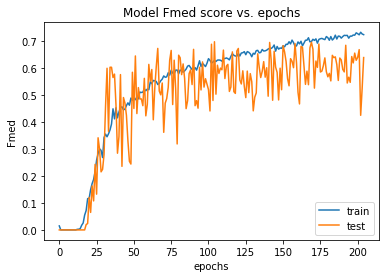

In [80]:
# list all data in history
history = history_val_fmed_sgd
print(history.history.keys())

# summarize history for fmed score
plt.plot(history.history['fmed'])
plt.plot(history.history['val_fmed'])
plt.title('Model Fmed score vs. epochs')
plt.ylabel('Fmed')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

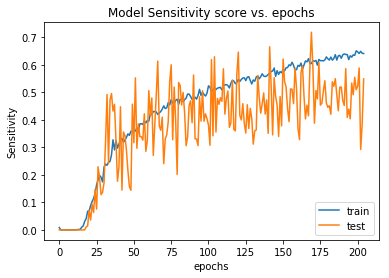

In [81]:
# summarize history for sensitivity score
plt.plot(history.history['sensitivity'])
plt.plot(history.history['val_sensitivity'])
plt.title('Model Sensitivity score vs. epochs')
plt.ylabel('Sensitivity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



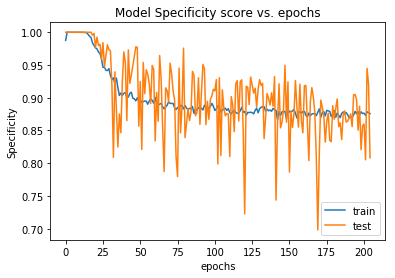

In [82]:
# summarize history for specificity score
plt.plot(history.history['specificity'])
plt.plot(history.history['val_specificity'])
plt.title('Model Specificity score vs. epochs')
plt.ylabel('Specificity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



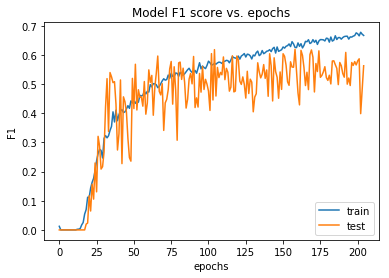

In [83]:
# summarize history for f1 score
plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('Model F1 score vs. epochs')
plt.ylabel('F1')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



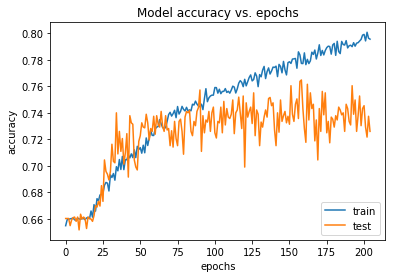

In [84]:
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy vs. epochs')
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



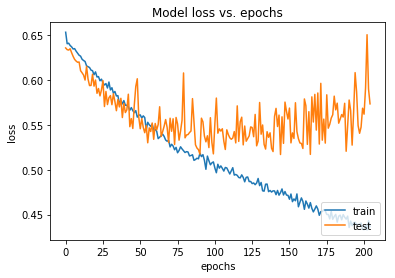

In [85]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss vs. epochs')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

In [86]:
test_generator = train_datagen.flow_from_directory(
        image_dest_dir + "/test",
        target_size=(image_height, image_width),
        batch_size=1,
        color_mode="grayscale",
        class_mode='binary',
        shuffle=False,
        seed=42
)
STEP_SIZE_TEST = test_generator.n // test_generator.batch_size

Found 92 images belonging to 2 classes.


In [87]:
model = generate_model(opt=keras.optimizers.SGD(lr=0.01, nesterov=True))

In [88]:
model.load_weights(data_dir + '/nn_best_model_cv_val_fmed_sgd.h5')

In [89]:
# probabilities = model.predict_generator(test_generator)
# y_true = test_generator.classes
# y_pred = probabilities > 0.5




probabilities = model.predict_generator(test_generator, steps=STEP_SIZE_TEST)
# Pred = model.predict_generator(validation_generator, verbose=1)
y_true = test_generator.classes
y_pred = probabilities > 0.5

In [90]:
confusion_matrix(y_true, y_pred)

array([[44, 16],
       [11, 21]], dtype=int64)

In [91]:
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

In [92]:
specificity = tn / (tn+fp)
specificity

0.7333333333333333

In [93]:
sensitivity = tp / (tp + fn)
sensitivity

0.65625

In [0]:
accuracy = tp / (tp + fn)
accuracy

In [ ]:
precision = tp / (tp + fn)
accuracy

In [94]:
alarm  = fn/ (tp + fn)
alarm

0.34375

# ZFNET

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sns
import keras
from keras.models import Model,Sequential
from keras.layers import Dense,MaxPooling2D,Activation,Flatten,Input,Conv2D,Dropout




def convnet(input_shape,classes):
    model=Sequential()
    
#     model.add(Input(shape=input_shape))
    model.add(Conv2D(filters=96,kernel_size=(7,7),strides=(2,2),padding="valid",activation="relu",
                    kernel_initializer="uniform",input_shape=input_shape))
    
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    
    model.add(Conv2D(filters=256,kernel_size=(5,5),strides=(2,2),padding="same",
                    activation="relu",kernel_initializer="uniform"))
    
    model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
    model.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding="same",
                     kernel_initializer="uniform"))
    
    model.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding="same",
                     kernel_initializer="uniform"))
    model.add(Conv2D(filters=256,kernel_size=(5,5),strides=(1,1),padding="same",
                    activation="relu",kernel_initializer="uniform"))
    
    model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
    
    model.add(Flatten())
    model.add(Dense(4096,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=4096,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=classes,activation="softmax"))
    return model

model=convnet(input_shape=(267,267,3),classes=1000)
    

# ALEXNET

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Model,Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,Activation,Dropout,Input





def convnet(input_shape,classes):
    input_X=Input(shape=input_shape)
    X=Conv2D(filters=96,kernel_size=(11,11),strides=(4,4),padding="valid")(input_X)
    X=Activation("relu")(X)
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2))(X)
    
    X=Conv2D(filters=256,kernel_size=(5,5),strides=(1,1),padding="same",activation="relu")(X)
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2))(X)
    
    X=Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu")(X)
    X=Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu")(X)
    X=Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu")(X)
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2))(X)
    X=Flatten()(X)
    
    X=Dense(units=4096,activation="relu")(X)
    X=Dropout(0.5)(X)
    
    X=Dense(units=4096,activation="relu")(X)
    X=Dropout(0.3)(X)
    
    model=Model(inputs=input_X,outputs=X)
    return model

model=convnet((327,327,2),10)

# LESNET

In [ ]:
import keras
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.layers import Conv2D,BatchNormalization,Activation,Dense,Flatten,Input,MaxPooling2D
from keras.models import Model,Sequential
from keras.utils.vis_utils import plot_model

def convnet(input_shape,classes):
    input_X=Input(shape=input_shape)
    X=Conv2D(filters=6,kernel_size=(5,5),padding="valid")(input_X)
    X=Activation("tanh")(X)
    X=MaxPooling2D(pool_size=(2,2))(X)
    
    X=Conv2D(filters=16,kernel_size=(5,5),padding="valid")(X)
    X=Activation("tanh")(X)
    X=MaxPooling2D(pool_size=(2,2))(X)
    
    X=Flatten()(X)
    X=Dense(120)(X)
    X=Activation("tanh")(X)
    X=Dense(84)(X)
    X=Activation("tanh")(X)
    X=Dense(classes,activation="softmax")(X)
    model=Model(inputs=input_X,outputs=X)
    return model

model=convnet(input_shape=(247,247,2),classes=10)

# VGG16

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sns
import keras
from keras.models import Model,Sequential
from keras.layers import Dense,MaxPooling2D,Activation,Flatten,Input,Conv2D,Dropout



def convnet(input_shape,classes):
    model=Sequential()
    
    model.add(Conv2D(filters=64,kernel_size=(3,3),activation="relu",kernel_initializer="uniform",
                    input_shape=input_shape,padding="same",strides=(1,1)))
    
    model.add(Conv2D(filters=64,kernel_size=(3,3),strides=(1,1),padding="same",
                    activation="relu",kernel_initializer="uniform"))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Conv2D(filters=128,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
    
    model.add(Conv2D(filters=128,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
        
    model.add(MaxPooling2D(pool_size=(2,2)))
    
    model.add(Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
    
    model.add(Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
        
    model.add(MaxPooling2D(pool_size=(2,2)))
    

    model.add(Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
    
    model.add(Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
        
    model.add(MaxPooling2D(pool_size=(2,2)))
    
    model.add(Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
    
    model.add(Conv2D(filters=512,kernel_size=(3,3),strides=(1,1),padding="same",activation="relu",
                    kernel_initializer="uniform"))
        
    model.add(MaxPooling2D(pool_size=(2,2)))
    
    model.add(Flatten())
    
    model.add(Dense(units=4096,activation="relu"))
    model.add(Dropout(0.5))
    
    model.add(Dense(units=4096,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=classes,activation="softmax"))
    return model

model=convnet(input_shape=(224,224,3),classes=1000)
    



# VGG19

# GOOGLENET

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sns
import keras
from keras.models import Model,Sequential
from keras.layers import Dense,MaxPooling2D,Activation,Flatten,Input,Conv2D,Dropout,AveragePooling2D,BatchNormalization
from keras.layers import concatenate

def conv2d_bn(X,bn_filter,kernel_size,padding="same",strides=(1,1)):
    
    X=Conv2D(filters=bn_filter,kernel_size=kernel_size,padding=padding,strides=strides)(X)
    X=BatchNormalization(axis=3)(X)
    return X


def inception(X,bn_filter):
    branch1x1=conv2d_bn(X,bn_filter,(1,1),padding="same",strides=(1,1))
    
    branch3x3=conv2d_bn(X,bn_filter,(1,1))
    branch3x3=conv2d_bn(branch3x3,bn_filter,(3,3),padding="same",strides=(1,1))
    
    branch5x5=conv2d_bn(X,bn_filter,(1,1))
    branch5x5=conv2d_bn(branch5x5,bn_filter,kernel_size=(5,5))
    
    branchpool=MaxPooling2D(pool_size=(3,3),strides=(1,1),padding="same")(X)
    branchpool=conv2d_bn(branchpool,bn_filter,kernel_size=(1,1))
    
    X=concatenate([branch1x1,branch3x3,branch5x5,branchpool])
    return X

def convnet(input_shape,classes):
    input_x=Input(shape=input_shape)
    X=conv2d_bn(input_x,64,(7,7),strides=(2,2),padding="same")
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2),padding="same")(X)
    X=conv2d_bn(X,192,(3,3),strides=(1,1),padding="same")
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2),padding="same")(X)
    
    X=inception(X,120)
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2),padding="same")(X)
    X=inception(X,128)
    X=inception(X,128)
    X=inception(X,128)
    X=inception(X,132)
    X=inception(X,208)
    X=MaxPooling2D(pool_size=(3,3),strides=(2,2),padding="same")(X)
    X=inception(X,208)
    X=inception(X,256)
    X=AveragePooling2D(pool_size=(7,7),strides=(7,7),padding="same")(X)
    X=Dropout(0.4)(X)
    X=Dense(units=classes,activation="relu")(X)
    X=Dense(units=classes,activation="softmax")(X)
    model=Model(inputs=input_x,outputs=X)
    return model

model=convnet((800,800,3),1000)

    X=inception(X,64